In [1]:
import numpy as np
import pandas as pd
from pandas import *
import matplotlib.pyplot as plt
%matplotlib inline
from matplotlib.pylab import rcParams
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import roc_auc_score, mean_absolute_error, r2_score
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier
from sklearn.model_selection import RandomizedSearchCV

In [2]:
df = pd.read_csv('trend_v4.csv', encoding='utf-8')
training_set = pd.read_csv('training-set.csv', encoding='utf-8',
                           names=['FileID', 'Label'])
df_training = pd.merge(df, training_set, on=['FileID'], how='inner')

In [3]:
# Imputation of variables
#total_time = 3600*24*90
total_time = 0
df_training['QueryTsIntervalMean'].fillna(value=total_time, inplace=True)
#df_training['QueryTsIntervalStd'].fillna(value=0, inplace=True) 
df_training = df_training.fillna(0)
#df_training.to_csv('trend_v4.csv', index=False)
feature = list(df_training)
#df_training.info()
df_training.head()
#df_training.set_index("FileID")

,FileID,QueryTsIntervalMean,QueryTsIntervalCount,QueryTsIntervalNunique,QueryTsIntervalMax,QueryTsIntervalSum,QueryTsIntervalSkew,QueryTsIntervalMad,QueryTsIntervalPercentile_25,QueryTsIntervalPercentile_75,...,FileIDCountDaily_skew,FileIDCountDaily_percentile_25,ProductID_idf.1,ProductID_tfidf_max,ProductID_tfidf_mean,ProductID_tfidf_ptp,ProductID_tfidf_q3,ProductID_tfidf_std,QueryTsIntervalStd,Label
0,0000e2398b12121a85166fed5fe2a3da,8116.000000,46.0,14.0,287902.0,373336.0,6.347084,14643.608696,1.0,3.0,...,1.718176,2.00,3.268684,0.000225,0.000009,0.000225,0.0,0.000042,43214.381573,0
1,0001fe8dce14ce099aa6ca8ea5026ea7,1965.403433,233.0,226.0,22908.0,457939.0,3.684798,1709.477942,392.0,2088.0,...,-0.866003,34.50,2.981001,0.001001,0.000067,0.001001,0.0,0.000240,2887.162749,0
2,00027f50019000accc492e5684efc818,834.660477,377.0,95.0,56130.0,314667.0,8.820998,1492.080462,0.0,20.0,...,1.840791,10.00,2.575536,0.001594,0.000123,0.001594,0.0,0.000380,5359.965549,0
3,00028c9da3573ec50db74b44310ae507,1319.098093,367.0,216.0,80033.0,484109.0,8.180227,2096.629688,12.0,380.0,...,2.448492,4.50,2.757858,0.000933,0.000056,0.000933,0.0,0.000196,6883.769431,0
4,0003dc8130969abe688cadf5f14ea19f,1967.081197,234.0,204.0,62842.0,460297.0,7.466131,2379.007816,64.0,1510.0,...,1.000628,3.25,2.757858,0.000554,0.000037,0.000554,0.0,0.000117,6707.233818,0


In [4]:
# Define X and y 
y = df_training['Label']
X = df_training.drop(['FileID','Label'],1)

In [36]:
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
import pandas as pd
import os
from mlxtend.classifier import StackingClassifier
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression,Lasso,Ridge
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error,roc_auc_score
from sklearn.externals import joblib
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler,Normalizer,MinMaxScaler,LabelEncoder,Imputer
from sklearn.feature_selection import VarianceThreshold
#import matplotlib.pyplot as plt
import copy
import numpy as np
from collections import Counter
import warnings
lr = LogisticRegression(C=0.1)
xgbm = XGBClassifier(learning_rate=0.1,reg_alpha=0.1, reg_lambda=1)
lgbm = LGBMClassifier(learning_rate=0.1,reg_alpha=0.1, reg_lambda=1)
rdf = RandomForestClassifier()
classifiers = [rdf,xgbm,lgbm]
classifiers = [xgbm,lgbm]
grid = StackingClassifier(classifiers=classifiers,use_probas=True,average_probas=False,meta_classifier=lr)

In [37]:
params = {'xgbclassifier__n_estimators': [500],
          'xgbclassifier__max_depth': [3],
          'lgbmclassifier__n_estimators':[500],
          'lgbmclassifier__max_depth': [3],
          #'randomforestclassifier__n_estimators':[100],
          #'randomforestclassifier__max_depth': [3],
          'meta-logisticregression__C': [0.1]
          }

grid = GridSearchCV(estimator=grid,
                    param_grid=params,
                    cv=5,
                    refit=True, verbose=True, scoring='roc_auc')

In [38]:
#x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.33)

#eval_set =  [(x_test, y_test)]
print('fitting')
grid.fit(X,y)

fitting
Fitting 5 folds for each of 1 candidates, totalling 5 fits


[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed: 12.4min finished


GridSearchCV(cv=5, error_score='raise',
       estimator=StackingClassifier(average_probas=False,
          classifiers=[XGBClassifier(base_score=0.5, booster='gbtree', colsample_bylevel=1,
       colsample_bytree=1, gamma=0, learning_rate=0.1, max_delta_step=0,
       max_depth=3, min_child_weight=1, missing=None, n_estimators=100,
       n_job...re_train_meta_features=False, use_features_in_secondary=False,
          use_probas=True, verbose=0),
       fit_params=None, iid=True, n_jobs=1,
       param_grid={'xgbclassifier__n_estimators': [500], 'xgbclassifier__max_depth': [3], 'lgbmclassifier__n_estimators': [500], 'lgbmclassifier__max_depth': [3], 'meta-logisticregression__C': [0.1]},
       pre_dispatch='2*n_jobs', refit=True, return_train_score='warn',
       scoring='roc_auc', verbose=True)

In [39]:
x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.33)
y_pred = grid.predict(x_test)
y_pred_proba = grid.predict_proba(x_test)[:,1]
import numpy as np
from sklearn import metrics
print(metrics.roc_auc_score(y_test,y_pred_proba))
print(metrics.accuracy_score(y_test,y_pred))

0.963350467661
0.953320639317


In [5]:
# # Create submission
# testing_set = pd.read_csv('testing-set.csv', encoding='utf-8', 
#                           names=['FileID','Label'])
# dft = pd.merge(df, testing_set, on=['FileID'], how='inner')
# dft = dft.fillna(0)
# dft2 = dft.drop(['FileID','Label'],1)
# # Create submission
# y_predt = model_xgb.predict_proba(dft2)[:,1]
# y_predt = pd.DataFrame(y_predt, columns=['Label'])
# submission = pd.concat([pd.DataFrame(dft['FileID']), y_predt], axis=1)
# submission

In [5]:
# CatBoostClassifier Classifier
X_train, X_val, y_train, y_val = train_test_split(X, y, random_state=7, test_size=0.33)
#eval_set = [(X_val, y_val)]
eval_set = (X_val, y_val)
model_cgb = CatBoostClassifier(max_depth=3, learning_rate=0.1, n_estimators=88000, eval_metric='AUC', reg_lambda=1, random_seed=9527)
model_cgb.fit(X_train, y_train, eval_set=eval_set, verbose=True)
# model.predict will return the predicted label
y_pred = model_cgb.predict(X_val)
y_pred_proba = model_cgb.predict_proba(X_val)[:,1]
roc_auc = metrics.roc_auc_score(y_val, y_pred_proba)
print('roc_auc: %.2f%%' % roc_auc)

0:	learn: 0.7183466	test: 0.7124741	best: 0.7124741 (0)	total: 114ms	remaining: 2h 47m 18s
1:	learn: 0.7321300	test: 0.7274224	best: 0.7274224 (1)	total: 336ms	remaining: 4h 6m 8s
2:	learn: 0.7884776	test: 0.7850186	best: 0.7850186 (2)	total: 725ms	remaining: 5h 54m 16s
3:	learn: 0.8038880	test: 0.8052130	best: 0.8052130 (3)	total: 1.2s	remaining: 7h 18m 34s
4:	learn: 0.8095337	test: 0.8114988	best: 0.8114988 (4)	total: 1.62s	remaining: 7h 54m 4s
5:	learn: 0.8186196	test: 0.8183879	best: 0.8183879 (5)	total: 1.93s	remaining: 7h 51m 13s
6:	learn: 0.8222763	test: 0.8217061	best: 0.8217061 (6)	total: 2.3s	remaining: 8h 2m 30s
7:	learn: 0.8251339	test: 0.8219913	best: 0.8219913 (7)	total: 2.71s	remaining: 8h 16m 31s
8:	learn: 0.8315901	test: 0.8272022	best: 0.8272022 (8)	total: 3.02s	remaining: 8h 12m 6s
9:	learn: 0.8328262	test: 0.8289836	best: 0.8289836 (9)	total: 3.33s	remaining: 8h 8m 10s
10:	learn: 0.8352660	test: 0.8314573	best: 0.8314573 (10)	total: 3.61s	remaining: 8h 1m 53s
11:	le

90:	learn: 0.8918983	test: 0.8858030	best: 0.8858030 (90)	total: 30s	remaining: 8h 2m 52s
91:	learn: 0.8921560	test: 0.8860324	best: 0.8860324 (91)	total: 30.3s	remaining: 8h 2m 36s
92:	learn: 0.8923150	test: 0.8861071	best: 0.8861071 (92)	total: 30.6s	remaining: 8h 1m 49s
93:	learn: 0.8925069	test: 0.8862572	best: 0.8862572 (93)	total: 30.9s	remaining: 8h 1m 22s
94:	learn: 0.8927402	test: 0.8864559	best: 0.8864559 (94)	total: 31.2s	remaining: 8h 1m 6s
95:	learn: 0.8929233	test: 0.8866603	best: 0.8866603 (95)	total: 31.6s	remaining: 8h 2m 17s
96:	learn: 0.8931453	test: 0.8868590	best: 0.8868590 (96)	total: 32s	remaining: 8h 3m 13s
97:	learn: 0.8938572	test: 0.8873170	best: 0.8873170 (97)	total: 32.4s	remaining: 8h 3m 49s
98:	learn: 0.8939067	test: 0.8873685	best: 0.8873685 (98)	total: 32.7s	remaining: 8h 3m 39s
99:	learn: 0.8940934	test: 0.8875883	best: 0.8875883 (99)	total: 33s	remaining: 8h 2m 59s
100:	learn: 0.8946941	test: 0.8881157	best: 0.8881157 (100)	total: 33.3s	remaining: 8h 

178:	learn: 0.9137908	test: 0.9052935	best: 0.9052935 (178)	total: 1m	remaining: 8h 12m 42s
179:	learn: 0.9140906	test: 0.9054412	best: 0.9054412 (179)	total: 1m	remaining: 8h 12m 21s
180:	learn: 0.9141008	test: 0.9054828	best: 0.9054828 (180)	total: 1m	remaining: 8h 11m 58s
181:	learn: 0.9142119	test: 0.9055870	best: 0.9055870 (181)	total: 1m 1s	remaining: 8h 11m 42s
182:	learn: 0.9143061	test: 0.9056588	best: 0.9056588 (182)	total: 1m 1s	remaining: 8h 11m 32s
183:	learn: 0.9143972	test: 0.9057374	best: 0.9057374 (183)	total: 1m 1s	remaining: 8h 12m 34s
184:	learn: 0.9146055	test: 0.9059881	best: 0.9059881 (184)	total: 1m 2s	remaining: 8h 12m 24s
185:	learn: 0.9148236	test: 0.9062341	best: 0.9062341 (185)	total: 1m 2s	remaining: 8h 12m 11s
186:	learn: 0.9149237	test: 0.9063655	best: 0.9063655 (186)	total: 1m 2s	remaining: 8h 11m 57s
187:	learn: 0.9151405	test: 0.9066036	best: 0.9066036 (187)	total: 1m 3s	remaining: 8h 12m 19s
188:	learn: 0.9151736	test: 0.9066248	best: 0.9066248 (188)

265:	learn: 0.9242839	test: 0.9141611	best: 0.9141673 (264)	total: 1m 29s	remaining: 8h 9m 44s
266:	learn: 0.9243199	test: 0.9141838	best: 0.9141838 (266)	total: 1m 29s	remaining: 8h 9m 39s
267:	learn: 0.9244336	test: 0.9143057	best: 0.9143057 (267)	total: 1m 29s	remaining: 8h 9m 30s
268:	learn: 0.9245082	test: 0.9143894	best: 0.9143894 (268)	total: 1m 30s	remaining: 8h 9m 20s
269:	learn: 0.9246142	test: 0.9144910	best: 0.9144910 (269)	total: 1m 30s	remaining: 8h 9m 38s
270:	learn: 0.9246666	test: 0.9145574	best: 0.9145574 (270)	total: 1m 30s	remaining: 8h 9m 17s
271:	learn: 0.9247064	test: 0.9146163	best: 0.9146163 (271)	total: 1m 30s	remaining: 8h 8m 11s
272:	learn: 0.9247680	test: 0.9146641	best: 0.9146641 (272)	total: 1m 31s	remaining: 8h 7m 57s
273:	learn: 0.9248711	test: 0.9147615	best: 0.9147615 (273)	total: 1m 31s	remaining: 8h 8m 18s
274:	learn: 0.9249154	test: 0.9148104	best: 0.9148104 (274)	total: 1m 31s	remaining: 8h 8m 6s
275:	learn: 0.9249377	test: 0.9148432	best: 0.91484

352:	learn: 0.9318777	test: 0.9196793	best: 0.9196793 (352)	total: 1m 58s	remaining: 8h 10m 41s
353:	learn: 0.9319633	test: 0.9197047	best: 0.9197047 (353)	total: 1m 58s	remaining: 8h 10m 35s
354:	learn: 0.9319796	test: 0.9197264	best: 0.9197264 (354)	total: 1m 59s	remaining: 8h 10m 24s
355:	learn: 0.9319780	test: 0.9197225	best: 0.9197264 (354)	total: 1m 59s	remaining: 8h 10m 39s
356:	learn: 0.9320193	test: 0.9197431	best: 0.9197431 (356)	total: 1m 59s	remaining: 8h 10m 51s
357:	learn: 0.9321017	test: 0.9198889	best: 0.9198889 (357)	total: 2m	remaining: 8h 10m 45s
358:	learn: 0.9322309	test: 0.9200104	best: 0.9200104 (358)	total: 2m	remaining: 8h 10m 34s
359:	learn: 0.9323630	test: 0.9200113	best: 0.9200113 (359)	total: 2m	remaining: 8h 10m 24s
360:	learn: 0.9323836	test: 0.9199997	best: 0.9200113 (359)	total: 2m 1s	remaining: 8h 10m 15s
361:	learn: 0.9324791	test: 0.9200069	best: 0.9200113 (359)	total: 2m 1s	remaining: 8h 10m 10s
362:	learn: 0.9325599	test: 0.9200686	best: 0.9200686 

439:	learn: 0.9371174	test: 0.9231161	best: 0.9231161 (439)	total: 2m 27s	remaining: 8h 9m 55s
440:	learn: 0.9371807	test: 0.9230963	best: 0.9231161 (439)	total: 2m 28s	remaining: 8h 10m 7s
441:	learn: 0.9372878	test: 0.9232334	best: 0.9232334 (441)	total: 2m 28s	remaining: 8h 10m 23s
442:	learn: 0.9373089	test: 0.9232496	best: 0.9232496 (442)	total: 2m 28s	remaining: 8h 10m 34s
443:	learn: 0.9373226	test: 0.9232644	best: 0.9232644 (443)	total: 2m 29s	remaining: 8h 10m 39s
444:	learn: 0.9373855	test: 0.9233106	best: 0.9233106 (444)	total: 2m 29s	remaining: 8h 10m 39s
445:	learn: 0.9374061	test: 0.9233395	best: 0.9233395 (445)	total: 2m 29s	remaining: 8h 10m 30s
446:	learn: 0.9374153	test: 0.9233285	best: 0.9233395 (445)	total: 2m 30s	remaining: 8h 10m 22s
447:	learn: 0.9374540	test: 0.9233283	best: 0.9233395 (445)	total: 2m 30s	remaining: 8h 10m 12s
448:	learn: 0.9374719	test: 0.9233273	best: 0.9233395 (445)	total: 2m 30s	remaining: 8h 9m 48s
449:	learn: 0.9375287	test: 0.9233352	best:

525:	learn: 0.9416629	test: 0.9260101	best: 0.9260352 (524)	total: 2m 56s	remaining: 8h 9m 31s
526:	learn: 0.9417236	test: 0.9260263	best: 0.9260352 (524)	total: 2m 57s	remaining: 8h 9m 40s
527:	learn: 0.9418044	test: 0.9261235	best: 0.9261235 (527)	total: 2m 57s	remaining: 8h 9m 33s
528:	learn: 0.9420557	test: 0.9263333	best: 0.9263333 (528)	total: 2m 57s	remaining: 8h 9m 43s
529:	learn: 0.9420785	test: 0.9263477	best: 0.9263477 (529)	total: 2m 58s	remaining: 8h 9m 38s
530:	learn: 0.9421283	test: 0.9264798	best: 0.9264798 (530)	total: 2m 58s	remaining: 8h 9m 30s
531:	learn: 0.9422647	test: 0.9266198	best: 0.9266198 (531)	total: 2m 58s	remaining: 8h 9m 24s
532:	learn: 0.9422735	test: 0.9266295	best: 0.9266295 (532)	total: 2m 58s	remaining: 8h 9m 18s
533:	learn: 0.9423107	test: 0.9266573	best: 0.9266573 (533)	total: 2m 59s	remaining: 8h 9m 12s
534:	learn: 0.9423451	test: 0.9266374	best: 0.9266573 (533)	total: 2m 59s	remaining: 8h 9m 7s
535:	learn: 0.9423864	test: 0.9266388	best: 0.92665

612:	learn: 0.9450552	test: 0.9281653	best: 0.9281653 (612)	total: 3m 25s	remaining: 8h 9m 20s
613:	learn: 0.9451114	test: 0.9281695	best: 0.9281695 (613)	total: 3m 26s	remaining: 8h 9m 29s
614:	learn: 0.9451562	test: 0.9281624	best: 0.9281695 (613)	total: 3m 26s	remaining: 8h 9m 36s
615:	learn: 0.9452739	test: 0.9282704	best: 0.9282704 (615)	total: 3m 27s	remaining: 8h 9m 45s
616:	learn: 0.9452960	test: 0.9282868	best: 0.9282868 (616)	total: 3m 27s	remaining: 8h 10m 7s
617:	learn: 0.9453069	test: 0.9282825	best: 0.9282868 (616)	total: 3m 27s	remaining: 8h 9m 49s
618:	learn: 0.9453848	test: 0.9282883	best: 0.9282883 (618)	total: 3m 28s	remaining: 8h 9m 58s
619:	learn: 0.9453674	test: 0.9282867	best: 0.9282883 (618)	total: 3m 28s	remaining: 8h 9m 52s
620:	learn: 0.9453759	test: 0.9282992	best: 0.9282992 (620)	total: 3m 28s	remaining: 8h 10m 1s
621:	learn: 0.9453804	test: 0.9283033	best: 0.9283033 (621)	total: 3m 29s	remaining: 8h 9m 55s
622:	learn: 0.9454113	test: 0.9283118	best: 0.9283

698:	learn: 0.9478145	test: 0.9297622	best: 0.9297784 (697)	total: 3m 55s	remaining: 8h 11m 5s
699:	learn: 0.9478442	test: 0.9297462	best: 0.9297784 (697)	total: 3m 56s	remaining: 8h 11m 11s
700:	learn: 0.9478749	test: 0.9297984	best: 0.9297984 (700)	total: 3m 56s	remaining: 8h 11m 7s
701:	learn: 0.9478732	test: 0.9298031	best: 0.9298031 (701)	total: 3m 57s	remaining: 8h 11m 14s
702:	learn: 0.9479241	test: 0.9298180	best: 0.9298180 (702)	total: 3m 57s	remaining: 8h 11m 10s
703:	learn: 0.9479170	test: 0.9298179	best: 0.9298180 (702)	total: 3m 57s	remaining: 8h 11m 17s
704:	learn: 0.9479257	test: 0.9298266	best: 0.9298266 (704)	total: 3m 58s	remaining: 8h 11m 23s
705:	learn: 0.9479338	test: 0.9297893	best: 0.9298266 (704)	total: 3m 58s	remaining: 8h 11m 28s
706:	learn: 0.9479759	test: 0.9297926	best: 0.9298266 (704)	total: 3m 58s	remaining: 8h 11m 37s
707:	learn: 0.9480130	test: 0.9298168	best: 0.9298266 (704)	total: 3m 59s	remaining: 8h 11m 34s
708:	learn: 0.9480154	test: 0.9298268	best

784:	learn: 0.9501770	test: 0.9307629	best: 0.9308085 (778)	total: 4m 25s	remaining: 8h 11m 46s
785:	learn: 0.9501844	test: 0.9307542	best: 0.9308085 (778)	total: 4m 25s	remaining: 8h 11m 41s
786:	learn: 0.9502326	test: 0.9307754	best: 0.9308085 (778)	total: 4m 26s	remaining: 8h 11m 47s
787:	learn: 0.9502345	test: 0.9307952	best: 0.9308085 (778)	total: 4m 26s	remaining: 8h 11m 44s
788:	learn: 0.9503076	test: 0.9308021	best: 0.9308085 (778)	total: 4m 26s	remaining: 8h 11m 39s
789:	learn: 0.9503322	test: 0.9307727	best: 0.9308085 (778)	total: 4m 27s	remaining: 8h 11m 46s
790:	learn: 0.9503517	test: 0.9308073	best: 0.9308085 (778)	total: 4m 27s	remaining: 8h 11m 40s
791:	learn: 0.9503539	test: 0.9308105	best: 0.9308105 (791)	total: 4m 27s	remaining: 8h 11m 36s
792:	learn: 0.9503799	test: 0.9308279	best: 0.9308279 (792)	total: 4m 28s	remaining: 8h 11m 30s
793:	learn: 0.9504225	test: 0.9308486	best: 0.9308486 (793)	total: 4m 28s	remaining: 8h 11m 15s
794:	learn: 0.9504396	test: 0.9308540	be

870:	learn: 0.9526305	test: 0.9316918	best: 0.9316918 (870)	total: 4m 54s	remaining: 8h 11m 34s
871:	learn: 0.9526660	test: 0.9316978	best: 0.9316978 (871)	total: 4m 55s	remaining: 8h 11m 59s
872:	learn: 0.9526639	test: 0.9317059	best: 0.9317059 (872)	total: 4m 55s	remaining: 8h 12m 1s
873:	learn: 0.9527718	test: 0.9317538	best: 0.9317538 (873)	total: 4m 56s	remaining: 8h 12m 1s
874:	learn: 0.9528012	test: 0.9317460	best: 0.9317538 (873)	total: 4m 56s	remaining: 8h 11m 55s
875:	learn: 0.9528058	test: 0.9317513	best: 0.9317538 (873)	total: 4m 56s	remaining: 8h 12m 1s
876:	learn: 0.9527964	test: 0.9317650	best: 0.9317650 (876)	total: 4m 57s	remaining: 8h 11m 58s
877:	learn: 0.9528068	test: 0.9317590	best: 0.9317650 (876)	total: 4m 57s	remaining: 8h 12m 2s
878:	learn: 0.9528229	test: 0.9317342	best: 0.9317650 (876)	total: 4m 57s	remaining: 8h 12m 9s
879:	learn: 0.9528398	test: 0.9317615	best: 0.9317650 (876)	total: 4m 58s	remaining: 8h 12m 13s
880:	learn: 0.9528419	test: 0.9317868	best: 0

956:	learn: 0.9550649	test: 0.9325610	best: 0.9325697 (955)	total: 5m 24s	remaining: 8h 11m 43s
957:	learn: 0.9550703	test: 0.9325831	best: 0.9325831 (957)	total: 5m 24s	remaining: 8h 11m 47s
958:	learn: 0.9550697	test: 0.9325856	best: 0.9325856 (958)	total: 5m 25s	remaining: 8h 11m 45s
959:	learn: 0.9551292	test: 0.9326026	best: 0.9326026 (959)	total: 5m 25s	remaining: 8h 11m 43s
960:	learn: 0.9551437	test: 0.9326029	best: 0.9326029 (960)	total: 5m 25s	remaining: 8h 11m 54s
961:	learn: 0.9551899	test: 0.9326390	best: 0.9326390 (961)	total: 5m 26s	remaining: 8h 11m 53s
962:	learn: 0.9551899	test: 0.9326473	best: 0.9326473 (962)	total: 5m 26s	remaining: 8h 11m 57s
963:	learn: 0.9552595	test: 0.9326791	best: 0.9326791 (963)	total: 5m 26s	remaining: 8h 11m 53s
964:	learn: 0.9552750	test: 0.9327060	best: 0.9327060 (964)	total: 5m 27s	remaining: 8h 11m 49s
965:	learn: 0.9552876	test: 0.9326823	best: 0.9327060 (964)	total: 5m 27s	remaining: 8h 11m 55s
966:	learn: 0.9553166	test: 0.9326860	be

1041:	learn: 0.9571048	test: 0.9334398	best: 0.9334586 (1037)	total: 5m 53s	remaining: 8h 11m 53s
1042:	learn: 0.9571626	test: 0.9334409	best: 0.9334586 (1037)	total: 5m 54s	remaining: 8h 11m 56s
1043:	learn: 0.9571713	test: 0.9334557	best: 0.9334586 (1037)	total: 5m 54s	remaining: 8h 11m 52s
1044:	learn: 0.9571892	test: 0.9334483	best: 0.9334586 (1037)	total: 5m 54s	remaining: 8h 11m 51s
1045:	learn: 0.9572006	test: 0.9334648	best: 0.9334648 (1045)	total: 5m 54s	remaining: 8h 11m 48s
1046:	learn: 0.9572162	test: 0.9334493	best: 0.9334648 (1045)	total: 5m 55s	remaining: 8h 11m 49s
1047:	learn: 0.9572203	test: 0.9334445	best: 0.9334648 (1045)	total: 5m 55s	remaining: 8h 11m 47s
1048:	learn: 0.9572615	test: 0.9334505	best: 0.9334648 (1045)	total: 5m 55s	remaining: 8h 11m 45s
1049:	learn: 0.9572628	test: 0.9334604	best: 0.9334648 (1045)	total: 5m 56s	remaining: 8h 11m 49s
1050:	learn: 0.9572688	test: 0.9334660	best: 0.9334660 (1050)	total: 5m 56s	remaining: 8h 11m 44s
1051:	learn: 0.95727

1126:	learn: 0.9588820	test: 0.9343179	best: 0.9343179 (1126)	total: 6m 22s	remaining: 8h 11m 23s
1127:	learn: 0.9589692	test: 0.9343593	best: 0.9343593 (1127)	total: 6m 22s	remaining: 8h 11m 20s
1128:	learn: 0.9590462	test: 0.9343879	best: 0.9343879 (1128)	total: 6m 23s	remaining: 8h 11m 23s
1129:	learn: 0.9590686	test: 0.9344001	best: 0.9344001 (1129)	total: 6m 23s	remaining: 8h 11m 27s
1130:	learn: 0.9590770	test: 0.9343880	best: 0.9344001 (1129)	total: 6m 23s	remaining: 8h 11m 24s
1131:	learn: 0.9591061	test: 0.9343944	best: 0.9344001 (1129)	total: 6m 24s	remaining: 8h 11m 21s
1132:	learn: 0.9591402	test: 0.9343959	best: 0.9344001 (1129)	total: 6m 24s	remaining: 8h 11m 19s
1133:	learn: 0.9591455	test: 0.9343788	best: 0.9344001 (1129)	total: 6m 24s	remaining: 8h 11m 22s
1134:	learn: 0.9591934	test: 0.9343740	best: 0.9344001 (1129)	total: 6m 25s	remaining: 8h 11m 19s
1135:	learn: 0.9592074	test: 0.9343786	best: 0.9344001 (1129)	total: 6m 25s	remaining: 8h 11m 23s
1136:	learn: 0.95923

1210:	learn: 0.9604804	test: 0.9348398	best: 0.9348398 (1210)	total: 6m 50s	remaining: 8h 10m 44s
1211:	learn: 0.9604907	test: 0.9348388	best: 0.9348398 (1210)	total: 6m 51s	remaining: 8h 10m 42s
1212:	learn: 0.9605363	test: 0.9348559	best: 0.9348559 (1212)	total: 6m 51s	remaining: 8h 10m 38s
1213:	learn: 0.9605411	test: 0.9348628	best: 0.9348628 (1213)	total: 6m 51s	remaining: 8h 10m 42s
1214:	learn: 0.9605454	test: 0.9348634	best: 0.9348634 (1214)	total: 6m 52s	remaining: 8h 10m 38s
1215:	learn: 0.9605586	test: 0.9348857	best: 0.9348857 (1215)	total: 6m 52s	remaining: 8h 10m 36s
1216:	learn: 0.9605681	test: 0.9348833	best: 0.9348857 (1215)	total: 6m 52s	remaining: 8h 10m 19s
1217:	learn: 0.9605748	test: 0.9348800	best: 0.9348857 (1215)	total: 6m 52s	remaining: 8h 10m 14s
1218:	learn: 0.9606099	test: 0.9349076	best: 0.9349076 (1218)	total: 6m 53s	remaining: 8h 10m 12s
1219:	learn: 0.9606551	test: 0.9349527	best: 0.9349527 (1219)	total: 6m 53s	remaining: 8h 10m 8s
1220:	learn: 0.960674

1295:	learn: 0.9619835	test: 0.9352648	best: 0.9353020 (1270)	total: 7m 19s	remaining: 8h 9m 29s
1296:	learn: 0.9619924	test: 0.9352734	best: 0.9353020 (1270)	total: 7m 19s	remaining: 8h 9m 27s
1297:	learn: 0.9620179	test: 0.9352988	best: 0.9353020 (1270)	total: 7m 19s	remaining: 8h 9m 24s
1298:	learn: 0.9620352	test: 0.9353187	best: 0.9353187 (1298)	total: 7m 19s	remaining: 8h 9m 22s
1299:	learn: 0.9620531	test: 0.9353523	best: 0.9353523 (1299)	total: 7m 20s	remaining: 8h 9m 20s
1300:	learn: 0.9620763	test: 0.9353675	best: 0.9353675 (1300)	total: 7m 20s	remaining: 8h 9m 15s
1301:	learn: 0.9620754	test: 0.9353671	best: 0.9353675 (1300)	total: 7m 20s	remaining: 8h 9m 12s
1302:	learn: 0.9620883	test: 0.9353693	best: 0.9353693 (1302)	total: 7m 21s	remaining: 8h 9m 8s
1303:	learn: 0.9620911	test: 0.9353672	best: 0.9353693 (1302)	total: 7m 21s	remaining: 8h 9m 6s
1304:	learn: 0.9621305	test: 0.9353657	best: 0.9353693 (1302)	total: 7m 21s	remaining: 8h 9m 4s
1305:	learn: 0.9621468	test: 0.93

1380:	learn: 0.9632130	test: 0.9358181	best: 0.9358330 (1378)	total: 7m 47s	remaining: 8h 8m 46s
1381:	learn: 0.9632462	test: 0.9358106	best: 0.9358330 (1378)	total: 7m 47s	remaining: 8h 8m 50s
1382:	learn: 0.9632597	test: 0.9358179	best: 0.9358330 (1378)	total: 7m 48s	remaining: 8h 8m 47s
1383:	learn: 0.9632539	test: 0.9358279	best: 0.9358330 (1378)	total: 7m 48s	remaining: 8h 8m 44s
1384:	learn: 0.9632694	test: 0.9358392	best: 0.9358392 (1384)	total: 7m 48s	remaining: 8h 8m 42s
1385:	learn: 0.9632884	test: 0.9358550	best: 0.9358550 (1385)	total: 7m 49s	remaining: 8h 8m 45s
1386:	learn: 0.9633216	test: 0.9358592	best: 0.9358592 (1386)	total: 7m 49s	remaining: 8h 8m 49s
1387:	learn: 0.9633288	test: 0.9358652	best: 0.9358652 (1387)	total: 7m 49s	remaining: 8h 8m 46s
1388:	learn: 0.9633287	test: 0.9358567	best: 0.9358652 (1387)	total: 7m 50s	remaining: 8h 8m 44s
1389:	learn: 0.9633534	test: 0.9358569	best: 0.9358652 (1387)	total: 7m 50s	remaining: 8h 8m 47s
1390:	learn: 0.9634043	test: 0

1465:	learn: 0.9645482	test: 0.9362301	best: 0.9362346 (1464)	total: 8m 16s	remaining: 8h 8m 46s
1466:	learn: 0.9645656	test: 0.9362570	best: 0.9362570 (1466)	total: 8m 17s	remaining: 8h 8m 49s
1467:	learn: 0.9646082	test: 0.9362580	best: 0.9362580 (1467)	total: 8m 17s	remaining: 8h 8m 47s
1468:	learn: 0.9646188	test: 0.9362708	best: 0.9362708 (1468)	total: 8m 17s	remaining: 8h 8m 44s
1469:	learn: 0.9646396	test: 0.9362729	best: 0.9362729 (1469)	total: 8m 18s	remaining: 8h 8m 41s
1470:	learn: 0.9646444	test: 0.9362823	best: 0.9362823 (1470)	total: 8m 18s	remaining: 8h 8m 39s
1471:	learn: 0.9646793	test: 0.9362877	best: 0.9362877 (1471)	total: 8m 18s	remaining: 8h 8m 42s
1472:	learn: 0.9646799	test: 0.9362838	best: 0.9362877 (1471)	total: 8m 19s	remaining: 8h 8m 45s
1473:	learn: 0.9647085	test: 0.9362931	best: 0.9362931 (1473)	total: 8m 19s	remaining: 8h 8m 47s
1474:	learn: 0.9647312	test: 0.9363072	best: 0.9363072 (1474)	total: 8m 19s	remaining: 8h 8m 46s
1475:	learn: 0.9647410	test: 0

1550:	learn: 0.9656203	test: 0.9365368	best: 0.9365503 (1547)	total: 8m 44s	remaining: 8h 7m 24s
1551:	learn: 0.9656404	test: 0.9365245	best: 0.9365503 (1547)	total: 8m 44s	remaining: 8h 7m 17s
1552:	learn: 0.9656402	test: 0.9365198	best: 0.9365503 (1547)	total: 8m 45s	remaining: 8h 7m 14s
1553:	learn: 0.9656517	test: 0.9365128	best: 0.9365503 (1547)	total: 8m 45s	remaining: 8h 7m 7s
1554:	learn: 0.9656844	test: 0.9365231	best: 0.9365503 (1547)	total: 8m 45s	remaining: 8h 7m 5s
1555:	learn: 0.9657050	test: 0.9365361	best: 0.9365503 (1547)	total: 8m 46s	remaining: 8h 7m 6s
1556:	learn: 0.9657093	test: 0.9365473	best: 0.9365503 (1547)	total: 8m 46s	remaining: 8h 7m 4s
1557:	learn: 0.9657417	test: 0.9365334	best: 0.9365503 (1547)	total: 8m 46s	remaining: 8h 7m 2s
1558:	learn: 0.9657559	test: 0.9365418	best: 0.9365503 (1547)	total: 8m 46s	remaining: 8h 6m 59s
1559:	learn: 0.9657656	test: 0.9365431	best: 0.9365503 (1547)	total: 8m 47s	remaining: 8h 7m 2s
1560:	learn: 0.9657700	test: 0.93652

1636:	learn: 0.9667078	test: 0.9365834	best: 0.9366556 (1618)	total: 9m 12s	remaining: 8h 6m 13s
1637:	learn: 0.9667149	test: 0.9365735	best: 0.9366556 (1618)	total: 9m 13s	remaining: 8h 6m 15s
1638:	learn: 0.9667161	test: 0.9365876	best: 0.9366556 (1618)	total: 9m 13s	remaining: 8h 6m 12s
1639:	learn: 0.9667399	test: 0.9366112	best: 0.9366556 (1618)	total: 9m 14s	remaining: 8h 6m 15s
1640:	learn: 0.9667446	test: 0.9366117	best: 0.9366556 (1618)	total: 9m 14s	remaining: 8h 6m 13s
1641:	learn: 0.9667393	test: 0.9366145	best: 0.9366556 (1618)	total: 9m 14s	remaining: 8h 6m 11s
1642:	learn: 0.9667531	test: 0.9366044	best: 0.9366556 (1618)	total: 9m 14s	remaining: 8h 6m 3s
1643:	learn: 0.9667519	test: 0.9366034	best: 0.9366556 (1618)	total: 9m 15s	remaining: 8h 6m 1s
1644:	learn: 0.9667537	test: 0.9365910	best: 0.9366556 (1618)	total: 9m 15s	remaining: 8h 6m 4s
1645:	learn: 0.9667624	test: 0.9365756	best: 0.9366556 (1618)	total: 9m 15s	remaining: 8h 6m 7s
1646:	learn: 0.9667609	test: 0.936

1721:	learn: 0.9676656	test: 0.9366364	best: 0.9366556 (1618)	total: 9m 40s	remaining: 8h 5m
1722:	learn: 0.9676784	test: 0.9366362	best: 0.9366556 (1618)	total: 9m 41s	remaining: 8h 4m 58s
1723:	learn: 0.9676899	test: 0.9366558	best: 0.9366558 (1723)	total: 9m 41s	remaining: 8h 5m 1s
1724:	learn: 0.9676941	test: 0.9366038	best: 0.9366558 (1723)	total: 9m 41s	remaining: 8h 4m 59s
1725:	learn: 0.9676925	test: 0.9366038	best: 0.9366558 (1723)	total: 9m 42s	remaining: 8h 4m 56s
1726:	learn: 0.9676924	test: 0.9366043	best: 0.9366558 (1723)	total: 9m 42s	remaining: 8h 4m 59s
1727:	learn: 0.9677161	test: 0.9366336	best: 0.9366558 (1723)	total: 9m 42s	remaining: 8h 4m 57s
1728:	learn: 0.9677238	test: 0.9366194	best: 0.9366558 (1723)	total: 9m 43s	remaining: 8h 4m 55s
1729:	learn: 0.9677327	test: 0.9366115	best: 0.9366558 (1723)	total: 9m 43s	remaining: 8h 4m 57s
1730:	learn: 0.9677610	test: 0.9366280	best: 0.9366558 (1723)	total: 9m 43s	remaining: 8h 4m 55s
1731:	learn: 0.9677651	test: 0.9366

1806:	learn: 0.9687653	test: 0.9368680	best: 0.9368680 (1806)	total: 10m 9s	remaining: 8h 4m 28s
1807:	learn: 0.9688276	test: 0.9368742	best: 0.9368742 (1807)	total: 10m 9s	remaining: 8h 4m 26s
1808:	learn: 0.9688274	test: 0.9368887	best: 0.9368887 (1808)	total: 10m 10s	remaining: 8h 4m 28s
1809:	learn: 0.9688261	test: 0.9368797	best: 0.9368887 (1808)	total: 10m 10s	remaining: 8h 4m 26s
1810:	learn: 0.9688296	test: 0.9368755	best: 0.9368887 (1808)	total: 10m 10s	remaining: 8h 4m 25s
1811:	learn: 0.9688314	test: 0.9368741	best: 0.9368887 (1808)	total: 10m 11s	remaining: 8h 4m 27s
1812:	learn: 0.9688273	test: 0.9368766	best: 0.9368887 (1808)	total: 10m 11s	remaining: 8h 4m 26s
1813:	learn: 0.9688333	test: 0.9368766	best: 0.9368887 (1808)	total: 10m 11s	remaining: 8h 4m 28s
1814:	learn: 0.9688393	test: 0.9368893	best: 0.9368893 (1814)	total: 10m 12s	remaining: 8h 4m 29s
1815:	learn: 0.9688398	test: 0.9368913	best: 0.9368913 (1815)	total: 10m 12s	remaining: 8h 4m 28s
1816:	learn: 0.9688468

1890:	learn: 0.9694015	test: 0.9370241	best: 0.9370241 (1890)	total: 10m 37s	remaining: 8h 3m 53s
1891:	learn: 0.9694045	test: 0.9370066	best: 0.9370241 (1890)	total: 10m 37s	remaining: 8h 3m 51s
1892:	learn: 0.9694051	test: 0.9370038	best: 0.9370241 (1890)	total: 10m 38s	remaining: 8h 3m 57s
1893:	learn: 0.9694242	test: 0.9370133	best: 0.9370241 (1890)	total: 10m 38s	remaining: 8h 3m 59s
1894:	learn: 0.9694275	test: 0.9370151	best: 0.9370241 (1890)	total: 10m 39s	remaining: 8h 3m 58s
1895:	learn: 0.9694225	test: 0.9370102	best: 0.9370241 (1890)	total: 10m 39s	remaining: 8h 3m 55s
1896:	learn: 0.9694498	test: 0.9370231	best: 0.9370241 (1890)	total: 10m 39s	remaining: 8h 3m 58s
1897:	learn: 0.9694549	test: 0.9370273	best: 0.9370273 (1897)	total: 10m 40s	remaining: 8h 4m
1898:	learn: 0.9694542	test: 0.9370355	best: 0.9370355 (1898)	total: 10m 40s	remaining: 8h 3m 58s
1899:	learn: 0.9694741	test: 0.9370413	best: 0.9370413 (1899)	total: 10m 40s	remaining: 8h 3m 57s
1900:	learn: 0.9694872	t

1974:	learn: 0.9701524	test: 0.9371912	best: 0.9371912 (1974)	total: 11m 5s	remaining: 8h 3m 16s
1975:	learn: 0.9701558	test: 0.9371936	best: 0.9371936 (1975)	total: 11m 6s	remaining: 8h 3m 19s
1976:	learn: 0.9701851	test: 0.9372061	best: 0.9372061 (1976)	total: 11m 6s	remaining: 8h 3m 16s
1977:	learn: 0.9701939	test: 0.9371997	best: 0.9372061 (1976)	total: 11m 6s	remaining: 8h 3m 15s
1978:	learn: 0.9702171	test: 0.9372086	best: 0.9372086 (1978)	total: 11m 7s	remaining: 8h 3m 15s
1979:	learn: 0.9702258	test: 0.9371984	best: 0.9372086 (1978)	total: 11m 7s	remaining: 8h 3m 14s
1980:	learn: 0.9702621	test: 0.9371843	best: 0.9372086 (1978)	total: 11m 7s	remaining: 8h 3m 16s
1981:	learn: 0.9702606	test: 0.9371762	best: 0.9372086 (1978)	total: 11m 7s	remaining: 8h 3m 10s
1982:	learn: 0.9702738	test: 0.9371765	best: 0.9372086 (1978)	total: 11m 8s	remaining: 8h 3m 13s
1983:	learn: 0.9702742	test: 0.9371766	best: 0.9372086 (1978)	total: 11m 8s	remaining: 8h 3m 11s
1984:	learn: 0.9702783	test: 0

2059:	learn: 0.9710248	test: 0.9374113	best: 0.9374440 (2049)	total: 11m 33s	remaining: 8h 2m 30s
2060:	learn: 0.9710247	test: 0.9374118	best: 0.9374440 (2049)	total: 11m 34s	remaining: 8h 2m 31s
2061:	learn: 0.9710261	test: 0.9374171	best: 0.9374440 (2049)	total: 11m 34s	remaining: 8h 2m 22s
2062:	learn: 0.9710267	test: 0.9374393	best: 0.9374440 (2049)	total: 11m 34s	remaining: 8h 2m 23s
2063:	learn: 0.9710307	test: 0.9374304	best: 0.9374440 (2049)	total: 11m 35s	remaining: 8h 2m 23s
2064:	learn: 0.9710332	test: 0.9374322	best: 0.9374440 (2049)	total: 11m 35s	remaining: 8h 2m 20s
2065:	learn: 0.9710387	test: 0.9374227	best: 0.9374440 (2049)	total: 11m 35s	remaining: 8h 2m 18s
2066:	learn: 0.9710361	test: 0.9374222	best: 0.9374440 (2049)	total: 11m 36s	remaining: 8h 2m 21s
2067:	learn: 0.9710469	test: 0.9374186	best: 0.9374440 (2049)	total: 11m 36s	remaining: 8h 2m 22s
2068:	learn: 0.9710479	test: 0.9374069	best: 0.9374440 (2049)	total: 11m 36s	remaining: 8h 2m 24s
2069:	learn: 0.97104

2144:	learn: 0.9717392	test: 0.9372860	best: 0.9374684 (2085)	total: 12m 2s	remaining: 8h 1m 43s
2145:	learn: 0.9717502	test: 0.9372862	best: 0.9374684 (2085)	total: 12m 2s	remaining: 8h 1m 37s
2146:	learn: 0.9717546	test: 0.9372957	best: 0.9374684 (2085)	total: 12m 2s	remaining: 8h 1m 36s
2147:	learn: 0.9717699	test: 0.9372951	best: 0.9374684 (2085)	total: 12m 3s	remaining: 8h 1m 37s
2148:	learn: 0.9717929	test: 0.9372838	best: 0.9374684 (2085)	total: 12m 3s	remaining: 8h 1m 36s
2149:	learn: 0.9717933	test: 0.9372865	best: 0.9374684 (2085)	total: 12m 3s	remaining: 8h 1m 34s
2150:	learn: 0.9718144	test: 0.9373044	best: 0.9374684 (2085)	total: 12m 3s	remaining: 8h 1m 33s
2151:	learn: 0.9718169	test: 0.9372903	best: 0.9374684 (2085)	total: 12m 4s	remaining: 8h 1m 31s
2152:	learn: 0.9718198	test: 0.9373013	best: 0.9374684 (2085)	total: 12m 4s	remaining: 8h 1m 41s
2153:	learn: 0.9718211	test: 0.9373004	best: 0.9374684 (2085)	total: 12m 5s	remaining: 8h 1m 35s
2154:	learn: 0.9718317	test: 0

2228:	learn: 0.9723262	test: 0.9374034	best: 0.9374684 (2085)	total: 12m 30s	remaining: 8h 1m 14s
2229:	learn: 0.9723373	test: 0.9373907	best: 0.9374684 (2085)	total: 12m 30s	remaining: 8h 1m 12s
2230:	learn: 0.9723403	test: 0.9373924	best: 0.9374684 (2085)	total: 12m 30s	remaining: 8h 1m 10s
2231:	learn: 0.9723461	test: 0.9374014	best: 0.9374684 (2085)	total: 12m 31s	remaining: 8h 1m 11s
2232:	learn: 0.9723511	test: 0.9373951	best: 0.9374684 (2085)	total: 12m 31s	remaining: 8h 1m 14s
2233:	learn: 0.9723542	test: 0.9373979	best: 0.9374684 (2085)	total: 12m 32s	remaining: 8h 1m 15s
2234:	learn: 0.9723591	test: 0.9373955	best: 0.9374684 (2085)	total: 12m 32s	remaining: 8h 1m 15s
2235:	learn: 0.9723559	test: 0.9374013	best: 0.9374684 (2085)	total: 12m 32s	remaining: 8h 1m 17s
2236:	learn: 0.9723614	test: 0.9373952	best: 0.9374684 (2085)	total: 12m 33s	remaining: 8h 1m 14s
2237:	learn: 0.9723633	test: 0.9373706	best: 0.9374684 (2085)	total: 12m 33s	remaining: 8h 1m 13s
2238:	learn: 0.97235

2313:	learn: 0.9729555	test: 0.9373937	best: 0.9374895 (2283)	total: 12m 59s	remaining: 8h 46s
2314:	learn: 0.9729600	test: 0.9373911	best: 0.9374895 (2283)	total: 12m 59s	remaining: 8h 44s
2315:	learn: 0.9729594	test: 0.9374166	best: 0.9374895 (2283)	total: 12m 59s	remaining: 8h 42s
2316:	learn: 0.9729620	test: 0.9374131	best: 0.9374895 (2283)	total: 12m 59s	remaining: 8h 41s
2317:	learn: 0.9729633	test: 0.9374031	best: 0.9374895 (2283)	total: 13m	remaining: 8h 39s
2318:	learn: 0.9729875	test: 0.9374200	best: 0.9374895 (2283)	total: 13m	remaining: 8h 37s
2319:	learn: 0.9729812	test: 0.9374248	best: 0.9374895 (2283)	total: 13m	remaining: 8h 32s
2320:	learn: 0.9729805	test: 0.9374250	best: 0.9374895 (2283)	total: 13m 1s	remaining: 8h 32s
2321:	learn: 0.9729911	test: 0.9374089	best: 0.9374895 (2283)	total: 13m 1s	remaining: 8h 32s
2322:	learn: 0.9729945	test: 0.9374147	best: 0.9374895 (2283)	total: 13m 1s	remaining: 8h 30s
2323:	learn: 0.9729954	test: 0.9374006	best: 0.9374895 (2283)	tot

2399:	learn: 0.9734807	test: 0.9373144	best: 0.9374895 (2283)	total: 13m 26s	remaining: 7h 59m 33s
2400:	learn: 0.9734815	test: 0.9373218	best: 0.9374895 (2283)	total: 13m 27s	remaining: 7h 59m 32s
2401:	learn: 0.9734817	test: 0.9373183	best: 0.9374895 (2283)	total: 13m 27s	remaining: 7h 59m 31s
2402:	learn: 0.9734809	test: 0.9373174	best: 0.9374895 (2283)	total: 13m 27s	remaining: 7h 59m 29s
2403:	learn: 0.9734773	test: 0.9373229	best: 0.9374895 (2283)	total: 13m 27s	remaining: 7h 59m 27s
2404:	learn: 0.9734775	test: 0.9373230	best: 0.9374895 (2283)	total: 13m 28s	remaining: 7h 59m 29s
2405:	learn: 0.9734763	test: 0.9373284	best: 0.9374895 (2283)	total: 13m 28s	remaining: 7h 59m 24s
2406:	learn: 0.9734839	test: 0.9373336	best: 0.9374895 (2283)	total: 13m 28s	remaining: 7h 59m 25s
2407:	learn: 0.9734839	test: 0.9373332	best: 0.9374895 (2283)	total: 13m 29s	remaining: 7h 59m 23s
2408:	learn: 0.9734843	test: 0.9373247	best: 0.9374895 (2283)	total: 13m 29s	remaining: 7h 59m 15s
2409:	lear

2482:	learn: 0.9741211	test: 0.9372492	best: 0.9374895 (2283)	total: 13m 54s	remaining: 7h 58m 52s
2483:	learn: 0.9741189	test: 0.9372491	best: 0.9374895 (2283)	total: 13m 54s	remaining: 7h 58m 51s
2484:	learn: 0.9741284	test: 0.9372510	best: 0.9374895 (2283)	total: 13m 54s	remaining: 7h 58m 49s
2485:	learn: 0.9741343	test: 0.9372564	best: 0.9374895 (2283)	total: 13m 55s	remaining: 7h 58m 48s
2486:	learn: 0.9741386	test: 0.9372702	best: 0.9374895 (2283)	total: 13m 55s	remaining: 7h 58m 50s
2487:	learn: 0.9741380	test: 0.9372725	best: 0.9374895 (2283)	total: 13m 55s	remaining: 7h 58m 49s
2488:	learn: 0.9741401	test: 0.9372703	best: 0.9374895 (2283)	total: 13m 56s	remaining: 7h 58m 50s
2489:	learn: 0.9741444	test: 0.9372704	best: 0.9374895 (2283)	total: 13m 56s	remaining: 7h 58m 48s
2490:	learn: 0.9741757	test: 0.9372752	best: 0.9374895 (2283)	total: 13m 56s	remaining: 7h 58m 50s
2491:	learn: 0.9741759	test: 0.9372750	best: 0.9374895 (2283)	total: 13m 57s	remaining: 7h 58m 49s
2492:	lear

2566:	learn: 0.9746578	test: 0.9372567	best: 0.9374895 (2283)	total: 14m 22s	remaining: 7h 58m 28s
2567:	learn: 0.9746579	test: 0.9372561	best: 0.9374895 (2283)	total: 14m 22s	remaining: 7h 58m 29s
2568:	learn: 0.9746733	test: 0.9372526	best: 0.9374895 (2283)	total: 14m 23s	remaining: 7h 58m 33s
2569:	learn: 0.9746750	test: 0.9372571	best: 0.9374895 (2283)	total: 14m 23s	remaining: 7h 58m 33s
2570:	learn: 0.9746803	test: 0.9372793	best: 0.9374895 (2283)	total: 14m 24s	remaining: 7h 58m 35s
2571:	learn: 0.9746810	test: 0.9372806	best: 0.9374895 (2283)	total: 14m 24s	remaining: 7h 58m 33s
2572:	learn: 0.9746828	test: 0.9372836	best: 0.9374895 (2283)	total: 14m 24s	remaining: 7h 58m 35s
2573:	learn: 0.9746860	test: 0.9372850	best: 0.9374895 (2283)	total: 14m 25s	remaining: 7h 58m 33s
2574:	learn: 0.9746865	test: 0.9372929	best: 0.9374895 (2283)	total: 14m 25s	remaining: 7h 58m 35s
2575:	learn: 0.9746879	test: 0.9373014	best: 0.9374895 (2283)	total: 14m 25s	remaining: 7h 58m 36s
2576:	lear

2649:	learn: 0.9751176	test: 0.9373315	best: 0.9374895 (2283)	total: 14m 50s	remaining: 7h 57m 52s
2650:	learn: 0.9751340	test: 0.9373314	best: 0.9374895 (2283)	total: 14m 50s	remaining: 7h 57m 54s
2651:	learn: 0.9751335	test: 0.9373259	best: 0.9374895 (2283)	total: 14m 51s	remaining: 7h 57m 55s
2652:	learn: 0.9751378	test: 0.9373279	best: 0.9374895 (2283)	total: 14m 51s	remaining: 7h 57m 54s
2653:	learn: 0.9751428	test: 0.9373229	best: 0.9374895 (2283)	total: 14m 51s	remaining: 7h 57m 56s
2654:	learn: 0.9751405	test: 0.9373332	best: 0.9374895 (2283)	total: 14m 52s	remaining: 7h 57m 57s
2655:	learn: 0.9751459	test: 0.9373507	best: 0.9374895 (2283)	total: 14m 52s	remaining: 7h 57m 56s
2656:	learn: 0.9751438	test: 0.9373552	best: 0.9374895 (2283)	total: 14m 52s	remaining: 7h 57m 57s
2657:	learn: 0.9751438	test: 0.9373552	best: 0.9374895 (2283)	total: 14m 53s	remaining: 7h 57m 56s
2658:	learn: 0.9751470	test: 0.9373548	best: 0.9374895 (2283)	total: 14m 53s	remaining: 7h 57m 55s
2659:	lear

2733:	learn: 0.9756463	test: 0.9374752	best: 0.9374895 (2283)	total: 15m 18s	remaining: 7h 57m 29s
2734:	learn: 0.9756466	test: 0.9374802	best: 0.9374895 (2283)	total: 15m 18s	remaining: 7h 57m 27s
2735:	learn: 0.9756739	test: 0.9374730	best: 0.9374895 (2283)	total: 15m 19s	remaining: 7h 57m 25s
2736:	learn: 0.9756867	test: 0.9374700	best: 0.9374895 (2283)	total: 15m 19s	remaining: 7h 57m 24s
2737:	learn: 0.9756871	test: 0.9374674	best: 0.9374895 (2283)	total: 15m 19s	remaining: 7h 57m 26s
2738:	learn: 0.9756867	test: 0.9374709	best: 0.9374895 (2283)	total: 15m 20s	remaining: 7h 57m 27s
2739:	learn: 0.9756858	test: 0.9374700	best: 0.9374895 (2283)	total: 15m 20s	remaining: 7h 57m 26s
2740:	learn: 0.9756954	test: 0.9374802	best: 0.9374895 (2283)	total: 15m 21s	remaining: 7h 57m 27s
2741:	learn: 0.9756949	test: 0.9374873	best: 0.9374895 (2283)	total: 15m 21s	remaining: 7h 57m 26s
2742:	learn: 0.9757228	test: 0.9374317	best: 0.9374895 (2283)	total: 15m 21s	remaining: 7h 57m 25s
2743:	lear

2816:	learn: 0.9760420	test: 0.9374489	best: 0.9375207 (2797)	total: 15m 47s	remaining: 7h 57m 23s
2817:	learn: 0.9760388	test: 0.9374582	best: 0.9375207 (2797)	total: 15m 47s	remaining: 7h 57m 22s
2818:	learn: 0.9760442	test: 0.9374551	best: 0.9375207 (2797)	total: 15m 47s	remaining: 7h 57m 21s
2819:	learn: 0.9760509	test: 0.9374468	best: 0.9375207 (2797)	total: 15m 48s	remaining: 7h 57m 22s
2820:	learn: 0.9760585	test: 0.9374478	best: 0.9375207 (2797)	total: 15m 48s	remaining: 7h 57m 18s
2821:	learn: 0.9760538	test: 0.9374570	best: 0.9375207 (2797)	total: 15m 48s	remaining: 7h 57m 17s
2822:	learn: 0.9760564	test: 0.9374682	best: 0.9375207 (2797)	total: 15m 49s	remaining: 7h 57m 18s
2823:	learn: 0.9760703	test: 0.9374801	best: 0.9375207 (2797)	total: 15m 49s	remaining: 7h 57m 20s
2824:	learn: 0.9760767	test: 0.9374878	best: 0.9375207 (2797)	total: 15m 49s	remaining: 7h 57m 21s
2825:	learn: 0.9760738	test: 0.9374943	best: 0.9375207 (2797)	total: 15m 50s	remaining: 7h 57m 20s
2826:	lear

2900:	learn: 0.9765649	test: 0.9376523	best: 0.9376834 (2884)	total: 16m 15s	remaining: 7h 56m 59s
2901:	learn: 0.9765683	test: 0.9376504	best: 0.9376834 (2884)	total: 16m 16s	remaining: 7h 57m 1s
2902:	learn: 0.9765778	test: 0.9376412	best: 0.9376834 (2884)	total: 16m 16s	remaining: 7h 57m 1s
2903:	learn: 0.9765796	test: 0.9376447	best: 0.9376834 (2884)	total: 16m 16s	remaining: 7h 57m
2904:	learn: 0.9765802	test: 0.9376484	best: 0.9376834 (2884)	total: 16m 17s	remaining: 7h 56m 59s
2905:	learn: 0.9765833	test: 0.9376181	best: 0.9376834 (2884)	total: 16m 17s	remaining: 7h 56m 58s
2906:	learn: 0.9765770	test: 0.9376405	best: 0.9376834 (2884)	total: 16m 17s	remaining: 7h 56m 59s
2907:	learn: 0.9765802	test: 0.9376411	best: 0.9376834 (2884)	total: 16m 18s	remaining: 7h 56m 58s
2908:	learn: 0.9765800	test: 0.9376589	best: 0.9376834 (2884)	total: 16m 18s	remaining: 7h 56m 56s
2909:	learn: 0.9765803	test: 0.9376573	best: 0.9376834 (2884)	total: 16m 18s	remaining: 7h 57m
2910:	learn: 0.97658

2983:	learn: 0.9768911	test: 0.9376865	best: 0.9377881 (2967)	total: 16m 43s	remaining: 7h 56m 37s
2984:	learn: 0.9769070	test: 0.9377121	best: 0.9377881 (2967)	total: 16m 43s	remaining: 7h 56m 33s
2985:	learn: 0.9769151	test: 0.9377027	best: 0.9377881 (2967)	total: 16m 44s	remaining: 7h 56m 31s
2986:	learn: 0.9769116	test: 0.9377054	best: 0.9377881 (2967)	total: 16m 44s	remaining: 7h 56m 29s
2987:	learn: 0.9769189	test: 0.9377019	best: 0.9377881 (2967)	total: 16m 44s	remaining: 7h 56m 29s
2988:	learn: 0.9769202	test: 0.9377022	best: 0.9377881 (2967)	total: 16m 45s	remaining: 7h 56m 29s
2989:	learn: 0.9769411	test: 0.9377022	best: 0.9377881 (2967)	total: 16m 45s	remaining: 7h 56m 29s
2990:	learn: 0.9769431	test: 0.9377026	best: 0.9377881 (2967)	total: 16m 45s	remaining: 7h 56m 28s
2991:	learn: 0.9769654	test: 0.9376673	best: 0.9377881 (2967)	total: 16m 46s	remaining: 7h 56m 26s
2992:	learn: 0.9769670	test: 0.9376725	best: 0.9377881 (2967)	total: 16m 46s	remaining: 7h 56m 27s
2993:	lear

3067:	learn: 0.9774475	test: 0.9377972	best: 0.9378000 (3051)	total: 17m 10s	remaining: 7h 55m 14s
3068:	learn: 0.9774464	test: 0.9377929	best: 0.9378000 (3051)	total: 17m 10s	remaining: 7h 55m 15s
3069:	learn: 0.9774501	test: 0.9377797	best: 0.9378000 (3051)	total: 17m 10s	remaining: 7h 55m 14s
3070:	learn: 0.9774509	test: 0.9377771	best: 0.9378000 (3051)	total: 17m 11s	remaining: 7h 55m 13s
3071:	learn: 0.9774580	test: 0.9377754	best: 0.9378000 (3051)	total: 17m 11s	remaining: 7h 55m 11s
3072:	learn: 0.9774556	test: 0.9377709	best: 0.9378000 (3051)	total: 17m 11s	remaining: 7h 55m 13s
3073:	learn: 0.9774618	test: 0.9377801	best: 0.9378000 (3051)	total: 17m 12s	remaining: 7h 55m 14s
3074:	learn: 0.9774636	test: 0.9377960	best: 0.9378000 (3051)	total: 17m 12s	remaining: 7h 55m 13s
3075:	learn: 0.9774658	test: 0.9377873	best: 0.9378000 (3051)	total: 17m 12s	remaining: 7h 55m 11s
3076:	learn: 0.9774686	test: 0.9377871	best: 0.9378000 (3051)	total: 17m 12s	remaining: 7h 55m 7s
3077:	learn

3151:	learn: 0.9776607	test: 0.9378396	best: 0.9378883 (3110)	total: 17m 36s	remaining: 7h 53m 58s
3152:	learn: 0.9776610	test: 0.9378422	best: 0.9378883 (3110)	total: 17m 36s	remaining: 7h 53m 57s
3153:	learn: 0.9776674	test: 0.9378298	best: 0.9378883 (3110)	total: 17m 37s	remaining: 7h 53m 56s
3154:	learn: 0.9776754	test: 0.9378246	best: 0.9378883 (3110)	total: 17m 37s	remaining: 7h 53m 55s
3155:	learn: 0.9776843	test: 0.9378157	best: 0.9378883 (3110)	total: 17m 37s	remaining: 7h 53m 51s
3156:	learn: 0.9776908	test: 0.9378104	best: 0.9378883 (3110)	total: 17m 37s	remaining: 7h 53m 49s
3157:	learn: 0.9776977	test: 0.9378013	best: 0.9378883 (3110)	total: 17m 38s	remaining: 7h 53m 51s
3158:	learn: 0.9777009	test: 0.9378022	best: 0.9378883 (3110)	total: 17m 38s	remaining: 7h 53m 50s
3159:	learn: 0.9777058	test: 0.9377959	best: 0.9378883 (3110)	total: 17m 38s	remaining: 7h 53m 48s
3160:	learn: 0.9777112	test: 0.9377967	best: 0.9378883 (3110)	total: 17m 39s	remaining: 7h 53m 50s
3161:	lear

3235:	learn: 0.9780993	test: 0.9377044	best: 0.9378883 (3110)	total: 18m 3s	remaining: 7h 53m 6s
3236:	learn: 0.9781116	test: 0.9377252	best: 0.9378883 (3110)	total: 18m 4s	remaining: 7h 53m 6s
3237:	learn: 0.9781111	test: 0.9377275	best: 0.9378883 (3110)	total: 18m 4s	remaining: 7h 53m 5s
3238:	learn: 0.9781092	test: 0.9377394	best: 0.9378883 (3110)	total: 18m 4s	remaining: 7h 53m 6s
3239:	learn: 0.9781104	test: 0.9377528	best: 0.9378883 (3110)	total: 18m 5s	remaining: 7h 53m 5s
3240:	learn: 0.9781163	test: 0.9377645	best: 0.9378883 (3110)	total: 18m 5s	remaining: 7h 53m 4s
3241:	learn: 0.9781175	test: 0.9377589	best: 0.9378883 (3110)	total: 18m 5s	remaining: 7h 53m 2s
3242:	learn: 0.9781222	test: 0.9377584	best: 0.9378883 (3110)	total: 18m 5s	remaining: 7h 53m 1s
3243:	learn: 0.9781222	test: 0.9377580	best: 0.9378883 (3110)	total: 18m 6s	remaining: 7h 52m 59s
3244:	learn: 0.9781251	test: 0.9377565	best: 0.9378883 (3110)	total: 18m 6s	remaining: 7h 52m 58s
3245:	learn: 0.9781256	test:

3319:	learn: 0.9783303	test: 0.9377960	best: 0.9378883 (3110)	total: 18m 31s	remaining: 7h 52m 27s
3320:	learn: 0.9783368	test: 0.9378000	best: 0.9378883 (3110)	total: 18m 31s	remaining: 7h 52m 26s
3321:	learn: 0.9783498	test: 0.9377937	best: 0.9378883 (3110)	total: 18m 32s	remaining: 7h 52m 27s
3322:	learn: 0.9783621	test: 0.9378177	best: 0.9378883 (3110)	total: 18m 32s	remaining: 7h 52m 21s
3323:	learn: 0.9783706	test: 0.9378208	best: 0.9378883 (3110)	total: 18m 32s	remaining: 7h 52m 20s
3324:	learn: 0.9783952	test: 0.9378006	best: 0.9378883 (3110)	total: 18m 32s	remaining: 7h 52m 23s
3325:	learn: 0.9783951	test: 0.9378037	best: 0.9378883 (3110)	total: 18m 33s	remaining: 7h 52m 22s
3326:	learn: 0.9783960	test: 0.9378162	best: 0.9378883 (3110)	total: 18m 33s	remaining: 7h 52m 21s
3327:	learn: 0.9783992	test: 0.9377976	best: 0.9378883 (3110)	total: 18m 33s	remaining: 7h 52m 17s
3328:	learn: 0.9783991	test: 0.9378021	best: 0.9378883 (3110)	total: 18m 33s	remaining: 7h 52m 11s
3329:	lear

3403:	learn: 0.9787051	test: 0.9377446	best: 0.9378883 (3110)	total: 18m 58s	remaining: 7h 51m 32s
3404:	learn: 0.9787138	test: 0.9377475	best: 0.9378883 (3110)	total: 18m 58s	remaining: 7h 51m 29s
3405:	learn: 0.9787138	test: 0.9377475	best: 0.9378883 (3110)	total: 18m 58s	remaining: 7h 51m 28s
3406:	learn: 0.9787156	test: 0.9377468	best: 0.9378883 (3110)	total: 18m 59s	remaining: 7h 51m 27s
3407:	learn: 0.9787155	test: 0.9377517	best: 0.9378883 (3110)	total: 18m 59s	remaining: 7h 51m 28s
3408:	learn: 0.9787175	test: 0.9377548	best: 0.9378883 (3110)	total: 19m	remaining: 7h 51m 29s
3409:	learn: 0.9787239	test: 0.9377584	best: 0.9378883 (3110)	total: 19m	remaining: 7h 51m 28s
3410:	learn: 0.9787345	test: 0.9377539	best: 0.9378883 (3110)	total: 19m	remaining: 7h 51m 27s
3411:	learn: 0.9787684	test: 0.9377317	best: 0.9378883 (3110)	total: 19m	remaining: 7h 51m 26s
3412:	learn: 0.9787628	test: 0.9377303	best: 0.9378883 (3110)	total: 19m 1s	remaining: 7h 51m 24s
3413:	learn: 0.9787633	test

3487:	learn: 0.9791580	test: 0.9375218	best: 0.9378883 (3110)	total: 19m 24s	remaining: 7h 50m 20s
3488:	learn: 0.9791597	test: 0.9375263	best: 0.9378883 (3110)	total: 19m 25s	remaining: 7h 50m 21s
3489:	learn: 0.9791639	test: 0.9375237	best: 0.9378883 (3110)	total: 19m 25s	remaining: 7h 50m 20s
3490:	learn: 0.9791909	test: 0.9375155	best: 0.9378883 (3110)	total: 19m 25s	remaining: 7h 50m 19s
3491:	learn: 0.9791800	test: 0.9375140	best: 0.9378883 (3110)	total: 19m 25s	remaining: 7h 50m 16s
3492:	learn: 0.9791806	test: 0.9375147	best: 0.9378883 (3110)	total: 19m 26s	remaining: 7h 50m 14s
3493:	learn: 0.9791806	test: 0.9375141	best: 0.9378883 (3110)	total: 19m 26s	remaining: 7h 50m 15s
3494:	learn: 0.9791806	test: 0.9375141	best: 0.9378883 (3110)	total: 19m 26s	remaining: 7h 50m 14s
3495:	learn: 0.9791838	test: 0.9375306	best: 0.9378883 (3110)	total: 19m 27s	remaining: 7h 50m 13s
3496:	learn: 0.9791888	test: 0.9375272	best: 0.9378883 (3110)	total: 19m 27s	remaining: 7h 50m 14s
3497:	lear

3570:	learn: 0.9795677	test: 0.9375809	best: 0.9378883 (3110)	total: 19m 51s	remaining: 7h 49m 30s
3571:	learn: 0.9796010	test: 0.9375839	best: 0.9378883 (3110)	total: 19m 51s	remaining: 7h 49m 29s
3572:	learn: 0.9796015	test: 0.9375851	best: 0.9378883 (3110)	total: 19m 52s	remaining: 7h 49m 28s
3573:	learn: 0.9796112	test: 0.9376016	best: 0.9378883 (3110)	total: 19m 52s	remaining: 7h 49m 29s
3574:	learn: 0.9796151	test: 0.9375952	best: 0.9378883 (3110)	total: 19m 52s	remaining: 7h 49m 27s
3575:	learn: 0.9796146	test: 0.9375941	best: 0.9378883 (3110)	total: 19m 53s	remaining: 7h 49m 26s
3576:	learn: 0.9796188	test: 0.9375844	best: 0.9378883 (3110)	total: 19m 53s	remaining: 7h 49m 25s
3577:	learn: 0.9796143	test: 0.9375699	best: 0.9378883 (3110)	total: 19m 53s	remaining: 7h 49m 24s
3578:	learn: 0.9796122	test: 0.9375437	best: 0.9378883 (3110)	total: 19m 54s	remaining: 7h 49m 25s
3579:	learn: 0.9796209	test: 0.9375305	best: 0.9378883 (3110)	total: 19m 54s	remaining: 7h 49m 22s
3580:	lear

3654:	learn: 0.9799533	test: 0.9374069	best: 0.9378883 (3110)	total: 20m 17s	remaining: 7h 48m 21s
3655:	learn: 0.9799545	test: 0.9374073	best: 0.9378883 (3110)	total: 20m 18s	remaining: 7h 48m 20s
3656:	learn: 0.9799566	test: 0.9374044	best: 0.9378883 (3110)	total: 20m 18s	remaining: 7h 48m 21s
3657:	learn: 0.9799664	test: 0.9374279	best: 0.9378883 (3110)	total: 20m 18s	remaining: 7h 48m 20s
3658:	learn: 0.9799669	test: 0.9374231	best: 0.9378883 (3110)	total: 20m 19s	remaining: 7h 48m 19s
3659:	learn: 0.9799688	test: 0.9374138	best: 0.9378883 (3110)	total: 20m 19s	remaining: 7h 48m 15s
3660:	learn: 0.9799684	test: 0.9374147	best: 0.9378883 (3110)	total: 20m 19s	remaining: 7h 48m 15s
3661:	learn: 0.9799707	test: 0.9374175	best: 0.9378883 (3110)	total: 20m 19s	remaining: 7h 48m 13s
3662:	learn: 0.9799709	test: 0.9374135	best: 0.9378883 (3110)	total: 20m 20s	remaining: 7h 48m 14s
3663:	learn: 0.9799965	test: 0.9374128	best: 0.9378883 (3110)	total: 20m 20s	remaining: 7h 48m 13s
3664:	lear

3738:	learn: 0.9802798	test: 0.9374814	best: 0.9378883 (3110)	total: 20m 45s	remaining: 7h 47m 50s
3739:	learn: 0.9802810	test: 0.9374801	best: 0.9378883 (3110)	total: 20m 45s	remaining: 7h 47m 51s
3740:	learn: 0.9802802	test: 0.9374859	best: 0.9378883 (3110)	total: 20m 46s	remaining: 7h 47m 50s
3741:	learn: 0.9802916	test: 0.9374871	best: 0.9378883 (3110)	total: 20m 46s	remaining: 7h 47m 49s
3742:	learn: 0.9802886	test: 0.9374840	best: 0.9378883 (3110)	total: 20m 46s	remaining: 7h 47m 50s
3743:	learn: 0.9802937	test: 0.9375008	best: 0.9378883 (3110)	total: 20m 47s	remaining: 7h 47m 53s
3744:	learn: 0.9802982	test: 0.9375020	best: 0.9378883 (3110)	total: 20m 47s	remaining: 7h 47m 54s
3745:	learn: 0.9803017	test: 0.9375047	best: 0.9378883 (3110)	total: 20m 48s	remaining: 7h 47m 53s
3746:	learn: 0.9802986	test: 0.9375106	best: 0.9378883 (3110)	total: 20m 48s	remaining: 7h 47m 48s
3747:	learn: 0.9802975	test: 0.9375120	best: 0.9378883 (3110)	total: 20m 48s	remaining: 7h 47m 47s
3748:	lear

3822:	learn: 0.9806170	test: 0.9374705	best: 0.9378883 (3110)	total: 21m 12s	remaining: 7h 47m 8s
3823:	learn: 0.9806169	test: 0.9374719	best: 0.9378883 (3110)	total: 21m 13s	remaining: 7h 47m 7s
3824:	learn: 0.9806202	test: 0.9374633	best: 0.9378883 (3110)	total: 21m 13s	remaining: 7h 47m 5s
3825:	learn: 0.9806202	test: 0.9374633	best: 0.9378883 (3110)	total: 21m 13s	remaining: 7h 47m 3s
3826:	learn: 0.9806202	test: 0.9374632	best: 0.9378883 (3110)	total: 21m 14s	remaining: 7h 47m 4s
3827:	learn: 0.9806203	test: 0.9374633	best: 0.9378883 (3110)	total: 21m 14s	remaining: 7h 47m 4s
3828:	learn: 0.9806235	test: 0.9374493	best: 0.9378883 (3110)	total: 21m 14s	remaining: 7h 47m 3s
3829:	learn: 0.9806335	test: 0.9374236	best: 0.9378883 (3110)	total: 21m 15s	remaining: 7h 47m 3s
3830:	learn: 0.9806386	test: 0.9374259	best: 0.9378883 (3110)	total: 21m 15s	remaining: 7h 47m 2s
3831:	learn: 0.9806516	test: 0.9374250	best: 0.9378883 (3110)	total: 21m 15s	remaining: 7h 47m 1s
3832:	learn: 0.98066

3905:	learn: 0.9808309	test: 0.9373809	best: 0.9378883 (3110)	total: 21m 39s	remaining: 7h 46m 23s
3906:	learn: 0.9808309	test: 0.9373809	best: 0.9378883 (3110)	total: 21m 40s	remaining: 7h 46m 23s
3907:	learn: 0.9808325	test: 0.9373923	best: 0.9378883 (3110)	total: 21m 40s	remaining: 7h 46m 22s
3908:	learn: 0.9808425	test: 0.9373862	best: 0.9378883 (3110)	total: 21m 40s	remaining: 7h 46m 23s
3909:	learn: 0.9808417	test: 0.9373919	best: 0.9378883 (3110)	total: 21m 41s	remaining: 7h 46m 22s
3910:	learn: 0.9808512	test: 0.9374054	best: 0.9378883 (3110)	total: 21m 41s	remaining: 7h 46m 22s
3911:	learn: 0.9808521	test: 0.9374045	best: 0.9378883 (3110)	total: 21m 41s	remaining: 7h 46m 22s
3912:	learn: 0.9808555	test: 0.9373821	best: 0.9378883 (3110)	total: 21m 42s	remaining: 7h 46m 23s
3913:	learn: 0.9808599	test: 0.9373879	best: 0.9378883 (3110)	total: 21m 42s	remaining: 7h 46m 22s
3914:	learn: 0.9808599	test: 0.9373879	best: 0.9378883 (3110)	total: 21m 42s	remaining: 7h 46m 22s
3915:	lear

3989:	learn: 0.9809379	test: 0.9374279	best: 0.9378883 (3110)	total: 22m 7s	remaining: 7h 45m 50s
3990:	learn: 0.9809377	test: 0.9374282	best: 0.9378883 (3110)	total: 22m 7s	remaining: 7h 45m 49s
3991:	learn: 0.9809458	test: 0.9374508	best: 0.9378883 (3110)	total: 22m 8s	remaining: 7h 45m 48s
3992:	learn: 0.9809571	test: 0.9374421	best: 0.9378883 (3110)	total: 22m 8s	remaining: 7h 45m 49s
3993:	learn: 0.9809595	test: 0.9374496	best: 0.9378883 (3110)	total: 22m 8s	remaining: 7h 45m 48s
3994:	learn: 0.9809638	test: 0.9374444	best: 0.9378883 (3110)	total: 22m 9s	remaining: 7h 45m 47s
3995:	learn: 0.9809617	test: 0.9374528	best: 0.9378883 (3110)	total: 22m 9s	remaining: 7h 45m 48s
3996:	learn: 0.9809970	test: 0.9374378	best: 0.9378883 (3110)	total: 22m 9s	remaining: 7h 45m 47s
3997:	learn: 0.9810042	test: 0.9374482	best: 0.9378883 (3110)	total: 22m 10s	remaining: 7h 45m 46s
3998:	learn: 0.9810037	test: 0.9374496	best: 0.9378883 (3110)	total: 22m 10s	remaining: 7h 45m 49s
3999:	learn: 0.981

4072:	learn: 0.9811818	test: 0.9374171	best: 0.9378883 (3110)	total: 22m 35s	remaining: 7h 45m 21s
4073:	learn: 0.9811816	test: 0.9374289	best: 0.9378883 (3110)	total: 22m 35s	remaining: 7h 45m 21s
4074:	learn: 0.9811847	test: 0.9374345	best: 0.9378883 (3110)	total: 22m 35s	remaining: 7h 45m 18s
4075:	learn: 0.9812096	test: 0.9374234	best: 0.9378883 (3110)	total: 22m 35s	remaining: 7h 45m 17s
4076:	learn: 0.9812147	test: 0.9374357	best: 0.9378883 (3110)	total: 22m 36s	remaining: 7h 45m 17s
4077:	learn: 0.9812178	test: 0.9374469	best: 0.9378883 (3110)	total: 22m 36s	remaining: 7h 45m 18s
4078:	learn: 0.9812198	test: 0.9374481	best: 0.9378883 (3110)	total: 22m 36s	remaining: 7h 45m 17s
4079:	learn: 0.9812218	test: 0.9374417	best: 0.9378883 (3110)	total: 22m 37s	remaining: 7h 45m 16s
4080:	learn: 0.9812221	test: 0.9374369	best: 0.9378883 (3110)	total: 22m 37s	remaining: 7h 45m 15s
4081:	learn: 0.9812220	test: 0.9374378	best: 0.9378883 (3110)	total: 22m 37s	remaining: 7h 45m 14s
4082:	lear

4156:	learn: 0.9812919	test: 0.9374270	best: 0.9378883 (3110)	total: 23m 2s	remaining: 7h 44m 40s
4157:	learn: 0.9812936	test: 0.9374251	best: 0.9378883 (3110)	total: 23m 2s	remaining: 7h 44m 39s
4158:	learn: 0.9813091	test: 0.9374669	best: 0.9378883 (3110)	total: 23m 3s	remaining: 7h 44m 39s
4159:	learn: 0.9813347	test: 0.9374650	best: 0.9378883 (3110)	total: 23m 3s	remaining: 7h 44m 39s
4160:	learn: 0.9813431	test: 0.9374430	best: 0.9378883 (3110)	total: 23m 3s	remaining: 7h 44m 38s
4161:	learn: 0.9813394	test: 0.9374355	best: 0.9378883 (3110)	total: 23m 4s	remaining: 7h 44m 39s
4162:	learn: 0.9813511	test: 0.9374407	best: 0.9378883 (3110)	total: 23m 4s	remaining: 7h 44m 40s
4163:	learn: 0.9813507	test: 0.9374419	best: 0.9378883 (3110)	total: 23m 4s	remaining: 7h 44m 40s
4164:	learn: 0.9813664	test: 0.9374384	best: 0.9378883 (3110)	total: 23m 5s	remaining: 7h 44m 39s
4165:	learn: 0.9813678	test: 0.9374498	best: 0.9378883 (3110)	total: 23m 5s	remaining: 7h 44m 36s
4166:	learn: 0.98137

4240:	learn: 0.9815123	test: 0.9374815	best: 0.9378883 (3110)	total: 23m 29s	remaining: 7h 44m 2s
4241:	learn: 0.9815367	test: 0.9374660	best: 0.9378883 (3110)	total: 23m 30s	remaining: 7h 44m 3s
4242:	learn: 0.9815361	test: 0.9374700	best: 0.9378883 (3110)	total: 23m 30s	remaining: 7h 44m
4243:	learn: 0.9815366	test: 0.9374752	best: 0.9378883 (3110)	total: 23m 30s	remaining: 7h 44m 1s
4244:	learn: 0.9815472	test: 0.9374813	best: 0.9378883 (3110)	total: 23m 30s	remaining: 7h 43m 58s
4245:	learn: 0.9815495	test: 0.9374793	best: 0.9378883 (3110)	total: 23m 31s	remaining: 7h 43m 59s
4246:	learn: 0.9815627	test: 0.9374823	best: 0.9378883 (3110)	total: 23m 31s	remaining: 7h 44m
4247:	learn: 0.9815667	test: 0.9374737	best: 0.9378883 (3110)	total: 23m 32s	remaining: 7h 43m 59s
4248:	learn: 0.9815682	test: 0.9374833	best: 0.9378883 (3110)	total: 23m 32s	remaining: 7h 43m 58s
4249:	learn: 0.9815736	test: 0.9374941	best: 0.9378883 (3110)	total: 23m 32s	remaining: 7h 43m 57s
4250:	learn: 0.981573

4323:	learn: 0.9816964	test: 0.9375020	best: 0.9378883 (3110)	total: 23m 55s	remaining: 7h 43m 7s
4324:	learn: 0.9817022	test: 0.9375030	best: 0.9378883 (3110)	total: 23m 56s	remaining: 7h 43m 6s
4325:	learn: 0.9817021	test: 0.9375031	best: 0.9378883 (3110)	total: 23m 56s	remaining: 7h 43m 7s
4326:	learn: 0.9816994	test: 0.9375046	best: 0.9378883 (3110)	total: 23m 56s	remaining: 7h 43m 6s
4327:	learn: 0.9816992	test: 0.9375043	best: 0.9378883 (3110)	total: 23m 57s	remaining: 7h 43m 5s
4328:	learn: 0.9817095	test: 0.9375021	best: 0.9378883 (3110)	total: 23m 57s	remaining: 7h 43m 4s
4329:	learn: 0.9817112	test: 0.9374935	best: 0.9378883 (3110)	total: 23m 57s	remaining: 7h 43m 4s
4330:	learn: 0.9817112	test: 0.9374935	best: 0.9378883 (3110)	total: 23m 58s	remaining: 7h 43m 2s
4331:	learn: 0.9817134	test: 0.9374925	best: 0.9378883 (3110)	total: 23m 58s	remaining: 7h 43m 1s
4332:	learn: 0.9817139	test: 0.9374893	best: 0.9378883 (3110)	total: 23m 58s	remaining: 7h 43m 2s
4333:	learn: 0.98171

4407:	learn: 0.9818295	test: 0.9374188	best: 0.9378883 (3110)	total: 24m 23s	remaining: 7h 42m 25s
4408:	learn: 0.9818400	test: 0.9374217	best: 0.9378883 (3110)	total: 24m 23s	remaining: 7h 42m 26s
4409:	learn: 0.9818437	test: 0.9374222	best: 0.9378883 (3110)	total: 24m 23s	remaining: 7h 42m 25s
4410:	learn: 0.9818652	test: 0.9374138	best: 0.9378883 (3110)	total: 24m 24s	remaining: 7h 42m 24s
4411:	learn: 0.9818650	test: 0.9374166	best: 0.9378883 (3110)	total: 24m 24s	remaining: 7h 42m 25s
4412:	learn: 0.9818666	test: 0.9374057	best: 0.9378883 (3110)	total: 24m 24s	remaining: 7h 42m 24s
4413:	learn: 0.9818672	test: 0.9374025	best: 0.9378883 (3110)	total: 24m 25s	remaining: 7h 42m 23s
4414:	learn: 0.9818925	test: 0.9374083	best: 0.9378883 (3110)	total: 24m 25s	remaining: 7h 42m 22s
4415:	learn: 0.9818920	test: 0.9374118	best: 0.9378883 (3110)	total: 24m 25s	remaining: 7h 42m 21s
4416:	learn: 0.9818959	test: 0.9374133	best: 0.9378883 (3110)	total: 24m 26s	remaining: 7h 42m 22s
4417:	lear

4490:	learn: 0.9820658	test: 0.9374819	best: 0.9378883 (3110)	total: 24m 49s	remaining: 7h 41m 45s
4491:	learn: 0.9820658	test: 0.9374819	best: 0.9378883 (3110)	total: 24m 50s	remaining: 7h 41m 44s
4492:	learn: 0.9820658	test: 0.9374819	best: 0.9378883 (3110)	total: 24m 50s	remaining: 7h 41m 45s
4493:	learn: 0.9820652	test: 0.9374804	best: 0.9378883 (3110)	total: 24m 50s	remaining: 7h 41m 44s
4494:	learn: 0.9820652	test: 0.9374804	best: 0.9378883 (3110)	total: 24m 51s	remaining: 7h 41m 45s
4495:	learn: 0.9820653	test: 0.9374789	best: 0.9378883 (3110)	total: 24m 51s	remaining: 7h 41m 45s
4496:	learn: 0.9820653	test: 0.9374789	best: 0.9378883 (3110)	total: 24m 52s	remaining: 7h 41m 45s
4497:	learn: 0.9820654	test: 0.9374789	best: 0.9378883 (3110)	total: 24m 52s	remaining: 7h 41m 44s
4498:	learn: 0.9820745	test: 0.9374337	best: 0.9378883 (3110)	total: 24m 52s	remaining: 7h 41m 43s
4499:	learn: 0.9820744	test: 0.9374360	best: 0.9378883 (3110)	total: 24m 53s	remaining: 7h 41m 44s
4500:	lear

4574:	learn: 0.9821686	test: 0.9375592	best: 0.9378883 (3110)	total: 25m 18s	remaining: 7h 41m 22s
4575:	learn: 0.9821819	test: 0.9375641	best: 0.9378883 (3110)	total: 25m 18s	remaining: 7h 41m 20s
4576:	learn: 0.9821895	test: 0.9375784	best: 0.9378883 (3110)	total: 25m 18s	remaining: 7h 41m 22s
4577:	learn: 0.9821896	test: 0.9375784	best: 0.9378883 (3110)	total: 25m 19s	remaining: 7h 41m 23s
4578:	learn: 0.9821995	test: 0.9375983	best: 0.9378883 (3110)	total: 25m 19s	remaining: 7h 41m 24s
4579:	learn: 0.9822117	test: 0.9375968	best: 0.9378883 (3110)	total: 25m 19s	remaining: 7h 41m 23s
4580:	learn: 0.9822098	test: 0.9376055	best: 0.9378883 (3110)	total: 25m 20s	remaining: 7h 41m 23s
4581:	learn: 0.9822092	test: 0.9376096	best: 0.9378883 (3110)	total: 25m 20s	remaining: 7h 41m 23s
4582:	learn: 0.9822059	test: 0.9376163	best: 0.9378883 (3110)	total: 25m 20s	remaining: 7h 41m 22s
4583:	learn: 0.9822059	test: 0.9376163	best: 0.9378883 (3110)	total: 25m 21s	remaining: 7h 41m 23s
4584:	lear

4658:	learn: 0.9823551	test: 0.9377720	best: 0.9378883 (3110)	total: 25m 46s	remaining: 7h 41m
4659:	learn: 0.9823723	test: 0.9377650	best: 0.9378883 (3110)	total: 25m 46s	remaining: 7h 40m 59s
4660:	learn: 0.9823737	test: 0.9377631	best: 0.9378883 (3110)	total: 25m 46s	remaining: 7h 41m
4661:	learn: 0.9823747	test: 0.9377624	best: 0.9378883 (3110)	total: 25m 47s	remaining: 7h 40m 59s
4662:	learn: 0.9823784	test: 0.9377533	best: 0.9378883 (3110)	total: 25m 47s	remaining: 7h 40m 58s
4663:	learn: 0.9823866	test: 0.9377830	best: 0.9378883 (3110)	total: 25m 47s	remaining: 7h 40m 57s
4664:	learn: 0.9823872	test: 0.9377841	best: 0.9378883 (3110)	total: 25m 48s	remaining: 7h 40m 56s
4665:	learn: 0.9823897	test: 0.9377833	best: 0.9378883 (3110)	total: 25m 48s	remaining: 7h 40m 57s
4666:	learn: 0.9823933	test: 0.9377996	best: 0.9378883 (3110)	total: 25m 48s	remaining: 7h 40m 56s
4667:	learn: 0.9823945	test: 0.9377980	best: 0.9378883 (3110)	total: 25m 49s	remaining: 7h 40m 57s
4668:	learn: 0.982

4742:	learn: 0.9827105	test: 0.9376821	best: 0.9378883 (3110)	total: 26m 14s	remaining: 7h 40m 36s
4743:	learn: 0.9827105	test: 0.9376823	best: 0.9378883 (3110)	total: 26m 14s	remaining: 7h 40m 35s
4744:	learn: 0.9827107	test: 0.9376827	best: 0.9378883 (3110)	total: 26m 15s	remaining: 7h 40m 36s
4745:	learn: 0.9827109	test: 0.9376839	best: 0.9378883 (3110)	total: 26m 15s	remaining: 7h 40m 33s
4746:	learn: 0.9827057	test: 0.9376865	best: 0.9378883 (3110)	total: 26m 15s	remaining: 7h 40m 31s
4747:	learn: 0.9827057	test: 0.9376866	best: 0.9378883 (3110)	total: 26m 15s	remaining: 7h 40m 31s
4748:	learn: 0.9827057	test: 0.9376912	best: 0.9378883 (3110)	total: 26m 16s	remaining: 7h 40m 31s
4749:	learn: 0.9827059	test: 0.9376908	best: 0.9378883 (3110)	total: 26m 16s	remaining: 7h 40m 30s
4750:	learn: 0.9827050	test: 0.9376871	best: 0.9378883 (3110)	total: 26m 16s	remaining: 7h 40m 26s
4751:	learn: 0.9827023	test: 0.9376893	best: 0.9378883 (3110)	total: 26m 16s	remaining: 7h 40m 26s
4752:	lear

4825:	learn: 0.9828156	test: 0.9376827	best: 0.9378883 (3110)	total: 26m 41s	remaining: 7h 39m 55s
4826:	learn: 0.9828156	test: 0.9376827	best: 0.9378883 (3110)	total: 26m 41s	remaining: 7h 39m 56s
4827:	learn: 0.9828184	test: 0.9376838	best: 0.9378883 (3110)	total: 26m 41s	remaining: 7h 39m 55s
4828:	learn: 0.9828184	test: 0.9376838	best: 0.9378883 (3110)	total: 26m 42s	remaining: 7h 39m 56s
4829:	learn: 0.9828182	test: 0.9376847	best: 0.9378883 (3110)	total: 26m 42s	remaining: 7h 39m 55s
4830:	learn: 0.9828201	test: 0.9376655	best: 0.9378883 (3110)	total: 26m 42s	remaining: 7h 39m 54s
4831:	learn: 0.9828200	test: 0.9376730	best: 0.9378883 (3110)	total: 26m 43s	remaining: 7h 39m 53s
4832:	learn: 0.9828200	test: 0.9376737	best: 0.9378883 (3110)	total: 26m 43s	remaining: 7h 39m 52s
4833:	learn: 0.9828200	test: 0.9376737	best: 0.9378883 (3110)	total: 26m 43s	remaining: 7h 39m 53s
4834:	learn: 0.9828287	test: 0.9376805	best: 0.9378883 (3110)	total: 26m 44s	remaining: 7h 39m 53s
4835:	lear

4909:	learn: 0.9829351	test: 0.9376864	best: 0.9378883 (3110)	total: 27m 9s	remaining: 7h 39m 39s
4910:	learn: 0.9829306	test: 0.9376882	best: 0.9378883 (3110)	total: 27m 10s	remaining: 7h 39m 38s
4911:	learn: 0.9829306	test: 0.9376882	best: 0.9378883 (3110)	total: 27m 10s	remaining: 7h 39m 37s
4912:	learn: 0.9829310	test: 0.9376866	best: 0.9378883 (3110)	total: 27m 10s	remaining: 7h 39m 38s
4913:	learn: 0.9829310	test: 0.9376867	best: 0.9378883 (3110)	total: 27m 11s	remaining: 7h 39m 37s
4914:	learn: 0.9829435	test: 0.9376883	best: 0.9378883 (3110)	total: 27m 11s	remaining: 7h 39m 38s
4915:	learn: 0.9829433	test: 0.9376892	best: 0.9378883 (3110)	total: 27m 11s	remaining: 7h 39m 37s
4916:	learn: 0.9829485	test: 0.9376617	best: 0.9378883 (3110)	total: 27m 12s	remaining: 7h 39m 37s
4917:	learn: 0.9829496	test: 0.9376588	best: 0.9378883 (3110)	total: 27m 12s	remaining: 7h 39m 37s
4918:	learn: 0.9829492	test: 0.9376562	best: 0.9378883 (3110)	total: 27m 12s	remaining: 7h 39m 36s
4919:	learn

4992:	learn: 0.9831177	test: 0.9376405	best: 0.9378883 (3110)	total: 27m 37s	remaining: 7h 39m 17s
4993:	learn: 0.9831186	test: 0.9376330	best: 0.9378883 (3110)	total: 27m 37s	remaining: 7h 39m 16s
4994:	learn: 0.9831223	test: 0.9376338	best: 0.9378883 (3110)	total: 27m 38s	remaining: 7h 39m 15s
4995:	learn: 0.9831228	test: 0.9376334	best: 0.9378883 (3110)	total: 27m 38s	remaining: 7h 39m 15s
4996:	learn: 0.9831213	test: 0.9376414	best: 0.9378883 (3110)	total: 27m 38s	remaining: 7h 39m 15s
4997:	learn: 0.9831202	test: 0.9376313	best: 0.9378883 (3110)	total: 27m 39s	remaining: 7h 39m 14s
4998:	learn: 0.9831202	test: 0.9376313	best: 0.9378883 (3110)	total: 27m 39s	remaining: 7h 39m 13s
4999:	learn: 0.9831105	test: 0.9376321	best: 0.9378883 (3110)	total: 27m 39s	remaining: 7h 39m 13s
5000:	learn: 0.9831094	test: 0.9376353	best: 0.9378883 (3110)	total: 27m 40s	remaining: 7h 39m 12s
5001:	learn: 0.9831096	test: 0.9376324	best: 0.9378883 (3110)	total: 27m 40s	remaining: 7h 39m 11s
5002:	lear

5077:	learn: 0.9832953	test: 0.9377487	best: 0.9378883 (3110)	total: 28m 6s	remaining: 7h 38m 59s
5078:	learn: 0.9832953	test: 0.9377464	best: 0.9378883 (3110)	total: 28m 6s	remaining: 7h 39m
5079:	learn: 0.9832953	test: 0.9377463	best: 0.9378883 (3110)	total: 28m 7s	remaining: 7h 38m 59s
5080:	learn: 0.9832960	test: 0.9377440	best: 0.9378883 (3110)	total: 28m 7s	remaining: 7h 38m 59s
5081:	learn: 0.9833054	test: 0.9377629	best: 0.9378883 (3110)	total: 28m 7s	remaining: 7h 39m
5082:	learn: 0.9833138	test: 0.9377639	best: 0.9378883 (3110)	total: 28m 8s	remaining: 7h 38m 59s
5083:	learn: 0.9833162	test: 0.9377459	best: 0.9378883 (3110)	total: 28m 8s	remaining: 7h 38m 58s
5084:	learn: 0.9833150	test: 0.9377463	best: 0.9378883 (3110)	total: 28m 8s	remaining: 7h 38m 57s
5085:	learn: 0.9833156	test: 0.9377448	best: 0.9378883 (3110)	total: 28m 9s	remaining: 7h 38m 57s
5086:	learn: 0.9833153	test: 0.9377484	best: 0.9378883 (3110)	total: 28m 9s	remaining: 7h 38m 56s
5087:	learn: 0.9833461	test:

5160:	learn: 0.9834818	test: 0.9377481	best: 0.9378883 (3110)	total: 28m 34s	remaining: 7h 38m 37s
5161:	learn: 0.9834821	test: 0.9377464	best: 0.9378883 (3110)	total: 28m 34s	remaining: 7h 38m 38s
5162:	learn: 0.9834841	test: 0.9377427	best: 0.9378883 (3110)	total: 28m 35s	remaining: 7h 38m 37s
5163:	learn: 0.9834842	test: 0.9377406	best: 0.9378883 (3110)	total: 28m 35s	remaining: 7h 38m 37s
5164:	learn: 0.9834844	test: 0.9377425	best: 0.9378883 (3110)	total: 28m 35s	remaining: 7h 38m 37s
5165:	learn: 0.9834852	test: 0.9377499	best: 0.9378883 (3110)	total: 28m 36s	remaining: 7h 38m 37s
5166:	learn: 0.9834830	test: 0.9377521	best: 0.9378883 (3110)	total: 28m 36s	remaining: 7h 38m 39s
5167:	learn: 0.9834826	test: 0.9377571	best: 0.9378883 (3110)	total: 28m 36s	remaining: 7h 38m 38s
5168:	learn: 0.9834832	test: 0.9377569	best: 0.9378883 (3110)	total: 28m 37s	remaining: 7h 38m 38s
5169:	learn: 0.9834832	test: 0.9377568	best: 0.9378883 (3110)	total: 28m 37s	remaining: 7h 38m 39s
5170:	lear

5243:	learn: 0.9836600	test: 0.9376856	best: 0.9378883 (3110)	total: 29m 3s	remaining: 7h 38m 27s
5244:	learn: 0.9836795	test: 0.9376893	best: 0.9378883 (3110)	total: 29m 3s	remaining: 7h 38m 27s
5245:	learn: 0.9836795	test: 0.9376893	best: 0.9378883 (3110)	total: 29m 3s	remaining: 7h 38m 26s
5246:	learn: 0.9836795	test: 0.9376893	best: 0.9378883 (3110)	total: 29m 4s	remaining: 7h 38m 26s
5247:	learn: 0.9836796	test: 0.9376889	best: 0.9378883 (3110)	total: 29m 4s	remaining: 7h 38m 24s
5248:	learn: 0.9836808	test: 0.9376852	best: 0.9378883 (3110)	total: 29m 4s	remaining: 7h 38m 24s
5249:	learn: 0.9836809	test: 0.9376843	best: 0.9378883 (3110)	total: 29m 4s	remaining: 7h 38m 23s
5250:	learn: 0.9836816	test: 0.9376831	best: 0.9378883 (3110)	total: 29m 5s	remaining: 7h 38m 23s
5251:	learn: 0.9836863	test: 0.9376743	best: 0.9378883 (3110)	total: 29m 5s	remaining: 7h 38m 23s
5252:	learn: 0.9837014	test: 0.9376792	best: 0.9378883 (3110)	total: 29m 6s	remaining: 7h 38m 24s
5253:	learn: 0.98370

5326:	learn: 0.9838682	test: 0.9376710	best: 0.9378883 (3110)	total: 29m 31s	remaining: 7h 38m 13s
5327:	learn: 0.9838675	test: 0.9376708	best: 0.9378883 (3110)	total: 29m 31s	remaining: 7h 38m 12s
5328:	learn: 0.9838727	test: 0.9376619	best: 0.9378883 (3110)	total: 29m 32s	remaining: 7h 38m 13s
5329:	learn: 0.9838860	test: 0.9376677	best: 0.9378883 (3110)	total: 29m 32s	remaining: 7h 38m 13s
5330:	learn: 0.9838860	test: 0.9376677	best: 0.9378883 (3110)	total: 29m 32s	remaining: 7h 38m 14s
5331:	learn: 0.9838858	test: 0.9376667	best: 0.9378883 (3110)	total: 29m 33s	remaining: 7h 38m 13s
5332:	learn: 0.9838844	test: 0.9376695	best: 0.9378883 (3110)	total: 29m 33s	remaining: 7h 38m 14s
5333:	learn: 0.9838844	test: 0.9376695	best: 0.9378883 (3110)	total: 29m 34s	remaining: 7h 38m 13s
5334:	learn: 0.9838867	test: 0.9376762	best: 0.9378883 (3110)	total: 29m 34s	remaining: 7h 38m 15s
5335:	learn: 0.9838867	test: 0.9376762	best: 0.9378883 (3110)	total: 29m 34s	remaining: 7h 38m 16s
5336:	lear

5409:	learn: 0.9839136	test: 0.9376865	best: 0.9378883 (3110)	total: 29m 59s	remaining: 7h 37m 51s
5410:	learn: 0.9839136	test: 0.9376865	best: 0.9378883 (3110)	total: 29m 59s	remaining: 7h 37m 50s
5411:	learn: 0.9839136	test: 0.9376865	best: 0.9378883 (3110)	total: 30m	remaining: 7h 37m 49s
5412:	learn: 0.9839136	test: 0.9376865	best: 0.9378883 (3110)	total: 30m	remaining: 7h 37m 49s
5413:	learn: 0.9839136	test: 0.9376865	best: 0.9378883 (3110)	total: 30m	remaining: 7h 37m 49s
5414:	learn: 0.9839136	test: 0.9376865	best: 0.9378883 (3110)	total: 30m 1s	remaining: 7h 37m 49s
5415:	learn: 0.9839136	test: 0.9376865	best: 0.9378883 (3110)	total: 30m 1s	remaining: 7h 37m 50s
5416:	learn: 0.9839136	test: 0.9376865	best: 0.9378883 (3110)	total: 30m 1s	remaining: 7h 37m 49s
5417:	learn: 0.9839136	test: 0.9376865	best: 0.9378883 (3110)	total: 30m 2s	remaining: 7h 37m 50s
5418:	learn: 0.9839136	test: 0.9376864	best: 0.9378883 (3110)	total: 30m 2s	remaining: 7h 37m 49s
5419:	learn: 0.9839136	test

5493:	learn: 0.9839870	test: 0.9377397	best: 0.9378883 (3110)	total: 30m 28s	remaining: 7h 37m 42s
5494:	learn: 0.9839869	test: 0.9377261	best: 0.9378883 (3110)	total: 30m 29s	remaining: 7h 37m 42s
5495:	learn: 0.9839869	test: 0.9377261	best: 0.9378883 (3110)	total: 30m 29s	remaining: 7h 37m 42s
5496:	learn: 0.9839869	test: 0.9377261	best: 0.9378883 (3110)	total: 30m 29s	remaining: 7h 37m 43s
5497:	learn: 0.9839910	test: 0.9377293	best: 0.9378883 (3110)	total: 30m 30s	remaining: 7h 37m 43s
5498:	learn: 0.9839985	test: 0.9377285	best: 0.9378883 (3110)	total: 30m 30s	remaining: 7h 37m 43s
5499:	learn: 0.9839985	test: 0.9377284	best: 0.9378883 (3110)	total: 30m 30s	remaining: 7h 37m 43s
5500:	learn: 0.9840142	test: 0.9376894	best: 0.9378883 (3110)	total: 30m 31s	remaining: 7h 37m 41s
5501:	learn: 0.9840157	test: 0.9376875	best: 0.9378883 (3110)	total: 30m 31s	remaining: 7h 37m 40s
5502:	learn: 0.9840157	test: 0.9376875	best: 0.9378883 (3110)	total: 30m 31s	remaining: 7h 37m 39s
5503:	lear

5576:	learn: 0.9841182	test: 0.9376708	best: 0.9378883 (3110)	total: 30m 56s	remaining: 7h 37m 15s
5577:	learn: 0.9841357	test: 0.9377011	best: 0.9378883 (3110)	total: 30m 56s	remaining: 7h 37m 15s
5578:	learn: 0.9841481	test: 0.9376665	best: 0.9378883 (3110)	total: 30m 57s	remaining: 7h 37m 15s
5579:	learn: 0.9841533	test: 0.9376621	best: 0.9378883 (3110)	total: 30m 57s	remaining: 7h 37m 13s
5580:	learn: 0.9841718	test: 0.9376428	best: 0.9378883 (3110)	total: 30m 57s	remaining: 7h 37m 11s
5581:	learn: 0.9841716	test: 0.9376429	best: 0.9378883 (3110)	total: 30m 57s	remaining: 7h 37m 10s
5582:	learn: 0.9841717	test: 0.9376427	best: 0.9378883 (3110)	total: 30m 58s	remaining: 7h 37m 10s
5583:	learn: 0.9841743	test: 0.9376424	best: 0.9378883 (3110)	total: 30m 58s	remaining: 7h 37m 11s
5584:	learn: 0.9841741	test: 0.9376422	best: 0.9378883 (3110)	total: 30m 58s	remaining: 7h 37m 10s
5585:	learn: 0.9841600	test: 0.9376691	best: 0.9378883 (3110)	total: 30m 59s	remaining: 7h 37m 10s
5586:	lear

5660:	learn: 0.9842910	test: 0.9377184	best: 0.9378883 (3110)	total: 31m 24s	remaining: 7h 36m 52s
5661:	learn: 0.9843057	test: 0.9377207	best: 0.9378883 (3110)	total: 31m 25s	remaining: 7h 36m 52s
5662:	learn: 0.9843057	test: 0.9377207	best: 0.9378883 (3110)	total: 31m 25s	remaining: 7h 36m 52s
5663:	learn: 0.9843057	test: 0.9377200	best: 0.9378883 (3110)	total: 31m 25s	remaining: 7h 36m 52s
5664:	learn: 0.9843057	test: 0.9377200	best: 0.9378883 (3110)	total: 31m 26s	remaining: 7h 36m 51s
5665:	learn: 0.9843055	test: 0.9377099	best: 0.9378883 (3110)	total: 31m 26s	remaining: 7h 36m 52s
5666:	learn: 0.9843055	test: 0.9377099	best: 0.9378883 (3110)	total: 31m 26s	remaining: 7h 36m 53s
5667:	learn: 0.9843055	test: 0.9377099	best: 0.9378883 (3110)	total: 31m 27s	remaining: 7h 36m 52s
5668:	learn: 0.9843034	test: 0.9377114	best: 0.9378883 (3110)	total: 31m 27s	remaining: 7h 36m 51s
5669:	learn: 0.9843032	test: 0.9377127	best: 0.9378883 (3110)	total: 31m 27s	remaining: 7h 36m 50s
5670:	lear

5743:	learn: 0.9843772	test: 0.9377039	best: 0.9378883 (3110)	total: 31m 52s	remaining: 7h 36m 33s
5744:	learn: 0.9843772	test: 0.9377039	best: 0.9378883 (3110)	total: 31m 53s	remaining: 7h 36m 34s
5745:	learn: 0.9843777	test: 0.9377085	best: 0.9378883 (3110)	total: 31m 53s	remaining: 7h 36m 33s
5746:	learn: 0.9843811	test: 0.9377072	best: 0.9378883 (3110)	total: 31m 53s	remaining: 7h 36m 33s
5747:	learn: 0.9843811	test: 0.9377097	best: 0.9378883 (3110)	total: 31m 54s	remaining: 7h 36m 33s
5748:	learn: 0.9843808	test: 0.9377096	best: 0.9378883 (3110)	total: 31m 54s	remaining: 7h 36m 32s
5749:	learn: 0.9843796	test: 0.9377041	best: 0.9378883 (3110)	total: 31m 55s	remaining: 7h 36m 32s
5750:	learn: 0.9843796	test: 0.9377041	best: 0.9378883 (3110)	total: 31m 55s	remaining: 7h 36m 33s
5751:	learn: 0.9843793	test: 0.9377040	best: 0.9378883 (3110)	total: 31m 55s	remaining: 7h 36m 32s
5752:	learn: 0.9843791	test: 0.9377058	best: 0.9378883 (3110)	total: 31m 56s	remaining: 7h 36m 32s
5753:	lear

5827:	learn: 0.9844856	test: 0.9376137	best: 0.9378883 (3110)	total: 32m 21s	remaining: 7h 36m 17s
5828:	learn: 0.9844866	test: 0.9376169	best: 0.9378883 (3110)	total: 32m 22s	remaining: 7h 36m 18s
5829:	learn: 0.9844866	test: 0.9376169	best: 0.9378883 (3110)	total: 32m 22s	remaining: 7h 36m 19s
5830:	learn: 0.9844866	test: 0.9376169	best: 0.9378883 (3110)	total: 32m 22s	remaining: 7h 36m 19s
5831:	learn: 0.9844924	test: 0.9376116	best: 0.9378883 (3110)	total: 32m 23s	remaining: 7h 36m 18s
5832:	learn: 0.9844931	test: 0.9376106	best: 0.9378883 (3110)	total: 32m 23s	remaining: 7h 36m 16s
5833:	learn: 0.9844936	test: 0.9376027	best: 0.9378883 (3110)	total: 32m 23s	remaining: 7h 36m 17s
5834:	learn: 0.9844936	test: 0.9376027	best: 0.9378883 (3110)	total: 32m 24s	remaining: 7h 36m 16s
5835:	learn: 0.9844976	test: 0.9375999	best: 0.9378883 (3110)	total: 32m 24s	remaining: 7h 36m 17s
5836:	learn: 0.9844983	test: 0.9375991	best: 0.9378883 (3110)	total: 32m 24s	remaining: 7h 36m 17s
5837:	lear

5910:	learn: 0.9846035	test: 0.9376106	best: 0.9378883 (3110)	total: 32m 51s	remaining: 7h 36m 15s
5911:	learn: 0.9846074	test: 0.9376071	best: 0.9378883 (3110)	total: 32m 51s	remaining: 7h 36m 14s
5912:	learn: 0.9846082	test: 0.9376150	best: 0.9378883 (3110)	total: 32m 51s	remaining: 7h 36m 13s
5913:	learn: 0.9846082	test: 0.9376150	best: 0.9378883 (3110)	total: 32m 52s	remaining: 7h 36m 14s
5914:	learn: 0.9846083	test: 0.9376169	best: 0.9378883 (3110)	total: 32m 52s	remaining: 7h 36m 14s
5915:	learn: 0.9846083	test: 0.9376169	best: 0.9378883 (3110)	total: 32m 52s	remaining: 7h 36m 14s
5916:	learn: 0.9846201	test: 0.9376079	best: 0.9378883 (3110)	total: 32m 53s	remaining: 7h 36m 14s
5917:	learn: 0.9846204	test: 0.9376068	best: 0.9378883 (3110)	total: 32m 53s	remaining: 7h 36m 13s
5918:	learn: 0.9846410	test: 0.9375992	best: 0.9378883 (3110)	total: 32m 54s	remaining: 7h 36m 14s
5919:	learn: 0.9846410	test: 0.9375992	best: 0.9378883 (3110)	total: 32m 54s	remaining: 7h 36m 14s
5920:	lear

5994:	learn: 0.9847431	test: 0.9375945	best: 0.9378883 (3110)	total: 33m 19s	remaining: 7h 35m 50s
5995:	learn: 0.9847460	test: 0.9376150	best: 0.9378883 (3110)	total: 33m 19s	remaining: 7h 35m 51s
5996:	learn: 0.9847730	test: 0.9376243	best: 0.9378883 (3110)	total: 33m 20s	remaining: 7h 35m 50s
5997:	learn: 0.9847730	test: 0.9376244	best: 0.9378883 (3110)	total: 33m 20s	remaining: 7h 35m 50s
5998:	learn: 0.9847731	test: 0.9376245	best: 0.9378883 (3110)	total: 33m 20s	remaining: 7h 35m 50s
5999:	learn: 0.9847721	test: 0.9376226	best: 0.9378883 (3110)	total: 33m 21s	remaining: 7h 35m 49s
6000:	learn: 0.9847721	test: 0.9376231	best: 0.9378883 (3110)	total: 33m 21s	remaining: 7h 35m 49s
6001:	learn: 0.9847757	test: 0.9376120	best: 0.9378883 (3110)	total: 33m 21s	remaining: 7h 35m 50s
6002:	learn: 0.9847772	test: 0.9375933	best: 0.9378883 (3110)	total: 33m 22s	remaining: 7h 35m 50s
6003:	learn: 0.9847780	test: 0.9376092	best: 0.9378883 (3110)	total: 33m 22s	remaining: 7h 35m 50s
6004:	lear

6077:	learn: 0.9848250	test: 0.9375394	best: 0.9378883 (3110)	total: 33m 47s	remaining: 7h 35m 32s
6078:	learn: 0.9848250	test: 0.9375394	best: 0.9378883 (3110)	total: 33m 48s	remaining: 7h 35m 31s
6079:	learn: 0.9848250	test: 0.9375394	best: 0.9378883 (3110)	total: 33m 48s	remaining: 7h 35m 31s
6080:	learn: 0.9848250	test: 0.9375394	best: 0.9378883 (3110)	total: 33m 48s	remaining: 7h 35m 31s
6081:	learn: 0.9848250	test: 0.9375371	best: 0.9378883 (3110)	total: 33m 49s	remaining: 7h 35m 30s
6082:	learn: 0.9848250	test: 0.9375370	best: 0.9378883 (3110)	total: 33m 49s	remaining: 7h 35m 30s
6083:	learn: 0.9848250	test: 0.9375370	best: 0.9378883 (3110)	total: 33m 49s	remaining: 7h 35m 30s
6084:	learn: 0.9848261	test: 0.9375302	best: 0.9378883 (3110)	total: 33m 50s	remaining: 7h 35m 30s
6085:	learn: 0.9848261	test: 0.9375302	best: 0.9378883 (3110)	total: 33m 50s	remaining: 7h 35m 31s
6086:	learn: 0.9848261	test: 0.9375302	best: 0.9378883 (3110)	total: 33m 51s	remaining: 7h 35m 31s
6087:	lear

6161:	learn: 0.9849059	test: 0.9374972	best: 0.9378883 (3110)	total: 34m 17s	remaining: 7h 35m 19s
6162:	learn: 0.9849059	test: 0.9374972	best: 0.9378883 (3110)	total: 34m 17s	remaining: 7h 35m 18s
6163:	learn: 0.9849035	test: 0.9375084	best: 0.9378883 (3110)	total: 34m 17s	remaining: 7h 35m 19s
6164:	learn: 0.9849055	test: 0.9375093	best: 0.9378883 (3110)	total: 34m 18s	remaining: 7h 35m 19s
6165:	learn: 0.9849059	test: 0.9375110	best: 0.9378883 (3110)	total: 34m 18s	remaining: 7h 35m 19s
6166:	learn: 0.9849049	test: 0.9375117	best: 0.9378883 (3110)	total: 34m 18s	remaining: 7h 35m 19s
6167:	learn: 0.9849050	test: 0.9375136	best: 0.9378883 (3110)	total: 34m 19s	remaining: 7h 35m 19s
6168:	learn: 0.9849050	test: 0.9375136	best: 0.9378883 (3110)	total: 34m 19s	remaining: 7h 35m 18s
6169:	learn: 0.9849050	test: 0.9375136	best: 0.9378883 (3110)	total: 34m 19s	remaining: 7h 35m 18s
6170:	learn: 0.9849050	test: 0.9375136	best: 0.9378883 (3110)	total: 34m 20s	remaining: 7h 35m 18s
6171:	lear

6244:	learn: 0.9849914	test: 0.9375011	best: 0.9378883 (3110)	total: 34m 46s	remaining: 7h 35m 10s
6245:	learn: 0.9849914	test: 0.9375032	best: 0.9378883 (3110)	total: 34m 46s	remaining: 7h 35m 9s
6246:	learn: 0.9849879	test: 0.9374898	best: 0.9378883 (3110)	total: 34m 46s	remaining: 7h 35m 9s
6247:	learn: 0.9849910	test: 0.9374982	best: 0.9378883 (3110)	total: 34m 47s	remaining: 7h 35m 8s
6248:	learn: 0.9849908	test: 0.9375009	best: 0.9378883 (3110)	total: 34m 47s	remaining: 7h 35m 7s
6249:	learn: 0.9849910	test: 0.9375021	best: 0.9378883 (3110)	total: 34m 47s	remaining: 7h 35m 7s
6250:	learn: 0.9849918	test: 0.9375009	best: 0.9378883 (3110)	total: 34m 48s	remaining: 7h 35m 7s
6251:	learn: 0.9849919	test: 0.9375010	best: 0.9378883 (3110)	total: 34m 48s	remaining: 7h 35m 7s
6252:	learn: 0.9850033	test: 0.9374929	best: 0.9378883 (3110)	total: 34m 48s	remaining: 7h 35m 7s
6253:	learn: 0.9850046	test: 0.9375026	best: 0.9378883 (3110)	total: 34m 49s	remaining: 7h 35m 7s
6254:	learn: 0.9850

6328:	learn: 0.9850461	test: 0.9375254	best: 0.9378883 (3110)	total: 35m 15s	remaining: 7h 34m 52s
6329:	learn: 0.9850461	test: 0.9375204	best: 0.9378883 (3110)	total: 35m 15s	remaining: 7h 34m 53s
6330:	learn: 0.9850577	test: 0.9375101	best: 0.9378883 (3110)	total: 35m 15s	remaining: 7h 34m 52s
6331:	learn: 0.9850610	test: 0.9374966	best: 0.9378883 (3110)	total: 35m 16s	remaining: 7h 34m 53s
6332:	learn: 0.9850610	test: 0.9374977	best: 0.9378883 (3110)	total: 35m 16s	remaining: 7h 34m 53s
6333:	learn: 0.9850749	test: 0.9374666	best: 0.9378883 (3110)	total: 35m 16s	remaining: 7h 34m 52s
6334:	learn: 0.9850750	test: 0.9374664	best: 0.9378883 (3110)	total: 35m 17s	remaining: 7h 34m 53s
6335:	learn: 0.9850750	test: 0.9374664	best: 0.9378883 (3110)	total: 35m 17s	remaining: 7h 34m 52s
6336:	learn: 0.9850750	test: 0.9374680	best: 0.9378883 (3110)	total: 35m 17s	remaining: 7h 34m 51s
6337:	learn: 0.9850743	test: 0.9374684	best: 0.9378883 (3110)	total: 35m 18s	remaining: 7h 34m 52s
6338:	lear

6411:	learn: 0.9851488	test: 0.9375250	best: 0.9378883 (3110)	total: 35m 43s	remaining: 7h 34m 32s
6412:	learn: 0.9851488	test: 0.9375250	best: 0.9378883 (3110)	total: 35m 43s	remaining: 7h 34m 31s
6413:	learn: 0.9851629	test: 0.9375402	best: 0.9378883 (3110)	total: 35m 43s	remaining: 7h 34m 30s
6414:	learn: 0.9851630	test: 0.9375392	best: 0.9378883 (3110)	total: 35m 44s	remaining: 7h 34m 30s
6415:	learn: 0.9851631	test: 0.9375417	best: 0.9378883 (3110)	total: 35m 44s	remaining: 7h 34m 31s
6416:	learn: 0.9851631	test: 0.9375417	best: 0.9378883 (3110)	total: 35m 45s	remaining: 7h 34m 31s
6417:	learn: 0.9851632	test: 0.9375414	best: 0.9378883 (3110)	total: 35m 45s	remaining: 7h 34m 31s
6418:	learn: 0.9851626	test: 0.9375405	best: 0.9378883 (3110)	total: 35m 45s	remaining: 7h 34m 30s
6419:	learn: 0.9851661	test: 0.9375361	best: 0.9378883 (3110)	total: 35m 45s	remaining: 7h 34m 29s
6420:	learn: 0.9851684	test: 0.9375296	best: 0.9378883 (3110)	total: 35m 46s	remaining: 7h 34m 28s
6421:	lear

6495:	learn: 0.9852787	test: 0.9375180	best: 0.9378883 (3110)	total: 36m 11s	remaining: 7h 34m 2s
6496:	learn: 0.9852825	test: 0.9375261	best: 0.9378883 (3110)	total: 36m 11s	remaining: 7h 34m 2s
6497:	learn: 0.9852825	test: 0.9375261	best: 0.9378883 (3110)	total: 36m 11s	remaining: 7h 34m 1s
6498:	learn: 0.9852825	test: 0.9375261	best: 0.9378883 (3110)	total: 36m 12s	remaining: 7h 33m 59s
6499:	learn: 0.9852825	test: 0.9375261	best: 0.9378883 (3110)	total: 36m 12s	remaining: 7h 33m 59s
6500:	learn: 0.9852842	test: 0.9375342	best: 0.9378883 (3110)	total: 36m 12s	remaining: 7h 33m 59s
6501:	learn: 0.9852848	test: 0.9375334	best: 0.9378883 (3110)	total: 36m 13s	remaining: 7h 34m
6502:	learn: 0.9852860	test: 0.9375442	best: 0.9378883 (3110)	total: 36m 13s	remaining: 7h 33m 58s
6503:	learn: 0.9852860	test: 0.9375442	best: 0.9378883 (3110)	total: 36m 13s	remaining: 7h 33m 57s
6504:	learn: 0.9852904	test: 0.9375480	best: 0.9378883 (3110)	total: 36m 14s	remaining: 7h 33m 56s
6505:	learn: 0.98

6578:	learn: 0.9854531	test: 0.9376544	best: 0.9378883 (3110)	total: 36m 39s	remaining: 7h 33m 40s
6579:	learn: 0.9854531	test: 0.9376586	best: 0.9378883 (3110)	total: 36m 39s	remaining: 7h 33m 39s
6580:	learn: 0.9854531	test: 0.9376588	best: 0.9378883 (3110)	total: 36m 40s	remaining: 7h 33m 39s
6581:	learn: 0.9854531	test: 0.9376587	best: 0.9378883 (3110)	total: 36m 40s	remaining: 7h 33m 37s
6582:	learn: 0.9854512	test: 0.9376583	best: 0.9378883 (3110)	total: 36m 40s	remaining: 7h 33m 36s
6583:	learn: 0.9854512	test: 0.9376583	best: 0.9378883 (3110)	total: 36m 40s	remaining: 7h 33m 34s
6584:	learn: 0.9854512	test: 0.9376583	best: 0.9378883 (3110)	total: 36m 41s	remaining: 7h 33m 33s
6585:	learn: 0.9854519	test: 0.9376502	best: 0.9378883 (3110)	total: 36m 41s	remaining: 7h 33m 32s
6586:	learn: 0.9854516	test: 0.9376456	best: 0.9378883 (3110)	total: 36m 41s	remaining: 7h 33m 32s
6587:	learn: 0.9854516	test: 0.9376466	best: 0.9378883 (3110)	total: 36m 41s	remaining: 7h 33m 30s
6588:	lear

6662:	learn: 0.9855116	test: 0.9376326	best: 0.9378883 (3110)	total: 37m 7s	remaining: 7h 33m 13s
6663:	learn: 0.9855116	test: 0.9376326	best: 0.9378883 (3110)	total: 37m 8s	remaining: 7h 33m 14s
6664:	learn: 0.9855116	test: 0.9376326	best: 0.9378883 (3110)	total: 37m 8s	remaining: 7h 33m 13s
6665:	learn: 0.9855116	test: 0.9376324	best: 0.9378883 (3110)	total: 37m 8s	remaining: 7h 33m 14s
6666:	learn: 0.9855116	test: 0.9376324	best: 0.9378883 (3110)	total: 37m 9s	remaining: 7h 33m 13s
6667:	learn: 0.9855116	test: 0.9376344	best: 0.9378883 (3110)	total: 37m 9s	remaining: 7h 33m 14s
6668:	learn: 0.9855116	test: 0.9376344	best: 0.9378883 (3110)	total: 37m 9s	remaining: 7h 33m 14s
6669:	learn: 0.9855116	test: 0.9376345	best: 0.9378883 (3110)	total: 37m 10s	remaining: 7h 33m 13s
6670:	learn: 0.9855116	test: 0.9376345	best: 0.9378883 (3110)	total: 37m 10s	remaining: 7h 33m 12s
6671:	learn: 0.9855116	test: 0.9376344	best: 0.9378883 (3110)	total: 37m 10s	remaining: 7h 33m 13s
6672:	learn: 0.98

6746:	learn: 0.9855556	test: 0.9376623	best: 0.9378883 (3110)	total: 37m 36s	remaining: 7h 32m 52s
6747:	learn: 0.9855554	test: 0.9376613	best: 0.9378883 (3110)	total: 37m 36s	remaining: 7h 32m 51s
6748:	learn: 0.9855554	test: 0.9376613	best: 0.9378883 (3110)	total: 37m 37s	remaining: 7h 32m 52s
6749:	learn: 0.9855554	test: 0.9376613	best: 0.9378883 (3110)	total: 37m 37s	remaining: 7h 32m 51s
6750:	learn: 0.9855554	test: 0.9376613	best: 0.9378883 (3110)	total: 37m 37s	remaining: 7h 32m 50s
6751:	learn: 0.9855554	test: 0.9376613	best: 0.9378883 (3110)	total: 37m 38s	remaining: 7h 32m 50s
6752:	learn: 0.9855556	test: 0.9376618	best: 0.9378883 (3110)	total: 37m 38s	remaining: 7h 32m 50s
6753:	learn: 0.9855556	test: 0.9376618	best: 0.9378883 (3110)	total: 37m 38s	remaining: 7h 32m 49s
6754:	learn: 0.9855549	test: 0.9376716	best: 0.9378883 (3110)	total: 37m 38s	remaining: 7h 32m 49s
6755:	learn: 0.9855549	test: 0.9376716	best: 0.9378883 (3110)	total: 37m 39s	remaining: 7h 32m 49s
6756:	lear

6829:	learn: 0.9856908	test: 0.9376991	best: 0.9378883 (3110)	total: 38m 4s	remaining: 7h 32m 31s
6830:	learn: 0.9856908	test: 0.9376991	best: 0.9378883 (3110)	total: 38m 4s	remaining: 7h 32m 31s
6831:	learn: 0.9856883	test: 0.9377099	best: 0.9378883 (3110)	total: 38m 5s	remaining: 7h 32m 30s
6832:	learn: 0.9856879	test: 0.9377106	best: 0.9378883 (3110)	total: 38m 5s	remaining: 7h 32m 29s
6833:	learn: 0.9856875	test: 0.9377087	best: 0.9378883 (3110)	total: 38m 5s	remaining: 7h 32m 30s
6834:	learn: 0.9856875	test: 0.9377087	best: 0.9378883 (3110)	total: 38m 6s	remaining: 7h 32m 30s
6835:	learn: 0.9856875	test: 0.9377087	best: 0.9378883 (3110)	total: 38m 6s	remaining: 7h 32m 31s
6836:	learn: 0.9856881	test: 0.9377080	best: 0.9378883 (3110)	total: 38m 7s	remaining: 7h 32m 30s
6837:	learn: 0.9856881	test: 0.9377080	best: 0.9378883 (3110)	total: 38m 7s	remaining: 7h 32m 29s
6838:	learn: 0.9856893	test: 0.9377067	best: 0.9378883 (3110)	total: 38m 7s	remaining: 7h 32m 30s
6839:	learn: 0.98568

6912:	learn: 0.9857797	test: 0.9376255	best: 0.9378883 (3110)	total: 38m 33s	remaining: 7h 32m 15s
6913:	learn: 0.9857808	test: 0.9376249	best: 0.9378883 (3110)	total: 38m 33s	remaining: 7h 32m 16s
6914:	learn: 0.9857809	test: 0.9376251	best: 0.9378883 (3110)	total: 38m 34s	remaining: 7h 32m 15s
6915:	learn: 0.9857809	test: 0.9376250	best: 0.9378883 (3110)	total: 38m 34s	remaining: 7h 32m 14s
6916:	learn: 0.9857773	test: 0.9376340	best: 0.9378883 (3110)	total: 38m 34s	remaining: 7h 32m 16s
6917:	learn: 0.9857806	test: 0.9376190	best: 0.9378883 (3110)	total: 38m 35s	remaining: 7h 32m 15s
6918:	learn: 0.9857814	test: 0.9376145	best: 0.9378883 (3110)	total: 38m 35s	remaining: 7h 32m 15s
6919:	learn: 0.9857814	test: 0.9376145	best: 0.9378883 (3110)	total: 38m 35s	remaining: 7h 32m 15s
6920:	learn: 0.9857891	test: 0.9376057	best: 0.9378883 (3110)	total: 38m 36s	remaining: 7h 32m 15s
6921:	learn: 0.9857969	test: 0.9376258	best: 0.9378883 (3110)	total: 38m 36s	remaining: 7h 32m 15s
6922:	lear

6996:	learn: 0.9858722	test: 0.9376140	best: 0.9378883 (3110)	total: 39m 2s	remaining: 7h 32m 1s
6997:	learn: 0.9858725	test: 0.9376150	best: 0.9378883 (3110)	total: 39m 3s	remaining: 7h 32m 1s
6998:	learn: 0.9858725	test: 0.9376147	best: 0.9378883 (3110)	total: 39m 3s	remaining: 7h 32m
6999:	learn: 0.9858725	test: 0.9376147	best: 0.9378883 (3110)	total: 39m 3s	remaining: 7h 31m 59s
7000:	learn: 0.9858725	test: 0.9376147	best: 0.9378883 (3110)	total: 39m 4s	remaining: 7h 31m 59s
7001:	learn: 0.9858725	test: 0.9376147	best: 0.9378883 (3110)	total: 39m 4s	remaining: 7h 31m 59s
7002:	learn: 0.9858725	test: 0.9376147	best: 0.9378883 (3110)	total: 39m 4s	remaining: 7h 31m 58s
7003:	learn: 0.9858725	test: 0.9376147	best: 0.9378883 (3110)	total: 39m 5s	remaining: 7h 31m 59s
7004:	learn: 0.9858726	test: 0.9376162	best: 0.9378883 (3110)	total: 39m 5s	remaining: 7h 31m 57s
7005:	learn: 0.9858726	test: 0.9376162	best: 0.9378883 (3110)	total: 39m 5s	remaining: 7h 31m 57s
7006:	learn: 0.9858726	tes

7080:	learn: 0.9858855	test: 0.9376066	best: 0.9378883 (3110)	total: 39m 32s	remaining: 7h 31m 47s
7081:	learn: 0.9858936	test: 0.9376104	best: 0.9378883 (3110)	total: 39m 32s	remaining: 7h 31m 47s
7082:	learn: 0.9858936	test: 0.9376104	best: 0.9378883 (3110)	total: 39m 32s	remaining: 7h 31m 46s
7083:	learn: 0.9858944	test: 0.9376067	best: 0.9378883 (3110)	total: 39m 33s	remaining: 7h 31m 45s
7084:	learn: 0.9858943	test: 0.9376110	best: 0.9378883 (3110)	total: 39m 33s	remaining: 7h 31m 45s
7085:	learn: 0.9858940	test: 0.9376106	best: 0.9378883 (3110)	total: 39m 33s	remaining: 7h 31m 44s
7086:	learn: 0.9858940	test: 0.9376126	best: 0.9378883 (3110)	total: 39m 34s	remaining: 7h 31m 45s
7087:	learn: 0.9858940	test: 0.9376126	best: 0.9378883 (3110)	total: 39m 34s	remaining: 7h 31m 45s
7088:	learn: 0.9859082	test: 0.9376202	best: 0.9378883 (3110)	total: 39m 34s	remaining: 7h 31m 45s
7089:	learn: 0.9859082	test: 0.9376203	best: 0.9378883 (3110)	total: 39m 35s	remaining: 7h 31m 46s
7090:	lear

7163:	learn: 0.9859710	test: 0.9376684	best: 0.9378883 (3110)	total: 40m 1s	remaining: 7h 31m 41s
7164:	learn: 0.9859710	test: 0.9376683	best: 0.9378883 (3110)	total: 40m 2s	remaining: 7h 31m 41s
7165:	learn: 0.9859710	test: 0.9376683	best: 0.9378883 (3110)	total: 40m 2s	remaining: 7h 31m 42s
7166:	learn: 0.9859710	test: 0.9376682	best: 0.9378883 (3110)	total: 40m 3s	remaining: 7h 31m 42s
7167:	learn: 0.9859710	test: 0.9376682	best: 0.9378883 (3110)	total: 40m 3s	remaining: 7h 31m 41s
7168:	learn: 0.9859719	test: 0.9376610	best: 0.9378883 (3110)	total: 40m 3s	remaining: 7h 31m 40s
7169:	learn: 0.9859719	test: 0.9376610	best: 0.9378883 (3110)	total: 40m 3s	remaining: 7h 31m 40s
7170:	learn: 0.9859719	test: 0.9376610	best: 0.9378883 (3110)	total: 40m 4s	remaining: 7h 31m 40s
7171:	learn: 0.9859719	test: 0.9376610	best: 0.9378883 (3110)	total: 40m 4s	remaining: 7h 31m 40s
7172:	learn: 0.9859730	test: 0.9376709	best: 0.9378883 (3110)	total: 40m 4s	remaining: 7h 31m 40s
7173:	learn: 0.98597

7246:	learn: 0.9860516	test: 0.9376572	best: 0.9378883 (3110)	total: 40m 31s	remaining: 7h 31m 36s
7247:	learn: 0.9860516	test: 0.9376572	best: 0.9378883 (3110)	total: 40m 32s	remaining: 7h 31m 36s
7248:	learn: 0.9860515	test: 0.9376572	best: 0.9378883 (3110)	total: 40m 32s	remaining: 7h 31m 36s
7249:	learn: 0.9860718	test: 0.9376553	best: 0.9378883 (3110)	total: 40m 32s	remaining: 7h 31m 36s
7250:	learn: 0.9860752	test: 0.9376542	best: 0.9378883 (3110)	total: 40m 33s	remaining: 7h 31m 35s
7251:	learn: 0.9860740	test: 0.9376583	best: 0.9378883 (3110)	total: 40m 33s	remaining: 7h 31m 34s
7252:	learn: 0.9860763	test: 0.9376567	best: 0.9378883 (3110)	total: 40m 33s	remaining: 7h 31m 34s
7253:	learn: 0.9860762	test: 0.9376570	best: 0.9378883 (3110)	total: 40m 34s	remaining: 7h 31m 35s
7254:	learn: 0.9860762	test: 0.9376570	best: 0.9378883 (3110)	total: 40m 34s	remaining: 7h 31m 35s
7255:	learn: 0.9860913	test: 0.9376677	best: 0.9378883 (3110)	total: 40m 34s	remaining: 7h 31m 35s
7256:	lear

7329:	learn: 0.9862395	test: 0.9375849	best: 0.9378883 (3110)	total: 41m	remaining: 7h 31m 21s
7330:	learn: 0.9862394	test: 0.9375832	best: 0.9378883 (3110)	total: 41m 1s	remaining: 7h 31m 22s
7331:	learn: 0.9862488	test: 0.9375814	best: 0.9378883 (3110)	total: 41m 1s	remaining: 7h 31m 21s
7332:	learn: 0.9862467	test: 0.9375677	best: 0.9378883 (3110)	total: 41m 1s	remaining: 7h 31m 20s
7333:	learn: 0.9862468	test: 0.9375676	best: 0.9378883 (3110)	total: 41m 2s	remaining: 7h 31m 21s
7334:	learn: 0.9862457	test: 0.9375671	best: 0.9378883 (3110)	total: 41m 2s	remaining: 7h 31m 21s
7335:	learn: 0.9862457	test: 0.9375683	best: 0.9378883 (3110)	total: 41m 2s	remaining: 7h 31m 21s
7336:	learn: 0.9862495	test: 0.9375645	best: 0.9378883 (3110)	total: 41m 3s	remaining: 7h 31m 21s
7337:	learn: 0.9862511	test: 0.9375629	best: 0.9378883 (3110)	total: 41m 3s	remaining: 7h 31m 21s
7338:	learn: 0.9862570	test: 0.9375644	best: 0.9378883 (3110)	total: 41m 3s	remaining: 7h 31m 20s
7339:	learn: 0.9862594	

7413:	learn: 0.9863014	test: 0.9374721	best: 0.9378883 (3110)	total: 41m 30s	remaining: 7h 31m 12s
7414:	learn: 0.9863024	test: 0.9374681	best: 0.9378883 (3110)	total: 41m 31s	remaining: 7h 31m 13s
7415:	learn: 0.9862997	test: 0.9374709	best: 0.9378883 (3110)	total: 41m 31s	remaining: 7h 31m 12s
7416:	learn: 0.9862997	test: 0.9374709	best: 0.9378883 (3110)	total: 41m 31s	remaining: 7h 31m 12s
7417:	learn: 0.9863036	test: 0.9374805	best: 0.9378883 (3110)	total: 41m 32s	remaining: 7h 31m 13s
7418:	learn: 0.9863036	test: 0.9374811	best: 0.9378883 (3110)	total: 41m 32s	remaining: 7h 31m 14s
7419:	learn: 0.9863036	test: 0.9374811	best: 0.9378883 (3110)	total: 41m 33s	remaining: 7h 31m 13s
7420:	learn: 0.9863036	test: 0.9374811	best: 0.9378883 (3110)	total: 41m 33s	remaining: 7h 31m 13s
7421:	learn: 0.9863036	test: 0.9374811	best: 0.9378883 (3110)	total: 41m 33s	remaining: 7h 31m 13s
7422:	learn: 0.9863036	test: 0.9374811	best: 0.9378883 (3110)	total: 41m 34s	remaining: 7h 31m 13s
7423:	lear

7497:	learn: 0.9864046	test: 0.9375119	best: 0.9378883 (3110)	total: 42m	remaining: 7h 30m 57s
7498:	learn: 0.9864077	test: 0.9375118	best: 0.9378883 (3110)	total: 42m	remaining: 7h 30m 57s
7499:	learn: 0.9864082	test: 0.9375119	best: 0.9378883 (3110)	total: 42m	remaining: 7h 30m 57s
7500:	learn: 0.9864061	test: 0.9375074	best: 0.9378883 (3110)	total: 42m 1s	remaining: 7h 30m 56s
7501:	learn: 0.9864113	test: 0.9375092	best: 0.9378883 (3110)	total: 42m 1s	remaining: 7h 30m 55s
7502:	learn: 0.9864113	test: 0.9375092	best: 0.9378883 (3110)	total: 42m 1s	remaining: 7h 30m 55s
7503:	learn: 0.9864174	test: 0.9374813	best: 0.9378883 (3110)	total: 42m 2s	remaining: 7h 30m 54s
7504:	learn: 0.9864174	test: 0.9374829	best: 0.9378883 (3110)	total: 42m 2s	remaining: 7h 30m 56s
7505:	learn: 0.9864253	test: 0.9374792	best: 0.9378883 (3110)	total: 42m 2s	remaining: 7h 30m 56s
7506:	learn: 0.9864253	test: 0.9374792	best: 0.9378883 (3110)	total: 42m 3s	remaining: 7h 30m 55s
7507:	learn: 0.9864253	test: 

7581:	learn: 0.9864728	test: 0.9374818	best: 0.9378883 (3110)	total: 42m 28s	remaining: 7h 30m 27s
7582:	learn: 0.9864728	test: 0.9374818	best: 0.9378883 (3110)	total: 42m 28s	remaining: 7h 30m 27s
7583:	learn: 0.9864728	test: 0.9374818	best: 0.9378883 (3110)	total: 42m 28s	remaining: 7h 30m 27s
7584:	learn: 0.9864739	test: 0.9374965	best: 0.9378883 (3110)	total: 42m 29s	remaining: 7h 30m 26s
7585:	learn: 0.9864781	test: 0.9374947	best: 0.9378883 (3110)	total: 42m 29s	remaining: 7h 30m 25s
7586:	learn: 0.9864781	test: 0.9374947	best: 0.9378883 (3110)	total: 42m 29s	remaining: 7h 30m 26s
7587:	learn: 0.9864781	test: 0.9374947	best: 0.9378883 (3110)	total: 42m 30s	remaining: 7h 30m 26s
7588:	learn: 0.9864768	test: 0.9374928	best: 0.9378883 (3110)	total: 42m 30s	remaining: 7h 30m 25s
7589:	learn: 0.9864768	test: 0.9374927	best: 0.9378883 (3110)	total: 42m 30s	remaining: 7h 30m 25s
7590:	learn: 0.9864768	test: 0.9374927	best: 0.9378883 (3110)	total: 42m 31s	remaining: 7h 30m 24s
7591:	lear

7665:	learn: 0.9865999	test: 0.9375321	best: 0.9378883 (3110)	total: 42m 56s	remaining: 7h 29m 56s
7666:	learn: 0.9865999	test: 0.9375319	best: 0.9378883 (3110)	total: 42m 56s	remaining: 7h 29m 55s
7667:	learn: 0.9866153	test: 0.9375298	best: 0.9378883 (3110)	total: 42m 56s	remaining: 7h 29m 54s
7668:	learn: 0.9866152	test: 0.9375352	best: 0.9378883 (3110)	total: 42m 57s	remaining: 7h 29m 54s
7669:	learn: 0.9866141	test: 0.9375367	best: 0.9378883 (3110)	total: 42m 57s	remaining: 7h 29m 54s
7670:	learn: 0.9866143	test: 0.9375379	best: 0.9378883 (3110)	total: 42m 57s	remaining: 7h 29m 53s
7671:	learn: 0.9866210	test: 0.9375516	best: 0.9378883 (3110)	total: 42m 58s	remaining: 7h 29m 53s
7672:	learn: 0.9866263	test: 0.9375527	best: 0.9378883 (3110)	total: 42m 58s	remaining: 7h 29m 53s
7673:	learn: 0.9866263	test: 0.9375527	best: 0.9378883 (3110)	total: 42m 58s	remaining: 7h 29m 53s
7674:	learn: 0.9866263	test: 0.9375527	best: 0.9378883 (3110)	total: 42m 59s	remaining: 7h 29m 53s
7675:	lear

7749:	learn: 0.9866772	test: 0.9376108	best: 0.9378883 (3110)	total: 43m 23s	remaining: 7h 29m 20s
7750:	learn: 0.9866836	test: 0.9375906	best: 0.9378883 (3110)	total: 43m 23s	remaining: 7h 29m 19s
7751:	learn: 0.9866836	test: 0.9375913	best: 0.9378883 (3110)	total: 43m 24s	remaining: 7h 29m 18s
7752:	learn: 0.9866910	test: 0.9375654	best: 0.9378883 (3110)	total: 43m 24s	remaining: 7h 29m 19s
7753:	learn: 0.9866907	test: 0.9375685	best: 0.9378883 (3110)	total: 43m 24s	remaining: 7h 29m 18s
7754:	learn: 0.9866907	test: 0.9375685	best: 0.9378883 (3110)	total: 43m 25s	remaining: 7h 29m 17s
7755:	learn: 0.9866909	test: 0.9375634	best: 0.9378883 (3110)	total: 43m 25s	remaining: 7h 29m 17s
7756:	learn: 0.9866906	test: 0.9375621	best: 0.9378883 (3110)	total: 43m 25s	remaining: 7h 29m 17s
7757:	learn: 0.9866986	test: 0.9375529	best: 0.9378883 (3110)	total: 43m 26s	remaining: 7h 29m 15s
7758:	learn: 0.9866987	test: 0.9375585	best: 0.9378883 (3110)	total: 43m 26s	remaining: 7h 29m 14s
7759:	lear

7832:	learn: 0.9867354	test: 0.9375168	best: 0.9378883 (3110)	total: 43m 50s	remaining: 7h 28m 40s
7833:	learn: 0.9867354	test: 0.9375168	best: 0.9378883 (3110)	total: 43m 50s	remaining: 7h 28m 40s
7834:	learn: 0.9867354	test: 0.9375168	best: 0.9378883 (3110)	total: 43m 51s	remaining: 7h 28m 40s
7835:	learn: 0.9867354	test: 0.9375168	best: 0.9378883 (3110)	total: 43m 51s	remaining: 7h 28m 38s
7836:	learn: 0.9867354	test: 0.9375168	best: 0.9378883 (3110)	total: 43m 51s	remaining: 7h 28m 39s
7837:	learn: 0.9867354	test: 0.9375168	best: 0.9378883 (3110)	total: 43m 51s	remaining: 7h 28m 38s
7838:	learn: 0.9867352	test: 0.9375196	best: 0.9378883 (3110)	total: 43m 52s	remaining: 7h 28m 37s
7839:	learn: 0.9867352	test: 0.9375196	best: 0.9378883 (3110)	total: 43m 52s	remaining: 7h 28m 37s
7840:	learn: 0.9867352	test: 0.9375196	best: 0.9378883 (3110)	total: 43m 52s	remaining: 7h 28m 36s
7841:	learn: 0.9867352	test: 0.9375196	best: 0.9378883 (3110)	total: 43m 53s	remaining: 7h 28m 36s
7842:	lear

7916:	learn: 0.9867821	test: 0.9374483	best: 0.9378883 (3110)	total: 44m 17s	remaining: 7h 28m
7917:	learn: 0.9867859	test: 0.9374543	best: 0.9378883 (3110)	total: 44m 17s	remaining: 7h 28m
7918:	learn: 0.9867841	test: 0.9374598	best: 0.9378883 (3110)	total: 44m 18s	remaining: 7h 27m 59s
7919:	learn: 0.9867839	test: 0.9374618	best: 0.9378883 (3110)	total: 44m 18s	remaining: 7h 27m 59s
7920:	learn: 0.9867844	test: 0.9374607	best: 0.9378883 (3110)	total: 44m 18s	remaining: 7h 27m 58s
7921:	learn: 0.9867852	test: 0.9374614	best: 0.9378883 (3110)	total: 44m 19s	remaining: 7h 27m 58s
7922:	learn: 0.9867890	test: 0.9374490	best: 0.9378883 (3110)	total: 44m 19s	remaining: 7h 27m 58s
7923:	learn: 0.9867906	test: 0.9374477	best: 0.9378883 (3110)	total: 44m 19s	remaining: 7h 27m 57s
7924:	learn: 0.9867912	test: 0.9374483	best: 0.9378883 (3110)	total: 44m 19s	remaining: 7h 27m 56s
7925:	learn: 0.9867912	test: 0.9374483	best: 0.9378883 (3110)	total: 44m 20s	remaining: 7h 27m 55s
7926:	learn: 0.986

7999:	learn: 0.9868353	test: 0.9373978	best: 0.9378883 (3110)	total: 44m 44s	remaining: 7h 27m 22s
8000:	learn: 0.9868349	test: 0.9374021	best: 0.9378883 (3110)	total: 44m 44s	remaining: 7h 27m 21s
8001:	learn: 0.9868349	test: 0.9374021	best: 0.9378883 (3110)	total: 44m 44s	remaining: 7h 27m 21s
8002:	learn: 0.9868349	test: 0.9374021	best: 0.9378883 (3110)	total: 44m 45s	remaining: 7h 27m 21s
8003:	learn: 0.9868441	test: 0.9374052	best: 0.9378883 (3110)	total: 44m 45s	remaining: 7h 27m 20s
8004:	learn: 0.9868441	test: 0.9374053	best: 0.9378883 (3110)	total: 44m 45s	remaining: 7h 27m 19s
8005:	learn: 0.9868440	test: 0.9374052	best: 0.9378883 (3110)	total: 44m 46s	remaining: 7h 27m 18s
8006:	learn: 0.9868433	test: 0.9374065	best: 0.9378883 (3110)	total: 44m 46s	remaining: 7h 27m 18s
8007:	learn: 0.9868428	test: 0.9374059	best: 0.9378883 (3110)	total: 44m 46s	remaining: 7h 27m 18s
8008:	learn: 0.9868428	test: 0.9374059	best: 0.9378883 (3110)	total: 44m 47s	remaining: 7h 27m 18s
8009:	lear

8083:	learn: 0.9869051	test: 0.9374304	best: 0.9378883 (3110)	total: 45m 11s	remaining: 7h 26m 45s
8084:	learn: 0.9869073	test: 0.9374348	best: 0.9378883 (3110)	total: 45m 11s	remaining: 7h 26m 44s
8085:	learn: 0.9869073	test: 0.9374348	best: 0.9378883 (3110)	total: 45m 12s	remaining: 7h 26m 43s
8086:	learn: 0.9869073	test: 0.9374347	best: 0.9378883 (3110)	total: 45m 12s	remaining: 7h 26m 43s
8087:	learn: 0.9869063	test: 0.9374360	best: 0.9378883 (3110)	total: 45m 12s	remaining: 7h 26m 42s
8088:	learn: 0.9869064	test: 0.9374366	best: 0.9378883 (3110)	total: 45m 13s	remaining: 7h 26m 42s
8089:	learn: 0.9869050	test: 0.9374390	best: 0.9378883 (3110)	total: 45m 13s	remaining: 7h 26m 41s
8090:	learn: 0.9869050	test: 0.9374386	best: 0.9378883 (3110)	total: 45m 13s	remaining: 7h 26m 42s
8091:	learn: 0.9869067	test: 0.9374324	best: 0.9378883 (3110)	total: 45m 14s	remaining: 7h 26m 41s
8092:	learn: 0.9869093	test: 0.9374423	best: 0.9378883 (3110)	total: 45m 14s	remaining: 7h 26m 40s
8093:	lear

8166:	learn: 0.9869555	test: 0.9374139	best: 0.9378883 (3110)	total: 45m 38s	remaining: 7h 26m 9s
8167:	learn: 0.9869555	test: 0.9374139	best: 0.9378883 (3110)	total: 45m 38s	remaining: 7h 26m 10s
8168:	learn: 0.9869555	test: 0.9374139	best: 0.9378883 (3110)	total: 45m 39s	remaining: 7h 26m 9s
8169:	learn: 0.9869547	test: 0.9374136	best: 0.9378883 (3110)	total: 45m 39s	remaining: 7h 26m 7s
8170:	learn: 0.9869547	test: 0.9374136	best: 0.9378883 (3110)	total: 45m 39s	remaining: 7h 26m 6s
8171:	learn: 0.9869587	test: 0.9374183	best: 0.9378883 (3110)	total: 45m 40s	remaining: 7h 26m 7s
8172:	learn: 0.9869587	test: 0.9374183	best: 0.9378883 (3110)	total: 45m 40s	remaining: 7h 26m 6s
8173:	learn: 0.9869587	test: 0.9374183	best: 0.9378883 (3110)	total: 45m 40s	remaining: 7h 26m 7s
8174:	learn: 0.9869587	test: 0.9374183	best: 0.9378883 (3110)	total: 45m 41s	remaining: 7h 26m 6s
8175:	learn: 0.9869587	test: 0.9374183	best: 0.9378883 (3110)	total: 45m 41s	remaining: 7h 26m 5s
8176:	learn: 0.9869

8250:	learn: 0.9870420	test: 0.9374679	best: 0.9378883 (3110)	total: 46m 5s	remaining: 7h 25m 25s
8251:	learn: 0.9870441	test: 0.9374680	best: 0.9378883 (3110)	total: 46m 5s	remaining: 7h 25m 23s
8252:	learn: 0.9870454	test: 0.9374712	best: 0.9378883 (3110)	total: 46m 5s	remaining: 7h 25m 22s
8253:	learn: 0.9870454	test: 0.9374712	best: 0.9378883 (3110)	total: 46m 5s	remaining: 7h 25m 23s
8254:	learn: 0.9870448	test: 0.9374645	best: 0.9378883 (3110)	total: 46m 6s	remaining: 7h 25m 22s
8255:	learn: 0.9870478	test: 0.9374582	best: 0.9378883 (3110)	total: 46m 6s	remaining: 7h 25m 22s
8256:	learn: 0.9870487	test: 0.9374577	best: 0.9378883 (3110)	total: 46m 6s	remaining: 7h 25m 21s
8257:	learn: 0.9870487	test: 0.9374577	best: 0.9378883 (3110)	total: 46m 7s	remaining: 7h 25m 21s
8258:	learn: 0.9870565	test: 0.9374501	best: 0.9378883 (3110)	total: 46m 7s	remaining: 7h 25m 20s
8259:	learn: 0.9870560	test: 0.9374500	best: 0.9378883 (3110)	total: 46m 7s	remaining: 7h 25m 20s
8260:	learn: 0.98705

8334:	learn: 0.9870734	test: 0.9374635	best: 0.9378883 (3110)	total: 46m 31s	remaining: 7h 24m 43s
8335:	learn: 0.9870734	test: 0.9374635	best: 0.9378883 (3110)	total: 46m 32s	remaining: 7h 24m 43s
8336:	learn: 0.9870734	test: 0.9374635	best: 0.9378883 (3110)	total: 46m 32s	remaining: 7h 24m 42s
8337:	learn: 0.9870734	test: 0.9374635	best: 0.9378883 (3110)	total: 46m 32s	remaining: 7h 24m 42s
8338:	learn: 0.9870731	test: 0.9374609	best: 0.9378883 (3110)	total: 46m 33s	remaining: 7h 24m 42s
8339:	learn: 0.9870773	test: 0.9374501	best: 0.9378883 (3110)	total: 46m 33s	remaining: 7h 24m 43s
8340:	learn: 0.9870777	test: 0.9374493	best: 0.9378883 (3110)	total: 46m 33s	remaining: 7h 24m 42s
8341:	learn: 0.9870773	test: 0.9374493	best: 0.9378883 (3110)	total: 46m 34s	remaining: 7h 24m 41s
8342:	learn: 0.9870773	test: 0.9374493	best: 0.9378883 (3110)	total: 46m 34s	remaining: 7h 24m 41s
8343:	learn: 0.9870842	test: 0.9374561	best: 0.9378883 (3110)	total: 46m 34s	remaining: 7h 24m 41s
8344:	lear

8417:	learn: 0.9871282	test: 0.9374787	best: 0.9378883 (3110)	total: 46m 59s	remaining: 7h 24m 15s
8418:	learn: 0.9871275	test: 0.9374863	best: 0.9378883 (3110)	total: 46m 59s	remaining: 7h 24m 14s
8419:	learn: 0.9871291	test: 0.9374794	best: 0.9378883 (3110)	total: 47m	remaining: 7h 24m 14s
8420:	learn: 0.9871457	test: 0.9374803	best: 0.9378883 (3110)	total: 47m	remaining: 7h 24m 14s
8421:	learn: 0.9871579	test: 0.9374772	best: 0.9378883 (3110)	total: 47m	remaining: 7h 24m 13s
8422:	learn: 0.9871575	test: 0.9374755	best: 0.9378883 (3110)	total: 47m 1s	remaining: 7h 24m 13s
8423:	learn: 0.9871575	test: 0.9374753	best: 0.9378883 (3110)	total: 47m 1s	remaining: 7h 24m 12s
8424:	learn: 0.9871654	test: 0.9374804	best: 0.9378883 (3110)	total: 47m 1s	remaining: 7h 24m 12s
8425:	learn: 0.9871654	test: 0.9374804	best: 0.9378883 (3110)	total: 47m 2s	remaining: 7h 24m 12s
8426:	learn: 0.9871663	test: 0.9374803	best: 0.9378883 (3110)	total: 47m 2s	remaining: 7h 24m 10s
8427:	learn: 0.9871723	test

8501:	learn: 0.9872420	test: 0.9374629	best: 0.9378883 (3110)	total: 47m 26s	remaining: 7h 23m 37s
8502:	learn: 0.9872416	test: 0.9374604	best: 0.9378883 (3110)	total: 47m 26s	remaining: 7h 23m 35s
8503:	learn: 0.9872416	test: 0.9374606	best: 0.9378883 (3110)	total: 47m 27s	remaining: 7h 23m 35s
8504:	learn: 0.9872426	test: 0.9374610	best: 0.9378883 (3110)	total: 47m 27s	remaining: 7h 23m 35s
8505:	learn: 0.9872426	test: 0.9374610	best: 0.9378883 (3110)	total: 47m 27s	remaining: 7h 23m 34s
8506:	learn: 0.9872525	test: 0.9374505	best: 0.9378883 (3110)	total: 47m 28s	remaining: 7h 23m 34s
8507:	learn: 0.9872527	test: 0.9374493	best: 0.9378883 (3110)	total: 47m 28s	remaining: 7h 23m 34s
8508:	learn: 0.9872527	test: 0.9374493	best: 0.9378883 (3110)	total: 47m 28s	remaining: 7h 23m 34s
8509:	learn: 0.9872524	test: 0.9374514	best: 0.9378883 (3110)	total: 47m 29s	remaining: 7h 23m 33s
8510:	learn: 0.9872524	test: 0.9374517	best: 0.9378883 (3110)	total: 47m 29s	remaining: 7h 23m 33s
8511:	lear

8585:	learn: 0.9872578	test: 0.9374602	best: 0.9378883 (3110)	total: 47m 53s	remaining: 7h 22m 59s
8586:	learn: 0.9872592	test: 0.9374690	best: 0.9378883 (3110)	total: 47m 53s	remaining: 7h 22m 58s
8587:	learn: 0.9872708	test: 0.9374953	best: 0.9378883 (3110)	total: 47m 54s	remaining: 7h 22m 58s
8588:	learn: 0.9872685	test: 0.9374903	best: 0.9378883 (3110)	total: 47m 54s	remaining: 7h 22m 58s
8589:	learn: 0.9872736	test: 0.9374770	best: 0.9378883 (3110)	total: 47m 54s	remaining: 7h 22m 57s
8590:	learn: 0.9872748	test: 0.9374755	best: 0.9378883 (3110)	total: 47m 55s	remaining: 7h 22m 56s
8591:	learn: 0.9872805	test: 0.9374748	best: 0.9378883 (3110)	total: 47m 55s	remaining: 7h 22m 57s
8592:	learn: 0.9872805	test: 0.9374748	best: 0.9378883 (3110)	total: 47m 55s	remaining: 7h 22m 56s
8593:	learn: 0.9872817	test: 0.9374671	best: 0.9378883 (3110)	total: 47m 56s	remaining: 7h 22m 54s
8594:	learn: 0.9872816	test: 0.9374697	best: 0.9378883 (3110)	total: 47m 56s	remaining: 7h 22m 53s
8595:	lear

8669:	learn: 0.9873792	test: 0.9374481	best: 0.9378883 (3110)	total: 48m 20s	remaining: 7h 22m 19s
8670:	learn: 0.9873791	test: 0.9374484	best: 0.9378883 (3110)	total: 48m 20s	remaining: 7h 22m 19s
8671:	learn: 0.9873791	test: 0.9374484	best: 0.9378883 (3110)	total: 48m 21s	remaining: 7h 22m 19s
8672:	learn: 0.9873782	test: 0.9374476	best: 0.9378883 (3110)	total: 48m 21s	remaining: 7h 22m 18s
8673:	learn: 0.9873782	test: 0.9374476	best: 0.9378883 (3110)	total: 48m 21s	remaining: 7h 22m 18s
8674:	learn: 0.9873796	test: 0.9374562	best: 0.9378883 (3110)	total: 48m 22s	remaining: 7h 22m 18s
8675:	learn: 0.9873796	test: 0.9374564	best: 0.9378883 (3110)	total: 48m 22s	remaining: 7h 22m 18s
8676:	learn: 0.9873796	test: 0.9374564	best: 0.9378883 (3110)	total: 48m 23s	remaining: 7h 22m 18s
8677:	learn: 0.9873763	test: 0.9374557	best: 0.9378883 (3110)	total: 48m 23s	remaining: 7h 22m 18s
8678:	learn: 0.9873744	test: 0.9374597	best: 0.9378883 (3110)	total: 48m 23s	remaining: 7h 22m 18s
8679:	lear

8753:	learn: 0.9874193	test: 0.9374704	best: 0.9378883 (3110)	total: 48m 48s	remaining: 7h 21m 52s
8754:	learn: 0.9874193	test: 0.9374704	best: 0.9378883 (3110)	total: 48m 49s	remaining: 7h 21m 52s
8755:	learn: 0.9874193	test: 0.9374704	best: 0.9378883 (3110)	total: 48m 49s	remaining: 7h 21m 52s
8756:	learn: 0.9874193	test: 0.9374704	best: 0.9378883 (3110)	total: 48m 49s	remaining: 7h 21m 53s
8757:	learn: 0.9874193	test: 0.9374704	best: 0.9378883 (3110)	total: 48m 50s	remaining: 7h 21m 53s
8758:	learn: 0.9874193	test: 0.9374704	best: 0.9378883 (3110)	total: 48m 50s	remaining: 7h 21m 52s
8759:	learn: 0.9874193	test: 0.9374704	best: 0.9378883 (3110)	total: 48m 51s	remaining: 7h 21m 52s
8760:	learn: 0.9874193	test: 0.9374704	best: 0.9378883 (3110)	total: 48m 51s	remaining: 7h 21m 52s
8761:	learn: 0.9874193	test: 0.9374704	best: 0.9378883 (3110)	total: 48m 51s	remaining: 7h 21m 52s
8762:	learn: 0.9874193	test: 0.9374705	best: 0.9378883 (3110)	total: 48m 52s	remaining: 7h 21m 52s
8763:	lear

8837:	learn: 0.9874907	test: 0.9375037	best: 0.9378883 (3110)	total: 49m 18s	remaining: 7h 21m 39s
8838:	learn: 0.9874907	test: 0.9375037	best: 0.9378883 (3110)	total: 49m 18s	remaining: 7h 21m 38s
8839:	learn: 0.9874907	test: 0.9375037	best: 0.9378883 (3110)	total: 49m 19s	remaining: 7h 21m 38s
8840:	learn: 0.9874910	test: 0.9375014	best: 0.9378883 (3110)	total: 49m 19s	remaining: 7h 21m 38s
8841:	learn: 0.9874919	test: 0.9375015	best: 0.9378883 (3110)	total: 49m 19s	remaining: 7h 21m 37s
8842:	learn: 0.9874906	test: 0.9375039	best: 0.9378883 (3110)	total: 49m 20s	remaining: 7h 21m 37s
8843:	learn: 0.9874906	test: 0.9375039	best: 0.9378883 (3110)	total: 49m 20s	remaining: 7h 21m 36s
8844:	learn: 0.9874906	test: 0.9375039	best: 0.9378883 (3110)	total: 49m 20s	remaining: 7h 21m 36s
8845:	learn: 0.9874909	test: 0.9375178	best: 0.9378883 (3110)	total: 49m 21s	remaining: 7h 21m 35s
8846:	learn: 0.9874909	test: 0.9375178	best: 0.9378883 (3110)	total: 49m 21s	remaining: 7h 21m 35s
8847:	lear

8920:	learn: 0.9875481	test: 0.9374542	best: 0.9378883 (3110)	total: 49m 46s	remaining: 7h 21m 14s
8921:	learn: 0.9875485	test: 0.9374441	best: 0.9378883 (3110)	total: 49m 46s	remaining: 7h 21m 13s
8922:	learn: 0.9875485	test: 0.9374441	best: 0.9378883 (3110)	total: 49m 47s	remaining: 7h 21m 13s
8923:	learn: 0.9875485	test: 0.9374441	best: 0.9378883 (3110)	total: 49m 47s	remaining: 7h 21m 12s
8924:	learn: 0.9875488	test: 0.9374437	best: 0.9378883 (3110)	total: 49m 47s	remaining: 7h 21m 11s
8925:	learn: 0.9875488	test: 0.9374437	best: 0.9378883 (3110)	total: 49m 48s	remaining: 7h 21m 11s
8926:	learn: 0.9875488	test: 0.9374437	best: 0.9378883 (3110)	total: 49m 48s	remaining: 7h 21m 10s
8927:	learn: 0.9875488	test: 0.9374437	best: 0.9378883 (3110)	total: 49m 48s	remaining: 7h 21m 11s
8928:	learn: 0.9875495	test: 0.9374434	best: 0.9378883 (3110)	total: 49m 49s	remaining: 7h 21m 11s
8929:	learn: 0.9875495	test: 0.9374434	best: 0.9378883 (3110)	total: 49m 49s	remaining: 7h 21m 12s
8930:	lear

9004:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 15s	remaining: 7h 20m 57s
9005:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 16s	remaining: 7h 20m 56s
9006:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 16s	remaining: 7h 20m 56s
9007:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 17s	remaining: 7h 20m 56s
9008:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 17s	remaining: 7h 20m 56s
9009:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 17s	remaining: 7h 20m 55s
9010:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 18s	remaining: 7h 20m 56s
9011:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 18s	remaining: 7h 20m 56s
9012:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 18s	remaining: 7h 20m 55s
9013:	learn: 0.9875961	test: 0.9374203	best: 0.9378883 (3110)	total: 50m 19s	remaining: 7h 20m 55s
9014:	lear

9087:	learn: 0.9876275	test: 0.9374090	best: 0.9378883 (3110)	total: 50m 45s	remaining: 7h 20m 43s
9088:	learn: 0.9876284	test: 0.9374083	best: 0.9378883 (3110)	total: 50m 45s	remaining: 7h 20m 44s
9089:	learn: 0.9876292	test: 0.9374154	best: 0.9378883 (3110)	total: 50m 46s	remaining: 7h 20m 44s
9090:	learn: 0.9876290	test: 0.9374172	best: 0.9378883 (3110)	total: 50m 46s	remaining: 7h 20m 43s
9091:	learn: 0.9876290	test: 0.9374172	best: 0.9378883 (3110)	total: 50m 46s	remaining: 7h 20m 43s
9092:	learn: 0.9876290	test: 0.9374172	best: 0.9378883 (3110)	total: 50m 47s	remaining: 7h 20m 42s
9093:	learn: 0.9876286	test: 0.9374077	best: 0.9378883 (3110)	total: 50m 47s	remaining: 7h 20m 42s
9094:	learn: 0.9876311	test: 0.9374103	best: 0.9378883 (3110)	total: 50m 47s	remaining: 7h 20m 42s
9095:	learn: 0.9876335	test: 0.9373887	best: 0.9378883 (3110)	total: 50m 48s	remaining: 7h 20m 41s
9096:	learn: 0.9876335	test: 0.9373887	best: 0.9378883 (3110)	total: 50m 48s	remaining: 7h 20m 40s
9097:	lear

9171:	learn: 0.9877267	test: 0.9373569	best: 0.9378883 (3110)	total: 51m 14s	remaining: 7h 20m 21s
9172:	learn: 0.9877267	test: 0.9373575	best: 0.9378883 (3110)	total: 51m 14s	remaining: 7h 20m 21s
9173:	learn: 0.9877266	test: 0.9373586	best: 0.9378883 (3110)	total: 51m 15s	remaining: 7h 20m 21s
9174:	learn: 0.9877274	test: 0.9373610	best: 0.9378883 (3110)	total: 51m 15s	remaining: 7h 20m 20s
9175:	learn: 0.9877274	test: 0.9373615	best: 0.9378883 (3110)	total: 51m 15s	remaining: 7h 20m 20s
9176:	learn: 0.9877269	test: 0.9373570	best: 0.9378883 (3110)	total: 51m 16s	remaining: 7h 20m 21s
9177:	learn: 0.9877268	test: 0.9373572	best: 0.9378883 (3110)	total: 51m 16s	remaining: 7h 20m 20s
9178:	learn: 0.9877268	test: 0.9373581	best: 0.9378883 (3110)	total: 51m 16s	remaining: 7h 20m 20s
9179:	learn: 0.9877308	test: 0.9373706	best: 0.9378883 (3110)	total: 51m 17s	remaining: 7h 20m 20s
9180:	learn: 0.9877305	test: 0.9373693	best: 0.9378883 (3110)	total: 51m 17s	remaining: 7h 20m 21s
9181:	lear

9254:	learn: 0.9877349	test: 0.9373446	best: 0.9378883 (3110)	total: 51m 44s	remaining: 7h 20m 10s
9255:	learn: 0.9877349	test: 0.9373445	best: 0.9378883 (3110)	total: 51m 44s	remaining: 7h 20m 10s
9256:	learn: 0.9877349	test: 0.9373445	best: 0.9378883 (3110)	total: 51m 44s	remaining: 7h 20m 10s
9257:	learn: 0.9877349	test: 0.9373445	best: 0.9378883 (3110)	total: 51m 45s	remaining: 7h 20m 9s
9258:	learn: 0.9877349	test: 0.9373444	best: 0.9378883 (3110)	total: 51m 45s	remaining: 7h 20m 9s
9259:	learn: 0.9877349	test: 0.9373444	best: 0.9378883 (3110)	total: 51m 45s	remaining: 7h 20m 9s
9260:	learn: 0.9877349	test: 0.9373444	best: 0.9378883 (3110)	total: 51m 46s	remaining: 7h 20m 9s
9261:	learn: 0.9877349	test: 0.9373444	best: 0.9378883 (3110)	total: 51m 46s	remaining: 7h 20m 9s
9262:	learn: 0.9877349	test: 0.9373444	best: 0.9378883 (3110)	total: 51m 46s	remaining: 7h 20m 9s
9263:	learn: 0.9877542	test: 0.9373387	best: 0.9378883 (3110)	total: 51m 47s	remaining: 7h 20m 9s
9264:	learn: 0.98

9339:	learn: 0.9878283	test: 0.9373218	best: 0.9378883 (3110)	total: 52m 13s	remaining: 7h 19m 46s
9340:	learn: 0.9878283	test: 0.9373229	best: 0.9378883 (3110)	total: 52m 13s	remaining: 7h 19m 46s
9341:	learn: 0.9878283	test: 0.9373229	best: 0.9378883 (3110)	total: 52m 13s	remaining: 7h 19m 46s
9342:	learn: 0.9878283	test: 0.9373229	best: 0.9378883 (3110)	total: 52m 14s	remaining: 7h 19m 46s
9343:	learn: 0.9878283	test: 0.9373229	best: 0.9378883 (3110)	total: 52m 14s	remaining: 7h 19m 45s
9344:	learn: 0.9878283	test: 0.9373229	best: 0.9378883 (3110)	total: 52m 14s	remaining: 7h 19m 44s
9345:	learn: 0.9878279	test: 0.9373213	best: 0.9378883 (3110)	total: 52m 15s	remaining: 7h 19m 44s
9346:	learn: 0.9878279	test: 0.9373213	best: 0.9378883 (3110)	total: 52m 15s	remaining: 7h 19m 44s
9347:	learn: 0.9878279	test: 0.9373213	best: 0.9378883 (3110)	total: 52m 15s	remaining: 7h 19m 44s
9348:	learn: 0.9878253	test: 0.9373277	best: 0.9378883 (3110)	total: 52m 16s	remaining: 7h 19m 43s
9349:	lear

9422:	learn: 0.9879425	test: 0.9372709	best: 0.9378883 (3110)	total: 52m 41s	remaining: 7h 19m 25s
9423:	learn: 0.9879425	test: 0.9372746	best: 0.9378883 (3110)	total: 52m 42s	remaining: 7h 19m 25s
9424:	learn: 0.9879413	test: 0.9372821	best: 0.9378883 (3110)	total: 52m 42s	remaining: 7h 19m 25s
9425:	learn: 0.9879413	test: 0.9372829	best: 0.9378883 (3110)	total: 52m 42s	remaining: 7h 19m 25s
9426:	learn: 0.9879461	test: 0.9372744	best: 0.9378883 (3110)	total: 52m 43s	remaining: 7h 19m 25s
9427:	learn: 0.9879461	test: 0.9372745	best: 0.9378883 (3110)	total: 52m 43s	remaining: 7h 19m 24s
9428:	learn: 0.9879461	test: 0.9372745	best: 0.9378883 (3110)	total: 52m 43s	remaining: 7h 19m 24s
9429:	learn: 0.9879461	test: 0.9372745	best: 0.9378883 (3110)	total: 52m 44s	remaining: 7h 19m 23s
9430:	learn: 0.9879482	test: 0.9372800	best: 0.9378883 (3110)	total: 52m 44s	remaining: 7h 19m 23s
9431:	learn: 0.9879482	test: 0.9372801	best: 0.9378883 (3110)	total: 52m 44s	remaining: 7h 19m 23s
9432:	lear

9506:	learn: 0.9880635	test: 0.9373433	best: 0.9378883 (3110)	total: 53m 10s	remaining: 7h 19m 3s
9507:	learn: 0.9880644	test: 0.9373425	best: 0.9378883 (3110)	total: 53m 11s	remaining: 7h 19m 3s
9508:	learn: 0.9880643	test: 0.9373435	best: 0.9378883 (3110)	total: 53m 11s	remaining: 7h 19m 2s
9509:	learn: 0.9880643	test: 0.9373435	best: 0.9378883 (3110)	total: 53m 11s	remaining: 7h 19m 2s
9510:	learn: 0.9880643	test: 0.9373435	best: 0.9378883 (3110)	total: 53m 12s	remaining: 7h 19m 2s
9511:	learn: 0.9880660	test: 0.9373259	best: 0.9378883 (3110)	total: 53m 12s	remaining: 7h 19m 1s
9512:	learn: 0.9880750	test: 0.9373184	best: 0.9378883 (3110)	total: 53m 12s	remaining: 7h 19m
9513:	learn: 0.9880776	test: 0.9373138	best: 0.9378883 (3110)	total: 53m 13s	remaining: 7h 19m
9514:	learn: 0.9880852	test: 0.9373156	best: 0.9378883 (3110)	total: 53m 13s	remaining: 7h 18m 59s
9515:	learn: 0.9880860	test: 0.9373261	best: 0.9378883 (3110)	total: 53m 13s	remaining: 7h 18m 59s
9516:	learn: 0.9880886	t

9590:	learn: 0.9881156	test: 0.9373445	best: 0.9378883 (3110)	total: 53m 40s	remaining: 7h 18m 44s
9591:	learn: 0.9881156	test: 0.9373445	best: 0.9378883 (3110)	total: 53m 40s	remaining: 7h 18m 44s
9592:	learn: 0.9881156	test: 0.9373445	best: 0.9378883 (3110)	total: 53m 40s	remaining: 7h 18m 43s
9593:	learn: 0.9881156	test: 0.9373445	best: 0.9378883 (3110)	total: 53m 41s	remaining: 7h 18m 43s
9594:	learn: 0.9881156	test: 0.9373445	best: 0.9378883 (3110)	total: 53m 41s	remaining: 7h 18m 43s
9595:	learn: 0.9881156	test: 0.9373445	best: 0.9378883 (3110)	total: 53m 41s	remaining: 7h 18m 43s
9596:	learn: 0.9881156	test: 0.9373446	best: 0.9378883 (3110)	total: 53m 42s	remaining: 7h 18m 43s
9597:	learn: 0.9881156	test: 0.9373446	best: 0.9378883 (3110)	total: 53m 42s	remaining: 7h 18m 43s
9598:	learn: 0.9881156	test: 0.9373445	best: 0.9378883 (3110)	total: 53m 42s	remaining: 7h 18m 43s
9599:	learn: 0.9881156	test: 0.9373445	best: 0.9378883 (3110)	total: 53m 43s	remaining: 7h 18m 43s
9600:	lear

9674:	learn: 0.9882025	test: 0.9373643	best: 0.9378883 (3110)	total: 54m 8s	remaining: 7h 18m 17s
9675:	learn: 0.9882025	test: 0.9373643	best: 0.9378883 (3110)	total: 54m 8s	remaining: 7h 18m 17s
9676:	learn: 0.9882025	test: 0.9373643	best: 0.9378883 (3110)	total: 54m 9s	remaining: 7h 18m 17s
9677:	learn: 0.9882025	test: 0.9373643	best: 0.9378883 (3110)	total: 54m 9s	remaining: 7h 18m 17s
9678:	learn: 0.9882026	test: 0.9373629	best: 0.9378883 (3110)	total: 54m 9s	remaining: 7h 18m 16s
9679:	learn: 0.9882016	test: 0.9373626	best: 0.9378883 (3110)	total: 54m 10s	remaining: 7h 18m 15s
9680:	learn: 0.9882062	test: 0.9373605	best: 0.9378883 (3110)	total: 54m 10s	remaining: 7h 18m 15s
9681:	learn: 0.9882062	test: 0.9373605	best: 0.9378883 (3110)	total: 54m 10s	remaining: 7h 18m 13s
9682:	learn: 0.9882062	test: 0.9373605	best: 0.9378883 (3110)	total: 54m 10s	remaining: 7h 18m 13s
9683:	learn: 0.9882062	test: 0.9373605	best: 0.9378883 (3110)	total: 54m 11s	remaining: 7h 18m 14s
9684:	learn: 0.

9758:	learn: 0.9882848	test: 0.9373001	best: 0.9378883 (3110)	total: 54m 37s	remaining: 7h 17m 58s
9759:	learn: 0.9882847	test: 0.9372955	best: 0.9378883 (3110)	total: 54m 38s	remaining: 7h 17m 57s
9760:	learn: 0.9882845	test: 0.9372956	best: 0.9378883 (3110)	total: 54m 38s	remaining: 7h 17m 58s
9761:	learn: 0.9882850	test: 0.9372931	best: 0.9378883 (3110)	total: 54m 38s	remaining: 7h 17m 57s
9762:	learn: 0.9882830	test: 0.9372901	best: 0.9378883 (3110)	total: 54m 39s	remaining: 7h 17m 57s
9763:	learn: 0.9882830	test: 0.9372917	best: 0.9378883 (3110)	total: 54m 39s	remaining: 7h 17m 57s
9764:	learn: 0.9882839	test: 0.9372914	best: 0.9378883 (3110)	total: 54m 39s	remaining: 7h 17m 57s
9765:	learn: 0.9882839	test: 0.9372934	best: 0.9378883 (3110)	total: 54m 40s	remaining: 7h 17m 57s
9766:	learn: 0.9882839	test: 0.9372933	best: 0.9378883 (3110)	total: 54m 40s	remaining: 7h 17m 55s
9767:	learn: 0.9882838	test: 0.9372956	best: 0.9378883 (3110)	total: 54m 40s	remaining: 7h 17m 55s
9768:	lear

9842:	learn: 0.9883653	test: 0.9372665	best: 0.9378883 (3110)	total: 55m 6s	remaining: 7h 17m 32s
9843:	learn: 0.9883653	test: 0.9372665	best: 0.9378883 (3110)	total: 55m 6s	remaining: 7h 17m 31s
9844:	learn: 0.9883664	test: 0.9372669	best: 0.9378883 (3110)	total: 55m 6s	remaining: 7h 17m 31s
9845:	learn: 0.9883664	test: 0.9372669	best: 0.9378883 (3110)	total: 55m 7s	remaining: 7h 17m 31s
9846:	learn: 0.9883669	test: 0.9372532	best: 0.9378883 (3110)	total: 55m 7s	remaining: 7h 17m 31s
9847:	learn: 0.9883728	test: 0.9372573	best: 0.9378883 (3110)	total: 55m 7s	remaining: 7h 17m 31s
9848:	learn: 0.9883725	test: 0.9372485	best: 0.9378883 (3110)	total: 55m 8s	remaining: 7h 17m 31s
9849:	learn: 0.9883731	test: 0.9372471	best: 0.9378883 (3110)	total: 55m 8s	remaining: 7h 17m 31s
9850:	learn: 0.9883712	test: 0.9372484	best: 0.9378883 (3110)	total: 55m 9s	remaining: 7h 17m 32s
9851:	learn: 0.9883712	test: 0.9372505	best: 0.9378883 (3110)	total: 55m 9s	remaining: 7h 17m 32s
9852:	learn: 0.98837

9925:	learn: 0.9884242	test: 0.9372413	best: 0.9378883 (3110)	total: 55m 34s	remaining: 7h 17m 10s
9926:	learn: 0.9884246	test: 0.9372446	best: 0.9378883 (3110)	total: 55m 35s	remaining: 7h 17m 8s
9927:	learn: 0.9884246	test: 0.9372446	best: 0.9378883 (3110)	total: 55m 35s	remaining: 7h 17m 8s
9928:	learn: 0.9884246	test: 0.9372446	best: 0.9378883 (3110)	total: 55m 35s	remaining: 7h 17m 8s
9929:	learn: 0.9884246	test: 0.9372446	best: 0.9378883 (3110)	total: 55m 36s	remaining: 7h 17m 8s
9930:	learn: 0.9884246	test: 0.9372446	best: 0.9378883 (3110)	total: 55m 36s	remaining: 7h 17m 8s
9931:	learn: 0.9884246	test: 0.9372446	best: 0.9378883 (3110)	total: 55m 36s	remaining: 7h 17m 8s
9932:	learn: 0.9884246	test: 0.9372446	best: 0.9378883 (3110)	total: 55m 37s	remaining: 7h 17m 7s
9933:	learn: 0.9884246	test: 0.9372446	best: 0.9378883 (3110)	total: 55m 37s	remaining: 7h 17m 6s
9934:	learn: 0.9884246	test: 0.9372446	best: 0.9378883 (3110)	total: 55m 37s	remaining: 7h 17m 7s
9935:	learn: 0.9884

10009:	learn: 0.9884833	test: 0.9372221	best: 0.9378883 (3110)	total: 56m 3s	remaining: 7h 16m 42s
10010:	learn: 0.9884833	test: 0.9372221	best: 0.9378883 (3110)	total: 56m 3s	remaining: 7h 16m 41s
10011:	learn: 0.9884839	test: 0.9372205	best: 0.9378883 (3110)	total: 56m 3s	remaining: 7h 16m 41s
10012:	learn: 0.9884839	test: 0.9372205	best: 0.9378883 (3110)	total: 56m 4s	remaining: 7h 16m 40s
10013:	learn: 0.9884839	test: 0.9372205	best: 0.9378883 (3110)	total: 56m 4s	remaining: 7h 16m 40s
10014:	learn: 0.9884839	test: 0.9372205	best: 0.9378883 (3110)	total: 56m 4s	remaining: 7h 16m 40s
10015:	learn: 0.9884839	test: 0.9372205	best: 0.9378883 (3110)	total: 56m 5s	remaining: 7h 16m 40s
10016:	learn: 0.9884839	test: 0.9372204	best: 0.9378883 (3110)	total: 56m 5s	remaining: 7h 16m 39s
10017:	learn: 0.9884839	test: 0.9372211	best: 0.9378883 (3110)	total: 56m 5s	remaining: 7h 16m 39s
10018:	learn: 0.9884839	test: 0.9372211	best: 0.9378883 (3110)	total: 56m 6s	remaining: 7h 16m 40s
10019:	lea

10092:	learn: 0.9885229	test: 0.9371904	best: 0.9378883 (3110)	total: 56m 31s	remaining: 7h 16m 17s
10093:	learn: 0.9885229	test: 0.9371904	best: 0.9378883 (3110)	total: 56m 31s	remaining: 7h 16m 17s
10094:	learn: 0.9885229	test: 0.9371904	best: 0.9378883 (3110)	total: 56m 32s	remaining: 7h 16m 17s
10095:	learn: 0.9885229	test: 0.9371904	best: 0.9378883 (3110)	total: 56m 32s	remaining: 7h 16m 17s
10096:	learn: 0.9885229	test: 0.9371904	best: 0.9378883 (3110)	total: 56m 32s	remaining: 7h 16m 16s
10097:	learn: 0.9885229	test: 0.9371904	best: 0.9378883 (3110)	total: 56m 33s	remaining: 7h 16m 16s
10098:	learn: 0.9885229	test: 0.9371904	best: 0.9378883 (3110)	total: 56m 33s	remaining: 7h 16m 16s
10099:	learn: 0.9885229	test: 0.9371904	best: 0.9378883 (3110)	total: 56m 33s	remaining: 7h 16m 15s
10100:	learn: 0.9885232	test: 0.9371883	best: 0.9378883 (3110)	total: 56m 34s	remaining: 7h 16m 16s
10101:	learn: 0.9885232	test: 0.9371882	best: 0.9378883 (3110)	total: 56m 34s	remaining: 7h 16m 15s


10175:	learn: 0.9885693	test: 0.9372151	best: 0.9378883 (3110)	total: 57m	remaining: 7h 15m 58s
10176:	learn: 0.9885693	test: 0.9372174	best: 0.9378883 (3110)	total: 57m	remaining: 7h 15m 58s
10177:	learn: 0.9885693	test: 0.9372174	best: 0.9378883 (3110)	total: 57m 1s	remaining: 7h 15m 58s
10178:	learn: 0.9885692	test: 0.9372177	best: 0.9378883 (3110)	total: 57m 1s	remaining: 7h 15m 58s
10179:	learn: 0.9885692	test: 0.9372176	best: 0.9378883 (3110)	total: 57m 1s	remaining: 7h 15m 57s
10180:	learn: 0.9885659	test: 0.9371948	best: 0.9378883 (3110)	total: 57m 2s	remaining: 7h 15m 57s
10181:	learn: 0.9885659	test: 0.9371972	best: 0.9378883 (3110)	total: 57m 2s	remaining: 7h 15m 55s
10182:	learn: 0.9885655	test: 0.9371907	best: 0.9378883 (3110)	total: 57m 2s	remaining: 7h 15m 55s
10183:	learn: 0.9885718	test: 0.9371894	best: 0.9378883 (3110)	total: 57m 3s	remaining: 7h 15m 55s
10184:	learn: 0.9885722	test: 0.9371957	best: 0.9378883 (3110)	total: 57m 3s	remaining: 7h 15m 54s
10185:	learn: 0.

10258:	learn: 0.9885838	test: 0.9372218	best: 0.9378883 (3110)	total: 57m 29s	remaining: 7h 15m 41s
10259:	learn: 0.9885838	test: 0.9372218	best: 0.9378883 (3110)	total: 57m 29s	remaining: 7h 15m 40s
10260:	learn: 0.9885838	test: 0.9372311	best: 0.9378883 (3110)	total: 57m 30s	remaining: 7h 15m 40s
10261:	learn: 0.9885838	test: 0.9372308	best: 0.9378883 (3110)	total: 57m 30s	remaining: 7h 15m 39s
10262:	learn: 0.9885838	test: 0.9372308	best: 0.9378883 (3110)	total: 57m 30s	remaining: 7h 15m 38s
10263:	learn: 0.9885838	test: 0.9372308	best: 0.9378883 (3110)	total: 57m 31s	remaining: 7h 15m 38s
10264:	learn: 0.9885838	test: 0.9372308	best: 0.9378883 (3110)	total: 57m 31s	remaining: 7h 15m 38s
10265:	learn: 0.9885838	test: 0.9372308	best: 0.9378883 (3110)	total: 57m 31s	remaining: 7h 15m 38s
10266:	learn: 0.9885838	test: 0.9372308	best: 0.9378883 (3110)	total: 57m 32s	remaining: 7h 15m 37s
10267:	learn: 0.9885838	test: 0.9372308	best: 0.9378883 (3110)	total: 57m 32s	remaining: 7h 15m 37s


10340:	learn: 0.9886634	test: 0.9371424	best: 0.9378883 (3110)	total: 57m 57s	remaining: 7h 15m 18s
10341:	learn: 0.9886634	test: 0.9371424	best: 0.9378883 (3110)	total: 57m 58s	remaining: 7h 15m 17s
10342:	learn: 0.9886634	test: 0.9371424	best: 0.9378883 (3110)	total: 57m 58s	remaining: 7h 15m 17s
10343:	learn: 0.9886635	test: 0.9371435	best: 0.9378883 (3110)	total: 57m 58s	remaining: 7h 15m 17s
10344:	learn: 0.9886635	test: 0.9371435	best: 0.9378883 (3110)	total: 57m 59s	remaining: 7h 15m 17s
10345:	learn: 0.9886635	test: 0.9371435	best: 0.9378883 (3110)	total: 57m 59s	remaining: 7h 15m 17s
10346:	learn: 0.9886635	test: 0.9371435	best: 0.9378883 (3110)	total: 57m 59s	remaining: 7h 15m 16s
10347:	learn: 0.9886635	test: 0.9371435	best: 0.9378883 (3110)	total: 58m	remaining: 7h 15m 16s
10348:	learn: 0.9886634	test: 0.9371430	best: 0.9378883 (3110)	total: 58m	remaining: 7h 15m 16s
10349:	learn: 0.9886634	test: 0.9371430	best: 0.9378883 (3110)	total: 58m	remaining: 7h 15m 15s
10350:	learn

10423:	learn: 0.9886834	test: 0.9370785	best: 0.9378883 (3110)	total: 58m 25s	remaining: 7h 14m 49s
10424:	learn: 0.9886833	test: 0.9370789	best: 0.9378883 (3110)	total: 58m 26s	remaining: 7h 14m 50s
10425:	learn: 0.9886822	test: 0.9370792	best: 0.9378883 (3110)	total: 58m 26s	remaining: 7h 14m 50s
10426:	learn: 0.9886822	test: 0.9370793	best: 0.9378883 (3110)	total: 58m 27s	remaining: 7h 14m 50s
10427:	learn: 0.9886825	test: 0.9370811	best: 0.9378883 (3110)	total: 58m 27s	remaining: 7h 14m 50s
10428:	learn: 0.9886837	test: 0.9370759	best: 0.9378883 (3110)	total: 58m 27s	remaining: 7h 14m 50s
10429:	learn: 0.9886896	test: 0.9370760	best: 0.9378883 (3110)	total: 58m 28s	remaining: 7h 14m 49s
10430:	learn: 0.9886895	test: 0.9370762	best: 0.9378883 (3110)	total: 58m 28s	remaining: 7h 14m 49s
10431:	learn: 0.9887048	test: 0.9370726	best: 0.9378883 (3110)	total: 58m 28s	remaining: 7h 14m 49s
10432:	learn: 0.9887042	test: 0.9370697	best: 0.9378883 (3110)	total: 58m 29s	remaining: 7h 14m 49s


10506:	learn: 0.9887207	test: 0.9371068	best: 0.9378883 (3110)	total: 58m 53s	remaining: 7h 14m 22s
10507:	learn: 0.9887207	test: 0.9371068	best: 0.9378883 (3110)	total: 58m 53s	remaining: 7h 14m 20s
10508:	learn: 0.9887207	test: 0.9371068	best: 0.9378883 (3110)	total: 58m 54s	remaining: 7h 14m 19s
10509:	learn: 0.9887207	test: 0.9371068	best: 0.9378883 (3110)	total: 58m 54s	remaining: 7h 14m 18s
10510:	learn: 0.9887207	test: 0.9371068	best: 0.9378883 (3110)	total: 58m 54s	remaining: 7h 14m 16s
10511:	learn: 0.9887207	test: 0.9371068	best: 0.9378883 (3110)	total: 58m 54s	remaining: 7h 14m 15s
10512:	learn: 0.9887207	test: 0.9371055	best: 0.9378883 (3110)	total: 58m 54s	remaining: 7h 14m 14s
10513:	learn: 0.9887207	test: 0.9371055	best: 0.9378883 (3110)	total: 58m 55s	remaining: 7h 14m 13s
10514:	learn: 0.9887269	test: 0.9370870	best: 0.9378883 (3110)	total: 58m 55s	remaining: 7h 14m 12s
10515:	learn: 0.9887269	test: 0.9370870	best: 0.9378883 (3110)	total: 58m 55s	remaining: 7h 14m 10s


10589:	learn: 0.9887755	test: 0.9370776	best: 0.9378883 (3110)	total: 59m 13s	remaining: 7h 12m 57s
10590:	learn: 0.9887768	test: 0.9370741	best: 0.9378883 (3110)	total: 59m 14s	remaining: 7h 12m 58s
10591:	learn: 0.9887764	test: 0.9370750	best: 0.9378883 (3110)	total: 59m 14s	remaining: 7h 12m 58s
10592:	learn: 0.9887764	test: 0.9370751	best: 0.9378883 (3110)	total: 59m 15s	remaining: 7h 12m 58s
10593:	learn: 0.9887758	test: 0.9370745	best: 0.9378883 (3110)	total: 59m 15s	remaining: 7h 12m 57s
10594:	learn: 0.9887758	test: 0.9370745	best: 0.9378883 (3110)	total: 59m 15s	remaining: 7h 12m 57s
10595:	learn: 0.9887776	test: 0.9370686	best: 0.9378883 (3110)	total: 59m 16s	remaining: 7h 12m 58s
10596:	learn: 0.9887777	test: 0.9370677	best: 0.9378883 (3110)	total: 59m 16s	remaining: 7h 12m 57s
10597:	learn: 0.9887773	test: 0.9370674	best: 0.9378883 (3110)	total: 59m 16s	remaining: 7h 12m 56s
10598:	learn: 0.9887773	test: 0.9370674	best: 0.9378883 (3110)	total: 59m 16s	remaining: 7h 12m 54s


10671:	learn: 0.9887840	test: 0.9370501	best: 0.9378883 (3110)	total: 59m 42s	remaining: 7h 12m 36s
10672:	learn: 0.9887840	test: 0.9370501	best: 0.9378883 (3110)	total: 59m 42s	remaining: 7h 12m 35s
10673:	learn: 0.9887840	test: 0.9370502	best: 0.9378883 (3110)	total: 59m 42s	remaining: 7h 12m 35s
10674:	learn: 0.9887840	test: 0.9370502	best: 0.9378883 (3110)	total: 59m 43s	remaining: 7h 12m 34s
10675:	learn: 0.9887840	test: 0.9370503	best: 0.9378883 (3110)	total: 59m 43s	remaining: 7h 12m 34s
10676:	learn: 0.9887946	test: 0.9370625	best: 0.9378883 (3110)	total: 59m 43s	remaining: 7h 12m 34s
10677:	learn: 0.9887940	test: 0.9370624	best: 0.9378883 (3110)	total: 59m 44s	remaining: 7h 12m 33s
10678:	learn: 0.9887939	test: 0.9370663	best: 0.9378883 (3110)	total: 59m 44s	remaining: 7h 12m 33s
10679:	learn: 0.9887935	test: 0.9370693	best: 0.9378883 (3110)	total: 59m 44s	remaining: 7h 12m 33s
10680:	learn: 0.9887932	test: 0.9370701	best: 0.9378883 (3110)	total: 59m 45s	remaining: 7h 12m 33s


10754:	learn: 0.9888587	test: 0.9370348	best: 0.9378883 (3110)	total: 1h 11s	remaining: 7h 12m 15s
10755:	learn: 0.9888589	test: 0.9370336	best: 0.9378883 (3110)	total: 1h 11s	remaining: 7h 12m 15s
10756:	learn: 0.9888646	test: 0.9370310	best: 0.9378883 (3110)	total: 1h 11s	remaining: 7h 12m 15s
10757:	learn: 0.9888646	test: 0.9370310	best: 0.9378883 (3110)	total: 1h 12s	remaining: 7h 12m 15s
10758:	learn: 0.9888646	test: 0.9370306	best: 0.9378883 (3110)	total: 1h 12s	remaining: 7h 12m 14s
10759:	learn: 0.9888646	test: 0.9370306	best: 0.9378883 (3110)	total: 1h 12s	remaining: 7h 12m 15s
10760:	learn: 0.9888634	test: 0.9370305	best: 0.9378883 (3110)	total: 1h 13s	remaining: 7h 12m 14s
10761:	learn: 0.9888634	test: 0.9370305	best: 0.9378883 (3110)	total: 1h 13s	remaining: 7h 12m 14s
10762:	learn: 0.9888634	test: 0.9370305	best: 0.9378883 (3110)	total: 1h 13s	remaining: 7h 12m 13s
10763:	learn: 0.9888633	test: 0.9370305	best: 0.9378883 (3110)	total: 1h 14s	remaining: 7h 12m 13s
10764:	lea

10838:	learn: 0.9889609	test: 0.9370411	best: 0.9378883 (3110)	total: 1h 41s	remaining: 7h 12m 3s
10839:	learn: 0.9889604	test: 0.9370425	best: 0.9378883 (3110)	total: 1h 41s	remaining: 7h 12m 2s
10840:	learn: 0.9889604	test: 0.9370425	best: 0.9378883 (3110)	total: 1h 42s	remaining: 7h 12m 2s
10841:	learn: 0.9889621	test: 0.9370518	best: 0.9378883 (3110)	total: 1h 42s	remaining: 7h 12m 2s
10842:	learn: 0.9889629	test: 0.9370478	best: 0.9378883 (3110)	total: 1h 42s	remaining: 7h 12m 2s
10843:	learn: 0.9889647	test: 0.9370531	best: 0.9378883 (3110)	total: 1h 43s	remaining: 7h 12m 2s
10844:	learn: 0.9889690	test: 0.9370572	best: 0.9378883 (3110)	total: 1h 43s	remaining: 7h 12m 1s
10845:	learn: 0.9889703	test: 0.9370594	best: 0.9378883 (3110)	total: 1h 43s	remaining: 7h 12m 1s
10846:	learn: 0.9889697	test: 0.9370566	best: 0.9378883 (3110)	total: 1h 44s	remaining: 7h 12m
10847:	learn: 0.9889697	test: 0.9370564	best: 0.9378883 (3110)	total: 1h 44s	remaining: 7h 12m
10848:	learn: 0.9889694	te

10921:	learn: 0.9890050	test: 0.9370019	best: 0.9378883 (3110)	total: 1h 1m 10s	remaining: 7h 11m 40s
10922:	learn: 0.9890047	test: 0.9370053	best: 0.9378883 (3110)	total: 1h 1m 10s	remaining: 7h 11m 40s
10923:	learn: 0.9890078	test: 0.9369888	best: 0.9378883 (3110)	total: 1h 1m 10s	remaining: 7h 11m 40s
10924:	learn: 0.9890190	test: 0.9369768	best: 0.9378883 (3110)	total: 1h 1m 11s	remaining: 7h 11m 39s
10925:	learn: 0.9890190	test: 0.9369763	best: 0.9378883 (3110)	total: 1h 1m 11s	remaining: 7h 11m 39s
10926:	learn: 0.9890394	test: 0.9369839	best: 0.9378883 (3110)	total: 1h 1m 11s	remaining: 7h 11m 39s
10927:	learn: 0.9890392	test: 0.9369866	best: 0.9378883 (3110)	total: 1h 1m 12s	remaining: 7h 11m 38s
10928:	learn: 0.9890390	test: 0.9369891	best: 0.9378883 (3110)	total: 1h 1m 12s	remaining: 7h 11m 38s
10929:	learn: 0.9890391	test: 0.9369881	best: 0.9378883 (3110)	total: 1h 1m 12s	remaining: 7h 11m 38s
10930:	learn: 0.9890385	test: 0.9369882	best: 0.9378883 (3110)	total: 1h 1m 13s	re

11002:	learn: 0.9890430	test: 0.9369812	best: 0.9378883 (3110)	total: 1h 1m 38s	remaining: 7h 11m 23s
11003:	learn: 0.9890430	test: 0.9369812	best: 0.9378883 (3110)	total: 1h 1m 39s	remaining: 7h 11m 23s
11004:	learn: 0.9890430	test: 0.9369812	best: 0.9378883 (3110)	total: 1h 1m 39s	remaining: 7h 11m 22s
11005:	learn: 0.9890430	test: 0.9369812	best: 0.9378883 (3110)	total: 1h 1m 39s	remaining: 7h 11m 21s
11006:	learn: 0.9890430	test: 0.9369812	best: 0.9378883 (3110)	total: 1h 1m 40s	remaining: 7h 11m 21s
11007:	learn: 0.9890425	test: 0.9369833	best: 0.9378883 (3110)	total: 1h 1m 40s	remaining: 7h 11m 21s
11008:	learn: 0.9890496	test: 0.9369762	best: 0.9378883 (3110)	total: 1h 1m 40s	remaining: 7h 11m 21s
11009:	learn: 0.9890496	test: 0.9369762	best: 0.9378883 (3110)	total: 1h 1m 41s	remaining: 7h 11m 21s
11010:	learn: 0.9890496	test: 0.9369764	best: 0.9378883 (3110)	total: 1h 1m 41s	remaining: 7h 11m 20s
11011:	learn: 0.9890496	test: 0.9369758	best: 0.9378883 (3110)	total: 1h 1m 41s	re

11083:	learn: 0.9891296	test: 0.9369875	best: 0.9378883 (3110)	total: 1h 2m 7s	remaining: 7h 11m 5s
11084:	learn: 0.9891296	test: 0.9369875	best: 0.9378883 (3110)	total: 1h 2m 7s	remaining: 7h 11m 5s
11085:	learn: 0.9891294	test: 0.9369809	best: 0.9378883 (3110)	total: 1h 2m 7s	remaining: 7h 11m 4s
11086:	learn: 0.9891298	test: 0.9369962	best: 0.9378883 (3110)	total: 1h 2m 8s	remaining: 7h 11m 4s
11087:	learn: 0.9891296	test: 0.9369961	best: 0.9378883 (3110)	total: 1h 2m 8s	remaining: 7h 11m 3s
11088:	learn: 0.9891296	test: 0.9369961	best: 0.9378883 (3110)	total: 1h 2m 8s	remaining: 7h 11m 2s
11089:	learn: 0.9891295	test: 0.9369964	best: 0.9378883 (3110)	total: 1h 2m 9s	remaining: 7h 11m 2s
11090:	learn: 0.9891295	test: 0.9369965	best: 0.9378883 (3110)	total: 1h 2m 9s	remaining: 7h 11m 1s
11091:	learn: 0.9891261	test: 0.9370128	best: 0.9378883 (3110)	total: 1h 2m 9s	remaining: 7h 11m 1s
11092:	learn: 0.9891261	test: 0.9370128	best: 0.9378883 (3110)	total: 1h 2m 10s	remaining: 7h 11m
11

11164:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 34s	remaining: 7h 10m 39s
11165:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 35s	remaining: 7h 10m 39s
11166:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 35s	remaining: 7h 10m 39s
11167:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 35s	remaining: 7h 10m 39s
11168:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 36s	remaining: 7h 10m 39s
11169:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 36s	remaining: 7h 10m 39s
11170:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 36s	remaining: 7h 10m 38s
11171:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 37s	remaining: 7h 10m 39s
11172:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 37s	remaining: 7h 10m 38s
11173:	learn: 0.9891551	test: 0.9370352	best: 0.9378883 (3110)	total: 1h 2m 38s	re

11245:	learn: 0.9891734	test: 0.9370479	best: 0.9378883 (3110)	total: 1h 3m 2s	remaining: 7h 10m 17s
11246:	learn: 0.9891734	test: 0.9370479	best: 0.9378883 (3110)	total: 1h 3m 3s	remaining: 7h 10m 17s
11247:	learn: 0.9891757	test: 0.9370527	best: 0.9378883 (3110)	total: 1h 3m 3s	remaining: 7h 10m 17s
11248:	learn: 0.9891757	test: 0.9370527	best: 0.9378883 (3110)	total: 1h 3m 3s	remaining: 7h 10m 17s
11249:	learn: 0.9891808	test: 0.9370469	best: 0.9378883 (3110)	total: 1h 3m 4s	remaining: 7h 10m 16s
11250:	learn: 0.9891813	test: 0.9370480	best: 0.9378883 (3110)	total: 1h 3m 4s	remaining: 7h 10m 16s
11251:	learn: 0.9891813	test: 0.9370480	best: 0.9378883 (3110)	total: 1h 3m 4s	remaining: 7h 10m 16s
11252:	learn: 0.9891813	test: 0.9370480	best: 0.9378883 (3110)	total: 1h 3m 5s	remaining: 7h 10m 15s
11253:	learn: 0.9891822	test: 0.9370462	best: 0.9378883 (3110)	total: 1h 3m 5s	remaining: 7h 10m 14s
11254:	learn: 0.9891822	test: 0.9370462	best: 0.9378883 (3110)	total: 1h 3m 5s	remaining: 7

11327:	learn: 0.9892166	test: 0.9369636	best: 0.9378883 (3110)	total: 1h 3m 30s	remaining: 7h 9m 53s
11328:	learn: 0.9892182	test: 0.9369477	best: 0.9378883 (3110)	total: 1h 3m 31s	remaining: 7h 9m 53s
11329:	learn: 0.9892182	test: 0.9369477	best: 0.9378883 (3110)	total: 1h 3m 31s	remaining: 7h 9m 52s
11330:	learn: 0.9892182	test: 0.9369477	best: 0.9378883 (3110)	total: 1h 3m 31s	remaining: 7h 9m 52s
11331:	learn: 0.9892162	test: 0.9369463	best: 0.9378883 (3110)	total: 1h 3m 32s	remaining: 7h 9m 51s
11332:	learn: 0.9892162	test: 0.9369463	best: 0.9378883 (3110)	total: 1h 3m 32s	remaining: 7h 9m 51s
11333:	learn: 0.9892162	test: 0.9369463	best: 0.9378883 (3110)	total: 1h 3m 32s	remaining: 7h 9m 51s
11334:	learn: 0.9892165	test: 0.9369459	best: 0.9378883 (3110)	total: 1h 3m 33s	remaining: 7h 9m 51s
11335:	learn: 0.9892165	test: 0.9369459	best: 0.9378883 (3110)	total: 1h 3m 33s	remaining: 7h 9m 50s
11336:	learn: 0.9892165	test: 0.9369459	best: 0.9378883 (3110)	total: 1h 3m 33s	remaining: 

11409:	learn: 0.9892521	test: 0.9369187	best: 0.9378883 (3110)	total: 1h 3m 58s	remaining: 7h 9m 27s
11410:	learn: 0.9892522	test: 0.9369174	best: 0.9378883 (3110)	total: 1h 3m 59s	remaining: 7h 9m 27s
11411:	learn: 0.9892519	test: 0.9369179	best: 0.9378883 (3110)	total: 1h 3m 59s	remaining: 7h 9m 27s
11412:	learn: 0.9892517	test: 0.9369174	best: 0.9378883 (3110)	total: 1h 3m 59s	remaining: 7h 9m 26s
11413:	learn: 0.9892517	test: 0.9369174	best: 0.9378883 (3110)	total: 1h 4m	remaining: 7h 9m 26s
11414:	learn: 0.9892523	test: 0.9369167	best: 0.9378883 (3110)	total: 1h 4m	remaining: 7h 9m 25s
11415:	learn: 0.9892523	test: 0.9369168	best: 0.9378883 (3110)	total: 1h 4m	remaining: 7h 9m 25s
11416:	learn: 0.9892521	test: 0.9369170	best: 0.9378883 (3110)	total: 1h 4m 1s	remaining: 7h 9m 25s
11417:	learn: 0.9892521	test: 0.9369170	best: 0.9378883 (3110)	total: 1h 4m 1s	remaining: 7h 9m 24s
11418:	learn: 0.9892521	test: 0.9369170	best: 0.9378883 (3110)	total: 1h 4m 1s	remaining: 7h 9m 24s
11419

11491:	learn: 0.9893315	test: 0.9369449	best: 0.9378883 (3110)	total: 1h 4m 26s	remaining: 7h 9m 2s
11492:	learn: 0.9893390	test: 0.9369382	best: 0.9378883 (3110)	total: 1h 4m 26s	remaining: 7h 9m 1s
11493:	learn: 0.9893390	test: 0.9369384	best: 0.9378883 (3110)	total: 1h 4m 27s	remaining: 7h 9m 1s
11494:	learn: 0.9893387	test: 0.9369391	best: 0.9378883 (3110)	total: 1h 4m 27s	remaining: 7h 8m 59s
11495:	learn: 0.9893387	test: 0.9369390	best: 0.9378883 (3110)	total: 1h 4m 27s	remaining: 7h 8m 58s
11496:	learn: 0.9893519	test: 0.9369519	best: 0.9378883 (3110)	total: 1h 4m 27s	remaining: 7h 8m 57s
11497:	learn: 0.9893516	test: 0.9369528	best: 0.9378883 (3110)	total: 1h 4m 28s	remaining: 7h 8m 57s
11498:	learn: 0.9893516	test: 0.9369528	best: 0.9378883 (3110)	total: 1h 4m 28s	remaining: 7h 8m 57s
11499:	learn: 0.9893509	test: 0.9369521	best: 0.9378883 (3110)	total: 1h 4m 29s	remaining: 7h 8m 57s
11500:	learn: 0.9893510	test: 0.9369522	best: 0.9378883 (3110)	total: 1h 4m 29s	remaining: 7h 

11573:	learn: 0.9893582	test: 0.9369490	best: 0.9378883 (3110)	total: 1h 4m 53s	remaining: 7h 8m 31s
11574:	learn: 0.9893582	test: 0.9369490	best: 0.9378883 (3110)	total: 1h 4m 54s	remaining: 7h 8m 31s
11575:	learn: 0.9893582	test: 0.9369490	best: 0.9378883 (3110)	total: 1h 4m 54s	remaining: 7h 8m 31s
11576:	learn: 0.9893584	test: 0.9369489	best: 0.9378883 (3110)	total: 1h 4m 54s	remaining: 7h 8m 31s
11577:	learn: 0.9893584	test: 0.9369489	best: 0.9378883 (3110)	total: 1h 4m 55s	remaining: 7h 8m 31s
11578:	learn: 0.9893604	test: 0.9369462	best: 0.9378883 (3110)	total: 1h 4m 55s	remaining: 7h 8m 30s
11579:	learn: 0.9893604	test: 0.9369462	best: 0.9378883 (3110)	total: 1h 4m 55s	remaining: 7h 8m 29s
11580:	learn: 0.9893610	test: 0.9369460	best: 0.9378883 (3110)	total: 1h 4m 56s	remaining: 7h 8m 29s
11581:	learn: 0.9893610	test: 0.9369460	best: 0.9378883 (3110)	total: 1h 4m 56s	remaining: 7h 8m 29s
11582:	learn: 0.9893610	test: 0.9369460	best: 0.9378883 (3110)	total: 1h 4m 57s	remaining: 

11655:	learn: 0.9893957	test: 0.9368670	best: 0.9378883 (3110)	total: 1h 5m 22s	remaining: 7h 8m 14s
11656:	learn: 0.9893966	test: 0.9368650	best: 0.9378883 (3110)	total: 1h 5m 23s	remaining: 7h 8m 13s
11657:	learn: 0.9893966	test: 0.9368650	best: 0.9378883 (3110)	total: 1h 5m 23s	remaining: 7h 8m 13s
11658:	learn: 0.9893966	test: 0.9368650	best: 0.9378883 (3110)	total: 1h 5m 23s	remaining: 7h 8m 12s
11659:	learn: 0.9893966	test: 0.9368650	best: 0.9378883 (3110)	total: 1h 5m 24s	remaining: 7h 8m 12s
11660:	learn: 0.9893966	test: 0.9368651	best: 0.9378883 (3110)	total: 1h 5m 24s	remaining: 7h 8m 13s
11661:	learn: 0.9893966	test: 0.9368651	best: 0.9378883 (3110)	total: 1h 5m 25s	remaining: 7h 8m 13s
11662:	learn: 0.9893968	test: 0.9368603	best: 0.9378883 (3110)	total: 1h 5m 25s	remaining: 7h 8m 12s
11663:	learn: 0.9893968	test: 0.9368603	best: 0.9378883 (3110)	total: 1h 5m 25s	remaining: 7h 8m 12s
11664:	learn: 0.9893991	test: 0.9368587	best: 0.9378883 (3110)	total: 1h 5m 26s	remaining: 

11737:	learn: 0.9894315	test: 0.9368555	best: 0.9378883 (3110)	total: 1h 5m 51s	remaining: 7h 7m 52s
11738:	learn: 0.9894315	test: 0.9368555	best: 0.9378883 (3110)	total: 1h 5m 51s	remaining: 7h 7m 51s
11739:	learn: 0.9894318	test: 0.9368564	best: 0.9378883 (3110)	total: 1h 5m 52s	remaining: 7h 7m 51s
11740:	learn: 0.9894318	test: 0.9368564	best: 0.9378883 (3110)	total: 1h 5m 52s	remaining: 7h 7m 51s
11741:	learn: 0.9894318	test: 0.9368564	best: 0.9378883 (3110)	total: 1h 5m 52s	remaining: 7h 7m 50s
11742:	learn: 0.9894318	test: 0.9368563	best: 0.9378883 (3110)	total: 1h 5m 52s	remaining: 7h 7m 49s
11743:	learn: 0.9894316	test: 0.9368592	best: 0.9378883 (3110)	total: 1h 5m 53s	remaining: 7h 7m 48s
11744:	learn: 0.9894316	test: 0.9368592	best: 0.9378883 (3110)	total: 1h 5m 53s	remaining: 7h 7m 48s
11745:	learn: 0.9894316	test: 0.9368592	best: 0.9378883 (3110)	total: 1h 5m 53s	remaining: 7h 7m 47s
11746:	learn: 0.9894316	test: 0.9368592	best: 0.9378883 (3110)	total: 1h 5m 54s	remaining: 

11819:	learn: 0.9894560	test: 0.9369401	best: 0.9378883 (3110)	total: 1h 6m 19s	remaining: 7h 7m 29s
11820:	learn: 0.9894560	test: 0.9369401	best: 0.9378883 (3110)	total: 1h 6m 20s	remaining: 7h 7m 29s
11821:	learn: 0.9894551	test: 0.9369425	best: 0.9378883 (3110)	total: 1h 6m 20s	remaining: 7h 7m 29s
11822:	learn: 0.9894551	test: 0.9369425	best: 0.9378883 (3110)	total: 1h 6m 20s	remaining: 7h 7m 28s
11823:	learn: 0.9894551	test: 0.9369428	best: 0.9378883 (3110)	total: 1h 6m 21s	remaining: 7h 7m 28s
11824:	learn: 0.9894551	test: 0.9369428	best: 0.9378883 (3110)	total: 1h 6m 21s	remaining: 7h 7m 28s
11825:	learn: 0.9894551	test: 0.9369428	best: 0.9378883 (3110)	total: 1h 6m 21s	remaining: 7h 7m 27s
11826:	learn: 0.9894551	test: 0.9369428	best: 0.9378883 (3110)	total: 1h 6m 22s	remaining: 7h 7m 27s
11827:	learn: 0.9894551	test: 0.9369428	best: 0.9378883 (3110)	total: 1h 6m 22s	remaining: 7h 7m 26s
11828:	learn: 0.9894551	test: 0.9369428	best: 0.9378883 (3110)	total: 1h 6m 22s	remaining: 

11901:	learn: 0.9894855	test: 0.9369032	best: 0.9378883 (3110)	total: 1h 6m 48s	remaining: 7h 7m 8s
11902:	learn: 0.9894855	test: 0.9369032	best: 0.9378883 (3110)	total: 1h 6m 48s	remaining: 7h 7m 8s
11903:	learn: 0.9894851	test: 0.9369034	best: 0.9378883 (3110)	total: 1h 6m 49s	remaining: 7h 7m 8s
11904:	learn: 0.9894851	test: 0.9369034	best: 0.9378883 (3110)	total: 1h 6m 49s	remaining: 7h 7m 8s
11905:	learn: 0.9894851	test: 0.9369034	best: 0.9378883 (3110)	total: 1h 6m 49s	remaining: 7h 7m 8s
11906:	learn: 0.9894851	test: 0.9369034	best: 0.9378883 (3110)	total: 1h 6m 50s	remaining: 7h 7m 8s
11907:	learn: 0.9894854	test: 0.9369034	best: 0.9378883 (3110)	total: 1h 6m 50s	remaining: 7h 7m 7s
11908:	learn: 0.9894854	test: 0.9369034	best: 0.9378883 (3110)	total: 1h 6m 50s	remaining: 7h 7m 7s
11909:	learn: 0.9894854	test: 0.9369034	best: 0.9378883 (3110)	total: 1h 6m 51s	remaining: 7h 7m 6s
11910:	learn: 0.9894854	test: 0.9369034	best: 0.9378883 (3110)	total: 1h 6m 51s	remaining: 7h 7m 6s


11983:	learn: 0.9894961	test: 0.9368886	best: 0.9378883 (3110)	total: 1h 7m 16s	remaining: 7h 6m 41s
11984:	learn: 0.9894961	test: 0.9368886	best: 0.9378883 (3110)	total: 1h 7m 16s	remaining: 7h 6m 40s
11985:	learn: 0.9894961	test: 0.9368886	best: 0.9378883 (3110)	total: 1h 7m 16s	remaining: 7h 6m 42s
11986:	learn: 0.9894961	test: 0.9368886	best: 0.9378883 (3110)	total: 1h 7m 17s	remaining: 7h 6m 41s
11987:	learn: 0.9894961	test: 0.9368886	best: 0.9378883 (3110)	total: 1h 7m 17s	remaining: 7h 6m 42s
11988:	learn: 0.9894960	test: 0.9368885	best: 0.9378883 (3110)	total: 1h 7m 18s	remaining: 7h 6m 41s
11989:	learn: 0.9894960	test: 0.9368884	best: 0.9378883 (3110)	total: 1h 7m 18s	remaining: 7h 6m 41s
11990:	learn: 0.9894960	test: 0.9368884	best: 0.9378883 (3110)	total: 1h 7m 18s	remaining: 7h 6m 41s
11991:	learn: 0.9894960	test: 0.9368869	best: 0.9378883 (3110)	total: 1h 7m 19s	remaining: 7h 6m 41s
11992:	learn: 0.9895014	test: 0.9368758	best: 0.9378883 (3110)	total: 1h 7m 19s	remaining: 

12065:	learn: 0.9895154	test: 0.9368461	best: 0.9378883 (3110)	total: 1h 7m 43s	remaining: 7h 6m 14s
12066:	learn: 0.9895154	test: 0.9368461	best: 0.9378883 (3110)	total: 1h 7m 44s	remaining: 7h 6m 15s
12067:	learn: 0.9895154	test: 0.9368461	best: 0.9378883 (3110)	total: 1h 7m 44s	remaining: 7h 6m 14s
12068:	learn: 0.9895153	test: 0.9368489	best: 0.9378883 (3110)	total: 1h 7m 45s	remaining: 7h 6m 14s
12069:	learn: 0.9895153	test: 0.9368489	best: 0.9378883 (3110)	total: 1h 7m 45s	remaining: 7h 6m 14s
12070:	learn: 0.9895157	test: 0.9368400	best: 0.9378883 (3110)	total: 1h 7m 45s	remaining: 7h 6m 14s
12071:	learn: 0.9895157	test: 0.9368400	best: 0.9378883 (3110)	total: 1h 7m 46s	remaining: 7h 6m 14s
12072:	learn: 0.9895153	test: 0.9368294	best: 0.9378883 (3110)	total: 1h 7m 46s	remaining: 7h 6m 13s
12073:	learn: 0.9895153	test: 0.9368294	best: 0.9378883 (3110)	total: 1h 7m 46s	remaining: 7h 6m 13s
12074:	learn: 0.9895153	test: 0.9368294	best: 0.9378883 (3110)	total: 1h 7m 47s	remaining: 

12147:	learn: 0.9895522	test: 0.9368052	best: 0.9378883 (3110)	total: 1h 8m 11s	remaining: 7h 5m 48s
12148:	learn: 0.9895521	test: 0.9368053	best: 0.9378883 (3110)	total: 1h 8m 12s	remaining: 7h 5m 48s
12149:	learn: 0.9895525	test: 0.9367976	best: 0.9378883 (3110)	total: 1h 8m 12s	remaining: 7h 5m 48s
12150:	learn: 0.9895525	test: 0.9367976	best: 0.9378883 (3110)	total: 1h 8m 12s	remaining: 7h 5m 47s
12151:	learn: 0.9895525	test: 0.9367976	best: 0.9378883 (3110)	total: 1h 8m 13s	remaining: 7h 5m 47s
12152:	learn: 0.9895525	test: 0.9367976	best: 0.9378883 (3110)	total: 1h 8m 13s	remaining: 7h 5m 46s
12153:	learn: 0.9895525	test: 0.9367976	best: 0.9378883 (3110)	total: 1h 8m 13s	remaining: 7h 5m 46s
12154:	learn: 0.9895537	test: 0.9367876	best: 0.9378883 (3110)	total: 1h 8m 14s	remaining: 7h 5m 46s
12155:	learn: 0.9895538	test: 0.9367735	best: 0.9378883 (3110)	total: 1h 8m 14s	remaining: 7h 5m 45s
12156:	learn: 0.9895534	test: 0.9367867	best: 0.9378883 (3110)	total: 1h 8m 14s	remaining: 

12229:	learn: 0.9896023	test: 0.9368258	best: 0.9378883 (3110)	total: 1h 8m 40s	remaining: 7h 5m 26s
12230:	learn: 0.9896023	test: 0.9368258	best: 0.9378883 (3110)	total: 1h 8m 40s	remaining: 7h 5m 26s
12231:	learn: 0.9896023	test: 0.9368258	best: 0.9378883 (3110)	total: 1h 8m 40s	remaining: 7h 5m 25s
12232:	learn: 0.9896023	test: 0.9368257	best: 0.9378883 (3110)	total: 1h 8m 41s	remaining: 7h 5m 25s
12233:	learn: 0.9896018	test: 0.9368262	best: 0.9378883 (3110)	total: 1h 8m 41s	remaining: 7h 5m 25s
12234:	learn: 0.9896018	test: 0.9368262	best: 0.9378883 (3110)	total: 1h 8m 42s	remaining: 7h 5m 25s
12235:	learn: 0.9896018	test: 0.9368262	best: 0.9378883 (3110)	total: 1h 8m 42s	remaining: 7h 5m 25s
12236:	learn: 0.9896018	test: 0.9368263	best: 0.9378883 (3110)	total: 1h 8m 42s	remaining: 7h 5m 25s
12237:	learn: 0.9896018	test: 0.9368263	best: 0.9378883 (3110)	total: 1h 8m 42s	remaining: 7h 5m 24s
12238:	learn: 0.9896018	test: 0.9368263	best: 0.9378883 (3110)	total: 1h 8m 43s	remaining: 

12311:	learn: 0.9896047	test: 0.9368334	best: 0.9378883 (3110)	total: 1h 9m 8s	remaining: 7h 5m 1s
12312:	learn: 0.9896047	test: 0.9368334	best: 0.9378883 (3110)	total: 1h 9m 8s	remaining: 7h 5m 1s
12313:	learn: 0.9896047	test: 0.9368334	best: 0.9378883 (3110)	total: 1h 9m 8s	remaining: 7h 5m
12314:	learn: 0.9896047	test: 0.9368334	best: 0.9378883 (3110)	total: 1h 9m 9s	remaining: 7h 5m
12315:	learn: 0.9896047	test: 0.9368333	best: 0.9378883 (3110)	total: 1h 9m 9s	remaining: 7h 5m
12316:	learn: 0.9896047	test: 0.9368333	best: 0.9378883 (3110)	total: 1h 9m 10s	remaining: 7h 5m
12317:	learn: 0.9896047	test: 0.9368333	best: 0.9378883 (3110)	total: 1h 9m 10s	remaining: 7h 5m
12318:	learn: 0.9896047	test: 0.9368333	best: 0.9378883 (3110)	total: 1h 9m 10s	remaining: 7h 4m 59s
12319:	learn: 0.9896047	test: 0.9368333	best: 0.9378883 (3110)	total: 1h 9m 11s	remaining: 7h 5m
12320:	learn: 0.9896047	test: 0.9368333	best: 0.9378883 (3110)	total: 1h 9m 11s	remaining: 7h 4m 59s
12321:	learn: 0.98960

12393:	learn: 0.9896252	test: 0.9369020	best: 0.9378883 (3110)	total: 1h 9m 36s	remaining: 7h 4m 40s
12394:	learn: 0.9896252	test: 0.9369020	best: 0.9378883 (3110)	total: 1h 9m 37s	remaining: 7h 4m 40s
12395:	learn: 0.9896252	test: 0.9369020	best: 0.9378883 (3110)	total: 1h 9m 37s	remaining: 7h 4m 39s
12396:	learn: 0.9896252	test: 0.9369020	best: 0.9378883 (3110)	total: 1h 9m 37s	remaining: 7h 4m 38s
12397:	learn: 0.9896252	test: 0.9369020	best: 0.9378883 (3110)	total: 1h 9m 38s	remaining: 7h 4m 38s
12398:	learn: 0.9896252	test: 0.9369020	best: 0.9378883 (3110)	total: 1h 9m 38s	remaining: 7h 4m 37s
12399:	learn: 0.9896252	test: 0.9369020	best: 0.9378883 (3110)	total: 1h 9m 38s	remaining: 7h 4m 37s
12400:	learn: 0.9896248	test: 0.9368999	best: 0.9378883 (3110)	total: 1h 9m 39s	remaining: 7h 4m 37s
12401:	learn: 0.9896248	test: 0.9368999	best: 0.9378883 (3110)	total: 1h 9m 39s	remaining: 7h 4m 36s
12402:	learn: 0.9896248	test: 0.9368999	best: 0.9378883 (3110)	total: 1h 9m 39s	remaining: 

12475:	learn: 0.9896380	test: 0.9369119	best: 0.9378883 (3110)	total: 1h 10m 5s	remaining: 7h 4m 17s
12476:	learn: 0.9896380	test: 0.9369119	best: 0.9378883 (3110)	total: 1h 10m 5s	remaining: 7h 4m 17s
12477:	learn: 0.9896380	test: 0.9369119	best: 0.9378883 (3110)	total: 1h 10m 6s	remaining: 7h 4m 17s
12478:	learn: 0.9896380	test: 0.9369119	best: 0.9378883 (3110)	total: 1h 10m 6s	remaining: 7h 4m 16s
12479:	learn: 0.9896380	test: 0.9369119	best: 0.9378883 (3110)	total: 1h 10m 6s	remaining: 7h 4m 16s
12480:	learn: 0.9896380	test: 0.9369119	best: 0.9378883 (3110)	total: 1h 10m 7s	remaining: 7h 4m 16s
12481:	learn: 0.9896382	test: 0.9369118	best: 0.9378883 (3110)	total: 1h 10m 7s	remaining: 7h 4m 16s
12482:	learn: 0.9896382	test: 0.9369118	best: 0.9378883 (3110)	total: 1h 10m 7s	remaining: 7h 4m 15s
12483:	learn: 0.9896382	test: 0.9369118	best: 0.9378883 (3110)	total: 1h 10m 7s	remaining: 7h 4m 13s
12484:	learn: 0.9896382	test: 0.9369118	best: 0.9378883 (3110)	total: 1h 10m 8s	remaining: 

12556:	learn: 0.9896533	test: 0.9368925	best: 0.9378883 (3110)	total: 1h 10m 33s	remaining: 7h 3m 55s
12557:	learn: 0.9896533	test: 0.9368925	best: 0.9378883 (3110)	total: 1h 10m 33s	remaining: 7h 3m 55s
12558:	learn: 0.9896533	test: 0.9368924	best: 0.9378883 (3110)	total: 1h 10m 34s	remaining: 7h 3m 54s
12559:	learn: 0.9896533	test: 0.9368924	best: 0.9378883 (3110)	total: 1h 10m 34s	remaining: 7h 3m 54s
12560:	learn: 0.9896533	test: 0.9368924	best: 0.9378883 (3110)	total: 1h 10m 35s	remaining: 7h 3m 54s
12561:	learn: 0.9896533	test: 0.9368924	best: 0.9378883 (3110)	total: 1h 10m 35s	remaining: 7h 3m 54s
12562:	learn: 0.9896532	test: 0.9368926	best: 0.9378883 (3110)	total: 1h 10m 35s	remaining: 7h 3m 54s
12563:	learn: 0.9896532	test: 0.9368926	best: 0.9378883 (3110)	total: 1h 10m 36s	remaining: 7h 3m 54s
12564:	learn: 0.9896532	test: 0.9368926	best: 0.9378883 (3110)	total: 1h 10m 36s	remaining: 7h 3m 55s
12565:	learn: 0.9896532	test: 0.9368926	best: 0.9378883 (3110)	total: 1h 10m 36s	r

12637:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 2s	remaining: 7h 3m 35s
12638:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 2s	remaining: 7h 3m 35s
12639:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 2s	remaining: 7h 3m 35s
12640:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 3s	remaining: 7h 3m 34s
12641:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 3s	remaining: 7h 3m 34s
12642:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 3s	remaining: 7h 3m 34s
12643:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 4s	remaining: 7h 3m 34s
12644:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 4s	remaining: 7h 3m 34s
12645:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 4s	remaining: 7h 3m 33s
12646:	learn: 0.9896830	test: 0.9369260	best: 0.9378883 (3110)	total: 1h 11m 5s	remaining: 

12718:	learn: 0.9897303	test: 0.9368935	best: 0.9378883 (3110)	total: 1h 11m 30s	remaining: 7h 3m 12s
12719:	learn: 0.9897303	test: 0.9368939	best: 0.9378883 (3110)	total: 1h 11m 30s	remaining: 7h 3m 12s
12720:	learn: 0.9897303	test: 0.9368939	best: 0.9378883 (3110)	total: 1h 11m 30s	remaining: 7h 3m 12s
12721:	learn: 0.9897303	test: 0.9368938	best: 0.9378883 (3110)	total: 1h 11m 31s	remaining: 7h 3m 12s
12722:	learn: 0.9897303	test: 0.9368938	best: 0.9378883 (3110)	total: 1h 11m 31s	remaining: 7h 3m 11s
12723:	learn: 0.9897303	test: 0.9368938	best: 0.9378883 (3110)	total: 1h 11m 31s	remaining: 7h 3m 11s
12724:	learn: 0.9897303	test: 0.9368938	best: 0.9378883 (3110)	total: 1h 11m 32s	remaining: 7h 3m 11s
12725:	learn: 0.9897303	test: 0.9368938	best: 0.9378883 (3110)	total: 1h 11m 32s	remaining: 7h 3m 10s
12726:	learn: 0.9897303	test: 0.9368938	best: 0.9378883 (3110)	total: 1h 11m 33s	remaining: 7h 3m 10s
12727:	learn: 0.9897325	test: 0.9368824	best: 0.9378883 (3110)	total: 1h 11m 33s	r

12799:	learn: 0.9897477	test: 0.9368210	best: 0.9378883 (3110)	total: 1h 11m 57s	remaining: 7h 2m 45s
12800:	learn: 0.9897477	test: 0.9368210	best: 0.9378883 (3110)	total: 1h 11m 57s	remaining: 7h 2m 45s
12801:	learn: 0.9897477	test: 0.9368209	best: 0.9378883 (3110)	total: 1h 11m 58s	remaining: 7h 2m 45s
12802:	learn: 0.9897464	test: 0.9368219	best: 0.9378883 (3110)	total: 1h 11m 58s	remaining: 7h 2m 44s
12803:	learn: 0.9897466	test: 0.9368218	best: 0.9378883 (3110)	total: 1h 11m 59s	remaining: 7h 2m 44s
12804:	learn: 0.9897466	test: 0.9368218	best: 0.9378883 (3110)	total: 1h 11m 59s	remaining: 7h 2m 44s
12805:	learn: 0.9897465	test: 0.9368297	best: 0.9378883 (3110)	total: 1h 11m 59s	remaining: 7h 2m 43s
12806:	learn: 0.9897465	test: 0.9368297	best: 0.9378883 (3110)	total: 1h 11m 59s	remaining: 7h 2m 43s
12807:	learn: 0.9897465	test: 0.9368323	best: 0.9378883 (3110)	total: 1h 12m	remaining: 7h 2m 43s
12808:	learn: 0.9897500	test: 0.9368190	best: 0.9378883 (3110)	total: 1h 12m	remaining

12880:	learn: 0.9897885	test: 0.9367766	best: 0.9378883 (3110)	total: 1h 12m 25s	remaining: 7h 2m 19s
12881:	learn: 0.9897885	test: 0.9367766	best: 0.9378883 (3110)	total: 1h 12m 25s	remaining: 7h 2m 19s
12882:	learn: 0.9897885	test: 0.9367766	best: 0.9378883 (3110)	total: 1h 12m 25s	remaining: 7h 2m 18s
12883:	learn: 0.9897885	test: 0.9367766	best: 0.9378883 (3110)	total: 1h 12m 26s	remaining: 7h 2m 18s
12884:	learn: 0.9897885	test: 0.9367766	best: 0.9378883 (3110)	total: 1h 12m 26s	remaining: 7h 2m 17s
12885:	learn: 0.9897883	test: 0.9367762	best: 0.9378883 (3110)	total: 1h 12m 26s	remaining: 7h 2m 17s
12886:	learn: 0.9897883	test: 0.9367762	best: 0.9378883 (3110)	total: 1h 12m 27s	remaining: 7h 2m 17s
12887:	learn: 0.9897883	test: 0.9367762	best: 0.9378883 (3110)	total: 1h 12m 27s	remaining: 7h 2m 17s
12888:	learn: 0.9897883	test: 0.9367762	best: 0.9378883 (3110)	total: 1h 12m 27s	remaining: 7h 2m 17s
12889:	learn: 0.9897883	test: 0.9367762	best: 0.9378883 (3110)	total: 1h 12m 28s	r

12961:	learn: 0.9898079	test: 0.9367296	best: 0.9378883 (3110)	total: 1h 12m 53s	remaining: 7h 1m 58s
12962:	learn: 0.9898079	test: 0.9367296	best: 0.9378883 (3110)	total: 1h 12m 53s	remaining: 7h 1m 58s
12963:	learn: 0.9898079	test: 0.9367296	best: 0.9378883 (3110)	total: 1h 12m 54s	remaining: 7h 1m 58s
12964:	learn: 0.9898092	test: 0.9367309	best: 0.9378883 (3110)	total: 1h 12m 54s	remaining: 7h 1m 57s
12965:	learn: 0.9898119	test: 0.9367351	best: 0.9378883 (3110)	total: 1h 12m 54s	remaining: 7h 1m 57s
12966:	learn: 0.9898200	test: 0.9367271	best: 0.9378883 (3110)	total: 1h 12m 55s	remaining: 7h 1m 56s
12967:	learn: 0.9898200	test: 0.9367272	best: 0.9378883 (3110)	total: 1h 12m 55s	remaining: 7h 1m 55s
12968:	learn: 0.9898237	test: 0.9367278	best: 0.9378883 (3110)	total: 1h 12m 55s	remaining: 7h 1m 55s
12969:	learn: 0.9898237	test: 0.9367278	best: 0.9378883 (3110)	total: 1h 12m 56s	remaining: 7h 1m 55s
12970:	learn: 0.9898252	test: 0.9367224	best: 0.9378883 (3110)	total: 1h 12m 56s	r

13042:	learn: 0.9898359	test: 0.9367499	best: 0.9378883 (3110)	total: 1h 13m 21s	remaining: 7h 1m 37s
13043:	learn: 0.9898359	test: 0.9367499	best: 0.9378883 (3110)	total: 1h 13m 22s	remaining: 7h 1m 37s
13044:	learn: 0.9898359	test: 0.9367509	best: 0.9378883 (3110)	total: 1h 13m 22s	remaining: 7h 1m 36s
13045:	learn: 0.9898359	test: 0.9367510	best: 0.9378883 (3110)	total: 1h 13m 22s	remaining: 7h 1m 35s
13046:	learn: 0.9898359	test: 0.9367510	best: 0.9378883 (3110)	total: 1h 13m 23s	remaining: 7h 1m 35s
13047:	learn: 0.9898359	test: 0.9367510	best: 0.9378883 (3110)	total: 1h 13m 23s	remaining: 7h 1m 34s
13048:	learn: 0.9898359	test: 0.9367510	best: 0.9378883 (3110)	total: 1h 13m 23s	remaining: 7h 1m 33s
13049:	learn: 0.9898359	test: 0.9367510	best: 0.9378883 (3110)	total: 1h 13m 23s	remaining: 7h 1m 33s
13050:	learn: 0.9898359	test: 0.9367505	best: 0.9378883 (3110)	total: 1h 13m 24s	remaining: 7h 1m 32s
13051:	learn: 0.9898359	test: 0.9367505	best: 0.9378883 (3110)	total: 1h 13m 24s	r

13123:	learn: 0.9898590	test: 0.9367746	best: 0.9378883 (3110)	total: 1h 13m 49s	remaining: 7h 1m 11s
13124:	learn: 0.9898590	test: 0.9367746	best: 0.9378883 (3110)	total: 1h 13m 49s	remaining: 7h 1m 11s
13125:	learn: 0.9898599	test: 0.9367735	best: 0.9378883 (3110)	total: 1h 13m 50s	remaining: 7h 1m 11s
13126:	learn: 0.9898599	test: 0.9367735	best: 0.9378883 (3110)	total: 1h 13m 50s	remaining: 7h 1m 11s
13127:	learn: 0.9898599	test: 0.9367735	best: 0.9378883 (3110)	total: 1h 13m 50s	remaining: 7h 1m 10s
13128:	learn: 0.9898599	test: 0.9367735	best: 0.9378883 (3110)	total: 1h 13m 51s	remaining: 7h 1m 10s
13129:	learn: 0.9898599	test: 0.9367735	best: 0.9378883 (3110)	total: 1h 13m 51s	remaining: 7h 1m 10s
13130:	learn: 0.9898599	test: 0.9367735	best: 0.9378883 (3110)	total: 1h 13m 52s	remaining: 7h 1m 10s
13131:	learn: 0.9898596	test: 0.9367740	best: 0.9378883 (3110)	total: 1h 13m 52s	remaining: 7h 1m 9s
13132:	learn: 0.9898596	test: 0.9367740	best: 0.9378883 (3110)	total: 1h 13m 52s	re

13206:	learn: 0.9899021	test: 0.9368127	best: 0.9378883 (3110)	total: 1h 14m 17s	remaining: 7h 42s
13207:	learn: 0.9899018	test: 0.9368128	best: 0.9378883 (3110)	total: 1h 14m 17s	remaining: 7h 42s
13208:	learn: 0.9899020	test: 0.9368089	best: 0.9378883 (3110)	total: 1h 14m 18s	remaining: 7h 42s
13209:	learn: 0.9899020	test: 0.9367979	best: 0.9378883 (3110)	total: 1h 14m 18s	remaining: 7h 41s
13210:	learn: 0.9899017	test: 0.9367959	best: 0.9378883 (3110)	total: 1h 14m 18s	remaining: 7h 41s
13211:	learn: 0.9899011	test: 0.9367959	best: 0.9378883 (3110)	total: 1h 14m 19s	remaining: 7h 41s
13212:	learn: 0.9899011	test: 0.9367967	best: 0.9378883 (3110)	total: 1h 14m 19s	remaining: 7h 41s
13213:	learn: 0.9899011	test: 0.9367967	best: 0.9378883 (3110)	total: 1h 14m 19s	remaining: 7h 41s
13214:	learn: 0.9899011	test: 0.9367969	best: 0.9378883 (3110)	total: 1h 14m 20s	remaining: 7h 40s
13215:	learn: 0.9899011	test: 0.9367969	best: 0.9378883 (3110)	total: 1h 14m 20s	remaining: 7h 40s
13216:	lea

13289:	learn: 0.9898987	test: 0.9368268	best: 0.9378883 (3110)	total: 1h 14m 45s	remaining: 7h 16s
13290:	learn: 0.9898987	test: 0.9368275	best: 0.9378883 (3110)	total: 1h 14m 46s	remaining: 7h 16s
13291:	learn: 0.9898987	test: 0.9368284	best: 0.9378883 (3110)	total: 1h 14m 46s	remaining: 7h 15s
13292:	learn: 0.9898987	test: 0.9368284	best: 0.9378883 (3110)	total: 1h 14m 46s	remaining: 7h 14s
13293:	learn: 0.9898990	test: 0.9368292	best: 0.9378883 (3110)	total: 1h 14m 47s	remaining: 7h 15s
13294:	learn: 0.9898989	test: 0.9368294	best: 0.9378883 (3110)	total: 1h 14m 47s	remaining: 7h 14s
13295:	learn: 0.9898989	test: 0.9368294	best: 0.9378883 (3110)	total: 1h 14m 47s	remaining: 7h 14s
13296:	learn: 0.9898989	test: 0.9368294	best: 0.9378883 (3110)	total: 1h 14m 47s	remaining: 7h 13s
13297:	learn: 0.9898989	test: 0.9368294	best: 0.9378883 (3110)	total: 1h 14m 48s	remaining: 7h 13s
13298:	learn: 0.9898989	test: 0.9368294	best: 0.9378883 (3110)	total: 1h 14m 48s	remaining: 7h 13s
13299:	lea

13371:	learn: 0.9899197	test: 0.9368033	best: 0.9378883 (3110)	total: 1h 15m 13s	remaining: 6h 59m 49s
13372:	learn: 0.9899296	test: 0.9367922	best: 0.9378883 (3110)	total: 1h 15m 13s	remaining: 6h 59m 48s
13373:	learn: 0.9899296	test: 0.9367931	best: 0.9378883 (3110)	total: 1h 15m 14s	remaining: 6h 59m 48s
13374:	learn: 0.9899296	test: 0.9367952	best: 0.9378883 (3110)	total: 1h 15m 14s	remaining: 6h 59m 48s
13375:	learn: 0.9899296	test: 0.9367952	best: 0.9378883 (3110)	total: 1h 15m 14s	remaining: 6h 59m 47s
13376:	learn: 0.9899334	test: 0.9367989	best: 0.9378883 (3110)	total: 1h 15m 15s	remaining: 6h 59m 47s
13377:	learn: 0.9899336	test: 0.9367990	best: 0.9378883 (3110)	total: 1h 15m 15s	remaining: 6h 59m 47s
13378:	learn: 0.9899336	test: 0.9367990	best: 0.9378883 (3110)	total: 1h 15m 15s	remaining: 6h 59m 47s
13379:	learn: 0.9899336	test: 0.9368028	best: 0.9378883 (3110)	total: 1h 15m 16s	remaining: 6h 59m 47s
13380:	learn: 0.9899337	test: 0.9368095	best: 0.9378883 (3110)	total: 1h 

13451:	learn: 0.9899320	test: 0.9368019	best: 0.9378883 (3110)	total: 1h 15m 41s	remaining: 6h 59m 30s
13452:	learn: 0.9899335	test: 0.9367984	best: 0.9378883 (3110)	total: 1h 15m 42s	remaining: 6h 59m 30s
13453:	learn: 0.9899660	test: 0.9367778	best: 0.9378883 (3110)	total: 1h 15m 42s	remaining: 6h 59m 30s
13454:	learn: 0.9899670	test: 0.9367771	best: 0.9378883 (3110)	total: 1h 15m 43s	remaining: 6h 59m 30s
13455:	learn: 0.9899661	test: 0.9367782	best: 0.9378883 (3110)	total: 1h 15m 43s	remaining: 6h 59m 30s
13456:	learn: 0.9899662	test: 0.9367763	best: 0.9378883 (3110)	total: 1h 15m 43s	remaining: 6h 59m 29s
13457:	learn: 0.9899664	test: 0.9367787	best: 0.9378883 (3110)	total: 1h 15m 44s	remaining: 6h 59m 29s
13458:	learn: 0.9899659	test: 0.9367793	best: 0.9378883 (3110)	total: 1h 15m 44s	remaining: 6h 59m 29s
13459:	learn: 0.9899655	test: 0.9367870	best: 0.9378883 (3110)	total: 1h 15m 44s	remaining: 6h 59m 29s
13460:	learn: 0.9899702	test: 0.9367917	best: 0.9378883 (3110)	total: 1h 

13531:	learn: 0.9899890	test: 0.9367936	best: 0.9378883 (3110)	total: 1h 16m 9s	remaining: 6h 59m 5s
13532:	learn: 0.9899890	test: 0.9367936	best: 0.9378883 (3110)	total: 1h 16m 9s	remaining: 6h 59m 5s
13533:	learn: 0.9899890	test: 0.9367936	best: 0.9378883 (3110)	total: 1h 16m 9s	remaining: 6h 59m 4s
13534:	learn: 0.9899893	test: 0.9367937	best: 0.9378883 (3110)	total: 1h 16m 10s	remaining: 6h 59m 4s
13535:	learn: 0.9899893	test: 0.9367937	best: 0.9378883 (3110)	total: 1h 16m 10s	remaining: 6h 59m 4s
13536:	learn: 0.9899893	test: 0.9367937	best: 0.9378883 (3110)	total: 1h 16m 11s	remaining: 6h 59m 4s
13537:	learn: 0.9899893	test: 0.9367937	best: 0.9378883 (3110)	total: 1h 16m 11s	remaining: 6h 59m 4s
13538:	learn: 0.9899882	test: 0.9367937	best: 0.9378883 (3110)	total: 1h 16m 11s	remaining: 6h 59m 3s
13539:	learn: 0.9899882	test: 0.9367936	best: 0.9378883 (3110)	total: 1h 16m 12s	remaining: 6h 59m 3s
13540:	learn: 0.9899882	test: 0.9367936	best: 0.9378883 (3110)	total: 1h 16m 12s	rema

13611:	learn: 0.9900277	test: 0.9367864	best: 0.9378883 (3110)	total: 1h 16m 37s	remaining: 6h 58m 42s
13612:	learn: 0.9900301	test: 0.9367826	best: 0.9378883 (3110)	total: 1h 16m 37s	remaining: 6h 58m 41s
13613:	learn: 0.9900301	test: 0.9367826	best: 0.9378883 (3110)	total: 1h 16m 37s	remaining: 6h 58m 41s
13614:	learn: 0.9900301	test: 0.9367826	best: 0.9378883 (3110)	total: 1h 16m 38s	remaining: 6h 58m 41s
13615:	learn: 0.9900302	test: 0.9367856	best: 0.9378883 (3110)	total: 1h 16m 38s	remaining: 6h 58m 41s
13616:	learn: 0.9900302	test: 0.9367856	best: 0.9378883 (3110)	total: 1h 16m 38s	remaining: 6h 58m 40s
13617:	learn: 0.9900302	test: 0.9367856	best: 0.9378883 (3110)	total: 1h 16m 39s	remaining: 6h 58m 40s
13618:	learn: 0.9900321	test: 0.9367829	best: 0.9378883 (3110)	total: 1h 16m 39s	remaining: 6h 58m 40s
13619:	learn: 0.9900321	test: 0.9367828	best: 0.9378883 (3110)	total: 1h 16m 39s	remaining: 6h 58m 40s
13620:	learn: 0.9900321	test: 0.9367828	best: 0.9378883 (3110)	total: 1h 

13691:	learn: 0.9900640	test: 0.9368143	best: 0.9378883 (3110)	total: 1h 17m 4s	remaining: 6h 58m 18s
13692:	learn: 0.9900672	test: 0.9368071	best: 0.9378883 (3110)	total: 1h 17m 5s	remaining: 6h 58m 18s
13693:	learn: 0.9900672	test: 0.9368071	best: 0.9378883 (3110)	total: 1h 17m 5s	remaining: 6h 58m 18s
13694:	learn: 0.9900672	test: 0.9368071	best: 0.9378883 (3110)	total: 1h 17m 5s	remaining: 6h 58m 18s
13695:	learn: 0.9900672	test: 0.9368071	best: 0.9378883 (3110)	total: 1h 17m 6s	remaining: 6h 58m 17s
13696:	learn: 0.9900672	test: 0.9368071	best: 0.9378883 (3110)	total: 1h 17m 6s	remaining: 6h 58m 17s
13697:	learn: 0.9900672	test: 0.9368071	best: 0.9378883 (3110)	total: 1h 17m 6s	remaining: 6h 58m 17s
13698:	learn: 0.9900672	test: 0.9368071	best: 0.9378883 (3110)	total: 1h 17m 7s	remaining: 6h 58m 16s
13699:	learn: 0.9900672	test: 0.9368071	best: 0.9378883 (3110)	total: 1h 17m 7s	remaining: 6h 58m 15s
13700:	learn: 0.9900672	test: 0.9368071	best: 0.9378883 (3110)	total: 1h 17m 7s	re

13772:	learn: 0.9900867	test: 0.9367654	best: 0.9378883 (3110)	total: 1h 17m 32s	remaining: 6h 57m 56s
13773:	learn: 0.9900867	test: 0.9367654	best: 0.9378883 (3110)	total: 1h 17m 33s	remaining: 6h 57m 56s
13774:	learn: 0.9901125	test: 0.9367637	best: 0.9378883 (3110)	total: 1h 17m 33s	remaining: 6h 57m 55s
13775:	learn: 0.9901132	test: 0.9367661	best: 0.9378883 (3110)	total: 1h 17m 34s	remaining: 6h 57m 55s
13776:	learn: 0.9901132	test: 0.9367661	best: 0.9378883 (3110)	total: 1h 17m 34s	remaining: 6h 57m 55s
13777:	learn: 0.9901132	test: 0.9367658	best: 0.9378883 (3110)	total: 1h 17m 34s	remaining: 6h 57m 55s
13778:	learn: 0.9901152	test: 0.9367628	best: 0.9378883 (3110)	total: 1h 17m 35s	remaining: 6h 57m 55s
13779:	learn: 0.9901151	test: 0.9367614	best: 0.9378883 (3110)	total: 1h 17m 35s	remaining: 6h 57m 55s
13780:	learn: 0.9901151	test: 0.9367598	best: 0.9378883 (3110)	total: 1h 17m 35s	remaining: 6h 57m 55s
13781:	learn: 0.9901149	test: 0.9367607	best: 0.9378883 (3110)	total: 1h 

13852:	learn: 0.9901229	test: 0.9367686	best: 0.9378883 (3110)	total: 1h 18m 1s	remaining: 6h 57m 35s
13853:	learn: 0.9901227	test: 0.9367690	best: 0.9378883 (3110)	total: 1h 18m 1s	remaining: 6h 57m 35s
13854:	learn: 0.9901227	test: 0.9367690	best: 0.9378883 (3110)	total: 1h 18m 2s	remaining: 6h 57m 35s
13855:	learn: 0.9901227	test: 0.9367690	best: 0.9378883 (3110)	total: 1h 18m 2s	remaining: 6h 57m 35s
13856:	learn: 0.9901227	test: 0.9367690	best: 0.9378883 (3110)	total: 1h 18m 2s	remaining: 6h 57m 35s
13857:	learn: 0.9901227	test: 0.9367690	best: 0.9378883 (3110)	total: 1h 18m 3s	remaining: 6h 57m 35s
13858:	learn: 0.9901227	test: 0.9367690	best: 0.9378883 (3110)	total: 1h 18m 3s	remaining: 6h 57m 35s
13859:	learn: 0.9901227	test: 0.9367690	best: 0.9378883 (3110)	total: 1h 18m 3s	remaining: 6h 57m 34s
13860:	learn: 0.9901227	test: 0.9367690	best: 0.9378883 (3110)	total: 1h 18m 4s	remaining: 6h 57m 34s
13861:	learn: 0.9901227	test: 0.9367689	best: 0.9378883 (3110)	total: 1h 18m 4s	re

13932:	learn: 0.9901644	test: 0.9367300	best: 0.9378883 (3110)	total: 1h 18m 29s	remaining: 6h 57m 16s
13933:	learn: 0.9901649	test: 0.9367264	best: 0.9378883 (3110)	total: 1h 18m 30s	remaining: 6h 57m 16s
13934:	learn: 0.9901648	test: 0.9367271	best: 0.9378883 (3110)	total: 1h 18m 30s	remaining: 6h 57m 16s
13935:	learn: 0.9901679	test: 0.9367203	best: 0.9378883 (3110)	total: 1h 18m 30s	remaining: 6h 57m 15s
13936:	learn: 0.9901679	test: 0.9367205	best: 0.9378883 (3110)	total: 1h 18m 31s	remaining: 6h 57m 15s
13937:	learn: 0.9901679	test: 0.9367207	best: 0.9378883 (3110)	total: 1h 18m 31s	remaining: 6h 57m 16s
13938:	learn: 0.9901677	test: 0.9367200	best: 0.9378883 (3110)	total: 1h 18m 31s	remaining: 6h 57m 15s
13939:	learn: 0.9901679	test: 0.9367202	best: 0.9378883 (3110)	total: 1h 18m 32s	remaining: 6h 57m 15s
13940:	learn: 0.9901678	test: 0.9367212	best: 0.9378883 (3110)	total: 1h 18m 32s	remaining: 6h 57m 15s
13941:	learn: 0.9901678	test: 0.9367216	best: 0.9378883 (3110)	total: 1h 

14012:	learn: 0.9901645	test: 0.9368037	best: 0.9378883 (3110)	total: 1h 18m 57s	remaining: 6h 56m 55s
14013:	learn: 0.9901645	test: 0.9368037	best: 0.9378883 (3110)	total: 1h 18m 58s	remaining: 6h 56m 55s
14014:	learn: 0.9901645	test: 0.9368037	best: 0.9378883 (3110)	total: 1h 18m 58s	remaining: 6h 56m 54s
14015:	learn: 0.9901645	test: 0.9368037	best: 0.9378883 (3110)	total: 1h 18m 58s	remaining: 6h 56m 54s
14016:	learn: 0.9901645	test: 0.9368037	best: 0.9378883 (3110)	total: 1h 18m 59s	remaining: 6h 56m 54s
14017:	learn: 0.9901646	test: 0.9368024	best: 0.9378883 (3110)	total: 1h 18m 59s	remaining: 6h 56m 53s
14018:	learn: 0.9901646	test: 0.9368024	best: 0.9378883 (3110)	total: 1h 18m 59s	remaining: 6h 56m 53s
14019:	learn: 0.9901646	test: 0.9368024	best: 0.9378883 (3110)	total: 1h 19m	remaining: 6h 56m 53s
14020:	learn: 0.9901646	test: 0.9368024	best: 0.9378883 (3110)	total: 1h 19m	remaining: 6h 56m 53s
14021:	learn: 0.9901646	test: 0.9368024	best: 0.9378883 (3110)	total: 1h 19m 1s	r

14092:	learn: 0.9902123	test: 0.9368527	best: 0.9378883 (3110)	total: 1h 19m 25s	remaining: 6h 56m 31s
14093:	learn: 0.9902123	test: 0.9368527	best: 0.9378883 (3110)	total: 1h 19m 25s	remaining: 6h 56m 31s
14094:	learn: 0.9902201	test: 0.9368485	best: 0.9378883 (3110)	total: 1h 19m 26s	remaining: 6h 56m 31s
14095:	learn: 0.9902198	test: 0.9368489	best: 0.9378883 (3110)	total: 1h 19m 26s	remaining: 6h 56m 30s
14096:	learn: 0.9902198	test: 0.9368489	best: 0.9378883 (3110)	total: 1h 19m 26s	remaining: 6h 56m 30s
14097:	learn: 0.9902198	test: 0.9368489	best: 0.9378883 (3110)	total: 1h 19m 27s	remaining: 6h 56m 30s
14098:	learn: 0.9902198	test: 0.9368489	best: 0.9378883 (3110)	total: 1h 19m 27s	remaining: 6h 56m 30s
14099:	learn: 0.9902198	test: 0.9368489	best: 0.9378883 (3110)	total: 1h 19m 28s	remaining: 6h 56m 29s
14100:	learn: 0.9902198	test: 0.9368488	best: 0.9378883 (3110)	total: 1h 19m 28s	remaining: 6h 56m 29s
14101:	learn: 0.9902198	test: 0.9368488	best: 0.9378883 (3110)	total: 1h 

14172:	learn: 0.9902216	test: 0.9368760	best: 0.9378883 (3110)	total: 1h 19m 52s	remaining: 6h 56m 5s
14173:	learn: 0.9902403	test: 0.9368831	best: 0.9378883 (3110)	total: 1h 19m 53s	remaining: 6h 56m 5s
14174:	learn: 0.9902400	test: 0.9368927	best: 0.9378883 (3110)	total: 1h 19m 53s	remaining: 6h 56m 4s
14175:	learn: 0.9902400	test: 0.9368930	best: 0.9378883 (3110)	total: 1h 19m 53s	remaining: 6h 56m 4s
14176:	learn: 0.9902440	test: 0.9368971	best: 0.9378883 (3110)	total: 1h 19m 54s	remaining: 6h 56m 4s
14177:	learn: 0.9902442	test: 0.9368954	best: 0.9378883 (3110)	total: 1h 19m 54s	remaining: 6h 56m 4s
14178:	learn: 0.9902439	test: 0.9368937	best: 0.9378883 (3110)	total: 1h 19m 54s	remaining: 6h 56m 3s
14179:	learn: 0.9902427	test: 0.9368930	best: 0.9378883 (3110)	total: 1h 19m 55s	remaining: 6h 56m 3s
14180:	learn: 0.9902428	test: 0.9368933	best: 0.9378883 (3110)	total: 1h 19m 55s	remaining: 6h 56m 3s
14181:	learn: 0.9902428	test: 0.9368933	best: 0.9378883 (3110)	total: 1h 19m 55s	r

14253:	learn: 0.9902640	test: 0.9368872	best: 0.9378883 (3110)	total: 1h 20m 20s	remaining: 6h 55m 42s
14254:	learn: 0.9902640	test: 0.9368881	best: 0.9378883 (3110)	total: 1h 20m 21s	remaining: 6h 55m 41s
14255:	learn: 0.9902640	test: 0.9368887	best: 0.9378883 (3110)	total: 1h 20m 21s	remaining: 6h 55m 41s
14256:	learn: 0.9902650	test: 0.9368829	best: 0.9378883 (3110)	total: 1h 20m 21s	remaining: 6h 55m 41s
14257:	learn: 0.9902650	test: 0.9368829	best: 0.9378883 (3110)	total: 1h 20m 22s	remaining: 6h 55m 40s
14258:	learn: 0.9902642	test: 0.9368964	best: 0.9378883 (3110)	total: 1h 20m 22s	remaining: 6h 55m 40s
14259:	learn: 0.9902642	test: 0.9368969	best: 0.9378883 (3110)	total: 1h 20m 22s	remaining: 6h 55m 39s
14260:	learn: 0.9902642	test: 0.9368977	best: 0.9378883 (3110)	total: 1h 20m 23s	remaining: 6h 55m 40s
14261:	learn: 0.9902657	test: 0.9368965	best: 0.9378883 (3110)	total: 1h 20m 23s	remaining: 6h 55m 40s
14262:	learn: 0.9902657	test: 0.9368965	best: 0.9378883 (3110)	total: 1h 

14333:	learn: 0.9902876	test: 0.9368978	best: 0.9378883 (3110)	total: 1h 20m 48s	remaining: 6h 55m 18s
14334:	learn: 0.9902876	test: 0.9368978	best: 0.9378883 (3110)	total: 1h 20m 49s	remaining: 6h 55m 18s
14335:	learn: 0.9902876	test: 0.9368978	best: 0.9378883 (3110)	total: 1h 20m 49s	remaining: 6h 55m 18s
14336:	learn: 0.9902874	test: 0.9368980	best: 0.9378883 (3110)	total: 1h 20m 49s	remaining: 6h 55m 18s
14337:	learn: 0.9902876	test: 0.9368976	best: 0.9378883 (3110)	total: 1h 20m 50s	remaining: 6h 55m 17s
14338:	learn: 0.9902877	test: 0.9368820	best: 0.9378883 (3110)	total: 1h 20m 50s	remaining: 6h 55m 17s
14339:	learn: 0.9902877	test: 0.9368820	best: 0.9378883 (3110)	total: 1h 20m 50s	remaining: 6h 55m 17s
14340:	learn: 0.9902877	test: 0.9368820	best: 0.9378883 (3110)	total: 1h 20m 51s	remaining: 6h 55m 16s
14341:	learn: 0.9902877	test: 0.9368820	best: 0.9378883 (3110)	total: 1h 20m 51s	remaining: 6h 55m 16s
14342:	learn: 0.9902870	test: 0.9368968	best: 0.9378883 (3110)	total: 1h 

14414:	learn: 0.9903215	test: 0.9368615	best: 0.9378883 (3110)	total: 1h 21m 17s	remaining: 6h 54m 57s
14415:	learn: 0.9903208	test: 0.9368596	best: 0.9378883 (3110)	total: 1h 21m 17s	remaining: 6h 54m 57s
14416:	learn: 0.9903200	test: 0.9368459	best: 0.9378883 (3110)	total: 1h 21m 18s	remaining: 6h 54m 57s
14417:	learn: 0.9903200	test: 0.9368459	best: 0.9378883 (3110)	total: 1h 21m 18s	remaining: 6h 54m 56s
14418:	learn: 0.9903197	test: 0.9368443	best: 0.9378883 (3110)	total: 1h 21m 18s	remaining: 6h 54m 56s
14419:	learn: 0.9903197	test: 0.9368443	best: 0.9378883 (3110)	total: 1h 21m 19s	remaining: 6h 54m 56s
14420:	learn: 0.9903199	test: 0.9368436	best: 0.9378883 (3110)	total: 1h 21m 19s	remaining: 6h 54m 56s
14421:	learn: 0.9903200	test: 0.9368430	best: 0.9378883 (3110)	total: 1h 21m 19s	remaining: 6h 54m 56s
14422:	learn: 0.9903257	test: 0.9368389	best: 0.9378883 (3110)	total: 1h 21m 20s	remaining: 6h 54m 55s
14423:	learn: 0.9903257	test: 0.9368389	best: 0.9378883 (3110)	total: 1h 

14494:	learn: 0.9903839	test: 0.9367896	best: 0.9378883 (3110)	total: 1h 21m 45s	remaining: 6h 54m 37s
14495:	learn: 0.9903839	test: 0.9367896	best: 0.9378883 (3110)	total: 1h 21m 46s	remaining: 6h 54m 36s
14496:	learn: 0.9903839	test: 0.9367896	best: 0.9378883 (3110)	total: 1h 21m 46s	remaining: 6h 54m 36s
14497:	learn: 0.9903839	test: 0.9367896	best: 0.9378883 (3110)	total: 1h 21m 46s	remaining: 6h 54m 35s
14498:	learn: 0.9903866	test: 0.9367954	best: 0.9378883 (3110)	total: 1h 21m 47s	remaining: 6h 54m 35s
14499:	learn: 0.9903871	test: 0.9367952	best: 0.9378883 (3110)	total: 1h 21m 47s	remaining: 6h 54m 35s
14500:	learn: 0.9903871	test: 0.9367952	best: 0.9378883 (3110)	total: 1h 21m 47s	remaining: 6h 54m 36s
14501:	learn: 0.9903871	test: 0.9367952	best: 0.9378883 (3110)	total: 1h 21m 48s	remaining: 6h 54m 35s
14502:	learn: 0.9903867	test: 0.9367941	best: 0.9378883 (3110)	total: 1h 21m 48s	remaining: 6h 54m 35s
14503:	learn: 0.9903867	test: 0.9367941	best: 0.9378883 (3110)	total: 1h 

14574:	learn: 0.9904167	test: 0.9367724	best: 0.9378883 (3110)	total: 1h 22m 12s	remaining: 6h 54m 11s
14575:	learn: 0.9904298	test: 0.9367861	best: 0.9378883 (3110)	total: 1h 22m 13s	remaining: 6h 54m 10s
14576:	learn: 0.9904296	test: 0.9368023	best: 0.9378883 (3110)	total: 1h 22m 13s	remaining: 6h 54m 10s
14577:	learn: 0.9904289	test: 0.9368029	best: 0.9378883 (3110)	total: 1h 22m 13s	remaining: 6h 54m 9s
14578:	learn: 0.9904289	test: 0.9368033	best: 0.9378883 (3110)	total: 1h 22m 14s	remaining: 6h 54m 9s
14579:	learn: 0.9904289	test: 0.9368033	best: 0.9378883 (3110)	total: 1h 22m 14s	remaining: 6h 54m 9s
14580:	learn: 0.9904284	test: 0.9368048	best: 0.9378883 (3110)	total: 1h 22m 15s	remaining: 6h 54m 9s
14581:	learn: 0.9904284	test: 0.9368051	best: 0.9378883 (3110)	total: 1h 22m 15s	remaining: 6h 54m 8s
14582:	learn: 0.9904284	test: 0.9368055	best: 0.9378883 (3110)	total: 1h 22m 15s	remaining: 6h 54m 8s
14583:	learn: 0.9904284	test: 0.9368055	best: 0.9378883 (3110)	total: 1h 22m 16

14655:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 22m 41s	remaining: 6h 53m 49s
14656:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 22m 42s	remaining: 6h 53m 49s
14657:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 22m 42s	remaining: 6h 53m 49s
14658:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 22m 42s	remaining: 6h 53m 49s
14659:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 22m 43s	remaining: 6h 53m 49s
14660:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 22m 43s	remaining: 6h 53m 48s
14661:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 22m 43s	remaining: 6h 53m 48s
14662:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 22m 44s	remaining: 6h 53m 48s
14663:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 22m 44s	remaining: 6h 53m 48s
14664:	learn: 0.9904398	test: 0.9368161	best: 0.9378883 (3110)	total: 1h 

14735:	learn: 0.9904703	test: 0.9367972	best: 0.9378883 (3110)	total: 1h 23m 9s	remaining: 6h 53m 25s
14736:	learn: 0.9904701	test: 0.9367887	best: 0.9378883 (3110)	total: 1h 23m 9s	remaining: 6h 53m 24s
14737:	learn: 0.9904707	test: 0.9367894	best: 0.9378883 (3110)	total: 1h 23m 10s	remaining: 6h 53m 25s
14738:	learn: 0.9904707	test: 0.9367894	best: 0.9378883 (3110)	total: 1h 23m 10s	remaining: 6h 53m 24s
14739:	learn: 0.9904720	test: 0.9367860	best: 0.9378883 (3110)	total: 1h 23m 10s	remaining: 6h 53m 24s
14740:	learn: 0.9904720	test: 0.9367860	best: 0.9378883 (3110)	total: 1h 23m 11s	remaining: 6h 53m 24s
14741:	learn: 0.9904716	test: 0.9367850	best: 0.9378883 (3110)	total: 1h 23m 11s	remaining: 6h 53m 23s
14742:	learn: 0.9904709	test: 0.9367845	best: 0.9378883 (3110)	total: 1h 23m 11s	remaining: 6h 53m 22s
14743:	learn: 0.9904715	test: 0.9367753	best: 0.9378883 (3110)	total: 1h 23m 11s	remaining: 6h 53m 22s
14744:	learn: 0.9904715	test: 0.9367780	best: 0.9378883 (3110)	total: 1h 23

14815:	learn: 0.9905136	test: 0.9367226	best: 0.9378883 (3110)	total: 1h 23m 36s	remaining: 6h 52m 59s
14816:	learn: 0.9905136	test: 0.9367224	best: 0.9378883 (3110)	total: 1h 23m 36s	remaining: 6h 52m 58s
14817:	learn: 0.9905136	test: 0.9367224	best: 0.9378883 (3110)	total: 1h 23m 37s	remaining: 6h 52m 58s
14818:	learn: 0.9905136	test: 0.9367224	best: 0.9378883 (3110)	total: 1h 23m 37s	remaining: 6h 52m 58s
14819:	learn: 0.9905276	test: 0.9367269	best: 0.9378883 (3110)	total: 1h 23m 37s	remaining: 6h 52m 57s
14820:	learn: 0.9905282	test: 0.9367212	best: 0.9378883 (3110)	total: 1h 23m 38s	remaining: 6h 52m 57s
14821:	learn: 0.9905282	test: 0.9367218	best: 0.9378883 (3110)	total: 1h 23m 38s	remaining: 6h 52m 57s
14822:	learn: 0.9905282	test: 0.9367224	best: 0.9378883 (3110)	total: 1h 23m 38s	remaining: 6h 52m 56s
14823:	learn: 0.9905280	test: 0.9367211	best: 0.9378883 (3110)	total: 1h 23m 39s	remaining: 6h 52m 56s
14824:	learn: 0.9905292	test: 0.9367229	best: 0.9378883 (3110)	total: 1h 

14895:	learn: 0.9905314	test: 0.9367144	best: 0.9378883 (3110)	total: 1h 24m 3s	remaining: 6h 52m 32s
14896:	learn: 0.9905314	test: 0.9367144	best: 0.9378883 (3110)	total: 1h 24m 3s	remaining: 6h 52m 31s
14897:	learn: 0.9905314	test: 0.9367150	best: 0.9378883 (3110)	total: 1h 24m 4s	remaining: 6h 52m 30s
14898:	learn: 0.9905314	test: 0.9367150	best: 0.9378883 (3110)	total: 1h 24m 4s	remaining: 6h 52m 30s
14899:	learn: 0.9905314	test: 0.9367150	best: 0.9378883 (3110)	total: 1h 24m 4s	remaining: 6h 52m 29s
14900:	learn: 0.9905314	test: 0.9367146	best: 0.9378883 (3110)	total: 1h 24m 5s	remaining: 6h 52m 29s
14901:	learn: 0.9905314	test: 0.9367158	best: 0.9378883 (3110)	total: 1h 24m 5s	remaining: 6h 52m 29s
14902:	learn: 0.9905314	test: 0.9367158	best: 0.9378883 (3110)	total: 1h 24m 5s	remaining: 6h 52m 29s
14903:	learn: 0.9905314	test: 0.9367158	best: 0.9378883 (3110)	total: 1h 24m 6s	remaining: 6h 52m 28s
14904:	learn: 0.9905314	test: 0.9367158	best: 0.9378883 (3110)	total: 1h 24m 6s	re

14975:	learn: 0.9905400	test: 0.9367255	best: 0.9378883 (3110)	total: 1h 24m 31s	remaining: 6h 52m 6s
14976:	learn: 0.9905391	test: 0.9367257	best: 0.9378883 (3110)	total: 1h 24m 31s	remaining: 6h 52m 6s
14977:	learn: 0.9905391	test: 0.9367257	best: 0.9378883 (3110)	total: 1h 24m 31s	remaining: 6h 52m 6s
14978:	learn: 0.9905391	test: 0.9367257	best: 0.9378883 (3110)	total: 1h 24m 32s	remaining: 6h 52m 6s
14979:	learn: 0.9905391	test: 0.9367257	best: 0.9378883 (3110)	total: 1h 24m 32s	remaining: 6h 52m 5s
14980:	learn: 0.9905391	test: 0.9367257	best: 0.9378883 (3110)	total: 1h 24m 32s	remaining: 6h 52m 5s
14981:	learn: 0.9905391	test: 0.9367257	best: 0.9378883 (3110)	total: 1h 24m 33s	remaining: 6h 52m 5s
14982:	learn: 0.9905391	test: 0.9367257	best: 0.9378883 (3110)	total: 1h 24m 33s	remaining: 6h 52m 5s
14983:	learn: 0.9905391	test: 0.9367257	best: 0.9378883 (3110)	total: 1h 24m 33s	remaining: 6h 52m 4s
14984:	learn: 0.9905391	test: 0.9367257	best: 0.9378883 (3110)	total: 1h 24m 34s	r

15055:	learn: 0.9905723	test: 0.9367768	best: 0.9378883 (3110)	total: 1h 24m 59s	remaining: 6h 51m 45s
15056:	learn: 0.9905727	test: 0.9367761	best: 0.9378883 (3110)	total: 1h 24m 59s	remaining: 6h 51m 45s
15057:	learn: 0.9905727	test: 0.9367761	best: 0.9378883 (3110)	total: 1h 25m	remaining: 6h 51m 45s
15058:	learn: 0.9905727	test: 0.9367761	best: 0.9378883 (3110)	total: 1h 25m	remaining: 6h 51m 44s
15059:	learn: 0.9905727	test: 0.9367762	best: 0.9378883 (3110)	total: 1h 25m	remaining: 6h 51m 44s
15060:	learn: 0.9905727	test: 0.9367762	best: 0.9378883 (3110)	total: 1h 25m	remaining: 6h 51m 43s
15061:	learn: 0.9905727	test: 0.9367762	best: 0.9378883 (3110)	total: 1h 25m 1s	remaining: 6h 51m 43s
15062:	learn: 0.9905727	test: 0.9367762	best: 0.9378883 (3110)	total: 1h 25m 1s	remaining: 6h 51m 42s
15063:	learn: 0.9905727	test: 0.9367761	best: 0.9378883 (3110)	total: 1h 25m 2s	remaining: 6h 51m 42s
15064:	learn: 0.9905739	test: 0.9367735	best: 0.9378883 (3110)	total: 1h 25m 2s	remaining: 6

15135:	learn: 0.9905834	test: 0.9367613	best: 0.9378883 (3110)	total: 1h 25m 27s	remaining: 6h 51m 22s
15136:	learn: 0.9905834	test: 0.9367613	best: 0.9378883 (3110)	total: 1h 25m 27s	remaining: 6h 51m 21s
15137:	learn: 0.9905834	test: 0.9367613	best: 0.9378883 (3110)	total: 1h 25m 27s	remaining: 6h 51m 21s
15138:	learn: 0.9905834	test: 0.9367613	best: 0.9378883 (3110)	total: 1h 25m 28s	remaining: 6h 51m 21s
15139:	learn: 0.9905834	test: 0.9367613	best: 0.9378883 (3110)	total: 1h 25m 28s	remaining: 6h 51m 20s
15140:	learn: 0.9905834	test: 0.9367613	best: 0.9378883 (3110)	total: 1h 25m 28s	remaining: 6h 51m 20s
15141:	learn: 0.9905834	test: 0.9367613	best: 0.9378883 (3110)	total: 1h 25m 29s	remaining: 6h 51m 19s
15142:	learn: 0.9905834	test: 0.9367613	best: 0.9378883 (3110)	total: 1h 25m 29s	remaining: 6h 51m 19s
15143:	learn: 0.9905834	test: 0.9367612	best: 0.9378883 (3110)	total: 1h 25m 29s	remaining: 6h 51m 19s
15144:	learn: 0.9905834	test: 0.9367612	best: 0.9378883 (3110)	total: 1h 

15215:	learn: 0.9906115	test: 0.9367267	best: 0.9378883 (3110)	total: 1h 25m 54s	remaining: 6h 50m 55s
15216:	learn: 0.9906115	test: 0.9367267	best: 0.9378883 (3110)	total: 1h 25m 54s	remaining: 6h 50m 55s
15217:	learn: 0.9906115	test: 0.9367267	best: 0.9378883 (3110)	total: 1h 25m 55s	remaining: 6h 50m 55s
15218:	learn: 0.9906115	test: 0.9367267	best: 0.9378883 (3110)	total: 1h 25m 55s	remaining: 6h 50m 54s
15219:	learn: 0.9906115	test: 0.9367267	best: 0.9378883 (3110)	total: 1h 25m 55s	remaining: 6h 50m 54s
15220:	learn: 0.9906115	test: 0.9367267	best: 0.9378883 (3110)	total: 1h 25m 56s	remaining: 6h 50m 54s
15221:	learn: 0.9906112	test: 0.9367309	best: 0.9378883 (3110)	total: 1h 25m 56s	remaining: 6h 50m 53s
15222:	learn: 0.9906112	test: 0.9367309	best: 0.9378883 (3110)	total: 1h 25m 56s	remaining: 6h 50m 53s
15223:	learn: 0.9906112	test: 0.9367309	best: 0.9378883 (3110)	total: 1h 25m 57s	remaining: 6h 50m 53s
15224:	learn: 0.9906116	test: 0.9367271	best: 0.9378883 (3110)	total: 1h 

15295:	learn: 0.9906177	test: 0.9367364	best: 0.9378883 (3110)	total: 1h 26m 21s	remaining: 6h 50m 28s
15296:	learn: 0.9906177	test: 0.9367364	best: 0.9378883 (3110)	total: 1h 26m 21s	remaining: 6h 50m 28s
15297:	learn: 0.9906175	test: 0.9367415	best: 0.9378883 (3110)	total: 1h 26m 22s	remaining: 6h 50m 27s
15298:	learn: 0.9906175	test: 0.9367415	best: 0.9378883 (3110)	total: 1h 26m 22s	remaining: 6h 50m 27s
15299:	learn: 0.9906175	test: 0.9367415	best: 0.9378883 (3110)	total: 1h 26m 22s	remaining: 6h 50m 27s
15300:	learn: 0.9906175	test: 0.9367410	best: 0.9378883 (3110)	total: 1h 26m 23s	remaining: 6h 50m 27s
15301:	learn: 0.9906175	test: 0.9367410	best: 0.9378883 (3110)	total: 1h 26m 23s	remaining: 6h 50m 26s
15302:	learn: 0.9906175	test: 0.9367410	best: 0.9378883 (3110)	total: 1h 26m 23s	remaining: 6h 50m 25s
15303:	learn: 0.9906175	test: 0.9367410	best: 0.9378883 (3110)	total: 1h 26m 24s	remaining: 6h 50m 25s
15304:	learn: 0.9906175	test: 0.9367410	best: 0.9378883 (3110)	total: 1h 

15375:	learn: 0.9906381	test: 0.9367470	best: 0.9378883 (3110)	total: 1h 26m 48s	remaining: 6h 49m 59s
15376:	learn: 0.9906388	test: 0.9367372	best: 0.9378883 (3110)	total: 1h 26m 48s	remaining: 6h 49m 59s
15377:	learn: 0.9906388	test: 0.9367372	best: 0.9378883 (3110)	total: 1h 26m 48s	remaining: 6h 49m 58s
15378:	learn: 0.9906411	test: 0.9367437	best: 0.9378883 (3110)	total: 1h 26m 49s	remaining: 6h 49m 58s
15379:	learn: 0.9906411	test: 0.9367437	best: 0.9378883 (3110)	total: 1h 26m 49s	remaining: 6h 49m 58s
15380:	learn: 0.9906601	test: 0.9367474	best: 0.9378883 (3110)	total: 1h 26m 49s	remaining: 6h 49m 57s
15381:	learn: 0.9906601	test: 0.9367474	best: 0.9378883 (3110)	total: 1h 26m 50s	remaining: 6h 49m 57s
15382:	learn: 0.9906650	test: 0.9367612	best: 0.9378883 (3110)	total: 1h 26m 50s	remaining: 6h 49m 56s
15383:	learn: 0.9906650	test: 0.9367612	best: 0.9378883 (3110)	total: 1h 26m 50s	remaining: 6h 49m 55s
15384:	learn: 0.9906650	test: 0.9367612	best: 0.9378883 (3110)	total: 1h 

15455:	learn: 0.9907461	test: 0.9367545	best: 0.9378883 (3110)	total: 1h 27m 14s	remaining: 6h 49m 29s
15456:	learn: 0.9907461	test: 0.9367545	best: 0.9378883 (3110)	total: 1h 27m 15s	remaining: 6h 49m 29s
15457:	learn: 0.9907460	test: 0.9367549	best: 0.9378883 (3110)	total: 1h 27m 15s	remaining: 6h 49m 28s
15458:	learn: 0.9907460	test: 0.9367549	best: 0.9378883 (3110)	total: 1h 27m 15s	remaining: 6h 49m 28s
15459:	learn: 0.9907460	test: 0.9367551	best: 0.9378883 (3110)	total: 1h 27m 16s	remaining: 6h 49m 27s
15460:	learn: 0.9907460	test: 0.9367551	best: 0.9378883 (3110)	total: 1h 27m 16s	remaining: 6h 49m 27s
15461:	learn: 0.9907460	test: 0.9367551	best: 0.9378883 (3110)	total: 1h 27m 16s	remaining: 6h 49m 27s
15462:	learn: 0.9907460	test: 0.9367551	best: 0.9378883 (3110)	total: 1h 27m 17s	remaining: 6h 49m 27s
15463:	learn: 0.9907460	test: 0.9367550	best: 0.9378883 (3110)	total: 1h 27m 17s	remaining: 6h 49m 26s
15464:	learn: 0.9907460	test: 0.9367550	best: 0.9378883 (3110)	total: 1h 

15535:	learn: 0.9907689	test: 0.9367639	best: 0.9378883 (3110)	total: 1h 27m 42s	remaining: 6h 49m 5s
15536:	learn: 0.9907689	test: 0.9367639	best: 0.9378883 (3110)	total: 1h 27m 42s	remaining: 6h 49m 4s
15537:	learn: 0.9907689	test: 0.9367638	best: 0.9378883 (3110)	total: 1h 27m 43s	remaining: 6h 49m 4s
15538:	learn: 0.9907689	test: 0.9367638	best: 0.9378883 (3110)	total: 1h 27m 43s	remaining: 6h 49m 4s
15539:	learn: 0.9907689	test: 0.9367638	best: 0.9378883 (3110)	total: 1h 27m 43s	remaining: 6h 49m 4s
15540:	learn: 0.9907689	test: 0.9367638	best: 0.9378883 (3110)	total: 1h 27m 44s	remaining: 6h 49m 4s
15541:	learn: 0.9907689	test: 0.9367638	best: 0.9378883 (3110)	total: 1h 27m 44s	remaining: 6h 49m 3s
15542:	learn: 0.9907689	test: 0.9367638	best: 0.9378883 (3110)	total: 1h 27m 45s	remaining: 6h 49m 4s
15543:	learn: 0.9907689	test: 0.9367638	best: 0.9378883 (3110)	total: 1h 27m 45s	remaining: 6h 49m 3s
15544:	learn: 0.9907689	test: 0.9367633	best: 0.9378883 (3110)	total: 1h 27m 45s	r

15616:	learn: 0.9907675	test: 0.9367670	best: 0.9378883 (3110)	total: 1h 28m 10s	remaining: 6h 48m 39s
15617:	learn: 0.9907675	test: 0.9367670	best: 0.9378883 (3110)	total: 1h 28m 10s	remaining: 6h 48m 38s
15618:	learn: 0.9907675	test: 0.9367670	best: 0.9378883 (3110)	total: 1h 28m 10s	remaining: 6h 48m 38s
15619:	learn: 0.9907703	test: 0.9367653	best: 0.9378883 (3110)	total: 1h 28m 11s	remaining: 6h 48m 37s
15620:	learn: 0.9907703	test: 0.9367653	best: 0.9378883 (3110)	total: 1h 28m 11s	remaining: 6h 48m 37s
15621:	learn: 0.9907714	test: 0.9367572	best: 0.9378883 (3110)	total: 1h 28m 11s	remaining: 6h 48m 37s
15622:	learn: 0.9907685	test: 0.9367603	best: 0.9378883 (3110)	total: 1h 28m 12s	remaining: 6h 48m 36s
15623:	learn: 0.9907684	test: 0.9367611	best: 0.9378883 (3110)	total: 1h 28m 12s	remaining: 6h 48m 36s
15624:	learn: 0.9907684	test: 0.9367611	best: 0.9378883 (3110)	total: 1h 28m 12s	remaining: 6h 48m 36s
15625:	learn: 0.9907684	test: 0.9367611	best: 0.9378883 (3110)	total: 1h 

15696:	learn: 0.9907889	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 28m 37s	remaining: 6h 48m 11s
15697:	learn: 0.9907889	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 28m 37s	remaining: 6h 48m 11s
15698:	learn: 0.9907889	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 28m 37s	remaining: 6h 48m 11s
15699:	learn: 0.9907889	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 28m 38s	remaining: 6h 48m 11s
15700:	learn: 0.9907889	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 28m 38s	remaining: 6h 48m 10s
15701:	learn: 0.9907889	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 28m 38s	remaining: 6h 48m 9s
15702:	learn: 0.9907889	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 28m 39s	remaining: 6h 48m 9s
15703:	learn: 0.9907889	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 28m 39s	remaining: 6h 48m 9s
15704:	learn: 0.9907889	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 28m 39s	remaining: 6h 48m 8s
15705:	learn: 0.9907889	test: 0.9367588	best: 0.9378883 (3110)	total: 1h 28m 

15777:	learn: 0.9908272	test: 0.9367479	best: 0.9378883 (3110)	total: 1h 29m 5s	remaining: 6h 47m 46s
15778:	learn: 0.9908272	test: 0.9367478	best: 0.9378883 (3110)	total: 1h 29m 5s	remaining: 6h 47m 45s
15779:	learn: 0.9908272	test: 0.9367478	best: 0.9378883 (3110)	total: 1h 29m 5s	remaining: 6h 47m 45s
15780:	learn: 0.9908272	test: 0.9367478	best: 0.9378883 (3110)	total: 1h 29m 6s	remaining: 6h 47m 45s
15781:	learn: 0.9908272	test: 0.9367478	best: 0.9378883 (3110)	total: 1h 29m 6s	remaining: 6h 47m 44s
15782:	learn: 0.9908272	test: 0.9367478	best: 0.9378883 (3110)	total: 1h 29m 6s	remaining: 6h 47m 43s
15783:	learn: 0.9908272	test: 0.9367478	best: 0.9378883 (3110)	total: 1h 29m 6s	remaining: 6h 47m 43s
15784:	learn: 0.9908272	test: 0.9367479	best: 0.9378883 (3110)	total: 1h 29m 7s	remaining: 6h 47m 43s
15785:	learn: 0.9908272	test: 0.9367478	best: 0.9378883 (3110)	total: 1h 29m 7s	remaining: 6h 47m 42s
15786:	learn: 0.9908272	test: 0.9367478	best: 0.9378883 (3110)	total: 1h 29m 7s	re

15857:	learn: 0.9908570	test: 0.9367133	best: 0.9378883 (3110)	total: 1h 29m 31s	remaining: 6h 47m 18s
15858:	learn: 0.9908570	test: 0.9367133	best: 0.9378883 (3110)	total: 1h 29m 32s	remaining: 6h 47m 17s
15859:	learn: 0.9908570	test: 0.9367131	best: 0.9378883 (3110)	total: 1h 29m 32s	remaining: 6h 47m 17s
15860:	learn: 0.9908570	test: 0.9367131	best: 0.9378883 (3110)	total: 1h 29m 33s	remaining: 6h 47m 17s
15861:	learn: 0.9908662	test: 0.9366878	best: 0.9378883 (3110)	total: 1h 29m 33s	remaining: 6h 47m 17s
15862:	learn: 0.9908662	test: 0.9366878	best: 0.9378883 (3110)	total: 1h 29m 33s	remaining: 6h 47m 16s
15863:	learn: 0.9908662	test: 0.9366843	best: 0.9378883 (3110)	total: 1h 29m 34s	remaining: 6h 47m 16s
15864:	learn: 0.9908662	test: 0.9366845	best: 0.9378883 (3110)	total: 1h 29m 34s	remaining: 6h 47m 16s
15865:	learn: 0.9908661	test: 0.9366835	best: 0.9378883 (3110)	total: 1h 29m 34s	remaining: 6h 47m 15s
15866:	learn: 0.9908661	test: 0.9366835	best: 0.9378883 (3110)	total: 1h 

15937:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 29m 59s	remaining: 6h 46m 51s
15938:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 29m 59s	remaining: 6h 46m 50s
15939:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 29m 59s	remaining: 6h 46m 50s
15940:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 30m	remaining: 6h 46m 50s
15941:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 30m	remaining: 6h 46m 49s
15942:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 30m	remaining: 6h 46m 49s
15943:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 30m	remaining: 6h 46m 48s
15944:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 30m 1s	remaining: 6h 46m 48s
15945:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 30m 1s	remaining: 6h 46m 48s
15946:	learn: 0.9908727	test: 0.9366828	best: 0.9378883 (3110)	total: 1h 30m 2s	remaining: 

16017:	learn: 0.9909040	test: 0.9367469	best: 0.9378883 (3110)	total: 1h 30m 25s	remaining: 6h 46m 22s
16018:	learn: 0.9909040	test: 0.9367469	best: 0.9378883 (3110)	total: 1h 30m 26s	remaining: 6h 46m 22s
16019:	learn: 0.9909040	test: 0.9367469	best: 0.9378883 (3110)	total: 1h 30m 26s	remaining: 6h 46m 22s
16020:	learn: 0.9909040	test: 0.9367467	best: 0.9378883 (3110)	total: 1h 30m 26s	remaining: 6h 46m 22s
16021:	learn: 0.9909040	test: 0.9367467	best: 0.9378883 (3110)	total: 1h 30m 27s	remaining: 6h 46m 21s
16022:	learn: 0.9909040	test: 0.9367467	best: 0.9378883 (3110)	total: 1h 30m 27s	remaining: 6h 46m 21s
16023:	learn: 0.9909040	test: 0.9367467	best: 0.9378883 (3110)	total: 1h 30m 28s	remaining: 6h 46m 21s
16024:	learn: 0.9909040	test: 0.9367467	best: 0.9378883 (3110)	total: 1h 30m 28s	remaining: 6h 46m 21s
16025:	learn: 0.9909040	test: 0.9367467	best: 0.9378883 (3110)	total: 1h 30m 28s	remaining: 6h 46m 20s
16026:	learn: 0.9909040	test: 0.9367467	best: 0.9378883 (3110)	total: 1h 

16097:	learn: 0.9909379	test: 0.9367582	best: 0.9378883 (3110)	total: 1h 30m 52s	remaining: 6h 45m 54s
16098:	learn: 0.9909379	test: 0.9367582	best: 0.9378883 (3110)	total: 1h 30m 53s	remaining: 6h 45m 54s
16099:	learn: 0.9909379	test: 0.9367582	best: 0.9378883 (3110)	total: 1h 30m 53s	remaining: 6h 45m 54s
16100:	learn: 0.9909376	test: 0.9367620	best: 0.9378883 (3110)	total: 1h 30m 53s	remaining: 6h 45m 54s
16101:	learn: 0.9909378	test: 0.9367561	best: 0.9378883 (3110)	total: 1h 30m 54s	remaining: 6h 45m 54s
16102:	learn: 0.9909403	test: 0.9367500	best: 0.9378883 (3110)	total: 1h 30m 54s	remaining: 6h 45m 53s
16103:	learn: 0.9909403	test: 0.9367500	best: 0.9378883 (3110)	total: 1h 30m 54s	remaining: 6h 45m 53s
16104:	learn: 0.9909403	test: 0.9367505	best: 0.9378883 (3110)	total: 1h 30m 55s	remaining: 6h 45m 53s
16105:	learn: 0.9909402	test: 0.9367503	best: 0.9378883 (3110)	total: 1h 30m 55s	remaining: 6h 45m 53s
16106:	learn: 0.9909402	test: 0.9367503	best: 0.9378883 (3110)	total: 1h 

16177:	learn: 0.9909474	test: 0.9367399	best: 0.9378883 (3110)	total: 1h 31m 20s	remaining: 6h 45m 29s
16178:	learn: 0.9909499	test: 0.9367481	best: 0.9378883 (3110)	total: 1h 31m 20s	remaining: 6h 45m 28s
16179:	learn: 0.9909624	test: 0.9367318	best: 0.9378883 (3110)	total: 1h 31m 20s	remaining: 6h 45m 28s
16180:	learn: 0.9909624	test: 0.9367319	best: 0.9378883 (3110)	total: 1h 31m 21s	remaining: 6h 45m 27s
16181:	learn: 0.9909615	test: 0.9367323	best: 0.9378883 (3110)	total: 1h 31m 21s	remaining: 6h 45m 27s
16182:	learn: 0.9909606	test: 0.9367328	best: 0.9378883 (3110)	total: 1h 31m 21s	remaining: 6h 45m 26s
16183:	learn: 0.9909584	test: 0.9367348	best: 0.9378883 (3110)	total: 1h 31m 22s	remaining: 6h 45m 26s
16184:	learn: 0.9909654	test: 0.9367255	best: 0.9378883 (3110)	total: 1h 31m 22s	remaining: 6h 45m 26s
16185:	learn: 0.9909644	test: 0.9367234	best: 0.9378883 (3110)	total: 1h 31m 22s	remaining: 6h 45m 26s
16186:	learn: 0.9909649	test: 0.9367223	best: 0.9378883 (3110)	total: 1h 

16257:	learn: 0.9909698	test: 0.9367723	best: 0.9378883 (3110)	total: 1h 31m 47s	remaining: 6h 45m 3s
16258:	learn: 0.9909698	test: 0.9367723	best: 0.9378883 (3110)	total: 1h 31m 48s	remaining: 6h 45m 3s
16259:	learn: 0.9909698	test: 0.9367726	best: 0.9378883 (3110)	total: 1h 31m 48s	remaining: 6h 45m 2s
16260:	learn: 0.9909698	test: 0.9367727	best: 0.9378883 (3110)	total: 1h 31m 48s	remaining: 6h 45m 2s
16261:	learn: 0.9909698	test: 0.9367726	best: 0.9378883 (3110)	total: 1h 31m 49s	remaining: 6h 45m 2s
16262:	learn: 0.9909700	test: 0.9367722	best: 0.9378883 (3110)	total: 1h 31m 49s	remaining: 6h 45m 2s
16263:	learn: 0.9909700	test: 0.9367722	best: 0.9378883 (3110)	total: 1h 31m 49s	remaining: 6h 45m 1s
16264:	learn: 0.9909700	test: 0.9367722	best: 0.9378883 (3110)	total: 1h 31m 49s	remaining: 6h 45m 1s
16265:	learn: 0.9909700	test: 0.9367729	best: 0.9378883 (3110)	total: 1h 31m 50s	remaining: 6h 45m
16266:	learn: 0.9909693	test: 0.9367744	best: 0.9378883 (3110)	total: 1h 31m 50s	rema

16338:	learn: 0.9909646	test: 0.9367781	best: 0.9378883 (3110)	total: 1h 32m 14s	remaining: 6h 44m 34s
16339:	learn: 0.9909663	test: 0.9367737	best: 0.9378883 (3110)	total: 1h 32m 14s	remaining: 6h 44m 33s
16340:	learn: 0.9909664	test: 0.9367713	best: 0.9378883 (3110)	total: 1h 32m 15s	remaining: 6h 44m 33s
16341:	learn: 0.9909670	test: 0.9367703	best: 0.9378883 (3110)	total: 1h 32m 15s	remaining: 6h 44m 33s
16342:	learn: 0.9909681	test: 0.9367622	best: 0.9378883 (3110)	total: 1h 32m 16s	remaining: 6h 44m 33s
16343:	learn: 0.9909686	test: 0.9367628	best: 0.9378883 (3110)	total: 1h 32m 16s	remaining: 6h 44m 33s
16344:	learn: 0.9909666	test: 0.9367707	best: 0.9378883 (3110)	total: 1h 32m 16s	remaining: 6h 44m 32s
16345:	learn: 0.9909680	test: 0.9367645	best: 0.9378883 (3110)	total: 1h 32m 17s	remaining: 6h 44m 32s
16346:	learn: 0.9909676	test: 0.9367631	best: 0.9378883 (3110)	total: 1h 32m 17s	remaining: 6h 44m 31s
16347:	learn: 0.9909702	test: 0.9367584	best: 0.9378883 (3110)	total: 1h 

16418:	learn: 0.9910145	test: 0.9367646	best: 0.9378883 (3110)	total: 1h 32m 42s	remaining: 6h 44m 10s
16419:	learn: 0.9910145	test: 0.9367658	best: 0.9378883 (3110)	total: 1h 32m 42s	remaining: 6h 44m 10s
16420:	learn: 0.9910137	test: 0.9367670	best: 0.9378883 (3110)	total: 1h 32m 43s	remaining: 6h 44m 9s
16421:	learn: 0.9910137	test: 0.9367670	best: 0.9378883 (3110)	total: 1h 32m 43s	remaining: 6h 44m 9s
16422:	learn: 0.9910137	test: 0.9367670	best: 0.9378883 (3110)	total: 1h 32m 43s	remaining: 6h 44m 9s
16423:	learn: 0.9910137	test: 0.9367670	best: 0.9378883 (3110)	total: 1h 32m 44s	remaining: 6h 44m 8s
16424:	learn: 0.9910137	test: 0.9367670	best: 0.9378883 (3110)	total: 1h 32m 44s	remaining: 6h 44m 8s
16425:	learn: 0.9910137	test: 0.9367669	best: 0.9378883 (3110)	total: 1h 32m 44s	remaining: 6h 44m 7s
16426:	learn: 0.9910137	test: 0.9367669	best: 0.9378883 (3110)	total: 1h 32m 45s	remaining: 6h 44m 7s
16427:	learn: 0.9910137	test: 0.9367669	best: 0.9378883 (3110)	total: 1h 32m 45s

16499:	learn: 0.9910261	test: 0.9367799	best: 0.9378883 (3110)	total: 1h 33m 9s	remaining: 6h 43m 41s
16500:	learn: 0.9910261	test: 0.9367799	best: 0.9378883 (3110)	total: 1h 33m 9s	remaining: 6h 43m 41s
16501:	learn: 0.9910261	test: 0.9367799	best: 0.9378883 (3110)	total: 1h 33m 10s	remaining: 6h 43m 40s
16502:	learn: 0.9910261	test: 0.9367799	best: 0.9378883 (3110)	total: 1h 33m 10s	remaining: 6h 43m 40s
16503:	learn: 0.9910261	test: 0.9367799	best: 0.9378883 (3110)	total: 1h 33m 10s	remaining: 6h 43m 40s
16504:	learn: 0.9910261	test: 0.9367799	best: 0.9378883 (3110)	total: 1h 33m 11s	remaining: 6h 43m 40s
16505:	learn: 0.9910261	test: 0.9367799	best: 0.9378883 (3110)	total: 1h 33m 11s	remaining: 6h 43m 39s
16506:	learn: 0.9910261	test: 0.9367799	best: 0.9378883 (3110)	total: 1h 33m 12s	remaining: 6h 43m 39s
16507:	learn: 0.9910261	test: 0.9367799	best: 0.9378883 (3110)	total: 1h 33m 12s	remaining: 6h 43m 39s
16508:	learn: 0.9910261	test: 0.9367798	best: 0.9378883 (3110)	total: 1h 33

16579:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 33m 36s	remaining: 6h 43m 12s
16580:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 33m 36s	remaining: 6h 43m 12s
16581:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 33m 36s	remaining: 6h 43m 11s
16582:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 33m 37s	remaining: 6h 43m 11s
16583:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 33m 37s	remaining: 6h 43m 11s
16584:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 33m 38s	remaining: 6h 43m 11s
16585:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 33m 38s	remaining: 6h 43m 10s
16586:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 33m 38s	remaining: 6h 43m 10s
16587:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 33m 39s	remaining: 6h 43m 10s
16588:	learn: 0.9910310	test: 0.9367673	best: 0.9378883 (3110)	total: 1h 

16660:	learn: 0.9910470	test: 0.9367834	best: 0.9378883 (3110)	total: 1h 34m 4s	remaining: 6h 42m 47s
16661:	learn: 0.9910470	test: 0.9367834	best: 0.9378883 (3110)	total: 1h 34m 4s	remaining: 6h 42m 47s
16662:	learn: 0.9910470	test: 0.9367834	best: 0.9378883 (3110)	total: 1h 34m 4s	remaining: 6h 42m 47s
16663:	learn: 0.9910470	test: 0.9367834	best: 0.9378883 (3110)	total: 1h 34m 5s	remaining: 6h 42m 46s
16664:	learn: 0.9910470	test: 0.9367834	best: 0.9378883 (3110)	total: 1h 34m 5s	remaining: 6h 42m 46s
16665:	learn: 0.9910471	test: 0.9367783	best: 0.9378883 (3110)	total: 1h 34m 5s	remaining: 6h 42m 45s
16666:	learn: 0.9910471	test: 0.9367783	best: 0.9378883 (3110)	total: 1h 34m 6s	remaining: 6h 42m 45s
16667:	learn: 0.9910471	test: 0.9367783	best: 0.9378883 (3110)	total: 1h 34m 6s	remaining: 6h 42m 45s
16668:	learn: 0.9910471	test: 0.9367783	best: 0.9378883 (3110)	total: 1h 34m 6s	remaining: 6h 42m 44s
16669:	learn: 0.9910471	test: 0.9367783	best: 0.9378883 (3110)	total: 1h 34m 7s	re

16740:	learn: 0.9910514	test: 0.9368229	best: 0.9378883 (3110)	total: 1h 34m 31s	remaining: 6h 42m 22s
16741:	learn: 0.9910514	test: 0.9368229	best: 0.9378883 (3110)	total: 1h 34m 32s	remaining: 6h 42m 21s
16742:	learn: 0.9910514	test: 0.9368229	best: 0.9378883 (3110)	total: 1h 34m 32s	remaining: 6h 42m 21s
16743:	learn: 0.9910514	test: 0.9368229	best: 0.9378883 (3110)	total: 1h 34m 32s	remaining: 6h 42m 21s
16744:	learn: 0.9910514	test: 0.9368228	best: 0.9378883 (3110)	total: 1h 34m 33s	remaining: 6h 42m 21s
16745:	learn: 0.9910514	test: 0.9368228	best: 0.9378883 (3110)	total: 1h 34m 33s	remaining: 6h 42m 20s
16746:	learn: 0.9910514	test: 0.9368228	best: 0.9378883 (3110)	total: 1h 34m 33s	remaining: 6h 42m 19s
16747:	learn: 0.9910535	test: 0.9368197	best: 0.9378883 (3110)	total: 1h 34m 34s	remaining: 6h 42m 19s
16748:	learn: 0.9910535	test: 0.9368197	best: 0.9378883 (3110)	total: 1h 34m 34s	remaining: 6h 42m 19s
16749:	learn: 0.9910535	test: 0.9368197	best: 0.9378883 (3110)	total: 1h 

16820:	learn: 0.9910673	test: 0.9368073	best: 0.9378883 (3110)	total: 1h 34m 58s	remaining: 6h 41m 54s
16821:	learn: 0.9910664	test: 0.9368018	best: 0.9378883 (3110)	total: 1h 34m 59s	remaining: 6h 41m 54s
16822:	learn: 0.9910664	test: 0.9368014	best: 0.9378883 (3110)	total: 1h 34m 59s	remaining: 6h 41m 54s
16823:	learn: 0.9910664	test: 0.9368014	best: 0.9378883 (3110)	total: 1h 34m 59s	remaining: 6h 41m 53s
16824:	learn: 0.9910664	test: 0.9368014	best: 0.9378883 (3110)	total: 1h 35m	remaining: 6h 41m 53s
16825:	learn: 0.9910663	test: 0.9368018	best: 0.9378883 (3110)	total: 1h 35m	remaining: 6h 41m 52s
16826:	learn: 0.9910663	test: 0.9368018	best: 0.9378883 (3110)	total: 1h 35m	remaining: 6h 41m 52s
16827:	learn: 0.9910666	test: 0.9368016	best: 0.9378883 (3110)	total: 1h 35m 1s	remaining: 6h 41m 51s
16828:	learn: 0.9910666	test: 0.9368011	best: 0.9378883 (3110)	total: 1h 35m 1s	remaining: 6h 41m 51s
16829:	learn: 0.9910666	test: 0.9368011	best: 0.9378883 (3110)	total: 1h 35m 1s	remaini

16900:	learn: 0.9910679	test: 0.9368032	best: 0.9378883 (3110)	total: 1h 35m 24s	remaining: 6h 41m 21s
16901:	learn: 0.9910679	test: 0.9368032	best: 0.9378883 (3110)	total: 1h 35m 24s	remaining: 6h 41m 21s
16902:	learn: 0.9910679	test: 0.9368032	best: 0.9378883 (3110)	total: 1h 35m 25s	remaining: 6h 41m 20s
16903:	learn: 0.9910679	test: 0.9368032	best: 0.9378883 (3110)	total: 1h 35m 25s	remaining: 6h 41m 20s
16904:	learn: 0.9910679	test: 0.9368029	best: 0.9378883 (3110)	total: 1h 35m 25s	remaining: 6h 41m 20s
16905:	learn: 0.9910679	test: 0.9368029	best: 0.9378883 (3110)	total: 1h 35m 26s	remaining: 6h 41m 20s
16906:	learn: 0.9910679	test: 0.9368029	best: 0.9378883 (3110)	total: 1h 35m 26s	remaining: 6h 41m 19s
16907:	learn: 0.9910679	test: 0.9368029	best: 0.9378883 (3110)	total: 1h 35m 26s	remaining: 6h 41m 19s
16908:	learn: 0.9910680	test: 0.9367939	best: 0.9378883 (3110)	total: 1h 35m 27s	remaining: 6h 41m 19s
16909:	learn: 0.9910679	test: 0.9367991	best: 0.9378883 (3110)	total: 1h 

16980:	learn: 0.9910999	test: 0.9367732	best: 0.9378883 (3110)	total: 1h 35m 51s	remaining: 6h 40m 53s
16981:	learn: 0.9910988	test: 0.9367758	best: 0.9378883 (3110)	total: 1h 35m 51s	remaining: 6h 40m 52s
16982:	learn: 0.9910988	test: 0.9367758	best: 0.9378883 (3110)	total: 1h 35m 51s	remaining: 6h 40m 52s
16983:	learn: 0.9910988	test: 0.9367758	best: 0.9378883 (3110)	total: 1h 35m 52s	remaining: 6h 40m 52s
16984:	learn: 0.9910988	test: 0.9367758	best: 0.9378883 (3110)	total: 1h 35m 52s	remaining: 6h 40m 52s
16985:	learn: 0.9910988	test: 0.9367758	best: 0.9378883 (3110)	total: 1h 35m 52s	remaining: 6h 40m 51s
16986:	learn: 0.9910990	test: 0.9367753	best: 0.9378883 (3110)	total: 1h 35m 53s	remaining: 6h 40m 51s
16987:	learn: 0.9911119	test: 0.9367788	best: 0.9378883 (3110)	total: 1h 35m 53s	remaining: 6h 40m 50s
16988:	learn: 0.9911119	test: 0.9367788	best: 0.9378883 (3110)	total: 1h 35m 53s	remaining: 6h 40m 50s
16989:	learn: 0.9911119	test: 0.9367788	best: 0.9378883 (3110)	total: 1h 

17060:	learn: 0.9911416	test: 0.9367474	best: 0.9378883 (3110)	total: 1h 36m 17s	remaining: 6h 40m 21s
17061:	learn: 0.9911373	test: 0.9367460	best: 0.9378883 (3110)	total: 1h 36m 17s	remaining: 6h 40m 20s
17062:	learn: 0.9911366	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 36m 17s	remaining: 6h 40m 20s
17063:	learn: 0.9911366	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 36m 18s	remaining: 6h 40m 19s
17064:	learn: 0.9911366	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 36m 18s	remaining: 6h 40m 19s
17065:	learn: 0.9911366	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 36m 18s	remaining: 6h 40m 19s
17066:	learn: 0.9911366	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 36m 19s	remaining: 6h 40m 19s
17067:	learn: 0.9911366	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 36m 19s	remaining: 6h 40m 19s
17068:	learn: 0.9911366	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 36m 20s	remaining: 6h 40m 19s
17069:	learn: 0.9911366	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 

17141:	learn: 0.9911445	test: 0.9367395	best: 0.9378883 (3110)	total: 1h 36m 43s	remaining: 6h 39m 47s
17142:	learn: 0.9911445	test: 0.9367395	best: 0.9378883 (3110)	total: 1h 36m 43s	remaining: 6h 39m 47s
17143:	learn: 0.9911445	test: 0.9367395	best: 0.9378883 (3110)	total: 1h 36m 43s	remaining: 6h 39m 46s
17144:	learn: 0.9911445	test: 0.9367395	best: 0.9378883 (3110)	total: 1h 36m 44s	remaining: 6h 39m 46s
17145:	learn: 0.9911445	test: 0.9367395	best: 0.9378883 (3110)	total: 1h 36m 44s	remaining: 6h 39m 45s
17146:	learn: 0.9911445	test: 0.9367396	best: 0.9378883 (3110)	total: 1h 36m 44s	remaining: 6h 39m 45s
17147:	learn: 0.9911445	test: 0.9367396	best: 0.9378883 (3110)	total: 1h 36m 45s	remaining: 6h 39m 45s
17148:	learn: 0.9911445	test: 0.9367395	best: 0.9378883 (3110)	total: 1h 36m 45s	remaining: 6h 39m 45s
17149:	learn: 0.9911445	test: 0.9367395	best: 0.9378883 (3110)	total: 1h 36m 45s	remaining: 6h 39m 45s
17150:	learn: 0.9911445	test: 0.9367391	best: 0.9378883 (3110)	total: 1h 

17221:	learn: 0.9911489	test: 0.9367323	best: 0.9378883 (3110)	total: 1h 37m 8s	remaining: 6h 39m 15s
17222:	learn: 0.9911524	test: 0.9367398	best: 0.9378883 (3110)	total: 1h 37m 9s	remaining: 6h 39m 14s
17223:	learn: 0.9911527	test: 0.9367433	best: 0.9378883 (3110)	total: 1h 37m 9s	remaining: 6h 39m 14s
17224:	learn: 0.9911527	test: 0.9367436	best: 0.9378883 (3110)	total: 1h 37m 9s	remaining: 6h 39m 13s
17225:	learn: 0.9911527	test: 0.9367436	best: 0.9378883 (3110)	total: 1h 37m 10s	remaining: 6h 39m 13s
17226:	learn: 0.9911527	test: 0.9367436	best: 0.9378883 (3110)	total: 1h 37m 10s	remaining: 6h 39m 12s
17227:	learn: 0.9911527	test: 0.9367436	best: 0.9378883 (3110)	total: 1h 37m 10s	remaining: 6h 39m 11s
17228:	learn: 0.9911527	test: 0.9367431	best: 0.9378883 (3110)	total: 1h 37m 11s	remaining: 6h 39m 11s
17229:	learn: 0.9911527	test: 0.9367431	best: 0.9378883 (3110)	total: 1h 37m 11s	remaining: 6h 39m 11s
17230:	learn: 0.9911527	test: 0.9367431	best: 0.9378883 (3110)	total: 1h 37m 

17301:	learn: 0.9911634	test: 0.9367389	best: 0.9378883 (3110)	total: 1h 37m 33s	remaining: 6h 38m 38s
17302:	learn: 0.9911634	test: 0.9367389	best: 0.9378883 (3110)	total: 1h 37m 34s	remaining: 6h 38m 38s
17303:	learn: 0.9911634	test: 0.9367389	best: 0.9378883 (3110)	total: 1h 37m 34s	remaining: 6h 38m 37s
17304:	learn: 0.9911634	test: 0.9367389	best: 0.9378883 (3110)	total: 1h 37m 34s	remaining: 6h 38m 37s
17305:	learn: 0.9911634	test: 0.9367389	best: 0.9378883 (3110)	total: 1h 37m 35s	remaining: 6h 38m 37s
17306:	learn: 0.9911634	test: 0.9367389	best: 0.9378883 (3110)	total: 1h 37m 35s	remaining: 6h 38m 36s
17307:	learn: 0.9911634	test: 0.9367389	best: 0.9378883 (3110)	total: 1h 37m 35s	remaining: 6h 38m 35s
17308:	learn: 0.9911634	test: 0.9367389	best: 0.9378883 (3110)	total: 1h 37m 35s	remaining: 6h 38m 35s
17309:	learn: 0.9911634	test: 0.9367387	best: 0.9378883 (3110)	total: 1h 37m 36s	remaining: 6h 38m 35s
17310:	learn: 0.9911634	test: 0.9367387	best: 0.9378883 (3110)	total: 1h 

17381:	learn: 0.9911922	test: 0.9367491	best: 0.9378883 (3110)	total: 1h 37m 57s	remaining: 6h 37m 58s
17382:	learn: 0.9911922	test: 0.9367491	best: 0.9378883 (3110)	total: 1h 37m 57s	remaining: 6h 37m 58s
17383:	learn: 0.9911922	test: 0.9367491	best: 0.9378883 (3110)	total: 1h 37m 58s	remaining: 6h 37m 58s
17384:	learn: 0.9911922	test: 0.9367491	best: 0.9378883 (3110)	total: 1h 37m 58s	remaining: 6h 37m 58s
17385:	learn: 0.9911922	test: 0.9367491	best: 0.9378883 (3110)	total: 1h 37m 58s	remaining: 6h 37m 57s
17386:	learn: 0.9911922	test: 0.9367491	best: 0.9378883 (3110)	total: 1h 37m 59s	remaining: 6h 37m 56s
17387:	learn: 0.9911922	test: 0.9367491	best: 0.9378883 (3110)	total: 1h 37m 59s	remaining: 6h 37m 56s
17388:	learn: 0.9911923	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 37m 59s	remaining: 6h 37m 55s
17389:	learn: 0.9911923	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 38m	remaining: 6h 37m 55s
17390:	learn: 0.9911923	test: 0.9367486	best: 0.9378883 (3110)	total: 1h 38m	

17461:	learn: 0.9912380	test: 0.9367677	best: 0.9378883 (3110)	total: 1h 38m 21s	remaining: 6h 37m 17s
17462:	learn: 0.9912372	test: 0.9367696	best: 0.9378883 (3110)	total: 1h 38m 21s	remaining: 6h 37m 17s
17463:	learn: 0.9912372	test: 0.9367685	best: 0.9378883 (3110)	total: 1h 38m 21s	remaining: 6h 37m 16s
17464:	learn: 0.9912372	test: 0.9367689	best: 0.9378883 (3110)	total: 1h 38m 21s	remaining: 6h 37m 15s
17465:	learn: 0.9912372	test: 0.9367679	best: 0.9378883 (3110)	total: 1h 38m 22s	remaining: 6h 37m 15s
17466:	learn: 0.9912372	test: 0.9367688	best: 0.9378883 (3110)	total: 1h 38m 22s	remaining: 6h 37m 14s
17467:	learn: 0.9912374	test: 0.9367678	best: 0.9378883 (3110)	total: 1h 38m 22s	remaining: 6h 37m 13s
17468:	learn: 0.9912369	test: 0.9367666	best: 0.9378883 (3110)	total: 1h 38m 23s	remaining: 6h 37m 13s
17469:	learn: 0.9912367	test: 0.9367656	best: 0.9378883 (3110)	total: 1h 38m 23s	remaining: 6h 37m 13s
17470:	learn: 0.9912365	test: 0.9367681	best: 0.9378883 (3110)	total: 1h 

17542:	learn: 0.9912427	test: 0.9367515	best: 0.9378883 (3110)	total: 1h 38m 44s	remaining: 6h 36m 35s
17543:	learn: 0.9912434	test: 0.9367495	best: 0.9378883 (3110)	total: 1h 38m 45s	remaining: 6h 36m 34s
17544:	learn: 0.9912434	test: 0.9367495	best: 0.9378883 (3110)	total: 1h 38m 45s	remaining: 6h 36m 34s
17545:	learn: 0.9912434	test: 0.9367495	best: 0.9378883 (3110)	total: 1h 38m 45s	remaining: 6h 36m 34s
17546:	learn: 0.9912434	test: 0.9367495	best: 0.9378883 (3110)	total: 1h 38m 46s	remaining: 6h 36m 33s
17547:	learn: 0.9912434	test: 0.9367495	best: 0.9378883 (3110)	total: 1h 38m 46s	remaining: 6h 36m 32s
17548:	learn: 0.9912434	test: 0.9367495	best: 0.9378883 (3110)	total: 1h 38m 46s	remaining: 6h 36m 32s
17549:	learn: 0.9912434	test: 0.9367495	best: 0.9378883 (3110)	total: 1h 38m 46s	remaining: 6h 36m 31s
17550:	learn: 0.9912432	test: 0.9367531	best: 0.9378883 (3110)	total: 1h 38m 47s	remaining: 6h 36m 31s
17551:	learn: 0.9912432	test: 0.9367531	best: 0.9378883 (3110)	total: 1h 

17623:	learn: 0.9912742	test: 0.9367462	best: 0.9378883 (3110)	total: 1h 39m 8s	remaining: 6h 35m 55s
17624:	learn: 0.9912853	test: 0.9367589	best: 0.9378883 (3110)	total: 1h 39m 9s	remaining: 6h 35m 54s
17625:	learn: 0.9912854	test: 0.9367587	best: 0.9378883 (3110)	total: 1h 39m 9s	remaining: 6h 35m 54s
17626:	learn: 0.9912854	test: 0.9367585	best: 0.9378883 (3110)	total: 1h 39m 9s	remaining: 6h 35m 54s
17627:	learn: 0.9912854	test: 0.9367588	best: 0.9378883 (3110)	total: 1h 39m 10s	remaining: 6h 35m 53s
17628:	learn: 0.9912853	test: 0.9367591	best: 0.9378883 (3110)	total: 1h 39m 10s	remaining: 6h 35m 53s
17629:	learn: 0.9912853	test: 0.9367590	best: 0.9378883 (3110)	total: 1h 39m 10s	remaining: 6h 35m 52s
17630:	learn: 0.9912853	test: 0.9367588	best: 0.9378883 (3110)	total: 1h 39m 11s	remaining: 6h 35m 52s
17631:	learn: 0.9912857	test: 0.9367596	best: 0.9378883 (3110)	total: 1h 39m 11s	remaining: 6h 35m 51s
17632:	learn: 0.9912853	test: 0.9367563	best: 0.9378883 (3110)	total: 1h 39m 

17703:	learn: 0.9913233	test: 0.9367134	best: 0.9378883 (3110)	total: 1h 39m 32s	remaining: 6h 35m 15s
17704:	learn: 0.9913233	test: 0.9367136	best: 0.9378883 (3110)	total: 1h 39m 32s	remaining: 6h 35m 14s
17705:	learn: 0.9913233	test: 0.9367144	best: 0.9378883 (3110)	total: 1h 39m 33s	remaining: 6h 35m 15s
17706:	learn: 0.9913233	test: 0.9367144	best: 0.9378883 (3110)	total: 1h 39m 33s	remaining: 6h 35m 14s
17707:	learn: 0.9913233	test: 0.9367144	best: 0.9378883 (3110)	total: 1h 39m 34s	remaining: 6h 35m 14s
17708:	learn: 0.9913233	test: 0.9367144	best: 0.9378883 (3110)	total: 1h 39m 34s	remaining: 6h 35m 13s
17709:	learn: 0.9913233	test: 0.9367144	best: 0.9378883 (3110)	total: 1h 39m 34s	remaining: 6h 35m 12s
17710:	learn: 0.9913233	test: 0.9367144	best: 0.9378883 (3110)	total: 1h 39m 34s	remaining: 6h 35m 12s
17711:	learn: 0.9913233	test: 0.9367144	best: 0.9378883 (3110)	total: 1h 39m 35s	remaining: 6h 35m 11s
17712:	learn: 0.9913221	test: 0.9367134	best: 0.9378883 (3110)	total: 1h 

17783:	learn: 0.9913561	test: 0.9366981	best: 0.9378883 (3110)	total: 1h 39m 55s	remaining: 6h 34m 33s
17784:	learn: 0.9913564	test: 0.9366977	best: 0.9378883 (3110)	total: 1h 39m 56s	remaining: 6h 34m 32s
17785:	learn: 0.9913564	test: 0.9366977	best: 0.9378883 (3110)	total: 1h 39m 56s	remaining: 6h 34m 32s
17786:	learn: 0.9913576	test: 0.9367005	best: 0.9378883 (3110)	total: 1h 39m 56s	remaining: 6h 34m 31s
17787:	learn: 0.9913576	test: 0.9367001	best: 0.9378883 (3110)	total: 1h 39m 56s	remaining: 6h 34m 30s
17788:	learn: 0.9913576	test: 0.9367001	best: 0.9378883 (3110)	total: 1h 39m 57s	remaining: 6h 34m 30s
17789:	learn: 0.9913576	test: 0.9367001	best: 0.9378883 (3110)	total: 1h 39m 57s	remaining: 6h 34m 29s
17790:	learn: 0.9913576	test: 0.9366999	best: 0.9378883 (3110)	total: 1h 39m 57s	remaining: 6h 34m 29s
17791:	learn: 0.9913576	test: 0.9367004	best: 0.9378883 (3110)	total: 1h 39m 58s	remaining: 6h 34m 29s
17792:	learn: 0.9913576	test: 0.9367004	best: 0.9378883 (3110)	total: 1h 

17864:	learn: 0.9913751	test: 0.9366681	best: 0.9378883 (3110)	total: 1h 40m 20s	remaining: 6h 33m 55s
17865:	learn: 0.9913766	test: 0.9366623	best: 0.9378883 (3110)	total: 1h 40m 20s	remaining: 6h 33m 55s
17866:	learn: 0.9913766	test: 0.9366623	best: 0.9378883 (3110)	total: 1h 40m 21s	remaining: 6h 33m 54s
17867:	learn: 0.9913766	test: 0.9366623	best: 0.9378883 (3110)	total: 1h 40m 21s	remaining: 6h 33m 54s
17868:	learn: 0.9913765	test: 0.9366622	best: 0.9378883 (3110)	total: 1h 40m 21s	remaining: 6h 33m 54s
17869:	learn: 0.9913765	test: 0.9366622	best: 0.9378883 (3110)	total: 1h 40m 22s	remaining: 6h 33m 54s
17870:	learn: 0.9913765	test: 0.9366622	best: 0.9378883 (3110)	total: 1h 40m 22s	remaining: 6h 33m 54s
17871:	learn: 0.9913765	test: 0.9366622	best: 0.9378883 (3110)	total: 1h 40m 22s	remaining: 6h 33m 53s
17872:	learn: 0.9913778	test: 0.9366607	best: 0.9378883 (3110)	total: 1h 40m 23s	remaining: 6h 33m 53s
17873:	learn: 0.9913778	test: 0.9366607	best: 0.9378883 (3110)	total: 1h 

17944:	learn: 0.9913772	test: 0.9366585	best: 0.9378883 (3110)	total: 1h 40m 46s	remaining: 6h 33m 24s
17945:	learn: 0.9913772	test: 0.9366585	best: 0.9378883 (3110)	total: 1h 40m 46s	remaining: 6h 33m 24s
17946:	learn: 0.9913787	test: 0.9366545	best: 0.9378883 (3110)	total: 1h 40m 47s	remaining: 6h 33m 24s
17947:	learn: 0.9913786	test: 0.9366510	best: 0.9378883 (3110)	total: 1h 40m 47s	remaining: 6h 33m 24s
17948:	learn: 0.9913926	test: 0.9366564	best: 0.9378883 (3110)	total: 1h 40m 48s	remaining: 6h 33m 24s
17949:	learn: 0.9913921	test: 0.9366566	best: 0.9378883 (3110)	total: 1h 40m 48s	remaining: 6h 33m 24s
17950:	learn: 0.9913925	test: 0.9366602	best: 0.9378883 (3110)	total: 1h 40m 48s	remaining: 6h 33m 23s
17951:	learn: 0.9913925	test: 0.9366602	best: 0.9378883 (3110)	total: 1h 40m 49s	remaining: 6h 33m 23s
17952:	learn: 0.9913938	test: 0.9366586	best: 0.9378883 (3110)	total: 1h 40m 49s	remaining: 6h 33m 22s
17953:	learn: 0.9913935	test: 0.9366577	best: 0.9378883 (3110)	total: 1h 

18025:	learn: 0.9914176	test: 0.9366035	best: 0.9378883 (3110)	total: 1h 41m 13s	remaining: 6h 32m 56s
18026:	learn: 0.9914176	test: 0.9366035	best: 0.9378883 (3110)	total: 1h 41m 14s	remaining: 6h 32m 56s
18027:	learn: 0.9914176	test: 0.9366035	best: 0.9378883 (3110)	total: 1h 41m 14s	remaining: 6h 32m 56s
18028:	learn: 0.9914176	test: 0.9366035	best: 0.9378883 (3110)	total: 1h 41m 14s	remaining: 6h 32m 56s
18029:	learn: 0.9914176	test: 0.9366035	best: 0.9378883 (3110)	total: 1h 41m 15s	remaining: 6h 32m 55s
18030:	learn: 0.9914176	test: 0.9366035	best: 0.9378883 (3110)	total: 1h 41m 15s	remaining: 6h 32m 55s
18031:	learn: 0.9914176	test: 0.9366035	best: 0.9378883 (3110)	total: 1h 41m 15s	remaining: 6h 32m 55s
18032:	learn: 0.9914175	test: 0.9366027	best: 0.9378883 (3110)	total: 1h 41m 16s	remaining: 6h 32m 54s
18033:	learn: 0.9914175	test: 0.9366027	best: 0.9378883 (3110)	total: 1h 41m 16s	remaining: 6h 32m 54s
18034:	learn: 0.9914176	test: 0.9366016	best: 0.9378883 (3110)	total: 1h 

18105:	learn: 0.9914358	test: 0.9366065	best: 0.9378883 (3110)	total: 1h 41m 39s	remaining: 6h 32m 26s
18106:	learn: 0.9914362	test: 0.9366120	best: 0.9378883 (3110)	total: 1h 41m 40s	remaining: 6h 32m 26s
18107:	learn: 0.9914364	test: 0.9366117	best: 0.9378883 (3110)	total: 1h 41m 40s	remaining: 6h 32m 26s
18108:	learn: 0.9914392	test: 0.9366077	best: 0.9378883 (3110)	total: 1h 41m 40s	remaining: 6h 32m 25s
18109:	learn: 0.9914392	test: 0.9366077	best: 0.9378883 (3110)	total: 1h 41m 41s	remaining: 6h 32m 25s
18110:	learn: 0.9914392	test: 0.9366077	best: 0.9378883 (3110)	total: 1h 41m 41s	remaining: 6h 32m 25s
18111:	learn: 0.9914392	test: 0.9366077	best: 0.9378883 (3110)	total: 1h 41m 41s	remaining: 6h 32m 25s
18112:	learn: 0.9914392	test: 0.9366077	best: 0.9378883 (3110)	total: 1h 41m 42s	remaining: 6h 32m 25s
18113:	learn: 0.9914392	test: 0.9366077	best: 0.9378883 (3110)	total: 1h 41m 42s	remaining: 6h 32m 24s
18114:	learn: 0.9914392	test: 0.9366077	best: 0.9378883 (3110)	total: 1h 

18186:	learn: 0.9914570	test: 0.9366020	best: 0.9378883 (3110)	total: 1h 42m 7s	remaining: 6h 32m 1s
18187:	learn: 0.9914561	test: 0.9366044	best: 0.9378883 (3110)	total: 1h 42m 7s	remaining: 6h 32m
18188:	learn: 0.9914573	test: 0.9365970	best: 0.9378883 (3110)	total: 1h 42m 8s	remaining: 6h 32m
18189:	learn: 0.9914573	test: 0.9365971	best: 0.9378883 (3110)	total: 1h 42m 8s	remaining: 6h 32m
18190:	learn: 0.9914648	test: 0.9365935	best: 0.9378883 (3110)	total: 1h 42m 8s	remaining: 6h 31m 59s
18191:	learn: 0.9914648	test: 0.9365937	best: 0.9378883 (3110)	total: 1h 42m 9s	remaining: 6h 31m 59s
18192:	learn: 0.9914678	test: 0.9366018	best: 0.9378883 (3110)	total: 1h 42m 9s	remaining: 6h 31m 58s
18193:	learn: 0.9914702	test: 0.9366080	best: 0.9378883 (3110)	total: 1h 42m 9s	remaining: 6h 31m 58s
18194:	learn: 0.9914702	test: 0.9366034	best: 0.9378883 (3110)	total: 1h 42m 10s	remaining: 6h 31m 57s
18195:	learn: 0.9914704	test: 0.9366021	best: 0.9378883 (3110)	total: 1h 42m 10s	remaining: 6h

18266:	learn: 0.9915179	test: 0.9366425	best: 0.9378883 (3110)	total: 1h 42m 34s	remaining: 6h 31m 34s
18267:	learn: 0.9915179	test: 0.9366425	best: 0.9378883 (3110)	total: 1h 42m 34s	remaining: 6h 31m 33s
18268:	learn: 0.9915179	test: 0.9366425	best: 0.9378883 (3110)	total: 1h 42m 34s	remaining: 6h 31m 32s
18269:	learn: 0.9915179	test: 0.9366425	best: 0.9378883 (3110)	total: 1h 42m 35s	remaining: 6h 31m 31s
18270:	learn: 0.9915179	test: 0.9366425	best: 0.9378883 (3110)	total: 1h 42m 35s	remaining: 6h 31m 31s
18271:	learn: 0.9915179	test: 0.9366425	best: 0.9378883 (3110)	total: 1h 42m 35s	remaining: 6h 31m 31s
18272:	learn: 0.9915179	test: 0.9366425	best: 0.9378883 (3110)	total: 1h 42m 36s	remaining: 6h 31m 31s
18273:	learn: 0.9915173	test: 0.9366430	best: 0.9378883 (3110)	total: 1h 42m 36s	remaining: 6h 31m 30s
18274:	learn: 0.9915173	test: 0.9366430	best: 0.9378883 (3110)	total: 1h 42m 36s	remaining: 6h 31m 30s
18275:	learn: 0.9915173	test: 0.9366430	best: 0.9378883 (3110)	total: 1h 

18346:	learn: 0.9915596	test: 0.9366491	best: 0.9378883 (3110)	total: 1h 43m 2s	remaining: 6h 31m 10s
18347:	learn: 0.9915596	test: 0.9366487	best: 0.9378883 (3110)	total: 1h 43m 2s	remaining: 6h 31m 9s
18348:	learn: 0.9915595	test: 0.9366562	best: 0.9378883 (3110)	total: 1h 43m 2s	remaining: 6h 31m 9s
18349:	learn: 0.9915636	test: 0.9366716	best: 0.9378883 (3110)	total: 1h 43m 3s	remaining: 6h 31m 9s
18350:	learn: 0.9915636	test: 0.9366712	best: 0.9378883 (3110)	total: 1h 43m 3s	remaining: 6h 31m 9s
18351:	learn: 0.9915636	test: 0.9366712	best: 0.9378883 (3110)	total: 1h 43m 3s	remaining: 6h 31m 8s
18352:	learn: 0.9915666	test: 0.9366732	best: 0.9378883 (3110)	total: 1h 43m 4s	remaining: 6h 31m 8s
18353:	learn: 0.9915650	test: 0.9366695	best: 0.9378883 (3110)	total: 1h 43m 4s	remaining: 6h 31m 8s
18354:	learn: 0.9915644	test: 0.9366733	best: 0.9378883 (3110)	total: 1h 43m 4s	remaining: 6h 31m 7s
18355:	learn: 0.9915644	test: 0.9366733	best: 0.9378883 (3110)	total: 1h 43m 5s	remaining:

18427:	learn: 0.9915916	test: 0.9366810	best: 0.9378883 (3110)	total: 1h 43m 29s	remaining: 6h 30m 43s
18428:	learn: 0.9915916	test: 0.9366810	best: 0.9378883 (3110)	total: 1h 43m 30s	remaining: 6h 30m 43s
18429:	learn: 0.9915916	test: 0.9366810	best: 0.9378883 (3110)	total: 1h 43m 30s	remaining: 6h 30m 42s
18430:	learn: 0.9915916	test: 0.9366810	best: 0.9378883 (3110)	total: 1h 43m 30s	remaining: 6h 30m 43s
18431:	learn: 0.9915905	test: 0.9366751	best: 0.9378883 (3110)	total: 1h 43m 31s	remaining: 6h 30m 43s
18432:	learn: 0.9916034	test: 0.9366764	best: 0.9378883 (3110)	total: 1h 43m 31s	remaining: 6h 30m 42s
18433:	learn: 0.9916034	test: 0.9366761	best: 0.9378883 (3110)	total: 1h 43m 31s	remaining: 6h 30m 42s
18434:	learn: 0.9916034	test: 0.9366756	best: 0.9378883 (3110)	total: 1h 43m 32s	remaining: 6h 30m 42s
18435:	learn: 0.9916034	test: 0.9366760	best: 0.9378883 (3110)	total: 1h 43m 32s	remaining: 6h 30m 42s
18436:	learn: 0.9916034	test: 0.9366761	best: 0.9378883 (3110)	total: 1h 

18507:	learn: 0.9916286	test: 0.9366753	best: 0.9378883 (3110)	total: 1h 43m 57s	remaining: 6h 30m 19s
18508:	learn: 0.9916286	test: 0.9366743	best: 0.9378883 (3110)	total: 1h 43m 57s	remaining: 6h 30m 19s
18509:	learn: 0.9916287	test: 0.9366776	best: 0.9378883 (3110)	total: 1h 43m 58s	remaining: 6h 30m 19s
18510:	learn: 0.9916287	test: 0.9366802	best: 0.9378883 (3110)	total: 1h 43m 58s	remaining: 6h 30m 18s
18511:	learn: 0.9916285	test: 0.9366965	best: 0.9378883 (3110)	total: 1h 43m 58s	remaining: 6h 30m 18s
18512:	learn: 0.9916405	test: 0.9367024	best: 0.9378883 (3110)	total: 1h 43m 59s	remaining: 6h 30m 17s
18513:	learn: 0.9916405	test: 0.9367050	best: 0.9378883 (3110)	total: 1h 43m 59s	remaining: 6h 30m 17s
18514:	learn: 0.9916473	test: 0.9366974	best: 0.9378883 (3110)	total: 1h 43m 59s	remaining: 6h 30m 17s
18515:	learn: 0.9916473	test: 0.9366968	best: 0.9378883 (3110)	total: 1h 44m	remaining: 6h 30m 16s
18516:	learn: 0.9916473	test: 0.9367004	best: 0.9378883 (3110)	total: 1h 44m	

18588:	learn: 0.9916566	test: 0.9366202	best: 0.9378883 (3110)	total: 1h 44m 24s	remaining: 6h 29m 51s
18589:	learn: 0.9916566	test: 0.9366203	best: 0.9378883 (3110)	total: 1h 44m 24s	remaining: 6h 29m 51s
18590:	learn: 0.9916584	test: 0.9366254	best: 0.9378883 (3110)	total: 1h 44m 25s	remaining: 6h 29m 51s
18591:	learn: 0.9916584	test: 0.9366254	best: 0.9378883 (3110)	total: 1h 44m 25s	remaining: 6h 29m 50s
18592:	learn: 0.9916571	test: 0.9366213	best: 0.9378883 (3110)	total: 1h 44m 25s	remaining: 6h 29m 50s
18593:	learn: 0.9916584	test: 0.9366175	best: 0.9378883 (3110)	total: 1h 44m 26s	remaining: 6h 29m 50s
18594:	learn: 0.9916604	test: 0.9366104	best: 0.9378883 (3110)	total: 1h 44m 26s	remaining: 6h 29m 49s
18595:	learn: 0.9916715	test: 0.9365838	best: 0.9378883 (3110)	total: 1h 44m 26s	remaining: 6h 29m 49s
18596:	learn: 0.9916715	test: 0.9365877	best: 0.9378883 (3110)	total: 1h 44m 27s	remaining: 6h 29m 48s
18597:	learn: 0.9916706	test: 0.9365891	best: 0.9378883 (3110)	total: 1h 

18668:	learn: 0.9916903	test: 0.9365463	best: 0.9378883 (3110)	total: 1h 44m 51s	remaining: 6h 29m 25s
18669:	learn: 0.9916903	test: 0.9365463	best: 0.9378883 (3110)	total: 1h 44m 51s	remaining: 6h 29m 24s
18670:	learn: 0.9916903	test: 0.9365463	best: 0.9378883 (3110)	total: 1h 44m 52s	remaining: 6h 29m 24s
18671:	learn: 0.9916902	test: 0.9365494	best: 0.9378883 (3110)	total: 1h 44m 52s	remaining: 6h 29m 24s
18672:	learn: 0.9916917	test: 0.9365483	best: 0.9378883 (3110)	total: 1h 44m 53s	remaining: 6h 29m 24s
18673:	learn: 0.9916929	test: 0.9365538	best: 0.9378883 (3110)	total: 1h 44m 53s	remaining: 6h 29m 23s
18674:	learn: 0.9916917	test: 0.9365573	best: 0.9378883 (3110)	total: 1h 44m 53s	remaining: 6h 29m 23s
18675:	learn: 0.9916917	test: 0.9365573	best: 0.9378883 (3110)	total: 1h 44m 54s	remaining: 6h 29m 23s
18676:	learn: 0.9916917	test: 0.9365573	best: 0.9378883 (3110)	total: 1h 44m 54s	remaining: 6h 29m 22s
18677:	learn: 0.9916917	test: 0.9365573	best: 0.9378883 (3110)	total: 1h 

18749:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 45m 19s	remaining: 6h 28m 59s
18750:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 45m 19s	remaining: 6h 28m 59s
18751:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 45m 20s	remaining: 6h 28m 58s
18752:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 45m 20s	remaining: 6h 28m 58s
18753:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 45m 20s	remaining: 6h 28m 57s
18754:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 45m 21s	remaining: 6h 28m 57s
18755:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 45m 21s	remaining: 6h 28m 57s
18756:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 45m 21s	remaining: 6h 28m 56s
18757:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 45m 21s	remaining: 6h 28m 56s
18758:	learn: 0.9917027	test: 0.9365789	best: 0.9378883 (3110)	total: 1h 

18829:	learn: 0.9917647	test: 0.9365135	best: 0.9378883 (3110)	total: 1h 45m 45s	remaining: 6h 28m 27s
18830:	learn: 0.9917657	test: 0.9365169	best: 0.9378883 (3110)	total: 1h 45m 45s	remaining: 6h 28m 27s
18831:	learn: 0.9917657	test: 0.9365169	best: 0.9378883 (3110)	total: 1h 45m 45s	remaining: 6h 28m 26s
18832:	learn: 0.9917657	test: 0.9365170	best: 0.9378883 (3110)	total: 1h 45m 45s	remaining: 6h 28m 26s
18833:	learn: 0.9917647	test: 0.9365215	best: 0.9378883 (3110)	total: 1h 45m 46s	remaining: 6h 28m 26s
18834:	learn: 0.9917647	test: 0.9365215	best: 0.9378883 (3110)	total: 1h 45m 46s	remaining: 6h 28m 26s
18835:	learn: 0.9917647	test: 0.9365207	best: 0.9378883 (3110)	total: 1h 45m 47s	remaining: 6h 28m 25s
18836:	learn: 0.9917647	test: 0.9365208	best: 0.9378883 (3110)	total: 1h 45m 47s	remaining: 6h 28m 25s
18837:	learn: 0.9917647	test: 0.9365208	best: 0.9378883 (3110)	total: 1h 45m 47s	remaining: 6h 28m 25s
18838:	learn: 0.9917647	test: 0.9365193	best: 0.9378883 (3110)	total: 1h 

18910:	learn: 0.9918029	test: 0.9364900	best: 0.9378883 (3110)	total: 1h 46m 10s	remaining: 6h 27m 52s
18911:	learn: 0.9918029	test: 0.9364895	best: 0.9378883 (3110)	total: 1h 46m 10s	remaining: 6h 27m 51s
18912:	learn: 0.9918029	test: 0.9364896	best: 0.9378883 (3110)	total: 1h 46m 10s	remaining: 6h 27m 51s
18913:	learn: 0.9918029	test: 0.9364893	best: 0.9378883 (3110)	total: 1h 46m 10s	remaining: 6h 27m 50s
18914:	learn: 0.9918029	test: 0.9364895	best: 0.9378883 (3110)	total: 1h 46m 11s	remaining: 6h 27m 50s
18915:	learn: 0.9918029	test: 0.9364896	best: 0.9378883 (3110)	total: 1h 46m 11s	remaining: 6h 27m 49s
18916:	learn: 0.9918029	test: 0.9364895	best: 0.9378883 (3110)	total: 1h 46m 11s	remaining: 6h 27m 49s
18917:	learn: 0.9918029	test: 0.9364887	best: 0.9378883 (3110)	total: 1h 46m 12s	remaining: 6h 27m 49s
18918:	learn: 0.9918029	test: 0.9364887	best: 0.9378883 (3110)	total: 1h 46m 12s	remaining: 6h 27m 48s
18919:	learn: 0.9918029	test: 0.9364889	best: 0.9378883 (3110)	total: 1h 

18990:	learn: 0.9918352	test: 0.9364997	best: 0.9378883 (3110)	total: 1h 46m 35s	remaining: 6h 27m 19s
18991:	learn: 0.9918352	test: 0.9364996	best: 0.9378883 (3110)	total: 1h 46m 35s	remaining: 6h 27m 18s
18992:	learn: 0.9918362	test: 0.9365001	best: 0.9378883 (3110)	total: 1h 46m 35s	remaining: 6h 27m 18s
18993:	learn: 0.9918362	test: 0.9365001	best: 0.9378883 (3110)	total: 1h 46m 36s	remaining: 6h 27m 17s
18994:	learn: 0.9918362	test: 0.9364999	best: 0.9378883 (3110)	total: 1h 46m 36s	remaining: 6h 27m 17s
18995:	learn: 0.9918362	test: 0.9364999	best: 0.9378883 (3110)	total: 1h 46m 36s	remaining: 6h 27m 16s
18996:	learn: 0.9918362	test: 0.9364999	best: 0.9378883 (3110)	total: 1h 46m 37s	remaining: 6h 27m 16s
18997:	learn: 0.9918362	test: 0.9364998	best: 0.9378883 (3110)	total: 1h 46m 37s	remaining: 6h 27m 16s
18998:	learn: 0.9918362	test: 0.9364998	best: 0.9378883 (3110)	total: 1h 46m 37s	remaining: 6h 27m 16s
18999:	learn: 0.9918363	test: 0.9364996	best: 0.9378883 (3110)	total: 1h 

19071:	learn: 0.9918512	test: 0.9365127	best: 0.9378883 (3110)	total: 1h 47m 1s	remaining: 6h 26m 49s
19072:	learn: 0.9918512	test: 0.9365127	best: 0.9378883 (3110)	total: 1h 47m 2s	remaining: 6h 26m 49s
19073:	learn: 0.9918512	test: 0.9365127	best: 0.9378883 (3110)	total: 1h 47m 2s	remaining: 6h 26m 49s
19074:	learn: 0.9918512	test: 0.9365127	best: 0.9378883 (3110)	total: 1h 47m 3s	remaining: 6h 26m 49s
19075:	learn: 0.9918512	test: 0.9365127	best: 0.9378883 (3110)	total: 1h 47m 3s	remaining: 6h 26m 48s
19076:	learn: 0.9918512	test: 0.9365127	best: 0.9378883 (3110)	total: 1h 47m 3s	remaining: 6h 26m 48s
19077:	learn: 0.9918512	test: 0.9365127	best: 0.9378883 (3110)	total: 1h 47m 4s	remaining: 6h 26m 48s
19078:	learn: 0.9918512	test: 0.9365127	best: 0.9378883 (3110)	total: 1h 47m 4s	remaining: 6h 26m 47s
19079:	learn: 0.9918512	test: 0.9365126	best: 0.9378883 (3110)	total: 1h 47m 4s	remaining: 6h 26m 46s
19080:	learn: 0.9918512	test: 0.9365126	best: 0.9378883 (3110)	total: 1h 47m 5s	re

19151:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 47m 28s	remaining: 6h 26m 21s
19152:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 47m 28s	remaining: 6h 26m 21s
19153:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 47m 29s	remaining: 6h 26m 20s
19154:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 47m 29s	remaining: 6h 26m 20s
19155:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 47m 29s	remaining: 6h 26m 19s
19156:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 47m 30s	remaining: 6h 26m 19s
19157:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 47m 30s	remaining: 6h 26m 18s
19158:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 47m 30s	remaining: 6h 26m 18s
19159:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 47m 31s	remaining: 6h 26m 18s
19160:	learn: 0.9918490	test: 0.9365373	best: 0.9378883 (3110)	total: 1h 

19231:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 47m 55s	remaining: 6h 25m 53s
19232:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 47m 55s	remaining: 6h 25m 53s
19233:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 47m 55s	remaining: 6h 25m 53s
19234:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 47m 56s	remaining: 6h 25m 52s
19235:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 47m 56s	remaining: 6h 25m 52s
19236:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 47m 56s	remaining: 6h 25m 51s
19237:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 47m 57s	remaining: 6h 25m 51s
19238:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 47m 57s	remaining: 6h 25m 51s
19239:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 47m 58s	remaining: 6h 25m 51s
19240:	learn: 0.9918731	test: 0.9365097	best: 0.9378883 (3110)	total: 1h 

19311:	learn: 0.9918774	test: 0.9365303	best: 0.9378883 (3110)	total: 1h 48m 23s	remaining: 6h 25m 29s
19312:	learn: 0.9918857	test: 0.9365044	best: 0.9378883 (3110)	total: 1h 48m 23s	remaining: 6h 25m 29s
19313:	learn: 0.9918857	test: 0.9365034	best: 0.9378883 (3110)	total: 1h 48m 23s	remaining: 6h 25m 29s
19314:	learn: 0.9918853	test: 0.9365034	best: 0.9378883 (3110)	total: 1h 48m 24s	remaining: 6h 25m 29s
19315:	learn: 0.9918936	test: 0.9365178	best: 0.9378883 (3110)	total: 1h 48m 24s	remaining: 6h 25m 28s
19316:	learn: 0.9918938	test: 0.9365161	best: 0.9378883 (3110)	total: 1h 48m 24s	remaining: 6h 25m 28s
19317:	learn: 0.9918947	test: 0.9365149	best: 0.9378883 (3110)	total: 1h 48m 25s	remaining: 6h 25m 28s
19318:	learn: 0.9918947	test: 0.9365177	best: 0.9378883 (3110)	total: 1h 48m 25s	remaining: 6h 25m 27s
19319:	learn: 0.9918970	test: 0.9365223	best: 0.9378883 (3110)	total: 1h 48m 25s	remaining: 6h 25m 27s
19320:	learn: 0.9918968	test: 0.9365222	best: 0.9378883 (3110)	total: 1h 

19391:	learn: 0.9919133	test: 0.9364762	best: 0.9378883 (3110)	total: 1h 48m 49s	remaining: 6h 25m
19392:	learn: 0.9919117	test: 0.9364843	best: 0.9378883 (3110)	total: 1h 48m 49s	remaining: 6h 25m
19393:	learn: 0.9919117	test: 0.9364843	best: 0.9378883 (3110)	total: 1h 48m 50s	remaining: 6h 25m
19394:	learn: 0.9919144	test: 0.9364918	best: 0.9378883 (3110)	total: 1h 48m 50s	remaining: 6h 24m 59s
19395:	learn: 0.9919143	test: 0.9364884	best: 0.9378883 (3110)	total: 1h 48m 50s	remaining: 6h 24m 59s
19396:	learn: 0.9919143	test: 0.9364884	best: 0.9378883 (3110)	total: 1h 48m 51s	remaining: 6h 24m 59s
19397:	learn: 0.9919162	test: 0.9364903	best: 0.9378883 (3110)	total: 1h 48m 51s	remaining: 6h 24m 58s
19398:	learn: 0.9919157	test: 0.9364918	best: 0.9378883 (3110)	total: 1h 48m 51s	remaining: 6h 24m 58s
19399:	learn: 0.9919157	test: 0.9364915	best: 0.9378883 (3110)	total: 1h 48m 52s	remaining: 6h 24m 58s
19400:	learn: 0.9919162	test: 0.9364879	best: 0.9378883 (3110)	total: 1h 48m 52s	rema

19472:	learn: 0.9919330	test: 0.9365421	best: 0.9378883 (3110)	total: 1h 49m 16s	remaining: 6h 24m 32s
19473:	learn: 0.9919330	test: 0.9365421	best: 0.9378883 (3110)	total: 1h 49m 16s	remaining: 6h 24m 32s
19474:	learn: 0.9919330	test: 0.9365421	best: 0.9378883 (3110)	total: 1h 49m 17s	remaining: 6h 24m 32s
19475:	learn: 0.9919330	test: 0.9365421	best: 0.9378883 (3110)	total: 1h 49m 17s	remaining: 6h 24m 31s
19476:	learn: 0.9919330	test: 0.9365421	best: 0.9378883 (3110)	total: 1h 49m 17s	remaining: 6h 24m 31s
19477:	learn: 0.9919330	test: 0.9365420	best: 0.9378883 (3110)	total: 1h 49m 18s	remaining: 6h 24m 31s
19478:	learn: 0.9919330	test: 0.9365420	best: 0.9378883 (3110)	total: 1h 49m 18s	remaining: 6h 24m 30s
19479:	learn: 0.9919330	test: 0.9365420	best: 0.9378883 (3110)	total: 1h 49m 18s	remaining: 6h 24m 30s
19480:	learn: 0.9919330	test: 0.9365420	best: 0.9378883 (3110)	total: 1h 49m 19s	remaining: 6h 24m 29s
19481:	learn: 0.9919330	test: 0.9365420	best: 0.9378883 (3110)	total: 1h 

19553:	learn: 0.9919751	test: 0.9365144	best: 0.9378883 (3110)	total: 1h 49m 43s	remaining: 6h 24m 5s
19554:	learn: 0.9919751	test: 0.9365149	best: 0.9378883 (3110)	total: 1h 49m 44s	remaining: 6h 24m 5s
19555:	learn: 0.9919725	test: 0.9365154	best: 0.9378883 (3110)	total: 1h 49m 44s	remaining: 6h 24m 4s
19556:	learn: 0.9919717	test: 0.9365171	best: 0.9378883 (3110)	total: 1h 49m 44s	remaining: 6h 24m 4s
19557:	learn: 0.9919717	test: 0.9365171	best: 0.9378883 (3110)	total: 1h 49m 45s	remaining: 6h 24m 4s
19558:	learn: 0.9919720	test: 0.9365185	best: 0.9378883 (3110)	total: 1h 49m 45s	remaining: 6h 24m 3s
19559:	learn: 0.9919720	test: 0.9365185	best: 0.9378883 (3110)	total: 1h 49m 45s	remaining: 6h 24m 3s
19560:	learn: 0.9919726	test: 0.9365151	best: 0.9378883 (3110)	total: 1h 49m 46s	remaining: 6h 24m 3s
19561:	learn: 0.9919726	test: 0.9365151	best: 0.9378883 (3110)	total: 1h 49m 46s	remaining: 6h 24m 2s
19562:	learn: 0.9919726	test: 0.9365151	best: 0.9378883 (3110)	total: 1h 49m 46s	r

19634:	learn: 0.9919810	test: 0.9365346	best: 0.9378883 (3110)	total: 1h 50m 10s	remaining: 6h 23m 36s
19635:	learn: 0.9919810	test: 0.9365346	best: 0.9378883 (3110)	total: 1h 50m 10s	remaining: 6h 23m 35s
19636:	learn: 0.9919810	test: 0.9365348	best: 0.9378883 (3110)	total: 1h 50m 11s	remaining: 6h 23m 35s
19637:	learn: 0.9919810	test: 0.9365349	best: 0.9378883 (3110)	total: 1h 50m 11s	remaining: 6h 23m 34s
19638:	learn: 0.9919805	test: 0.9365369	best: 0.9378883 (3110)	total: 1h 50m 11s	remaining: 6h 23m 34s
19639:	learn: 0.9919805	test: 0.9365370	best: 0.9378883 (3110)	total: 1h 50m 12s	remaining: 6h 23m 34s
19640:	learn: 0.9919801	test: 0.9365406	best: 0.9378883 (3110)	total: 1h 50m 12s	remaining: 6h 23m 33s
19641:	learn: 0.9919801	test: 0.9365406	best: 0.9378883 (3110)	total: 1h 50m 12s	remaining: 6h 23m 33s
19642:	learn: 0.9919795	test: 0.9365396	best: 0.9378883 (3110)	total: 1h 50m 12s	remaining: 6h 23m 33s
19643:	learn: 0.9919795	test: 0.9365396	best: 0.9378883 (3110)	total: 1h 

19714:	learn: 0.9919960	test: 0.9366350	best: 0.9378883 (3110)	total: 1h 50m 36s	remaining: 6h 23m 6s
19715:	learn: 0.9919960	test: 0.9366350	best: 0.9378883 (3110)	total: 1h 50m 36s	remaining: 6h 23m 5s
19716:	learn: 0.9919960	test: 0.9366350	best: 0.9378883 (3110)	total: 1h 50m 37s	remaining: 6h 23m 5s
19717:	learn: 0.9919960	test: 0.9366350	best: 0.9378883 (3110)	total: 1h 50m 37s	remaining: 6h 23m 5s
19718:	learn: 0.9919977	test: 0.9366381	best: 0.9378883 (3110)	total: 1h 50m 38s	remaining: 6h 23m 5s
19719:	learn: 0.9920016	test: 0.9366292	best: 0.9378883 (3110)	total: 1h 50m 38s	remaining: 6h 23m 5s
19720:	learn: 0.9920015	test: 0.9366329	best: 0.9378883 (3110)	total: 1h 50m 38s	remaining: 6h 23m 4s
19721:	learn: 0.9920014	test: 0.9366376	best: 0.9378883 (3110)	total: 1h 50m 38s	remaining: 6h 23m 4s
19722:	learn: 0.9920013	test: 0.9366425	best: 0.9378883 (3110)	total: 1h 50m 39s	remaining: 6h 23m 3s
19723:	learn: 0.9920013	test: 0.9366425	best: 0.9378883 (3110)	total: 1h 50m 39s	r

19794:	learn: 0.9920117	test: 0.9366613	best: 0.9378883 (3110)	total: 1h 51m 3s	remaining: 6h 22m 38s
19795:	learn: 0.9920117	test: 0.9366607	best: 0.9378883 (3110)	total: 1h 51m 3s	remaining: 6h 22m 38s
19796:	learn: 0.9920115	test: 0.9366611	best: 0.9378883 (3110)	total: 1h 51m 3s	remaining: 6h 22m 37s
19797:	learn: 0.9920122	test: 0.9366594	best: 0.9378883 (3110)	total: 1h 51m 4s	remaining: 6h 22m 36s
19798:	learn: 0.9920122	test: 0.9366594	best: 0.9378883 (3110)	total: 1h 51m 4s	remaining: 6h 22m 36s
19799:	learn: 0.9920122	test: 0.9366592	best: 0.9378883 (3110)	total: 1h 51m 4s	remaining: 6h 22m 35s
19800:	learn: 0.9920122	test: 0.9366592	best: 0.9378883 (3110)	total: 1h 51m 4s	remaining: 6h 22m 35s
19801:	learn: 0.9920122	test: 0.9366614	best: 0.9378883 (3110)	total: 1h 51m 5s	remaining: 6h 22m 34s
19802:	learn: 0.9920115	test: 0.9366653	best: 0.9378883 (3110)	total: 1h 51m 5s	remaining: 6h 22m 34s
19803:	learn: 0.9920115	test: 0.9366653	best: 0.9378883 (3110)	total: 1h 51m 5s	re

19874:	learn: 0.9920233	test: 0.9366701	best: 0.9378883 (3110)	total: 1h 51m 28s	remaining: 6h 22m 7s
19875:	learn: 0.9920233	test: 0.9366701	best: 0.9378883 (3110)	total: 1h 51m 29s	remaining: 6h 22m 6s
19876:	learn: 0.9920233	test: 0.9366701	best: 0.9378883 (3110)	total: 1h 51m 29s	remaining: 6h 22m 6s
19877:	learn: 0.9920233	test: 0.9366700	best: 0.9378883 (3110)	total: 1h 51m 29s	remaining: 6h 22m 5s
19878:	learn: 0.9920233	test: 0.9366700	best: 0.9378883 (3110)	total: 1h 51m 30s	remaining: 6h 22m 5s
19879:	learn: 0.9920224	test: 0.9366693	best: 0.9378883 (3110)	total: 1h 51m 30s	remaining: 6h 22m 4s
19880:	learn: 0.9920224	test: 0.9366693	best: 0.9378883 (3110)	total: 1h 51m 30s	remaining: 6h 22m 4s
19881:	learn: 0.9920224	test: 0.9366693	best: 0.9378883 (3110)	total: 1h 51m 30s	remaining: 6h 22m 4s
19882:	learn: 0.9920224	test: 0.9366682	best: 0.9378883 (3110)	total: 1h 51m 31s	remaining: 6h 22m 3s
19883:	learn: 0.9920224	test: 0.9366682	best: 0.9378883 (3110)	total: 1h 51m 31s	r

19954:	learn: 0.9920313	test: 0.9366611	best: 0.9378883 (3110)	total: 1h 51m 53s	remaining: 6h 21m 32s
19955:	learn: 0.9920315	test: 0.9366574	best: 0.9378883 (3110)	total: 1h 51m 53s	remaining: 6h 21m 31s
19956:	learn: 0.9920315	test: 0.9366574	best: 0.9378883 (3110)	total: 1h 51m 53s	remaining: 6h 21m 31s
19957:	learn: 0.9920315	test: 0.9366572	best: 0.9378883 (3110)	total: 1h 51m 54s	remaining: 6h 21m 30s
19958:	learn: 0.9920315	test: 0.9366559	best: 0.9378883 (3110)	total: 1h 51m 54s	remaining: 6h 21m 30s
19959:	learn: 0.9920315	test: 0.9366559	best: 0.9378883 (3110)	total: 1h 51m 54s	remaining: 6h 21m 29s
19960:	learn: 0.9920315	test: 0.9366559	best: 0.9378883 (3110)	total: 1h 51m 55s	remaining: 6h 21m 29s
19961:	learn: 0.9920315	test: 0.9366559	best: 0.9378883 (3110)	total: 1h 51m 55s	remaining: 6h 21m 29s
19962:	learn: 0.9920315	test: 0.9366559	best: 0.9378883 (3110)	total: 1h 51m 55s	remaining: 6h 21m 28s
19963:	learn: 0.9920315	test: 0.9366559	best: 0.9378883 (3110)	total: 1h 

20035:	learn: 0.9920897	test: 0.9366426	best: 0.9378883 (3110)	total: 1h 52m 17s	remaining: 6h 20m 53s
20036:	learn: 0.9920902	test: 0.9366273	best: 0.9378883 (3110)	total: 1h 52m 17s	remaining: 6h 20m 53s
20037:	learn: 0.9920902	test: 0.9366273	best: 0.9378883 (3110)	total: 1h 52m 17s	remaining: 6h 20m 52s
20038:	learn: 0.9920902	test: 0.9366273	best: 0.9378883 (3110)	total: 1h 52m 18s	remaining: 6h 20m 52s
20039:	learn: 0.9920902	test: 0.9366273	best: 0.9378883 (3110)	total: 1h 52m 18s	remaining: 6h 20m 52s
20040:	learn: 0.9920896	test: 0.9366287	best: 0.9378883 (3110)	total: 1h 52m 18s	remaining: 6h 20m 51s
20041:	learn: 0.9920896	test: 0.9366287	best: 0.9378883 (3110)	total: 1h 52m 19s	remaining: 6h 20m 51s
20042:	learn: 0.9920900	test: 0.9366287	best: 0.9378883 (3110)	total: 1h 52m 19s	remaining: 6h 20m 50s
20043:	learn: 0.9920900	test: 0.9366287	best: 0.9378883 (3110)	total: 1h 52m 19s	remaining: 6h 20m 50s
20044:	learn: 0.9920900	test: 0.9366287	best: 0.9378883 (3110)	total: 1h 

20115:	learn: 0.9921231	test: 0.9365443	best: 0.9378883 (3110)	total: 1h 52m 42s	remaining: 6h 20m 19s
20116:	learn: 0.9921231	test: 0.9365443	best: 0.9378883 (3110)	total: 1h 52m 42s	remaining: 6h 20m 18s
20117:	learn: 0.9921231	test: 0.9365443	best: 0.9378883 (3110)	total: 1h 52m 42s	remaining: 6h 20m 18s
20118:	learn: 0.9921231	test: 0.9365442	best: 0.9378883 (3110)	total: 1h 52m 42s	remaining: 6h 20m 18s
20119:	learn: 0.9921231	test: 0.9365442	best: 0.9378883 (3110)	total: 1h 52m 43s	remaining: 6h 20m 17s
20120:	learn: 0.9921231	test: 0.9365448	best: 0.9378883 (3110)	total: 1h 52m 43s	remaining: 6h 20m 16s
20121:	learn: 0.9921231	test: 0.9365448	best: 0.9378883 (3110)	total: 1h 52m 43s	remaining: 6h 20m 16s
20122:	learn: 0.9921231	test: 0.9365448	best: 0.9378883 (3110)	total: 1h 52m 44s	remaining: 6h 20m 16s
20123:	learn: 0.9921231	test: 0.9365448	best: 0.9378883 (3110)	total: 1h 52m 44s	remaining: 6h 20m 15s
20124:	learn: 0.9921231	test: 0.9365448	best: 0.9378883 (3110)	total: 1h 

20196:	learn: 0.9921295	test: 0.9364981	best: 0.9378883 (3110)	total: 1h 53m 6s	remaining: 6h 19m 42s
20197:	learn: 0.9921297	test: 0.9364949	best: 0.9378883 (3110)	total: 1h 53m 6s	remaining: 6h 19m 42s
20198:	learn: 0.9921337	test: 0.9365054	best: 0.9378883 (3110)	total: 1h 53m 7s	remaining: 6h 19m 42s
20199:	learn: 0.9921350	test: 0.9364961	best: 0.9378883 (3110)	total: 1h 53m 7s	remaining: 6h 19m 41s
20200:	learn: 0.9921337	test: 0.9365018	best: 0.9378883 (3110)	total: 1h 53m 7s	remaining: 6h 19m 41s
20201:	learn: 0.9921337	test: 0.9364990	best: 0.9378883 (3110)	total: 1h 53m 8s	remaining: 6h 19m 40s
20202:	learn: 0.9921344	test: 0.9365018	best: 0.9378883 (3110)	total: 1h 53m 8s	remaining: 6h 19m 40s
20203:	learn: 0.9921340	test: 0.9365026	best: 0.9378883 (3110)	total: 1h 53m 8s	remaining: 6h 19m 40s
20204:	learn: 0.9921337	test: 0.9365026	best: 0.9378883 (3110)	total: 1h 53m 8s	remaining: 6h 19m 39s
20205:	learn: 0.9921333	test: 0.9365021	best: 0.9378883 (3110)	total: 1h 53m 9s	re

20276:	learn: 0.9921535	test: 0.9364851	best: 0.9378883 (3110)	total: 1h 53m 30s	remaining: 6h 19m 6s
20277:	learn: 0.9921535	test: 0.9364851	best: 0.9378883 (3110)	total: 1h 53m 30s	remaining: 6h 19m 5s
20278:	learn: 0.9921535	test: 0.9364851	best: 0.9378883 (3110)	total: 1h 53m 31s	remaining: 6h 19m 5s
20279:	learn: 0.9921537	test: 0.9364846	best: 0.9378883 (3110)	total: 1h 53m 31s	remaining: 6h 19m 4s
20280:	learn: 0.9921537	test: 0.9364846	best: 0.9378883 (3110)	total: 1h 53m 31s	remaining: 6h 19m 4s
20281:	learn: 0.9921532	test: 0.9364851	best: 0.9378883 (3110)	total: 1h 53m 32s	remaining: 6h 19m 4s
20282:	learn: 0.9921532	test: 0.9364850	best: 0.9378883 (3110)	total: 1h 53m 32s	remaining: 6h 19m 3s
20283:	learn: 0.9921532	test: 0.9364850	best: 0.9378883 (3110)	total: 1h 53m 32s	remaining: 6h 19m 3s
20284:	learn: 0.9921513	test: 0.9364788	best: 0.9378883 (3110)	total: 1h 53m 33s	remaining: 6h 19m 3s
20285:	learn: 0.9921513	test: 0.9364788	best: 0.9378883 (3110)	total: 1h 53m 33s	r

20356:	learn: 0.9921529	test: 0.9364820	best: 0.9378883 (3110)	total: 1h 53m 55s	remaining: 6h 18m 34s
20357:	learn: 0.9921529	test: 0.9364820	best: 0.9378883 (3110)	total: 1h 53m 56s	remaining: 6h 18m 33s
20358:	learn: 0.9921529	test: 0.9364820	best: 0.9378883 (3110)	total: 1h 53m 56s	remaining: 6h 18m 33s
20359:	learn: 0.9921529	test: 0.9364820	best: 0.9378883 (3110)	total: 1h 53m 56s	remaining: 6h 18m 33s
20360:	learn: 0.9921529	test: 0.9364820	best: 0.9378883 (3110)	total: 1h 53m 57s	remaining: 6h 18m 32s
20361:	learn: 0.9921529	test: 0.9364820	best: 0.9378883 (3110)	total: 1h 53m 57s	remaining: 6h 18m 32s
20362:	learn: 0.9921529	test: 0.9364820	best: 0.9378883 (3110)	total: 1h 53m 57s	remaining: 6h 18m 32s
20363:	learn: 0.9921527	test: 0.9364850	best: 0.9378883 (3110)	total: 1h 53m 58s	remaining: 6h 18m 31s
20364:	learn: 0.9921550	test: 0.9364707	best: 0.9378883 (3110)	total: 1h 53m 58s	remaining: 6h 18m 31s
20365:	learn: 0.9921550	test: 0.9364707	best: 0.9378883 (3110)	total: 1h 

20437:	learn: 0.9921687	test: 0.9364636	best: 0.9378883 (3110)	total: 1h 54m 21s	remaining: 6h 18m 1s
20438:	learn: 0.9921687	test: 0.9364636	best: 0.9378883 (3110)	total: 1h 54m 21s	remaining: 6h 18m
20439:	learn: 0.9921687	test: 0.9364636	best: 0.9378883 (3110)	total: 1h 54m 21s	remaining: 6h 18m
20440:	learn: 0.9921691	test: 0.9364615	best: 0.9378883 (3110)	total: 1h 54m 22s	remaining: 6h 18m
20441:	learn: 0.9921691	test: 0.9364615	best: 0.9378883 (3110)	total: 1h 54m 22s	remaining: 6h 17m 59s
20442:	learn: 0.9921691	test: 0.9364615	best: 0.9378883 (3110)	total: 1h 54m 22s	remaining: 6h 17m 59s
20443:	learn: 0.9921691	test: 0.9364615	best: 0.9378883 (3110)	total: 1h 54m 23s	remaining: 6h 17m 59s
20444:	learn: 0.9921691	test: 0.9364615	best: 0.9378883 (3110)	total: 1h 54m 23s	remaining: 6h 17m 58s
20445:	learn: 0.9921691	test: 0.9364615	best: 0.9378883 (3110)	total: 1h 54m 23s	remaining: 6h 17m 58s
20446:	learn: 0.9921691	test: 0.9364615	best: 0.9378883 (3110)	total: 1h 54m 24s	remai

20517:	learn: 0.9921970	test: 0.9364820	best: 0.9378883 (3110)	total: 1h 54m 47s	remaining: 6h 17m 33s
20518:	learn: 0.9921970	test: 0.9364819	best: 0.9378883 (3110)	total: 1h 54m 48s	remaining: 6h 17m 32s
20519:	learn: 0.9921970	test: 0.9364818	best: 0.9378883 (3110)	total: 1h 54m 48s	remaining: 6h 17m 32s
20520:	learn: 0.9921984	test: 0.9364781	best: 0.9378883 (3110)	total: 1h 54m 48s	remaining: 6h 17m 31s
20521:	learn: 0.9921988	test: 0.9364763	best: 0.9378883 (3110)	total: 1h 54m 49s	remaining: 6h 17m 32s
20522:	learn: 0.9921988	test: 0.9364667	best: 0.9378883 (3110)	total: 1h 54m 49s	remaining: 6h 17m 31s
20523:	learn: 0.9921988	test: 0.9364668	best: 0.9378883 (3110)	total: 1h 54m 49s	remaining: 6h 17m 31s
20524:	learn: 0.9921988	test: 0.9364649	best: 0.9378883 (3110)	total: 1h 54m 50s	remaining: 6h 17m 30s
20525:	learn: 0.9921988	test: 0.9364649	best: 0.9378883 (3110)	total: 1h 54m 50s	remaining: 6h 17m 30s
20526:	learn: 0.9921988	test: 0.9364649	best: 0.9378883 (3110)	total: 1h 

20598:	learn: 0.9922339	test: 0.9364776	best: 0.9378883 (3110)	total: 1h 55m 14s	remaining: 6h 17m 3s
20599:	learn: 0.9922338	test: 0.9364790	best: 0.9378883 (3110)	total: 1h 55m 14s	remaining: 6h 17m 3s
20600:	learn: 0.9922338	test: 0.9364796	best: 0.9378883 (3110)	total: 1h 55m 14s	remaining: 6h 17m 3s
20601:	learn: 0.9922336	test: 0.9364767	best: 0.9378883 (3110)	total: 1h 55m 15s	remaining: 6h 17m 2s
20602:	learn: 0.9922336	test: 0.9364767	best: 0.9378883 (3110)	total: 1h 55m 15s	remaining: 6h 17m 2s
20603:	learn: 0.9922336	test: 0.9364767	best: 0.9378883 (3110)	total: 1h 55m 15s	remaining: 6h 17m 1s
20604:	learn: 0.9922336	test: 0.9364767	best: 0.9378883 (3110)	total: 1h 55m 16s	remaining: 6h 17m 1s
20605:	learn: 0.9922336	test: 0.9364767	best: 0.9378883 (3110)	total: 1h 55m 16s	remaining: 6h 17m
20606:	learn: 0.9922336	test: 0.9364768	best: 0.9378883 (3110)	total: 1h 55m 16s	remaining: 6h 17m
20607:	learn: 0.9922336	test: 0.9364768	best: 0.9378883 (3110)	total: 1h 55m 17s	remaini

20678:	learn: 0.9922661	test: 0.9364700	best: 0.9378883 (3110)	total: 1h 55m 40s	remaining: 6h 16m 35s
20679:	learn: 0.9922661	test: 0.9364700	best: 0.9378883 (3110)	total: 1h 55m 40s	remaining: 6h 16m 35s
20680:	learn: 0.9922661	test: 0.9364700	best: 0.9378883 (3110)	total: 1h 55m 41s	remaining: 6h 16m 34s
20681:	learn: 0.9922674	test: 0.9364695	best: 0.9378883 (3110)	total: 1h 55m 41s	remaining: 6h 16m 34s
20682:	learn: 0.9922674	test: 0.9364695	best: 0.9378883 (3110)	total: 1h 55m 41s	remaining: 6h 16m 34s
20683:	learn: 0.9922674	test: 0.9364695	best: 0.9378883 (3110)	total: 1h 55m 42s	remaining: 6h 16m 33s
20684:	learn: 0.9922674	test: 0.9364695	best: 0.9378883 (3110)	total: 1h 55m 42s	remaining: 6h 16m 33s
20685:	learn: 0.9922674	test: 0.9364695	best: 0.9378883 (3110)	total: 1h 55m 43s	remaining: 6h 16m 33s
20686:	learn: 0.9922674	test: 0.9364695	best: 0.9378883 (3110)	total: 1h 55m 43s	remaining: 6h 16m 32s
20687:	learn: 0.9922674	test: 0.9364695	best: 0.9378883 (3110)	total: 1h 

20758:	learn: 0.9922700	test: 0.9364562	best: 0.9378883 (3110)	total: 1h 56m 6s	remaining: 6h 16m 4s
20759:	learn: 0.9922700	test: 0.9364562	best: 0.9378883 (3110)	total: 1h 56m 6s	remaining: 6h 16m 4s
20760:	learn: 0.9922700	test: 0.9364562	best: 0.9378883 (3110)	total: 1h 56m 6s	remaining: 6h 16m 3s
20761:	learn: 0.9922700	test: 0.9364562	best: 0.9378883 (3110)	total: 1h 56m 7s	remaining: 6h 16m 3s
20762:	learn: 0.9922700	test: 0.9364562	best: 0.9378883 (3110)	total: 1h 56m 7s	remaining: 6h 16m 3s
20763:	learn: 0.9922700	test: 0.9364562	best: 0.9378883 (3110)	total: 1h 56m 7s	remaining: 6h 16m 2s
20764:	learn: 0.9922700	test: 0.9364562	best: 0.9378883 (3110)	total: 1h 56m 8s	remaining: 6h 16m 2s
20765:	learn: 0.9922700	test: 0.9364562	best: 0.9378883 (3110)	total: 1h 56m 8s	remaining: 6h 16m 2s
20766:	learn: 0.9922701	test: 0.9364545	best: 0.9378883 (3110)	total: 1h 56m 8s	remaining: 6h 16m 1s
20767:	learn: 0.9922701	test: 0.9364545	best: 0.9378883 (3110)	total: 1h 56m 9s	remaining: 

20838:	learn: 0.9922790	test: 0.9364643	best: 0.9378883 (3110)	total: 1h 56m 33s	remaining: 6h 15m 37s
20839:	learn: 0.9922788	test: 0.9364645	best: 0.9378883 (3110)	total: 1h 56m 33s	remaining: 6h 15m 37s
20840:	learn: 0.9922788	test: 0.9364645	best: 0.9378883 (3110)	total: 1h 56m 33s	remaining: 6h 15m 36s
20841:	learn: 0.9922788	test: 0.9364645	best: 0.9378883 (3110)	total: 1h 56m 33s	remaining: 6h 15m 36s
20842:	learn: 0.9922788	test: 0.9364646	best: 0.9378883 (3110)	total: 1h 56m 34s	remaining: 6h 15m 35s
20843:	learn: 0.9922788	test: 0.9364645	best: 0.9378883 (3110)	total: 1h 56m 34s	remaining: 6h 15m 35s
20844:	learn: 0.9922788	test: 0.9364645	best: 0.9378883 (3110)	total: 1h 56m 35s	remaining: 6h 15m 35s
20845:	learn: 0.9922788	test: 0.9364645	best: 0.9378883 (3110)	total: 1h 56m 35s	remaining: 6h 15m 34s
20846:	learn: 0.9922788	test: 0.9364645	best: 0.9378883 (3110)	total: 1h 56m 35s	remaining: 6h 15m 34s
20847:	learn: 0.9922788	test: 0.9364643	best: 0.9378883 (3110)	total: 1h 

20918:	learn: 0.9923087	test: 0.9364803	best: 0.9378883 (3110)	total: 1h 57m	remaining: 6h 15m 13s
20919:	learn: 0.9923087	test: 0.9364803	best: 0.9378883 (3110)	total: 1h 57m 1s	remaining: 6h 15m 13s
20920:	learn: 0.9923087	test: 0.9364805	best: 0.9378883 (3110)	total: 1h 57m 1s	remaining: 6h 15m 13s
20921:	learn: 0.9923087	test: 0.9364805	best: 0.9378883 (3110)	total: 1h 57m 1s	remaining: 6h 15m 13s
20922:	learn: 0.9923089	test: 0.9364906	best: 0.9378883 (3110)	total: 1h 57m 2s	remaining: 6h 15m 12s
20923:	learn: 0.9923089	test: 0.9364906	best: 0.9378883 (3110)	total: 1h 57m 2s	remaining: 6h 15m 12s
20924:	learn: 0.9923089	test: 0.9364906	best: 0.9378883 (3110)	total: 1h 57m 2s	remaining: 6h 15m 11s
20925:	learn: 0.9923084	test: 0.9364893	best: 0.9378883 (3110)	total: 1h 57m 3s	remaining: 6h 15m 11s
20926:	learn: 0.9923227	test: 0.9364850	best: 0.9378883 (3110)	total: 1h 57m 3s	remaining: 6h 15m 10s
20927:	learn: 0.9923226	test: 0.9364852	best: 0.9378883 (3110)	total: 1h 57m 3s	remai

20999:	learn: 0.9923232	test: 0.9365315	best: 0.9378883 (3110)	total: 1h 57m 28s	remaining: 6h 14m 48s
21000:	learn: 0.9923232	test: 0.9365315	best: 0.9378883 (3110)	total: 1h 57m 28s	remaining: 6h 14m 48s
21001:	learn: 0.9923245	test: 0.9365293	best: 0.9378883 (3110)	total: 1h 57m 29s	remaining: 6h 14m 47s
21002:	learn: 0.9923245	test: 0.9365293	best: 0.9378883 (3110)	total: 1h 57m 29s	remaining: 6h 14m 47s
21003:	learn: 0.9923245	test: 0.9365293	best: 0.9378883 (3110)	total: 1h 57m 29s	remaining: 6h 14m 47s
21004:	learn: 0.9923245	test: 0.9365293	best: 0.9378883 (3110)	total: 1h 57m 30s	remaining: 6h 14m 46s
21005:	learn: 0.9923269	test: 0.9365231	best: 0.9378883 (3110)	total: 1h 57m 30s	remaining: 6h 14m 46s
21006:	learn: 0.9923271	test: 0.9365237	best: 0.9378883 (3110)	total: 1h 57m 31s	remaining: 6h 14m 46s
21007:	learn: 0.9923458	test: 0.9365041	best: 0.9378883 (3110)	total: 1h 57m 31s	remaining: 6h 14m 46s
21008:	learn: 0.9923457	test: 0.9365026	best: 0.9378883 (3110)	total: 1h 

21079:	learn: 0.9923455	test: 0.9365130	best: 0.9378883 (3110)	total: 1h 57m 56s	remaining: 6h 14m 24s
21080:	learn: 0.9923455	test: 0.9365130	best: 0.9378883 (3110)	total: 1h 57m 56s	remaining: 6h 14m 24s
21081:	learn: 0.9923455	test: 0.9365130	best: 0.9378883 (3110)	total: 1h 57m 57s	remaining: 6h 14m 23s
21082:	learn: 0.9923455	test: 0.9365130	best: 0.9378883 (3110)	total: 1h 57m 57s	remaining: 6h 14m 23s
21083:	learn: 0.9923455	test: 0.9365130	best: 0.9378883 (3110)	total: 1h 57m 57s	remaining: 6h 14m 23s
21084:	learn: 0.9923455	test: 0.9365130	best: 0.9378883 (3110)	total: 1h 57m 58s	remaining: 6h 14m 22s
21085:	learn: 0.9923473	test: 0.9365011	best: 0.9378883 (3110)	total: 1h 57m 58s	remaining: 6h 14m 23s
21086:	learn: 0.9923473	test: 0.9365011	best: 0.9378883 (3110)	total: 1h 57m 58s	remaining: 6h 14m 22s
21087:	learn: 0.9923473	test: 0.9365011	best: 0.9378883 (3110)	total: 1h 57m 59s	remaining: 6h 14m 22s
21088:	learn: 0.9923473	test: 0.9365011	best: 0.9378883 (3110)	total: 1h 

21160:	learn: 0.9923489	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 58m 23s	remaining: 6h 13m 58s
21161:	learn: 0.9923489	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 58m 24s	remaining: 6h 13m 58s
21162:	learn: 0.9923489	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 58m 24s	remaining: 6h 13m 57s
21163:	learn: 0.9923483	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 58m 24s	remaining: 6h 13m 57s
21164:	learn: 0.9923483	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 58m 25s	remaining: 6h 13m 57s
21165:	learn: 0.9923483	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 58m 25s	remaining: 6h 13m 56s
21166:	learn: 0.9923483	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 58m 25s	remaining: 6h 13m 56s
21167:	learn: 0.9923483	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 58m 26s	remaining: 6h 13m 56s
21168:	learn: 0.9923483	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 58m 26s	remaining: 6h 13m 55s
21169:	learn: 0.9923483	test: 0.9365300	best: 0.9378883 (3110)	total: 1h 

21240:	learn: 0.9923608	test: 0.9365165	best: 0.9378883 (3110)	total: 1h 58m 51s	remaining: 6h 13m 35s
21241:	learn: 0.9923608	test: 0.9365163	best: 0.9378883 (3110)	total: 1h 58m 52s	remaining: 6h 13m 35s
21242:	learn: 0.9923608	test: 0.9365160	best: 0.9378883 (3110)	total: 1h 58m 52s	remaining: 6h 13m 34s
21243:	learn: 0.9923608	test: 0.9365160	best: 0.9378883 (3110)	total: 1h 58m 53s	remaining: 6h 13m 34s
21244:	learn: 0.9923608	test: 0.9365157	best: 0.9378883 (3110)	total: 1h 58m 53s	remaining: 6h 13m 34s
21245:	learn: 0.9923608	test: 0.9365157	best: 0.9378883 (3110)	total: 1h 58m 53s	remaining: 6h 13m 33s
21246:	learn: 0.9923676	test: 0.9365009	best: 0.9378883 (3110)	total: 1h 58m 54s	remaining: 6h 13m 33s
21247:	learn: 0.9923676	test: 0.9365009	best: 0.9378883 (3110)	total: 1h 58m 54s	remaining: 6h 13m 33s
21248:	learn: 0.9923676	test: 0.9365004	best: 0.9378883 (3110)	total: 1h 58m 54s	remaining: 6h 13m 32s
21249:	learn: 0.9923676	test: 0.9365004	best: 0.9378883 (3110)	total: 1h 

21320:	learn: 0.9923864	test: 0.9364490	best: 0.9378883 (3110)	total: 1h 59m 18s	remaining: 6h 13m 8s
21321:	learn: 0.9923857	test: 0.9364513	best: 0.9378883 (3110)	total: 1h 59m 19s	remaining: 6h 13m 7s
21322:	learn: 0.9923858	test: 0.9364566	best: 0.9378883 (3110)	total: 1h 59m 19s	remaining: 6h 13m 7s
21323:	learn: 0.9923858	test: 0.9364566	best: 0.9378883 (3110)	total: 1h 59m 19s	remaining: 6h 13m 7s
21324:	learn: 0.9923860	test: 0.9364599	best: 0.9378883 (3110)	total: 1h 59m 20s	remaining: 6h 13m 6s
21325:	learn: 0.9923860	test: 0.9364599	best: 0.9378883 (3110)	total: 1h 59m 20s	remaining: 6h 13m 6s
21326:	learn: 0.9923860	test: 0.9364599	best: 0.9378883 (3110)	total: 1h 59m 20s	remaining: 6h 13m 5s
21327:	learn: 0.9923860	test: 0.9364599	best: 0.9378883 (3110)	total: 1h 59m 21s	remaining: 6h 13m 5s
21328:	learn: 0.9923860	test: 0.9364616	best: 0.9378883 (3110)	total: 1h 59m 21s	remaining: 6h 13m 5s
21329:	learn: 0.9923860	test: 0.9364616	best: 0.9378883 (3110)	total: 1h 59m 21s	r

21400:	learn: 0.9924007	test: 0.9365147	best: 0.9378883 (3110)	total: 1h 59m 45s	remaining: 6h 12m 40s
21401:	learn: 0.9923993	test: 0.9365169	best: 0.9378883 (3110)	total: 1h 59m 45s	remaining: 6h 12m 40s
21402:	learn: 0.9923993	test: 0.9365169	best: 0.9378883 (3110)	total: 1h 59m 46s	remaining: 6h 12m 40s
21403:	learn: 0.9923993	test: 0.9365169	best: 0.9378883 (3110)	total: 1h 59m 46s	remaining: 6h 12m 39s
21404:	learn: 0.9923993	test: 0.9365169	best: 0.9378883 (3110)	total: 1h 59m 46s	remaining: 6h 12m 39s
21405:	learn: 0.9923993	test: 0.9365169	best: 0.9378883 (3110)	total: 1h 59m 47s	remaining: 6h 12m 39s
21406:	learn: 0.9923993	test: 0.9365169	best: 0.9378883 (3110)	total: 1h 59m 47s	remaining: 6h 12m 39s
21407:	learn: 0.9923993	test: 0.9365169	best: 0.9378883 (3110)	total: 1h 59m 48s	remaining: 6h 12m 39s
21408:	learn: 0.9923993	test: 0.9365171	best: 0.9378883 (3110)	total: 1h 59m 48s	remaining: 6h 12m 38s
21409:	learn: 0.9923993	test: 0.9365171	best: 0.9378883 (3110)	total: 1h 

21482:	learn: 0.9924149	test: 0.9365233	best: 0.9378883 (3110)	total: 2h 13s	remaining: 6h 12m 14s
21483:	learn: 0.9924149	test: 0.9365226	best: 0.9378883 (3110)	total: 2h 13s	remaining: 6h 12m 13s
21484:	learn: 0.9924148	test: 0.9365215	best: 0.9378883 (3110)	total: 2h 13s	remaining: 6h 12m 13s
21485:	learn: 0.9924148	test: 0.9365177	best: 0.9378883 (3110)	total: 2h 14s	remaining: 6h 12m 13s
21486:	learn: 0.9924148	test: 0.9365170	best: 0.9378883 (3110)	total: 2h 14s	remaining: 6h 12m 12s
21487:	learn: 0.9924148	test: 0.9365169	best: 0.9378883 (3110)	total: 2h 14s	remaining: 6h 12m 12s
21488:	learn: 0.9924148	test: 0.9365169	best: 0.9378883 (3110)	total: 2h 15s	remaining: 6h 12m 12s
21489:	learn: 0.9924150	test: 0.9365152	best: 0.9378883 (3110)	total: 2h 15s	remaining: 6h 12m 11s
21490:	learn: 0.9924150	test: 0.9365151	best: 0.9378883 (3110)	total: 2h 16s	remaining: 6h 12m 11s
21491:	learn: 0.9924150	test: 0.9365150	best: 0.9378883 (3110)	total: 2h 16s	remaining: 6h 12m 11s
21492:	lea

21566:	learn: 0.9924301	test: 0.9364817	best: 0.9378883 (3110)	total: 2h 42s	remaining: 6h 11m 48s
21567:	learn: 0.9924301	test: 0.9364817	best: 0.9378883 (3110)	total: 2h 42s	remaining: 6h 11m 47s
21568:	learn: 0.9924301	test: 0.9364817	best: 0.9378883 (3110)	total: 2h 42s	remaining: 6h 11m 47s
21569:	learn: 0.9924301	test: 0.9364817	best: 0.9378883 (3110)	total: 2h 43s	remaining: 6h 11m 47s
21570:	learn: 0.9924300	test: 0.9364817	best: 0.9378883 (3110)	total: 2h 43s	remaining: 6h 11m 47s
21571:	learn: 0.9924293	test: 0.9364843	best: 0.9378883 (3110)	total: 2h 43s	remaining: 6h 11m 46s
21572:	learn: 0.9924293	test: 0.9364843	best: 0.9378883 (3110)	total: 2h 44s	remaining: 6h 11m 46s
21573:	learn: 0.9924293	test: 0.9364843	best: 0.9378883 (3110)	total: 2h 44s	remaining: 6h 11m 45s
21574:	learn: 0.9924291	test: 0.9364874	best: 0.9378883 (3110)	total: 2h 44s	remaining: 6h 11m 45s
21575:	learn: 0.9924291	test: 0.9364874	best: 0.9378883 (3110)	total: 2h 45s	remaining: 6h 11m 45s
21576:	lea

21649:	learn: 0.9924473	test: 0.9364922	best: 0.9378883 (3110)	total: 2h 1m 11s	remaining: 6h 11m 24s
21650:	learn: 0.9924474	test: 0.9364914	best: 0.9378883 (3110)	total: 2h 1m 11s	remaining: 6h 11m 24s
21651:	learn: 0.9924578	test: 0.9365070	best: 0.9378883 (3110)	total: 2h 1m 12s	remaining: 6h 11m 24s
21652:	learn: 0.9924579	test: 0.9365061	best: 0.9378883 (3110)	total: 2h 1m 12s	remaining: 6h 11m 23s
21653:	learn: 0.9924575	test: 0.9365073	best: 0.9378883 (3110)	total: 2h 1m 12s	remaining: 6h 11m 23s
21654:	learn: 0.9924575	test: 0.9365073	best: 0.9378883 (3110)	total: 2h 1m 13s	remaining: 6h 11m 22s
21655:	learn: 0.9924575	test: 0.9365074	best: 0.9378883 (3110)	total: 2h 1m 13s	remaining: 6h 11m 23s
21656:	learn: 0.9924575	test: 0.9365073	best: 0.9378883 (3110)	total: 2h 1m 13s	remaining: 6h 11m 22s
21657:	learn: 0.9924575	test: 0.9365075	best: 0.9378883 (3110)	total: 2h 1m 14s	remaining: 6h 11m 22s
21658:	learn: 0.9924575	test: 0.9365075	best: 0.9378883 (3110)	total: 2h 1m 14s	re

21730:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 39s	remaining: 6h 10m 59s
21731:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 39s	remaining: 6h 10m 59s
21732:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 40s	remaining: 6h 10m 58s
21733:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 40s	remaining: 6h 10m 58s
21734:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 40s	remaining: 6h 10m 58s
21735:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 41s	remaining: 6h 10m 57s
21736:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 41s	remaining: 6h 10m 57s
21737:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 41s	remaining: 6h 10m 57s
21738:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 42s	remaining: 6h 10m 57s
21739:	learn: 0.9924603	test: 0.9365048	best: 0.9378883 (3110)	total: 2h 1m 42s	re

21811:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 7s	remaining: 6h 10m 35s
21812:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 7s	remaining: 6h 10m 35s
21813:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 8s	remaining: 6h 10m 34s
21814:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 8s	remaining: 6h 10m 34s
21815:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 8s	remaining: 6h 10m 34s
21816:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 9s	remaining: 6h 10m 33s
21817:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 9s	remaining: 6h 10m 33s
21818:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 9s	remaining: 6h 10m 33s
21819:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 10s	remaining: 6h 10m 32s
21820:	learn: 0.9924655	test: 0.9365277	best: 0.9378883 (3110)	total: 2h 2m 10s	remaining:

21892:	learn: 0.9924856	test: 0.9365148	best: 0.9378883 (3110)	total: 2h 2m 35s	remaining: 6h 10m 11s
21893:	learn: 0.9924856	test: 0.9365148	best: 0.9378883 (3110)	total: 2h 2m 36s	remaining: 6h 10m 10s
21894:	learn: 0.9924833	test: 0.9365245	best: 0.9378883 (3110)	total: 2h 2m 36s	remaining: 6h 10m 10s
21895:	learn: 0.9924921	test: 0.9365157	best: 0.9378883 (3110)	total: 2h 2m 36s	remaining: 6h 10m 9s
21896:	learn: 0.9924921	test: 0.9365150	best: 0.9378883 (3110)	total: 2h 2m 37s	remaining: 6h 10m 9s
21897:	learn: 0.9924921	test: 0.9365150	best: 0.9378883 (3110)	total: 2h 2m 37s	remaining: 6h 10m 9s
21898:	learn: 0.9924912	test: 0.9365092	best: 0.9378883 (3110)	total: 2h 2m 37s	remaining: 6h 10m 8s
21899:	learn: 0.9924912	test: 0.9365091	best: 0.9378883 (3110)	total: 2h 2m 38s	remaining: 6h 10m 8s
21900:	learn: 0.9924912	test: 0.9365092	best: 0.9378883 (3110)	total: 2h 2m 38s	remaining: 6h 10m 8s
21901:	learn: 0.9924912	test: 0.9365095	best: 0.9378883 (3110)	total: 2h 2m 38s	remainin

21974:	learn: 0.9924964	test: 0.9365500	best: 0.9378883 (3110)	total: 2h 3m 4s	remaining: 6h 9m 45s
21975:	learn: 0.9924960	test: 0.9365595	best: 0.9378883 (3110)	total: 2h 3m 4s	remaining: 6h 9m 44s
21976:	learn: 0.9924978	test: 0.9365659	best: 0.9378883 (3110)	total: 2h 3m 4s	remaining: 6h 9m 44s
21977:	learn: 0.9924978	test: 0.9365659	best: 0.9378883 (3110)	total: 2h 3m 4s	remaining: 6h 9m 44s
21978:	learn: 0.9924978	test: 0.9365659	best: 0.9378883 (3110)	total: 2h 3m 5s	remaining: 6h 9m 44s
21979:	learn: 0.9924978	test: 0.9365659	best: 0.9378883 (3110)	total: 2h 3m 5s	remaining: 6h 9m 43s
21980:	learn: 0.9924978	test: 0.9365659	best: 0.9378883 (3110)	total: 2h 3m 5s	remaining: 6h 9m 43s
21981:	learn: 0.9924978	test: 0.9365659	best: 0.9378883 (3110)	total: 2h 3m 6s	remaining: 6h 9m 43s
21982:	learn: 0.9924978	test: 0.9365659	best: 0.9378883 (3110)	total: 2h 3m 6s	remaining: 6h 9m 42s
21983:	learn: 0.9924978	test: 0.9365659	best: 0.9378883 (3110)	total: 2h 3m 7s	remaining: 6h 9m 42s


22056:	learn: 0.9925168	test: 0.9365236	best: 0.9378883 (3110)	total: 2h 3m 32s	remaining: 6h 9m 19s
22057:	learn: 0.9925173	test: 0.9365244	best: 0.9378883 (3110)	total: 2h 3m 32s	remaining: 6h 9m 19s
22058:	learn: 0.9925173	test: 0.9365244	best: 0.9378883 (3110)	total: 2h 3m 32s	remaining: 6h 9m 18s
22059:	learn: 0.9925173	test: 0.9365245	best: 0.9378883 (3110)	total: 2h 3m 32s	remaining: 6h 9m 18s
22060:	learn: 0.9925173	test: 0.9365245	best: 0.9378883 (3110)	total: 2h 3m 33s	remaining: 6h 9m 17s
22061:	learn: 0.9925173	test: 0.9365245	best: 0.9378883 (3110)	total: 2h 3m 33s	remaining: 6h 9m 17s
22062:	learn: 0.9925173	test: 0.9365245	best: 0.9378883 (3110)	total: 2h 3m 33s	remaining: 6h 9m 17s
22063:	learn: 0.9925173	test: 0.9365245	best: 0.9378883 (3110)	total: 2h 3m 34s	remaining: 6h 9m 16s
22064:	learn: 0.9925173	test: 0.9365245	best: 0.9378883 (3110)	total: 2h 3m 34s	remaining: 6h 9m 16s
22065:	learn: 0.9925173	test: 0.9365245	best: 0.9378883 (3110)	total: 2h 3m 34s	remaining: 

22138:	learn: 0.9925253	test: 0.9365571	best: 0.9378883 (3110)	total: 2h 4m	remaining: 6h 8m 53s
22139:	learn: 0.9925253	test: 0.9365571	best: 0.9378883 (3110)	total: 2h 4m	remaining: 6h 8m 53s
22140:	learn: 0.9925276	test: 0.9365522	best: 0.9378883 (3110)	total: 2h 4m	remaining: 6h 8m 52s
22141:	learn: 0.9925276	test: 0.9365522	best: 0.9378883 (3110)	total: 2h 4m	remaining: 6h 8m 52s
22142:	learn: 0.9925305	test: 0.9365601	best: 0.9378883 (3110)	total: 2h 4m 1s	remaining: 6h 8m 51s
22143:	learn: 0.9925305	test: 0.9365601	best: 0.9378883 (3110)	total: 2h 4m 1s	remaining: 6h 8m 51s
22144:	learn: 0.9925305	test: 0.9365602	best: 0.9378883 (3110)	total: 2h 4m 2s	remaining: 6h 8m 51s
22145:	learn: 0.9925305	test: 0.9365602	best: 0.9378883 (3110)	total: 2h 4m 2s	remaining: 6h 8m 51s
22146:	learn: 0.9925305	test: 0.9365607	best: 0.9378883 (3110)	total: 2h 4m 2s	remaining: 6h 8m 51s
22147:	learn: 0.9925305	test: 0.9365600	best: 0.9378883 (3110)	total: 2h 4m 3s	remaining: 6h 8m 50s
22148:	learn

22220:	learn: 0.9925565	test: 0.9365591	best: 0.9378883 (3110)	total: 2h 4m 27s	remaining: 6h 8m 25s
22221:	learn: 0.9925563	test: 0.9365591	best: 0.9378883 (3110)	total: 2h 4m 27s	remaining: 6h 8m 24s
22222:	learn: 0.9925563	test: 0.9365591	best: 0.9378883 (3110)	total: 2h 4m 28s	remaining: 6h 8m 24s
22223:	learn: 0.9925563	test: 0.9365591	best: 0.9378883 (3110)	total: 2h 4m 28s	remaining: 6h 8m 24s
22224:	learn: 0.9925563	test: 0.9365591	best: 0.9378883 (3110)	total: 2h 4m 28s	remaining: 6h 8m 23s
22225:	learn: 0.9925561	test: 0.9365593	best: 0.9378883 (3110)	total: 2h 4m 29s	remaining: 6h 8m 23s
22226:	learn: 0.9925573	test: 0.9365609	best: 0.9378883 (3110)	total: 2h 4m 29s	remaining: 6h 8m 23s
22227:	learn: 0.9925573	test: 0.9365609	best: 0.9378883 (3110)	total: 2h 4m 29s	remaining: 6h 8m 23s
22228:	learn: 0.9925576	test: 0.9365614	best: 0.9378883 (3110)	total: 2h 4m 30s	remaining: 6h 8m 23s
22229:	learn: 0.9925576	test: 0.9365614	best: 0.9378883 (3110)	total: 2h 4m 30s	remaining: 

22302:	learn: 0.9925659	test: 0.9365467	best: 0.9378883 (3110)	total: 2h 4m 54s	remaining: 6h 7m 56s
22303:	learn: 0.9925659	test: 0.9365463	best: 0.9378883 (3110)	total: 2h 4m 54s	remaining: 6h 7m 56s
22304:	learn: 0.9925659	test: 0.9365465	best: 0.9378883 (3110)	total: 2h 4m 55s	remaining: 6h 7m 56s
22305:	learn: 0.9925659	test: 0.9365464	best: 0.9378883 (3110)	total: 2h 4m 55s	remaining: 6h 7m 55s
22306:	learn: 0.9925659	test: 0.9365467	best: 0.9378883 (3110)	total: 2h 4m 56s	remaining: 6h 7m 55s
22307:	learn: 0.9925660	test: 0.9365473	best: 0.9378883 (3110)	total: 2h 4m 56s	remaining: 6h 7m 55s
22308:	learn: 0.9925660	test: 0.9365474	best: 0.9378883 (3110)	total: 2h 4m 56s	remaining: 6h 7m 54s
22309:	learn: 0.9925660	test: 0.9365474	best: 0.9378883 (3110)	total: 2h 4m 57s	remaining: 6h 7m 54s
22310:	learn: 0.9925660	test: 0.9365474	best: 0.9378883 (3110)	total: 2h 4m 57s	remaining: 6h 7m 54s
22311:	learn: 0.9925660	test: 0.9365476	best: 0.9378883 (3110)	total: 2h 4m 57s	remaining: 

22384:	learn: 0.9925682	test: 0.9365516	best: 0.9378883 (3110)	total: 2h 5m 22s	remaining: 6h 7m 28s
22385:	learn: 0.9925682	test: 0.9365516	best: 0.9378883 (3110)	total: 2h 5m 22s	remaining: 6h 7m 28s
22386:	learn: 0.9925682	test: 0.9365520	best: 0.9378883 (3110)	total: 2h 5m 22s	remaining: 6h 7m 27s
22387:	learn: 0.9925707	test: 0.9365329	best: 0.9378883 (3110)	total: 2h 5m 23s	remaining: 6h 7m 27s
22388:	learn: 0.9925707	test: 0.9365329	best: 0.9378883 (3110)	total: 2h 5m 23s	remaining: 6h 7m 27s
22389:	learn: 0.9925753	test: 0.9365376	best: 0.9378883 (3110)	total: 2h 5m 23s	remaining: 6h 7m 26s
22390:	learn: 0.9925734	test: 0.9365331	best: 0.9378883 (3110)	total: 2h 5m 23s	remaining: 6h 7m 26s
22391:	learn: 0.9925741	test: 0.9365287	best: 0.9378883 (3110)	total: 2h 5m 24s	remaining: 6h 7m 25s
22392:	learn: 0.9925737	test: 0.9365275	best: 0.9378883 (3110)	total: 2h 5m 24s	remaining: 6h 7m 25s
22393:	learn: 0.9925741	test: 0.9365267	best: 0.9378883 (3110)	total: 2h 5m 24s	remaining: 

22466:	learn: 0.9926042	test: 0.9365418	best: 0.9378883 (3110)	total: 2h 5m 47s	remaining: 6h 6m 55s
22467:	learn: 0.9926042	test: 0.9365418	best: 0.9378883 (3110)	total: 2h 5m 47s	remaining: 6h 6m 54s
22468:	learn: 0.9926042	test: 0.9365412	best: 0.9378883 (3110)	total: 2h 5m 48s	remaining: 6h 6m 54s
22469:	learn: 0.9926042	test: 0.9365412	best: 0.9378883 (3110)	total: 2h 5m 48s	remaining: 6h 6m 54s
22470:	learn: 0.9926042	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 5m 48s	remaining: 6h 6m 53s
22471:	learn: 0.9926042	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 5m 49s	remaining: 6h 6m 53s
22472:	learn: 0.9926042	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 5m 49s	remaining: 6h 6m 52s
22473:	learn: 0.9926042	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 5m 49s	remaining: 6h 6m 52s
22474:	learn: 0.9926042	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 5m 50s	remaining: 6h 6m 52s
22475:	learn: 0.9926042	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 5m 50s	remaining: 

22548:	learn: 0.9926064	test: 0.9365485	best: 0.9378883 (3110)	total: 2h 6m 13s	remaining: 6h 6m 21s
22549:	learn: 0.9926058	test: 0.9365533	best: 0.9378883 (3110)	total: 2h 6m 13s	remaining: 6h 6m 21s
22550:	learn: 0.9926058	test: 0.9365533	best: 0.9378883 (3110)	total: 2h 6m 13s	remaining: 6h 6m 20s
22551:	learn: 0.9926058	test: 0.9365533	best: 0.9378883 (3110)	total: 2h 6m 13s	remaining: 6h 6m 20s
22552:	learn: 0.9926058	test: 0.9365533	best: 0.9378883 (3110)	total: 2h 6m 14s	remaining: 6h 6m 19s
22553:	learn: 0.9926058	test: 0.9365533	best: 0.9378883 (3110)	total: 2h 6m 14s	remaining: 6h 6m 18s
22554:	learn: 0.9926058	test: 0.9365530	best: 0.9378883 (3110)	total: 2h 6m 14s	remaining: 6h 6m 18s
22555:	learn: 0.9926058	test: 0.9365530	best: 0.9378883 (3110)	total: 2h 6m 14s	remaining: 6h 6m 17s
22556:	learn: 0.9926082	test: 0.9365565	best: 0.9378883 (3110)	total: 2h 6m 15s	remaining: 6h 6m 17s
22557:	learn: 0.9926082	test: 0.9365564	best: 0.9378883 (3110)	total: 2h 6m 15s	remaining: 

22630:	learn: 0.9926183	test: 0.9365588	best: 0.9378883 (3110)	total: 2h 6m 38s	remaining: 6h 5m 47s
22631:	learn: 0.9926183	test: 0.9365588	best: 0.9378883 (3110)	total: 2h 6m 38s	remaining: 6h 5m 46s
22632:	learn: 0.9926183	test: 0.9365588	best: 0.9378883 (3110)	total: 2h 6m 38s	remaining: 6h 5m 46s
22633:	learn: 0.9926174	test: 0.9365633	best: 0.9378883 (3110)	total: 2h 6m 39s	remaining: 6h 5m 46s
22634:	learn: 0.9926186	test: 0.9365597	best: 0.9378883 (3110)	total: 2h 6m 39s	remaining: 6h 5m 46s
22635:	learn: 0.9926186	test: 0.9365597	best: 0.9378883 (3110)	total: 2h 6m 39s	remaining: 6h 5m 45s
22636:	learn: 0.9926184	test: 0.9365594	best: 0.9378883 (3110)	total: 2h 6m 40s	remaining: 6h 5m 45s
22637:	learn: 0.9926226	test: 0.9365691	best: 0.9378883 (3110)	total: 2h 6m 40s	remaining: 6h 5m 45s
22638:	learn: 0.9926226	test: 0.9365691	best: 0.9378883 (3110)	total: 2h 6m 40s	remaining: 6h 5m 44s
22639:	learn: 0.9926236	test: 0.9365705	best: 0.9378883 (3110)	total: 2h 6m 41s	remaining: 

22712:	learn: 0.9926384	test: 0.9365641	best: 0.9378883 (3110)	total: 2h 7m 3s	remaining: 6h 5m 13s
22713:	learn: 0.9926384	test: 0.9365641	best: 0.9378883 (3110)	total: 2h 7m 3s	remaining: 6h 5m 13s
22714:	learn: 0.9926384	test: 0.9365643	best: 0.9378883 (3110)	total: 2h 7m 4s	remaining: 6h 5m 12s
22715:	learn: 0.9926384	test: 0.9365643	best: 0.9378883 (3110)	total: 2h 7m 4s	remaining: 6h 5m 12s
22716:	learn: 0.9926384	test: 0.9365642	best: 0.9378883 (3110)	total: 2h 7m 4s	remaining: 6h 5m 11s
22717:	learn: 0.9926384	test: 0.9365642	best: 0.9378883 (3110)	total: 2h 7m 5s	remaining: 6h 5m 11s
22718:	learn: 0.9926384	test: 0.9365642	best: 0.9378883 (3110)	total: 2h 7m 5s	remaining: 6h 5m 11s
22719:	learn: 0.9926384	test: 0.9365642	best: 0.9378883 (3110)	total: 2h 7m 5s	remaining: 6h 5m 10s
22720:	learn: 0.9926384	test: 0.9365642	best: 0.9378883 (3110)	total: 2h 7m 6s	remaining: 6h 5m 10s
22721:	learn: 0.9926384	test: 0.9365642	best: 0.9378883 (3110)	total: 2h 7m 6s	remaining: 6h 5m 9s
2

22794:	learn: 0.9926413	test: 0.9365748	best: 0.9378883 (3110)	total: 2h 7m 28s	remaining: 6h 4m 39s
22795:	learn: 0.9926410	test: 0.9365738	best: 0.9378883 (3110)	total: 2h 7m 29s	remaining: 6h 4m 39s
22796:	learn: 0.9926410	test: 0.9365741	best: 0.9378883 (3110)	total: 2h 7m 29s	remaining: 6h 4m 39s
22797:	learn: 0.9926410	test: 0.9365739	best: 0.9378883 (3110)	total: 2h 7m 29s	remaining: 6h 4m 38s
22798:	learn: 0.9926654	test: 0.9365883	best: 0.9378883 (3110)	total: 2h 7m 30s	remaining: 6h 4m 38s
22799:	learn: 0.9926654	test: 0.9365882	best: 0.9378883 (3110)	total: 2h 7m 30s	remaining: 6h 4m 38s
22800:	learn: 0.9926674	test: 0.9365812	best: 0.9378883 (3110)	total: 2h 7m 31s	remaining: 6h 4m 38s
22801:	learn: 0.9926667	test: 0.9365847	best: 0.9378883 (3110)	total: 2h 7m 31s	remaining: 6h 4m 37s
22802:	learn: 0.9926667	test: 0.9365848	best: 0.9378883 (3110)	total: 2h 7m 31s	remaining: 6h 4m 37s
22803:	learn: 0.9926671	test: 0.9365937	best: 0.9378883 (3110)	total: 2h 7m 32s	remaining: 

22876:	learn: 0.9926923	test: 0.9366012	best: 0.9378883 (3110)	total: 2h 7m 55s	remaining: 6h 4m 8s
22877:	learn: 0.9926923	test: 0.9366012	best: 0.9378883 (3110)	total: 2h 7m 55s	remaining: 6h 4m 8s
22878:	learn: 0.9926923	test: 0.9366011	best: 0.9378883 (3110)	total: 2h 7m 55s	remaining: 6h 4m 7s
22879:	learn: 0.9926923	test: 0.9366011	best: 0.9378883 (3110)	total: 2h 7m 56s	remaining: 6h 4m 7s
22880:	learn: 0.9926919	test: 0.9366017	best: 0.9378883 (3110)	total: 2h 7m 56s	remaining: 6h 4m 7s
22881:	learn: 0.9926926	test: 0.9365893	best: 0.9378883 (3110)	total: 2h 7m 56s	remaining: 6h 4m 6s
22882:	learn: 0.9926926	test: 0.9365893	best: 0.9378883 (3110)	total: 2h 7m 57s	remaining: 6h 4m 6s
22883:	learn: 0.9926978	test: 0.9365905	best: 0.9378883 (3110)	total: 2h 7m 57s	remaining: 6h 4m 5s
22884:	learn: 0.9926975	test: 0.9365846	best: 0.9378883 (3110)	total: 2h 7m 57s	remaining: 6h 4m 5s
22885:	learn: 0.9926975	test: 0.9365846	best: 0.9378883 (3110)	total: 2h 7m 57s	remaining: 6h 4m 4s


22958:	learn: 0.9927069	test: 0.9365840	best: 0.9378883 (3110)	total: 2h 8m 20s	remaining: 6h 3m 35s
22959:	learn: 0.9927069	test: 0.9365840	best: 0.9378883 (3110)	total: 2h 8m 21s	remaining: 6h 3m 35s
22960:	learn: 0.9927069	test: 0.9365861	best: 0.9378883 (3110)	total: 2h 8m 21s	remaining: 6h 3m 35s
22961:	learn: 0.9927065	test: 0.9365854	best: 0.9378883 (3110)	total: 2h 8m 21s	remaining: 6h 3m 34s
22962:	learn: 0.9927083	test: 0.9365630	best: 0.9378883 (3110)	total: 2h 8m 22s	remaining: 6h 3m 34s
22963:	learn: 0.9927083	test: 0.9365630	best: 0.9378883 (3110)	total: 2h 8m 22s	remaining: 6h 3m 33s
22964:	learn: 0.9927083	test: 0.9365630	best: 0.9378883 (3110)	total: 2h 8m 22s	remaining: 6h 3m 33s
22965:	learn: 0.9927083	test: 0.9365630	best: 0.9378883 (3110)	total: 2h 8m 23s	remaining: 6h 3m 33s
22966:	learn: 0.9927085	test: 0.9365540	best: 0.9378883 (3110)	total: 2h 8m 23s	remaining: 6h 3m 32s
22967:	learn: 0.9927085	test: 0.9365540	best: 0.9378883 (3110)	total: 2h 8m 23s	remaining: 

23040:	learn: 0.9927241	test: 0.9365321	best: 0.9378883 (3110)	total: 2h 8m 46s	remaining: 6h 3m 4s
23041:	learn: 0.9927241	test: 0.9365322	best: 0.9378883 (3110)	total: 2h 8m 47s	remaining: 6h 3m 3s
23042:	learn: 0.9927241	test: 0.9365321	best: 0.9378883 (3110)	total: 2h 8m 47s	remaining: 6h 3m 3s
23043:	learn: 0.9927241	test: 0.9365323	best: 0.9378883 (3110)	total: 2h 8m 47s	remaining: 6h 3m 3s
23044:	learn: 0.9927246	test: 0.9365314	best: 0.9378883 (3110)	total: 2h 8m 48s	remaining: 6h 3m 2s
23045:	learn: 0.9927246	test: 0.9365315	best: 0.9378883 (3110)	total: 2h 8m 48s	remaining: 6h 3m 2s
23046:	learn: 0.9927253	test: 0.9365317	best: 0.9378883 (3110)	total: 2h 8m 48s	remaining: 6h 3m 1s
23047:	learn: 0.9927253	test: 0.9365320	best: 0.9378883 (3110)	total: 2h 8m 49s	remaining: 6h 3m 1s
23048:	learn: 0.9927253	test: 0.9365321	best: 0.9378883 (3110)	total: 2h 8m 49s	remaining: 6h 3m 1s
23049:	learn: 0.9927253	test: 0.9365322	best: 0.9378883 (3110)	total: 2h 8m 49s	remaining: 6h 3m
230

23122:	learn: 0.9927396	test: 0.9365354	best: 0.9378883 (3110)	total: 2h 9m 12s	remaining: 6h 2m 30s
23123:	learn: 0.9927396	test: 0.9365354	best: 0.9378883 (3110)	total: 2h 9m 12s	remaining: 6h 2m 30s
23124:	learn: 0.9927397	test: 0.9365296	best: 0.9378883 (3110)	total: 2h 9m 12s	remaining: 6h 2m 29s
23125:	learn: 0.9927399	test: 0.9365273	best: 0.9378883 (3110)	total: 2h 9m 13s	remaining: 6h 2m 29s
23126:	learn: 0.9927381	test: 0.9365249	best: 0.9378883 (3110)	total: 2h 9m 13s	remaining: 6h 2m 29s
23127:	learn: 0.9927387	test: 0.9365270	best: 0.9378883 (3110)	total: 2h 9m 13s	remaining: 6h 2m 28s
23128:	learn: 0.9927387	test: 0.9365270	best: 0.9378883 (3110)	total: 2h 9m 14s	remaining: 6h 2m 28s
23129:	learn: 0.9927374	test: 0.9365442	best: 0.9378883 (3110)	total: 2h 9m 14s	remaining: 6h 2m 27s
23130:	learn: 0.9927377	test: 0.9365455	best: 0.9378883 (3110)	total: 2h 9m 14s	remaining: 6h 2m 27s
23131:	learn: 0.9927379	test: 0.9365458	best: 0.9378883 (3110)	total: 2h 9m 15s	remaining: 

23204:	learn: 0.9927652	test: 0.9365238	best: 0.9378883 (3110)	total: 2h 9m 37s	remaining: 6h 1m 56s
23205:	learn: 0.9927650	test: 0.9365242	best: 0.9378883 (3110)	total: 2h 9m 37s	remaining: 6h 1m 55s
23206:	learn: 0.9927649	test: 0.9365354	best: 0.9378883 (3110)	total: 2h 9m 37s	remaining: 6h 1m 55s
23207:	learn: 0.9927649	test: 0.9365353	best: 0.9378883 (3110)	total: 2h 9m 38s	remaining: 6h 1m 54s
23208:	learn: 0.9927649	test: 0.9365353	best: 0.9378883 (3110)	total: 2h 9m 38s	remaining: 6h 1m 54s
23209:	learn: 0.9927649	test: 0.9365353	best: 0.9378883 (3110)	total: 2h 9m 38s	remaining: 6h 1m 53s
23210:	learn: 0.9927650	test: 0.9365355	best: 0.9378883 (3110)	total: 2h 9m 38s	remaining: 6h 1m 53s
23211:	learn: 0.9927673	test: 0.9365450	best: 0.9378883 (3110)	total: 2h 9m 39s	remaining: 6h 1m 53s
23212:	learn: 0.9927673	test: 0.9365454	best: 0.9378883 (3110)	total: 2h 9m 39s	remaining: 6h 1m 52s
23213:	learn: 0.9927673	test: 0.9365454	best: 0.9378883 (3110)	total: 2h 9m 39s	remaining: 

23286:	learn: 0.9927930	test: 0.9364901	best: 0.9378883 (3110)	total: 2h 10m 2s	remaining: 6h 1m 21s
23287:	learn: 0.9927930	test: 0.9364901	best: 0.9378883 (3110)	total: 2h 10m 2s	remaining: 6h 1m 21s
23288:	learn: 0.9927930	test: 0.9364901	best: 0.9378883 (3110)	total: 2h 10m 2s	remaining: 6h 1m 21s
23289:	learn: 0.9927930	test: 0.9364899	best: 0.9378883 (3110)	total: 2h 10m 3s	remaining: 6h 1m 20s
23290:	learn: 0.9927936	test: 0.9364897	best: 0.9378883 (3110)	total: 2h 10m 3s	remaining: 6h 1m 20s
23291:	learn: 0.9927976	test: 0.9365001	best: 0.9378883 (3110)	total: 2h 10m 3s	remaining: 6h 1m 19s
23292:	learn: 0.9928001	test: 0.9364990	best: 0.9378883 (3110)	total: 2h 10m 4s	remaining: 6h 1m 19s
23293:	learn: 0.9928030	test: 0.9364944	best: 0.9378883 (3110)	total: 2h 10m 4s	remaining: 6h 1m 18s
23294:	learn: 0.9928030	test: 0.9364931	best: 0.9378883 (3110)	total: 2h 10m 4s	remaining: 6h 1m 18s
23295:	learn: 0.9928030	test: 0.9364931	best: 0.9378883 (3110)	total: 2h 10m 5s	remaining: 

23368:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 26s	remaining: 6h 45s
23369:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 26s	remaining: 6h 44s
23370:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 27s	remaining: 6h 44s
23371:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 27s	remaining: 6h 44s
23372:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 27s	remaining: 6h 44s
23373:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 28s	remaining: 6h 43s
23374:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 28s	remaining: 6h 43s
23375:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 28s	remaining: 6h 42s
23376:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 29s	remaining: 6h 42s
23377:	learn: 0.9928088	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 10m 29s	remaining: 6h 41s
23378:	lea

23451:	learn: 0.9928324	test: 0.9365099	best: 0.9378883 (3110)	total: 2h 10m 51s	remaining: 6h 10s
23452:	learn: 0.9928326	test: 0.9365105	best: 0.9378883 (3110)	total: 2h 10m 52s	remaining: 6h 10s
23453:	learn: 0.9928326	test: 0.9365105	best: 0.9378883 (3110)	total: 2h 10m 52s	remaining: 6h 9s
23454:	learn: 0.9928326	test: 0.9365105	best: 0.9378883 (3110)	total: 2h 10m 52s	remaining: 6h 9s
23455:	learn: 0.9928326	test: 0.9365105	best: 0.9378883 (3110)	total: 2h 10m 53s	remaining: 6h 9s
23456:	learn: 0.9928326	test: 0.9365104	best: 0.9378883 (3110)	total: 2h 10m 53s	remaining: 6h 8s
23457:	learn: 0.9928326	test: 0.9365104	best: 0.9378883 (3110)	total: 2h 10m 53s	remaining: 6h 8s
23458:	learn: 0.9928326	test: 0.9365108	best: 0.9378883 (3110)	total: 2h 10m 53s	remaining: 6h 8s
23459:	learn: 0.9928326	test: 0.9365108	best: 0.9378883 (3110)	total: 2h 10m 54s	remaining: 6h 7s
23460:	learn: 0.9928324	test: 0.9365101	best: 0.9378883 (3110)	total: 2h 10m 54s	remaining: 6h 7s
23461:	learn: 0.99

23533:	learn: 0.9928663	test: 0.9365052	best: 0.9378883 (3110)	total: 2h 11m 19s	remaining: 5h 59m 43s
23534:	learn: 0.9928658	test: 0.9365058	best: 0.9378883 (3110)	total: 2h 11m 19s	remaining: 5h 59m 42s
23535:	learn: 0.9928674	test: 0.9365187	best: 0.9378883 (3110)	total: 2h 11m 19s	remaining: 5h 59m 42s
23536:	learn: 0.9928693	test: 0.9365063	best: 0.9378883 (3110)	total: 2h 11m 20s	remaining: 5h 59m 42s
23537:	learn: 0.9928693	test: 0.9365063	best: 0.9378883 (3110)	total: 2h 11m 20s	remaining: 5h 59m 41s
23538:	learn: 0.9928698	test: 0.9365105	best: 0.9378883 (3110)	total: 2h 11m 20s	remaining: 5h 59m 41s
23539:	learn: 0.9928698	test: 0.9365106	best: 0.9378883 (3110)	total: 2h 11m 21s	remaining: 5h 59m 41s
23540:	learn: 0.9928698	test: 0.9365105	best: 0.9378883 (3110)	total: 2h 11m 21s	remaining: 5h 59m 40s
23541:	learn: 0.9928698	test: 0.9365105	best: 0.9378883 (3110)	total: 2h 11m 21s	remaining: 5h 59m 40s
23542:	learn: 0.9928698	test: 0.9365104	best: 0.9378883 (3110)	total: 2h 

23613:	learn: 0.9929027	test: 0.9365753	best: 0.9378883 (3110)	total: 2h 11m 44s	remaining: 5h 59m 12s
23614:	learn: 0.9929027	test: 0.9365753	best: 0.9378883 (3110)	total: 2h 11m 45s	remaining: 5h 59m 12s
23615:	learn: 0.9929027	test: 0.9365753	best: 0.9378883 (3110)	total: 2h 11m 45s	remaining: 5h 59m 12s
23616:	learn: 0.9929030	test: 0.9365746	best: 0.9378883 (3110)	total: 2h 11m 45s	remaining: 5h 59m 11s
23617:	learn: 0.9929030	test: 0.9365746	best: 0.9378883 (3110)	total: 2h 11m 45s	remaining: 5h 59m 11s
23618:	learn: 0.9929030	test: 0.9365746	best: 0.9378883 (3110)	total: 2h 11m 46s	remaining: 5h 59m 11s
23619:	learn: 0.9929030	test: 0.9365748	best: 0.9378883 (3110)	total: 2h 11m 46s	remaining: 5h 59m 10s
23620:	learn: 0.9929030	test: 0.9365748	best: 0.9378883 (3110)	total: 2h 11m 46s	remaining: 5h 59m 10s
23621:	learn: 0.9929035	test: 0.9365749	best: 0.9378883 (3110)	total: 2h 11m 47s	remaining: 5h 59m 9s
23622:	learn: 0.9929035	test: 0.9365749	best: 0.9378883 (3110)	total: 2h 1

23694:	learn: 0.9929326	test: 0.9366149	best: 0.9378883 (3110)	total: 2h 12m 9s	remaining: 5h 58m 40s
23695:	learn: 0.9929326	test: 0.9366149	best: 0.9378883 (3110)	total: 2h 12m 10s	remaining: 5h 58m 40s
23696:	learn: 0.9929326	test: 0.9366149	best: 0.9378883 (3110)	total: 2h 12m 10s	remaining: 5h 58m 40s
23697:	learn: 0.9929326	test: 0.9366146	best: 0.9378883 (3110)	total: 2h 12m 10s	remaining: 5h 58m 39s
23698:	learn: 0.9929327	test: 0.9366171	best: 0.9378883 (3110)	total: 2h 12m 11s	remaining: 5h 58m 39s
23699:	learn: 0.9929326	test: 0.9366233	best: 0.9378883 (3110)	total: 2h 12m 11s	remaining: 5h 58m 38s
23700:	learn: 0.9929326	test: 0.9366233	best: 0.9378883 (3110)	total: 2h 12m 11s	remaining: 5h 58m 38s
23701:	learn: 0.9929326	test: 0.9366233	best: 0.9378883 (3110)	total: 2h 12m 12s	remaining: 5h 58m 38s
23702:	learn: 0.9929326	test: 0.9366233	best: 0.9378883 (3110)	total: 2h 12m 12s	remaining: 5h 58m 37s
23703:	learn: 0.9929326	test: 0.9366233	best: 0.9378883 (3110)	total: 2h 1

23774:	learn: 0.9929319	test: 0.9366194	best: 0.9378883 (3110)	total: 2h 12m 35s	remaining: 5h 58m 11s
23775:	learn: 0.9929319	test: 0.9366194	best: 0.9378883 (3110)	total: 2h 12m 36s	remaining: 5h 58m 11s
23776:	learn: 0.9929319	test: 0.9366193	best: 0.9378883 (3110)	total: 2h 12m 36s	remaining: 5h 58m 10s
23777:	learn: 0.9929319	test: 0.9366193	best: 0.9378883 (3110)	total: 2h 12m 36s	remaining: 5h 58m 10s
23778:	learn: 0.9929361	test: 0.9366174	best: 0.9378883 (3110)	total: 2h 12m 37s	remaining: 5h 58m 10s
23779:	learn: 0.9929361	test: 0.9366174	best: 0.9378883 (3110)	total: 2h 12m 37s	remaining: 5h 58m 9s
23780:	learn: 0.9929378	test: 0.9366240	best: 0.9378883 (3110)	total: 2h 12m 37s	remaining: 5h 58m 9s
23781:	learn: 0.9929380	test: 0.9366230	best: 0.9378883 (3110)	total: 2h 12m 38s	remaining: 5h 58m 9s
23782:	learn: 0.9929380	test: 0.9366230	best: 0.9378883 (3110)	total: 2h 12m 38s	remaining: 5h 58m 8s
23783:	learn: 0.9929386	test: 0.9366259	best: 0.9378883 (3110)	total: 2h 12m 

23855:	learn: 0.9929453	test: 0.9365657	best: 0.9378883 (3110)	total: 2h 13m 1s	remaining: 5h 57m 41s
23856:	learn: 0.9929451	test: 0.9365648	best: 0.9378883 (3110)	total: 2h 13m 2s	remaining: 5h 57m 41s
23857:	learn: 0.9929451	test: 0.9365648	best: 0.9378883 (3110)	total: 2h 13m 2s	remaining: 5h 57m 40s
23858:	learn: 0.9929451	test: 0.9365648	best: 0.9378883 (3110)	total: 2h 13m 2s	remaining: 5h 57m 40s
23859:	learn: 0.9929451	test: 0.9365647	best: 0.9378883 (3110)	total: 2h 13m 3s	remaining: 5h 57m 39s
23860:	learn: 0.9929451	test: 0.9365647	best: 0.9378883 (3110)	total: 2h 13m 3s	remaining: 5h 57m 39s
23861:	learn: 0.9929456	test: 0.9365644	best: 0.9378883 (3110)	total: 2h 13m 3s	remaining: 5h 57m 39s
23862:	learn: 0.9929456	test: 0.9365644	best: 0.9378883 (3110)	total: 2h 13m 4s	remaining: 5h 57m 39s
23863:	learn: 0.9929459	test: 0.9365588	best: 0.9378883 (3110)	total: 2h 13m 4s	remaining: 5h 57m 38s
23864:	learn: 0.9929459	test: 0.9365588	best: 0.9378883 (3110)	total: 2h 13m 4s	re

23935:	learn: 0.9929745	test: 0.9365242	best: 0.9378883 (3110)	total: 2h 13m 27s	remaining: 5h 57m 10s
23936:	learn: 0.9929746	test: 0.9365359	best: 0.9378883 (3110)	total: 2h 13m 27s	remaining: 5h 57m 10s
23937:	learn: 0.9929748	test: 0.9365373	best: 0.9378883 (3110)	total: 2h 13m 27s	remaining: 5h 57m 9s
23938:	learn: 0.9929747	test: 0.9365365	best: 0.9378883 (3110)	total: 2h 13m 28s	remaining: 5h 57m 9s
23939:	learn: 0.9929747	test: 0.9365385	best: 0.9378883 (3110)	total: 2h 13m 28s	remaining: 5h 57m 9s
23940:	learn: 0.9929744	test: 0.9365471	best: 0.9378883 (3110)	total: 2h 13m 28s	remaining: 5h 57m 8s
23941:	learn: 0.9929750	test: 0.9365442	best: 0.9378883 (3110)	total: 2h 13m 29s	remaining: 5h 57m 8s
23942:	learn: 0.9929748	test: 0.9365483	best: 0.9378883 (3110)	total: 2h 13m 29s	remaining: 5h 57m 8s
23943:	learn: 0.9929747	test: 0.9365486	best: 0.9378883 (3110)	total: 2h 13m 29s	remaining: 5h 57m 7s
23944:	learn: 0.9929771	test: 0.9365420	best: 0.9378883 (3110)	total: 2h 13m 29s

24015:	learn: 0.9929947	test: 0.9365290	best: 0.9378883 (3110)	total: 2h 13m 53s	remaining: 5h 56m 41s
24016:	learn: 0.9929947	test: 0.9365290	best: 0.9378883 (3110)	total: 2h 13m 53s	remaining: 5h 56m 41s
24017:	learn: 0.9929947	test: 0.9365292	best: 0.9378883 (3110)	total: 2h 13m 53s	remaining: 5h 56m 41s
24018:	learn: 0.9929948	test: 0.9365286	best: 0.9378883 (3110)	total: 2h 13m 54s	remaining: 5h 56m 40s
24019:	learn: 0.9929948	test: 0.9365287	best: 0.9378883 (3110)	total: 2h 13m 54s	remaining: 5h 56m 40s
24020:	learn: 0.9929948	test: 0.9365287	best: 0.9378883 (3110)	total: 2h 13m 54s	remaining: 5h 56m 40s
24021:	learn: 0.9929948	test: 0.9365287	best: 0.9378883 (3110)	total: 2h 13m 54s	remaining: 5h 56m 39s
24022:	learn: 0.9929948	test: 0.9365287	best: 0.9378883 (3110)	total: 2h 13m 55s	remaining: 5h 56m 39s
24023:	learn: 0.9929945	test: 0.9365249	best: 0.9378883 (3110)	total: 2h 13m 55s	remaining: 5h 56m 38s
24024:	learn: 0.9929942	test: 0.9365253	best: 0.9378883 (3110)	total: 2h 

24095:	learn: 0.9929968	test: 0.9365294	best: 0.9378883 (3110)	total: 2h 14m 17s	remaining: 5h 56m 7s
24096:	learn: 0.9929968	test: 0.9365294	best: 0.9378883 (3110)	total: 2h 14m 17s	remaining: 5h 56m 7s
24097:	learn: 0.9929968	test: 0.9365294	best: 0.9378883 (3110)	total: 2h 14m 17s	remaining: 5h 56m 7s
24098:	learn: 0.9929966	test: 0.9365271	best: 0.9378883 (3110)	total: 2h 14m 18s	remaining: 5h 56m 6s
24099:	learn: 0.9929963	test: 0.9365285	best: 0.9378883 (3110)	total: 2h 14m 18s	remaining: 5h 56m 6s
24100:	learn: 0.9929965	test: 0.9365355	best: 0.9378883 (3110)	total: 2h 14m 18s	remaining: 5h 56m 5s
24101:	learn: 0.9929965	test: 0.9365355	best: 0.9378883 (3110)	total: 2h 14m 18s	remaining: 5h 56m 5s
24102:	learn: 0.9929965	test: 0.9365355	best: 0.9378883 (3110)	total: 2h 14m 19s	remaining: 5h 56m 5s
24103:	learn: 0.9929965	test: 0.9365355	best: 0.9378883 (3110)	total: 2h 14m 19s	remaining: 5h 56m 4s
24104:	learn: 0.9929965	test: 0.9365355	best: 0.9378883 (3110)	total: 2h 14m 19s	r

24175:	learn: 0.9929999	test: 0.9365591	best: 0.9378883 (3110)	total: 2h 14m 41s	remaining: 5h 55m 33s
24176:	learn: 0.9929999	test: 0.9365591	best: 0.9378883 (3110)	total: 2h 14m 41s	remaining: 5h 55m 33s
24177:	learn: 0.9929999	test: 0.9365591	best: 0.9378883 (3110)	total: 2h 14m 41s	remaining: 5h 55m 33s
24178:	learn: 0.9929999	test: 0.9365591	best: 0.9378883 (3110)	total: 2h 14m 42s	remaining: 5h 55m 33s
24179:	learn: 0.9929999	test: 0.9365590	best: 0.9378883 (3110)	total: 2h 14m 42s	remaining: 5h 55m 32s
24180:	learn: 0.9929999	test: 0.9365590	best: 0.9378883 (3110)	total: 2h 14m 42s	remaining: 5h 55m 32s
24181:	learn: 0.9929999	test: 0.9365590	best: 0.9378883 (3110)	total: 2h 14m 43s	remaining: 5h 55m 31s
24182:	learn: 0.9929999	test: 0.9365590	best: 0.9378883 (3110)	total: 2h 14m 43s	remaining: 5h 55m 31s
24183:	learn: 0.9929999	test: 0.9365590	best: 0.9378883 (3110)	total: 2h 14m 43s	remaining: 5h 55m 31s
24184:	learn: 0.9929999	test: 0.9365590	best: 0.9378883 (3110)	total: 2h 

24256:	learn: 0.9930262	test: 0.9365807	best: 0.9378883 (3110)	total: 2h 15m 5s	remaining: 5h 54m 59s
24257:	learn: 0.9930262	test: 0.9365810	best: 0.9378883 (3110)	total: 2h 15m 5s	remaining: 5h 54m 58s
24258:	learn: 0.9930262	test: 0.9365810	best: 0.9378883 (3110)	total: 2h 15m 5s	remaining: 5h 54m 58s
24259:	learn: 0.9930262	test: 0.9365810	best: 0.9378883 (3110)	total: 2h 15m 6s	remaining: 5h 54m 57s
24260:	learn: 0.9930262	test: 0.9365810	best: 0.9378883 (3110)	total: 2h 15m 6s	remaining: 5h 54m 57s
24261:	learn: 0.9930262	test: 0.9365810	best: 0.9378883 (3110)	total: 2h 15m 6s	remaining: 5h 54m 57s
24262:	learn: 0.9930259	test: 0.9365805	best: 0.9378883 (3110)	total: 2h 15m 7s	remaining: 5h 54m 56s
24263:	learn: 0.9930259	test: 0.9365805	best: 0.9378883 (3110)	total: 2h 15m 7s	remaining: 5h 54m 56s
24264:	learn: 0.9930259	test: 0.9365805	best: 0.9378883 (3110)	total: 2h 15m 7s	remaining: 5h 54m 55s
24265:	learn: 0.9930259	test: 0.9365805	best: 0.9378883 (3110)	total: 2h 15m 8s	re

24336:	learn: 0.9930311	test: 0.9365377	best: 0.9378883 (3110)	total: 2h 15m 28s	remaining: 5h 54m 23s
24337:	learn: 0.9930311	test: 0.9365377	best: 0.9378883 (3110)	total: 2h 15m 29s	remaining: 5h 54m 23s
24338:	learn: 0.9930311	test: 0.9365377	best: 0.9378883 (3110)	total: 2h 15m 29s	remaining: 5h 54m 23s
24339:	learn: 0.9930326	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 15m 29s	remaining: 5h 54m 22s
24340:	learn: 0.9930326	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 15m 29s	remaining: 5h 54m 22s
24341:	learn: 0.9930326	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 15m 30s	remaining: 5h 54m 21s
24342:	learn: 0.9930326	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 15m 30s	remaining: 5h 54m 21s
24343:	learn: 0.9930326	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 15m 30s	remaining: 5h 54m 21s
24344:	learn: 0.9930326	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 15m 31s	remaining: 5h 54m 20s
24345:	learn: 0.9930326	test: 0.9365413	best: 0.9378883 (3110)	total: 2h 

24416:	learn: 0.9930526	test: 0.9365177	best: 0.9378883 (3110)	total: 2h 15m 53s	remaining: 5h 53m 50s
24417:	learn: 0.9930527	test: 0.9365191	best: 0.9378883 (3110)	total: 2h 15m 53s	remaining: 5h 53m 50s
24418:	learn: 0.9930527	test: 0.9365183	best: 0.9378883 (3110)	total: 2h 15m 53s	remaining: 5h 53m 50s
24419:	learn: 0.9930527	test: 0.9365186	best: 0.9378883 (3110)	total: 2h 15m 53s	remaining: 5h 53m 49s
24420:	learn: 0.9930526	test: 0.9365180	best: 0.9378883 (3110)	total: 2h 15m 54s	remaining: 5h 53m 48s
24421:	learn: 0.9930526	test: 0.9365194	best: 0.9378883 (3110)	total: 2h 15m 54s	remaining: 5h 53m 48s
24422:	learn: 0.9930528	test: 0.9365174	best: 0.9378883 (3110)	total: 2h 15m 54s	remaining: 5h 53m 48s
24423:	learn: 0.9930528	test: 0.9365174	best: 0.9378883 (3110)	total: 2h 15m 55s	remaining: 5h 53m 47s
24424:	learn: 0.9930527	test: 0.9365169	best: 0.9378883 (3110)	total: 2h 15m 55s	remaining: 5h 53m 47s
24425:	learn: 0.9930524	test: 0.9365166	best: 0.9378883 (3110)	total: 2h 

24496:	learn: 0.9930585	test: 0.9365009	best: 0.9378883 (3110)	total: 2h 16m 16s	remaining: 5h 53m 16s
24497:	learn: 0.9930585	test: 0.9365009	best: 0.9378883 (3110)	total: 2h 16m 17s	remaining: 5h 53m 16s
24498:	learn: 0.9930586	test: 0.9364999	best: 0.9378883 (3110)	total: 2h 16m 17s	remaining: 5h 53m 15s
24499:	learn: 0.9930609	test: 0.9365018	best: 0.9378883 (3110)	total: 2h 16m 17s	remaining: 5h 53m 15s
24500:	learn: 0.9930609	test: 0.9365018	best: 0.9378883 (3110)	total: 2h 16m 18s	remaining: 5h 53m 15s
24501:	learn: 0.9930609	test: 0.9365015	best: 0.9378883 (3110)	total: 2h 16m 18s	remaining: 5h 53m 14s
24502:	learn: 0.9930609	test: 0.9365013	best: 0.9378883 (3110)	total: 2h 16m 18s	remaining: 5h 53m 14s
24503:	learn: 0.9930609	test: 0.9365013	best: 0.9378883 (3110)	total: 2h 16m 19s	remaining: 5h 53m 14s
24504:	learn: 0.9930609	test: 0.9365020	best: 0.9378883 (3110)	total: 2h 16m 19s	remaining: 5h 53m 13s
24505:	learn: 0.9930609	test: 0.9365019	best: 0.9378883 (3110)	total: 2h 

24576:	learn: 0.9930776	test: 0.9364826	best: 0.9378883 (3110)	total: 2h 16m 40s	remaining: 5h 52m 42s
24577:	learn: 0.9930776	test: 0.9364828	best: 0.9378883 (3110)	total: 2h 16m 40s	remaining: 5h 52m 41s
24578:	learn: 0.9930776	test: 0.9364828	best: 0.9378883 (3110)	total: 2h 16m 41s	remaining: 5h 52m 41s
24579:	learn: 0.9930776	test: 0.9364828	best: 0.9378883 (3110)	total: 2h 16m 41s	remaining: 5h 52m 40s
24580:	learn: 0.9930774	test: 0.9364828	best: 0.9378883 (3110)	total: 2h 16m 41s	remaining: 5h 52m 40s
24581:	learn: 0.9930774	test: 0.9364828	best: 0.9378883 (3110)	total: 2h 16m 41s	remaining: 5h 52m 39s
24582:	learn: 0.9930774	test: 0.9364829	best: 0.9378883 (3110)	total: 2h 16m 42s	remaining: 5h 52m 39s
24583:	learn: 0.9930774	test: 0.9364829	best: 0.9378883 (3110)	total: 2h 16m 42s	remaining: 5h 52m 39s
24584:	learn: 0.9930774	test: 0.9364829	best: 0.9378883 (3110)	total: 2h 16m 42s	remaining: 5h 52m 38s
24585:	learn: 0.9930774	test: 0.9364829	best: 0.9378883 (3110)	total: 2h 

24656:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 4s	remaining: 5h 52m 7s
24657:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 4s	remaining: 5h 52m 6s
24658:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 4s	remaining: 5h 52m 6s
24659:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 4s	remaining: 5h 52m 5s
24660:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 5s	remaining: 5h 52m 5s
24661:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 5s	remaining: 5h 52m 5s
24662:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 6s	remaining: 5h 52m 5s
24663:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 6s	remaining: 5h 52m 4s
24664:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 6s	remaining: 5h 52m 4s
24665:	learn: 0.9930846	test: 0.9364721	best: 0.9378883 (3110)	total: 2h 17m 6s	remaining: 

24737:	learn: 0.9930924	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 17m 28s	remaining: 5h 51m 33s
24738:	learn: 0.9930924	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 17m 28s	remaining: 5h 51m 33s
24739:	learn: 0.9930924	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 17m 28s	remaining: 5h 51m 32s
24740:	learn: 0.9930924	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 17m 29s	remaining: 5h 51m 32s
24741:	learn: 0.9930924	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 17m 29s	remaining: 5h 51m 31s
24742:	learn: 0.9930924	test: 0.9364976	best: 0.9378883 (3110)	total: 2h 17m 29s	remaining: 5h 51m 31s
24743:	learn: 0.9930947	test: 0.9365003	best: 0.9378883 (3110)	total: 2h 17m 30s	remaining: 5h 51m 30s
24744:	learn: 0.9930947	test: 0.9365003	best: 0.9378883 (3110)	total: 2h 17m 30s	remaining: 5h 51m 30s
24745:	learn: 0.9930947	test: 0.9365003	best: 0.9378883 (3110)	total: 2h 17m 30s	remaining: 5h 51m 30s
24746:	learn: 0.9930947	test: 0.9365003	best: 0.9378883 (3110)	total: 2h 

24817:	learn: 0.9931035	test: 0.9364965	best: 0.9378883 (3110)	total: 2h 17m 52s	remaining: 5h 50m 59s
24818:	learn: 0.9931035	test: 0.9364965	best: 0.9378883 (3110)	total: 2h 17m 52s	remaining: 5h 50m 59s
24819:	learn: 0.9931035	test: 0.9364965	best: 0.9378883 (3110)	total: 2h 17m 52s	remaining: 5h 50m 59s
24820:	learn: 0.9931053	test: 0.9364930	best: 0.9378883 (3110)	total: 2h 17m 53s	remaining: 5h 50m 58s
24821:	learn: 0.9931065	test: 0.9364932	best: 0.9378883 (3110)	total: 2h 17m 53s	remaining: 5h 50m 58s
24822:	learn: 0.9931084	test: 0.9365265	best: 0.9378883 (3110)	total: 2h 17m 53s	remaining: 5h 50m 57s
24823:	learn: 0.9931084	test: 0.9365265	best: 0.9378883 (3110)	total: 2h 17m 53s	remaining: 5h 50m 56s
24824:	learn: 0.9931084	test: 0.9365265	best: 0.9378883 (3110)	total: 2h 17m 54s	remaining: 5h 50m 56s
24825:	learn: 0.9931084	test: 0.9365265	best: 0.9378883 (3110)	total: 2h 17m 54s	remaining: 5h 50m 55s
24826:	learn: 0.9931084	test: 0.9365265	best: 0.9378883 (3110)	total: 2h 

24897:	learn: 0.9931230	test: 0.9365477	best: 0.9378883 (3110)	total: 2h 18m 16s	remaining: 5h 50m 26s
24898:	learn: 0.9931230	test: 0.9365477	best: 0.9378883 (3110)	total: 2h 18m 16s	remaining: 5h 50m 25s
24899:	learn: 0.9931230	test: 0.9365477	best: 0.9378883 (3110)	total: 2h 18m 16s	remaining: 5h 50m 25s
24900:	learn: 0.9931248	test: 0.9365441	best: 0.9378883 (3110)	total: 2h 18m 17s	remaining: 5h 50m 24s
24901:	learn: 0.9931248	test: 0.9365442	best: 0.9378883 (3110)	total: 2h 18m 17s	remaining: 5h 50m 24s
24902:	learn: 0.9931250	test: 0.9365447	best: 0.9378883 (3110)	total: 2h 18m 17s	remaining: 5h 50m 24s
24903:	learn: 0.9931253	test: 0.9365375	best: 0.9378883 (3110)	total: 2h 18m 17s	remaining: 5h 50m 23s
24904:	learn: 0.9931253	test: 0.9365376	best: 0.9378883 (3110)	total: 2h 18m 18s	remaining: 5h 50m 23s
24905:	learn: 0.9931253	test: 0.9365380	best: 0.9378883 (3110)	total: 2h 18m 18s	remaining: 5h 50m 22s
24906:	learn: 0.9931253	test: 0.9365380	best: 0.9378883 (3110)	total: 2h 

24977:	learn: 0.9931292	test: 0.9365658	best: 0.9378883 (3110)	total: 2h 18m 39s	remaining: 5h 49m 51s
24978:	learn: 0.9931292	test: 0.9365658	best: 0.9378883 (3110)	total: 2h 18m 39s	remaining: 5h 49m 50s
24979:	learn: 0.9931292	test: 0.9365731	best: 0.9378883 (3110)	total: 2h 18m 40s	remaining: 5h 49m 50s
24980:	learn: 0.9931295	test: 0.9365733	best: 0.9378883 (3110)	total: 2h 18m 40s	remaining: 5h 49m 49s
24981:	learn: 0.9931295	test: 0.9365733	best: 0.9378883 (3110)	total: 2h 18m 40s	remaining: 5h 49m 49s
24982:	learn: 0.9931297	test: 0.9365730	best: 0.9378883 (3110)	total: 2h 18m 41s	remaining: 5h 49m 48s
24983:	learn: 0.9931297	test: 0.9365730	best: 0.9378883 (3110)	total: 2h 18m 41s	remaining: 5h 49m 48s
24984:	learn: 0.9931297	test: 0.9365730	best: 0.9378883 (3110)	total: 2h 18m 41s	remaining: 5h 49m 47s
24985:	learn: 0.9931297	test: 0.9365730	best: 0.9378883 (3110)	total: 2h 18m 41s	remaining: 5h 49m 47s
24986:	learn: 0.9931297	test: 0.9365730	best: 0.9378883 (3110)	total: 2h 

25057:	learn: 0.9931523	test: 0.9365363	best: 0.9378883 (3110)	total: 2h 19m 3s	remaining: 5h 49m 18s
25058:	learn: 0.9931543	test: 0.9365371	best: 0.9378883 (3110)	total: 2h 19m 4s	remaining: 5h 49m 18s
25059:	learn: 0.9931543	test: 0.9365371	best: 0.9378883 (3110)	total: 2h 19m 4s	remaining: 5h 49m 17s
25060:	learn: 0.9931543	test: 0.9365371	best: 0.9378883 (3110)	total: 2h 19m 4s	remaining: 5h 49m 17s
25061:	learn: 0.9931543	test: 0.9365372	best: 0.9378883 (3110)	total: 2h 19m 5s	remaining: 5h 49m 16s
25062:	learn: 0.9931543	test: 0.9365372	best: 0.9378883 (3110)	total: 2h 19m 5s	remaining: 5h 49m 16s
25063:	learn: 0.9931543	test: 0.9365372	best: 0.9378883 (3110)	total: 2h 19m 5s	remaining: 5h 49m 16s
25064:	learn: 0.9931574	test: 0.9365380	best: 0.9378883 (3110)	total: 2h 19m 5s	remaining: 5h 49m 15s
25065:	learn: 0.9931574	test: 0.9365381	best: 0.9378883 (3110)	total: 2h 19m 6s	remaining: 5h 49m 15s
25066:	learn: 0.9931574	test: 0.9365368	best: 0.9378883 (3110)	total: 2h 19m 6s	re

25138:	learn: 0.9931583	test: 0.9365359	best: 0.9378883 (3110)	total: 2h 19m 27s	remaining: 5h 48m 44s
25139:	learn: 0.9931583	test: 0.9365359	best: 0.9378883 (3110)	total: 2h 19m 28s	remaining: 5h 48m 43s
25140:	learn: 0.9931583	test: 0.9365359	best: 0.9378883 (3110)	total: 2h 19m 28s	remaining: 5h 48m 43s
25141:	learn: 0.9931583	test: 0.9365359	best: 0.9378883 (3110)	total: 2h 19m 28s	remaining: 5h 48m 42s
25142:	learn: 0.9931583	test: 0.9365359	best: 0.9378883 (3110)	total: 2h 19m 29s	remaining: 5h 48m 42s
25143:	learn: 0.9931583	test: 0.9365359	best: 0.9378883 (3110)	total: 2h 19m 29s	remaining: 5h 48m 42s
25144:	learn: 0.9931583	test: 0.9365362	best: 0.9378883 (3110)	total: 2h 19m 29s	remaining: 5h 48m 41s
25145:	learn: 0.9931576	test: 0.9365380	best: 0.9378883 (3110)	total: 2h 19m 30s	remaining: 5h 48m 41s
25146:	learn: 0.9931576	test: 0.9365380	best: 0.9378883 (3110)	total: 2h 19m 30s	remaining: 5h 48m 40s
25147:	learn: 0.9931576	test: 0.9365380	best: 0.9378883 (3110)	total: 2h 

25218:	learn: 0.9931830	test: 0.9364863	best: 0.9378883 (3110)	total: 2h 19m 51s	remaining: 5h 48m 10s
25219:	learn: 0.9931861	test: 0.9364707	best: 0.9378883 (3110)	total: 2h 19m 51s	remaining: 5h 48m 9s
25220:	learn: 0.9931859	test: 0.9364703	best: 0.9378883 (3110)	total: 2h 19m 52s	remaining: 5h 48m 9s
25221:	learn: 0.9931859	test: 0.9364705	best: 0.9378883 (3110)	total: 2h 19m 52s	remaining: 5h 48m 8s
25222:	learn: 0.9931859	test: 0.9364709	best: 0.9378883 (3110)	total: 2h 19m 52s	remaining: 5h 48m 8s
25223:	learn: 0.9931859	test: 0.9364707	best: 0.9378883 (3110)	total: 2h 19m 53s	remaining: 5h 48m 8s
25224:	learn: 0.9931859	test: 0.9364710	best: 0.9378883 (3110)	total: 2h 19m 53s	remaining: 5h 48m 7s
25225:	learn: 0.9931859	test: 0.9364704	best: 0.9378883 (3110)	total: 2h 19m 53s	remaining: 5h 48m 7s
25226:	learn: 0.9931859	test: 0.9364704	best: 0.9378883 (3110)	total: 2h 19m 54s	remaining: 5h 48m 7s
25227:	learn: 0.9931859	test: 0.9364707	best: 0.9378883 (3110)	total: 2h 19m 54s	

25299:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 20m 17s	remaining: 5h 47m 40s
25300:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 20m 17s	remaining: 5h 47m 40s
25301:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 20m 17s	remaining: 5h 47m 39s
25302:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 20m 18s	remaining: 5h 47m 39s
25303:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 20m 18s	remaining: 5h 47m 39s
25304:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 20m 18s	remaining: 5h 47m 38s
25305:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 20m 19s	remaining: 5h 47m 38s
25306:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 20m 19s	remaining: 5h 47m 37s
25307:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 20m 19s	remaining: 5h 47m 37s
25308:	learn: 0.9931901	test: 0.9364864	best: 0.9378883 (3110)	total: 2h 

25379:	learn: 0.9932079	test: 0.9364665	best: 0.9378883 (3110)	total: 2h 20m 42s	remaining: 5h 47m 9s
25380:	learn: 0.9932079	test: 0.9364665	best: 0.9378883 (3110)	total: 2h 20m 42s	remaining: 5h 47m 9s
25381:	learn: 0.9932079	test: 0.9364665	best: 0.9378883 (3110)	total: 2h 20m 42s	remaining: 5h 47m 8s
25382:	learn: 0.9932079	test: 0.9364665	best: 0.9378883 (3110)	total: 2h 20m 43s	remaining: 5h 47m 8s
25383:	learn: 0.9932079	test: 0.9364665	best: 0.9378883 (3110)	total: 2h 20m 43s	remaining: 5h 47m 8s
25384:	learn: 0.9932079	test: 0.9364665	best: 0.9378883 (3110)	total: 2h 20m 43s	remaining: 5h 47m 7s
25385:	learn: 0.9932079	test: 0.9364665	best: 0.9378883 (3110)	total: 2h 20m 44s	remaining: 5h 47m 7s
25386:	learn: 0.9932079	test: 0.9364665	best: 0.9378883 (3110)	total: 2h 20m 44s	remaining: 5h 47m 7s
25387:	learn: 0.9932127	test: 0.9364736	best: 0.9378883 (3110)	total: 2h 20m 44s	remaining: 5h 47m 6s
25388:	learn: 0.9932127	test: 0.9364736	best: 0.9378883 (3110)	total: 2h 20m 45s	r

25460:	learn: 0.9932082	test: 0.9364891	best: 0.9378883 (3110)	total: 2h 21m 7s	remaining: 5h 46m 38s
25461:	learn: 0.9932082	test: 0.9364891	best: 0.9378883 (3110)	total: 2h 21m 7s	remaining: 5h 46m 38s
25462:	learn: 0.9932082	test: 0.9364890	best: 0.9378883 (3110)	total: 2h 21m 8s	remaining: 5h 46m 37s
25463:	learn: 0.9932082	test: 0.9364889	best: 0.9378883 (3110)	total: 2h 21m 8s	remaining: 5h 46m 37s
25464:	learn: 0.9932082	test: 0.9364889	best: 0.9378883 (3110)	total: 2h 21m 8s	remaining: 5h 46m 37s
25465:	learn: 0.9932082	test: 0.9364889	best: 0.9378883 (3110)	total: 2h 21m 9s	remaining: 5h 46m 36s
25466:	learn: 0.9932095	test: 0.9364895	best: 0.9378883 (3110)	total: 2h 21m 9s	remaining: 5h 46m 36s
25467:	learn: 0.9932086	test: 0.9364913	best: 0.9378883 (3110)	total: 2h 21m 9s	remaining: 5h 46m 36s
25468:	learn: 0.9932084	test: 0.9364825	best: 0.9378883 (3110)	total: 2h 21m 10s	remaining: 5h 46m 35s
25469:	learn: 0.9932192	test: 0.9364743	best: 0.9378883 (3110)	total: 2h 21m 10s	

25540:	learn: 0.9932357	test: 0.9364666	best: 0.9378883 (3110)	total: 2h 21m 32s	remaining: 5h 46m 7s
25541:	learn: 0.9932357	test: 0.9364666	best: 0.9378883 (3110)	total: 2h 21m 32s	remaining: 5h 46m 7s
25542:	learn: 0.9932357	test: 0.9364666	best: 0.9378883 (3110)	total: 2h 21m 33s	remaining: 5h 46m 6s
25543:	learn: 0.9932357	test: 0.9364666	best: 0.9378883 (3110)	total: 2h 21m 33s	remaining: 5h 46m 6s
25544:	learn: 0.9932357	test: 0.9364666	best: 0.9378883 (3110)	total: 2h 21m 33s	remaining: 5h 46m 6s
25545:	learn: 0.9932359	test: 0.9364660	best: 0.9378883 (3110)	total: 2h 21m 33s	remaining: 5h 46m 5s
25546:	learn: 0.9932359	test: 0.9364660	best: 0.9378883 (3110)	total: 2h 21m 34s	remaining: 5h 46m 5s
25547:	learn: 0.9932359	test: 0.9364660	best: 0.9378883 (3110)	total: 2h 21m 34s	remaining: 5h 46m 4s
25548:	learn: 0.9932359	test: 0.9364660	best: 0.9378883 (3110)	total: 2h 21m 34s	remaining: 5h 46m 4s
25549:	learn: 0.9932359	test: 0.9364660	best: 0.9378883 (3110)	total: 2h 21m 35s	r

25620:	learn: 0.9932383	test: 0.9364406	best: 0.9378883 (3110)	total: 2h 21m 56s	remaining: 5h 45m 35s
25621:	learn: 0.9932383	test: 0.9364406	best: 0.9378883 (3110)	total: 2h 21m 57s	remaining: 5h 45m 35s
25622:	learn: 0.9932383	test: 0.9364406	best: 0.9378883 (3110)	total: 2h 21m 57s	remaining: 5h 45m 35s
25623:	learn: 0.9932383	test: 0.9364406	best: 0.9378883 (3110)	total: 2h 21m 57s	remaining: 5h 45m 34s
25624:	learn: 0.9932383	test: 0.9364320	best: 0.9378883 (3110)	total: 2h 21m 58s	remaining: 5h 45m 34s
25625:	learn: 0.9932382	test: 0.9364321	best: 0.9378883 (3110)	total: 2h 21m 58s	remaining: 5h 45m 33s
25626:	learn: 0.9932420	test: 0.9364452	best: 0.9378883 (3110)	total: 2h 21m 58s	remaining: 5h 45m 33s
25627:	learn: 0.9932420	test: 0.9364454	best: 0.9378883 (3110)	total: 2h 21m 58s	remaining: 5h 45m 33s
25628:	learn: 0.9932420	test: 0.9364456	best: 0.9378883 (3110)	total: 2h 21m 59s	remaining: 5h 45m 32s
25629:	learn: 0.9932420	test: 0.9364454	best: 0.9378883 (3110)	total: 2h 

25701:	learn: 0.9932416	test: 0.9364593	best: 0.9378883 (3110)	total: 2h 22m 22s	remaining: 5h 45m 4s
25702:	learn: 0.9932416	test: 0.9364593	best: 0.9378883 (3110)	total: 2h 22m 22s	remaining: 5h 45m 4s
25703:	learn: 0.9932416	test: 0.9364593	best: 0.9378883 (3110)	total: 2h 22m 22s	remaining: 5h 45m 3s
25704:	learn: 0.9932416	test: 0.9364593	best: 0.9378883 (3110)	total: 2h 22m 22s	remaining: 5h 45m 3s
25705:	learn: 0.9932416	test: 0.9364593	best: 0.9378883 (3110)	total: 2h 22m 23s	remaining: 5h 45m 2s
25706:	learn: 0.9932416	test: 0.9364590	best: 0.9378883 (3110)	total: 2h 22m 23s	remaining: 5h 45m 2s
25707:	learn: 0.9932416	test: 0.9364590	best: 0.9378883 (3110)	total: 2h 22m 23s	remaining: 5h 45m 2s
25708:	learn: 0.9932417	test: 0.9364584	best: 0.9378883 (3110)	total: 2h 22m 24s	remaining: 5h 45m 1s
25709:	learn: 0.9932417	test: 0.9364584	best: 0.9378883 (3110)	total: 2h 22m 24s	remaining: 5h 45m 1s
25710:	learn: 0.9932417	test: 0.9364584	best: 0.9378883 (3110)	total: 2h 22m 24s	r

25781:	learn: 0.9932573	test: 0.9364304	best: 0.9378883 (3110)	total: 2h 22m 46s	remaining: 5h 44m 32s
25782:	learn: 0.9932573	test: 0.9364239	best: 0.9378883 (3110)	total: 2h 22m 46s	remaining: 5h 44m 32s
25783:	learn: 0.9932571	test: 0.9364235	best: 0.9378883 (3110)	total: 2h 22m 46s	remaining: 5h 44m 31s
25784:	learn: 0.9932575	test: 0.9364245	best: 0.9378883 (3110)	total: 2h 22m 47s	remaining: 5h 44m 31s
25785:	learn: 0.9932596	test: 0.9364196	best: 0.9378883 (3110)	total: 2h 22m 47s	remaining: 5h 44m 31s
25786:	learn: 0.9932596	test: 0.9364196	best: 0.9378883 (3110)	total: 2h 22m 47s	remaining: 5h 44m 30s
25787:	learn: 0.9932596	test: 0.9364204	best: 0.9378883 (3110)	total: 2h 22m 48s	remaining: 5h 44m 30s
25788:	learn: 0.9932596	test: 0.9364205	best: 0.9378883 (3110)	total: 2h 22m 48s	remaining: 5h 44m 30s
25789:	learn: 0.9932596	test: 0.9364212	best: 0.9378883 (3110)	total: 2h 22m 48s	remaining: 5h 44m 29s
25790:	learn: 0.9932597	test: 0.9364198	best: 0.9378883 (3110)	total: 2h 

25862:	learn: 0.9932914	test: 0.9364283	best: 0.9378883 (3110)	total: 2h 23m 11s	remaining: 5h 44m 2s
25863:	learn: 0.9932914	test: 0.9364289	best: 0.9378883 (3110)	total: 2h 23m 12s	remaining: 5h 44m 1s
25864:	learn: 0.9932914	test: 0.9364289	best: 0.9378883 (3110)	total: 2h 23m 12s	remaining: 5h 44m 1s
25865:	learn: 0.9932913	test: 0.9364298	best: 0.9378883 (3110)	total: 2h 23m 12s	remaining: 5h 44m 1s
25866:	learn: 0.9932913	test: 0.9364298	best: 0.9378883 (3110)	total: 2h 23m 13s	remaining: 5h 44m
25867:	learn: 0.9932913	test: 0.9364298	best: 0.9378883 (3110)	total: 2h 23m 13s	remaining: 5h 44m
25868:	learn: 0.9932913	test: 0.9364298	best: 0.9378883 (3110)	total: 2h 23m 13s	remaining: 5h 44m
25869:	learn: 0.9932911	test: 0.9364258	best: 0.9378883 (3110)	total: 2h 23m 14s	remaining: 5h 43m 59s
25870:	learn: 0.9932911	test: 0.9364258	best: 0.9378883 (3110)	total: 2h 23m 14s	remaining: 5h 43m 59s
25871:	learn: 0.9932911	test: 0.9364258	best: 0.9378883 (3110)	total: 2h 23m 14s	remainin

25942:	learn: 0.9932911	test: 0.9364206	best: 0.9378883 (3110)	total: 2h 23m 36s	remaining: 5h 43m 31s
25943:	learn: 0.9932911	test: 0.9364206	best: 0.9378883 (3110)	total: 2h 23m 36s	remaining: 5h 43m 31s
25944:	learn: 0.9932911	test: 0.9364206	best: 0.9378883 (3110)	total: 2h 23m 37s	remaining: 5h 43m 30s
25945:	learn: 0.9932911	test: 0.9364206	best: 0.9378883 (3110)	total: 2h 23m 37s	remaining: 5h 43m 30s
25946:	learn: 0.9932911	test: 0.9364206	best: 0.9378883 (3110)	total: 2h 23m 37s	remaining: 5h 43m 30s
25947:	learn: 0.9932911	test: 0.9364206	best: 0.9378883 (3110)	total: 2h 23m 38s	remaining: 5h 43m 29s
25948:	learn: 0.9932911	test: 0.9364206	best: 0.9378883 (3110)	total: 2h 23m 38s	remaining: 5h 43m 29s
25949:	learn: 0.9932910	test: 0.9364250	best: 0.9378883 (3110)	total: 2h 23m 38s	remaining: 5h 43m 28s
25950:	learn: 0.9932926	test: 0.9364273	best: 0.9378883 (3110)	total: 2h 23m 39s	remaining: 5h 43m 28s
25951:	learn: 0.9932926	test: 0.9364273	best: 0.9378883 (3110)	total: 2h 

26022:	learn: 0.9933108	test: 0.9364243	best: 0.9378883 (3110)	total: 2h 24m 1s	remaining: 5h 43m 1s
26023:	learn: 0.9933108	test: 0.9364243	best: 0.9378883 (3110)	total: 2h 24m 2s	remaining: 5h 43m 1s
26024:	learn: 0.9933108	test: 0.9364243	best: 0.9378883 (3110)	total: 2h 24m 2s	remaining: 5h 43m
26025:	learn: 0.9933108	test: 0.9364243	best: 0.9378883 (3110)	total: 2h 24m 2s	remaining: 5h 43m
26026:	learn: 0.9933108	test: 0.9364243	best: 0.9378883 (3110)	total: 2h 24m 3s	remaining: 5h 43m
26027:	learn: 0.9933108	test: 0.9364243	best: 0.9378883 (3110)	total: 2h 24m 3s	remaining: 5h 42m 59s
26028:	learn: 0.9933106	test: 0.9364267	best: 0.9378883 (3110)	total: 2h 24m 3s	remaining: 5h 42m 59s
26029:	learn: 0.9933106	test: 0.9364267	best: 0.9378883 (3110)	total: 2h 24m 3s	remaining: 5h 42m 58s
26030:	learn: 0.9933106	test: 0.9364267	best: 0.9378883 (3110)	total: 2h 24m 4s	remaining: 5h 42m 58s
26031:	learn: 0.9933133	test: 0.9364275	best: 0.9378883 (3110)	total: 2h 24m 4s	remaining: 5h 42

26102:	learn: 0.9933301	test: 0.9363658	best: 0.9378883 (3110)	total: 2h 24m 26s	remaining: 5h 42m 30s
26103:	learn: 0.9933301	test: 0.9363658	best: 0.9378883 (3110)	total: 2h 24m 27s	remaining: 5h 42m 30s
26104:	learn: 0.9933301	test: 0.9363658	best: 0.9378883 (3110)	total: 2h 24m 27s	remaining: 5h 42m 30s
26105:	learn: 0.9933397	test: 0.9363505	best: 0.9378883 (3110)	total: 2h 24m 27s	remaining: 5h 42m 29s
26106:	learn: 0.9933404	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 27s	remaining: 5h 42m 29s
26107:	learn: 0.9933407	test: 0.9363487	best: 0.9378883 (3110)	total: 2h 24m 28s	remaining: 5h 42m 29s
26108:	learn: 0.9933406	test: 0.9363488	best: 0.9378883 (3110)	total: 2h 24m 28s	remaining: 5h 42m 28s
26109:	learn: 0.9933492	test: 0.9363569	best: 0.9378883 (3110)	total: 2h 24m 28s	remaining: 5h 42m 28s
26110:	learn: 0.9933495	test: 0.9363563	best: 0.9378883 (3110)	total: 2h 24m 29s	remaining: 5h 42m 28s
26111:	learn: 0.9933495	test: 0.9363571	best: 0.9378883 (3110)	total: 2h 

26182:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 51s	remaining: 5h 41m 59s
26183:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 51s	remaining: 5h 41m 59s
26184:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 51s	remaining: 5h 41m 59s
26185:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 52s	remaining: 5h 41m 58s
26186:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 52s	remaining: 5h 41m 58s
26187:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 52s	remaining: 5h 41m 57s
26188:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 53s	remaining: 5h 41m 57s
26189:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 53s	remaining: 5h 41m 56s
26190:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 24m 53s	remaining: 5h 41m 56s
26191:	learn: 0.9933560	test: 0.9363489	best: 0.9378883 (3110)	total: 2h 

26262:	learn: 0.9933811	test: 0.9363357	best: 0.9378883 (3110)	total: 2h 25m 16s	remaining: 5h 41m 29s
26263:	learn: 0.9933811	test: 0.9363357	best: 0.9378883 (3110)	total: 2h 25m 16s	remaining: 5h 41m 29s
26264:	learn: 0.9933811	test: 0.9363357	best: 0.9378883 (3110)	total: 2h 25m 17s	remaining: 5h 41m 29s
26265:	learn: 0.9933811	test: 0.9363357	best: 0.9378883 (3110)	total: 2h 25m 17s	remaining: 5h 41m 28s
26266:	learn: 0.9933811	test: 0.9363357	best: 0.9378883 (3110)	total: 2h 25m 17s	remaining: 5h 41m 28s
26267:	learn: 0.9933810	test: 0.9363360	best: 0.9378883 (3110)	total: 2h 25m 18s	remaining: 5h 41m 28s
26268:	learn: 0.9933808	test: 0.9363355	best: 0.9378883 (3110)	total: 2h 25m 18s	remaining: 5h 41m 27s
26269:	learn: 0.9933808	test: 0.9363355	best: 0.9378883 (3110)	total: 2h 25m 18s	remaining: 5h 41m 27s
26270:	learn: 0.9933808	test: 0.9363355	best: 0.9378883 (3110)	total: 2h 25m 18s	remaining: 5h 41m 27s
26271:	learn: 0.9933808	test: 0.9363355	best: 0.9378883 (3110)	total: 2h 

26342:	learn: 0.9933987	test: 0.9363321	best: 0.9378883 (3110)	total: 2h 25m 41s	remaining: 5h 40m 59s
26343:	learn: 0.9933987	test: 0.9363321	best: 0.9378883 (3110)	total: 2h 25m 41s	remaining: 5h 40m 58s
26344:	learn: 0.9934001	test: 0.9363215	best: 0.9378883 (3110)	total: 2h 25m 41s	remaining: 5h 40m 58s
26345:	learn: 0.9934001	test: 0.9363215	best: 0.9378883 (3110)	total: 2h 25m 42s	remaining: 5h 40m 57s
26346:	learn: 0.9934001	test: 0.9363215	best: 0.9378883 (3110)	total: 2h 25m 42s	remaining: 5h 40m 57s
26347:	learn: 0.9934001	test: 0.9363215	best: 0.9378883 (3110)	total: 2h 25m 42s	remaining: 5h 40m 57s
26348:	learn: 0.9934071	test: 0.9363260	best: 0.9378883 (3110)	total: 2h 25m 43s	remaining: 5h 40m 57s
26349:	learn: 0.9934080	test: 0.9363267	best: 0.9378883 (3110)	total: 2h 25m 43s	remaining: 5h 40m 56s
26350:	learn: 0.9934092	test: 0.9363315	best: 0.9378883 (3110)	total: 2h 25m 43s	remaining: 5h 40m 56s
26351:	learn: 0.9934090	test: 0.9363318	best: 0.9378883 (3110)	total: 2h 

26422:	learn: 0.9934067	test: 0.9363329	best: 0.9378883 (3110)	total: 2h 26m 6s	remaining: 5h 40m 29s
26423:	learn: 0.9934115	test: 0.9363246	best: 0.9378883 (3110)	total: 2h 26m 6s	remaining: 5h 40m 28s
26424:	learn: 0.9934114	test: 0.9363235	best: 0.9378883 (3110)	total: 2h 26m 6s	remaining: 5h 40m 28s
26425:	learn: 0.9934108	test: 0.9363262	best: 0.9378883 (3110)	total: 2h 26m 7s	remaining: 5h 40m 28s
26426:	learn: 0.9934108	test: 0.9363261	best: 0.9378883 (3110)	total: 2h 26m 7s	remaining: 5h 40m 27s
26427:	learn: 0.9934108	test: 0.9363261	best: 0.9378883 (3110)	total: 2h 26m 7s	remaining: 5h 40m 27s
26428:	learn: 0.9934108	test: 0.9363260	best: 0.9378883 (3110)	total: 2h 26m 8s	remaining: 5h 40m 27s
26429:	learn: 0.9934108	test: 0.9363257	best: 0.9378883 (3110)	total: 2h 26m 8s	remaining: 5h 40m 26s
26430:	learn: 0.9934108	test: 0.9363257	best: 0.9378883 (3110)	total: 2h 26m 8s	remaining: 5h 40m 26s
26431:	learn: 0.9934102	test: 0.9363290	best: 0.9378883 (3110)	total: 2h 26m 9s	re

26502:	learn: 0.9934263	test: 0.9363164	best: 0.9378883 (3110)	total: 2h 26m 30s	remaining: 5h 39m 58s
26503:	learn: 0.9934263	test: 0.9363162	best: 0.9378883 (3110)	total: 2h 26m 31s	remaining: 5h 39m 58s
26504:	learn: 0.9934261	test: 0.9363164	best: 0.9378883 (3110)	total: 2h 26m 31s	remaining: 5h 39m 57s
26505:	learn: 0.9934301	test: 0.9363159	best: 0.9378883 (3110)	total: 2h 26m 31s	remaining: 5h 39m 57s
26506:	learn: 0.9934301	test: 0.9363160	best: 0.9378883 (3110)	total: 2h 26m 32s	remaining: 5h 39m 56s
26507:	learn: 0.9934299	test: 0.9363153	best: 0.9378883 (3110)	total: 2h 26m 32s	remaining: 5h 39m 56s
26508:	learn: 0.9934292	test: 0.9363215	best: 0.9378883 (3110)	total: 2h 26m 32s	remaining: 5h 39m 56s
26509:	learn: 0.9934292	test: 0.9363214	best: 0.9378883 (3110)	total: 2h 26m 33s	remaining: 5h 39m 55s
26510:	learn: 0.9934302	test: 0.9363182	best: 0.9378883 (3110)	total: 2h 26m 33s	remaining: 5h 39m 55s
26511:	learn: 0.9934302	test: 0.9363182	best: 0.9378883 (3110)	total: 2h 

26582:	learn: 0.9934265	test: 0.9363313	best: 0.9378883 (3110)	total: 2h 26m 55s	remaining: 5h 39m 26s
26583:	learn: 0.9934265	test: 0.9363313	best: 0.9378883 (3110)	total: 2h 26m 55s	remaining: 5h 39m 25s
26584:	learn: 0.9934265	test: 0.9363313	best: 0.9378883 (3110)	total: 2h 26m 55s	remaining: 5h 39m 25s
26585:	learn: 0.9934265	test: 0.9363313	best: 0.9378883 (3110)	total: 2h 26m 56s	remaining: 5h 39m 25s
26586:	learn: 0.9934265	test: 0.9363313	best: 0.9378883 (3110)	total: 2h 26m 56s	remaining: 5h 39m 24s
26587:	learn: 0.9934265	test: 0.9363313	best: 0.9378883 (3110)	total: 2h 26m 56s	remaining: 5h 39m 24s
26588:	learn: 0.9934265	test: 0.9363313	best: 0.9378883 (3110)	total: 2h 26m 57s	remaining: 5h 39m 24s
26589:	learn: 0.9934264	test: 0.9363339	best: 0.9378883 (3110)	total: 2h 26m 57s	remaining: 5h 39m 23s
26590:	learn: 0.9934264	test: 0.9363339	best: 0.9378883 (3110)	total: 2h 26m 57s	remaining: 5h 39m 23s
26591:	learn: 0.9934264	test: 0.9363339	best: 0.9378883 (3110)	total: 2h 

26663:	learn: 0.9934374	test: 0.9363194	best: 0.9378883 (3110)	total: 2h 27m 20s	remaining: 5h 38m 55s
26664:	learn: 0.9934373	test: 0.9363212	best: 0.9378883 (3110)	total: 2h 27m 20s	remaining: 5h 38m 54s
26665:	learn: 0.9934373	test: 0.9363212	best: 0.9378883 (3110)	total: 2h 27m 20s	remaining: 5h 38m 54s
26666:	learn: 0.9934373	test: 0.9363211	best: 0.9378883 (3110)	total: 2h 27m 21s	remaining: 5h 38m 54s
26667:	learn: 0.9934373	test: 0.9363211	best: 0.9378883 (3110)	total: 2h 27m 21s	remaining: 5h 38m 53s
26668:	learn: 0.9934373	test: 0.9363211	best: 0.9378883 (3110)	total: 2h 27m 21s	remaining: 5h 38m 53s
26669:	learn: 0.9934373	test: 0.9363211	best: 0.9378883 (3110)	total: 2h 27m 22s	remaining: 5h 38m 52s
26670:	learn: 0.9934373	test: 0.9363211	best: 0.9378883 (3110)	total: 2h 27m 22s	remaining: 5h 38m 52s
26671:	learn: 0.9934373	test: 0.9363211	best: 0.9378883 (3110)	total: 2h 27m 22s	remaining: 5h 38m 52s
26672:	learn: 0.9934373	test: 0.9363211	best: 0.9378883 (3110)	total: 2h 

26743:	learn: 0.9934369	test: 0.9363474	best: 0.9378883 (3110)	total: 2h 27m 45s	remaining: 5h 38m 25s
26744:	learn: 0.9934369	test: 0.9363474	best: 0.9378883 (3110)	total: 2h 27m 45s	remaining: 5h 38m 24s
26745:	learn: 0.9934368	test: 0.9363473	best: 0.9378883 (3110)	total: 2h 27m 45s	remaining: 5h 38m 24s
26746:	learn: 0.9934368	test: 0.9363473	best: 0.9378883 (3110)	total: 2h 27m 45s	remaining: 5h 38m 23s
26747:	learn: 0.9934368	test: 0.9363473	best: 0.9378883 (3110)	total: 2h 27m 46s	remaining: 5h 38m 23s
26748:	learn: 0.9934368	test: 0.9363473	best: 0.9378883 (3110)	total: 2h 27m 46s	remaining: 5h 38m 23s
26749:	learn: 0.9934368	test: 0.9363473	best: 0.9378883 (3110)	total: 2h 27m 46s	remaining: 5h 38m 22s
26750:	learn: 0.9934368	test: 0.9363473	best: 0.9378883 (3110)	total: 2h 27m 47s	remaining: 5h 38m 22s
26751:	learn: 0.9934368	test: 0.9363473	best: 0.9378883 (3110)	total: 2h 27m 47s	remaining: 5h 38m 22s
26752:	learn: 0.9934368	test: 0.9363473	best: 0.9378883 (3110)	total: 2h 

26824:	learn: 0.9934560	test: 0.9363443	best: 0.9378883 (3110)	total: 2h 28m 10s	remaining: 5h 37m 54s
26825:	learn: 0.9934560	test: 0.9363443	best: 0.9378883 (3110)	total: 2h 28m 10s	remaining: 5h 37m 54s
26826:	learn: 0.9934560	test: 0.9363443	best: 0.9378883 (3110)	total: 2h 28m 11s	remaining: 5h 37m 54s
26827:	learn: 0.9934560	test: 0.9363443	best: 0.9378883 (3110)	total: 2h 28m 11s	remaining: 5h 37m 53s
26828:	learn: 0.9934560	test: 0.9363443	best: 0.9378883 (3110)	total: 2h 28m 11s	remaining: 5h 37m 53s
26829:	learn: 0.9934560	test: 0.9363443	best: 0.9378883 (3110)	total: 2h 28m 12s	remaining: 5h 37m 53s
26830:	learn: 0.9934573	test: 0.9363340	best: 0.9378883 (3110)	total: 2h 28m 12s	remaining: 5h 37m 52s
26831:	learn: 0.9934579	test: 0.9363363	best: 0.9378883 (3110)	total: 2h 28m 12s	remaining: 5h 37m 52s
26832:	learn: 0.9934581	test: 0.9363403	best: 0.9378883 (3110)	total: 2h 28m 13s	remaining: 5h 37m 52s
26833:	learn: 0.9934587	test: 0.9363440	best: 0.9378883 (3110)	total: 2h 

26904:	learn: 0.9935078	test: 0.9362491	best: 0.9378883 (3110)	total: 2h 28m 35s	remaining: 5h 37m 24s
26905:	learn: 0.9935077	test: 0.9362516	best: 0.9378883 (3110)	total: 2h 28m 35s	remaining: 5h 37m 23s
26906:	learn: 0.9935058	test: 0.9362323	best: 0.9378883 (3110)	total: 2h 28m 35s	remaining: 5h 37m 23s
26907:	learn: 0.9935056	test: 0.9362335	best: 0.9378883 (3110)	total: 2h 28m 36s	remaining: 5h 37m 23s
26908:	learn: 0.9935056	test: 0.9362337	best: 0.9378883 (3110)	total: 2h 28m 36s	remaining: 5h 37m 22s
26909:	learn: 0.9935053	test: 0.9362375	best: 0.9378883 (3110)	total: 2h 28m 36s	remaining: 5h 37m 22s
26910:	learn: 0.9935057	test: 0.9362398	best: 0.9378883 (3110)	total: 2h 28m 37s	remaining: 5h 37m 21s
26911:	learn: 0.9935056	test: 0.9362426	best: 0.9378883 (3110)	total: 2h 28m 37s	remaining: 5h 37m 21s
26912:	learn: 0.9935056	test: 0.9362428	best: 0.9378883 (3110)	total: 2h 28m 37s	remaining: 5h 37m 21s
26913:	learn: 0.9935061	test: 0.9362398	best: 0.9378883 (3110)	total: 2h 

26984:	learn: 0.9935158	test: 0.9362592	best: 0.9378883 (3110)	total: 2h 28m 59s	remaining: 5h 36m 52s
26985:	learn: 0.9935158	test: 0.9362592	best: 0.9378883 (3110)	total: 2h 28m 59s	remaining: 5h 36m 52s
26986:	learn: 0.9935158	test: 0.9362590	best: 0.9378883 (3110)	total: 2h 28m 59s	remaining: 5h 36m 51s
26987:	learn: 0.9935158	test: 0.9362590	best: 0.9378883 (3110)	total: 2h 29m	remaining: 5h 36m 51s
26988:	learn: 0.9935158	test: 0.9362590	best: 0.9378883 (3110)	total: 2h 29m	remaining: 5h 36m 50s
26989:	learn: 0.9935158	test: 0.9362590	best: 0.9378883 (3110)	total: 2h 29m	remaining: 5h 36m 50s
26990:	learn: 0.9935158	test: 0.9362590	best: 0.9378883 (3110)	total: 2h 29m	remaining: 5h 36m 49s
26991:	learn: 0.9935158	test: 0.9362590	best: 0.9378883 (3110)	total: 2h 29m 1s	remaining: 5h 36m 49s
26992:	learn: 0.9935158	test: 0.9362590	best: 0.9378883 (3110)	total: 2h 29m 1s	remaining: 5h 36m 48s
26993:	learn: 0.9935158	test: 0.9362590	best: 0.9378883 (3110)	total: 2h 29m 1s	remaining: 

27064:	learn: 0.9935309	test: 0.9362337	best: 0.9378883 (3110)	total: 2h 29m 23s	remaining: 5h 36m 20s
27065:	learn: 0.9935309	test: 0.9362337	best: 0.9378883 (3110)	total: 2h 29m 23s	remaining: 5h 36m 20s
27066:	learn: 0.9935411	test: 0.9362372	best: 0.9378883 (3110)	total: 2h 29m 24s	remaining: 5h 36m 19s
27067:	learn: 0.9935410	test: 0.9362384	best: 0.9378883 (3110)	total: 2h 29m 24s	remaining: 5h 36m 19s
27068:	learn: 0.9935410	test: 0.9362385	best: 0.9378883 (3110)	total: 2h 29m 24s	remaining: 5h 36m 19s
27069:	learn: 0.9935410	test: 0.9362400	best: 0.9378883 (3110)	total: 2h 29m 25s	remaining: 5h 36m 18s
27070:	learn: 0.9935410	test: 0.9362421	best: 0.9378883 (3110)	total: 2h 29m 25s	remaining: 5h 36m 18s
27071:	learn: 0.9935410	test: 0.9362420	best: 0.9378883 (3110)	total: 2h 29m 25s	remaining: 5h 36m 18s
27072:	learn: 0.9935410	test: 0.9362431	best: 0.9378883 (3110)	total: 2h 29m 26s	remaining: 5h 36m 18s
27073:	learn: 0.9935410	test: 0.9362445	best: 0.9378883 (3110)	total: 2h 

27144:	learn: 0.9935446	test: 0.9362644	best: 0.9378883 (3110)	total: 2h 29m 48s	remaining: 5h 35m 50s
27145:	learn: 0.9935443	test: 0.9362679	best: 0.9378883 (3110)	total: 2h 29m 48s	remaining: 5h 35m 50s
27146:	learn: 0.9935443	test: 0.9362679	best: 0.9378883 (3110)	total: 2h 29m 48s	remaining: 5h 35m 49s
27147:	learn: 0.9935443	test: 0.9362679	best: 0.9378883 (3110)	total: 2h 29m 49s	remaining: 5h 35m 49s
27148:	learn: 0.9935443	test: 0.9362679	best: 0.9378883 (3110)	total: 2h 29m 49s	remaining: 5h 35m 49s
27149:	learn: 0.9935443	test: 0.9362679	best: 0.9378883 (3110)	total: 2h 29m 49s	remaining: 5h 35m 48s
27150:	learn: 0.9935442	test: 0.9362676	best: 0.9378883 (3110)	total: 2h 29m 50s	remaining: 5h 35m 48s
27151:	learn: 0.9935451	test: 0.9362726	best: 0.9378883 (3110)	total: 2h 29m 50s	remaining: 5h 35m 47s
27152:	learn: 0.9935466	test: 0.9362784	best: 0.9378883 (3110)	total: 2h 29m 50s	remaining: 5h 35m 47s
27153:	learn: 0.9935492	test: 0.9362707	best: 0.9378883 (3110)	total: 2h 

27224:	learn: 0.9935497	test: 0.9362883	best: 0.9378883 (3110)	total: 2h 30m 12s	remaining: 5h 35m 19s
27225:	learn: 0.9935497	test: 0.9362882	best: 0.9378883 (3110)	total: 2h 30m 13s	remaining: 5h 35m 19s
27226:	learn: 0.9935497	test: 0.9362882	best: 0.9378883 (3110)	total: 2h 30m 13s	remaining: 5h 35m 18s
27227:	learn: 0.9935497	test: 0.9362882	best: 0.9378883 (3110)	total: 2h 30m 13s	remaining: 5h 35m 18s
27228:	learn: 0.9935497	test: 0.9362882	best: 0.9378883 (3110)	total: 2h 30m 13s	remaining: 5h 35m 17s
27229:	learn: 0.9935497	test: 0.9362882	best: 0.9378883 (3110)	total: 2h 30m 14s	remaining: 5h 35m 17s
27230:	learn: 0.9935497	test: 0.9362882	best: 0.9378883 (3110)	total: 2h 30m 14s	remaining: 5h 35m 17s
27231:	learn: 0.9935497	test: 0.9362882	best: 0.9378883 (3110)	total: 2h 30m 14s	remaining: 5h 35m 16s
27232:	learn: 0.9935497	test: 0.9362882	best: 0.9378883 (3110)	total: 2h 30m 15s	remaining: 5h 35m 16s
27233:	learn: 0.9935497	test: 0.9362882	best: 0.9378883 (3110)	total: 2h 

27304:	learn: 0.9935544	test: 0.9362730	best: 0.9378883 (3110)	total: 2h 30m 38s	remaining: 5h 34m 50s
27305:	learn: 0.9935544	test: 0.9362730	best: 0.9378883 (3110)	total: 2h 30m 38s	remaining: 5h 34m 49s
27306:	learn: 0.9935656	test: 0.9362697	best: 0.9378883 (3110)	total: 2h 30m 38s	remaining: 5h 34m 49s
27307:	learn: 0.9935703	test: 0.9362754	best: 0.9378883 (3110)	total: 2h 30m 38s	remaining: 5h 34m 49s
27308:	learn: 0.9935703	test: 0.9362767	best: 0.9378883 (3110)	total: 2h 30m 39s	remaining: 5h 34m 48s
27309:	learn: 0.9935704	test: 0.9362780	best: 0.9378883 (3110)	total: 2h 30m 39s	remaining: 5h 34m 48s
27310:	learn: 0.9935699	test: 0.9362801	best: 0.9378883 (3110)	total: 2h 30m 39s	remaining: 5h 34m 47s
27311:	learn: 0.9935699	test: 0.9362799	best: 0.9378883 (3110)	total: 2h 30m 40s	remaining: 5h 34m 47s
27312:	learn: 0.9935701	test: 0.9362770	best: 0.9378883 (3110)	total: 2h 30m 40s	remaining: 5h 34m 47s
27313:	learn: 0.9935701	test: 0.9362770	best: 0.9378883 (3110)	total: 2h 

27384:	learn: 0.9935733	test: 0.9362196	best: 0.9378883 (3110)	total: 2h 31m 3s	remaining: 5h 34m 20s
27385:	learn: 0.9935719	test: 0.9362296	best: 0.9378883 (3110)	total: 2h 31m 3s	remaining: 5h 34m 20s
27386:	learn: 0.9935719	test: 0.9362296	best: 0.9378883 (3110)	total: 2h 31m 3s	remaining: 5h 34m 19s
27387:	learn: 0.9935750	test: 0.9362305	best: 0.9378883 (3110)	total: 2h 31m 4s	remaining: 5h 34m 19s
27388:	learn: 0.9935749	test: 0.9362289	best: 0.9378883 (3110)	total: 2h 31m 4s	remaining: 5h 34m 19s
27389:	learn: 0.9935753	test: 0.9362310	best: 0.9378883 (3110)	total: 2h 31m 4s	remaining: 5h 34m 18s
27390:	learn: 0.9935753	test: 0.9362308	best: 0.9378883 (3110)	total: 2h 31m 4s	remaining: 5h 34m 18s
27391:	learn: 0.9935753	test: 0.9362306	best: 0.9378883 (3110)	total: 2h 31m 5s	remaining: 5h 34m 17s
27392:	learn: 0.9935753	test: 0.9362306	best: 0.9378883 (3110)	total: 2h 31m 5s	remaining: 5h 34m 17s
27393:	learn: 0.9935756	test: 0.9362577	best: 0.9378883 (3110)	total: 2h 31m 5s	re

27465:	learn: 0.9936041	test: 0.9362915	best: 0.9378883 (3110)	total: 2h 31m 27s	remaining: 5h 33m 48s
27466:	learn: 0.9936039	test: 0.9362913	best: 0.9378883 (3110)	total: 2h 31m 27s	remaining: 5h 33m 47s
27467:	learn: 0.9936039	test: 0.9362913	best: 0.9378883 (3110)	total: 2h 31m 27s	remaining: 5h 33m 47s
27468:	learn: 0.9936039	test: 0.9362913	best: 0.9378883 (3110)	total: 2h 31m 28s	remaining: 5h 33m 46s
27469:	learn: 0.9936039	test: 0.9362912	best: 0.9378883 (3110)	total: 2h 31m 28s	remaining: 5h 33m 46s
27470:	learn: 0.9936039	test: 0.9362912	best: 0.9378883 (3110)	total: 2h 31m 28s	remaining: 5h 33m 45s
27471:	learn: 0.9936083	test: 0.9363011	best: 0.9378883 (3110)	total: 2h 31m 28s	remaining: 5h 33m 45s
27472:	learn: 0.9936083	test: 0.9363010	best: 0.9378883 (3110)	total: 2h 31m 29s	remaining: 5h 33m 45s
27473:	learn: 0.9936085	test: 0.9363005	best: 0.9378883 (3110)	total: 2h 31m 29s	remaining: 5h 33m 44s
27474:	learn: 0.9936085	test: 0.9363005	best: 0.9378883 (3110)	total: 2h 

27545:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 31m 51s	remaining: 5h 33m 16s
27546:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 31m 51s	remaining: 5h 33m 16s
27547:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 31m 52s	remaining: 5h 33m 15s
27548:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 31m 52s	remaining: 5h 33m 15s
27549:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 31m 52s	remaining: 5h 33m 15s
27550:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 31m 53s	remaining: 5h 33m 14s
27551:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 31m 53s	remaining: 5h 33m 14s
27552:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 31m 53s	remaining: 5h 33m 13s
27553:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 31m 54s	remaining: 5h 33m 13s
27554:	learn: 0.9936435	test: 0.9362307	best: 0.9378883 (3110)	total: 2h 

27626:	learn: 0.9936599	test: 0.9362208	best: 0.9378883 (3110)	total: 2h 32m 17s	remaining: 5h 32m 47s
27627:	learn: 0.9936603	test: 0.9362174	best: 0.9378883 (3110)	total: 2h 32m 17s	remaining: 5h 32m 47s
27628:	learn: 0.9936603	test: 0.9362160	best: 0.9378883 (3110)	total: 2h 32m 18s	remaining: 5h 32m 47s
27629:	learn: 0.9936602	test: 0.9362162	best: 0.9378883 (3110)	total: 2h 32m 18s	remaining: 5h 32m 46s
27630:	learn: 0.9936603	test: 0.9362162	best: 0.9378883 (3110)	total: 2h 32m 18s	remaining: 5h 32m 46s
27631:	learn: 0.9936603	test: 0.9362165	best: 0.9378883 (3110)	total: 2h 32m 19s	remaining: 5h 32m 46s
27632:	learn: 0.9936603	test: 0.9362166	best: 0.9378883 (3110)	total: 2h 32m 19s	remaining: 5h 32m 45s
27633:	learn: 0.9936603	test: 0.9362166	best: 0.9378883 (3110)	total: 2h 32m 19s	remaining: 5h 32m 45s
27634:	learn: 0.9936608	test: 0.9362158	best: 0.9378883 (3110)	total: 2h 32m 19s	remaining: 5h 32m 44s
27635:	learn: 0.9936608	test: 0.9362158	best: 0.9378883 (3110)	total: 2h 

27706:	learn: 0.9936711	test: 0.9361938	best: 0.9378883 (3110)	total: 2h 32m 41s	remaining: 5h 32m 15s
27707:	learn: 0.9936711	test: 0.9361939	best: 0.9378883 (3110)	total: 2h 32m 41s	remaining: 5h 32m 15s
27708:	learn: 0.9936711	test: 0.9361939	best: 0.9378883 (3110)	total: 2h 32m 41s	remaining: 5h 32m 15s
27709:	learn: 0.9936711	test: 0.9361936	best: 0.9378883 (3110)	total: 2h 32m 42s	remaining: 5h 32m 15s
27710:	learn: 0.9936714	test: 0.9361933	best: 0.9378883 (3110)	total: 2h 32m 42s	remaining: 5h 32m 14s
27711:	learn: 0.9936714	test: 0.9361933	best: 0.9378883 (3110)	total: 2h 32m 43s	remaining: 5h 32m 14s
27712:	learn: 0.9936714	test: 0.9361936	best: 0.9378883 (3110)	total: 2h 32m 43s	remaining: 5h 32m 13s
27713:	learn: 0.9936714	test: 0.9361936	best: 0.9378883 (3110)	total: 2h 32m 43s	remaining: 5h 32m 13s
27714:	learn: 0.9936714	test: 0.9361936	best: 0.9378883 (3110)	total: 2h 32m 43s	remaining: 5h 32m 12s
27715:	learn: 0.9936714	test: 0.9361936	best: 0.9378883 (3110)	total: 2h 

27787:	learn: 0.9936764	test: 0.9362099	best: 0.9378883 (3110)	total: 2h 33m 5s	remaining: 5h 31m 43s
27788:	learn: 0.9936764	test: 0.9362099	best: 0.9378883 (3110)	total: 2h 33m 5s	remaining: 5h 31m 43s
27789:	learn: 0.9936763	test: 0.9362114	best: 0.9378883 (3110)	total: 2h 33m 6s	remaining: 5h 31m 42s
27790:	learn: 0.9936763	test: 0.9362114	best: 0.9378883 (3110)	total: 2h 33m 6s	remaining: 5h 31m 42s
27791:	learn: 0.9936763	test: 0.9362113	best: 0.9378883 (3110)	total: 2h 33m 6s	remaining: 5h 31m 42s
27792:	learn: 0.9936777	test: 0.9362123	best: 0.9378883 (3110)	total: 2h 33m 7s	remaining: 5h 31m 41s
27793:	learn: 0.9936777	test: 0.9362102	best: 0.9378883 (3110)	total: 2h 33m 7s	remaining: 5h 31m 41s
27794:	learn: 0.9936777	test: 0.9362102	best: 0.9378883 (3110)	total: 2h 33m 7s	remaining: 5h 31m 40s
27795:	learn: 0.9936777	test: 0.9362102	best: 0.9378883 (3110)	total: 2h 33m 7s	remaining: 5h 31m 40s
27796:	learn: 0.9936777	test: 0.9362102	best: 0.9378883 (3110)	total: 2h 33m 8s	re

27867:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m 29s	remaining: 5h 31m 12s
27868:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m 30s	remaining: 5h 31m 12s
27869:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m 30s	remaining: 5h 31m 11s
27870:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m 30s	remaining: 5h 31m 11s
27871:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m 30s	remaining: 5h 31m 10s
27872:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m 31s	remaining: 5h 31m 10s
27873:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m 31s	remaining: 5h 31m 9s
27874:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m 31s	remaining: 5h 31m 9s
27875:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m 32s	remaining: 5h 31m 8s
27876:	learn: 0.9936867	test: 0.9361829	best: 0.9378883 (3110)	total: 2h 33m

27947:	learn: 0.9936891	test: 0.9361846	best: 0.9378883 (3110)	total: 2h 33m 54s	remaining: 5h 30m 42s
27948:	learn: 0.9936891	test: 0.9361846	best: 0.9378883 (3110)	total: 2h 33m 54s	remaining: 5h 30m 42s
27949:	learn: 0.9936891	test: 0.9361846	best: 0.9378883 (3110)	total: 2h 33m 55s	remaining: 5h 30m 41s
27950:	learn: 0.9936891	test: 0.9361845	best: 0.9378883 (3110)	total: 2h 33m 55s	remaining: 5h 30m 41s
27951:	learn: 0.9936891	test: 0.9361845	best: 0.9378883 (3110)	total: 2h 33m 55s	remaining: 5h 30m 40s
27952:	learn: 0.9936891	test: 0.9361845	best: 0.9378883 (3110)	total: 2h 33m 56s	remaining: 5h 30m 40s
27953:	learn: 0.9936891	test: 0.9361845	best: 0.9378883 (3110)	total: 2h 33m 56s	remaining: 5h 30m 39s
27954:	learn: 0.9936891	test: 0.9361845	best: 0.9378883 (3110)	total: 2h 33m 56s	remaining: 5h 30m 39s
27955:	learn: 0.9936891	test: 0.9361845	best: 0.9378883 (3110)	total: 2h 33m 56s	remaining: 5h 30m 39s
27956:	learn: 0.9936891	test: 0.9361845	best: 0.9378883 (3110)	total: 2h 

28027:	learn: 0.9936871	test: 0.9362054	best: 0.9378883 (3110)	total: 2h 34m 18s	remaining: 5h 30m 10s
28028:	learn: 0.9936871	test: 0.9362054	best: 0.9378883 (3110)	total: 2h 34m 18s	remaining: 5h 30m 10s
28029:	learn: 0.9936871	test: 0.9362054	best: 0.9378883 (3110)	total: 2h 34m 19s	remaining: 5h 30m 10s
28030:	learn: 0.9936871	test: 0.9362054	best: 0.9378883 (3110)	total: 2h 34m 19s	remaining: 5h 30m 9s
28031:	learn: 0.9936871	test: 0.9362054	best: 0.9378883 (3110)	total: 2h 34m 19s	remaining: 5h 30m 9s
28032:	learn: 0.9936871	test: 0.9362053	best: 0.9378883 (3110)	total: 2h 34m 20s	remaining: 5h 30m 8s
28033:	learn: 0.9936871	test: 0.9362053	best: 0.9378883 (3110)	total: 2h 34m 20s	remaining: 5h 30m 8s
28034:	learn: 0.9936871	test: 0.9362053	best: 0.9378883 (3110)	total: 2h 34m 20s	remaining: 5h 30m 8s
28035:	learn: 0.9936871	test: 0.9362053	best: 0.9378883 (3110)	total: 2h 34m 21s	remaining: 5h 30m 7s
28036:	learn: 0.9936871	test: 0.9362053	best: 0.9378883 (3110)	total: 2h 34m 21

28107:	learn: 0.9936937	test: 0.9362023	best: 0.9378883 (3110)	total: 2h 34m 42s	remaining: 5h 29m 39s
28108:	learn: 0.9936948	test: 0.9361995	best: 0.9378883 (3110)	total: 2h 34m 43s	remaining: 5h 29m 39s
28109:	learn: 0.9936949	test: 0.9361994	best: 0.9378883 (3110)	total: 2h 34m 43s	remaining: 5h 29m 38s
28110:	learn: 0.9936951	test: 0.9362016	best: 0.9378883 (3110)	total: 2h 34m 43s	remaining: 5h 29m 38s
28111:	learn: 0.9936951	test: 0.9362029	best: 0.9378883 (3110)	total: 2h 34m 44s	remaining: 5h 29m 38s
28112:	learn: 0.9936951	test: 0.9362028	best: 0.9378883 (3110)	total: 2h 34m 44s	remaining: 5h 29m 37s
28113:	learn: 0.9936942	test: 0.9362081	best: 0.9378883 (3110)	total: 2h 34m 44s	remaining: 5h 29m 37s
28114:	learn: 0.9936980	test: 0.9361957	best: 0.9378883 (3110)	total: 2h 34m 44s	remaining: 5h 29m 36s
28115:	learn: 0.9936981	test: 0.9361945	best: 0.9378883 (3110)	total: 2h 34m 45s	remaining: 5h 29m 36s
28116:	learn: 0.9936999	test: 0.9361998	best: 0.9378883 (3110)	total: 2h 

28187:	learn: 0.9937129	test: 0.9361897	best: 0.9378883 (3110)	total: 2h 35m 6s	remaining: 5h 29m 7s
28188:	learn: 0.9937129	test: 0.9361897	best: 0.9378883 (3110)	total: 2h 35m 7s	remaining: 5h 29m 7s
28189:	learn: 0.9937144	test: 0.9361920	best: 0.9378883 (3110)	total: 2h 35m 7s	remaining: 5h 29m 7s
28190:	learn: 0.9937182	test: 0.9361828	best: 0.9378883 (3110)	total: 2h 35m 7s	remaining: 5h 29m 6s
28191:	learn: 0.9937205	test: 0.9361779	best: 0.9378883 (3110)	total: 2h 35m 7s	remaining: 5h 29m 6s
28192:	learn: 0.9937205	test: 0.9361778	best: 0.9378883 (3110)	total: 2h 35m 8s	remaining: 5h 29m 5s
28193:	learn: 0.9937224	test: 0.9361804	best: 0.9378883 (3110)	total: 2h 35m 8s	remaining: 5h 29m 5s
28194:	learn: 0.9937224	test: 0.9361801	best: 0.9378883 (3110)	total: 2h 35m 8s	remaining: 5h 29m 5s
28195:	learn: 0.9937226	test: 0.9361793	best: 0.9378883 (3110)	total: 2h 35m 9s	remaining: 5h 29m 4s
28196:	learn: 0.9937228	test: 0.9361821	best: 0.9378883 (3110)	total: 2h 35m 9s	remaining: 

28267:	learn: 0.9937398	test: 0.9362511	best: 0.9378883 (3110)	total: 2h 35m 31s	remaining: 5h 28m 37s
28268:	learn: 0.9937398	test: 0.9362504	best: 0.9378883 (3110)	total: 2h 35m 31s	remaining: 5h 28m 36s
28269:	learn: 0.9937398	test: 0.9362504	best: 0.9378883 (3110)	total: 2h 35m 31s	remaining: 5h 28m 36s
28270:	learn: 0.9937398	test: 0.9362504	best: 0.9378883 (3110)	total: 2h 35m 31s	remaining: 5h 28m 35s
28271:	learn: 0.9937398	test: 0.9362504	best: 0.9378883 (3110)	total: 2h 35m 32s	remaining: 5h 28m 35s
28272:	learn: 0.9937398	test: 0.9362504	best: 0.9378883 (3110)	total: 2h 35m 32s	remaining: 5h 28m 35s
28273:	learn: 0.9937398	test: 0.9362504	best: 0.9378883 (3110)	total: 2h 35m 32s	remaining: 5h 28m 34s
28274:	learn: 0.9937398	test: 0.9362504	best: 0.9378883 (3110)	total: 2h 35m 33s	remaining: 5h 28m 34s
28275:	learn: 0.9937398	test: 0.9362504	best: 0.9378883 (3110)	total: 2h 35m 33s	remaining: 5h 28m 33s
28276:	learn: 0.9937398	test: 0.9362504	best: 0.9378883 (3110)	total: 2h 

28347:	learn: 0.9937578	test: 0.9362156	best: 0.9378883 (3110)	total: 2h 35m 54s	remaining: 5h 28m 4s
28348:	learn: 0.9937578	test: 0.9362156	best: 0.9378883 (3110)	total: 2h 35m 55s	remaining: 5h 28m 4s
28349:	learn: 0.9937579	test: 0.9362137	best: 0.9378883 (3110)	total: 2h 35m 55s	remaining: 5h 28m 4s
28350:	learn: 0.9937580	test: 0.9362130	best: 0.9378883 (3110)	total: 2h 35m 55s	remaining: 5h 28m 3s
28351:	learn: 0.9937571	test: 0.9362100	best: 0.9378883 (3110)	total: 2h 35m 56s	remaining: 5h 28m 3s
28352:	learn: 0.9937571	test: 0.9362100	best: 0.9378883 (3110)	total: 2h 35m 56s	remaining: 5h 28m 3s
28353:	learn: 0.9937575	test: 0.9362077	best: 0.9378883 (3110)	total: 2h 35m 56s	remaining: 5h 28m 2s
28354:	learn: 0.9937575	test: 0.9362077	best: 0.9378883 (3110)	total: 2h 35m 56s	remaining: 5h 28m 2s
28355:	learn: 0.9937575	test: 0.9362077	best: 0.9378883 (3110)	total: 2h 35m 57s	remaining: 5h 28m 2s
28356:	learn: 0.9937572	test: 0.9362065	best: 0.9378883 (3110)	total: 2h 35m 57s	r

28428:	learn: 0.9937761	test: 0.9361707	best: 0.9378883 (3110)	total: 2h 36m 19s	remaining: 5h 27m 34s
28429:	learn: 0.9937761	test: 0.9361707	best: 0.9378883 (3110)	total: 2h 36m 19s	remaining: 5h 27m 33s
28430:	learn: 0.9937761	test: 0.9361713	best: 0.9378883 (3110)	total: 2h 36m 20s	remaining: 5h 27m 33s
28431:	learn: 0.9937761	test: 0.9361707	best: 0.9378883 (3110)	total: 2h 36m 20s	remaining: 5h 27m 32s
28432:	learn: 0.9937761	test: 0.9361707	best: 0.9378883 (3110)	total: 2h 36m 20s	remaining: 5h 27m 32s
28433:	learn: 0.9937766	test: 0.9361707	best: 0.9378883 (3110)	total: 2h 36m 21s	remaining: 5h 27m 32s
28434:	learn: 0.9937766	test: 0.9361707	best: 0.9378883 (3110)	total: 2h 36m 21s	remaining: 5h 27m 31s
28435:	learn: 0.9937766	test: 0.9361707	best: 0.9378883 (3110)	total: 2h 36m 21s	remaining: 5h 27m 31s
28436:	learn: 0.9937766	test: 0.9361710	best: 0.9378883 (3110)	total: 2h 36m 22s	remaining: 5h 27m 31s
28437:	learn: 0.9937766	test: 0.9361710	best: 0.9378883 (3110)	total: 2h 

28508:	learn: 0.9937832	test: 0.9362227	best: 0.9378883 (3110)	total: 2h 36m 43s	remaining: 5h 27m 3s
28509:	learn: 0.9937833	test: 0.9362215	best: 0.9378883 (3110)	total: 2h 36m 43s	remaining: 5h 27m 2s
28510:	learn: 0.9937833	test: 0.9362218	best: 0.9378883 (3110)	total: 2h 36m 44s	remaining: 5h 27m 2s
28511:	learn: 0.9937833	test: 0.9362224	best: 0.9378883 (3110)	total: 2h 36m 44s	remaining: 5h 27m 1s
28512:	learn: 0.9937858	test: 0.9362283	best: 0.9378883 (3110)	total: 2h 36m 44s	remaining: 5h 27m 1s
28513:	learn: 0.9937858	test: 0.9362286	best: 0.9378883 (3110)	total: 2h 36m 44s	remaining: 5h 27m
28514:	learn: 0.9937858	test: 0.9362286	best: 0.9378883 (3110)	total: 2h 36m 45s	remaining: 5h 27m
28515:	learn: 0.9937858	test: 0.9362286	best: 0.9378883 (3110)	total: 2h 36m 45s	remaining: 5h 26m 59s
28516:	learn: 0.9937855	test: 0.9362251	best: 0.9378883 (3110)	total: 2h 36m 45s	remaining: 5h 26m 59s
28517:	learn: 0.9937855	test: 0.9362253	best: 0.9378883 (3110)	total: 2h 36m 46s	remai

28589:	learn: 0.9937964	test: 0.9361815	best: 0.9378883 (3110)	total: 2h 37m 8s	remaining: 5h 26m 31s
28590:	learn: 0.9937964	test: 0.9361815	best: 0.9378883 (3110)	total: 2h 37m 8s	remaining: 5h 26m 31s
28591:	learn: 0.9937961	test: 0.9361842	best: 0.9378883 (3110)	total: 2h 37m 8s	remaining: 5h 26m 31s
28592:	learn: 0.9937961	test: 0.9361841	best: 0.9378883 (3110)	total: 2h 37m 9s	remaining: 5h 26m 30s
28593:	learn: 0.9937961	test: 0.9361841	best: 0.9378883 (3110)	total: 2h 37m 9s	remaining: 5h 26m 30s
28594:	learn: 0.9937961	test: 0.9361841	best: 0.9378883 (3110)	total: 2h 37m 9s	remaining: 5h 26m 29s
28595:	learn: 0.9937961	test: 0.9361841	best: 0.9378883 (3110)	total: 2h 37m 10s	remaining: 5h 26m 29s
28596:	learn: 0.9937961	test: 0.9361841	best: 0.9378883 (3110)	total: 2h 37m 10s	remaining: 5h 26m 29s
28597:	learn: 0.9937961	test: 0.9361841	best: 0.9378883 (3110)	total: 2h 37m 10s	remaining: 5h 26m 28s
28598:	learn: 0.9937961	test: 0.9361841	best: 0.9378883 (3110)	total: 2h 37m 11

28669:	learn: 0.9938015	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 32s	remaining: 5h 26m
28670:	learn: 0.9938029	test: 0.9361884	best: 0.9378883 (3110)	total: 2h 37m 32s	remaining: 5h 26m
28671:	learn: 0.9938044	test: 0.9361924	best: 0.9378883 (3110)	total: 2h 37m 33s	remaining: 5h 26m
28672:	learn: 0.9938044	test: 0.9361925	best: 0.9378883 (3110)	total: 2h 37m 33s	remaining: 5h 25m 59s
28673:	learn: 0.9938044	test: 0.9361925	best: 0.9378883 (3110)	total: 2h 37m 33s	remaining: 5h 25m 59s
28674:	learn: 0.9938044	test: 0.9361925	best: 0.9378883 (3110)	total: 2h 37m 33s	remaining: 5h 25m 58s
28675:	learn: 0.9938044	test: 0.9361926	best: 0.9378883 (3110)	total: 2h 37m 34s	remaining: 5h 25m 58s
28676:	learn: 0.9938042	test: 0.9361928	best: 0.9378883 (3110)	total: 2h 37m 34s	remaining: 5h 25m 58s
28677:	learn: 0.9938040	test: 0.9361925	best: 0.9378883 (3110)	total: 2h 37m 34s	remaining: 5h 25m 57s
28678:	learn: 0.9938040	test: 0.9361925	best: 0.9378883 (3110)	total: 2h 37m 34s	rema

28749:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 55s	remaining: 5h 25m 28s
28750:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 56s	remaining: 5h 25m 28s
28751:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 56s	remaining: 5h 25m 27s
28752:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 56s	remaining: 5h 25m 27s
28753:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 57s	remaining: 5h 25m 27s
28754:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 57s	remaining: 5h 25m 26s
28755:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 57s	remaining: 5h 25m 26s
28756:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 58s	remaining: 5h 25m 25s
28757:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 37m 58s	remaining: 5h 25m 25s
28758:	learn: 0.9938127	test: 0.9361908	best: 0.9378883 (3110)	total: 2h 

28830:	learn: 0.9938362	test: 0.9361653	best: 0.9378883 (3110)	total: 2h 38m 20s	remaining: 5h 24m 56s
28831:	learn: 0.9938362	test: 0.9361653	best: 0.9378883 (3110)	total: 2h 38m 20s	remaining: 5h 24m 56s
28832:	learn: 0.9938362	test: 0.9361650	best: 0.9378883 (3110)	total: 2h 38m 20s	remaining: 5h 24m 56s
28833:	learn: 0.9938361	test: 0.9361655	best: 0.9378883 (3110)	total: 2h 38m 21s	remaining: 5h 24m 55s
28834:	learn: 0.9938359	test: 0.9361653	best: 0.9378883 (3110)	total: 2h 38m 21s	remaining: 5h 24m 55s
28835:	learn: 0.9938359	test: 0.9361653	best: 0.9378883 (3110)	total: 2h 38m 21s	remaining: 5h 24m 54s
28836:	learn: 0.9938341	test: 0.9361679	best: 0.9378883 (3110)	total: 2h 38m 21s	remaining: 5h 24m 54s
28837:	learn: 0.9938341	test: 0.9361679	best: 0.9378883 (3110)	total: 2h 38m 22s	remaining: 5h 24m 53s
28838:	learn: 0.9938341	test: 0.9361679	best: 0.9378883 (3110)	total: 2h 38m 22s	remaining: 5h 24m 53s
28839:	learn: 0.9938341	test: 0.9361679	best: 0.9378883 (3110)	total: 2h 

28910:	learn: 0.9938382	test: 0.9361290	best: 0.9378883 (3110)	total: 2h 38m 44s	remaining: 5h 24m 25s
28911:	learn: 0.9938383	test: 0.9361294	best: 0.9378883 (3110)	total: 2h 38m 44s	remaining: 5h 24m 24s
28912:	learn: 0.9938383	test: 0.9361326	best: 0.9378883 (3110)	total: 2h 38m 44s	remaining: 5h 24m 24s
28913:	learn: 0.9938363	test: 0.9361381	best: 0.9378883 (3110)	total: 2h 38m 44s	remaining: 5h 24m 23s
28914:	learn: 0.9938360	test: 0.9361414	best: 0.9378883 (3110)	total: 2h 38m 45s	remaining: 5h 24m 23s
28915:	learn: 0.9938358	test: 0.9361368	best: 0.9378883 (3110)	total: 2h 38m 45s	remaining: 5h 24m 23s
28916:	learn: 0.9938357	test: 0.9361365	best: 0.9378883 (3110)	total: 2h 38m 45s	remaining: 5h 24m 22s
28917:	learn: 0.9938385	test: 0.9361278	best: 0.9378883 (3110)	total: 2h 38m 45s	remaining: 5h 24m 22s
28918:	learn: 0.9938385	test: 0.9361278	best: 0.9378883 (3110)	total: 2h 38m 46s	remaining: 5h 24m 22s
28919:	learn: 0.9938385	test: 0.9361278	best: 0.9378883 (3110)	total: 2h 

28991:	learn: 0.9938481	test: 0.9361488	best: 0.9378883 (3110)	total: 2h 39m 8s	remaining: 5h 23m 55s
28992:	learn: 0.9938481	test: 0.9361488	best: 0.9378883 (3110)	total: 2h 39m 9s	remaining: 5h 23m 55s
28993:	learn: 0.9938481	test: 0.9361488	best: 0.9378883 (3110)	total: 2h 39m 9s	remaining: 5h 23m 54s
28994:	learn: 0.9938481	test: 0.9361487	best: 0.9378883 (3110)	total: 2h 39m 9s	remaining: 5h 23m 54s
28995:	learn: 0.9938474	test: 0.9361519	best: 0.9378883 (3110)	total: 2h 39m 10s	remaining: 5h 23m 53s
28996:	learn: 0.9938476	test: 0.9361522	best: 0.9378883 (3110)	total: 2h 39m 10s	remaining: 5h 23m 53s
28997:	learn: 0.9938476	test: 0.9361522	best: 0.9378883 (3110)	total: 2h 39m 10s	remaining: 5h 23m 52s
28998:	learn: 0.9938476	test: 0.9361522	best: 0.9378883 (3110)	total: 2h 39m 11s	remaining: 5h 23m 52s
28999:	learn: 0.9938476	test: 0.9361522	best: 0.9378883 (3110)	total: 2h 39m 11s	remaining: 5h 23m 52s
29000:	learn: 0.9938476	test: 0.9361522	best: 0.9378883 (3110)	total: 2h 39m 

29071:	learn: 0.9938533	test: 0.9361248	best: 0.9378883 (3110)	total: 2h 39m 32s	remaining: 5h 23m 23s
29072:	learn: 0.9938533	test: 0.9361251	best: 0.9378883 (3110)	total: 2h 39m 33s	remaining: 5h 23m 23s
29073:	learn: 0.9938533	test: 0.9361251	best: 0.9378883 (3110)	total: 2h 39m 33s	remaining: 5h 23m 23s
29074:	learn: 0.9938533	test: 0.9361251	best: 0.9378883 (3110)	total: 2h 39m 33s	remaining: 5h 23m 22s
29075:	learn: 0.9938533	test: 0.9361251	best: 0.9378883 (3110)	total: 2h 39m 34s	remaining: 5h 23m 22s
29076:	learn: 0.9938533	test: 0.9361251	best: 0.9378883 (3110)	total: 2h 39m 34s	remaining: 5h 23m 21s
29077:	learn: 0.9938533	test: 0.9361251	best: 0.9378883 (3110)	total: 2h 39m 34s	remaining: 5h 23m 20s
29078:	learn: 0.9938533	test: 0.9361251	best: 0.9378883 (3110)	total: 2h 39m 34s	remaining: 5h 23m 20s
29079:	learn: 0.9938533	test: 0.9361251	best: 0.9378883 (3110)	total: 2h 39m 34s	remaining: 5h 23m 19s
29080:	learn: 0.9938533	test: 0.9361251	best: 0.9378883 (3110)	total: 2h 

29151:	learn: 0.9938869	test: 0.9361334	best: 0.9378883 (3110)	total: 2h 39m 56s	remaining: 5h 22m 52s
29152:	learn: 0.9938869	test: 0.9361333	best: 0.9378883 (3110)	total: 2h 39m 57s	remaining: 5h 22m 52s
29153:	learn: 0.9938869	test: 0.9361333	best: 0.9378883 (3110)	total: 2h 39m 57s	remaining: 5h 22m 51s
29154:	learn: 0.9938870	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 39m 57s	remaining: 5h 22m 51s
29155:	learn: 0.9938870	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 39m 57s	remaining: 5h 22m 50s
29156:	learn: 0.9938870	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 39m 58s	remaining: 5h 22m 50s
29157:	learn: 0.9938863	test: 0.9361336	best: 0.9378883 (3110)	total: 2h 39m 58s	remaining: 5h 22m 50s
29158:	learn: 0.9938812	test: 0.9361426	best: 0.9378883 (3110)	total: 2h 39m 58s	remaining: 5h 22m 49s
29159:	learn: 0.9938812	test: 0.9361428	best: 0.9378883 (3110)	total: 2h 39m 59s	remaining: 5h 22m 49s
29160:	learn: 0.9938812	test: 0.9361428	best: 0.9378883 (3110)	total: 2h 

29231:	learn: 0.9938996	test: 0.9361307	best: 0.9378883 (3110)	total: 2h 40m 20s	remaining: 5h 22m 21s
29232:	learn: 0.9938998	test: 0.9361304	best: 0.9378883 (3110)	total: 2h 40m 21s	remaining: 5h 22m 21s
29233:	learn: 0.9938996	test: 0.9361313	best: 0.9378883 (3110)	total: 2h 40m 21s	remaining: 5h 22m 20s
29234:	learn: 0.9938990	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 40m 21s	remaining: 5h 22m 20s
29235:	learn: 0.9938990	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 40m 21s	remaining: 5h 22m 20s
29236:	learn: 0.9938990	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 40m 22s	remaining: 5h 22m 19s
29237:	learn: 0.9938990	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 40m 22s	remaining: 5h 22m 19s
29238:	learn: 0.9938990	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 40m 22s	remaining: 5h 22m 19s
29239:	learn: 0.9938990	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 40m 23s	remaining: 5h 22m 18s
29240:	learn: 0.9938990	test: 0.9361344	best: 0.9378883 (3110)	total: 2h 

29311:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 40m 45s	remaining: 5h 21m 51s
29312:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 40m 45s	remaining: 5h 21m 50s
29313:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 40m 45s	remaining: 5h 21m 50s
29314:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 40m 46s	remaining: 5h 21m 50s
29315:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 40m 46s	remaining: 5h 21m 49s
29316:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 40m 46s	remaining: 5h 21m 49s
29317:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 40m 46s	remaining: 5h 21m 48s
29318:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 40m 47s	remaining: 5h 21m 48s
29319:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 40m 47s	remaining: 5h 21m 48s
29320:	learn: 0.9939000	test: 0.9361197	best: 0.9378883 (3110)	total: 2h 

29391:	learn: 0.9939052	test: 0.9360877	best: 0.9378883 (3110)	total: 2h 41m 9s	remaining: 5h 21m 21s
29392:	learn: 0.9939052	test: 0.9360877	best: 0.9378883 (3110)	total: 2h 41m 10s	remaining: 5h 21m 21s
29393:	learn: 0.9939052	test: 0.9360880	best: 0.9378883 (3110)	total: 2h 41m 10s	remaining: 5h 21m 21s
29394:	learn: 0.9939053	test: 0.9360881	best: 0.9378883 (3110)	total: 2h 41m 10s	remaining: 5h 21m 20s
29395:	learn: 0.9939053	test: 0.9360881	best: 0.9378883 (3110)	total: 2h 41m 11s	remaining: 5h 21m 20s
29396:	learn: 0.9939053	test: 0.9360918	best: 0.9378883 (3110)	total: 2h 41m 11s	remaining: 5h 21m 20s
29397:	learn: 0.9939092	test: 0.9360852	best: 0.9378883 (3110)	total: 2h 41m 11s	remaining: 5h 21m 19s
29398:	learn: 0.9939092	test: 0.9360851	best: 0.9378883 (3110)	total: 2h 41m 12s	remaining: 5h 21m 19s
29399:	learn: 0.9939125	test: 0.9360640	best: 0.9378883 (3110)	total: 2h 41m 12s	remaining: 5h 21m 19s
29400:	learn: 0.9939126	test: 0.9360640	best: 0.9378883 (3110)	total: 2h 4

29471:	learn: 0.9939236	test: 0.9360596	best: 0.9378883 (3110)	total: 2h 41m 33s	remaining: 5h 20m 50s
29472:	learn: 0.9939236	test: 0.9360596	best: 0.9378883 (3110)	total: 2h 41m 33s	remaining: 5h 20m 49s
29473:	learn: 0.9939236	test: 0.9360596	best: 0.9378883 (3110)	total: 2h 41m 33s	remaining: 5h 20m 49s
29474:	learn: 0.9939236	test: 0.9360583	best: 0.9378883 (3110)	total: 2h 41m 34s	remaining: 5h 20m 48s
29475:	learn: 0.9939236	test: 0.9360583	best: 0.9378883 (3110)	total: 2h 41m 34s	remaining: 5h 20m 48s
29476:	learn: 0.9939236	test: 0.9360583	best: 0.9378883 (3110)	total: 2h 41m 34s	remaining: 5h 20m 48s
29477:	learn: 0.9939236	test: 0.9360583	best: 0.9378883 (3110)	total: 2h 41m 35s	remaining: 5h 20m 47s
29478:	learn: 0.9939236	test: 0.9360583	best: 0.9378883 (3110)	total: 2h 41m 35s	remaining: 5h 20m 47s
29479:	learn: 0.9939236	test: 0.9360583	best: 0.9378883 (3110)	total: 2h 41m 35s	remaining: 5h 20m 47s
29480:	learn: 0.9939236	test: 0.9360583	best: 0.9378883 (3110)	total: 2h 

29552:	learn: 0.9939303	test: 0.9360432	best: 0.9378883 (3110)	total: 2h 41m 57s	remaining: 5h 20m 18s
29553:	learn: 0.9939303	test: 0.9360432	best: 0.9378883 (3110)	total: 2h 41m 58s	remaining: 5h 20m 18s
29554:	learn: 0.9939303	test: 0.9360432	best: 0.9378883 (3110)	total: 2h 41m 58s	remaining: 5h 20m 18s
29555:	learn: 0.9939303	test: 0.9360432	best: 0.9378883 (3110)	total: 2h 41m 58s	remaining: 5h 20m 17s
29556:	learn: 0.9939303	test: 0.9360432	best: 0.9378883 (3110)	total: 2h 41m 58s	remaining: 5h 20m 17s
29557:	learn: 0.9939303	test: 0.9360432	best: 0.9378883 (3110)	total: 2h 41m 59s	remaining: 5h 20m 16s
29558:	learn: 0.9939305	test: 0.9360429	best: 0.9378883 (3110)	total: 2h 41m 59s	remaining: 5h 20m 16s
29559:	learn: 0.9939305	test: 0.9360429	best: 0.9378883 (3110)	total: 2h 41m 59s	remaining: 5h 20m 16s
29560:	learn: 0.9939305	test: 0.9360428	best: 0.9378883 (3110)	total: 2h 42m	remaining: 5h 20m 15s
29561:	learn: 0.9939305	test: 0.9360428	best: 0.9378883 (3110)	total: 2h 42m	

29633:	learn: 0.9939665	test: 0.9359695	best: 0.9378883 (3110)	total: 2h 42m 22s	remaining: 5h 19m 47s
29634:	learn: 0.9939665	test: 0.9359696	best: 0.9378883 (3110)	total: 2h 42m 22s	remaining: 5h 19m 47s
29635:	learn: 0.9939665	test: 0.9359696	best: 0.9378883 (3110)	total: 2h 42m 22s	remaining: 5h 19m 46s
29636:	learn: 0.9939665	test: 0.9359696	best: 0.9378883 (3110)	total: 2h 42m 22s	remaining: 5h 19m 46s
29637:	learn: 0.9939665	test: 0.9359696	best: 0.9378883 (3110)	total: 2h 42m 23s	remaining: 5h 19m 45s
29638:	learn: 0.9939665	test: 0.9359697	best: 0.9378883 (3110)	total: 2h 42m 23s	remaining: 5h 19m 45s
29639:	learn: 0.9939665	test: 0.9359697	best: 0.9378883 (3110)	total: 2h 42m 23s	remaining: 5h 19m 44s
29640:	learn: 0.9939665	test: 0.9359697	best: 0.9378883 (3110)	total: 2h 42m 23s	remaining: 5h 19m 44s
29641:	learn: 0.9939665	test: 0.9359696	best: 0.9378883 (3110)	total: 2h 42m 24s	remaining: 5h 19m 43s
29642:	learn: 0.9939665	test: 0.9359696	best: 0.9378883 (3110)	total: 2h 

29713:	learn: 0.9939694	test: 0.9359656	best: 0.9378883 (3110)	total: 2h 42m 45s	remaining: 5h 19m 16s
29714:	learn: 0.9939694	test: 0.9359656	best: 0.9378883 (3110)	total: 2h 42m 45s	remaining: 5h 19m 15s
29715:	learn: 0.9939694	test: 0.9359656	best: 0.9378883 (3110)	total: 2h 42m 46s	remaining: 5h 19m 15s
29716:	learn: 0.9939694	test: 0.9359659	best: 0.9378883 (3110)	total: 2h 42m 46s	remaining: 5h 19m 15s
29717:	learn: 0.9939694	test: 0.9359659	best: 0.9378883 (3110)	total: 2h 42m 47s	remaining: 5h 19m 14s
29718:	learn: 0.9939694	test: 0.9359659	best: 0.9378883 (3110)	total: 2h 42m 47s	remaining: 5h 19m 14s
29719:	learn: 0.9939694	test: 0.9359659	best: 0.9378883 (3110)	total: 2h 42m 47s	remaining: 5h 19m 14s
29720:	learn: 0.9939694	test: 0.9359659	best: 0.9378883 (3110)	total: 2h 42m 48s	remaining: 5h 19m 13s
29721:	learn: 0.9939694	test: 0.9359659	best: 0.9378883 (3110)	total: 2h 42m 48s	remaining: 5h 19m 13s
29722:	learn: 0.9939694	test: 0.9359659	best: 0.9378883 (3110)	total: 2h 

29794:	learn: 0.9939703	test: 0.9359883	best: 0.9378883 (3110)	total: 2h 43m 9s	remaining: 5h 18m 44s
29795:	learn: 0.9939703	test: 0.9359880	best: 0.9378883 (3110)	total: 2h 43m 10s	remaining: 5h 18m 44s
29796:	learn: 0.9939697	test: 0.9359779	best: 0.9378883 (3110)	total: 2h 43m 10s	remaining: 5h 18m 43s
29797:	learn: 0.9939692	test: 0.9359791	best: 0.9378883 (3110)	total: 2h 43m 10s	remaining: 5h 18m 43s
29798:	learn: 0.9939695	test: 0.9359781	best: 0.9378883 (3110)	total: 2h 43m 10s	remaining: 5h 18m 42s
29799:	learn: 0.9939695	test: 0.9359781	best: 0.9378883 (3110)	total: 2h 43m 11s	remaining: 5h 18m 42s
29800:	learn: 0.9939695	test: 0.9359781	best: 0.9378883 (3110)	total: 2h 43m 11s	remaining: 5h 18m 42s
29801:	learn: 0.9939695	test: 0.9359781	best: 0.9378883 (3110)	total: 2h 43m 11s	remaining: 5h 18m 41s
29802:	learn: 0.9939695	test: 0.9359781	best: 0.9378883 (3110)	total: 2h 43m 12s	remaining: 5h 18m 41s
29803:	learn: 0.9939695	test: 0.9359781	best: 0.9378883 (3110)	total: 2h 4

29874:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 43m 33s	remaining: 5h 18m 13s
29875:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 43m 33s	remaining: 5h 18m 13s
29876:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 43m 34s	remaining: 5h 18m 12s
29877:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 43m 34s	remaining: 5h 18m 12s
29878:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 43m 34s	remaining: 5h 18m 11s
29879:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 43m 35s	remaining: 5h 18m 11s
29880:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 43m 35s	remaining: 5h 18m 11s
29881:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 43m 35s	remaining: 5h 18m 10s
29882:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 43m 36s	remaining: 5h 18m 10s
29883:	learn: 0.9939734	test: 0.9359807	best: 0.9378883 (3110)	total: 2h 

29954:	learn: 0.9939909	test: 0.9359035	best: 0.9378883 (3110)	total: 2h 43m 58s	remaining: 5h 17m 43s
29955:	learn: 0.9939909	test: 0.9359035	best: 0.9378883 (3110)	total: 2h 43m 58s	remaining: 5h 17m 43s
29956:	learn: 0.9939909	test: 0.9359035	best: 0.9378883 (3110)	total: 2h 43m 58s	remaining: 5h 17m 43s
29957:	learn: 0.9939909	test: 0.9359035	best: 0.9378883 (3110)	total: 2h 43m 59s	remaining: 5h 17m 42s
29958:	learn: 0.9939909	test: 0.9359035	best: 0.9378883 (3110)	total: 2h 43m 59s	remaining: 5h 17m 42s
29959:	learn: 0.9939911	test: 0.9359035	best: 0.9378883 (3110)	total: 2h 43m 59s	remaining: 5h 17m 41s
29960:	learn: 0.9940004	test: 0.9358993	best: 0.9378883 (3110)	total: 2h 43m 59s	remaining: 5h 17m 41s
29961:	learn: 0.9939997	test: 0.9359024	best: 0.9378883 (3110)	total: 2h 44m	remaining: 5h 17m 41s
29962:	learn: 0.9939997	test: 0.9359010	best: 0.9378883 (3110)	total: 2h 44m	remaining: 5h 17m 40s
29963:	learn: 0.9939997	test: 0.9358990	best: 0.9378883 (3110)	total: 2h 44m 1s	r

30034:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 44m 22s	remaining: 5h 17m 13s
30035:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 44m 22s	remaining: 5h 17m 13s
30036:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 44m 23s	remaining: 5h 17m 13s
30037:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 44m 23s	remaining: 5h 17m 12s
30038:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 44m 23s	remaining: 5h 17m 12s
30039:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 44m 24s	remaining: 5h 17m 12s
30040:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 44m 24s	remaining: 5h 17m 11s
30041:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 44m 24s	remaining: 5h 17m 11s
30042:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 44m 25s	remaining: 5h 17m 11s
30043:	learn: 0.9939961	test: 0.9358760	best: 0.9378883 (3110)	total: 2h 

30114:	learn: 0.9939956	test: 0.9358894	best: 0.9378883 (3110)	total: 2h 44m 47s	remaining: 5h 16m 45s
30115:	learn: 0.9939956	test: 0.9358894	best: 0.9378883 (3110)	total: 2h 44m 48s	remaining: 5h 16m 45s
30116:	learn: 0.9939956	test: 0.9358894	best: 0.9378883 (3110)	total: 2h 44m 48s	remaining: 5h 16m 44s
30117:	learn: 0.9939956	test: 0.9358894	best: 0.9378883 (3110)	total: 2h 44m 48s	remaining: 5h 16m 44s
30118:	learn: 0.9939956	test: 0.9358894	best: 0.9378883 (3110)	total: 2h 44m 48s	remaining: 5h 16m 43s
30119:	learn: 0.9939956	test: 0.9358894	best: 0.9378883 (3110)	total: 2h 44m 49s	remaining: 5h 16m 43s
30120:	learn: 0.9939958	test: 0.9358890	best: 0.9378883 (3110)	total: 2h 44m 49s	remaining: 5h 16m 43s
30121:	learn: 0.9939958	test: 0.9358890	best: 0.9378883 (3110)	total: 2h 44m 49s	remaining: 5h 16m 42s
30122:	learn: 0.9939958	test: 0.9358890	best: 0.9378883 (3110)	total: 2h 44m 50s	remaining: 5h 16m 42s
30123:	learn: 0.9939958	test: 0.9358890	best: 0.9378883 (3110)	total: 2h 

30194:	learn: 0.9940405	test: 0.9358659	best: 0.9378883 (3110)	total: 2h 45m 12s	remaining: 5h 16m 16s
30195:	learn: 0.9940375	test: 0.9358576	best: 0.9378883 (3110)	total: 2h 45m 12s	remaining: 5h 16m 16s
30196:	learn: 0.9940375	test: 0.9358564	best: 0.9378883 (3110)	total: 2h 45m 13s	remaining: 5h 16m 15s
30197:	learn: 0.9940368	test: 0.9358565	best: 0.9378883 (3110)	total: 2h 45m 13s	remaining: 5h 16m 15s
30198:	learn: 0.9940370	test: 0.9358563	best: 0.9378883 (3110)	total: 2h 45m 13s	remaining: 5h 16m 14s
30199:	learn: 0.9940373	test: 0.9358559	best: 0.9378883 (3110)	total: 2h 45m 13s	remaining: 5h 16m 14s
30200:	learn: 0.9940372	test: 0.9358563	best: 0.9378883 (3110)	total: 2h 45m 14s	remaining: 5h 16m 14s
30201:	learn: 0.9940371	test: 0.9358577	best: 0.9378883 (3110)	total: 2h 45m 14s	remaining: 5h 16m 13s
30202:	learn: 0.9940367	test: 0.9358587	best: 0.9378883 (3110)	total: 2h 45m 14s	remaining: 5h 16m 13s
30203:	learn: 0.9940366	test: 0.9358581	best: 0.9378883 (3110)	total: 2h 

30274:	learn: 0.9940504	test: 0.9358427	best: 0.9378883 (3110)	total: 2h 45m 37s	remaining: 5h 15m 48s
30275:	learn: 0.9940504	test: 0.9358427	best: 0.9378883 (3110)	total: 2h 45m 38s	remaining: 5h 15m 48s
30276:	learn: 0.9940504	test: 0.9358427	best: 0.9378883 (3110)	total: 2h 45m 38s	remaining: 5h 15m 47s
30277:	learn: 0.9940504	test: 0.9358427	best: 0.9378883 (3110)	total: 2h 45m 38s	remaining: 5h 15m 47s
30278:	learn: 0.9940504	test: 0.9358427	best: 0.9378883 (3110)	total: 2h 45m 39s	remaining: 5h 15m 47s
30279:	learn: 0.9940504	test: 0.9358427	best: 0.9378883 (3110)	total: 2h 45m 39s	remaining: 5h 15m 47s
30280:	learn: 0.9940504	test: 0.9358427	best: 0.9378883 (3110)	total: 2h 45m 39s	remaining: 5h 15m 46s
30281:	learn: 0.9940504	test: 0.9358427	best: 0.9378883 (3110)	total: 2h 45m 40s	remaining: 5h 15m 46s
30282:	learn: 0.9940506	test: 0.9358419	best: 0.9378883 (3110)	total: 2h 45m 40s	remaining: 5h 15m 46s
30283:	learn: 0.9940506	test: 0.9358419	best: 0.9378883 (3110)	total: 2h 

30354:	learn: 0.9940572	test: 0.9358710	best: 0.9378883 (3110)	total: 2h 46m 2s	remaining: 5h 15m 19s
30355:	learn: 0.9940559	test: 0.9358666	best: 0.9378883 (3110)	total: 2h 46m 3s	remaining: 5h 15m 19s
30356:	learn: 0.9940559	test: 0.9358666	best: 0.9378883 (3110)	total: 2h 46m 3s	remaining: 5h 15m 19s
30357:	learn: 0.9940556	test: 0.9358672	best: 0.9378883 (3110)	total: 2h 46m 3s	remaining: 5h 15m 18s
30358:	learn: 0.9940556	test: 0.9358672	best: 0.9378883 (3110)	total: 2h 46m 4s	remaining: 5h 15m 18s
30359:	learn: 0.9940556	test: 0.9358673	best: 0.9378883 (3110)	total: 2h 46m 4s	remaining: 5h 15m 17s
30360:	learn: 0.9940542	test: 0.9358688	best: 0.9378883 (3110)	total: 2h 46m 4s	remaining: 5h 15m 17s
30361:	learn: 0.9940542	test: 0.9358688	best: 0.9378883 (3110)	total: 2h 46m 5s	remaining: 5h 15m 17s
30362:	learn: 0.9940542	test: 0.9358688	best: 0.9378883 (3110)	total: 2h 46m 5s	remaining: 5h 15m 17s
30363:	learn: 0.9940542	test: 0.9358688	best: 0.9378883 (3110)	total: 2h 46m 5s	re

30435:	learn: 0.9940607	test: 0.9358644	best: 0.9378883 (3110)	total: 2h 46m 28s	remaining: 5h 14m 51s
30436:	learn: 0.9940607	test: 0.9358644	best: 0.9378883 (3110)	total: 2h 46m 28s	remaining: 5h 14m 51s
30437:	learn: 0.9940607	test: 0.9358644	best: 0.9378883 (3110)	total: 2h 46m 29s	remaining: 5h 14m 50s
30438:	learn: 0.9940607	test: 0.9358644	best: 0.9378883 (3110)	total: 2h 46m 29s	remaining: 5h 14m 50s
30439:	learn: 0.9940607	test: 0.9358644	best: 0.9378883 (3110)	total: 2h 46m 29s	remaining: 5h 14m 50s
30440:	learn: 0.9940607	test: 0.9358644	best: 0.9378883 (3110)	total: 2h 46m 30s	remaining: 5h 14m 50s
30441:	learn: 0.9940606	test: 0.9358861	best: 0.9378883 (3110)	total: 2h 46m 30s	remaining: 5h 14m 49s
30442:	learn: 0.9940606	test: 0.9358861	best: 0.9378883 (3110)	total: 2h 46m 30s	remaining: 5h 14m 49s
30443:	learn: 0.9940612	test: 0.9359033	best: 0.9378883 (3110)	total: 2h 46m 31s	remaining: 5h 14m 48s
30444:	learn: 0.9940612	test: 0.9359033	best: 0.9378883 (3110)	total: 2h 

30515:	learn: 0.9940713	test: 0.9359229	best: 0.9378883 (3110)	total: 2h 46m 52s	remaining: 5h 14m 21s
30516:	learn: 0.9940713	test: 0.9359232	best: 0.9378883 (3110)	total: 2h 46m 53s	remaining: 5h 14m 21s
30517:	learn: 0.9940713	test: 0.9359233	best: 0.9378883 (3110)	total: 2h 46m 53s	remaining: 5h 14m 20s
30518:	learn: 0.9940713	test: 0.9359233	best: 0.9378883 (3110)	total: 2h 46m 53s	remaining: 5h 14m 20s
30519:	learn: 0.9940713	test: 0.9359234	best: 0.9378883 (3110)	total: 2h 46m 54s	remaining: 5h 14m 20s
30520:	learn: 0.9940713	test: 0.9359216	best: 0.9378883 (3110)	total: 2h 46m 54s	remaining: 5h 14m 19s
30521:	learn: 0.9940713	test: 0.9359216	best: 0.9378883 (3110)	total: 2h 46m 54s	remaining: 5h 14m 19s
30522:	learn: 0.9940713	test: 0.9359216	best: 0.9378883 (3110)	total: 2h 46m 55s	remaining: 5h 14m 19s
30523:	learn: 0.9940714	test: 0.9359194	best: 0.9378883 (3110)	total: 2h 46m 55s	remaining: 5h 14m 18s
30524:	learn: 0.9940714	test: 0.9359196	best: 0.9378883 (3110)	total: 2h 

30596:	learn: 0.9940721	test: 0.9359234	best: 0.9378883 (3110)	total: 2h 47m 18s	remaining: 5h 13m 53s
30597:	learn: 0.9940721	test: 0.9359234	best: 0.9378883 (3110)	total: 2h 47m 18s	remaining: 5h 13m 52s
30598:	learn: 0.9940721	test: 0.9359234	best: 0.9378883 (3110)	total: 2h 47m 19s	remaining: 5h 13m 52s
30599:	learn: 0.9940723	test: 0.9359032	best: 0.9378883 (3110)	total: 2h 47m 19s	remaining: 5h 13m 52s
30600:	learn: 0.9940723	test: 0.9359032	best: 0.9378883 (3110)	total: 2h 47m 19s	remaining: 5h 13m 51s
30601:	learn: 0.9940723	test: 0.9359032	best: 0.9378883 (3110)	total: 2h 47m 19s	remaining: 5h 13m 51s
30602:	learn: 0.9940723	test: 0.9359032	best: 0.9378883 (3110)	total: 2h 47m 20s	remaining: 5h 13m 50s
30603:	learn: 0.9940723	test: 0.9359032	best: 0.9378883 (3110)	total: 2h 47m 20s	remaining: 5h 13m 50s
30604:	learn: 0.9940725	test: 0.9359049	best: 0.9378883 (3110)	total: 2h 47m 20s	remaining: 5h 13m 50s
30605:	learn: 0.9940729	test: 0.9359042	best: 0.9378883 (3110)	total: 2h 

30676:	learn: 0.9940785	test: 0.9358863	best: 0.9378883 (3110)	total: 2h 47m 43s	remaining: 5h 13m 23s
30677:	learn: 0.9940789	test: 0.9358850	best: 0.9378883 (3110)	total: 2h 47m 43s	remaining: 5h 13m 23s
30678:	learn: 0.9940789	test: 0.9358850	best: 0.9378883 (3110)	total: 2h 47m 43s	remaining: 5h 13m 23s
30679:	learn: 0.9940789	test: 0.9358851	best: 0.9378883 (3110)	total: 2h 47m 44s	remaining: 5h 13m 22s
30680:	learn: 0.9940789	test: 0.9358852	best: 0.9378883 (3110)	total: 2h 47m 44s	remaining: 5h 13m 22s
30681:	learn: 0.9940789	test: 0.9358851	best: 0.9378883 (3110)	total: 2h 47m 44s	remaining: 5h 13m 21s
30682:	learn: 0.9940789	test: 0.9358852	best: 0.9378883 (3110)	total: 2h 47m 44s	remaining: 5h 13m 21s
30683:	learn: 0.9940789	test: 0.9358852	best: 0.9378883 (3110)	total: 2h 47m 45s	remaining: 5h 13m 21s
30684:	learn: 0.9940789	test: 0.9358853	best: 0.9378883 (3110)	total: 2h 47m 45s	remaining: 5h 13m 20s
30685:	learn: 0.9940789	test: 0.9358854	best: 0.9378883 (3110)	total: 2h 

30757:	learn: 0.9940864	test: 0.9358734	best: 0.9378883 (3110)	total: 2h 48m 7s	remaining: 5h 12m 54s
30758:	learn: 0.9940864	test: 0.9358734	best: 0.9378883 (3110)	total: 2h 48m 8s	remaining: 5h 12m 53s
30759:	learn: 0.9940864	test: 0.9358734	best: 0.9378883 (3110)	total: 2h 48m 8s	remaining: 5h 12m 53s
30760:	learn: 0.9940864	test: 0.9358734	best: 0.9378883 (3110)	total: 2h 48m 8s	remaining: 5h 12m 52s
30761:	learn: 0.9940864	test: 0.9358734	best: 0.9378883 (3110)	total: 2h 48m 8s	remaining: 5h 12m 52s
30762:	learn: 0.9940864	test: 0.9358734	best: 0.9378883 (3110)	total: 2h 48m 9s	remaining: 5h 12m 52s
30763:	learn: 0.9940864	test: 0.9358734	best: 0.9378883 (3110)	total: 2h 48m 9s	remaining: 5h 12m 51s
30764:	learn: 0.9940864	test: 0.9358734	best: 0.9378883 (3110)	total: 2h 48m 10s	remaining: 5h 12m 51s
30765:	learn: 0.9940861	test: 0.9358736	best: 0.9378883 (3110)	total: 2h 48m 10s	remaining: 5h 12m 51s
30766:	learn: 0.9940861	test: 0.9358736	best: 0.9378883 (3110)	total: 2h 48m 10s

30837:	learn: 0.9940937	test: 0.9359313	best: 0.9378883 (3110)	total: 2h 48m 32s	remaining: 5h 12m 24s
30838:	learn: 0.9940937	test: 0.9359313	best: 0.9378883 (3110)	total: 2h 48m 32s	remaining: 5h 12m 23s
30839:	learn: 0.9940937	test: 0.9359313	best: 0.9378883 (3110)	total: 2h 48m 32s	remaining: 5h 12m 23s
30840:	learn: 0.9940937	test: 0.9359313	best: 0.9378883 (3110)	total: 2h 48m 32s	remaining: 5h 12m 22s
30841:	learn: 0.9940937	test: 0.9359315	best: 0.9378883 (3110)	total: 2h 48m 33s	remaining: 5h 12m 22s
30842:	learn: 0.9940937	test: 0.9359315	best: 0.9378883 (3110)	total: 2h 48m 33s	remaining: 5h 12m 22s
30843:	learn: 0.9940937	test: 0.9359315	best: 0.9378883 (3110)	total: 2h 48m 33s	remaining: 5h 12m 21s
30844:	learn: 0.9940937	test: 0.9359315	best: 0.9378883 (3110)	total: 2h 48m 34s	remaining: 5h 12m 21s
30845:	learn: 0.9940937	test: 0.9359315	best: 0.9378883 (3110)	total: 2h 48m 34s	remaining: 5h 12m 20s
30846:	learn: 0.9940937	test: 0.9359315	best: 0.9378883 (3110)	total: 2h 

30917:	learn: 0.9941049	test: 0.9359026	best: 0.9378883 (3110)	total: 2h 48m 55s	remaining: 5h 11m 52s
30918:	learn: 0.9941049	test: 0.9359006	best: 0.9378883 (3110)	total: 2h 48m 55s	remaining: 5h 11m 51s
30919:	learn: 0.9941049	test: 0.9359007	best: 0.9378883 (3110)	total: 2h 48m 55s	remaining: 5h 11m 51s
30920:	learn: 0.9941036	test: 0.9359099	best: 0.9378883 (3110)	total: 2h 48m 56s	remaining: 5h 11m 51s
30921:	learn: 0.9941037	test: 0.9359097	best: 0.9378883 (3110)	total: 2h 48m 56s	remaining: 5h 11m 50s
30922:	learn: 0.9941040	test: 0.9359092	best: 0.9378883 (3110)	total: 2h 48m 56s	remaining: 5h 11m 50s
30923:	learn: 0.9941040	test: 0.9359093	best: 0.9378883 (3110)	total: 2h 48m 57s	remaining: 5h 11m 50s
30924:	learn: 0.9941049	test: 0.9358993	best: 0.9378883 (3110)	total: 2h 48m 57s	remaining: 5h 11m 49s
30925:	learn: 0.9941053	test: 0.9359004	best: 0.9378883 (3110)	total: 2h 48m 57s	remaining: 5h 11m 49s
30926:	learn: 0.9941053	test: 0.9359004	best: 0.9378883 (3110)	total: 2h 

30997:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 49m 18s	remaining: 5h 11m 20s
30998:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 49m 19s	remaining: 5h 11m 20s
30999:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 49m 19s	remaining: 5h 11m 20s
31000:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 49m 19s	remaining: 5h 11m 19s
31001:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 49m 20s	remaining: 5h 11m 19s
31002:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 49m 20s	remaining: 5h 11m 19s
31003:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 49m 20s	remaining: 5h 11m 18s
31004:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 49m 20s	remaining: 5h 11m 18s
31005:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 49m 21s	remaining: 5h 11m 17s
31006:	learn: 0.9941137	test: 0.9359217	best: 0.9378883 (3110)	total: 2h 

31077:	learn: 0.9941276	test: 0.9359116	best: 0.9378883 (3110)	total: 2h 49m 42s	remaining: 5h 10m 49s
31078:	learn: 0.9941276	test: 0.9359116	best: 0.9378883 (3110)	total: 2h 49m 42s	remaining: 5h 10m 49s
31079:	learn: 0.9941276	test: 0.9359116	best: 0.9378883 (3110)	total: 2h 49m 42s	remaining: 5h 10m 48s
31080:	learn: 0.9941276	test: 0.9359116	best: 0.9378883 (3110)	total: 2h 49m 43s	remaining: 5h 10m 48s
31081:	learn: 0.9941276	test: 0.9359116	best: 0.9378883 (3110)	total: 2h 49m 43s	remaining: 5h 10m 48s
31082:	learn: 0.9941276	test: 0.9359116	best: 0.9378883 (3110)	total: 2h 49m 43s	remaining: 5h 10m 47s
31083:	learn: 0.9941276	test: 0.9359116	best: 0.9378883 (3110)	total: 2h 49m 43s	remaining: 5h 10m 47s
31084:	learn: 0.9941276	test: 0.9359113	best: 0.9378883 (3110)	total: 2h 49m 44s	remaining: 5h 10m 46s
31085:	learn: 0.9941276	test: 0.9359113	best: 0.9378883 (3110)	total: 2h 49m 44s	remaining: 5h 10m 46s
31086:	learn: 0.9941276	test: 0.9359112	best: 0.9378883 (3110)	total: 2h 

31157:	learn: 0.9941506	test: 0.9358561	best: 0.9378883 (3110)	total: 2h 50m 5s	remaining: 5h 10m 18s
31158:	learn: 0.9941506	test: 0.9358561	best: 0.9378883 (3110)	total: 2h 50m 6s	remaining: 5h 10m 18s
31159:	learn: 0.9941506	test: 0.9358561	best: 0.9378883 (3110)	total: 2h 50m 6s	remaining: 5h 10m 18s
31160:	learn: 0.9941506	test: 0.9358570	best: 0.9378883 (3110)	total: 2h 50m 6s	remaining: 5h 10m 17s
31161:	learn: 0.9941506	test: 0.9358570	best: 0.9378883 (3110)	total: 2h 50m 7s	remaining: 5h 10m 17s
31162:	learn: 0.9941557	test: 0.9358552	best: 0.9378883 (3110)	total: 2h 50m 7s	remaining: 5h 10m 16s
31163:	learn: 0.9941557	test: 0.9358552	best: 0.9378883 (3110)	total: 2h 50m 7s	remaining: 5h 10m 16s
31164:	learn: 0.9941557	test: 0.9358552	best: 0.9378883 (3110)	total: 2h 50m 8s	remaining: 5h 10m 16s
31165:	learn: 0.9941557	test: 0.9358552	best: 0.9378883 (3110)	total: 2h 50m 8s	remaining: 5h 10m 15s
31166:	learn: 0.9941557	test: 0.9358552	best: 0.9378883 (3110)	total: 2h 50m 8s	re

31238:	learn: 0.9941852	test: 0.9358617	best: 0.9378883 (3110)	total: 2h 50m 29s	remaining: 5h 9m 47s
31239:	learn: 0.9941852	test: 0.9358618	best: 0.9378883 (3110)	total: 2h 50m 30s	remaining: 5h 9m 47s
31240:	learn: 0.9941854	test: 0.9358619	best: 0.9378883 (3110)	total: 2h 50m 30s	remaining: 5h 9m 46s
31241:	learn: 0.9941853	test: 0.9358640	best: 0.9378883 (3110)	total: 2h 50m 30s	remaining: 5h 9m 46s
31242:	learn: 0.9941853	test: 0.9358640	best: 0.9378883 (3110)	total: 2h 50m 31s	remaining: 5h 9m 46s
31243:	learn: 0.9941939	test: 0.9358402	best: 0.9378883 (3110)	total: 2h 50m 31s	remaining: 5h 9m 45s
31244:	learn: 0.9941938	test: 0.9358394	best: 0.9378883 (3110)	total: 2h 50m 31s	remaining: 5h 9m 45s
31245:	learn: 0.9941937	test: 0.9358387	best: 0.9378883 (3110)	total: 2h 50m 32s	remaining: 5h 9m 45s
31246:	learn: 0.9941937	test: 0.9358388	best: 0.9378883 (3110)	total: 2h 50m 32s	remaining: 5h 9m 44s
31247:	learn: 0.9941937	test: 0.9358388	best: 0.9378883 (3110)	total: 2h 50m 32s	r

31319:	learn: 0.9942110	test: 0.9357796	best: 0.9378883 (3110)	total: 2h 50m 54s	remaining: 5h 9m 17s
31320:	learn: 0.9942110	test: 0.9357796	best: 0.9378883 (3110)	total: 2h 50m 54s	remaining: 5h 9m 16s
31321:	learn: 0.9942105	test: 0.9357803	best: 0.9378883 (3110)	total: 2h 50m 54s	remaining: 5h 9m 16s
31322:	learn: 0.9942105	test: 0.9357803	best: 0.9378883 (3110)	total: 2h 50m 54s	remaining: 5h 9m 15s
31323:	learn: 0.9942095	test: 0.9357794	best: 0.9378883 (3110)	total: 2h 50m 55s	remaining: 5h 9m 15s
31324:	learn: 0.9942088	test: 0.9357904	best: 0.9378883 (3110)	total: 2h 50m 55s	remaining: 5h 9m 15s
31325:	learn: 0.9942088	test: 0.9357904	best: 0.9378883 (3110)	total: 2h 50m 55s	remaining: 5h 9m 14s
31326:	learn: 0.9942088	test: 0.9357904	best: 0.9378883 (3110)	total: 2h 50m 56s	remaining: 5h 9m 14s
31327:	learn: 0.9942088	test: 0.9357904	best: 0.9378883 (3110)	total: 2h 50m 56s	remaining: 5h 9m 14s
31328:	learn: 0.9942088	test: 0.9357904	best: 0.9378883 (3110)	total: 2h 50m 56s	r

31401:	learn: 0.9942276	test: 0.9358270	best: 0.9378883 (3110)	total: 2h 51m 19s	remaining: 5h 8m 46s
31402:	learn: 0.9942276	test: 0.9358270	best: 0.9378883 (3110)	total: 2h 51m 19s	remaining: 5h 8m 46s
31403:	learn: 0.9942276	test: 0.9358270	best: 0.9378883 (3110)	total: 2h 51m 19s	remaining: 5h 8m 45s
31404:	learn: 0.9942276	test: 0.9358262	best: 0.9378883 (3110)	total: 2h 51m 19s	remaining: 5h 8m 45s
31405:	learn: 0.9942276	test: 0.9358262	best: 0.9378883 (3110)	total: 2h 51m 20s	remaining: 5h 8m 44s
31406:	learn: 0.9942276	test: 0.9358262	best: 0.9378883 (3110)	total: 2h 51m 20s	remaining: 5h 8m 44s
31407:	learn: 0.9942276	test: 0.9358262	best: 0.9378883 (3110)	total: 2h 51m 20s	remaining: 5h 8m 44s
31408:	learn: 0.9942276	test: 0.9358262	best: 0.9378883 (3110)	total: 2h 51m 21s	remaining: 5h 8m 43s
31409:	learn: 0.9942276	test: 0.9358263	best: 0.9378883 (3110)	total: 2h 51m 21s	remaining: 5h 8m 43s
31410:	learn: 0.9942276	test: 0.9358263	best: 0.9378883 (3110)	total: 2h 51m 21s	r

31482:	learn: 0.9942264	test: 0.9358417	best: 0.9378883 (3110)	total: 2h 51m 42s	remaining: 5h 8m 15s
31483:	learn: 0.9942264	test: 0.9358417	best: 0.9378883 (3110)	total: 2h 51m 43s	remaining: 5h 8m 14s
31484:	learn: 0.9942264	test: 0.9358417	best: 0.9378883 (3110)	total: 2h 51m 43s	remaining: 5h 8m 14s
31485:	learn: 0.9942264	test: 0.9358417	best: 0.9378883 (3110)	total: 2h 51m 43s	remaining: 5h 8m 14s
31486:	learn: 0.9942264	test: 0.9358417	best: 0.9378883 (3110)	total: 2h 51m 44s	remaining: 5h 8m 14s
31487:	learn: 0.9942264	test: 0.9358417	best: 0.9378883 (3110)	total: 2h 51m 44s	remaining: 5h 8m 13s
31488:	learn: 0.9942264	test: 0.9358417	best: 0.9378883 (3110)	total: 2h 51m 44s	remaining: 5h 8m 13s
31489:	learn: 0.9942264	test: 0.9358417	best: 0.9378883 (3110)	total: 2h 51m 45s	remaining: 5h 8m 13s
31490:	learn: 0.9942432	test: 0.9358538	best: 0.9378883 (3110)	total: 2h 51m 45s	remaining: 5h 8m 12s
31491:	learn: 0.9942432	test: 0.9358537	best: 0.9378883 (3110)	total: 2h 51m 45s	r

31563:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 7s	remaining: 5h 7m 45s
31564:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 7s	remaining: 5h 7m 44s
31565:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 7s	remaining: 5h 7m 44s
31566:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 8s	remaining: 5h 7m 43s
31567:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 8s	remaining: 5h 7m 43s
31568:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 8s	remaining: 5h 7m 43s
31569:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 8s	remaining: 5h 7m 42s
31570:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 9s	remaining: 5h 7m 42s
31571:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 9s	remaining: 5h 7m 42s
31572:	learn: 0.9942525	test: 0.9357810	best: 0.9378883 (3110)	total: 2h 52m 9s	remaining: 

31644:	learn: 0.9942536	test: 0.9357568	best: 0.9378883 (3110)	total: 2h 52m 30s	remaining: 5h 7m 13s
31645:	learn: 0.9942536	test: 0.9357568	best: 0.9378883 (3110)	total: 2h 52m 31s	remaining: 5h 7m 12s
31646:	learn: 0.9942534	test: 0.9357569	best: 0.9378883 (3110)	total: 2h 52m 31s	remaining: 5h 7m 12s
31647:	learn: 0.9942534	test: 0.9357587	best: 0.9378883 (3110)	total: 2h 52m 31s	remaining: 5h 7m 12s
31648:	learn: 0.9942534	test: 0.9357587	best: 0.9378883 (3110)	total: 2h 52m 32s	remaining: 5h 7m 11s
31649:	learn: 0.9942536	test: 0.9357585	best: 0.9378883 (3110)	total: 2h 52m 32s	remaining: 5h 7m 11s
31650:	learn: 0.9942536	test: 0.9357585	best: 0.9378883 (3110)	total: 2h 52m 32s	remaining: 5h 7m 11s
31651:	learn: 0.9942536	test: 0.9357585	best: 0.9378883 (3110)	total: 2h 52m 33s	remaining: 5h 7m 10s
31652:	learn: 0.9942536	test: 0.9357585	best: 0.9378883 (3110)	total: 2h 52m 33s	remaining: 5h 7m 10s
31653:	learn: 0.9942536	test: 0.9357585	best: 0.9378883 (3110)	total: 2h 52m 33s	r

31725:	learn: 0.9942530	test: 0.9357692	best: 0.9378883 (3110)	total: 2h 52m 55s	remaining: 5h 6m 44s
31726:	learn: 0.9942530	test: 0.9357692	best: 0.9378883 (3110)	total: 2h 52m 56s	remaining: 5h 6m 43s
31727:	learn: 0.9942533	test: 0.9357700	best: 0.9378883 (3110)	total: 2h 52m 56s	remaining: 5h 6m 43s
31728:	learn: 0.9942533	test: 0.9357700	best: 0.9378883 (3110)	total: 2h 52m 56s	remaining: 5h 6m 43s
31729:	learn: 0.9942537	test: 0.9357703	best: 0.9378883 (3110)	total: 2h 52m 57s	remaining: 5h 6m 42s
31730:	learn: 0.9942537	test: 0.9357703	best: 0.9378883 (3110)	total: 2h 52m 57s	remaining: 5h 6m 42s
31731:	learn: 0.9942537	test: 0.9357703	best: 0.9378883 (3110)	total: 2h 52m 57s	remaining: 5h 6m 42s
31732:	learn: 0.9942537	test: 0.9357702	best: 0.9378883 (3110)	total: 2h 52m 58s	remaining: 5h 6m 41s
31733:	learn: 0.9942537	test: 0.9357702	best: 0.9378883 (3110)	total: 2h 52m 58s	remaining: 5h 6m 41s
31734:	learn: 0.9942551	test: 0.9357631	best: 0.9378883 (3110)	total: 2h 52m 58s	r

31806:	learn: 0.9942617	test: 0.9357859	best: 0.9378883 (3110)	total: 2h 53m 20s	remaining: 5h 6m 13s
31807:	learn: 0.9942617	test: 0.9357859	best: 0.9378883 (3110)	total: 2h 53m 20s	remaining: 5h 6m 13s
31808:	learn: 0.9942686	test: 0.9357773	best: 0.9378883 (3110)	total: 2h 53m 20s	remaining: 5h 6m 13s
31809:	learn: 0.9942686	test: 0.9357754	best: 0.9378883 (3110)	total: 2h 53m 21s	remaining: 5h 6m 12s
31810:	learn: 0.9942686	test: 0.9357756	best: 0.9378883 (3110)	total: 2h 53m 21s	remaining: 5h 6m 12s
31811:	learn: 0.9942686	test: 0.9357758	best: 0.9378883 (3110)	total: 2h 53m 21s	remaining: 5h 6m 12s
31812:	learn: 0.9942686	test: 0.9357740	best: 0.9378883 (3110)	total: 2h 53m 21s	remaining: 5h 6m 11s
31813:	learn: 0.9942683	test: 0.9357722	best: 0.9378883 (3110)	total: 2h 53m 22s	remaining: 5h 6m 11s
31814:	learn: 0.9942683	test: 0.9357713	best: 0.9378883 (3110)	total: 2h 53m 22s	remaining: 5h 6m 10s
31815:	learn: 0.9942683	test: 0.9357715	best: 0.9378883 (3110)	total: 2h 53m 22s	r

31887:	learn: 0.9942678	test: 0.9357565	best: 0.9378883 (3110)	total: 2h 53m 43s	remaining: 5h 5m 41s
31888:	learn: 0.9942678	test: 0.9357559	best: 0.9378883 (3110)	total: 2h 53m 43s	remaining: 5h 5m 41s
31889:	learn: 0.9942678	test: 0.9357559	best: 0.9378883 (3110)	total: 2h 53m 44s	remaining: 5h 5m 41s
31890:	learn: 0.9942678	test: 0.9357559	best: 0.9378883 (3110)	total: 2h 53m 44s	remaining: 5h 5m 40s
31891:	learn: 0.9942677	test: 0.9357558	best: 0.9378883 (3110)	total: 2h 53m 44s	remaining: 5h 5m 40s
31892:	learn: 0.9942677	test: 0.9357558	best: 0.9378883 (3110)	total: 2h 53m 44s	remaining: 5h 5m 39s
31893:	learn: 0.9942677	test: 0.9357558	best: 0.9378883 (3110)	total: 2h 53m 45s	remaining: 5h 5m 39s
31894:	learn: 0.9942677	test: 0.9357558	best: 0.9378883 (3110)	total: 2h 53m 45s	remaining: 5h 5m 38s
31895:	learn: 0.9942677	test: 0.9357558	best: 0.9378883 (3110)	total: 2h 53m 45s	remaining: 5h 5m 38s
31896:	learn: 0.9942677	test: 0.9357558	best: 0.9378883 (3110)	total: 2h 53m 46s	r

31968:	learn: 0.9942775	test: 0.9357548	best: 0.9378883 (3110)	total: 2h 54m 8s	remaining: 5h 5m 11s
31969:	learn: 0.9942775	test: 0.9357548	best: 0.9378883 (3110)	total: 2h 54m 8s	remaining: 5h 5m 11s
31970:	learn: 0.9942775	test: 0.9357548	best: 0.9378883 (3110)	total: 2h 54m 8s	remaining: 5h 5m 11s
31971:	learn: 0.9942775	test: 0.9357548	best: 0.9378883 (3110)	total: 2h 54m 8s	remaining: 5h 5m 10s
31972:	learn: 0.9942775	test: 0.9357548	best: 0.9378883 (3110)	total: 2h 54m 9s	remaining: 5h 5m 10s
31973:	learn: 0.9942776	test: 0.9357580	best: 0.9378883 (3110)	total: 2h 54m 9s	remaining: 5h 5m 9s
31974:	learn: 0.9942776	test: 0.9357580	best: 0.9378883 (3110)	total: 2h 54m 9s	remaining: 5h 5m 9s
31975:	learn: 0.9942776	test: 0.9357579	best: 0.9378883 (3110)	total: 2h 54m 10s	remaining: 5h 5m 9s
31976:	learn: 0.9942776	test: 0.9357579	best: 0.9378883 (3110)	total: 2h 54m 10s	remaining: 5h 5m 8s
31977:	learn: 0.9942777	test: 0.9357563	best: 0.9378883 (3110)	total: 2h 54m 10s	remaining: 5

32049:	learn: 0.9942837	test: 0.9357757	best: 0.9378883 (3110)	total: 2h 54m 32s	remaining: 5h 4m 41s
32050:	learn: 0.9942839	test: 0.9357713	best: 0.9378883 (3110)	total: 2h 54m 32s	remaining: 5h 4m 41s
32051:	learn: 0.9942837	test: 0.9357714	best: 0.9378883 (3110)	total: 2h 54m 32s	remaining: 5h 4m 40s
32052:	learn: 0.9942828	test: 0.9357775	best: 0.9378883 (3110)	total: 2h 54m 33s	remaining: 5h 4m 40s
32053:	learn: 0.9942825	test: 0.9357776	best: 0.9378883 (3110)	total: 2h 54m 33s	remaining: 5h 4m 39s
32054:	learn: 0.9942823	test: 0.9357790	best: 0.9378883 (3110)	total: 2h 54m 33s	remaining: 5h 4m 39s
32055:	learn: 0.9942822	test: 0.9357809	best: 0.9378883 (3110)	total: 2h 54m 33s	remaining: 5h 4m 39s
32056:	learn: 0.9942822	test: 0.9357809	best: 0.9378883 (3110)	total: 2h 54m 34s	remaining: 5h 4m 38s
32057:	learn: 0.9942822	test: 0.9357825	best: 0.9378883 (3110)	total: 2h 54m 34s	remaining: 5h 4m 38s
32058:	learn: 0.9942824	test: 0.9357826	best: 0.9378883 (3110)	total: 2h 54m 34s	r

32130:	learn: 0.9943141	test: 0.9357796	best: 0.9378883 (3110)	total: 2h 54m 56s	remaining: 5h 4m 11s
32131:	learn: 0.9943141	test: 0.9357796	best: 0.9378883 (3110)	total: 2h 54m 57s	remaining: 5h 4m 11s
32132:	learn: 0.9943141	test: 0.9357796	best: 0.9378883 (3110)	total: 2h 54m 57s	remaining: 5h 4m 11s
32133:	learn: 0.9943141	test: 0.9357796	best: 0.9378883 (3110)	total: 2h 54m 57s	remaining: 5h 4m 10s
32134:	learn: 0.9943141	test: 0.9357796	best: 0.9378883 (3110)	total: 2h 54m 57s	remaining: 5h 4m 10s
32135:	learn: 0.9943131	test: 0.9357835	best: 0.9378883 (3110)	total: 2h 54m 58s	remaining: 5h 4m 9s
32136:	learn: 0.9943131	test: 0.9357835	best: 0.9378883 (3110)	total: 2h 54m 58s	remaining: 5h 4m 9s
32137:	learn: 0.9943131	test: 0.9357835	best: 0.9378883 (3110)	total: 2h 54m 58s	remaining: 5h 4m 9s
32138:	learn: 0.9943131	test: 0.9357835	best: 0.9378883 (3110)	total: 2h 54m 59s	remaining: 5h 4m 8s
32139:	learn: 0.9943131	test: 0.9357835	best: 0.9378883 (3110)	total: 2h 54m 59s	remai

32212:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 21s	remaining: 5h 3m 41s
32213:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 22s	remaining: 5h 3m 41s
32214:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 22s	remaining: 5h 3m 41s
32215:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 22s	remaining: 5h 3m 40s
32216:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 23s	remaining: 5h 3m 40s
32217:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 23s	remaining: 5h 3m 40s
32218:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 23s	remaining: 5h 3m 39s
32219:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 23s	remaining: 5h 3m 39s
32220:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 24s	remaining: 5h 3m 38s
32221:	learn: 0.9943160	test: 0.9357724	best: 0.9378883 (3110)	total: 2h 55m 24s	r

32293:	learn: 0.9943201	test: 0.9357803	best: 0.9378883 (3110)	total: 2h 55m 46s	remaining: 5h 3m 11s
32294:	learn: 0.9943201	test: 0.9357803	best: 0.9378883 (3110)	total: 2h 55m 46s	remaining: 5h 3m 11s
32295:	learn: 0.9943201	test: 0.9357778	best: 0.9378883 (3110)	total: 2h 55m 46s	remaining: 5h 3m 11s
32296:	learn: 0.9943201	test: 0.9357779	best: 0.9378883 (3110)	total: 2h 55m 47s	remaining: 5h 3m 10s
32297:	learn: 0.9943201	test: 0.9357780	best: 0.9378883 (3110)	total: 2h 55m 47s	remaining: 5h 3m 10s
32298:	learn: 0.9943199	test: 0.9357754	best: 0.9378883 (3110)	total: 2h 55m 47s	remaining: 5h 3m 10s
32299:	learn: 0.9943195	test: 0.9357731	best: 0.9378883 (3110)	total: 2h 55m 48s	remaining: 5h 3m 9s
32300:	learn: 0.9943195	test: 0.9357731	best: 0.9378883 (3110)	total: 2h 55m 48s	remaining: 5h 3m 9s
32301:	learn: 0.9943195	test: 0.9357732	best: 0.9378883 (3110)	total: 2h 55m 48s	remaining: 5h 3m 9s
32302:	learn: 0.9943191	test: 0.9357739	best: 0.9378883 (3110)	total: 2h 55m 49s	rema

32375:	learn: 0.9943258	test: 0.9357691	best: 0.9378883 (3110)	total: 2h 56m 10s	remaining: 5h 2m 40s
32376:	learn: 0.9943258	test: 0.9357691	best: 0.9378883 (3110)	total: 2h 56m 10s	remaining: 5h 2m 40s
32377:	learn: 0.9943258	test: 0.9357690	best: 0.9378883 (3110)	total: 2h 56m 10s	remaining: 5h 2m 39s
32378:	learn: 0.9943258	test: 0.9357690	best: 0.9378883 (3110)	total: 2h 56m 11s	remaining: 5h 2m 39s
32379:	learn: 0.9943257	test: 0.9357669	best: 0.9378883 (3110)	total: 2h 56m 11s	remaining: 5h 2m 39s
32380:	learn: 0.9943257	test: 0.9357669	best: 0.9378883 (3110)	total: 2h 56m 11s	remaining: 5h 2m 38s
32381:	learn: 0.9943257	test: 0.9357669	best: 0.9378883 (3110)	total: 2h 56m 12s	remaining: 5h 2m 38s
32382:	learn: 0.9943262	test: 0.9357671	best: 0.9378883 (3110)	total: 2h 56m 12s	remaining: 5h 2m 38s
32383:	learn: 0.9943258	test: 0.9357752	best: 0.9378883 (3110)	total: 2h 56m 12s	remaining: 5h 2m 37s
32384:	learn: 0.9943258	test: 0.9357752	best: 0.9378883 (3110)	total: 2h 56m 13s	r

32456:	learn: 0.9943351	test: 0.9357288	best: 0.9378883 (3110)	total: 2h 56m 34s	remaining: 5h 2m 10s
32457:	learn: 0.9943349	test: 0.9357378	best: 0.9378883 (3110)	total: 2h 56m 35s	remaining: 5h 2m 10s
32458:	learn: 0.9943349	test: 0.9357378	best: 0.9378883 (3110)	total: 2h 56m 35s	remaining: 5h 2m 10s
32459:	learn: 0.9943387	test: 0.9357416	best: 0.9378883 (3110)	total: 2h 56m 35s	remaining: 5h 2m 9s
32460:	learn: 0.9943386	test: 0.9357413	best: 0.9378883 (3110)	total: 2h 56m 36s	remaining: 5h 2m 9s
32461:	learn: 0.9943402	test: 0.9357384	best: 0.9378883 (3110)	total: 2h 56m 36s	remaining: 5h 2m 9s
32462:	learn: 0.9943399	test: 0.9357395	best: 0.9378883 (3110)	total: 2h 56m 36s	remaining: 5h 2m 8s
32463:	learn: 0.9943418	test: 0.9357417	best: 0.9378883 (3110)	total: 2h 56m 37s	remaining: 5h 2m 8s
32464:	learn: 0.9943413	test: 0.9357373	best: 0.9378883 (3110)	total: 2h 56m 37s	remaining: 5h 2m 7s
32465:	learn: 0.9943414	test: 0.9357355	best: 0.9378883 (3110)	total: 2h 56m 37s	remaini

32537:	learn: 0.9943585	test: 0.9356767	best: 0.9378883 (3110)	total: 2h 56m 59s	remaining: 5h 1m 40s
32538:	learn: 0.9943585	test: 0.9356767	best: 0.9378883 (3110)	total: 2h 56m 59s	remaining: 5h 1m 40s
32539:	learn: 0.9943585	test: 0.9356767	best: 0.9378883 (3110)	total: 2h 56m 59s	remaining: 5h 1m 40s
32540:	learn: 0.9943585	test: 0.9356767	best: 0.9378883 (3110)	total: 2h 57m	remaining: 5h 1m 39s
32541:	learn: 0.9943614	test: 0.9356726	best: 0.9378883 (3110)	total: 2h 57m	remaining: 5h 1m 39s
32542:	learn: 0.9943614	test: 0.9356726	best: 0.9378883 (3110)	total: 2h 57m	remaining: 5h 1m 39s
32543:	learn: 0.9943664	test: 0.9356695	best: 0.9378883 (3110)	total: 2h 57m 1s	remaining: 5h 1m 38s
32544:	learn: 0.9943664	test: 0.9356695	best: 0.9378883 (3110)	total: 2h 57m 1s	remaining: 5h 1m 38s
32545:	learn: 0.9943663	test: 0.9356748	best: 0.9378883 (3110)	total: 2h 57m 1s	remaining: 5h 1m 37s
32546:	learn: 0.9943663	test: 0.9356802	best: 0.9378883 (3110)	total: 2h 57m 2s	remaining: 5h 1m 

32618:	learn: 0.9943732	test: 0.9356809	best: 0.9378883 (3110)	total: 2h 57m 23s	remaining: 5h 1m 11s
32619:	learn: 0.9943732	test: 0.9356809	best: 0.9378883 (3110)	total: 2h 57m 24s	remaining: 5h 1m 11s
32620:	learn: 0.9943732	test: 0.9356809	best: 0.9378883 (3110)	total: 2h 57m 24s	remaining: 5h 1m 10s
32621:	learn: 0.9943731	test: 0.9356817	best: 0.9378883 (3110)	total: 2h 57m 25s	remaining: 5h 1m 10s
32622:	learn: 0.9943875	test: 0.9356710	best: 0.9378883 (3110)	total: 2h 57m 25s	remaining: 5h 1m 10s
32623:	learn: 0.9943875	test: 0.9356694	best: 0.9378883 (3110)	total: 2h 57m 25s	remaining: 5h 1m 9s
32624:	learn: 0.9943877	test: 0.9356618	best: 0.9378883 (3110)	total: 2h 57m 25s	remaining: 5h 1m 9s
32625:	learn: 0.9943876	test: 0.9356660	best: 0.9378883 (3110)	total: 2h 57m 26s	remaining: 5h 1m 9s
32626:	learn: 0.9943876	test: 0.9356658	best: 0.9378883 (3110)	total: 2h 57m 26s	remaining: 5h 1m 8s
32627:	learn: 0.9943877	test: 0.9356660	best: 0.9378883 (3110)	total: 2h 57m 26s	remai

32701:	learn: 0.9943909	test: 0.9356368	best: 0.9378883 (3110)	total: 2h 57m 49s	remaining: 5h 41s
32702:	learn: 0.9943909	test: 0.9356368	best: 0.9378883 (3110)	total: 2h 57m 49s	remaining: 5h 41s
32703:	learn: 0.9943909	test: 0.9356368	best: 0.9378883 (3110)	total: 2h 57m 49s	remaining: 5h 40s
32704:	learn: 0.9943907	test: 0.9356405	best: 0.9378883 (3110)	total: 2h 57m 50s	remaining: 5h 40s
32705:	learn: 0.9943907	test: 0.9356405	best: 0.9378883 (3110)	total: 2h 57m 50s	remaining: 5h 40s
32706:	learn: 0.9943924	test: 0.9356273	best: 0.9378883 (3110)	total: 2h 57m 50s	remaining: 5h 39s
32707:	learn: 0.9943924	test: 0.9356260	best: 0.9378883 (3110)	total: 2h 57m 51s	remaining: 5h 39s
32708:	learn: 0.9943925	test: 0.9356256	best: 0.9378883 (3110)	total: 2h 57m 51s	remaining: 5h 38s
32709:	learn: 0.9943925	test: 0.9356256	best: 0.9378883 (3110)	total: 2h 57m 51s	remaining: 5h 38s
32710:	learn: 0.9943923	test: 0.9356224	best: 0.9378883 (3110)	total: 2h 57m 52s	remaining: 5h 38s
32711:	lea

32785:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 14s	remaining: 5h 11s
32786:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 15s	remaining: 5h 10s
32787:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 15s	remaining: 5h 10s
32788:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 16s	remaining: 5h 10s
32789:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 16s	remaining: 5h 9s
32790:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 16s	remaining: 5h 9s
32791:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 16s	remaining: 5h 9s
32792:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 17s	remaining: 5h 8s
32793:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 17s	remaining: 5h 8s
32794:	learn: 0.9943959	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 58m 17s	remaining: 5h 8s
32795:	learn: 0.

32867:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 58m 40s	remaining: 4h 59m 42s
32868:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 58m 40s	remaining: 4h 59m 41s
32869:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 58m 40s	remaining: 4h 59m 41s
32870:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 58m 41s	remaining: 4h 59m 40s
32871:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 58m 41s	remaining: 4h 59m 40s
32872:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 58m 41s	remaining: 4h 59m 40s
32873:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 58m 42s	remaining: 4h 59m 39s
32874:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 58m 42s	remaining: 4h 59m 39s
32875:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 58m 42s	remaining: 4h 59m 38s
32876:	learn: 0.9943983	test: 0.9356097	best: 0.9378883 (3110)	total: 2h 

32947:	learn: 0.9943980	test: 0.9356190	best: 0.9378883 (3110)	total: 2h 59m 4s	remaining: 4h 59m 12s
32948:	learn: 0.9943980	test: 0.9356190	best: 0.9378883 (3110)	total: 2h 59m 4s	remaining: 4h 59m 12s
32949:	learn: 0.9943980	test: 0.9356190	best: 0.9378883 (3110)	total: 2h 59m 5s	remaining: 4h 59m 11s
32950:	learn: 0.9943980	test: 0.9356190	best: 0.9378883 (3110)	total: 2h 59m 5s	remaining: 4h 59m 11s
32951:	learn: 0.9943980	test: 0.9356190	best: 0.9378883 (3110)	total: 2h 59m 5s	remaining: 4h 59m 11s
32952:	learn: 0.9943980	test: 0.9356190	best: 0.9378883 (3110)	total: 2h 59m 6s	remaining: 4h 59m 11s
32953:	learn: 0.9943980	test: 0.9356190	best: 0.9378883 (3110)	total: 2h 59m 6s	remaining: 4h 59m 10s
32954:	learn: 0.9943984	test: 0.9356111	best: 0.9378883 (3110)	total: 2h 59m 6s	remaining: 4h 59m 10s
32955:	learn: 0.9943998	test: 0.9356148	best: 0.9378883 (3110)	total: 2h 59m 7s	remaining: 4h 59m 10s
32956:	learn: 0.9943998	test: 0.9356148	best: 0.9378883 (3110)	total: 2h 59m 7s	re

33028:	learn: 0.9944336	test: 0.9356157	best: 0.9378883 (3110)	total: 2h 59m 29s	remaining: 4h 58m 43s
33029:	learn: 0.9944336	test: 0.9356160	best: 0.9378883 (3110)	total: 2h 59m 29s	remaining: 4h 58m 43s
33030:	learn: 0.9944329	test: 0.9356157	best: 0.9378883 (3110)	total: 2h 59m 29s	remaining: 4h 58m 42s
33031:	learn: 0.9944329	test: 0.9356157	best: 0.9378883 (3110)	total: 2h 59m 30s	remaining: 4h 58m 42s
33032:	learn: 0.9944329	test: 0.9356159	best: 0.9378883 (3110)	total: 2h 59m 30s	remaining: 4h 58m 42s
33033:	learn: 0.9944332	test: 0.9356155	best: 0.9378883 (3110)	total: 2h 59m 30s	remaining: 4h 58m 41s
33034:	learn: 0.9944410	test: 0.9356114	best: 0.9378883 (3110)	total: 2h 59m 31s	remaining: 4h 58m 41s
33035:	learn: 0.9944410	test: 0.9356110	best: 0.9378883 (3110)	total: 2h 59m 31s	remaining: 4h 58m 40s
33036:	learn: 0.9944410	test: 0.9356110	best: 0.9378883 (3110)	total: 2h 59m 31s	remaining: 4h 58m 40s
33037:	learn: 0.9944410	test: 0.9356106	best: 0.9378883 (3110)	total: 2h 

33108:	learn: 0.9944459	test: 0.9356403	best: 0.9378883 (3110)	total: 2h 59m 53s	remaining: 4h 58m 14s
33109:	learn: 0.9944460	test: 0.9356426	best: 0.9378883 (3110)	total: 2h 59m 53s	remaining: 4h 58m 14s
33110:	learn: 0.9944460	test: 0.9356433	best: 0.9378883 (3110)	total: 2h 59m 54s	remaining: 4h 58m 13s
33111:	learn: 0.9944457	test: 0.9356420	best: 0.9378883 (3110)	total: 2h 59m 54s	remaining: 4h 58m 13s
33112:	learn: 0.9944457	test: 0.9356420	best: 0.9378883 (3110)	total: 2h 59m 54s	remaining: 4h 58m 13s
33113:	learn: 0.9944455	test: 0.9356384	best: 0.9378883 (3110)	total: 2h 59m 55s	remaining: 4h 58m 12s
33114:	learn: 0.9944475	test: 0.9356252	best: 0.9378883 (3110)	total: 2h 59m 55s	remaining: 4h 58m 12s
33115:	learn: 0.9944546	test: 0.9356155	best: 0.9378883 (3110)	total: 2h 59m 55s	remaining: 4h 58m 12s
33116:	learn: 0.9944546	test: 0.9356144	best: 0.9378883 (3110)	total: 2h 59m 56s	remaining: 4h 58m 11s
33117:	learn: 0.9944545	test: 0.9356212	best: 0.9378883 (3110)	total: 2h 

33191:	learn: 0.9944675	test: 0.9356616	best: 0.9378883 (3110)	total: 3h 18s	remaining: 4h 57m 44s
33192:	learn: 0.9944675	test: 0.9356616	best: 0.9378883 (3110)	total: 3h 19s	remaining: 4h 57m 44s
33193:	learn: 0.9944675	test: 0.9356616	best: 0.9378883 (3110)	total: 3h 19s	remaining: 4h 57m 43s
33194:	learn: 0.9944675	test: 0.9356616	best: 0.9378883 (3110)	total: 3h 19s	remaining: 4h 57m 43s
33195:	learn: 0.9944676	test: 0.9356600	best: 0.9378883 (3110)	total: 3h 20s	remaining: 4h 57m 43s
33196:	learn: 0.9944676	test: 0.9356600	best: 0.9378883 (3110)	total: 3h 20s	remaining: 4h 57m 42s
33197:	learn: 0.9944676	test: 0.9356600	best: 0.9378883 (3110)	total: 3h 20s	remaining: 4h 57m 42s
33198:	learn: 0.9944676	test: 0.9356600	best: 0.9378883 (3110)	total: 3h 20s	remaining: 4h 57m 41s
33199:	learn: 0.9944677	test: 0.9356598	best: 0.9378883 (3110)	total: 3h 21s	remaining: 4h 57m 41s
33200:	learn: 0.9944677	test: 0.9356598	best: 0.9378883 (3110)	total: 3h 21s	remaining: 4h 57m 41s
33201:	lea

33274:	learn: 0.9944989	test: 0.9355766	best: 0.9378883 (3110)	total: 3h 43s	remaining: 4h 57m 13s
33275:	learn: 0.9944989	test: 0.9355774	best: 0.9378883 (3110)	total: 3h 44s	remaining: 4h 57m 13s
33276:	learn: 0.9944989	test: 0.9355774	best: 0.9378883 (3110)	total: 3h 44s	remaining: 4h 57m 13s
33277:	learn: 0.9944989	test: 0.9355774	best: 0.9378883 (3110)	total: 3h 44s	remaining: 4h 57m 12s
33278:	learn: 0.9944989	test: 0.9355774	best: 0.9378883 (3110)	total: 3h 44s	remaining: 4h 57m 12s
33279:	learn: 0.9944989	test: 0.9355774	best: 0.9378883 (3110)	total: 3h 45s	remaining: 4h 57m 12s
33280:	learn: 0.9944989	test: 0.9355774	best: 0.9378883 (3110)	total: 3h 45s	remaining: 4h 57m 11s
33281:	learn: 0.9944992	test: 0.9355759	best: 0.9378883 (3110)	total: 3h 45s	remaining: 4h 57m 11s
33282:	learn: 0.9944992	test: 0.9355759	best: 0.9378883 (3110)	total: 3h 46s	remaining: 4h 57m 10s
33283:	learn: 0.9944992	test: 0.9355759	best: 0.9378883 (3110)	total: 3h 46s	remaining: 4h 57m 10s
33284:	lea

33357:	learn: 0.9945045	test: 0.9355660	best: 0.9378883 (3110)	total: 3h 1m 9s	remaining: 4h 56m 44s
33358:	learn: 0.9945045	test: 0.9355660	best: 0.9378883 (3110)	total: 3h 1m 9s	remaining: 4h 56m 44s
33359:	learn: 0.9945045	test: 0.9355660	best: 0.9378883 (3110)	total: 3h 1m 10s	remaining: 4h 56m 43s
33360:	learn: 0.9945045	test: 0.9355660	best: 0.9378883 (3110)	total: 3h 1m 10s	remaining: 4h 56m 43s
33361:	learn: 0.9945049	test: 0.9355679	best: 0.9378883 (3110)	total: 3h 1m 10s	remaining: 4h 56m 43s
33362:	learn: 0.9945049	test: 0.9355676	best: 0.9378883 (3110)	total: 3h 1m 10s	remaining: 4h 56m 42s
33363:	learn: 0.9945049	test: 0.9355676	best: 0.9378883 (3110)	total: 3h 1m 11s	remaining: 4h 56m 42s
33364:	learn: 0.9945049	test: 0.9355673	best: 0.9378883 (3110)	total: 3h 1m 11s	remaining: 4h 56m 41s
33365:	learn: 0.9945049	test: 0.9355673	best: 0.9378883 (3110)	total: 3h 1m 11s	remaining: 4h 56m 41s
33366:	learn: 0.9945049	test: 0.9355674	best: 0.9378883 (3110)	total: 3h 1m 12s	rema

33438:	learn: 0.9945166	test: 0.9356207	best: 0.9378883 (3110)	total: 3h 1m 34s	remaining: 4h 56m 15s
33439:	learn: 0.9945167	test: 0.9356186	best: 0.9378883 (3110)	total: 3h 1m 34s	remaining: 4h 56m 15s
33440:	learn: 0.9945166	test: 0.9356237	best: 0.9378883 (3110)	total: 3h 1m 34s	remaining: 4h 56m 14s
33441:	learn: 0.9945166	test: 0.9356231	best: 0.9378883 (3110)	total: 3h 1m 35s	remaining: 4h 56m 14s
33442:	learn: 0.9945166	test: 0.9356213	best: 0.9378883 (3110)	total: 3h 1m 35s	remaining: 4h 56m 14s
33443:	learn: 0.9945166	test: 0.9356204	best: 0.9378883 (3110)	total: 3h 1m 35s	remaining: 4h 56m 13s
33444:	learn: 0.9945212	test: 0.9356127	best: 0.9378883 (3110)	total: 3h 1m 36s	remaining: 4h 56m 13s
33445:	learn: 0.9945214	test: 0.9356093	best: 0.9378883 (3110)	total: 3h 1m 36s	remaining: 4h 56m 13s
33446:	learn: 0.9945219	test: 0.9356280	best: 0.9378883 (3110)	total: 3h 1m 36s	remaining: 4h 56m 12s
33447:	learn: 0.9945219	test: 0.9356281	best: 0.9378883 (3110)	total: 3h 1m 37s	re

33519:	learn: 0.9945497	test: 0.9356114	best: 0.9378883 (3110)	total: 3h 1m 59s	remaining: 4h 55m 48s
33520:	learn: 0.9945497	test: 0.9356114	best: 0.9378883 (3110)	total: 3h 2m	remaining: 4h 55m 47s
33521:	learn: 0.9945500	test: 0.9356133	best: 0.9378883 (3110)	total: 3h 2m	remaining: 4h 55m 47s
33522:	learn: 0.9945508	test: 0.9356105	best: 0.9378883 (3110)	total: 3h 2m	remaining: 4h 55m 47s
33523:	learn: 0.9945508	test: 0.9356104	best: 0.9378883 (3110)	total: 3h 2m 1s	remaining: 4h 55m 46s
33524:	learn: 0.9945508	test: 0.9356104	best: 0.9378883 (3110)	total: 3h 2m 1s	remaining: 4h 55m 46s
33525:	learn: 0.9945511	test: 0.9356120	best: 0.9378883 (3110)	total: 3h 2m 2s	remaining: 4h 55m 46s
33526:	learn: 0.9945511	test: 0.9356120	best: 0.9378883 (3110)	total: 3h 2m 2s	remaining: 4h 55m 46s
33527:	learn: 0.9945510	test: 0.9356243	best: 0.9378883 (3110)	total: 3h 2m 2s	remaining: 4h 55m 45s
33528:	learn: 0.9945510	test: 0.9356237	best: 0.9378883 (3110)	total: 3h 2m 2s	remaining: 4h 55m 45

33600:	learn: 0.9945593	test: 0.9356289	best: 0.9378883 (3110)	total: 3h 2m 25s	remaining: 4h 55m 20s
33601:	learn: 0.9945593	test: 0.9356285	best: 0.9378883 (3110)	total: 3h 2m 26s	remaining: 4h 55m 20s
33602:	learn: 0.9945591	test: 0.9356248	best: 0.9378883 (3110)	total: 3h 2m 26s	remaining: 4h 55m 20s
33603:	learn: 0.9945591	test: 0.9356248	best: 0.9378883 (3110)	total: 3h 2m 26s	remaining: 4h 55m 19s
33604:	learn: 0.9945591	test: 0.9356248	best: 0.9378883 (3110)	total: 3h 2m 27s	remaining: 4h 55m 19s
33605:	learn: 0.9945591	test: 0.9356248	best: 0.9378883 (3110)	total: 3h 2m 27s	remaining: 4h 55m 19s
33606:	learn: 0.9945580	test: 0.9356402	best: 0.9378883 (3110)	total: 3h 2m 27s	remaining: 4h 55m 18s
33607:	learn: 0.9945580	test: 0.9356403	best: 0.9378883 (3110)	total: 3h 2m 27s	remaining: 4h 55m 18s
33608:	learn: 0.9945579	test: 0.9356401	best: 0.9378883 (3110)	total: 3h 2m 28s	remaining: 4h 55m 17s
33609:	learn: 0.9945579	test: 0.9356399	best: 0.9378883 (3110)	total: 3h 2m 28s	re

33681:	learn: 0.9945723	test: 0.9356103	best: 0.9378883 (3110)	total: 3h 2m 50s	remaining: 4h 54m 52s
33682:	learn: 0.9945723	test: 0.9356103	best: 0.9378883 (3110)	total: 3h 2m 51s	remaining: 4h 54m 51s
33683:	learn: 0.9945723	test: 0.9356103	best: 0.9378883 (3110)	total: 3h 2m 51s	remaining: 4h 54m 51s
33684:	learn: 0.9945723	test: 0.9356118	best: 0.9378883 (3110)	total: 3h 2m 51s	remaining: 4h 54m 51s
33685:	learn: 0.9945723	test: 0.9356119	best: 0.9378883 (3110)	total: 3h 2m 51s	remaining: 4h 54m 50s
33686:	learn: 0.9945723	test: 0.9356119	best: 0.9378883 (3110)	total: 3h 2m 52s	remaining: 4h 54m 50s
33687:	learn: 0.9945727	test: 0.9356223	best: 0.9378883 (3110)	total: 3h 2m 52s	remaining: 4h 54m 50s
33688:	learn: 0.9945746	test: 0.9356194	best: 0.9378883 (3110)	total: 3h 2m 52s	remaining: 4h 54m 49s
33689:	learn: 0.9945752	test: 0.9356219	best: 0.9378883 (3110)	total: 3h 2m 53s	remaining: 4h 54m 49s
33690:	learn: 0.9945756	test: 0.9356164	best: 0.9378883 (3110)	total: 3h 2m 53s	re

33762:	learn: 0.9945948	test: 0.9356453	best: 0.9378883 (3110)	total: 3h 3m 15s	remaining: 4h 54m 23s
33763:	learn: 0.9945956	test: 0.9356426	best: 0.9378883 (3110)	total: 3h 3m 16s	remaining: 4h 54m 23s
33764:	learn: 0.9945956	test: 0.9356426	best: 0.9378883 (3110)	total: 3h 3m 16s	remaining: 4h 54m 23s
33765:	learn: 0.9945956	test: 0.9356426	best: 0.9378883 (3110)	total: 3h 3m 16s	remaining: 4h 54m 22s
33766:	learn: 0.9945956	test: 0.9356409	best: 0.9378883 (3110)	total: 3h 3m 17s	remaining: 4h 54m 22s
33767:	learn: 0.9945956	test: 0.9356409	best: 0.9378883 (3110)	total: 3h 3m 17s	remaining: 4h 54m 21s
33768:	learn: 0.9945954	test: 0.9356412	best: 0.9378883 (3110)	total: 3h 3m 17s	remaining: 4h 54m 21s
33769:	learn: 0.9945954	test: 0.9356411	best: 0.9378883 (3110)	total: 3h 3m 18s	remaining: 4h 54m 21s
33770:	learn: 0.9945954	test: 0.9356411	best: 0.9378883 (3110)	total: 3h 3m 18s	remaining: 4h 54m 20s
33771:	learn: 0.9945954	test: 0.9356415	best: 0.9378883 (3110)	total: 3h 3m 18s	re

33843:	learn: 0.9946104	test: 0.9356095	best: 0.9378883 (3110)	total: 3h 3m 41s	remaining: 4h 53m 55s
33844:	learn: 0.9946161	test: 0.9356028	best: 0.9378883 (3110)	total: 3h 3m 41s	remaining: 4h 53m 55s
33845:	learn: 0.9946163	test: 0.9356022	best: 0.9378883 (3110)	total: 3h 3m 41s	remaining: 4h 53m 54s
33846:	learn: 0.9946163	test: 0.9356022	best: 0.9378883 (3110)	total: 3h 3m 41s	remaining: 4h 53m 54s
33847:	learn: 0.9946163	test: 0.9356022	best: 0.9378883 (3110)	total: 3h 3m 42s	remaining: 4h 53m 53s
33848:	learn: 0.9946163	test: 0.9356029	best: 0.9378883 (3110)	total: 3h 3m 42s	remaining: 4h 53m 53s
33849:	learn: 0.9946163	test: 0.9356029	best: 0.9378883 (3110)	total: 3h 3m 42s	remaining: 4h 53m 52s
33850:	learn: 0.9946163	test: 0.9356029	best: 0.9378883 (3110)	total: 3h 3m 42s	remaining: 4h 53m 52s
33851:	learn: 0.9946163	test: 0.9356029	best: 0.9378883 (3110)	total: 3h 3m 43s	remaining: 4h 53m 52s
33852:	learn: 0.9946163	test: 0.9356028	best: 0.9378883 (3110)	total: 3h 3m 43s	re

33924:	learn: 0.9946419	test: 0.9356140	best: 0.9378883 (3110)	total: 3h 4m 6s	remaining: 4h 53m 27s
33925:	learn: 0.9946420	test: 0.9356199	best: 0.9378883 (3110)	total: 3h 4m 6s	remaining: 4h 53m 26s
33926:	learn: 0.9946420	test: 0.9356199	best: 0.9378883 (3110)	total: 3h 4m 6s	remaining: 4h 53m 26s
33927:	learn: 0.9946419	test: 0.9356204	best: 0.9378883 (3110)	total: 3h 4m 7s	remaining: 4h 53m 26s
33928:	learn: 0.9946419	test: 0.9356204	best: 0.9378883 (3110)	total: 3h 4m 7s	remaining: 4h 53m 25s
33929:	learn: 0.9946419	test: 0.9356204	best: 0.9378883 (3110)	total: 3h 4m 7s	remaining: 4h 53m 25s
33930:	learn: 0.9946421	test: 0.9356204	best: 0.9378883 (3110)	total: 3h 4m 8s	remaining: 4h 53m 25s
33931:	learn: 0.9946421	test: 0.9356204	best: 0.9378883 (3110)	total: 3h 4m 8s	remaining: 4h 53m 24s
33932:	learn: 0.9946421	test: 0.9356204	best: 0.9378883 (3110)	total: 3h 4m 8s	remaining: 4h 53m 24s
33933:	learn: 0.9946421	test: 0.9356210	best: 0.9378883 (3110)	total: 3h 4m 9s	remaining: 4

34005:	learn: 0.9946573	test: 0.9356493	best: 0.9378883 (3110)	total: 3h 4m 32s	remaining: 4h 52m 59s
34006:	learn: 0.9946573	test: 0.9356493	best: 0.9378883 (3110)	total: 3h 4m 32s	remaining: 4h 52m 59s
34007:	learn: 0.9946573	test: 0.9356493	best: 0.9378883 (3110)	total: 3h 4m 32s	remaining: 4h 52m 59s
34008:	learn: 0.9946573	test: 0.9356493	best: 0.9378883 (3110)	total: 3h 4m 32s	remaining: 4h 52m 58s
34009:	learn: 0.9946662	test: 0.9356523	best: 0.9378883 (3110)	total: 3h 4m 33s	remaining: 4h 52m 58s
34010:	learn: 0.9946662	test: 0.9356525	best: 0.9378883 (3110)	total: 3h 4m 33s	remaining: 4h 52m 58s
34011:	learn: 0.9946662	test: 0.9356550	best: 0.9378883 (3110)	total: 3h 4m 33s	remaining: 4h 52m 57s
34012:	learn: 0.9946671	test: 0.9356553	best: 0.9378883 (3110)	total: 3h 4m 34s	remaining: 4h 52m 57s
34013:	learn: 0.9946671	test: 0.9356553	best: 0.9378883 (3110)	total: 3h 4m 34s	remaining: 4h 52m 57s
34014:	learn: 0.9946671	test: 0.9356549	best: 0.9378883 (3110)	total: 3h 4m 34s	re

34086:	learn: 0.9946770	test: 0.9356162	best: 0.9378883 (3110)	total: 3h 4m 56s	remaining: 4h 52m 31s
34087:	learn: 0.9946770	test: 0.9356162	best: 0.9378883 (3110)	total: 3h 4m 57s	remaining: 4h 52m 30s
34088:	learn: 0.9946786	test: 0.9356269	best: 0.9378883 (3110)	total: 3h 4m 57s	remaining: 4h 52m 30s
34089:	learn: 0.9946786	test: 0.9356269	best: 0.9378883 (3110)	total: 3h 4m 58s	remaining: 4h 52m 30s
34090:	learn: 0.9946786	test: 0.9356269	best: 0.9378883 (3110)	total: 3h 4m 58s	remaining: 4h 52m 29s
34091:	learn: 0.9946786	test: 0.9356262	best: 0.9378883 (3110)	total: 3h 4m 58s	remaining: 4h 52m 29s
34092:	learn: 0.9946786	test: 0.9356262	best: 0.9378883 (3110)	total: 3h 4m 58s	remaining: 4h 52m 29s
34093:	learn: 0.9946786	test: 0.9356262	best: 0.9378883 (3110)	total: 3h 4m 59s	remaining: 4h 52m 28s
34094:	learn: 0.9946785	test: 0.9356263	best: 0.9378883 (3110)	total: 3h 4m 59s	remaining: 4h 52m 28s
34095:	learn: 0.9946789	test: 0.9356275	best: 0.9378883 (3110)	total: 3h 4m 59s	re

34167:	learn: 0.9946839	test: 0.9356190	best: 0.9378883 (3110)	total: 3h 5m 22s	remaining: 4h 52m 3s
34168:	learn: 0.9946842	test: 0.9356223	best: 0.9378883 (3110)	total: 3h 5m 22s	remaining: 4h 52m 3s
34169:	learn: 0.9946842	test: 0.9356223	best: 0.9378883 (3110)	total: 3h 5m 23s	remaining: 4h 52m 3s
34170:	learn: 0.9946866	test: 0.9356294	best: 0.9378883 (3110)	total: 3h 5m 23s	remaining: 4h 52m 2s
34171:	learn: 0.9946870	test: 0.9356380	best: 0.9378883 (3110)	total: 3h 5m 23s	remaining: 4h 52m 2s
34172:	learn: 0.9946870	test: 0.9356378	best: 0.9378883 (3110)	total: 3h 5m 24s	remaining: 4h 52m 2s
34173:	learn: 0.9946866	test: 0.9356386	best: 0.9378883 (3110)	total: 3h 5m 24s	remaining: 4h 52m 1s
34174:	learn: 0.9946866	test: 0.9356390	best: 0.9378883 (3110)	total: 3h 5m 24s	remaining: 4h 52m 1s
34175:	learn: 0.9946885	test: 0.9356385	best: 0.9378883 (3110)	total: 3h 5m 25s	remaining: 4h 52m
34176:	learn: 0.9946885	test: 0.9356385	best: 0.9378883 (3110)	total: 3h 5m 25s	remaining: 4h 

34248:	learn: 0.9947162	test: 0.9356042	best: 0.9378883 (3110)	total: 3h 5m 47s	remaining: 4h 51m 35s
34249:	learn: 0.9947163	test: 0.9356042	best: 0.9378883 (3110)	total: 3h 5m 48s	remaining: 4h 51m 35s
34250:	learn: 0.9947163	test: 0.9356042	best: 0.9378883 (3110)	total: 3h 5m 48s	remaining: 4h 51m 34s
34251:	learn: 0.9947163	test: 0.9356042	best: 0.9378883 (3110)	total: 3h 5m 48s	remaining: 4h 51m 34s
34252:	learn: 0.9947163	test: 0.9356042	best: 0.9378883 (3110)	total: 3h 5m 48s	remaining: 4h 51m 33s
34253:	learn: 0.9947162	test: 0.9356028	best: 0.9378883 (3110)	total: 3h 5m 49s	remaining: 4h 51m 33s
34254:	learn: 0.9947162	test: 0.9356028	best: 0.9378883 (3110)	total: 3h 5m 49s	remaining: 4h 51m 33s
34255:	learn: 0.9947162	test: 0.9356028	best: 0.9378883 (3110)	total: 3h 5m 49s	remaining: 4h 51m 32s
34256:	learn: 0.9947162	test: 0.9356028	best: 0.9378883 (3110)	total: 3h 5m 50s	remaining: 4h 51m 32s
34257:	learn: 0.9947162	test: 0.9356028	best: 0.9378883 (3110)	total: 3h 5m 50s	re

34329:	learn: 0.9947206	test: 0.9356079	best: 0.9378883 (3110)	total: 3h 6m 13s	remaining: 4h 51m 7s
34330:	learn: 0.9947206	test: 0.9356079	best: 0.9378883 (3110)	total: 3h 6m 13s	remaining: 4h 51m 7s
34331:	learn: 0.9947206	test: 0.9356079	best: 0.9378883 (3110)	total: 3h 6m 14s	remaining: 4h 51m 7s
34332:	learn: 0.9947206	test: 0.9356079	best: 0.9378883 (3110)	total: 3h 6m 14s	remaining: 4h 51m 6s
34333:	learn: 0.9947206	test: 0.9356148	best: 0.9378883 (3110)	total: 3h 6m 14s	remaining: 4h 51m 6s
34334:	learn: 0.9947206	test: 0.9356148	best: 0.9378883 (3110)	total: 3h 6m 14s	remaining: 4h 51m 6s
34335:	learn: 0.9947206	test: 0.9356148	best: 0.9378883 (3110)	total: 3h 6m 15s	remaining: 4h 51m 5s
34336:	learn: 0.9947206	test: 0.9356148	best: 0.9378883 (3110)	total: 3h 6m 15s	remaining: 4h 51m 5s
34337:	learn: 0.9947206	test: 0.9356148	best: 0.9378883 (3110)	total: 3h 6m 16s	remaining: 4h 51m 5s
34338:	learn: 0.9947206	test: 0.9356148	best: 0.9378883 (3110)	total: 3h 6m 16s	remaining: 

34410:	learn: 0.9947291	test: 0.9355994	best: 0.9378883 (3110)	total: 3h 6m 38s	remaining: 4h 50m 39s
34411:	learn: 0.9947291	test: 0.9355994	best: 0.9378883 (3110)	total: 3h 6m 38s	remaining: 4h 50m 39s
34412:	learn: 0.9947289	test: 0.9356002	best: 0.9378883 (3110)	total: 3h 6m 39s	remaining: 4h 50m 39s
34413:	learn: 0.9947289	test: 0.9356002	best: 0.9378883 (3110)	total: 3h 6m 39s	remaining: 4h 50m 38s
34414:	learn: 0.9947289	test: 0.9356002	best: 0.9378883 (3110)	total: 3h 6m 39s	remaining: 4h 50m 38s
34415:	learn: 0.9947289	test: 0.9356002	best: 0.9378883 (3110)	total: 3h 6m 40s	remaining: 4h 50m 38s
34416:	learn: 0.9947289	test: 0.9356002	best: 0.9378883 (3110)	total: 3h 6m 40s	remaining: 4h 50m 38s
34417:	learn: 0.9947289	test: 0.9356002	best: 0.9378883 (3110)	total: 3h 6m 40s	remaining: 4h 50m 37s
34418:	learn: 0.9947289	test: 0.9356002	best: 0.9378883 (3110)	total: 3h 6m 41s	remaining: 4h 50m 37s
34419:	learn: 0.9947289	test: 0.9356002	best: 0.9378883 (3110)	total: 3h 6m 41s	re

34491:	learn: 0.9947425	test: 0.9355928	best: 0.9378883 (3110)	total: 3h 7m 3s	remaining: 4h 50m 11s
34492:	learn: 0.9947434	test: 0.9355857	best: 0.9378883 (3110)	total: 3h 7m 4s	remaining: 4h 50m 11s
34493:	learn: 0.9947442	test: 0.9355796	best: 0.9378883 (3110)	total: 3h 7m 4s	remaining: 4h 50m 11s
34494:	learn: 0.9947442	test: 0.9355796	best: 0.9378883 (3110)	total: 3h 7m 4s	remaining: 4h 50m 10s
34495:	learn: 0.9947443	test: 0.9355795	best: 0.9378883 (3110)	total: 3h 7m 5s	remaining: 4h 50m 10s
34496:	learn: 0.9947468	test: 0.9355821	best: 0.9378883 (3110)	total: 3h 7m 5s	remaining: 4h 50m 10s
34497:	learn: 0.9947470	test: 0.9355849	best: 0.9378883 (3110)	total: 3h 7m 5s	remaining: 4h 50m 9s
34498:	learn: 0.9947470	test: 0.9355851	best: 0.9378883 (3110)	total: 3h 7m 6s	remaining: 4h 50m 9s
34499:	learn: 0.9947467	test: 0.9355914	best: 0.9378883 (3110)	total: 3h 7m 6s	remaining: 4h 50m 8s
34500:	learn: 0.9947467	test: 0.9355914	best: 0.9378883 (3110)	total: 3h 7m 6s	remaining: 4h 5

34572:	learn: 0.9947440	test: 0.9355647	best: 0.9378883 (3110)	total: 3h 7m 29s	remaining: 4h 49m 44s
34573:	learn: 0.9947464	test: 0.9355645	best: 0.9378883 (3110)	total: 3h 7m 29s	remaining: 4h 49m 43s
34574:	learn: 0.9947471	test: 0.9355551	best: 0.9378883 (3110)	total: 3h 7m 30s	remaining: 4h 49m 43s
34575:	learn: 0.9947473	test: 0.9355528	best: 0.9378883 (3110)	total: 3h 7m 30s	remaining: 4h 49m 43s
34576:	learn: 0.9947463	test: 0.9355514	best: 0.9378883 (3110)	total: 3h 7m 30s	remaining: 4h 49m 42s
34577:	learn: 0.9947463	test: 0.9355514	best: 0.9378883 (3110)	total: 3h 7m 31s	remaining: 4h 49m 42s
34578:	learn: 0.9947463	test: 0.9355514	best: 0.9378883 (3110)	total: 3h 7m 31s	remaining: 4h 49m 42s
34579:	learn: 0.9947478	test: 0.9355462	best: 0.9378883 (3110)	total: 3h 7m 31s	remaining: 4h 49m 41s
34580:	learn: 0.9947478	test: 0.9355462	best: 0.9378883 (3110)	total: 3h 7m 31s	remaining: 4h 49m 41s
34581:	learn: 0.9947478	test: 0.9355462	best: 0.9378883 (3110)	total: 3h 7m 32s	re

34653:	learn: 0.9947467	test: 0.9355490	best: 0.9378883 (3110)	total: 3h 7m 54s	remaining: 4h 49m 15s
34654:	learn: 0.9947467	test: 0.9355490	best: 0.9378883 (3110)	total: 3h 7m 54s	remaining: 4h 49m 15s
34655:	learn: 0.9947467	test: 0.9355490	best: 0.9378883 (3110)	total: 3h 7m 54s	remaining: 4h 49m 14s
34656:	learn: 0.9947467	test: 0.9355490	best: 0.9378883 (3110)	total: 3h 7m 55s	remaining: 4h 49m 14s
34657:	learn: 0.9947467	test: 0.9355490	best: 0.9378883 (3110)	total: 3h 7m 55s	remaining: 4h 49m 14s
34658:	learn: 0.9947467	test: 0.9355490	best: 0.9378883 (3110)	total: 3h 7m 55s	remaining: 4h 49m 13s
34659:	learn: 0.9947467	test: 0.9355490	best: 0.9378883 (3110)	total: 3h 7m 56s	remaining: 4h 49m 13s
34660:	learn: 0.9947467	test: 0.9355490	best: 0.9378883 (3110)	total: 3h 7m 56s	remaining: 4h 49m 13s
34661:	learn: 0.9947494	test: 0.9355548	best: 0.9378883 (3110)	total: 3h 7m 56s	remaining: 4h 49m 12s
34662:	learn: 0.9947502	test: 0.9355532	best: 0.9378883 (3110)	total: 3h 7m 56s	re

34735:	learn: 0.9947710	test: 0.9355837	best: 0.9378883 (3110)	total: 3h 8m 17s	remaining: 4h 48m 44s
34736:	learn: 0.9947710	test: 0.9355837	best: 0.9378883 (3110)	total: 3h 8m 18s	remaining: 4h 48m 43s
34737:	learn: 0.9947714	test: 0.9355804	best: 0.9378883 (3110)	total: 3h 8m 18s	remaining: 4h 48m 43s
34738:	learn: 0.9947712	test: 0.9355691	best: 0.9378883 (3110)	total: 3h 8m 18s	remaining: 4h 48m 43s
34739:	learn: 0.9947712	test: 0.9355691	best: 0.9378883 (3110)	total: 3h 8m 19s	remaining: 4h 48m 42s
34740:	learn: 0.9947712	test: 0.9355691	best: 0.9378883 (3110)	total: 3h 8m 19s	remaining: 4h 48m 42s
34741:	learn: 0.9947712	test: 0.9355691	best: 0.9378883 (3110)	total: 3h 8m 19s	remaining: 4h 48m 41s
34742:	learn: 0.9947717	test: 0.9355650	best: 0.9378883 (3110)	total: 3h 8m 19s	remaining: 4h 48m 41s
34743:	learn: 0.9947717	test: 0.9355650	best: 0.9378883 (3110)	total: 3h 8m 20s	remaining: 4h 48m 41s
34744:	learn: 0.9947717	test: 0.9355650	best: 0.9378883 (3110)	total: 3h 8m 20s	re

34816:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 42s	remaining: 4h 48m 15s
34817:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 42s	remaining: 4h 48m 14s
34818:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 43s	remaining: 4h 48m 14s
34819:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 43s	remaining: 4h 48m 13s
34820:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 43s	remaining: 4h 48m 13s
34821:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 43s	remaining: 4h 48m 13s
34822:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 44s	remaining: 4h 48m 13s
34823:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 44s	remaining: 4h 48m 12s
34824:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 45s	remaining: 4h 48m 12s
34825:	learn: 0.9947808	test: 0.9355700	best: 0.9378883 (3110)	total: 3h 8m 45s	re

34898:	learn: 0.9948027	test: 0.9355529	best: 0.9378883 (3110)	total: 3h 9m 6s	remaining: 4h 47m 44s
34899:	learn: 0.9948027	test: 0.9355529	best: 0.9378883 (3110)	total: 3h 9m 7s	remaining: 4h 47m 44s
34900:	learn: 0.9948028	test: 0.9355529	best: 0.9378883 (3110)	total: 3h 9m 7s	remaining: 4h 47m 44s
34901:	learn: 0.9948026	test: 0.9355533	best: 0.9378883 (3110)	total: 3h 9m 7s	remaining: 4h 47m 43s
34902:	learn: 0.9948065	test: 0.9355481	best: 0.9378883 (3110)	total: 3h 9m 7s	remaining: 4h 47m 43s
34903:	learn: 0.9948065	test: 0.9355481	best: 0.9378883 (3110)	total: 3h 9m 8s	remaining: 4h 47m 42s
34904:	learn: 0.9948053	test: 0.9355486	best: 0.9378883 (3110)	total: 3h 9m 8s	remaining: 4h 47m 42s
34905:	learn: 0.9948083	test: 0.9355459	best: 0.9378883 (3110)	total: 3h 9m 8s	remaining: 4h 47m 42s
34906:	learn: 0.9948083	test: 0.9355462	best: 0.9378883 (3110)	total: 3h 9m 9s	remaining: 4h 47m 41s
34907:	learn: 0.9948083	test: 0.9355464	best: 0.9378883 (3110)	total: 3h 9m 9s	remaining: 4

34979:	learn: 0.9948068	test: 0.9355472	best: 0.9378883 (3110)	total: 3h 9m 30s	remaining: 4h 47m 14s
34980:	learn: 0.9948069	test: 0.9355484	best: 0.9378883 (3110)	total: 3h 9m 31s	remaining: 4h 47m 14s
34981:	learn: 0.9948069	test: 0.9355484	best: 0.9378883 (3110)	total: 3h 9m 31s	remaining: 4h 47m 13s
34982:	learn: 0.9948069	test: 0.9355484	best: 0.9378883 (3110)	total: 3h 9m 31s	remaining: 4h 47m 13s
34983:	learn: 0.9948081	test: 0.9355443	best: 0.9378883 (3110)	total: 3h 9m 31s	remaining: 4h 47m 13s
34984:	learn: 0.9948081	test: 0.9355443	best: 0.9378883 (3110)	total: 3h 9m 32s	remaining: 4h 47m 13s
34985:	learn: 0.9948081	test: 0.9355443	best: 0.9378883 (3110)	total: 3h 9m 32s	remaining: 4h 47m 12s
34986:	learn: 0.9948075	test: 0.9355419	best: 0.9378883 (3110)	total: 3h 9m 32s	remaining: 4h 47m 12s
34987:	learn: 0.9948075	test: 0.9355419	best: 0.9378883 (3110)	total: 3h 9m 33s	remaining: 4h 47m 12s
34988:	learn: 0.9948073	test: 0.9355399	best: 0.9378883 (3110)	total: 3h 9m 33s	re

35060:	learn: 0.9948449	test: 0.9355076	best: 0.9378883 (3110)	total: 3h 9m 54s	remaining: 4h 46m 45s
35061:	learn: 0.9948449	test: 0.9355076	best: 0.9378883 (3110)	total: 3h 9m 55s	remaining: 4h 46m 45s
35062:	learn: 0.9948449	test: 0.9355076	best: 0.9378883 (3110)	total: 3h 9m 55s	remaining: 4h 46m 44s
35063:	learn: 0.9948449	test: 0.9355076	best: 0.9378883 (3110)	total: 3h 9m 55s	remaining: 4h 46m 44s
35064:	learn: 0.9948449	test: 0.9355076	best: 0.9378883 (3110)	total: 3h 9m 56s	remaining: 4h 46m 43s
35065:	learn: 0.9948449	test: 0.9355076	best: 0.9378883 (3110)	total: 3h 9m 56s	remaining: 4h 46m 43s
35066:	learn: 0.9948449	test: 0.9355076	best: 0.9378883 (3110)	total: 3h 9m 56s	remaining: 4h 46m 43s
35067:	learn: 0.9948448	test: 0.9355121	best: 0.9378883 (3110)	total: 3h 9m 57s	remaining: 4h 46m 42s
35068:	learn: 0.9948448	test: 0.9355121	best: 0.9378883 (3110)	total: 3h 9m 57s	remaining: 4h 46m 42s
35069:	learn: 0.9948448	test: 0.9355120	best: 0.9378883 (3110)	total: 3h 9m 57s	re

35141:	learn: 0.9948428	test: 0.9355009	best: 0.9378883 (3110)	total: 3h 10m 19s	remaining: 4h 46m 16s
35142:	learn: 0.9948429	test: 0.9354999	best: 0.9378883 (3110)	total: 3h 10m 19s	remaining: 4h 46m 16s
35143:	learn: 0.9948426	test: 0.9355008	best: 0.9378883 (3110)	total: 3h 10m 20s	remaining: 4h 46m 15s
35144:	learn: 0.9948424	test: 0.9355016	best: 0.9378883 (3110)	total: 3h 10m 20s	remaining: 4h 46m 15s
35145:	learn: 0.9948418	test: 0.9354961	best: 0.9378883 (3110)	total: 3h 10m 20s	remaining: 4h 46m 15s
35146:	learn: 0.9948420	test: 0.9354903	best: 0.9378883 (3110)	total: 3h 10m 21s	remaining: 4h 46m 14s
35147:	learn: 0.9948419	test: 0.9354915	best: 0.9378883 (3110)	total: 3h 10m 21s	remaining: 4h 46m 14s
35148:	learn: 0.9948419	test: 0.9354914	best: 0.9378883 (3110)	total: 3h 10m 21s	remaining: 4h 46m 14s
35149:	learn: 0.9948407	test: 0.9354941	best: 0.9378883 (3110)	total: 3h 10m 22s	remaining: 4h 46m 13s
35150:	learn: 0.9948407	test: 0.9354941	best: 0.9378883 (3110)	total: 3h 

35221:	learn: 0.9948466	test: 0.9354710	best: 0.9378883 (3110)	total: 3h 10m 43s	remaining: 4h 45m 47s
35222:	learn: 0.9948466	test: 0.9354710	best: 0.9378883 (3110)	total: 3h 10m 43s	remaining: 4h 45m 47s
35223:	learn: 0.9948461	test: 0.9354679	best: 0.9378883 (3110)	total: 3h 10m 44s	remaining: 4h 45m 46s
35224:	learn: 0.9948461	test: 0.9354679	best: 0.9378883 (3110)	total: 3h 10m 44s	remaining: 4h 45m 46s
35225:	learn: 0.9948461	test: 0.9354679	best: 0.9378883 (3110)	total: 3h 10m 44s	remaining: 4h 45m 46s
35226:	learn: 0.9948461	test: 0.9354679	best: 0.9378883 (3110)	total: 3h 10m 45s	remaining: 4h 45m 45s
35227:	learn: 0.9948461	test: 0.9354679	best: 0.9378883 (3110)	total: 3h 10m 45s	remaining: 4h 45m 45s
35228:	learn: 0.9948461	test: 0.9354679	best: 0.9378883 (3110)	total: 3h 10m 45s	remaining: 4h 45m 45s
35229:	learn: 0.9948461	test: 0.9354679	best: 0.9378883 (3110)	total: 3h 10m 46s	remaining: 4h 45m 44s
35230:	learn: 0.9948462	test: 0.9354665	best: 0.9378883 (3110)	total: 3h 

35301:	learn: 0.9948630	test: 0.9354522	best: 0.9378883 (3110)	total: 3h 11m 7s	remaining: 4h 45m 18s
35302:	learn: 0.9948630	test: 0.9354522	best: 0.9378883 (3110)	total: 3h 11m 8s	remaining: 4h 45m 18s
35303:	learn: 0.9948630	test: 0.9354522	best: 0.9378883 (3110)	total: 3h 11m 8s	remaining: 4h 45m 18s
35304:	learn: 0.9948637	test: 0.9354492	best: 0.9378883 (3110)	total: 3h 11m 8s	remaining: 4h 45m 17s
35305:	learn: 0.9948637	test: 0.9354492	best: 0.9378883 (3110)	total: 3h 11m 8s	remaining: 4h 45m 17s
35306:	learn: 0.9948637	test: 0.9354491	best: 0.9378883 (3110)	total: 3h 11m 9s	remaining: 4h 45m 17s
35307:	learn: 0.9948627	test: 0.9354563	best: 0.9378883 (3110)	total: 3h 11m 9s	remaining: 4h 45m 16s
35308:	learn: 0.9948619	test: 0.9354559	best: 0.9378883 (3110)	total: 3h 11m 9s	remaining: 4h 45m 16s
35309:	learn: 0.9948640	test: 0.9354514	best: 0.9378883 (3110)	total: 3h 11m 10s	remaining: 4h 45m 15s
35310:	learn: 0.9948644	test: 0.9354520	best: 0.9378883 (3110)	total: 3h 11m 10s	

35381:	learn: 0.9948709	test: 0.9354547	best: 0.9378883 (3110)	total: 3h 11m 31s	remaining: 4h 44m 49s
35382:	learn: 0.9948709	test: 0.9354550	best: 0.9378883 (3110)	total: 3h 11m 31s	remaining: 4h 44m 49s
35383:	learn: 0.9948709	test: 0.9354556	best: 0.9378883 (3110)	total: 3h 11m 32s	remaining: 4h 44m 48s
35384:	learn: 0.9948720	test: 0.9354694	best: 0.9378883 (3110)	total: 3h 11m 32s	remaining: 4h 44m 48s
35385:	learn: 0.9948712	test: 0.9354736	best: 0.9378883 (3110)	total: 3h 11m 32s	remaining: 4h 44m 48s
35386:	learn: 0.9948726	test: 0.9354729	best: 0.9378883 (3110)	total: 3h 11m 33s	remaining: 4h 44m 47s
35387:	learn: 0.9948725	test: 0.9354735	best: 0.9378883 (3110)	total: 3h 11m 33s	remaining: 4h 44m 47s
35388:	learn: 0.9948723	test: 0.9354708	best: 0.9378883 (3110)	total: 3h 11m 33s	remaining: 4h 44m 47s
35389:	learn: 0.9948745	test: 0.9354668	best: 0.9378883 (3110)	total: 3h 11m 33s	remaining: 4h 44m 46s
35390:	learn: 0.9948747	test: 0.9354650	best: 0.9378883 (3110)	total: 3h 

35461:	learn: 0.9948835	test: 0.9354505	best: 0.9378883 (3110)	total: 3h 11m 55s	remaining: 4h 44m 20s
35462:	learn: 0.9948835	test: 0.9354505	best: 0.9378883 (3110)	total: 3h 11m 56s	remaining: 4h 44m 20s
35463:	learn: 0.9948833	test: 0.9354518	best: 0.9378883 (3110)	total: 3h 11m 56s	remaining: 4h 44m 19s
35464:	learn: 0.9948833	test: 0.9354518	best: 0.9378883 (3110)	total: 3h 11m 56s	remaining: 4h 44m 19s
35465:	learn: 0.9948843	test: 0.9354536	best: 0.9378883 (3110)	total: 3h 11m 56s	remaining: 4h 44m 19s
35466:	learn: 0.9948845	test: 0.9354535	best: 0.9378883 (3110)	total: 3h 11m 57s	remaining: 4h 44m 18s
35467:	learn: 0.9948845	test: 0.9354535	best: 0.9378883 (3110)	total: 3h 11m 57s	remaining: 4h 44m 18s
35468:	learn: 0.9948857	test: 0.9354564	best: 0.9378883 (3110)	total: 3h 11m 57s	remaining: 4h 44m 18s
35469:	learn: 0.9948857	test: 0.9354564	best: 0.9378883 (3110)	total: 3h 11m 57s	remaining: 4h 44m 17s
35470:	learn: 0.9948857	test: 0.9354564	best: 0.9378883 (3110)	total: 3h 

35542:	learn: 0.9948892	test: 0.9354438	best: 0.9378883 (3110)	total: 3h 12m 20s	remaining: 4h 43m 52s
35543:	learn: 0.9948892	test: 0.9354440	best: 0.9378883 (3110)	total: 3h 12m 20s	remaining: 4h 43m 52s
35544:	learn: 0.9948892	test: 0.9354440	best: 0.9378883 (3110)	total: 3h 12m 21s	remaining: 4h 43m 51s
35545:	learn: 0.9948892	test: 0.9354440	best: 0.9378883 (3110)	total: 3h 12m 21s	remaining: 4h 43m 51s
35546:	learn: 0.9948892	test: 0.9354440	best: 0.9378883 (3110)	total: 3h 12m 21s	remaining: 4h 43m 51s
35547:	learn: 0.9948893	test: 0.9354494	best: 0.9378883 (3110)	total: 3h 12m 22s	remaining: 4h 43m 50s
35548:	learn: 0.9948894	test: 0.9354518	best: 0.9378883 (3110)	total: 3h 12m 22s	remaining: 4h 43m 50s
35549:	learn: 0.9948894	test: 0.9354518	best: 0.9378883 (3110)	total: 3h 12m 22s	remaining: 4h 43m 50s
35550:	learn: 0.9948891	test: 0.9354522	best: 0.9378883 (3110)	total: 3h 12m 23s	remaining: 4h 43m 49s
35551:	learn: 0.9948891	test: 0.9354522	best: 0.9378883 (3110)	total: 3h 

35622:	learn: 0.9948965	test: 0.9354210	best: 0.9378883 (3110)	total: 3h 12m 44s	remaining: 4h 43m 22s
35623:	learn: 0.9948965	test: 0.9354210	best: 0.9378883 (3110)	total: 3h 12m 44s	remaining: 4h 43m 22s
35624:	learn: 0.9948963	test: 0.9354174	best: 0.9378883 (3110)	total: 3h 12m 45s	remaining: 4h 43m 22s
35625:	learn: 0.9948963	test: 0.9354174	best: 0.9378883 (3110)	total: 3h 12m 45s	remaining: 4h 43m 22s
35626:	learn: 0.9948960	test: 0.9354165	best: 0.9378883 (3110)	total: 3h 12m 45s	remaining: 4h 43m 21s
35627:	learn: 0.9948954	test: 0.9353965	best: 0.9378883 (3110)	total: 3h 12m 45s	remaining: 4h 43m 21s
35628:	learn: 0.9948961	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 12m 46s	remaining: 4h 43m 21s
35629:	learn: 0.9948963	test: 0.9353994	best: 0.9378883 (3110)	total: 3h 12m 46s	remaining: 4h 43m 20s
35630:	learn: 0.9948975	test: 0.9354020	best: 0.9378883 (3110)	total: 3h 12m 46s	remaining: 4h 43m 20s
35631:	learn: 0.9948975	test: 0.9353896	best: 0.9378883 (3110)	total: 3h 

35703:	learn: 0.9949038	test: 0.9353720	best: 0.9378883 (3110)	total: 3h 13m 8s	remaining: 4h 42m 53s
35704:	learn: 0.9949036	test: 0.9353756	best: 0.9378883 (3110)	total: 3h 13m 8s	remaining: 4h 42m 53s
35705:	learn: 0.9949036	test: 0.9353809	best: 0.9378883 (3110)	total: 3h 13m 9s	remaining: 4h 42m 53s
35706:	learn: 0.9949037	test: 0.9353815	best: 0.9378883 (3110)	total: 3h 13m 9s	remaining: 4h 42m 52s
35707:	learn: 0.9949037	test: 0.9353814	best: 0.9378883 (3110)	total: 3h 13m 9s	remaining: 4h 42m 52s
35708:	learn: 0.9949037	test: 0.9353814	best: 0.9378883 (3110)	total: 3h 13m 10s	remaining: 4h 42m 52s
35709:	learn: 0.9949026	test: 0.9353838	best: 0.9378883 (3110)	total: 3h 13m 10s	remaining: 4h 42m 51s
35710:	learn: 0.9949026	test: 0.9353838	best: 0.9378883 (3110)	total: 3h 13m 10s	remaining: 4h 42m 51s
35711:	learn: 0.9949026	test: 0.9353838	best: 0.9378883 (3110)	total: 3h 13m 10s	remaining: 4h 42m 50s
35712:	learn: 0.9949026	test: 0.9353838	best: 0.9378883 (3110)	total: 3h 13m 1

35783:	learn: 0.9949092	test: 0.9353782	best: 0.9378883 (3110)	total: 3h 13m 32s	remaining: 4h 42m 24s
35784:	learn: 0.9949092	test: 0.9353782	best: 0.9378883 (3110)	total: 3h 13m 32s	remaining: 4h 42m 24s
35785:	learn: 0.9949094	test: 0.9353714	best: 0.9378883 (3110)	total: 3h 13m 32s	remaining: 4h 42m 23s
35786:	learn: 0.9949094	test: 0.9353714	best: 0.9378883 (3110)	total: 3h 13m 33s	remaining: 4h 42m 23s
35787:	learn: 0.9949094	test: 0.9353714	best: 0.9378883 (3110)	total: 3h 13m 33s	remaining: 4h 42m 23s
35788:	learn: 0.9949094	test: 0.9353714	best: 0.9378883 (3110)	total: 3h 13m 33s	remaining: 4h 42m 22s
35789:	learn: 0.9949094	test: 0.9353714	best: 0.9378883 (3110)	total: 3h 13m 34s	remaining: 4h 42m 22s
35790:	learn: 0.9949100	test: 0.9353704	best: 0.9378883 (3110)	total: 3h 13m 34s	remaining: 4h 42m 22s
35791:	learn: 0.9949100	test: 0.9353704	best: 0.9378883 (3110)	total: 3h 13m 34s	remaining: 4h 42m 21s
35792:	learn: 0.9949100	test: 0.9353704	best: 0.9378883 (3110)	total: 3h 

35863:	learn: 0.9949339	test: 0.9353706	best: 0.9378883 (3110)	total: 3h 13m 56s	remaining: 4h 41m 55s
35864:	learn: 0.9949340	test: 0.9353654	best: 0.9378883 (3110)	total: 3h 13m 56s	remaining: 4h 41m 55s
35865:	learn: 0.9949341	test: 0.9353667	best: 0.9378883 (3110)	total: 3h 13m 56s	remaining: 4h 41m 55s
35866:	learn: 0.9949341	test: 0.9353665	best: 0.9378883 (3110)	total: 3h 13m 57s	remaining: 4h 41m 54s
35867:	learn: 0.9949346	test: 0.9353636	best: 0.9378883 (3110)	total: 3h 13m 57s	remaining: 4h 41m 54s
35868:	learn: 0.9949346	test: 0.9353636	best: 0.9378883 (3110)	total: 3h 13m 57s	remaining: 4h 41m 54s
35869:	learn: 0.9949346	test: 0.9353636	best: 0.9378883 (3110)	total: 3h 13m 58s	remaining: 4h 41m 53s
35870:	learn: 0.9949348	test: 0.9353634	best: 0.9378883 (3110)	total: 3h 13m 58s	remaining: 4h 41m 53s
35871:	learn: 0.9949348	test: 0.9353634	best: 0.9378883 (3110)	total: 3h 13m 58s	remaining: 4h 41m 52s
35872:	learn: 0.9949351	test: 0.9353679	best: 0.9378883 (3110)	total: 3h 

35943:	learn: 0.9949343	test: 0.9353640	best: 0.9378883 (3110)	total: 3h 14m 20s	remaining: 4h 41m 28s
35944:	learn: 0.9949343	test: 0.9353640	best: 0.9378883 (3110)	total: 3h 14m 21s	remaining: 4h 41m 27s
35945:	learn: 0.9949343	test: 0.9353640	best: 0.9378883 (3110)	total: 3h 14m 21s	remaining: 4h 41m 27s
35946:	learn: 0.9949343	test: 0.9353640	best: 0.9378883 (3110)	total: 3h 14m 21s	remaining: 4h 41m 26s
35947:	learn: 0.9949343	test: 0.9353641	best: 0.9378883 (3110)	total: 3h 14m 22s	remaining: 4h 41m 26s
35948:	learn: 0.9949343	test: 0.9353641	best: 0.9378883 (3110)	total: 3h 14m 22s	remaining: 4h 41m 26s
35949:	learn: 0.9949343	test: 0.9353641	best: 0.9378883 (3110)	total: 3h 14m 22s	remaining: 4h 41m 25s
35950:	learn: 0.9949343	test: 0.9353641	best: 0.9378883 (3110)	total: 3h 14m 23s	remaining: 4h 41m 25s
35951:	learn: 0.9949343	test: 0.9353641	best: 0.9378883 (3110)	total: 3h 14m 23s	remaining: 4h 41m 25s
35952:	learn: 0.9949343	test: 0.9353641	best: 0.9378883 (3110)	total: 3h 

36023:	learn: 0.9949433	test: 0.9353640	best: 0.9378883 (3110)	total: 3h 14m 44s	remaining: 4h 40m 59s
36024:	learn: 0.9949434	test: 0.9353671	best: 0.9378883 (3110)	total: 3h 14m 45s	remaining: 4h 40m 58s
36025:	learn: 0.9949439	test: 0.9353667	best: 0.9378883 (3110)	total: 3h 14m 45s	remaining: 4h 40m 58s
36026:	learn: 0.9949490	test: 0.9353598	best: 0.9378883 (3110)	total: 3h 14m 45s	remaining: 4h 40m 58s
36027:	learn: 0.9949490	test: 0.9353593	best: 0.9378883 (3110)	total: 3h 14m 46s	remaining: 4h 40m 57s
36028:	learn: 0.9949490	test: 0.9353592	best: 0.9378883 (3110)	total: 3h 14m 46s	remaining: 4h 40m 57s
36029:	learn: 0.9949496	test: 0.9353579	best: 0.9378883 (3110)	total: 3h 14m 46s	remaining: 4h 40m 57s
36030:	learn: 0.9949496	test: 0.9353576	best: 0.9378883 (3110)	total: 3h 14m 47s	remaining: 4h 40m 56s
36031:	learn: 0.9949496	test: 0.9353575	best: 0.9378883 (3110)	total: 3h 14m 47s	remaining: 4h 40m 56s
36032:	learn: 0.9949502	test: 0.9353571	best: 0.9378883 (3110)	total: 3h 

36103:	learn: 0.9949512	test: 0.9353423	best: 0.9378883 (3110)	total: 3h 15m 8s	remaining: 4h 40m 29s
36104:	learn: 0.9949512	test: 0.9353433	best: 0.9378883 (3110)	total: 3h 15m 8s	remaining: 4h 40m 29s
36105:	learn: 0.9949512	test: 0.9353433	best: 0.9378883 (3110)	total: 3h 15m 9s	remaining: 4h 40m 29s
36106:	learn: 0.9949510	test: 0.9353427	best: 0.9378883 (3110)	total: 3h 15m 9s	remaining: 4h 40m 28s
36107:	learn: 0.9949510	test: 0.9353427	best: 0.9378883 (3110)	total: 3h 15m 9s	remaining: 4h 40m 28s
36108:	learn: 0.9949510	test: 0.9353427	best: 0.9378883 (3110)	total: 3h 15m 10s	remaining: 4h 40m 28s
36109:	learn: 0.9949510	test: 0.9353427	best: 0.9378883 (3110)	total: 3h 15m 10s	remaining: 4h 40m 27s
36110:	learn: 0.9949510	test: 0.9353427	best: 0.9378883 (3110)	total: 3h 15m 10s	remaining: 4h 40m 27s
36111:	learn: 0.9949489	test: 0.9353409	best: 0.9378883 (3110)	total: 3h 15m 10s	remaining: 4h 40m 27s
36112:	learn: 0.9949489	test: 0.9353412	best: 0.9378883 (3110)	total: 3h 15m 1

36183:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 32s	remaining: 4h 40m 1s
36184:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 33s	remaining: 4h 40m 1s
36185:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 33s	remaining: 4h 40m 1s
36186:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 33s	remaining: 4h 40m
36187:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 34s	remaining: 4h 40m
36188:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 34s	remaining: 4h 40m
36189:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 34s	remaining: 4h 39m 59s
36190:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 35s	remaining: 4h 39m 59s
36191:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 35s	remaining: 4h 39m 58s
36192:	learn: 0.9949514	test: 0.9353429	best: 0.9378883 (3110)	total: 3h 15m 35s	remaini

36263:	learn: 0.9949604	test: 0.9353140	best: 0.9378883 (3110)	total: 3h 15m 57s	remaining: 4h 39m 33s
36264:	learn: 0.9949604	test: 0.9353140	best: 0.9378883 (3110)	total: 3h 15m 57s	remaining: 4h 39m 32s
36265:	learn: 0.9949604	test: 0.9353140	best: 0.9378883 (3110)	total: 3h 15m 57s	remaining: 4h 39m 32s
36266:	learn: 0.9949604	test: 0.9353140	best: 0.9378883 (3110)	total: 3h 15m 57s	remaining: 4h 39m 31s
36267:	learn: 0.9949604	test: 0.9353149	best: 0.9378883 (3110)	total: 3h 15m 58s	remaining: 4h 39m 31s
36268:	learn: 0.9949604	test: 0.9353149	best: 0.9378883 (3110)	total: 3h 15m 58s	remaining: 4h 39m 31s
36269:	learn: 0.9949604	test: 0.9353149	best: 0.9378883 (3110)	total: 3h 15m 58s	remaining: 4h 39m 31s
36270:	learn: 0.9949604	test: 0.9353149	best: 0.9378883 (3110)	total: 3h 15m 59s	remaining: 4h 39m 30s
36271:	learn: 0.9949604	test: 0.9353149	best: 0.9378883 (3110)	total: 3h 15m 59s	remaining: 4h 39m 30s
36272:	learn: 0.9949604	test: 0.9353149	best: 0.9378883 (3110)	total: 3h 

36344:	learn: 0.9949662	test: 0.9353240	best: 0.9378883 (3110)	total: 3h 16m 22s	remaining: 4h 39m 5s
36345:	learn: 0.9949662	test: 0.9353240	best: 0.9378883 (3110)	total: 3h 16m 22s	remaining: 4h 39m 4s
36346:	learn: 0.9949664	test: 0.9353226	best: 0.9378883 (3110)	total: 3h 16m 22s	remaining: 4h 39m 4s
36347:	learn: 0.9949662	test: 0.9353229	best: 0.9378883 (3110)	total: 3h 16m 22s	remaining: 4h 39m 4s
36348:	learn: 0.9949658	test: 0.9353294	best: 0.9378883 (3110)	total: 3h 16m 23s	remaining: 4h 39m 3s
36349:	learn: 0.9949656	test: 0.9353326	best: 0.9378883 (3110)	total: 3h 16m 23s	remaining: 4h 39m 3s
36350:	learn: 0.9949704	test: 0.9353274	best: 0.9378883 (3110)	total: 3h 16m 23s	remaining: 4h 39m 3s
36351:	learn: 0.9949704	test: 0.9353276	best: 0.9378883 (3110)	total: 3h 16m 24s	remaining: 4h 39m 2s
36352:	learn: 0.9949703	test: 0.9353299	best: 0.9378883 (3110)	total: 3h 16m 24s	remaining: 4h 39m 2s
36353:	learn: 0.9949704	test: 0.9353297	best: 0.9378883 (3110)	total: 3h 16m 24s	r

36424:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 16m 46s	remaining: 4h 38m 36s
36425:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 16m 46s	remaining: 4h 38m 36s
36426:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 16m 46s	remaining: 4h 38m 35s
36427:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 16m 47s	remaining: 4h 38m 35s
36428:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 16m 47s	remaining: 4h 38m 35s
36429:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 16m 47s	remaining: 4h 38m 34s
36430:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 16m 47s	remaining: 4h 38m 34s
36431:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 16m 48s	remaining: 4h 38m 33s
36432:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 16m 48s	remaining: 4h 38m 33s
36433:	learn: 0.9949890	test: 0.9353053	best: 0.9378883 (3110)	total: 3h 

36504:	learn: 0.9949895	test: 0.9352902	best: 0.9378883 (3110)	total: 3h 17m 10s	remaining: 4h 38m 7s
36505:	learn: 0.9949895	test: 0.9352902	best: 0.9378883 (3110)	total: 3h 17m 10s	remaining: 4h 38m 7s
36506:	learn: 0.9949895	test: 0.9352902	best: 0.9378883 (3110)	total: 3h 17m 10s	remaining: 4h 38m 7s
36507:	learn: 0.9949895	test: 0.9352901	best: 0.9378883 (3110)	total: 3h 17m 10s	remaining: 4h 38m 6s
36508:	learn: 0.9949895	test: 0.9352901	best: 0.9378883 (3110)	total: 3h 17m 11s	remaining: 4h 38m 6s
36509:	learn: 0.9949895	test: 0.9352901	best: 0.9378883 (3110)	total: 3h 17m 11s	remaining: 4h 38m 5s
36510:	learn: 0.9949895	test: 0.9352901	best: 0.9378883 (3110)	total: 3h 17m 11s	remaining: 4h 38m 5s
36511:	learn: 0.9949897	test: 0.9352914	best: 0.9378883 (3110)	total: 3h 17m 12s	remaining: 4h 38m 5s
36512:	learn: 0.9949897	test: 0.9352914	best: 0.9378883 (3110)	total: 3h 17m 12s	remaining: 4h 38m 4s
36513:	learn: 0.9949899	test: 0.9352858	best: 0.9378883 (3110)	total: 3h 17m 12s	r

36584:	learn: 0.9950055	test: 0.9352932	best: 0.9378883 (3110)	total: 3h 17m 33s	remaining: 4h 37m 38s
36585:	learn: 0.9950055	test: 0.9352932	best: 0.9378883 (3110)	total: 3h 17m 34s	remaining: 4h 37m 38s
36586:	learn: 0.9950055	test: 0.9352931	best: 0.9378883 (3110)	total: 3h 17m 34s	remaining: 4h 37m 38s
36587:	learn: 0.9950055	test: 0.9352930	best: 0.9378883 (3110)	total: 3h 17m 34s	remaining: 4h 37m 37s
36588:	learn: 0.9950061	test: 0.9352944	best: 0.9378883 (3110)	total: 3h 17m 34s	remaining: 4h 37m 37s
36589:	learn: 0.9950066	test: 0.9352933	best: 0.9378883 (3110)	total: 3h 17m 35s	remaining: 4h 37m 36s
36590:	learn: 0.9950066	test: 0.9352933	best: 0.9378883 (3110)	total: 3h 17m 35s	remaining: 4h 37m 36s
36591:	learn: 0.9950098	test: 0.9352768	best: 0.9378883 (3110)	total: 3h 17m 35s	remaining: 4h 37m 36s
36592:	learn: 0.9950084	test: 0.9352941	best: 0.9378883 (3110)	total: 3h 17m 36s	remaining: 4h 37m 35s
36593:	learn: 0.9950084	test: 0.9352944	best: 0.9378883 (3110)	total: 3h 

36664:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 57s	remaining: 4h 37m 9s
36665:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 57s	remaining: 4h 37m 8s
36666:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 57s	remaining: 4h 37m 8s
36667:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 58s	remaining: 4h 37m 8s
36668:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 58s	remaining: 4h 37m 7s
36669:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 58s	remaining: 4h 37m 7s
36670:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 58s	remaining: 4h 37m 6s
36671:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 59s	remaining: 4h 37m 6s
36672:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 59s	remaining: 4h 37m 6s
36673:	learn: 0.9950155	test: 0.9352585	best: 0.9378883 (3110)	total: 3h 17m 59s	r

36745:	learn: 0.9950452	test: 0.9352634	best: 0.9378883 (3110)	total: 3h 18m 21s	remaining: 4h 36m 40s
36746:	learn: 0.9950480	test: 0.9352576	best: 0.9378883 (3110)	total: 3h 18m 21s	remaining: 4h 36m 39s
36747:	learn: 0.9950480	test: 0.9352575	best: 0.9378883 (3110)	total: 3h 18m 21s	remaining: 4h 36m 39s
36748:	learn: 0.9950480	test: 0.9352570	best: 0.9378883 (3110)	total: 3h 18m 22s	remaining: 4h 36m 39s
36749:	learn: 0.9950484	test: 0.9352577	best: 0.9378883 (3110)	total: 3h 18m 22s	remaining: 4h 36m 38s
36750:	learn: 0.9950484	test: 0.9352577	best: 0.9378883 (3110)	total: 3h 18m 22s	remaining: 4h 36m 38s
36751:	learn: 0.9950484	test: 0.9352577	best: 0.9378883 (3110)	total: 3h 18m 23s	remaining: 4h 36m 38s
36752:	learn: 0.9950484	test: 0.9352577	best: 0.9378883 (3110)	total: 3h 18m 23s	remaining: 4h 36m 37s
36753:	learn: 0.9950484	test: 0.9352578	best: 0.9378883 (3110)	total: 3h 18m 23s	remaining: 4h 36m 37s
36754:	learn: 0.9950484	test: 0.9352578	best: 0.9378883 (3110)	total: 3h 

36825:	learn: 0.9950517	test: 0.9353083	best: 0.9378883 (3110)	total: 3h 18m 45s	remaining: 4h 36m 11s
36826:	learn: 0.9950520	test: 0.9353103	best: 0.9378883 (3110)	total: 3h 18m 45s	remaining: 4h 36m 10s
36827:	learn: 0.9950520	test: 0.9353103	best: 0.9378883 (3110)	total: 3h 18m 45s	remaining: 4h 36m 10s
36828:	learn: 0.9950523	test: 0.9353087	best: 0.9378883 (3110)	total: 3h 18m 45s	remaining: 4h 36m 10s
36829:	learn: 0.9950523	test: 0.9353087	best: 0.9378883 (3110)	total: 3h 18m 46s	remaining: 4h 36m 9s
36830:	learn: 0.9950538	test: 0.9353057	best: 0.9378883 (3110)	total: 3h 18m 46s	remaining: 4h 36m 9s
36831:	learn: 0.9950538	test: 0.9353057	best: 0.9378883 (3110)	total: 3h 18m 46s	remaining: 4h 36m 8s
36832:	learn: 0.9950541	test: 0.9353044	best: 0.9378883 (3110)	total: 3h 18m 46s	remaining: 4h 36m 8s
36833:	learn: 0.9950541	test: 0.9353044	best: 0.9378883 (3110)	total: 3h 18m 47s	remaining: 4h 36m 8s
36834:	learn: 0.9950541	test: 0.9353044	best: 0.9378883 (3110)	total: 3h 18m 4

36906:	learn: 0.9950795	test: 0.9353294	best: 0.9378883 (3110)	total: 3h 19m 7s	remaining: 4h 35m 40s
36907:	learn: 0.9950796	test: 0.9353303	best: 0.9378883 (3110)	total: 3h 19m 8s	remaining: 4h 35m 40s
36908:	learn: 0.9950796	test: 0.9353303	best: 0.9378883 (3110)	total: 3h 19m 8s	remaining: 4h 35m 39s
36909:	learn: 0.9950796	test: 0.9353303	best: 0.9378883 (3110)	total: 3h 19m 8s	remaining: 4h 35m 39s
36910:	learn: 0.9950796	test: 0.9353303	best: 0.9378883 (3110)	total: 3h 19m 9s	remaining: 4h 35m 39s
36911:	learn: 0.9950796	test: 0.9353303	best: 0.9378883 (3110)	total: 3h 19m 9s	remaining: 4h 35m 38s
36912:	learn: 0.9950818	test: 0.9353368	best: 0.9378883 (3110)	total: 3h 19m 9s	remaining: 4h 35m 38s
36913:	learn: 0.9950818	test: 0.9353342	best: 0.9378883 (3110)	total: 3h 19m 10s	remaining: 4h 35m 38s
36914:	learn: 0.9950816	test: 0.9353348	best: 0.9378883 (3110)	total: 3h 19m 10s	remaining: 4h 35m 37s
36915:	learn: 0.9950812	test: 0.9353343	best: 0.9378883 (3110)	total: 3h 19m 10s

36986:	learn: 0.9950945	test: 0.9353519	best: 0.9378883 (3110)	total: 3h 19m 33s	remaining: 4h 35m 14s
36987:	learn: 0.9950945	test: 0.9353519	best: 0.9378883 (3110)	total: 3h 19m 33s	remaining: 4h 35m 13s
36988:	learn: 0.9950945	test: 0.9353519	best: 0.9378883 (3110)	total: 3h 19m 34s	remaining: 4h 35m 13s
36989:	learn: 0.9950945	test: 0.9353519	best: 0.9378883 (3110)	total: 3h 19m 34s	remaining: 4h 35m 13s
36990:	learn: 0.9950945	test: 0.9353519	best: 0.9378883 (3110)	total: 3h 19m 34s	remaining: 4h 35m 12s
36991:	learn: 0.9950945	test: 0.9353519	best: 0.9378883 (3110)	total: 3h 19m 35s	remaining: 4h 35m 12s
36992:	learn: 0.9950945	test: 0.9353519	best: 0.9378883 (3110)	total: 3h 19m 35s	remaining: 4h 35m 12s
36993:	learn: 0.9950943	test: 0.9353515	best: 0.9378883 (3110)	total: 3h 19m 35s	remaining: 4h 35m 11s
36994:	learn: 0.9950939	test: 0.9353510	best: 0.9378883 (3110)	total: 3h 19m 36s	remaining: 4h 35m 11s
36995:	learn: 0.9950939	test: 0.9353510	best: 0.9378883 (3110)	total: 3h 

37066:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 19m 58s	remaining: 4h 34m 46s
37067:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 19m 58s	remaining: 4h 34m 45s
37068:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 19m 58s	remaining: 4h 34m 45s
37069:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 19m 58s	remaining: 4h 34m 45s
37070:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 19m 59s	remaining: 4h 34m 45s
37071:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 19m 59s	remaining: 4h 34m 44s
37072:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 19m 59s	remaining: 4h 34m 44s
37073:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 20m	remaining: 4h 34m 43s
37074:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 20m	remaining: 4h 34m 43s
37075:	learn: 0.9951008	test: 0.9353465	best: 0.9378883 (3110)	total: 3h 20m	rema

37146:	learn: 0.9951014	test: 0.9353755	best: 0.9378883 (3110)	total: 3h 20m 23s	remaining: 4h 34m 19s
37147:	learn: 0.9951027	test: 0.9353910	best: 0.9378883 (3110)	total: 3h 20m 23s	remaining: 4h 34m 19s
37148:	learn: 0.9951027	test: 0.9353909	best: 0.9378883 (3110)	total: 3h 20m 23s	remaining: 4h 34m 18s
37149:	learn: 0.9951027	test: 0.9353909	best: 0.9378883 (3110)	total: 3h 20m 24s	remaining: 4h 34m 18s
37150:	learn: 0.9951027	test: 0.9353911	best: 0.9378883 (3110)	total: 3h 20m 24s	remaining: 4h 34m 18s
37151:	learn: 0.9951027	test: 0.9353911	best: 0.9378883 (3110)	total: 3h 20m 24s	remaining: 4h 34m 17s
37152:	learn: 0.9951027	test: 0.9353911	best: 0.9378883 (3110)	total: 3h 20m 25s	remaining: 4h 34m 17s
37153:	learn: 0.9951021	test: 0.9353912	best: 0.9378883 (3110)	total: 3h 20m 25s	remaining: 4h 34m 17s
37154:	learn: 0.9951026	test: 0.9353871	best: 0.9378883 (3110)	total: 3h 20m 25s	remaining: 4h 34m 16s
37155:	learn: 0.9951026	test: 0.9353871	best: 0.9378883 (3110)	total: 3h 

37226:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 20m 48s	remaining: 4h 33m 52s
37227:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 20m 48s	remaining: 4h 33m 52s
37228:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 20m 48s	remaining: 4h 33m 51s
37229:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 20m 49s	remaining: 4h 33m 51s
37230:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 20m 49s	remaining: 4h 33m 51s
37231:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 20m 49s	remaining: 4h 33m 50s
37232:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 20m 50s	remaining: 4h 33m 50s
37233:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 20m 50s	remaining: 4h 33m 50s
37234:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 20m 50s	remaining: 4h 33m 49s
37235:	learn: 0.9951087	test: 0.9353744	best: 0.9378883 (3110)	total: 3h 

37306:	learn: 0.9951376	test: 0.9353818	best: 0.9378883 (3110)	total: 3h 21m 13s	remaining: 4h 33m 25s
37307:	learn: 0.9951373	test: 0.9353816	best: 0.9378883 (3110)	total: 3h 21m 13s	remaining: 4h 33m 24s
37308:	learn: 0.9951373	test: 0.9353816	best: 0.9378883 (3110)	total: 3h 21m 13s	remaining: 4h 33m 24s
37309:	learn: 0.9951373	test: 0.9353816	best: 0.9378883 (3110)	total: 3h 21m 14s	remaining: 4h 33m 24s
37310:	learn: 0.9951369	test: 0.9353820	best: 0.9378883 (3110)	total: 3h 21m 14s	remaining: 4h 33m 23s
37311:	learn: 0.9951369	test: 0.9353819	best: 0.9378883 (3110)	total: 3h 21m 14s	remaining: 4h 33m 23s
37312:	learn: 0.9951369	test: 0.9353819	best: 0.9378883 (3110)	total: 3h 21m 15s	remaining: 4h 33m 23s
37313:	learn: 0.9951363	test: 0.9353785	best: 0.9378883 (3110)	total: 3h 21m 15s	remaining: 4h 33m 22s
37314:	learn: 0.9951378	test: 0.9353899	best: 0.9378883 (3110)	total: 3h 21m 15s	remaining: 4h 33m 22s
37315:	learn: 0.9951378	test: 0.9353898	best: 0.9378883 (3110)	total: 3h 

37386:	learn: 0.9951391	test: 0.9353953	best: 0.9378883 (3110)	total: 3h 21m 37s	remaining: 4h 32m 57s
37387:	learn: 0.9951388	test: 0.9353850	best: 0.9378883 (3110)	total: 3h 21m 38s	remaining: 4h 32m 57s
37388:	learn: 0.9951386	test: 0.9353885	best: 0.9378883 (3110)	total: 3h 21m 38s	remaining: 4h 32m 56s
37389:	learn: 0.9951386	test: 0.9353885	best: 0.9378883 (3110)	total: 3h 21m 38s	remaining: 4h 32m 56s
37390:	learn: 0.9951391	test: 0.9353952	best: 0.9378883 (3110)	total: 3h 21m 39s	remaining: 4h 32m 56s
37391:	learn: 0.9951384	test: 0.9353896	best: 0.9378883 (3110)	total: 3h 21m 39s	remaining: 4h 32m 55s
37392:	learn: 0.9951381	test: 0.9353881	best: 0.9378883 (3110)	total: 3h 21m 39s	remaining: 4h 32m 55s
37393:	learn: 0.9951381	test: 0.9353881	best: 0.9378883 (3110)	total: 3h 21m 40s	remaining: 4h 32m 55s
37394:	learn: 0.9951382	test: 0.9353857	best: 0.9378883 (3110)	total: 3h 21m 40s	remaining: 4h 32m 54s
37395:	learn: 0.9951382	test: 0.9353857	best: 0.9378883 (3110)	total: 3h 

37466:	learn: 0.9951425	test: 0.9353679	best: 0.9378883 (3110)	total: 3h 22m 2s	remaining: 4h 32m 29s
37467:	learn: 0.9951425	test: 0.9353679	best: 0.9378883 (3110)	total: 3h 22m 2s	remaining: 4h 32m 29s
37468:	learn: 0.9951425	test: 0.9353680	best: 0.9378883 (3110)	total: 3h 22m 2s	remaining: 4h 32m 29s
37469:	learn: 0.9951425	test: 0.9353680	best: 0.9378883 (3110)	total: 3h 22m 3s	remaining: 4h 32m 28s
37470:	learn: 0.9951425	test: 0.9353680	best: 0.9378883 (3110)	total: 3h 22m 3s	remaining: 4h 32m 28s
37471:	learn: 0.9951425	test: 0.9353719	best: 0.9378883 (3110)	total: 3h 22m 3s	remaining: 4h 32m 27s
37472:	learn: 0.9951425	test: 0.9353719	best: 0.9378883 (3110)	total: 3h 22m 4s	remaining: 4h 32m 27s
37473:	learn: 0.9951425	test: 0.9353719	best: 0.9378883 (3110)	total: 3h 22m 4s	remaining: 4h 32m 27s
37474:	learn: 0.9951425	test: 0.9353719	best: 0.9378883 (3110)	total: 3h 22m 4s	remaining: 4h 32m 27s
37475:	learn: 0.9951425	test: 0.9353719	best: 0.9378883 (3110)	total: 3h 22m 4s	re

37547:	learn: 0.9951410	test: 0.9353688	best: 0.9378883 (3110)	total: 3h 22m 27s	remaining: 4h 32m 1s
37548:	learn: 0.9951410	test: 0.9353688	best: 0.9378883 (3110)	total: 3h 22m 27s	remaining: 4h 32m 1s
37549:	learn: 0.9951410	test: 0.9353688	best: 0.9378883 (3110)	total: 3h 22m 27s	remaining: 4h 32m 1s
37550:	learn: 0.9951410	test: 0.9353688	best: 0.9378883 (3110)	total: 3h 22m 28s	remaining: 4h 32m
37551:	learn: 0.9951428	test: 0.9353811	best: 0.9378883 (3110)	total: 3h 22m 28s	remaining: 4h 32m
37552:	learn: 0.9951432	test: 0.9353814	best: 0.9378883 (3110)	total: 3h 22m 28s	remaining: 4h 32m
37553:	learn: 0.9951432	test: 0.9353814	best: 0.9378883 (3110)	total: 3h 22m 29s	remaining: 4h 31m 59s
37554:	learn: 0.9951432	test: 0.9353814	best: 0.9378883 (3110)	total: 3h 22m 29s	remaining: 4h 31m 59s
37555:	learn: 0.9951432	test: 0.9353814	best: 0.9378883 (3110)	total: 3h 22m 29s	remaining: 4h 31m 59s
37556:	learn: 0.9951432	test: 0.9353814	best: 0.9378883 (3110)	total: 3h 22m 30s	remaini

37627:	learn: 0.9951537	test: 0.9353599	best: 0.9378883 (3110)	total: 3h 22m 52s	remaining: 4h 31m 34s
37628:	learn: 0.9951537	test: 0.9353599	best: 0.9378883 (3110)	total: 3h 22m 52s	remaining: 4h 31m 33s
37629:	learn: 0.9951552	test: 0.9353620	best: 0.9378883 (3110)	total: 3h 22m 52s	remaining: 4h 31m 33s
37630:	learn: 0.9951553	test: 0.9353620	best: 0.9378883 (3110)	total: 3h 22m 52s	remaining: 4h 31m 33s
37631:	learn: 0.9951553	test: 0.9353620	best: 0.9378883 (3110)	total: 3h 22m 53s	remaining: 4h 31m 32s
37632:	learn: 0.9951575	test: 0.9353572	best: 0.9378883 (3110)	total: 3h 22m 53s	remaining: 4h 31m 32s
37633:	learn: 0.9951575	test: 0.9353572	best: 0.9378883 (3110)	total: 3h 22m 53s	remaining: 4h 31m 32s
37634:	learn: 0.9951575	test: 0.9353572	best: 0.9378883 (3110)	total: 3h 22m 54s	remaining: 4h 31m 31s
37635:	learn: 0.9951575	test: 0.9353572	best: 0.9378883 (3110)	total: 3h 22m 54s	remaining: 4h 31m 31s
37636:	learn: 0.9951575	test: 0.9353572	best: 0.9378883 (3110)	total: 3h 

37707:	learn: 0.9951570	test: 0.9353596	best: 0.9378883 (3110)	total: 3h 23m 17s	remaining: 4h 31m 7s
37708:	learn: 0.9951572	test: 0.9353594	best: 0.9378883 (3110)	total: 3h 23m 17s	remaining: 4h 31m 7s
37709:	learn: 0.9951568	test: 0.9353704	best: 0.9378883 (3110)	total: 3h 23m 17s	remaining: 4h 31m 7s
37710:	learn: 0.9951568	test: 0.9353704	best: 0.9378883 (3110)	total: 3h 23m 18s	remaining: 4h 31m 6s
37711:	learn: 0.9951568	test: 0.9353704	best: 0.9378883 (3110)	total: 3h 23m 18s	remaining: 4h 31m 6s
37712:	learn: 0.9951568	test: 0.9353706	best: 0.9378883 (3110)	total: 3h 23m 18s	remaining: 4h 31m 6s
37713:	learn: 0.9951568	test: 0.9353706	best: 0.9378883 (3110)	total: 3h 23m 19s	remaining: 4h 31m 5s
37714:	learn: 0.9951568	test: 0.9353706	best: 0.9378883 (3110)	total: 3h 23m 19s	remaining: 4h 31m 5s
37715:	learn: 0.9951568	test: 0.9353607	best: 0.9378883 (3110)	total: 3h 23m 19s	remaining: 4h 31m 5s
37716:	learn: 0.9951568	test: 0.9353607	best: 0.9378883 (3110)	total: 3h 23m 20s	r

37787:	learn: 0.9951641	test: 0.9353482	best: 0.9378883 (3110)	total: 3h 23m 42s	remaining: 4h 30m 40s
37788:	learn: 0.9951643	test: 0.9353477	best: 0.9378883 (3110)	total: 3h 23m 42s	remaining: 4h 30m 40s
37789:	learn: 0.9951643	test: 0.9353477	best: 0.9378883 (3110)	total: 3h 23m 42s	remaining: 4h 30m 39s
37790:	learn: 0.9951643	test: 0.9353477	best: 0.9378883 (3110)	total: 3h 23m 43s	remaining: 4h 30m 39s
37791:	learn: 0.9951643	test: 0.9353477	best: 0.9378883 (3110)	total: 3h 23m 43s	remaining: 4h 30m 39s
37792:	learn: 0.9951643	test: 0.9353477	best: 0.9378883 (3110)	total: 3h 23m 43s	remaining: 4h 30m 38s
37793:	learn: 0.9951643	test: 0.9353469	best: 0.9378883 (3110)	total: 3h 23m 44s	remaining: 4h 30m 38s
37794:	learn: 0.9951643	test: 0.9353469	best: 0.9378883 (3110)	total: 3h 23m 44s	remaining: 4h 30m 38s
37795:	learn: 0.9951643	test: 0.9353469	best: 0.9378883 (3110)	total: 3h 23m 44s	remaining: 4h 30m 37s
37796:	learn: 0.9951654	test: 0.9353447	best: 0.9378883 (3110)	total: 3h 

37867:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 5s	remaining: 4h 30m 11s
37868:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 6s	remaining: 4h 30m 11s
37869:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 6s	remaining: 4h 30m 11s
37870:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 6s	remaining: 4h 30m 10s
37871:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 7s	remaining: 4h 30m 10s
37872:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 7s	remaining: 4h 30m 10s
37873:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 7s	remaining: 4h 30m 9s
37874:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 8s	remaining: 4h 30m 9s
37875:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 8s	remaining: 4h 30m 9s
37876:	learn: 0.9951647	test: 0.9353528	best: 0.9378883 (3110)	total: 3h 24m 8s	remai

37948:	learn: 0.9951715	test: 0.9353508	best: 0.9378883 (3110)	total: 3h 24m 30s	remaining: 4h 29m 43s
37949:	learn: 0.9951745	test: 0.9353515	best: 0.9378883 (3110)	total: 3h 24m 30s	remaining: 4h 29m 43s
37950:	learn: 0.9951745	test: 0.9353519	best: 0.9378883 (3110)	total: 3h 24m 31s	remaining: 4h 29m 42s
37951:	learn: 0.9951745	test: 0.9353503	best: 0.9378883 (3110)	total: 3h 24m 31s	remaining: 4h 29m 42s
37952:	learn: 0.9951740	test: 0.9353552	best: 0.9378883 (3110)	total: 3h 24m 31s	remaining: 4h 29m 42s
37953:	learn: 0.9951741	test: 0.9353544	best: 0.9378883 (3110)	total: 3h 24m 31s	remaining: 4h 29m 41s
37954:	learn: 0.9951741	test: 0.9353546	best: 0.9378883 (3110)	total: 3h 24m 32s	remaining: 4h 29m 41s
37955:	learn: 0.9951740	test: 0.9353515	best: 0.9378883 (3110)	total: 3h 24m 32s	remaining: 4h 29m 40s
37956:	learn: 0.9951740	test: 0.9353482	best: 0.9378883 (3110)	total: 3h 24m 32s	remaining: 4h 29m 40s
37957:	learn: 0.9951739	test: 0.9353530	best: 0.9378883 (3110)	total: 3h 

38028:	learn: 0.9951933	test: 0.9353585	best: 0.9378883 (3110)	total: 3h 24m 54s	remaining: 4h 29m 15s
38029:	learn: 0.9951933	test: 0.9353584	best: 0.9378883 (3110)	total: 3h 24m 54s	remaining: 4h 29m 14s
38030:	learn: 0.9951933	test: 0.9353584	best: 0.9378883 (3110)	total: 3h 24m 54s	remaining: 4h 29m 14s
38031:	learn: 0.9951933	test: 0.9353584	best: 0.9378883 (3110)	total: 3h 24m 55s	remaining: 4h 29m 13s
38032:	learn: 0.9951933	test: 0.9353584	best: 0.9378883 (3110)	total: 3h 24m 55s	remaining: 4h 29m 13s
38033:	learn: 0.9951933	test: 0.9353584	best: 0.9378883 (3110)	total: 3h 24m 55s	remaining: 4h 29m 13s
38034:	learn: 0.9951924	test: 0.9353599	best: 0.9378883 (3110)	total: 3h 24m 56s	remaining: 4h 29m 12s
38035:	learn: 0.9951924	test: 0.9353599	best: 0.9378883 (3110)	total: 3h 24m 56s	remaining: 4h 29m 12s
38036:	learn: 0.9951916	test: 0.9353562	best: 0.9378883 (3110)	total: 3h 24m 56s	remaining: 4h 29m 12s
38037:	learn: 0.9951917	test: 0.9353569	best: 0.9378883 (3110)	total: 3h 

38109:	learn: 0.9951970	test: 0.9353718	best: 0.9378883 (3110)	total: 3h 25m 18s	remaining: 4h 28m 46s
38110:	learn: 0.9951970	test: 0.9353718	best: 0.9378883 (3110)	total: 3h 25m 18s	remaining: 4h 28m 45s
38111:	learn: 0.9951970	test: 0.9353718	best: 0.9378883 (3110)	total: 3h 25m 19s	remaining: 4h 28m 45s
38112:	learn: 0.9951970	test: 0.9353718	best: 0.9378883 (3110)	total: 3h 25m 19s	remaining: 4h 28m 45s
38113:	learn: 0.9951970	test: 0.9353718	best: 0.9378883 (3110)	total: 3h 25m 19s	remaining: 4h 28m 44s
38114:	learn: 0.9951969	test: 0.9353806	best: 0.9378883 (3110)	total: 3h 25m 20s	remaining: 4h 28m 44s
38115:	learn: 0.9951969	test: 0.9353806	best: 0.9378883 (3110)	total: 3h 25m 20s	remaining: 4h 28m 44s
38116:	learn: 0.9951969	test: 0.9353805	best: 0.9378883 (3110)	total: 3h 25m 20s	remaining: 4h 28m 43s
38117:	learn: 0.9951986	test: 0.9353749	best: 0.9378883 (3110)	total: 3h 25m 20s	remaining: 4h 28m 43s
38118:	learn: 0.9951985	test: 0.9353784	best: 0.9378883 (3110)	total: 3h 

38189:	learn: 0.9952056	test: 0.9353442	best: 0.9378883 (3110)	total: 3h 25m 43s	remaining: 4h 28m 18s
38190:	learn: 0.9952056	test: 0.9353442	best: 0.9378883 (3110)	total: 3h 25m 43s	remaining: 4h 28m 18s
38191:	learn: 0.9952056	test: 0.9353442	best: 0.9378883 (3110)	total: 3h 25m 43s	remaining: 4h 28m 17s
38192:	learn: 0.9952056	test: 0.9353442	best: 0.9378883 (3110)	total: 3h 25m 43s	remaining: 4h 28m 17s
38193:	learn: 0.9952056	test: 0.9353442	best: 0.9378883 (3110)	total: 3h 25m 44s	remaining: 4h 28m 17s
38194:	learn: 0.9952056	test: 0.9353442	best: 0.9378883 (3110)	total: 3h 25m 44s	remaining: 4h 28m 16s
38195:	learn: 0.9952056	test: 0.9353442	best: 0.9378883 (3110)	total: 3h 25m 44s	remaining: 4h 28m 16s
38196:	learn: 0.9952056	test: 0.9353442	best: 0.9378883 (3110)	total: 3h 25m 45s	remaining: 4h 28m 16s
38197:	learn: 0.9952056	test: 0.9353430	best: 0.9378883 (3110)	total: 3h 25m 45s	remaining: 4h 28m 15s
38198:	learn: 0.9952058	test: 0.9353385	best: 0.9378883 (3110)	total: 3h 

38270:	learn: 0.9952233	test: 0.9353453	best: 0.9378883 (3110)	total: 3h 26m 7s	remaining: 4h 27m 50s
38271:	learn: 0.9952233	test: 0.9353453	best: 0.9378883 (3110)	total: 3h 26m 7s	remaining: 4h 27m 49s
38272:	learn: 0.9952233	test: 0.9353460	best: 0.9378883 (3110)	total: 3h 26m 8s	remaining: 4h 27m 49s
38273:	learn: 0.9952233	test: 0.9353451	best: 0.9378883 (3110)	total: 3h 26m 8s	remaining: 4h 27m 49s
38274:	learn: 0.9952233	test: 0.9353451	best: 0.9378883 (3110)	total: 3h 26m 8s	remaining: 4h 27m 48s
38275:	learn: 0.9952233	test: 0.9353451	best: 0.9378883 (3110)	total: 3h 26m 9s	remaining: 4h 27m 48s
38276:	learn: 0.9952233	test: 0.9353451	best: 0.9378883 (3110)	total: 3h 26m 9s	remaining: 4h 27m 48s
38277:	learn: 0.9952233	test: 0.9353451	best: 0.9378883 (3110)	total: 3h 26m 9s	remaining: 4h 27m 47s
38278:	learn: 0.9952233	test: 0.9353451	best: 0.9378883 (3110)	total: 3h 26m 9s	remaining: 4h 27m 47s
38279:	learn: 0.9952233	test: 0.9353451	best: 0.9378883 (3110)	total: 3h 26m 10s	r

38351:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 26m 32s	remaining: 4h 27m 23s
38352:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 26m 33s	remaining: 4h 27m 22s
38353:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 26m 33s	remaining: 4h 27m 22s
38354:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 26m 33s	remaining: 4h 27m 22s
38355:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 26m 34s	remaining: 4h 27m 21s
38356:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 26m 34s	remaining: 4h 27m 21s
38357:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 26m 34s	remaining: 4h 27m 21s
38358:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 26m 35s	remaining: 4h 27m 20s
38359:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 26m 35s	remaining: 4h 27m 20s
38360:	learn: 0.9952236	test: 0.9353272	best: 0.9378883 (3110)	total: 3h 

38431:	learn: 0.9952246	test: 0.9353491	best: 0.9378883 (3110)	total: 3h 26m 58s	remaining: 4h 26m 56s
38432:	learn: 0.9952319	test: 0.9353355	best: 0.9378883 (3110)	total: 3h 26m 58s	remaining: 4h 26m 56s
38433:	learn: 0.9952315	test: 0.9353367	best: 0.9378883 (3110)	total: 3h 26m 59s	remaining: 4h 26m 56s
38434:	learn: 0.9952320	test: 0.9353337	best: 0.9378883 (3110)	total: 3h 26m 59s	remaining: 4h 26m 55s
38435:	learn: 0.9952319	test: 0.9353335	best: 0.9378883 (3110)	total: 3h 26m 59s	remaining: 4h 26m 55s
38436:	learn: 0.9952315	test: 0.9353430	best: 0.9378883 (3110)	total: 3h 27m	remaining: 4h 26m 55s
38437:	learn: 0.9952315	test: 0.9353423	best: 0.9378883 (3110)	total: 3h 27m	remaining: 4h 26m 54s
38438:	learn: 0.9952314	test: 0.9353427	best: 0.9378883 (3110)	total: 3h 27m	remaining: 4h 26m 54s
38439:	learn: 0.9952318	test: 0.9353472	best: 0.9378883 (3110)	total: 3h 27m	remaining: 4h 26m 54s
38440:	learn: 0.9952332	test: 0.9353443	best: 0.9378883 (3110)	total: 3h 27m 1s	remaining

38511:	learn: 0.9952372	test: 0.9353380	best: 0.9378883 (3110)	total: 3h 27m 24s	remaining: 4h 26m 30s
38512:	learn: 0.9952373	test: 0.9353366	best: 0.9378883 (3110)	total: 3h 27m 24s	remaining: 4h 26m 30s
38513:	learn: 0.9952373	test: 0.9353366	best: 0.9378883 (3110)	total: 3h 27m 24s	remaining: 4h 26m 30s
38514:	learn: 0.9952373	test: 0.9353366	best: 0.9378883 (3110)	total: 3h 27m 24s	remaining: 4h 26m 29s
38515:	learn: 0.9952373	test: 0.9353366	best: 0.9378883 (3110)	total: 3h 27m 25s	remaining: 4h 26m 28s
38516:	learn: 0.9952373	test: 0.9353366	best: 0.9378883 (3110)	total: 3h 27m 25s	remaining: 4h 26m 28s
38517:	learn: 0.9952373	test: 0.9353366	best: 0.9378883 (3110)	total: 3h 27m 25s	remaining: 4h 26m 28s
38518:	learn: 0.9952373	test: 0.9353366	best: 0.9378883 (3110)	total: 3h 27m 25s	remaining: 4h 26m 27s
38519:	learn: 0.9952373	test: 0.9353366	best: 0.9378883 (3110)	total: 3h 27m 26s	remaining: 4h 26m 27s
38520:	learn: 0.9952373	test: 0.9353366	best: 0.9378883 (3110)	total: 3h 

38591:	learn: 0.9952424	test: 0.9353507	best: 0.9378883 (3110)	total: 3h 27m 48s	remaining: 4h 26m 2s
38592:	learn: 0.9952424	test: 0.9353507	best: 0.9378883 (3110)	total: 3h 27m 48s	remaining: 4h 26m 2s
38593:	learn: 0.9952424	test: 0.9353511	best: 0.9378883 (3110)	total: 3h 27m 48s	remaining: 4h 26m 1s
38594:	learn: 0.9952424	test: 0.9353511	best: 0.9378883 (3110)	total: 3h 27m 49s	remaining: 4h 26m 1s
38595:	learn: 0.9952424	test: 0.9353512	best: 0.9378883 (3110)	total: 3h 27m 49s	remaining: 4h 26m 1s
38596:	learn: 0.9952424	test: 0.9353512	best: 0.9378883 (3110)	total: 3h 27m 49s	remaining: 4h 26m
38597:	learn: 0.9952424	test: 0.9353517	best: 0.9378883 (3110)	total: 3h 27m 49s	remaining: 4h 26m
38598:	learn: 0.9952424	test: 0.9353517	best: 0.9378883 (3110)	total: 3h 27m 50s	remaining: 4h 25m 59s
38599:	learn: 0.9952424	test: 0.9353517	best: 0.9378883 (3110)	total: 3h 27m 50s	remaining: 4h 25m 59s
38600:	learn: 0.9952424	test: 0.9353517	best: 0.9378883 (3110)	total: 3h 27m 50s	remai

38672:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 28m 12s	remaining: 4h 25m 34s
38673:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 28m 13s	remaining: 4h 25m 33s
38674:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 28m 13s	remaining: 4h 25m 33s
38675:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 28m 13s	remaining: 4h 25m 33s
38676:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 28m 14s	remaining: 4h 25m 33s
38677:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 28m 14s	remaining: 4h 25m 32s
38678:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 28m 14s	remaining: 4h 25m 32s
38679:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 28m 14s	remaining: 4h 25m 31s
38680:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 28m 15s	remaining: 4h 25m 31s
38681:	learn: 0.9952486	test: 0.9353280	best: 0.9378883 (3110)	total: 3h 

38752:	learn: 0.9952521	test: 0.9353539	best: 0.9378883 (3110)	total: 3h 28m 36s	remaining: 4h 25m 6s
38753:	learn: 0.9952521	test: 0.9353539	best: 0.9378883 (3110)	total: 3h 28m 37s	remaining: 4h 25m 6s
38754:	learn: 0.9952521	test: 0.9353539	best: 0.9378883 (3110)	total: 3h 28m 37s	remaining: 4h 25m 5s
38755:	learn: 0.9952521	test: 0.9353539	best: 0.9378883 (3110)	total: 3h 28m 37s	remaining: 4h 25m 5s
38756:	learn: 0.9952521	test: 0.9353539	best: 0.9378883 (3110)	total: 3h 28m 38s	remaining: 4h 25m 5s
38757:	learn: 0.9952521	test: 0.9353539	best: 0.9378883 (3110)	total: 3h 28m 38s	remaining: 4h 25m 4s
38758:	learn: 0.9952521	test: 0.9353539	best: 0.9378883 (3110)	total: 3h 28m 38s	remaining: 4h 25m 4s
38759:	learn: 0.9952524	test: 0.9353539	best: 0.9378883 (3110)	total: 3h 28m 39s	remaining: 4h 25m 4s
38760:	learn: 0.9952529	test: 0.9353478	best: 0.9378883 (3110)	total: 3h 28m 39s	remaining: 4h 25m 3s
38761:	learn: 0.9952529	test: 0.9353477	best: 0.9378883 (3110)	total: 3h 28m 39s	r

38832:	learn: 0.9952543	test: 0.9353746	best: 0.9378883 (3110)	total: 3h 29m 1s	remaining: 4h 24m 39s
38833:	learn: 0.9952543	test: 0.9353746	best: 0.9378883 (3110)	total: 3h 29m 2s	remaining: 4h 24m 38s
38834:	learn: 0.9952543	test: 0.9353750	best: 0.9378883 (3110)	total: 3h 29m 2s	remaining: 4h 24m 38s
38835:	learn: 0.9952543	test: 0.9353750	best: 0.9378883 (3110)	total: 3h 29m 2s	remaining: 4h 24m 38s
38836:	learn: 0.9952543	test: 0.9353750	best: 0.9378883 (3110)	total: 3h 29m 2s	remaining: 4h 24m 37s
38837:	learn: 0.9952543	test: 0.9353750	best: 0.9378883 (3110)	total: 3h 29m 3s	remaining: 4h 24m 37s
38838:	learn: 0.9952542	test: 0.9353773	best: 0.9378883 (3110)	total: 3h 29m 3s	remaining: 4h 24m 37s
38839:	learn: 0.9952542	test: 0.9353773	best: 0.9378883 (3110)	total: 3h 29m 3s	remaining: 4h 24m 36s
38840:	learn: 0.9952542	test: 0.9353773	best: 0.9378883 (3110)	total: 3h 29m 4s	remaining: 4h 24m 36s
38841:	learn: 0.9952542	test: 0.9353773	best: 0.9378883 (3110)	total: 3h 29m 4s	re

38912:	learn: 0.9952649	test: 0.9353935	best: 0.9378883 (3110)	total: 3h 29m 26s	remaining: 4h 24m 11s
38913:	learn: 0.9952662	test: 0.9353933	best: 0.9378883 (3110)	total: 3h 29m 26s	remaining: 4h 24m 11s
38914:	learn: 0.9952664	test: 0.9353947	best: 0.9378883 (3110)	total: 3h 29m 27s	remaining: 4h 24m 11s
38915:	learn: 0.9952664	test: 0.9353946	best: 0.9378883 (3110)	total: 3h 29m 27s	remaining: 4h 24m 10s
38916:	learn: 0.9952679	test: 0.9353919	best: 0.9378883 (3110)	total: 3h 29m 27s	remaining: 4h 24m 10s
38917:	learn: 0.9952679	test: 0.9353919	best: 0.9378883 (3110)	total: 3h 29m 27s	remaining: 4h 24m 10s
38918:	learn: 0.9952684	test: 0.9353940	best: 0.9378883 (3110)	total: 3h 29m 28s	remaining: 4h 24m 10s
38919:	learn: 0.9952684	test: 0.9353940	best: 0.9378883 (3110)	total: 3h 29m 28s	remaining: 4h 24m 9s
38920:	learn: 0.9952688	test: 0.9353935	best: 0.9378883 (3110)	total: 3h 29m 29s	remaining: 4h 24m 9s
38921:	learn: 0.9952689	test: 0.9353929	best: 0.9378883 (3110)	total: 3h 29

38992:	learn: 0.9952674	test: 0.9354000	best: 0.9378883 (3110)	total: 3h 29m 51s	remaining: 4h 23m 44s
38993:	learn: 0.9952674	test: 0.9354000	best: 0.9378883 (3110)	total: 3h 29m 51s	remaining: 4h 23m 44s
38994:	learn: 0.9952674	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 29m 51s	remaining: 4h 23m 44s
38995:	learn: 0.9952674	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 29m 52s	remaining: 4h 23m 43s
38996:	learn: 0.9952674	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 29m 52s	remaining: 4h 23m 43s
38997:	learn: 0.9952674	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 29m 52s	remaining: 4h 23m 43s
38998:	learn: 0.9952674	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 29m 53s	remaining: 4h 23m 42s
38999:	learn: 0.9952674	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 29m 53s	remaining: 4h 23m 42s
39000:	learn: 0.9952674	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 29m 53s	remaining: 4h 23m 42s
39001:	learn: 0.9952674	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 

39072:	learn: 0.9952675	test: 0.9353876	best: 0.9378883 (3110)	total: 3h 30m 17s	remaining: 4h 23m 19s
39073:	learn: 0.9952675	test: 0.9353877	best: 0.9378883 (3110)	total: 3h 30m 17s	remaining: 4h 23m 18s
39074:	learn: 0.9952676	test: 0.9353884	best: 0.9378883 (3110)	total: 3h 30m 17s	remaining: 4h 23m 18s
39075:	learn: 0.9952677	test: 0.9354006	best: 0.9378883 (3110)	total: 3h 30m 18s	remaining: 4h 23m 18s
39076:	learn: 0.9952677	test: 0.9354006	best: 0.9378883 (3110)	total: 3h 30m 18s	remaining: 4h 23m 17s
39077:	learn: 0.9952677	test: 0.9354006	best: 0.9378883 (3110)	total: 3h 30m 18s	remaining: 4h 23m 17s
39078:	learn: 0.9952677	test: 0.9354006	best: 0.9378883 (3110)	total: 3h 30m 18s	remaining: 4h 23m 17s
39079:	learn: 0.9952677	test: 0.9354006	best: 0.9378883 (3110)	total: 3h 30m 19s	remaining: 4h 23m 16s
39080:	learn: 0.9952677	test: 0.9354005	best: 0.9378883 (3110)	total: 3h 30m 19s	remaining: 4h 23m 16s
39081:	learn: 0.9952677	test: 0.9354005	best: 0.9378883 (3110)	total: 3h 

39152:	learn: 0.9952700	test: 0.9354060	best: 0.9378883 (3110)	total: 3h 30m 42s	remaining: 4h 22m 52s
39153:	learn: 0.9952700	test: 0.9354060	best: 0.9378883 (3110)	total: 3h 30m 42s	remaining: 4h 22m 52s
39154:	learn: 0.9952700	test: 0.9354060	best: 0.9378883 (3110)	total: 3h 30m 42s	remaining: 4h 22m 51s
39155:	learn: 0.9952700	test: 0.9354060	best: 0.9378883 (3110)	total: 3h 30m 43s	remaining: 4h 22m 51s
39156:	learn: 0.9952700	test: 0.9354060	best: 0.9378883 (3110)	total: 3h 30m 43s	remaining: 4h 22m 51s
39157:	learn: 0.9952698	test: 0.9354063	best: 0.9378883 (3110)	total: 3h 30m 44s	remaining: 4h 22m 51s
39158:	learn: 0.9952698	test: 0.9354063	best: 0.9378883 (3110)	total: 3h 30m 44s	remaining: 4h 22m 50s
39159:	learn: 0.9952698	test: 0.9354063	best: 0.9378883 (3110)	total: 3h 30m 44s	remaining: 4h 22m 50s
39160:	learn: 0.9952698	test: 0.9354063	best: 0.9378883 (3110)	total: 3h 30m 44s	remaining: 4h 22m 49s
39161:	learn: 0.9952711	test: 0.9354054	best: 0.9378883 (3110)	total: 3h 

39232:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 7s	remaining: 4h 22m 26s
39233:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 8s	remaining: 4h 22m 25s
39234:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 8s	remaining: 4h 22m 25s
39235:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 8s	remaining: 4h 22m 24s
39236:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 8s	remaining: 4h 22m 24s
39237:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 9s	remaining: 4h 22m 24s
39238:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 9s	remaining: 4h 22m 23s
39239:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 9s	remaining: 4h 22m 23s
39240:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 10s	remaining: 4h 22m 23s
39241:	learn: 0.9952782	test: 0.9354034	best: 0.9378883 (3110)	total: 3h 31m 10s	

39313:	learn: 0.9952787	test: 0.9354006	best: 0.9378883 (3110)	total: 3h 31m 33s	remaining: 4h 21m 59s
39314:	learn: 0.9952787	test: 0.9354006	best: 0.9378883 (3110)	total: 3h 31m 33s	remaining: 4h 21m 59s
39315:	learn: 0.9952787	test: 0.9354006	best: 0.9378883 (3110)	total: 3h 31m 33s	remaining: 4h 21m 58s
39316:	learn: 0.9952787	test: 0.9354005	best: 0.9378883 (3110)	total: 3h 31m 34s	remaining: 4h 21m 58s
39317:	learn: 0.9952787	test: 0.9354005	best: 0.9378883 (3110)	total: 3h 31m 34s	remaining: 4h 21m 57s
39318:	learn: 0.9952787	test: 0.9354005	best: 0.9378883 (3110)	total: 3h 31m 34s	remaining: 4h 21m 57s
39319:	learn: 0.9952787	test: 0.9354005	best: 0.9378883 (3110)	total: 3h 31m 35s	remaining: 4h 21m 57s
39320:	learn: 0.9952787	test: 0.9354005	best: 0.9378883 (3110)	total: 3h 31m 35s	remaining: 4h 21m 57s
39321:	learn: 0.9952787	test: 0.9354005	best: 0.9378883 (3110)	total: 3h 31m 35s	remaining: 4h 21m 56s
39322:	learn: 0.9952787	test: 0.9354002	best: 0.9378883 (3110)	total: 3h 

39393:	learn: 0.9952801	test: 0.9353945	best: 0.9378883 (3110)	total: 3h 31m 59s	remaining: 4h 21m 33s
39394:	learn: 0.9952801	test: 0.9353944	best: 0.9378883 (3110)	total: 3h 31m 59s	remaining: 4h 21m 32s
39395:	learn: 0.9952812	test: 0.9353989	best: 0.9378883 (3110)	total: 3h 31m 59s	remaining: 4h 21m 32s
39396:	learn: 0.9952812	test: 0.9353988	best: 0.9378883 (3110)	total: 3h 31m 59s	remaining: 4h 21m 32s
39397:	learn: 0.9952813	test: 0.9353986	best: 0.9378883 (3110)	total: 3h 32m	remaining: 4h 21m 31s
39398:	learn: 0.9952808	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 32m	remaining: 4h 21m 31s
39399:	learn: 0.9952808	test: 0.9353999	best: 0.9378883 (3110)	total: 3h 32m	remaining: 4h 21m 31s
39400:	learn: 0.9952813	test: 0.9354070	best: 0.9378883 (3110)	total: 3h 32m 1s	remaining: 4h 21m 30s
39401:	learn: 0.9952813	test: 0.9354070	best: 0.9378883 (3110)	total: 3h 32m 1s	remaining: 4h 21m 30s
39402:	learn: 0.9952812	test: 0.9354141	best: 0.9378883 (3110)	total: 3h 32m 1s	remaini

39475:	learn: 0.9952908	test: 0.9353812	best: 0.9378883 (3110)	total: 3h 32m 24s	remaining: 4h 21m 5s
39476:	learn: 0.9952908	test: 0.9353813	best: 0.9378883 (3110)	total: 3h 32m 25s	remaining: 4h 21m 5s
39477:	learn: 0.9952909	test: 0.9353810	best: 0.9378883 (3110)	total: 3h 32m 25s	remaining: 4h 21m 5s
39478:	learn: 0.9952909	test: 0.9353810	best: 0.9378883 (3110)	total: 3h 32m 25s	remaining: 4h 21m 4s
39479:	learn: 0.9952905	test: 0.9353818	best: 0.9378883 (3110)	total: 3h 32m 26s	remaining: 4h 21m 4s
39480:	learn: 0.9952905	test: 0.9353818	best: 0.9378883 (3110)	total: 3h 32m 26s	remaining: 4h 21m 4s
39481:	learn: 0.9952900	test: 0.9353851	best: 0.9378883 (3110)	total: 3h 32m 26s	remaining: 4h 21m 3s
39482:	learn: 0.9952901	test: 0.9353849	best: 0.9378883 (3110)	total: 3h 32m 27s	remaining: 4h 21m 3s
39483:	learn: 0.9952964	test: 0.9354028	best: 0.9378883 (3110)	total: 3h 32m 27s	remaining: 4h 21m 3s
39484:	learn: 0.9952964	test: 0.9354009	best: 0.9378883 (3110)	total: 3h 32m 27s	r

39555:	learn: 0.9953042	test: 0.9353702	best: 0.9378883 (3110)	total: 3h 32m 50s	remaining: 4h 20m 40s
39556:	learn: 0.9953042	test: 0.9353702	best: 0.9378883 (3110)	total: 3h 32m 51s	remaining: 4h 20m 40s
39557:	learn: 0.9953042	test: 0.9353702	best: 0.9378883 (3110)	total: 3h 32m 51s	remaining: 4h 20m 39s
39558:	learn: 0.9953042	test: 0.9353702	best: 0.9378883 (3110)	total: 3h 32m 51s	remaining: 4h 20m 39s
39559:	learn: 0.9953042	test: 0.9353702	best: 0.9378883 (3110)	total: 3h 32m 51s	remaining: 4h 20m 38s
39560:	learn: 0.9953042	test: 0.9353701	best: 0.9378883 (3110)	total: 3h 32m 52s	remaining: 4h 20m 38s
39561:	learn: 0.9953042	test: 0.9353701	best: 0.9378883 (3110)	total: 3h 32m 52s	remaining: 4h 20m 38s
39562:	learn: 0.9953042	test: 0.9353701	best: 0.9378883 (3110)	total: 3h 32m 52s	remaining: 4h 20m 37s
39563:	learn: 0.9953042	test: 0.9353701	best: 0.9378883 (3110)	total: 3h 32m 53s	remaining: 4h 20m 37s
39564:	learn: 0.9953042	test: 0.9353701	best: 0.9378883 (3110)	total: 3h 

39635:	learn: 0.9953070	test: 0.9353859	best: 0.9378883 (3110)	total: 3h 33m 16s	remaining: 4h 20m 14s
39636:	learn: 0.9953075	test: 0.9353884	best: 0.9378883 (3110)	total: 3h 33m 17s	remaining: 4h 20m 14s
39637:	learn: 0.9953087	test: 0.9353892	best: 0.9378883 (3110)	total: 3h 33m 17s	remaining: 4h 20m 14s
39638:	learn: 0.9953087	test: 0.9353892	best: 0.9378883 (3110)	total: 3h 33m 18s	remaining: 4h 20m 14s
39639:	learn: 0.9953093	test: 0.9353871	best: 0.9378883 (3110)	total: 3h 33m 18s	remaining: 4h 20m 13s
39640:	learn: 0.9953120	test: 0.9353822	best: 0.9378883 (3110)	total: 3h 33m 18s	remaining: 4h 20m 13s
39641:	learn: 0.9953129	test: 0.9353888	best: 0.9378883 (3110)	total: 3h 33m 19s	remaining: 4h 20m 13s
39642:	learn: 0.9953129	test: 0.9353888	best: 0.9378883 (3110)	total: 3h 33m 19s	remaining: 4h 20m 12s
39643:	learn: 0.9953129	test: 0.9353888	best: 0.9378883 (3110)	total: 3h 33m 19s	remaining: 4h 20m 12s
39644:	learn: 0.9953129	test: 0.9353886	best: 0.9378883 (3110)	total: 3h 

39715:	learn: 0.9953227	test: 0.9353380	best: 0.9378883 (3110)	total: 3h 33m 41s	remaining: 4h 19m 47s
39716:	learn: 0.9953227	test: 0.9353380	best: 0.9378883 (3110)	total: 3h 33m 42s	remaining: 4h 19m 47s
39717:	learn: 0.9953227	test: 0.9353379	best: 0.9378883 (3110)	total: 3h 33m 42s	remaining: 4h 19m 47s
39718:	learn: 0.9953227	test: 0.9353379	best: 0.9378883 (3110)	total: 3h 33m 42s	remaining: 4h 19m 46s
39719:	learn: 0.9953227	test: 0.9353379	best: 0.9378883 (3110)	total: 3h 33m 43s	remaining: 4h 19m 46s
39720:	learn: 0.9953227	test: 0.9353379	best: 0.9378883 (3110)	total: 3h 33m 43s	remaining: 4h 19m 46s
39721:	learn: 0.9953227	test: 0.9353367	best: 0.9378883 (3110)	total: 3h 33m 43s	remaining: 4h 19m 45s
39722:	learn: 0.9953227	test: 0.9353367	best: 0.9378883 (3110)	total: 3h 33m 43s	remaining: 4h 19m 45s
39723:	learn: 0.9953227	test: 0.9353367	best: 0.9378883 (3110)	total: 3h 33m 44s	remaining: 4h 19m 44s
39724:	learn: 0.9953227	test: 0.9353367	best: 0.9378883 (3110)	total: 3h 

39795:	learn: 0.9953264	test: 0.9352912	best: 0.9378883 (3110)	total: 3h 34m 5s	remaining: 4h 19m 19s
39796:	learn: 0.9953262	test: 0.9352886	best: 0.9378883 (3110)	total: 3h 34m 5s	remaining: 4h 19m 19s
39797:	learn: 0.9953264	test: 0.9352856	best: 0.9378883 (3110)	total: 3h 34m 6s	remaining: 4h 19m 18s
39798:	learn: 0.9953264	test: 0.9352827	best: 0.9378883 (3110)	total: 3h 34m 6s	remaining: 4h 19m 18s
39799:	learn: 0.9953264	test: 0.9352827	best: 0.9378883 (3110)	total: 3h 34m 6s	remaining: 4h 19m 18s
39800:	learn: 0.9953264	test: 0.9352827	best: 0.9378883 (3110)	total: 3h 34m 7s	remaining: 4h 19m 17s
39801:	learn: 0.9953264	test: 0.9352827	best: 0.9378883 (3110)	total: 3h 34m 7s	remaining: 4h 19m 17s
39802:	learn: 0.9953267	test: 0.9352813	best: 0.9378883 (3110)	total: 3h 34m 7s	remaining: 4h 19m 17s
39803:	learn: 0.9953267	test: 0.9352813	best: 0.9378883 (3110)	total: 3h 34m 7s	remaining: 4h 19m 16s
39804:	learn: 0.9953267	test: 0.9352813	best: 0.9378883 (3110)	total: 3h 34m 8s	re

39876:	learn: 0.9953456	test: 0.9352710	best: 0.9378883 (3110)	total: 3h 34m 29s	remaining: 4h 18m 50s
39877:	learn: 0.9953456	test: 0.9352710	best: 0.9378883 (3110)	total: 3h 34m 29s	remaining: 4h 18m 50s
39878:	learn: 0.9953456	test: 0.9352710	best: 0.9378883 (3110)	total: 3h 34m 30s	remaining: 4h 18m 49s
39879:	learn: 0.9953458	test: 0.9352683	best: 0.9378883 (3110)	total: 3h 34m 30s	remaining: 4h 18m 49s
39880:	learn: 0.9953461	test: 0.9352724	best: 0.9378883 (3110)	total: 3h 34m 30s	remaining: 4h 18m 49s
39881:	learn: 0.9953461	test: 0.9352724	best: 0.9378883 (3110)	total: 3h 34m 30s	remaining: 4h 18m 48s
39882:	learn: 0.9953459	test: 0.9352762	best: 0.9378883 (3110)	total: 3h 34m 31s	remaining: 4h 18m 48s
39883:	learn: 0.9953459	test: 0.9352762	best: 0.9378883 (3110)	total: 3h 34m 31s	remaining: 4h 18m 48s
39884:	learn: 0.9953474	test: 0.9352723	best: 0.9378883 (3110)	total: 3h 34m 31s	remaining: 4h 18m 47s
39885:	learn: 0.9953479	test: 0.9352827	best: 0.9378883 (3110)	total: 3h 

39956:	learn: 0.9953501	test: 0.9352894	best: 0.9378883 (3110)	total: 3h 34m 54s	remaining: 4h 18m 24s
39957:	learn: 0.9953501	test: 0.9352894	best: 0.9378883 (3110)	total: 3h 34m 55s	remaining: 4h 18m 23s
39958:	learn: 0.9953501	test: 0.9352895	best: 0.9378883 (3110)	total: 3h 34m 55s	remaining: 4h 18m 23s
39959:	learn: 0.9953501	test: 0.9352895	best: 0.9378883 (3110)	total: 3h 34m 55s	remaining: 4h 18m 23s
39960:	learn: 0.9953501	test: 0.9352895	best: 0.9378883 (3110)	total: 3h 34m 55s	remaining: 4h 18m 22s
39961:	learn: 0.9953501	test: 0.9352895	best: 0.9378883 (3110)	total: 3h 34m 56s	remaining: 4h 18m 22s
39962:	learn: 0.9953501	test: 0.9352895	best: 0.9378883 (3110)	total: 3h 34m 56s	remaining: 4h 18m 22s
39963:	learn: 0.9953501	test: 0.9352895	best: 0.9378883 (3110)	total: 3h 34m 56s	remaining: 4h 18m 21s
39964:	learn: 0.9953501	test: 0.9352895	best: 0.9378883 (3110)	total: 3h 34m 57s	remaining: 4h 18m 21s
39965:	learn: 0.9953501	test: 0.9352894	best: 0.9378883 (3110)	total: 3h 

40037:	learn: 0.9953644	test: 0.9353100	best: 0.9378883 (3110)	total: 3h 35m 21s	remaining: 4h 17m 58s
40038:	learn: 0.9953652	test: 0.9353092	best: 0.9378883 (3110)	total: 3h 35m 21s	remaining: 4h 17m 58s
40039:	learn: 0.9953652	test: 0.9353092	best: 0.9378883 (3110)	total: 3h 35m 21s	remaining: 4h 17m 57s
40040:	learn: 0.9953650	test: 0.9353130	best: 0.9378883 (3110)	total: 3h 35m 22s	remaining: 4h 17m 57s
40041:	learn: 0.9953650	test: 0.9353130	best: 0.9378883 (3110)	total: 3h 35m 22s	remaining: 4h 17m 57s
40042:	learn: 0.9953650	test: 0.9353130	best: 0.9378883 (3110)	total: 3h 35m 22s	remaining: 4h 17m 56s
40043:	learn: 0.9953650	test: 0.9353130	best: 0.9378883 (3110)	total: 3h 35m 23s	remaining: 4h 17m 56s
40044:	learn: 0.9953650	test: 0.9353130	best: 0.9378883 (3110)	total: 3h 35m 23s	remaining: 4h 17m 56s
40045:	learn: 0.9953653	test: 0.9353066	best: 0.9378883 (3110)	total: 3h 35m 23s	remaining: 4h 17m 55s
40046:	learn: 0.9953653	test: 0.9353066	best: 0.9378883 (3110)	total: 3h 

40117:	learn: 0.9953655	test: 0.9352970	best: 0.9378883 (3110)	total: 3h 35m 45s	remaining: 4h 17m 31s
40118:	learn: 0.9953655	test: 0.9352970	best: 0.9378883 (3110)	total: 3h 35m 46s	remaining: 4h 17m 30s
40119:	learn: 0.9953655	test: 0.9352970	best: 0.9378883 (3110)	total: 3h 35m 46s	remaining: 4h 17m 30s
40120:	learn: 0.9953655	test: 0.9352970	best: 0.9378883 (3110)	total: 3h 35m 46s	remaining: 4h 17m 30s
40121:	learn: 0.9953655	test: 0.9352970	best: 0.9378883 (3110)	total: 3h 35m 47s	remaining: 4h 17m 29s
40122:	learn: 0.9953655	test: 0.9352970	best: 0.9378883 (3110)	total: 3h 35m 47s	remaining: 4h 17m 29s
40123:	learn: 0.9953655	test: 0.9352970	best: 0.9378883 (3110)	total: 3h 35m 47s	remaining: 4h 17m 29s
40124:	learn: 0.9953655	test: 0.9352969	best: 0.9378883 (3110)	total: 3h 35m 48s	remaining: 4h 17m 28s
40125:	learn: 0.9953655	test: 0.9352969	best: 0.9378883 (3110)	total: 3h 35m 48s	remaining: 4h 17m 28s
40126:	learn: 0.9953655	test: 0.9352969	best: 0.9378883 (3110)	total: 3h 

40198:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 11s	remaining: 4h 17m 4s
40199:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 11s	remaining: 4h 17m 4s
40200:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 12s	remaining: 4h 17m 4s
40201:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 12s	remaining: 4h 17m 3s
40202:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 12s	remaining: 4h 17m 3s
40203:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 13s	remaining: 4h 17m 3s
40204:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 13s	remaining: 4h 17m 2s
40205:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 13s	remaining: 4h 17m 2s
40206:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 14s	remaining: 4h 17m 2s
40207:	learn: 0.9953766	test: 0.9353212	best: 0.9378883 (3110)	total: 3h 36m 14s	r

40278:	learn: 0.9953802	test: 0.9353195	best: 0.9378883 (3110)	total: 3h 36m 37s	remaining: 4h 16m 38s
40279:	learn: 0.9953802	test: 0.9353195	best: 0.9378883 (3110)	total: 3h 36m 37s	remaining: 4h 16m 38s
40280:	learn: 0.9953793	test: 0.9353203	best: 0.9378883 (3110)	total: 3h 36m 37s	remaining: 4h 16m 37s
40281:	learn: 0.9953793	test: 0.9353203	best: 0.9378883 (3110)	total: 3h 36m 38s	remaining: 4h 16m 37s
40282:	learn: 0.9953791	test: 0.9353215	best: 0.9378883 (3110)	total: 3h 36m 38s	remaining: 4h 16m 37s
40283:	learn: 0.9953791	test: 0.9353215	best: 0.9378883 (3110)	total: 3h 36m 38s	remaining: 4h 16m 36s
40284:	learn: 0.9953791	test: 0.9353154	best: 0.9378883 (3110)	total: 3h 36m 38s	remaining: 4h 16m 36s
40285:	learn: 0.9953824	test: 0.9353138	best: 0.9378883 (3110)	total: 3h 36m 39s	remaining: 4h 16m 36s
40286:	learn: 0.9953824	test: 0.9353138	best: 0.9378883 (3110)	total: 3h 36m 39s	remaining: 4h 16m 35s
40287:	learn: 0.9953824	test: 0.9353138	best: 0.9378883 (3110)	total: 3h 

40358:	learn: 0.9953815	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 3s	remaining: 4h 16m 12s
40359:	learn: 0.9953815	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 3s	remaining: 4h 16m 12s
40360:	learn: 0.9953815	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 3s	remaining: 4h 16m 12s
40361:	learn: 0.9953815	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 4s	remaining: 4h 16m 11s
40362:	learn: 0.9953815	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 4s	remaining: 4h 16m 11s
40363:	learn: 0.9953815	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 4s	remaining: 4h 16m 11s
40364:	learn: 0.9953815	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 4s	remaining: 4h 16m 10s
40365:	learn: 0.9953815	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 5s	remaining: 4h 16m 10s
40366:	learn: 0.9953816	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 5s	remaining: 4h 16m 10s
40367:	learn: 0.9953816	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 37m 5s	re

40439:	learn: 0.9953787	test: 0.9353087	best: 0.9378883 (3110)	total: 3h 37m 29s	remaining: 4h 15m 46s
40440:	learn: 0.9953787	test: 0.9353087	best: 0.9378883 (3110)	total: 3h 37m 29s	remaining: 4h 15m 46s
40441:	learn: 0.9953787	test: 0.9353087	best: 0.9378883 (3110)	total: 3h 37m 29s	remaining: 4h 15m 45s
40442:	learn: 0.9953787	test: 0.9353087	best: 0.9378883 (3110)	total: 3h 37m 30s	remaining: 4h 15m 45s
40443:	learn: 0.9953787	test: 0.9353087	best: 0.9378883 (3110)	total: 3h 37m 30s	remaining: 4h 15m 45s
40444:	learn: 0.9953797	test: 0.9353177	best: 0.9378883 (3110)	total: 3h 37m 30s	remaining: 4h 15m 44s
40445:	learn: 0.9953797	test: 0.9353177	best: 0.9378883 (3110)	total: 3h 37m 31s	remaining: 4h 15m 44s
40446:	learn: 0.9953797	test: 0.9353177	best: 0.9378883 (3110)	total: 3h 37m 31s	remaining: 4h 15m 44s
40447:	learn: 0.9953797	test: 0.9353177	best: 0.9378883 (3110)	total: 3h 37m 31s	remaining: 4h 15m 43s
40448:	learn: 0.9953797	test: 0.9353177	best: 0.9378883 (3110)	total: 3h 

40519:	learn: 0.9953811	test: 0.9353129	best: 0.9378883 (3110)	total: 3h 37m 54s	remaining: 4h 15m 19s
40520:	learn: 0.9953811	test: 0.9353129	best: 0.9378883 (3110)	total: 3h 37m 54s	remaining: 4h 15m 19s
40521:	learn: 0.9953811	test: 0.9353129	best: 0.9378883 (3110)	total: 3h 37m 54s	remaining: 4h 15m 19s
40522:	learn: 0.9953811	test: 0.9353129	best: 0.9378883 (3110)	total: 3h 37m 55s	remaining: 4h 15m 18s
40523:	learn: 0.9953811	test: 0.9353129	best: 0.9378883 (3110)	total: 3h 37m 55s	remaining: 4h 15m 18s
40524:	learn: 0.9953811	test: 0.9353129	best: 0.9378883 (3110)	total: 3h 37m 55s	remaining: 4h 15m 18s
40525:	learn: 0.9953811	test: 0.9353129	best: 0.9378883 (3110)	total: 3h 37m 56s	remaining: 4h 15m 17s
40526:	learn: 0.9953811	test: 0.9353136	best: 0.9378883 (3110)	total: 3h 37m 56s	remaining: 4h 15m 17s
40527:	learn: 0.9953811	test: 0.9353136	best: 0.9378883 (3110)	total: 3h 37m 56s	remaining: 4h 15m 17s
40528:	learn: 0.9953811	test: 0.9353136	best: 0.9378883 (3110)	total: 3h 

40600:	learn: 0.9953880	test: 0.9353263	best: 0.9378883 (3110)	total: 3h 38m 20s	remaining: 4h 14m 53s
40601:	learn: 0.9953880	test: 0.9353263	best: 0.9378883 (3110)	total: 3h 38m 20s	remaining: 4h 14m 53s
40602:	learn: 0.9953879	test: 0.9353261	best: 0.9378883 (3110)	total: 3h 38m 21s	remaining: 4h 14m 53s
40603:	learn: 0.9953879	test: 0.9353261	best: 0.9378883 (3110)	total: 3h 38m 21s	remaining: 4h 14m 52s
40604:	learn: 0.9953879	test: 0.9353261	best: 0.9378883 (3110)	total: 3h 38m 21s	remaining: 4h 14m 52s
40605:	learn: 0.9953877	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 38m 21s	remaining: 4h 14m 52s
40606:	learn: 0.9953877	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 38m 22s	remaining: 4h 14m 51s
40607:	learn: 0.9953877	test: 0.9353250	best: 0.9378883 (3110)	total: 3h 38m 22s	remaining: 4h 14m 51s
40608:	learn: 0.9953877	test: 0.9353240	best: 0.9378883 (3110)	total: 3h 38m 22s	remaining: 4h 14m 51s
40609:	learn: 0.9953883	test: 0.9353214	best: 0.9378883 (3110)	total: 3h 

40680:	learn: 0.9953849	test: 0.9353452	best: 0.9378883 (3110)	total: 3h 38m 45s	remaining: 4h 14m 27s
40681:	learn: 0.9953849	test: 0.9353452	best: 0.9378883 (3110)	total: 3h 38m 45s	remaining: 4h 14m 26s
40682:	learn: 0.9953849	test: 0.9353452	best: 0.9378883 (3110)	total: 3h 38m 46s	remaining: 4h 14m 26s
40683:	learn: 0.9953849	test: 0.9353452	best: 0.9378883 (3110)	total: 3h 38m 46s	remaining: 4h 14m 26s
40684:	learn: 0.9953849	test: 0.9353452	best: 0.9378883 (3110)	total: 3h 38m 46s	remaining: 4h 14m 25s
40685:	learn: 0.9953849	test: 0.9353452	best: 0.9378883 (3110)	total: 3h 38m 46s	remaining: 4h 14m 25s
40686:	learn: 0.9953849	test: 0.9353452	best: 0.9378883 (3110)	total: 3h 38m 47s	remaining: 4h 14m 25s
40687:	learn: 0.9953849	test: 0.9353452	best: 0.9378883 (3110)	total: 3h 38m 47s	remaining: 4h 14m 24s
40688:	learn: 0.9953849	test: 0.9353452	best: 0.9378883 (3110)	total: 3h 38m 47s	remaining: 4h 14m 24s
40689:	learn: 0.9953847	test: 0.9353386	best: 0.9378883 (3110)	total: 3h 

40761:	learn: 0.9953935	test: 0.9353365	best: 0.9378883 (3110)	total: 3h 39m 11s	remaining: 4h 14m
40762:	learn: 0.9953927	test: 0.9353424	best: 0.9378883 (3110)	total: 3h 39m 11s	remaining: 4h 14m
40763:	learn: 0.9953927	test: 0.9353424	best: 0.9378883 (3110)	total: 3h 39m 11s	remaining: 4h 13m 59s
40764:	learn: 0.9953927	test: 0.9353424	best: 0.9378883 (3110)	total: 3h 39m 12s	remaining: 4h 13m 59s
40765:	learn: 0.9953928	test: 0.9353418	best: 0.9378883 (3110)	total: 3h 39m 12s	remaining: 4h 13m 59s
40766:	learn: 0.9953928	test: 0.9353418	best: 0.9378883 (3110)	total: 3h 39m 12s	remaining: 4h 13m 59s
40767:	learn: 0.9953928	test: 0.9353418	best: 0.9378883 (3110)	total: 3h 39m 13s	remaining: 4h 13m 58s
40768:	learn: 0.9953928	test: 0.9353418	best: 0.9378883 (3110)	total: 3h 39m 13s	remaining: 4h 13m 58s
40769:	learn: 0.9953928	test: 0.9353418	best: 0.9378883 (3110)	total: 3h 39m 13s	remaining: 4h 13m 57s
40770:	learn: 0.9953928	test: 0.9353418	best: 0.9378883 (3110)	total: 3h 39m 13s	

40841:	learn: 0.9953949	test: 0.9353334	best: 0.9378883 (3110)	total: 3h 39m 36s	remaining: 4h 13m 34s
40842:	learn: 0.9953949	test: 0.9353334	best: 0.9378883 (3110)	total: 3h 39m 36s	remaining: 4h 13m 33s
40843:	learn: 0.9953949	test: 0.9353334	best: 0.9378883 (3110)	total: 3h 39m 37s	remaining: 4h 13m 33s
40844:	learn: 0.9953949	test: 0.9353334	best: 0.9378883 (3110)	total: 3h 39m 37s	remaining: 4h 13m 33s
40845:	learn: 0.9953949	test: 0.9353334	best: 0.9378883 (3110)	total: 3h 39m 37s	remaining: 4h 13m 32s
40846:	learn: 0.9953949	test: 0.9353334	best: 0.9378883 (3110)	total: 3h 39m 38s	remaining: 4h 13m 32s
40847:	learn: 0.9953949	test: 0.9353334	best: 0.9378883 (3110)	total: 3h 39m 38s	remaining: 4h 13m 32s
40848:	learn: 0.9953948	test: 0.9353338	best: 0.9378883 (3110)	total: 3h 39m 38s	remaining: 4h 13m 31s
40849:	learn: 0.9953937	test: 0.9353475	best: 0.9378883 (3110)	total: 3h 39m 38s	remaining: 4h 13m 31s
40850:	learn: 0.9953937	test: 0.9353481	best: 0.9378883 (3110)	total: 3h 

40921:	learn: 0.9953973	test: 0.9353374	best: 0.9378883 (3110)	total: 3h 40m 1s	remaining: 4h 13m 7s
40922:	learn: 0.9953973	test: 0.9353374	best: 0.9378883 (3110)	total: 3h 40m 2s	remaining: 4h 13m 7s
40923:	learn: 0.9953973	test: 0.9353374	best: 0.9378883 (3110)	total: 3h 40m 2s	remaining: 4h 13m 7s
40924:	learn: 0.9953973	test: 0.9353373	best: 0.9378883 (3110)	total: 3h 40m 2s	remaining: 4h 13m 6s
40925:	learn: 0.9953973	test: 0.9353373	best: 0.9378883 (3110)	total: 3h 40m 3s	remaining: 4h 13m 6s
40926:	learn: 0.9953967	test: 0.9353371	best: 0.9378883 (3110)	total: 3h 40m 3s	remaining: 4h 13m 6s
40927:	learn: 0.9953967	test: 0.9353371	best: 0.9378883 (3110)	total: 3h 40m 3s	remaining: 4h 13m 6s
40928:	learn: 0.9953967	test: 0.9353371	best: 0.9378883 (3110)	total: 3h 40m 4s	remaining: 4h 13m 5s
40929:	learn: 0.9953964	test: 0.9353393	best: 0.9378883 (3110)	total: 3h 40m 4s	remaining: 4h 13m 5s
40930:	learn: 0.9953964	test: 0.9353393	best: 0.9378883 (3110)	total: 3h 40m 4s	remaining: 

41003:	learn: 0.9954043	test: 0.9352905	best: 0.9378883 (3110)	total: 3h 40m 27s	remaining: 4h 12m 40s
41004:	learn: 0.9954042	test: 0.9352880	best: 0.9378883 (3110)	total: 3h 40m 28s	remaining: 4h 12m 40s
41005:	learn: 0.9954042	test: 0.9352880	best: 0.9378883 (3110)	total: 3h 40m 28s	remaining: 4h 12m 40s
41006:	learn: 0.9954042	test: 0.9352880	best: 0.9378883 (3110)	total: 3h 40m 28s	remaining: 4h 12m 39s
41007:	learn: 0.9954042	test: 0.9352880	best: 0.9378883 (3110)	total: 3h 40m 29s	remaining: 4h 12m 39s
41008:	learn: 0.9954042	test: 0.9352880	best: 0.9378883 (3110)	total: 3h 40m 29s	remaining: 4h 12m 39s
41009:	learn: 0.9954046	test: 0.9352895	best: 0.9378883 (3110)	total: 3h 40m 29s	remaining: 4h 12m 38s
41010:	learn: 0.9954046	test: 0.9352895	best: 0.9378883 (3110)	total: 3h 40m 30s	remaining: 4h 12m 38s
41011:	learn: 0.9954046	test: 0.9352879	best: 0.9378883 (3110)	total: 3h 40m 30s	remaining: 4h 12m 38s
41012:	learn: 0.9954046	test: 0.9352879	best: 0.9378883 (3110)	total: 3h 

41083:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 40m 54s	remaining: 4h 12m 15s
41084:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 40m 54s	remaining: 4h 12m 15s
41085:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 40m 55s	remaining: 4h 12m 15s
41086:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 40m 55s	remaining: 4h 12m 14s
41087:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 40m 55s	remaining: 4h 12m 14s
41088:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 40m 55s	remaining: 4h 12m 14s
41089:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 40m 56s	remaining: 4h 12m 13s
41090:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 40m 56s	remaining: 4h 12m 13s
41091:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 40m 56s	remaining: 4h 12m 13s
41092:	learn: 0.9954061	test: 0.9353016	best: 0.9378883 (3110)	total: 3h 

41164:	learn: 0.9954080	test: 0.9352933	best: 0.9378883 (3110)	total: 3h 41m 20s	remaining: 4h 11m 49s
41165:	learn: 0.9954078	test: 0.9352930	best: 0.9378883 (3110)	total: 3h 41m 20s	remaining: 4h 11m 49s
41166:	learn: 0.9954088	test: 0.9352996	best: 0.9378883 (3110)	total: 3h 41m 21s	remaining: 4h 11m 48s
41167:	learn: 0.9954122	test: 0.9352944	best: 0.9378883 (3110)	total: 3h 41m 21s	remaining: 4h 11m 48s
41168:	learn: 0.9954124	test: 0.9352913	best: 0.9378883 (3110)	total: 3h 41m 21s	remaining: 4h 11m 48s
41169:	learn: 0.9954124	test: 0.9352913	best: 0.9378883 (3110)	total: 3h 41m 22s	remaining: 4h 11m 48s
41170:	learn: 0.9954117	test: 0.9352638	best: 0.9378883 (3110)	total: 3h 41m 22s	remaining: 4h 11m 47s
41171:	learn: 0.9954117	test: 0.9352638	best: 0.9378883 (3110)	total: 3h 41m 22s	remaining: 4h 11m 47s
41172:	learn: 0.9954117	test: 0.9352638	best: 0.9378883 (3110)	total: 3h 41m 23s	remaining: 4h 11m 47s
41173:	learn: 0.9954117	test: 0.9352638	best: 0.9378883 (3110)	total: 3h 

41244:	learn: 0.9954136	test: 0.9352547	best: 0.9378883 (3110)	total: 3h 41m 45s	remaining: 4h 11m 23s
41245:	learn: 0.9954136	test: 0.9352547	best: 0.9378883 (3110)	total: 3h 41m 45s	remaining: 4h 11m 22s
41246:	learn: 0.9954136	test: 0.9352546	best: 0.9378883 (3110)	total: 3h 41m 46s	remaining: 4h 11m 22s
41247:	learn: 0.9954136	test: 0.9352546	best: 0.9378883 (3110)	total: 3h 41m 46s	remaining: 4h 11m 22s
41248:	learn: 0.9954136	test: 0.9352546	best: 0.9378883 (3110)	total: 3h 41m 46s	remaining: 4h 11m 21s
41249:	learn: 0.9954136	test: 0.9352546	best: 0.9378883 (3110)	total: 3h 41m 47s	remaining: 4h 11m 21s
41250:	learn: 0.9954136	test: 0.9352546	best: 0.9378883 (3110)	total: 3h 41m 47s	remaining: 4h 11m 21s
41251:	learn: 0.9954136	test: 0.9352546	best: 0.9378883 (3110)	total: 3h 41m 47s	remaining: 4h 11m 20s
41252:	learn: 0.9954136	test: 0.9352546	best: 0.9378883 (3110)	total: 3h 41m 48s	remaining: 4h 11m 20s
41253:	learn: 0.9954136	test: 0.9352546	best: 0.9378883 (3110)	total: 3h 

41325:	learn: 0.9954218	test: 0.9352097	best: 0.9378883 (3110)	total: 3h 42m 10s	remaining: 4h 10m 55s
41326:	learn: 0.9954225	test: 0.9352030	best: 0.9378883 (3110)	total: 3h 42m 11s	remaining: 4h 10m 55s
41327:	learn: 0.9954225	test: 0.9352030	best: 0.9378883 (3110)	total: 3h 42m 11s	remaining: 4h 10m 55s
41328:	learn: 0.9954226	test: 0.9352151	best: 0.9378883 (3110)	total: 3h 42m 11s	remaining: 4h 10m 54s
41329:	learn: 0.9954226	test: 0.9352151	best: 0.9378883 (3110)	total: 3h 42m 12s	remaining: 4h 10m 54s
41330:	learn: 0.9954226	test: 0.9352151	best: 0.9378883 (3110)	total: 3h 42m 12s	remaining: 4h 10m 54s
41331:	learn: 0.9954226	test: 0.9352151	best: 0.9378883 (3110)	total: 3h 42m 12s	remaining: 4h 10m 54s
41332:	learn: 0.9954237	test: 0.9352203	best: 0.9378883 (3110)	total: 3h 42m 13s	remaining: 4h 10m 53s
41333:	learn: 0.9954230	test: 0.9352184	best: 0.9378883 (3110)	total: 3h 42m 13s	remaining: 4h 10m 53s
41334:	learn: 0.9954232	test: 0.9352194	best: 0.9378883 (3110)	total: 3h 

41405:	learn: 0.9954275	test: 0.9352077	best: 0.9378883 (3110)	total: 3h 42m 36s	remaining: 4h 10m 29s
41406:	learn: 0.9954275	test: 0.9352077	best: 0.9378883 (3110)	total: 3h 42m 36s	remaining: 4h 10m 29s
41407:	learn: 0.9954275	test: 0.9352077	best: 0.9378883 (3110)	total: 3h 42m 37s	remaining: 4h 10m 29s
41408:	learn: 0.9954275	test: 0.9352077	best: 0.9378883 (3110)	total: 3h 42m 37s	remaining: 4h 10m 28s
41409:	learn: 0.9954275	test: 0.9352077	best: 0.9378883 (3110)	total: 3h 42m 37s	remaining: 4h 10m 28s
41410:	learn: 0.9954275	test: 0.9352077	best: 0.9378883 (3110)	total: 3h 42m 38s	remaining: 4h 10m 28s
41411:	learn: 0.9954275	test: 0.9352077	best: 0.9378883 (3110)	total: 3h 42m 38s	remaining: 4h 10m 28s
41412:	learn: 0.9954274	test: 0.9352081	best: 0.9378883 (3110)	total: 3h 42m 38s	remaining: 4h 10m 27s
41413:	learn: 0.9954252	test: 0.9352067	best: 0.9378883 (3110)	total: 3h 42m 38s	remaining: 4h 10m 27s
41414:	learn: 0.9954252	test: 0.9352067	best: 0.9378883 (3110)	total: 3h 

41485:	learn: 0.9954309	test: 0.9351721	best: 0.9378883 (3110)	total: 3h 43m 1s	remaining: 4h 10m 3s
41486:	learn: 0.9954309	test: 0.9351721	best: 0.9378883 (3110)	total: 3h 43m 1s	remaining: 4h 10m 3s
41487:	learn: 0.9954309	test: 0.9351721	best: 0.9378883 (3110)	total: 3h 43m 2s	remaining: 4h 10m 2s
41488:	learn: 0.9954309	test: 0.9351721	best: 0.9378883 (3110)	total: 3h 43m 2s	remaining: 4h 10m 2s
41489:	learn: 0.9954309	test: 0.9351721	best: 0.9378883 (3110)	total: 3h 43m 2s	remaining: 4h 10m 1s
41490:	learn: 0.9954309	test: 0.9351720	best: 0.9378883 (3110)	total: 3h 43m 3s	remaining: 4h 10m 1s
41491:	learn: 0.9954309	test: 0.9351720	best: 0.9378883 (3110)	total: 3h 43m 3s	remaining: 4h 10m 1s
41492:	learn: 0.9954309	test: 0.9351720	best: 0.9378883 (3110)	total: 3h 43m 3s	remaining: 4h 10m 1s
41493:	learn: 0.9954309	test: 0.9351720	best: 0.9378883 (3110)	total: 3h 43m 4s	remaining: 4h 10m
41494:	learn: 0.9954309	test: 0.9351720	best: 0.9378883 (3110)	total: 3h 43m 4s	remaining: 4h 

41566:	learn: 0.9954318	test: 0.9351799	best: 0.9378883 (3110)	total: 3h 43m 26s	remaining: 4h 9m 35s
41567:	learn: 0.9954318	test: 0.9351795	best: 0.9378883 (3110)	total: 3h 43m 26s	remaining: 4h 9m 35s
41568:	learn: 0.9954318	test: 0.9351795	best: 0.9378883 (3110)	total: 3h 43m 26s	remaining: 4h 9m 34s
41569:	learn: 0.9954318	test: 0.9351795	best: 0.9378883 (3110)	total: 3h 43m 26s	remaining: 4h 9m 34s
41570:	learn: 0.9954318	test: 0.9351795	best: 0.9378883 (3110)	total: 3h 43m 27s	remaining: 4h 9m 34s
41571:	learn: 0.9954318	test: 0.9351795	best: 0.9378883 (3110)	total: 3h 43m 27s	remaining: 4h 9m 33s
41572:	learn: 0.9954315	test: 0.9351721	best: 0.9378883 (3110)	total: 3h 43m 27s	remaining: 4h 9m 33s
41573:	learn: 0.9954315	test: 0.9351721	best: 0.9378883 (3110)	total: 3h 43m 28s	remaining: 4h 9m 32s
41574:	learn: 0.9954315	test: 0.9351721	best: 0.9378883 (3110)	total: 3h 43m 28s	remaining: 4h 9m 32s
41575:	learn: 0.9954315	test: 0.9351721	best: 0.9378883 (3110)	total: 3h 43m 28s	r

41647:	learn: 0.9954316	test: 0.9351742	best: 0.9378883 (3110)	total: 3h 43m 51s	remaining: 4h 9m 8s
41648:	learn: 0.9954315	test: 0.9351720	best: 0.9378883 (3110)	total: 3h 43m 52s	remaining: 4h 9m 8s
41649:	learn: 0.9954317	test: 0.9351717	best: 0.9378883 (3110)	total: 3h 43m 52s	remaining: 4h 9m 8s
41650:	learn: 0.9954316	test: 0.9351730	best: 0.9378883 (3110)	total: 3h 43m 52s	remaining: 4h 9m 7s
41651:	learn: 0.9954315	test: 0.9351709	best: 0.9378883 (3110)	total: 3h 43m 53s	remaining: 4h 9m 7s
41652:	learn: 0.9954328	test: 0.9351864	best: 0.9378883 (3110)	total: 3h 43m 53s	remaining: 4h 9m 7s
41653:	learn: 0.9954345	test: 0.9351892	best: 0.9378883 (3110)	total: 3h 43m 53s	remaining: 4h 9m 6s
41654:	learn: 0.9954345	test: 0.9351892	best: 0.9378883 (3110)	total: 3h 43m 54s	remaining: 4h 9m 6s
41655:	learn: 0.9954350	test: 0.9351866	best: 0.9378883 (3110)	total: 3h 43m 54s	remaining: 4h 9m 6s
41656:	learn: 0.9954320	test: 0.9351944	best: 0.9378883 (3110)	total: 3h 43m 54s	remaining:

41729:	learn: 0.9954422	test: 0.9351646	best: 0.9378883 (3110)	total: 3h 44m 17s	remaining: 4h 8m 42s
41730:	learn: 0.9954420	test: 0.9351617	best: 0.9378883 (3110)	total: 3h 44m 18s	remaining: 4h 8m 41s
41731:	learn: 0.9954420	test: 0.9351624	best: 0.9378883 (3110)	total: 3h 44m 18s	remaining: 4h 8m 41s
41732:	learn: 0.9954429	test: 0.9351534	best: 0.9378883 (3110)	total: 3h 44m 18s	remaining: 4h 8m 41s
41733:	learn: 0.9954429	test: 0.9351534	best: 0.9378883 (3110)	total: 3h 44m 19s	remaining: 4h 8m 40s
41734:	learn: 0.9954431	test: 0.9351548	best: 0.9378883 (3110)	total: 3h 44m 19s	remaining: 4h 8m 40s
41735:	learn: 0.9954432	test: 0.9351538	best: 0.9378883 (3110)	total: 3h 44m 19s	remaining: 4h 8m 40s
41736:	learn: 0.9954432	test: 0.9351538	best: 0.9378883 (3110)	total: 3h 44m 20s	remaining: 4h 8m 39s
41737:	learn: 0.9954465	test: 0.9351493	best: 0.9378883 (3110)	total: 3h 44m 20s	remaining: 4h 8m 39s
41738:	learn: 0.9954465	test: 0.9351493	best: 0.9378883 (3110)	total: 3h 44m 20s	r

41810:	learn: 0.9954515	test: 0.9351579	best: 0.9378883 (3110)	total: 3h 44m 43s	remaining: 4h 8m 15s
41811:	learn: 0.9954515	test: 0.9351579	best: 0.9378883 (3110)	total: 3h 44m 44s	remaining: 4h 8m 15s
41812:	learn: 0.9954510	test: 0.9351578	best: 0.9378883 (3110)	total: 3h 44m 44s	remaining: 4h 8m 15s
41813:	learn: 0.9954510	test: 0.9351443	best: 0.9378883 (3110)	total: 3h 44m 44s	remaining: 4h 8m 14s
41814:	learn: 0.9954498	test: 0.9351413	best: 0.9378883 (3110)	total: 3h 44m 45s	remaining: 4h 8m 14s
41815:	learn: 0.9954498	test: 0.9351413	best: 0.9378883 (3110)	total: 3h 44m 45s	remaining: 4h 8m 14s
41816:	learn: 0.9954498	test: 0.9351413	best: 0.9378883 (3110)	total: 3h 44m 45s	remaining: 4h 8m 13s
41817:	learn: 0.9954498	test: 0.9351413	best: 0.9378883 (3110)	total: 3h 44m 46s	remaining: 4h 8m 13s
41818:	learn: 0.9954505	test: 0.9351359	best: 0.9378883 (3110)	total: 3h 44m 46s	remaining: 4h 8m 13s
41819:	learn: 0.9954505	test: 0.9351359	best: 0.9378883 (3110)	total: 3h 44m 46s	r

41892:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 10s	remaining: 4h 7m 48s
41893:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 10s	remaining: 4h 7m 48s
41894:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 10s	remaining: 4h 7m 48s
41895:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 11s	remaining: 4h 7m 48s
41896:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 11s	remaining: 4h 7m 47s
41897:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 11s	remaining: 4h 7m 47s
41898:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 12s	remaining: 4h 7m 47s
41899:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 12s	remaining: 4h 7m 46s
41900:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 12s	remaining: 4h 7m 46s
41901:	learn: 0.9954478	test: 0.9351245	best: 0.9378883 (3110)	total: 3h 45m 12s	r

41973:	learn: 0.9954516	test: 0.9351049	best: 0.9378883 (3110)	total: 3h 45m 35s	remaining: 4h 7m 22s
41974:	learn: 0.9954516	test: 0.9351049	best: 0.9378883 (3110)	total: 3h 45m 35s	remaining: 4h 7m 21s
41975:	learn: 0.9954516	test: 0.9351049	best: 0.9378883 (3110)	total: 3h 45m 36s	remaining: 4h 7m 21s
41976:	learn: 0.9954514	test: 0.9351053	best: 0.9378883 (3110)	total: 3h 45m 36s	remaining: 4h 7m 21s
41977:	learn: 0.9954515	test: 0.9351086	best: 0.9378883 (3110)	total: 3h 45m 36s	remaining: 4h 7m 20s
41978:	learn: 0.9954515	test: 0.9351086	best: 0.9378883 (3110)	total: 3h 45m 36s	remaining: 4h 7m 20s
41979:	learn: 0.9954515	test: 0.9351086	best: 0.9378883 (3110)	total: 3h 45m 37s	remaining: 4h 7m 20s
41980:	learn: 0.9954515	test: 0.9351086	best: 0.9378883 (3110)	total: 3h 45m 37s	remaining: 4h 7m 19s
41981:	learn: 0.9954515	test: 0.9351086	best: 0.9378883 (3110)	total: 3h 45m 37s	remaining: 4h 7m 19s
41982:	learn: 0.9954515	test: 0.9351086	best: 0.9378883 (3110)	total: 3h 45m 38s	r

42054:	learn: 0.9954624	test: 0.9351533	best: 0.9378883 (3110)	total: 3h 46m	remaining: 4h 6m 54s
42055:	learn: 0.9954624	test: 0.9351537	best: 0.9378883 (3110)	total: 3h 46m 1s	remaining: 4h 6m 54s
42056:	learn: 0.9954634	test: 0.9351531	best: 0.9378883 (3110)	total: 3h 46m 1s	remaining: 4h 6m 54s
42057:	learn: 0.9954634	test: 0.9351534	best: 0.9378883 (3110)	total: 3h 46m 1s	remaining: 4h 6m 54s
42058:	learn: 0.9954652	test: 0.9351557	best: 0.9378883 (3110)	total: 3h 46m 2s	remaining: 4h 6m 53s
42059:	learn: 0.9954691	test: 0.9351371	best: 0.9378883 (3110)	total: 3h 46m 2s	remaining: 4h 6m 53s
42060:	learn: 0.9954689	test: 0.9351363	best: 0.9378883 (3110)	total: 3h 46m 2s	remaining: 4h 6m 53s
42061:	learn: 0.9954689	test: 0.9351361	best: 0.9378883 (3110)	total: 3h 46m 3s	remaining: 4h 6m 52s
42062:	learn: 0.9954689	test: 0.9351361	best: 0.9378883 (3110)	total: 3h 46m 3s	remaining: 4h 6m 52s
42063:	learn: 0.9954697	test: 0.9351267	best: 0.9378883 (3110)	total: 3h 46m 3s	remaining: 4h 

42135:	learn: 0.9954729	test: 0.9351173	best: 0.9378883 (3110)	total: 3h 46m 26s	remaining: 4h 6m 28s
42136:	learn: 0.9954729	test: 0.9351173	best: 0.9378883 (3110)	total: 3h 46m 26s	remaining: 4h 6m 28s
42137:	learn: 0.9954729	test: 0.9351173	best: 0.9378883 (3110)	total: 3h 46m 27s	remaining: 4h 6m 28s
42138:	learn: 0.9954729	test: 0.9351173	best: 0.9378883 (3110)	total: 3h 46m 27s	remaining: 4h 6m 27s
42139:	learn: 0.9954729	test: 0.9351173	best: 0.9378883 (3110)	total: 3h 46m 27s	remaining: 4h 6m 27s
42140:	learn: 0.9954729	test: 0.9351173	best: 0.9378883 (3110)	total: 3h 46m 28s	remaining: 4h 6m 27s
42141:	learn: 0.9954729	test: 0.9351173	best: 0.9378883 (3110)	total: 3h 46m 28s	remaining: 4h 6m 27s
42142:	learn: 0.9954729	test: 0.9351173	best: 0.9378883 (3110)	total: 3h 46m 29s	remaining: 4h 6m 26s
42143:	learn: 0.9954729	test: 0.9351173	best: 0.9378883 (3110)	total: 3h 46m 29s	remaining: 4h 6m 26s
42144:	learn: 0.9954731	test: 0.9351181	best: 0.9378883 (3110)	total: 3h 46m 29s	r

42216:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 51s	remaining: 4h 6m 1s
42217:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 52s	remaining: 4h 6m 1s
42218:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 52s	remaining: 4h 6m 1s
42219:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 52s	remaining: 4h 6m
42220:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 53s	remaining: 4h 6m
42221:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 53s	remaining: 4h 5m 59s
42222:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 53s	remaining: 4h 5m 59s
42223:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 53s	remaining: 4h 5m 59s
42224:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 54s	remaining: 4h 5m 58s
42225:	learn: 0.9954741	test: 0.9351241	best: 0.9378883 (3110)	total: 3h 46m 54s	remaining: 4

42297:	learn: 0.9954740	test: 0.9351418	best: 0.9378883 (3110)	total: 3h 47m 17s	remaining: 4h 5m 34s
42298:	learn: 0.9954740	test: 0.9351418	best: 0.9378883 (3110)	total: 3h 47m 17s	remaining: 4h 5m 34s
42299:	learn: 0.9954740	test: 0.9351418	best: 0.9378883 (3110)	total: 3h 47m 18s	remaining: 4h 5m 34s
42300:	learn: 0.9954739	test: 0.9351420	best: 0.9378883 (3110)	total: 3h 47m 18s	remaining: 4h 5m 34s
42301:	learn: 0.9954752	test: 0.9351507	best: 0.9378883 (3110)	total: 3h 47m 18s	remaining: 4h 5m 33s
42302:	learn: 0.9954752	test: 0.9351526	best: 0.9378883 (3110)	total: 3h 47m 19s	remaining: 4h 5m 33s
42303:	learn: 0.9954752	test: 0.9351526	best: 0.9378883 (3110)	total: 3h 47m 19s	remaining: 4h 5m 33s
42304:	learn: 0.9954752	test: 0.9351526	best: 0.9378883 (3110)	total: 3h 47m 19s	remaining: 4h 5m 32s
42305:	learn: 0.9954752	test: 0.9351522	best: 0.9378883 (3110)	total: 3h 47m 20s	remaining: 4h 5m 32s
42306:	learn: 0.9954752	test: 0.9351522	best: 0.9378883 (3110)	total: 3h 47m 20s	r

42378:	learn: 0.9954752	test: 0.9351865	best: 0.9378883 (3110)	total: 3h 47m 43s	remaining: 4h 5m 8s
42379:	learn: 0.9954752	test: 0.9351865	best: 0.9378883 (3110)	total: 3h 47m 43s	remaining: 4h 5m 8s
42380:	learn: 0.9954752	test: 0.9351865	best: 0.9378883 (3110)	total: 3h 47m 43s	remaining: 4h 5m 7s
42381:	learn: 0.9954752	test: 0.9351865	best: 0.9378883 (3110)	total: 3h 47m 44s	remaining: 4h 5m 7s
42382:	learn: 0.9954752	test: 0.9351865	best: 0.9378883 (3110)	total: 3h 47m 44s	remaining: 4h 5m 7s
42383:	learn: 0.9954751	test: 0.9351876	best: 0.9378883 (3110)	total: 3h 47m 44s	remaining: 4h 5m 6s
42384:	learn: 0.9954751	test: 0.9351876	best: 0.9378883 (3110)	total: 3h 47m 45s	remaining: 4h 5m 6s
42385:	learn: 0.9954752	test: 0.9351881	best: 0.9378883 (3110)	total: 3h 47m 45s	remaining: 4h 5m 6s
42386:	learn: 0.9954760	test: 0.9351900	best: 0.9378883 (3110)	total: 3h 47m 45s	remaining: 4h 5m 5s
42387:	learn: 0.9954762	test: 0.9351895	best: 0.9378883 (3110)	total: 3h 47m 46s	remaining:

42460:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 9s	remaining: 4h 4m 41s
42461:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 9s	remaining: 4h 4m 41s
42462:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 10s	remaining: 4h 4m 41s
42463:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 10s	remaining: 4h 4m 40s
42464:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 10s	remaining: 4h 4m 40s
42465:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 11s	remaining: 4h 4m 40s
42466:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 11s	remaining: 4h 4m 39s
42467:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 11s	remaining: 4h 4m 39s
42468:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 12s	remaining: 4h 4m 39s
42469:	learn: 0.9954836	test: 0.9351822	best: 0.9378883 (3110)	total: 3h 48m 12s	rem

42541:	learn: 0.9954823	test: 0.9351934	best: 0.9378883 (3110)	total: 3h 48m 35s	remaining: 4h 4m 16s
42542:	learn: 0.9954823	test: 0.9351934	best: 0.9378883 (3110)	total: 3h 48m 36s	remaining: 4h 4m 15s
42543:	learn: 0.9954823	test: 0.9351934	best: 0.9378883 (3110)	total: 3h 48m 36s	remaining: 4h 4m 15s
42544:	learn: 0.9954823	test: 0.9351934	best: 0.9378883 (3110)	total: 3h 48m 36s	remaining: 4h 4m 15s
42545:	learn: 0.9954823	test: 0.9351935	best: 0.9378883 (3110)	total: 3h 48m 37s	remaining: 4h 4m 14s
42546:	learn: 0.9954823	test: 0.9351935	best: 0.9378883 (3110)	total: 3h 48m 37s	remaining: 4h 4m 14s
42547:	learn: 0.9954823	test: 0.9351935	best: 0.9378883 (3110)	total: 3h 48m 37s	remaining: 4h 4m 14s
42548:	learn: 0.9954823	test: 0.9351935	best: 0.9378883 (3110)	total: 3h 48m 38s	remaining: 4h 4m 13s
42549:	learn: 0.9954823	test: 0.9351935	best: 0.9378883 (3110)	total: 3h 48m 38s	remaining: 4h 4m 13s
42550:	learn: 0.9954823	test: 0.9351935	best: 0.9378883 (3110)	total: 3h 48m 38s	r

42622:	learn: 0.9954886	test: 0.9351647	best: 0.9378883 (3110)	total: 3h 49m 1s	remaining: 4h 3m 49s
42623:	learn: 0.9954886	test: 0.9351647	best: 0.9378883 (3110)	total: 3h 49m 2s	remaining: 4h 3m 49s
42624:	learn: 0.9954886	test: 0.9351647	best: 0.9378883 (3110)	total: 3h 49m 2s	remaining: 4h 3m 49s
42625:	learn: 0.9954886	test: 0.9351647	best: 0.9378883 (3110)	total: 3h 49m 2s	remaining: 4h 3m 48s
42626:	learn: 0.9954886	test: 0.9351647	best: 0.9378883 (3110)	total: 3h 49m 3s	remaining: 4h 3m 48s
42627:	learn: 0.9954886	test: 0.9351647	best: 0.9378883 (3110)	total: 3h 49m 3s	remaining: 4h 3m 48s
42628:	learn: 0.9954885	test: 0.9351660	best: 0.9378883 (3110)	total: 3h 49m 4s	remaining: 4h 3m 48s
42629:	learn: 0.9954885	test: 0.9351660	best: 0.9378883 (3110)	total: 3h 49m 4s	remaining: 4h 3m 47s
42630:	learn: 0.9954885	test: 0.9351660	best: 0.9378883 (3110)	total: 3h 49m 4s	remaining: 4h 3m 47s
42631:	learn: 0.9954885	test: 0.9351660	best: 0.9378883 (3110)	total: 3h 49m 4s	remaining: 

42703:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 28s	remaining: 4h 3m 24s
42704:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 28s	remaining: 4h 3m 23s
42705:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 29s	remaining: 4h 3m 23s
42706:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 29s	remaining: 4h 3m 23s
42707:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 29s	remaining: 4h 3m 22s
42708:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 29s	remaining: 4h 3m 22s
42709:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 30s	remaining: 4h 3m 22s
42710:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 30s	remaining: 4h 3m 21s
42711:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 30s	remaining: 4h 3m 21s
42712:	learn: 0.9954844	test: 0.9351633	best: 0.9378883 (3110)	total: 3h 49m 31s	r

42784:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 54s	remaining: 4h 2m 57s
42785:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 54s	remaining: 4h 2m 57s
42786:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 55s	remaining: 4h 2m 57s
42787:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 55s	remaining: 4h 2m 57s
42788:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 55s	remaining: 4h 2m 56s
42789:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 56s	remaining: 4h 2m 56s
42790:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 56s	remaining: 4h 2m 56s
42791:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 56s	remaining: 4h 2m 55s
42792:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 57s	remaining: 4h 2m 55s
42793:	learn: 0.9954928	test: 0.9351312	best: 0.9378883 (3110)	total: 3h 49m 57s	r

42865:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 20s	remaining: 4h 2m 31s
42866:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 20s	remaining: 4h 2m 31s
42867:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 21s	remaining: 4h 2m 31s
42868:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 21s	remaining: 4h 2m 30s
42869:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 21s	remaining: 4h 2m 30s
42870:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 22s	remaining: 4h 2m 30s
42871:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 22s	remaining: 4h 2m 29s
42872:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 22s	remaining: 4h 2m 29s
42873:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 22s	remaining: 4h 2m 28s
42874:	learn: 0.9954937	test: 0.9351306	best: 0.9378883 (3110)	total: 3h 50m 23s	r

42946:	learn: 0.9954987	test: 0.9351538	best: 0.9378883 (3110)	total: 3h 50m 45s	remaining: 4h 2m 4s
42947:	learn: 0.9954987	test: 0.9351538	best: 0.9378883 (3110)	total: 3h 50m 45s	remaining: 4h 2m 3s
42948:	learn: 0.9954992	test: 0.9351585	best: 0.9378883 (3110)	total: 3h 50m 46s	remaining: 4h 2m 3s
42949:	learn: 0.9954992	test: 0.9351584	best: 0.9378883 (3110)	total: 3h 50m 46s	remaining: 4h 2m 3s
42950:	learn: 0.9954992	test: 0.9351584	best: 0.9378883 (3110)	total: 3h 50m 46s	remaining: 4h 2m 2s
42951:	learn: 0.9954992	test: 0.9351584	best: 0.9378883 (3110)	total: 3h 50m 46s	remaining: 4h 2m 2s
42952:	learn: 0.9954992	test: 0.9351584	best: 0.9378883 (3110)	total: 3h 50m 47s	remaining: 4h 2m 2s
42953:	learn: 0.9954992	test: 0.9351584	best: 0.9378883 (3110)	total: 3h 50m 47s	remaining: 4h 2m 2s
42954:	learn: 0.9954992	test: 0.9351584	best: 0.9378883 (3110)	total: 3h 50m 48s	remaining: 4h 2m 1s
42955:	learn: 0.9954992	test: 0.9351584	best: 0.9378883 (3110)	total: 3h 50m 48s	remaining:

43027:	learn: 0.9955036	test: 0.9351673	best: 0.9378883 (3110)	total: 3h 51m 10s	remaining: 4h 1m 37s
43028:	learn: 0.9955036	test: 0.9351673	best: 0.9378883 (3110)	total: 3h 51m 11s	remaining: 4h 1m 37s
43029:	learn: 0.9955036	test: 0.9351673	best: 0.9378883 (3110)	total: 3h 51m 11s	remaining: 4h 1m 36s
43030:	learn: 0.9955036	test: 0.9351673	best: 0.9378883 (3110)	total: 3h 51m 11s	remaining: 4h 1m 36s
43031:	learn: 0.9955036	test: 0.9351673	best: 0.9378883 (3110)	total: 3h 51m 12s	remaining: 4h 1m 36s
43032:	learn: 0.9955036	test: 0.9351673	best: 0.9378883 (3110)	total: 3h 51m 12s	remaining: 4h 1m 36s
43033:	learn: 0.9955036	test: 0.9351673	best: 0.9378883 (3110)	total: 3h 51m 12s	remaining: 4h 1m 35s
43034:	learn: 0.9955038	test: 0.9351647	best: 0.9378883 (3110)	total: 3h 51m 13s	remaining: 4h 1m 35s
43035:	learn: 0.9955039	test: 0.9351637	best: 0.9378883 (3110)	total: 3h 51m 13s	remaining: 4h 1m 35s
43036:	learn: 0.9955039	test: 0.9351636	best: 0.9378883 (3110)	total: 3h 51m 13s	r

43108:	learn: 0.9955160	test: 0.9351922	best: 0.9378883 (3110)	total: 3h 51m 36s	remaining: 4h 1m 10s
43109:	learn: 0.9955160	test: 0.9351922	best: 0.9378883 (3110)	total: 3h 51m 36s	remaining: 4h 1m 10s
43110:	learn: 0.9955160	test: 0.9351920	best: 0.9378883 (3110)	total: 3h 51m 37s	remaining: 4h 1m 10s
43111:	learn: 0.9955160	test: 0.9351920	best: 0.9378883 (3110)	total: 3h 51m 37s	remaining: 4h 1m 9s
43112:	learn: 0.9955158	test: 0.9351918	best: 0.9378883 (3110)	total: 3h 51m 37s	remaining: 4h 1m 9s
43113:	learn: 0.9955158	test: 0.9351918	best: 0.9378883 (3110)	total: 3h 51m 37s	remaining: 4h 1m 9s
43114:	learn: 0.9955158	test: 0.9351918	best: 0.9378883 (3110)	total: 3h 51m 38s	remaining: 4h 1m 8s
43115:	learn: 0.9955158	test: 0.9351920	best: 0.9378883 (3110)	total: 3h 51m 38s	remaining: 4h 1m 8s
43116:	learn: 0.9955158	test: 0.9351920	best: 0.9378883 (3110)	total: 3h 51m 38s	remaining: 4h 1m 7s
43117:	learn: 0.9955158	test: 0.9351920	best: 0.9378883 (3110)	total: 3h 51m 38s	remaini

43191:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 1s	remaining: 4h 42s
43192:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 2s	remaining: 4h 42s
43193:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 2s	remaining: 4h 42s
43194:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 2s	remaining: 4h 41s
43195:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 3s	remaining: 4h 41s
43196:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 3s	remaining: 4h 41s
43197:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 4s	remaining: 4h 41s
43198:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 4s	remaining: 4h 40s
43199:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 4s	remaining: 4h 40s
43200:	learn: 0.9955285	test: 0.9351772	best: 0.9378883 (3110)	total: 3h 52m 5s	remaining: 4h 40s
43201:	learn: 0.9955

43275:	learn: 0.9955319	test: 0.9351652	best: 0.9378883 (3110)	total: 3h 52m 28s	remaining: 4h 15s
43276:	learn: 0.9955319	test: 0.9351652	best: 0.9378883 (3110)	total: 3h 52m 29s	remaining: 4h 15s
43277:	learn: 0.9955319	test: 0.9351652	best: 0.9378883 (3110)	total: 3h 52m 29s	remaining: 4h 14s
43278:	learn: 0.9955319	test: 0.9351652	best: 0.9378883 (3110)	total: 3h 52m 29s	remaining: 4h 14s
43279:	learn: 0.9955319	test: 0.9351652	best: 0.9378883 (3110)	total: 3h 52m 29s	remaining: 4h 14s
43280:	learn: 0.9955319	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 52m 30s	remaining: 4h 13s
43281:	learn: 0.9955319	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 52m 30s	remaining: 4h 13s
43282:	learn: 0.9955319	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 52m 30s	remaining: 4h 12s
43283:	learn: 0.9955319	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 52m 30s	remaining: 4h 12s
43284:	learn: 0.9955319	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 52m 31s	remaining: 4h 12s
43285:	lea

43357:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 52m 54s	remaining: 3h 59m 48s
43358:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 52m 54s	remaining: 3h 59m 47s
43359:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 52m 55s	remaining: 3h 59m 47s
43360:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 52m 55s	remaining: 3h 59m 47s
43361:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 52m 55s	remaining: 3h 59m 46s
43362:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 52m 55s	remaining: 3h 59m 46s
43363:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 52m 56s	remaining: 3h 59m 46s
43364:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 52m 56s	remaining: 3h 59m 45s
43365:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 52m 56s	remaining: 3h 59m 45s
43366:	learn: 0.9955343	test: 0.9351458	best: 0.9378883 (3110)	total: 3h 

43437:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 53m 19s	remaining: 3h 59m 21s
43438:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 53m 19s	remaining: 3h 59m 20s
43439:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 53m 19s	remaining: 3h 59m 20s
43440:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 53m 19s	remaining: 3h 59m 20s
43441:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 53m 20s	remaining: 3h 59m 19s
43442:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 53m 20s	remaining: 3h 59m 19s
43443:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 53m 20s	remaining: 3h 59m 19s
43444:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 53m 20s	remaining: 3h 59m 18s
43445:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 53m 21s	remaining: 3h 59m 18s
43446:	learn: 0.9955373	test: 0.9351381	best: 0.9378883 (3110)	total: 3h 

43517:	learn: 0.9955440	test: 0.9351375	best: 0.9378883 (3110)	total: 3h 53m 44s	remaining: 3h 58m 54s
43518:	learn: 0.9955440	test: 0.9351375	best: 0.9378883 (3110)	total: 3h 53m 44s	remaining: 3h 58m 54s
43519:	learn: 0.9955440	test: 0.9351375	best: 0.9378883 (3110)	total: 3h 53m 44s	remaining: 3h 58m 54s
43520:	learn: 0.9955440	test: 0.9351375	best: 0.9378883 (3110)	total: 3h 53m 44s	remaining: 3h 58m 53s
43521:	learn: 0.9955440	test: 0.9351375	best: 0.9378883 (3110)	total: 3h 53m 45s	remaining: 3h 58m 53s
43522:	learn: 0.9955443	test: 0.9351372	best: 0.9378883 (3110)	total: 3h 53m 45s	remaining: 3h 58m 52s
43523:	learn: 0.9955443	test: 0.9351372	best: 0.9378883 (3110)	total: 3h 53m 45s	remaining: 3h 58m 52s
43524:	learn: 0.9955508	test: 0.9351389	best: 0.9378883 (3110)	total: 3h 53m 46s	remaining: 3h 58m 52s
43525:	learn: 0.9955508	test: 0.9351393	best: 0.9378883 (3110)	total: 3h 53m 46s	remaining: 3h 58m 51s
43526:	learn: 0.9955508	test: 0.9351395	best: 0.9378883 (3110)	total: 3h 

43597:	learn: 0.9955625	test: 0.9351208	best: 0.9378883 (3110)	total: 3h 54m 9s	remaining: 3h 58m 28s
43598:	learn: 0.9955625	test: 0.9351208	best: 0.9378883 (3110)	total: 3h 54m 9s	remaining: 3h 58m 28s
43599:	learn: 0.9955625	test: 0.9351208	best: 0.9378883 (3110)	total: 3h 54m 9s	remaining: 3h 58m 27s
43600:	learn: 0.9955626	test: 0.9351209	best: 0.9378883 (3110)	total: 3h 54m 10s	remaining: 3h 58m 27s
43601:	learn: 0.9955626	test: 0.9351208	best: 0.9378883 (3110)	total: 3h 54m 10s	remaining: 3h 58m 27s
43602:	learn: 0.9955626	test: 0.9351208	best: 0.9378883 (3110)	total: 3h 54m 11s	remaining: 3h 58m 26s
43603:	learn: 0.9955626	test: 0.9351208	best: 0.9378883 (3110)	total: 3h 54m 11s	remaining: 3h 58m 26s
43604:	learn: 0.9955626	test: 0.9351208	best: 0.9378883 (3110)	total: 3h 54m 11s	remaining: 3h 58m 26s
43605:	learn: 0.9955626	test: 0.9351208	best: 0.9378883 (3110)	total: 3h 54m 12s	remaining: 3h 58m 25s
43606:	learn: 0.9955626	test: 0.9351209	best: 0.9378883 (3110)	total: 3h 54m

43677:	learn: 0.9955742	test: 0.9351569	best: 0.9378883 (3110)	total: 3h 54m 34s	remaining: 3h 58m 2s
43678:	learn: 0.9955747	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 54m 35s	remaining: 3h 58m 1s
43679:	learn: 0.9955747	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 54m 35s	remaining: 3h 58m 1s
43680:	learn: 0.9955747	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 54m 35s	remaining: 3h 58m 1s
43681:	learn: 0.9955747	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 54m 36s	remaining: 3h 58m 1s
43682:	learn: 0.9955747	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 54m 36s	remaining: 3h 58m
43683:	learn: 0.9955747	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 54m 36s	remaining: 3h 58m
43684:	learn: 0.9955747	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 54m 37s	remaining: 3h 58m
43685:	learn: 0.9955747	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 54m 37s	remaining: 3h 57m 59s
43686:	learn: 0.9955747	test: 0.9351651	best: 0.9378883 (3110)	total: 3h 54m 37s	remaining

43757:	learn: 0.9955738	test: 0.9351867	best: 0.9378883 (3110)	total: 3h 54m 59s	remaining: 3h 57m 35s
43758:	learn: 0.9955738	test: 0.9351831	best: 0.9378883 (3110)	total: 3h 55m	remaining: 3h 57m 35s
43759:	learn: 0.9955738	test: 0.9351831	best: 0.9378883 (3110)	total: 3h 55m	remaining: 3h 57m 35s
43760:	learn: 0.9955739	test: 0.9351828	best: 0.9378883 (3110)	total: 3h 55m	remaining: 3h 57m 34s
43761:	learn: 0.9955740	test: 0.9351811	best: 0.9378883 (3110)	total: 3h 55m 1s	remaining: 3h 57m 34s
43762:	learn: 0.9955740	test: 0.9351811	best: 0.9378883 (3110)	total: 3h 55m 1s	remaining: 3h 57m 34s
43763:	learn: 0.9955741	test: 0.9351809	best: 0.9378883 (3110)	total: 3h 55m 1s	remaining: 3h 57m 33s
43764:	learn: 0.9955742	test: 0.9351799	best: 0.9378883 (3110)	total: 3h 55m 2s	remaining: 3h 57m 33s
43765:	learn: 0.9955742	test: 0.9351793	best: 0.9378883 (3110)	total: 3h 55m 2s	remaining: 3h 57m 33s
43766:	learn: 0.9955742	test: 0.9351824	best: 0.9378883 (3110)	total: 3h 55m 2s	remaining:

43837:	learn: 0.9955710	test: 0.9352142	best: 0.9378883 (3110)	total: 3h 55m 24s	remaining: 3h 57m 9s
43838:	learn: 0.9955710	test: 0.9352139	best: 0.9378883 (3110)	total: 3h 55m 24s	remaining: 3h 57m 8s
43839:	learn: 0.9955709	test: 0.9352124	best: 0.9378883 (3110)	total: 3h 55m 25s	remaining: 3h 57m 8s
43840:	learn: 0.9955709	test: 0.9352123	best: 0.9378883 (3110)	total: 3h 55m 25s	remaining: 3h 57m 8s
43841:	learn: 0.9955709	test: 0.9352123	best: 0.9378883 (3110)	total: 3h 55m 26s	remaining: 3h 57m 7s
43842:	learn: 0.9955715	test: 0.9352129	best: 0.9378883 (3110)	total: 3h 55m 26s	remaining: 3h 57m 7s
43843:	learn: 0.9955716	test: 0.9352130	best: 0.9378883 (3110)	total: 3h 55m 26s	remaining: 3h 57m 7s
43844:	learn: 0.9955715	test: 0.9352124	best: 0.9378883 (3110)	total: 3h 55m 26s	remaining: 3h 57m 6s
43845:	learn: 0.9955716	test: 0.9352122	best: 0.9378883 (3110)	total: 3h 55m 27s	remaining: 3h 57m 6s
43846:	learn: 0.9955717	test: 0.9352088	best: 0.9378883 (3110)	total: 3h 55m 27s	r

43917:	learn: 0.9955750	test: 0.9352199	best: 0.9378883 (3110)	total: 3h 55m 50s	remaining: 3h 56m 43s
43918:	learn: 0.9955750	test: 0.9352199	best: 0.9378883 (3110)	total: 3h 55m 50s	remaining: 3h 56m 43s
43919:	learn: 0.9955750	test: 0.9352199	best: 0.9378883 (3110)	total: 3h 55m 51s	remaining: 3h 56m 42s
43920:	learn: 0.9955750	test: 0.9352199	best: 0.9378883 (3110)	total: 3h 55m 51s	remaining: 3h 56m 42s
43921:	learn: 0.9955749	test: 0.9352230	best: 0.9378883 (3110)	total: 3h 55m 52s	remaining: 3h 56m 42s
43922:	learn: 0.9955749	test: 0.9352230	best: 0.9378883 (3110)	total: 3h 55m 52s	remaining: 3h 56m 42s
43923:	learn: 0.9955749	test: 0.9352230	best: 0.9378883 (3110)	total: 3h 55m 52s	remaining: 3h 56m 41s
43924:	learn: 0.9955749	test: 0.9352230	best: 0.9378883 (3110)	total: 3h 55m 53s	remaining: 3h 56m 41s
43925:	learn: 0.9955749	test: 0.9352230	best: 0.9378883 (3110)	total: 3h 55m 53s	remaining: 3h 56m 41s
43926:	learn: 0.9955749	test: 0.9352230	best: 0.9378883 (3110)	total: 3h 

43997:	learn: 0.9955855	test: 0.9352148	best: 0.9378883 (3110)	total: 3h 56m 14s	remaining: 3h 56m 15s
43998:	learn: 0.9955855	test: 0.9352148	best: 0.9378883 (3110)	total: 3h 56m 14s	remaining: 3h 56m 15s
43999:	learn: 0.9955856	test: 0.9352152	best: 0.9378883 (3110)	total: 3h 56m 14s	remaining: 3h 56m 14s
44000:	learn: 0.9955855	test: 0.9352158	best: 0.9378883 (3110)	total: 3h 56m 15s	remaining: 3h 56m 14s
44001:	learn: 0.9955855	test: 0.9352163	best: 0.9378883 (3110)	total: 3h 56m 15s	remaining: 3h 56m 13s
44002:	learn: 0.9955855	test: 0.9352163	best: 0.9378883 (3110)	total: 3h 56m 15s	remaining: 3h 56m 13s
44003:	learn: 0.9955855	test: 0.9352163	best: 0.9378883 (3110)	total: 3h 56m 15s	remaining: 3h 56m 13s
44004:	learn: 0.9955855	test: 0.9352163	best: 0.9378883 (3110)	total: 3h 56m 16s	remaining: 3h 56m 12s
44005:	learn: 0.9955855	test: 0.9352163	best: 0.9378883 (3110)	total: 3h 56m 16s	remaining: 3h 56m 12s
44006:	learn: 0.9955859	test: 0.9352150	best: 0.9378883 (3110)	total: 3h 

44077:	learn: 0.9955862	test: 0.9352153	best: 0.9378883 (3110)	total: 3h 56m 39s	remaining: 3h 55m 48s
44078:	learn: 0.9955873	test: 0.9352160	best: 0.9378883 (3110)	total: 3h 56m 39s	remaining: 3h 55m 48s
44079:	learn: 0.9955876	test: 0.9352155	best: 0.9378883 (3110)	total: 3h 56m 39s	remaining: 3h 55m 48s
44080:	learn: 0.9955876	test: 0.9352173	best: 0.9378883 (3110)	total: 3h 56m 39s	remaining: 3h 55m 47s
44081:	learn: 0.9955876	test: 0.9352173	best: 0.9378883 (3110)	total: 3h 56m 40s	remaining: 3h 55m 47s
44082:	learn: 0.9955852	test: 0.9352201	best: 0.9378883 (3110)	total: 3h 56m 40s	remaining: 3h 55m 47s
44083:	learn: 0.9955852	test: 0.9352203	best: 0.9378883 (3110)	total: 3h 56m 40s	remaining: 3h 55m 46s
44084:	learn: 0.9955852	test: 0.9352203	best: 0.9378883 (3110)	total: 3h 56m 41s	remaining: 3h 55m 46s
44085:	learn: 0.9955852	test: 0.9352203	best: 0.9378883 (3110)	total: 3h 56m 41s	remaining: 3h 55m 46s
44086:	learn: 0.9955852	test: 0.9352203	best: 0.9378883 (3110)	total: 3h 

44157:	learn: 0.9955870	test: 0.9352009	best: 0.9378883 (3110)	total: 3h 57m 4s	remaining: 3h 55m 22s
44158:	learn: 0.9955870	test: 0.9352009	best: 0.9378883 (3110)	total: 3h 57m 4s	remaining: 3h 55m 22s
44159:	learn: 0.9955870	test: 0.9352009	best: 0.9378883 (3110)	total: 3h 57m 4s	remaining: 3h 55m 21s
44160:	learn: 0.9955870	test: 0.9352009	best: 0.9378883 (3110)	total: 3h 57m 5s	remaining: 3h 55m 21s
44161:	learn: 0.9955870	test: 0.9352009	best: 0.9378883 (3110)	total: 3h 57m 5s	remaining: 3h 55m 21s
44162:	learn: 0.9955870	test: 0.9352009	best: 0.9378883 (3110)	total: 3h 57m 5s	remaining: 3h 55m 20s
44163:	learn: 0.9955871	test: 0.9352006	best: 0.9378883 (3110)	total: 3h 57m 5s	remaining: 3h 55m 20s
44164:	learn: 0.9955871	test: 0.9352006	best: 0.9378883 (3110)	total: 3h 57m 6s	remaining: 3h 55m 19s
44165:	learn: 0.9955871	test: 0.9352006	best: 0.9378883 (3110)	total: 3h 57m 6s	remaining: 3h 55m 19s
44166:	learn: 0.9955871	test: 0.9352006	best: 0.9378883 (3110)	total: 3h 57m 6s	re

44238:	learn: 0.9955889	test: 0.9351985	best: 0.9378883 (3110)	total: 3h 57m 29s	remaining: 3h 54m 55s
44239:	learn: 0.9955889	test: 0.9351985	best: 0.9378883 (3110)	total: 3h 57m 29s	remaining: 3h 54m 55s
44240:	learn: 0.9955891	test: 0.9352053	best: 0.9378883 (3110)	total: 3h 57m 30s	remaining: 3h 54m 54s
44241:	learn: 0.9955903	test: 0.9352053	best: 0.9378883 (3110)	total: 3h 57m 30s	remaining: 3h 54m 54s
44242:	learn: 0.9955903	test: 0.9352054	best: 0.9378883 (3110)	total: 3h 57m 30s	remaining: 3h 54m 54s
44243:	learn: 0.9955903	test: 0.9352040	best: 0.9378883 (3110)	total: 3h 57m 31s	remaining: 3h 54m 53s
44244:	learn: 0.9955901	test: 0.9352039	best: 0.9378883 (3110)	total: 3h 57m 31s	remaining: 3h 54m 53s
44245:	learn: 0.9955901	test: 0.9352039	best: 0.9378883 (3110)	total: 3h 57m 31s	remaining: 3h 54m 53s
44246:	learn: 0.9955907	test: 0.9352053	best: 0.9378883 (3110)	total: 3h 57m 31s	remaining: 3h 54m 52s
44247:	learn: 0.9955908	test: 0.9352056	best: 0.9378883 (3110)	total: 3h 

44318:	learn: 0.9955931	test: 0.9352032	best: 0.9378883 (3110)	total: 3h 57m 54s	remaining: 3h 54m 28s
44319:	learn: 0.9955939	test: 0.9352029	best: 0.9378883 (3110)	total: 3h 57m 54s	remaining: 3h 54m 28s
44320:	learn: 0.9955941	test: 0.9352075	best: 0.9378883 (3110)	total: 3h 57m 55s	remaining: 3h 54m 28s
44321:	learn: 0.9955946	test: 0.9351959	best: 0.9378883 (3110)	total: 3h 57m 55s	remaining: 3h 54m 27s
44322:	learn: 0.9955946	test: 0.9351957	best: 0.9378883 (3110)	total: 3h 57m 55s	remaining: 3h 54m 27s
44323:	learn: 0.9955945	test: 0.9351989	best: 0.9378883 (3110)	total: 3h 57m 56s	remaining: 3h 54m 27s
44324:	learn: 0.9955942	test: 0.9351981	best: 0.9378883 (3110)	total: 3h 57m 56s	remaining: 3h 54m 27s
44325:	learn: 0.9955943	test: 0.9351964	best: 0.9378883 (3110)	total: 3h 57m 56s	remaining: 3h 54m 26s
44326:	learn: 0.9955945	test: 0.9351962	best: 0.9378883 (3110)	total: 3h 57m 57s	remaining: 3h 54m 26s
44327:	learn: 0.9955945	test: 0.9351962	best: 0.9378883 (3110)	total: 3h 

44399:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 19s	remaining: 3h 54m 2s
44400:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 20s	remaining: 3h 54m 1s
44401:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 20s	remaining: 3h 54m 1s
44402:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 20s	remaining: 3h 54m 1s
44403:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 21s	remaining: 3h 54m
44404:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 21s	remaining: 3h 54m
44405:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 21s	remaining: 3h 54m
44406:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 21s	remaining: 3h 53m 59s
44407:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 22s	remaining: 3h 53m 59s
44408:	learn: 0.9955948	test: 0.9352112	best: 0.9378883 (3110)	total: 3h 58m 22s	remainin

44479:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 58m 45s	remaining: 3h 53m 36s
44480:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 58m 45s	remaining: 3h 53m 35s
44481:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 58m 45s	remaining: 3h 53m 35s
44482:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 58m 46s	remaining: 3h 53m 34s
44483:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 58m 46s	remaining: 3h 53m 34s
44484:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 58m 46s	remaining: 3h 53m 34s
44485:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 58m 47s	remaining: 3h 53m 34s
44486:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 58m 47s	remaining: 3h 53m 33s
44487:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 58m 47s	remaining: 3h 53m 33s
44488:	learn: 0.9955947	test: 0.9352317	best: 0.9378883 (3110)	total: 3h 

44559:	learn: 0.9956090	test: 0.9352743	best: 0.9378883 (3110)	total: 3h 59m 10s	remaining: 3h 53m 9s
44560:	learn: 0.9956091	test: 0.9352687	best: 0.9378883 (3110)	total: 3h 59m 10s	remaining: 3h 53m 9s
44561:	learn: 0.9956089	test: 0.9352769	best: 0.9378883 (3110)	total: 3h 59m 10s	remaining: 3h 53m 8s
44562:	learn: 0.9956088	test: 0.9352766	best: 0.9378883 (3110)	total: 3h 59m 11s	remaining: 3h 53m 8s
44563:	learn: 0.9956087	test: 0.9352776	best: 0.9378883 (3110)	total: 3h 59m 11s	remaining: 3h 53m 8s
44564:	learn: 0.9956086	test: 0.9352759	best: 0.9378883 (3110)	total: 3h 59m 11s	remaining: 3h 53m 7s
44565:	learn: 0.9956087	test: 0.9352746	best: 0.9378883 (3110)	total: 3h 59m 12s	remaining: 3h 53m 7s
44566:	learn: 0.9956086	test: 0.9352764	best: 0.9378883 (3110)	total: 3h 59m 12s	remaining: 3h 53m 7s
44567:	learn: 0.9956086	test: 0.9352761	best: 0.9378883 (3110)	total: 3h 59m 12s	remaining: 3h 53m 7s
44568:	learn: 0.9956083	test: 0.9352762	best: 0.9378883 (3110)	total: 3h 59m 13s	r

44639:	learn: 0.9956112	test: 0.9352513	best: 0.9378883 (3110)	total: 3h 59m 35s	remaining: 3h 52m 43s
44640:	learn: 0.9956112	test: 0.9352513	best: 0.9378883 (3110)	total: 3h 59m 36s	remaining: 3h 52m 43s
44641:	learn: 0.9956112	test: 0.9352513	best: 0.9378883 (3110)	total: 3h 59m 36s	remaining: 3h 52m 42s
44642:	learn: 0.9956112	test: 0.9352513	best: 0.9378883 (3110)	total: 3h 59m 36s	remaining: 3h 52m 42s
44643:	learn: 0.9956112	test: 0.9352508	best: 0.9378883 (3110)	total: 3h 59m 37s	remaining: 3h 52m 42s
44644:	learn: 0.9956116	test: 0.9352409	best: 0.9378883 (3110)	total: 3h 59m 37s	remaining: 3h 52m 42s
44645:	learn: 0.9956116	test: 0.9352409	best: 0.9378883 (3110)	total: 3h 59m 37s	remaining: 3h 52m 41s
44646:	learn: 0.9956116	test: 0.9352409	best: 0.9378883 (3110)	total: 3h 59m 38s	remaining: 3h 52m 41s
44647:	learn: 0.9956125	test: 0.9352390	best: 0.9378883 (3110)	total: 3h 59m 38s	remaining: 3h 52m 40s
44648:	learn: 0.9956125	test: 0.9352390	best: 0.9378883 (3110)	total: 3h 

44719:	learn: 0.9956213	test: 0.9352306	best: 0.9378883 (3110)	total: 4h 1s	remaining: 3h 52m 17s
44720:	learn: 0.9956213	test: 0.9352306	best: 0.9378883 (3110)	total: 4h 1s	remaining: 3h 52m 17s
44721:	learn: 0.9956213	test: 0.9352306	best: 0.9378883 (3110)	total: 4h 1s	remaining: 3h 52m 16s
44722:	learn: 0.9956221	test: 0.9352317	best: 0.9378883 (3110)	total: 4h 2s	remaining: 3h 52m 16s
44723:	learn: 0.9956221	test: 0.9352313	best: 0.9378883 (3110)	total: 4h 2s	remaining: 3h 52m 16s
44724:	learn: 0.9956221	test: 0.9352313	best: 0.9378883 (3110)	total: 4h 2s	remaining: 3h 52m 15s
44725:	learn: 0.9956217	test: 0.9352239	best: 0.9378883 (3110)	total: 4h 2s	remaining: 3h 52m 15s
44726:	learn: 0.9956217	test: 0.9352239	best: 0.9378883 (3110)	total: 4h 3s	remaining: 3h 52m 14s
44727:	learn: 0.9956237	test: 0.9352183	best: 0.9378883 (3110)	total: 4h 3s	remaining: 3h 52m 14s
44728:	learn: 0.9956237	test: 0.9352183	best: 0.9378883 (3110)	total: 4h 3s	remaining: 3h 52m 14s
44729:	learn: 0.9956

44803:	learn: 0.9956281	test: 0.9352149	best: 0.9378883 (3110)	total: 4h 27s	remaining: 3h 51m 49s
44804:	learn: 0.9956281	test: 0.9352143	best: 0.9378883 (3110)	total: 4h 28s	remaining: 3h 51m 49s
44805:	learn: 0.9956281	test: 0.9352143	best: 0.9378883 (3110)	total: 4h 28s	remaining: 3h 51m 49s
44806:	learn: 0.9956281	test: 0.9352143	best: 0.9378883 (3110)	total: 4h 28s	remaining: 3h 51m 48s
44807:	learn: 0.9956281	test: 0.9352143	best: 0.9378883 (3110)	total: 4h 28s	remaining: 3h 51m 48s
44808:	learn: 0.9956281	test: 0.9352143	best: 0.9378883 (3110)	total: 4h 29s	remaining: 3h 51m 48s
44809:	learn: 0.9956281	test: 0.9352143	best: 0.9378883 (3110)	total: 4h 29s	remaining: 3h 51m 48s
44810:	learn: 0.9956281	test: 0.9352143	best: 0.9378883 (3110)	total: 4h 29s	remaining: 3h 51m 47s
44811:	learn: 0.9956281	test: 0.9352143	best: 0.9378883 (3110)	total: 4h 30s	remaining: 3h 51m 47s
44812:	learn: 0.9956281	test: 0.9352143	best: 0.9378883 (3110)	total: 4h 30s	remaining: 3h 51m 47s
44813:	lea

44886:	learn: 0.9956355	test: 0.9351782	best: 0.9378883 (3110)	total: 4h 54s	remaining: 3h 51m 22s
44887:	learn: 0.9956355	test: 0.9351782	best: 0.9378883 (3110)	total: 4h 54s	remaining: 3h 51m 22s
44888:	learn: 0.9956355	test: 0.9351782	best: 0.9378883 (3110)	total: 4h 54s	remaining: 3h 51m 22s
44889:	learn: 0.9956355	test: 0.9351782	best: 0.9378883 (3110)	total: 4h 55s	remaining: 3h 51m 21s
44890:	learn: 0.9956355	test: 0.9351782	best: 0.9378883 (3110)	total: 4h 55s	remaining: 3h 51m 21s
44891:	learn: 0.9956354	test: 0.9351844	best: 0.9378883 (3110)	total: 4h 55s	remaining: 3h 51m 21s
44892:	learn: 0.9956354	test: 0.9351844	best: 0.9378883 (3110)	total: 4h 56s	remaining: 3h 51m 20s
44893:	learn: 0.9956354	test: 0.9351844	best: 0.9378883 (3110)	total: 4h 56s	remaining: 3h 51m 20s
44894:	learn: 0.9956354	test: 0.9351844	best: 0.9378883 (3110)	total: 4h 56s	remaining: 3h 51m 20s
44895:	learn: 0.9956354	test: 0.9351844	best: 0.9378883 (3110)	total: 4h 57s	remaining: 3h 51m 19s
44896:	lea

44968:	learn: 0.9956388	test: 0.9351930	best: 0.9378883 (3110)	total: 4h 1m 20s	remaining: 3h 50m 56s
44969:	learn: 0.9956388	test: 0.9351930	best: 0.9378883 (3110)	total: 4h 1m 20s	remaining: 3h 50m 55s
44970:	learn: 0.9956388	test: 0.9351930	best: 0.9378883 (3110)	total: 4h 1m 20s	remaining: 3h 50m 55s
44971:	learn: 0.9956388	test: 0.9351930	best: 0.9378883 (3110)	total: 4h 1m 21s	remaining: 3h 50m 55s
44972:	learn: 0.9956388	test: 0.9351930	best: 0.9378883 (3110)	total: 4h 1m 21s	remaining: 3h 50m 55s
44973:	learn: 0.9956388	test: 0.9351930	best: 0.9378883 (3110)	total: 4h 1m 21s	remaining: 3h 50m 54s
44974:	learn: 0.9956388	test: 0.9351930	best: 0.9378883 (3110)	total: 4h 1m 22s	remaining: 3h 50m 54s
44975:	learn: 0.9956388	test: 0.9351930	best: 0.9378883 (3110)	total: 4h 1m 22s	remaining: 3h 50m 53s
44976:	learn: 0.9956388	test: 0.9351930	best: 0.9378883 (3110)	total: 4h 1m 22s	remaining: 3h 50m 53s
44977:	learn: 0.9956388	test: 0.9351925	best: 0.9378883 (3110)	total: 4h 1m 23s	re

45049:	learn: 0.9956486	test: 0.9352112	best: 0.9378883 (3110)	total: 4h 1m 45s	remaining: 3h 50m 29s
45050:	learn: 0.9956486	test: 0.9352112	best: 0.9378883 (3110)	total: 4h 1m 45s	remaining: 3h 50m 28s
45051:	learn: 0.9956486	test: 0.9352112	best: 0.9378883 (3110)	total: 4h 1m 45s	remaining: 3h 50m 28s
45052:	learn: 0.9956486	test: 0.9352112	best: 0.9378883 (3110)	total: 4h 1m 46s	remaining: 3h 50m 28s
45053:	learn: 0.9956486	test: 0.9352113	best: 0.9378883 (3110)	total: 4h 1m 46s	remaining: 3h 50m 27s
45054:	learn: 0.9956486	test: 0.9352114	best: 0.9378883 (3110)	total: 4h 1m 46s	remaining: 3h 50m 27s
45055:	learn: 0.9956486	test: 0.9352114	best: 0.9378883 (3110)	total: 4h 1m 47s	remaining: 3h 50m 27s
45056:	learn: 0.9956486	test: 0.9352114	best: 0.9378883 (3110)	total: 4h 1m 47s	remaining: 3h 50m 26s
45057:	learn: 0.9956486	test: 0.9352114	best: 0.9378883 (3110)	total: 4h 1m 47s	remaining: 3h 50m 26s
45058:	learn: 0.9956486	test: 0.9352114	best: 0.9378883 (3110)	total: 4h 1m 48s	re

45130:	learn: 0.9956610	test: 0.9351793	best: 0.9378883 (3110)	total: 4h 2m 10s	remaining: 3h 50m 2s
45131:	learn: 0.9956610	test: 0.9351793	best: 0.9378883 (3110)	total: 4h 2m 11s	remaining: 3h 50m 2s
45132:	learn: 0.9956610	test: 0.9351793	best: 0.9378883 (3110)	total: 4h 2m 11s	remaining: 3h 50m 1s
45133:	learn: 0.9956610	test: 0.9351792	best: 0.9378883 (3110)	total: 4h 2m 11s	remaining: 3h 50m 1s
45134:	learn: 0.9956610	test: 0.9351792	best: 0.9378883 (3110)	total: 4h 2m 12s	remaining: 3h 50m 1s
45135:	learn: 0.9956610	test: 0.9351792	best: 0.9378883 (3110)	total: 4h 2m 12s	remaining: 3h 50m
45136:	learn: 0.9956610	test: 0.9351791	best: 0.9378883 (3110)	total: 4h 2m 12s	remaining: 3h 50m
45137:	learn: 0.9956610	test: 0.9351828	best: 0.9378883 (3110)	total: 4h 2m 12s	remaining: 3h 50m
45138:	learn: 0.9956610	test: 0.9351828	best: 0.9378883 (3110)	total: 4h 2m 13s	remaining: 3h 49m 59s
45139:	learn: 0.9956643	test: 0.9351734	best: 0.9378883 (3110)	total: 4h 2m 13s	remaining: 3h 49m 5

45211:	learn: 0.9956670	test: 0.9351914	best: 0.9378883 (3110)	total: 4h 2m 35s	remaining: 3h 49m 35s
45212:	learn: 0.9956670	test: 0.9351914	best: 0.9378883 (3110)	total: 4h 2m 36s	remaining: 3h 49m 35s
45213:	learn: 0.9956670	test: 0.9351914	best: 0.9378883 (3110)	total: 4h 2m 36s	remaining: 3h 49m 34s
45214:	learn: 0.9956670	test: 0.9351914	best: 0.9378883 (3110)	total: 4h 2m 36s	remaining: 3h 49m 34s
45215:	learn: 0.9956670	test: 0.9351927	best: 0.9378883 (3110)	total: 4h 2m 37s	remaining: 3h 49m 34s
45216:	learn: 0.9956670	test: 0.9351927	best: 0.9378883 (3110)	total: 4h 2m 37s	remaining: 3h 49m 33s
45217:	learn: 0.9956671	test: 0.9351919	best: 0.9378883 (3110)	total: 4h 2m 37s	remaining: 3h 49m 33s
45218:	learn: 0.9956678	test: 0.9351896	best: 0.9378883 (3110)	total: 4h 2m 38s	remaining: 3h 49m 33s
45219:	learn: 0.9956678	test: 0.9351896	best: 0.9378883 (3110)	total: 4h 2m 38s	remaining: 3h 49m 32s
45220:	learn: 0.9956678	test: 0.9351896	best: 0.9378883 (3110)	total: 4h 2m 38s	re

45292:	learn: 0.9956773	test: 0.9352442	best: 0.9378883 (3110)	total: 4h 3m 1s	remaining: 3h 49m 9s
45293:	learn: 0.9956773	test: 0.9352450	best: 0.9378883 (3110)	total: 4h 3m 2s	remaining: 3h 49m 8s
45294:	learn: 0.9956786	test: 0.9352463	best: 0.9378883 (3110)	total: 4h 3m 2s	remaining: 3h 49m 8s
45295:	learn: 0.9956782	test: 0.9352482	best: 0.9378883 (3110)	total: 4h 3m 2s	remaining: 3h 49m 8s
45296:	learn: 0.9956782	test: 0.9352482	best: 0.9378883 (3110)	total: 4h 3m 3s	remaining: 3h 49m 7s
45297:	learn: 0.9956782	test: 0.9352481	best: 0.9378883 (3110)	total: 4h 3m 3s	remaining: 3h 49m 7s
45298:	learn: 0.9956782	test: 0.9352482	best: 0.9378883 (3110)	total: 4h 3m 3s	remaining: 3h 49m 6s
45299:	learn: 0.9956782	test: 0.9352492	best: 0.9378883 (3110)	total: 4h 3m 3s	remaining: 3h 49m 6s
45300:	learn: 0.9956782	test: 0.9352492	best: 0.9378883 (3110)	total: 4h 3m 4s	remaining: 3h 49m 6s
45301:	learn: 0.9956782	test: 0.9352494	best: 0.9378883 (3110)	total: 4h 3m 4s	remaining: 3h 49m 6s


45373:	learn: 0.9956911	test: 0.9352246	best: 0.9378883 (3110)	total: 4h 3m 27s	remaining: 3h 48m 42s
45374:	learn: 0.9956945	test: 0.9351999	best: 0.9378883 (3110)	total: 4h 3m 27s	remaining: 3h 48m 42s
45375:	learn: 0.9956951	test: 0.9352036	best: 0.9378883 (3110)	total: 4h 3m 27s	remaining: 3h 48m 41s
45376:	learn: 0.9956951	test: 0.9352033	best: 0.9378883 (3110)	total: 4h 3m 28s	remaining: 3h 48m 41s
45377:	learn: 0.9956951	test: 0.9352033	best: 0.9378883 (3110)	total: 4h 3m 28s	remaining: 3h 48m 41s
45378:	learn: 0.9956951	test: 0.9352030	best: 0.9378883 (3110)	total: 4h 3m 28s	remaining: 3h 48m 40s
45379:	learn: 0.9956953	test: 0.9352005	best: 0.9378883 (3110)	total: 4h 3m 29s	remaining: 3h 48m 40s
45380:	learn: 0.9956956	test: 0.9351943	best: 0.9378883 (3110)	total: 4h 3m 29s	remaining: 3h 48m 40s
45381:	learn: 0.9956956	test: 0.9351943	best: 0.9378883 (3110)	total: 4h 3m 29s	remaining: 3h 48m 39s
45382:	learn: 0.9956956	test: 0.9351943	best: 0.9378883 (3110)	total: 4h 3m 29s	re

45454:	learn: 0.9957004	test: 0.9351574	best: 0.9378883 (3110)	total: 4h 3m 51s	remaining: 3h 48m 15s
45455:	learn: 0.9957004	test: 0.9351562	best: 0.9378883 (3110)	total: 4h 3m 52s	remaining: 3h 48m 14s
45456:	learn: 0.9957004	test: 0.9351562	best: 0.9378883 (3110)	total: 4h 3m 52s	remaining: 3h 48m 14s
45457:	learn: 0.9957004	test: 0.9351562	best: 0.9378883 (3110)	total: 4h 3m 52s	remaining: 3h 48m 14s
45458:	learn: 0.9957004	test: 0.9351562	best: 0.9378883 (3110)	total: 4h 3m 53s	remaining: 3h 48m 13s
45459:	learn: 0.9957004	test: 0.9351562	best: 0.9378883 (3110)	total: 4h 3m 53s	remaining: 3h 48m 13s
45460:	learn: 0.9957004	test: 0.9351562	best: 0.9378883 (3110)	total: 4h 3m 53s	remaining: 3h 48m 13s
45461:	learn: 0.9957002	test: 0.9351564	best: 0.9378883 (3110)	total: 4h 3m 53s	remaining: 3h 48m 12s
45462:	learn: 0.9957002	test: 0.9351564	best: 0.9378883 (3110)	total: 4h 3m 54s	remaining: 3h 48m 12s
45463:	learn: 0.9957003	test: 0.9351441	best: 0.9378883 (3110)	total: 4h 3m 54s	re

45536:	learn: 0.9957022	test: 0.9350991	best: 0.9378883 (3110)	total: 4h 4m 17s	remaining: 3h 47m 47s
45537:	learn: 0.9957022	test: 0.9350991	best: 0.9378883 (3110)	total: 4h 4m 17s	remaining: 3h 47m 47s
45538:	learn: 0.9957021	test: 0.9351045	best: 0.9378883 (3110)	total: 4h 4m 17s	remaining: 3h 47m 47s
45539:	learn: 0.9957022	test: 0.9351013	best: 0.9378883 (3110)	total: 4h 4m 18s	remaining: 3h 47m 46s
45540:	learn: 0.9957029	test: 0.9351156	best: 0.9378883 (3110)	total: 4h 4m 18s	remaining: 3h 47m 46s
45541:	learn: 0.9957029	test: 0.9351156	best: 0.9378883 (3110)	total: 4h 4m 18s	remaining: 3h 47m 46s
45542:	learn: 0.9957029	test: 0.9351188	best: 0.9378883 (3110)	total: 4h 4m 19s	remaining: 3h 47m 45s
45543:	learn: 0.9957028	test: 0.9351194	best: 0.9378883 (3110)	total: 4h 4m 19s	remaining: 3h 47m 45s
45544:	learn: 0.9957028	test: 0.9351182	best: 0.9378883 (3110)	total: 4h 4m 19s	remaining: 3h 47m 45s
45545:	learn: 0.9957026	test: 0.9351154	best: 0.9378883 (3110)	total: 4h 4m 20s	re

45617:	learn: 0.9957056	test: 0.9350894	best: 0.9378883 (3110)	total: 4h 4m 42s	remaining: 3h 47m 21s
45618:	learn: 0.9957056	test: 0.9350900	best: 0.9378883 (3110)	total: 4h 4m 42s	remaining: 3h 47m 20s
45619:	learn: 0.9957056	test: 0.9350900	best: 0.9378883 (3110)	total: 4h 4m 43s	remaining: 3h 47m 20s
45620:	learn: 0.9957056	test: 0.9350900	best: 0.9378883 (3110)	total: 4h 4m 43s	remaining: 3h 47m 20s
45621:	learn: 0.9957056	test: 0.9350900	best: 0.9378883 (3110)	total: 4h 4m 43s	remaining: 3h 47m 19s
45622:	learn: 0.9957056	test: 0.9350900	best: 0.9378883 (3110)	total: 4h 4m 44s	remaining: 3h 47m 19s
45623:	learn: 0.9957056	test: 0.9350897	best: 0.9378883 (3110)	total: 4h 4m 44s	remaining: 3h 47m 19s
45624:	learn: 0.9957056	test: 0.9350897	best: 0.9378883 (3110)	total: 4h 4m 45s	remaining: 3h 47m 18s
45625:	learn: 0.9957056	test: 0.9350897	best: 0.9378883 (3110)	total: 4h 4m 45s	remaining: 3h 47m 18s
45626:	learn: 0.9957056	test: 0.9350897	best: 0.9378883 (3110)	total: 4h 4m 45s	re

45699:	learn: 0.9957104	test: 0.9350454	best: 0.9378883 (3110)	total: 4h 5m 8s	remaining: 3h 46m 53s
45700:	learn: 0.9957104	test: 0.9350454	best: 0.9378883 (3110)	total: 4h 5m 8s	remaining: 3h 46m 53s
45701:	learn: 0.9957104	test: 0.9350453	best: 0.9378883 (3110)	total: 4h 5m 8s	remaining: 3h 46m 53s
45702:	learn: 0.9957104	test: 0.9350453	best: 0.9378883 (3110)	total: 4h 5m 9s	remaining: 3h 46m 52s
45703:	learn: 0.9957104	test: 0.9350453	best: 0.9378883 (3110)	total: 4h 5m 9s	remaining: 3h 46m 52s
45704:	learn: 0.9957104	test: 0.9350452	best: 0.9378883 (3110)	total: 4h 5m 9s	remaining: 3h 46m 52s
45705:	learn: 0.9957104	test: 0.9350452	best: 0.9378883 (3110)	total: 4h 5m 9s	remaining: 3h 46m 51s
45706:	learn: 0.9957104	test: 0.9350452	best: 0.9378883 (3110)	total: 4h 5m 10s	remaining: 3h 46m 51s
45707:	learn: 0.9957105	test: 0.9350457	best: 0.9378883 (3110)	total: 4h 5m 10s	remaining: 3h 46m 51s
45708:	learn: 0.9957105	test: 0.9350484	best: 0.9378883 (3110)	total: 4h 5m 10s	remaining

45780:	learn: 0.9957222	test: 0.9350270	best: 0.9378883 (3110)	total: 4h 5m 33s	remaining: 3h 46m 27s
45781:	learn: 0.9957222	test: 0.9350270	best: 0.9378883 (3110)	total: 4h 5m 33s	remaining: 3h 46m 26s
45782:	learn: 0.9957221	test: 0.9350257	best: 0.9378883 (3110)	total: 4h 5m 34s	remaining: 3h 46m 26s
45783:	learn: 0.9957221	test: 0.9350257	best: 0.9378883 (3110)	total: 4h 5m 34s	remaining: 3h 46m 26s
45784:	learn: 0.9957221	test: 0.9350257	best: 0.9378883 (3110)	total: 4h 5m 34s	remaining: 3h 46m 25s
45785:	learn: 0.9957221	test: 0.9350257	best: 0.9378883 (3110)	total: 4h 5m 35s	remaining: 3h 46m 25s
45786:	learn: 0.9957252	test: 0.9349992	best: 0.9378883 (3110)	total: 4h 5m 35s	remaining: 3h 46m 25s
45787:	learn: 0.9957252	test: 0.9349989	best: 0.9378883 (3110)	total: 4h 5m 35s	remaining: 3h 46m 24s
45788:	learn: 0.9957248	test: 0.9350031	best: 0.9378883 (3110)	total: 4h 5m 35s	remaining: 3h 46m 24s
45789:	learn: 0.9957248	test: 0.9350018	best: 0.9378883 (3110)	total: 4h 5m 36s	re

45861:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 5m 58s	remaining: 3h 46m
45862:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 5m 59s	remaining: 3h 46m
45863:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 5m 59s	remaining: 3h 45m 59s
45864:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 5m 59s	remaining: 3h 45m 59s
45865:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 6m	remaining: 3h 45m 59s
45866:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 6m	remaining: 3h 45m 58s
45867:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 6m	remaining: 3h 45m 58s
45868:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 6m 1s	remaining: 3h 45m 58s
45869:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 6m 1s	remaining: 3h 45m 58s
45870:	learn: 0.9957268	test: 0.9350188	best: 0.9378883 (3110)	total: 4h 6m 1s	remaining: 3h 45m 57s
458

45942:	learn: 0.9957386	test: 0.9350229	best: 0.9378883 (3110)	total: 4h 6m 24s	remaining: 3h 45m 33s
45943:	learn: 0.9957391	test: 0.9350200	best: 0.9378883 (3110)	total: 4h 6m 24s	remaining: 3h 45m 33s
45944:	learn: 0.9957391	test: 0.9350198	best: 0.9378883 (3110)	total: 4h 6m 24s	remaining: 3h 45m 33s
45945:	learn: 0.9957391	test: 0.9350198	best: 0.9378883 (3110)	total: 4h 6m 25s	remaining: 3h 45m 32s
45946:	learn: 0.9957400	test: 0.9350153	best: 0.9378883 (3110)	total: 4h 6m 25s	remaining: 3h 45m 32s
45947:	learn: 0.9957428	test: 0.9350206	best: 0.9378883 (3110)	total: 4h 6m 26s	remaining: 3h 45m 32s
45948:	learn: 0.9957428	test: 0.9350202	best: 0.9378883 (3110)	total: 4h 6m 26s	remaining: 3h 45m 32s
45949:	learn: 0.9957434	test: 0.9350178	best: 0.9378883 (3110)	total: 4h 6m 26s	remaining: 3h 45m 31s
45950:	learn: 0.9957447	test: 0.9350149	best: 0.9378883 (3110)	total: 4h 6m 27s	remaining: 3h 45m 31s
45951:	learn: 0.9957447	test: 0.9350148	best: 0.9378883 (3110)	total: 4h 6m 27s	re

46023:	learn: 0.9957509	test: 0.9350028	best: 0.9378883 (3110)	total: 4h 6m 50s	remaining: 3h 45m 7s
46024:	learn: 0.9957509	test: 0.9350028	best: 0.9378883 (3110)	total: 4h 6m 50s	remaining: 3h 45m 7s
46025:	learn: 0.9957509	test: 0.9350028	best: 0.9378883 (3110)	total: 4h 6m 50s	remaining: 3h 45m 6s
46026:	learn: 0.9957509	test: 0.9350028	best: 0.9378883 (3110)	total: 4h 6m 51s	remaining: 3h 45m 6s
46027:	learn: 0.9957509	test: 0.9350028	best: 0.9378883 (3110)	total: 4h 6m 51s	remaining: 3h 45m 6s
46028:	learn: 0.9957509	test: 0.9350028	best: 0.9378883 (3110)	total: 4h 6m 51s	remaining: 3h 45m 5s
46029:	learn: 0.9957509	test: 0.9350026	best: 0.9378883 (3110)	total: 4h 6m 51s	remaining: 3h 45m 5s
46030:	learn: 0.9957485	test: 0.9349971	best: 0.9378883 (3110)	total: 4h 6m 51s	remaining: 3h 45m 4s
46031:	learn: 0.9957485	test: 0.9350010	best: 0.9378883 (3110)	total: 4h 6m 52s	remaining: 3h 45m 4s
46032:	learn: 0.9957485	test: 0.9350010	best: 0.9378883 (3110)	total: 4h 6m 52s	remaining: 

46105:	learn: 0.9957645	test: 0.9349683	best: 0.9378883 (3110)	total: 4h 7m 15s	remaining: 3h 44m 39s
46106:	learn: 0.9957645	test: 0.9349684	best: 0.9378883 (3110)	total: 4h 7m 15s	remaining: 3h 44m 39s
46107:	learn: 0.9957649	test: 0.9349686	best: 0.9378883 (3110)	total: 4h 7m 15s	remaining: 3h 44m 39s
46108:	learn: 0.9957649	test: 0.9349686	best: 0.9378883 (3110)	total: 4h 7m 15s	remaining: 3h 44m 38s
46109:	learn: 0.9957649	test: 0.9349681	best: 0.9378883 (3110)	total: 4h 7m 16s	remaining: 3h 44m 38s
46110:	learn: 0.9957657	test: 0.9349598	best: 0.9378883 (3110)	total: 4h 7m 16s	remaining: 3h 44m 37s
46111:	learn: 0.9957657	test: 0.9349599	best: 0.9378883 (3110)	total: 4h 7m 16s	remaining: 3h 44m 37s
46112:	learn: 0.9957658	test: 0.9349569	best: 0.9378883 (3110)	total: 4h 7m 17s	remaining: 3h 44m 37s
46113:	learn: 0.9957658	test: 0.9349571	best: 0.9378883 (3110)	total: 4h 7m 17s	remaining: 3h 44m 36s
46114:	learn: 0.9957658	test: 0.9349571	best: 0.9378883 (3110)	total: 4h 7m 17s	re

46186:	learn: 0.9957721	test: 0.9349583	best: 0.9378883 (3110)	total: 4h 7m 39s	remaining: 3h 44m 12s
46187:	learn: 0.9957721	test: 0.9349583	best: 0.9378883 (3110)	total: 4h 7m 40s	remaining: 3h 44m 12s
46188:	learn: 0.9957721	test: 0.9349583	best: 0.9378883 (3110)	total: 4h 7m 40s	remaining: 3h 44m 12s
46189:	learn: 0.9957721	test: 0.9349585	best: 0.9378883 (3110)	total: 4h 7m 40s	remaining: 3h 44m 11s
46190:	learn: 0.9957726	test: 0.9349580	best: 0.9378883 (3110)	total: 4h 7m 41s	remaining: 3h 44m 11s
46191:	learn: 0.9957718	test: 0.9349627	best: 0.9378883 (3110)	total: 4h 7m 41s	remaining: 3h 44m 10s
46192:	learn: 0.9957718	test: 0.9349627	best: 0.9378883 (3110)	total: 4h 7m 41s	remaining: 3h 44m 10s
46193:	learn: 0.9957717	test: 0.9349603	best: 0.9378883 (3110)	total: 4h 7m 42s	remaining: 3h 44m 10s
46194:	learn: 0.9957717	test: 0.9349603	best: 0.9378883 (3110)	total: 4h 7m 42s	remaining: 3h 44m 9s
46195:	learn: 0.9957701	test: 0.9349603	best: 0.9378883 (3110)	total: 4h 7m 42s	rem

46267:	learn: 0.9957753	test: 0.9349636	best: 0.9378883 (3110)	total: 4h 8m 5s	remaining: 3h 43m 46s
46268:	learn: 0.9957753	test: 0.9349636	best: 0.9378883 (3110)	total: 4h 8m 5s	remaining: 3h 43m 45s
46269:	learn: 0.9957753	test: 0.9349636	best: 0.9378883 (3110)	total: 4h 8m 6s	remaining: 3h 43m 45s
46270:	learn: 0.9957741	test: 0.9349882	best: 0.9378883 (3110)	total: 4h 8m 6s	remaining: 3h 43m 45s
46271:	learn: 0.9957741	test: 0.9349882	best: 0.9378883 (3110)	total: 4h 8m 6s	remaining: 3h 43m 44s
46272:	learn: 0.9957741	test: 0.9349882	best: 0.9378883 (3110)	total: 4h 8m 7s	remaining: 3h 43m 44s
46273:	learn: 0.9957741	test: 0.9349882	best: 0.9378883 (3110)	total: 4h 8m 7s	remaining: 3h 43m 44s
46274:	learn: 0.9957741	test: 0.9349882	best: 0.9378883 (3110)	total: 4h 8m 7s	remaining: 3h 43m 43s
46275:	learn: 0.9957741	test: 0.9349882	best: 0.9378883 (3110)	total: 4h 8m 7s	remaining: 3h 43m 43s
46276:	learn: 0.9957741	test: 0.9349882	best: 0.9378883 (3110)	total: 4h 8m 8s	remaining: 3

46348:	learn: 0.9957742	test: 0.9349934	best: 0.9378883 (3110)	total: 4h 8m 30s	remaining: 3h 43m 18s
46349:	learn: 0.9957742	test: 0.9349934	best: 0.9378883 (3110)	total: 4h 8m 30s	remaining: 3h 43m 18s
46350:	learn: 0.9957744	test: 0.9349935	best: 0.9378883 (3110)	total: 4h 8m 30s	remaining: 3h 43m 18s
46351:	learn: 0.9957744	test: 0.9349935	best: 0.9378883 (3110)	total: 4h 8m 31s	remaining: 3h 43m 17s
46352:	learn: 0.9957744	test: 0.9349935	best: 0.9378883 (3110)	total: 4h 8m 31s	remaining: 3h 43m 17s
46353:	learn: 0.9957745	test: 0.9349760	best: 0.9378883 (3110)	total: 4h 8m 31s	remaining: 3h 43m 17s
46354:	learn: 0.9957746	test: 0.9349746	best: 0.9378883 (3110)	total: 4h 8m 32s	remaining: 3h 43m 16s
46355:	learn: 0.9957747	test: 0.9349757	best: 0.9378883 (3110)	total: 4h 8m 32s	remaining: 3h 43m 16s
46356:	learn: 0.9957744	test: 0.9349724	best: 0.9378883 (3110)	total: 4h 8m 32s	remaining: 3h 43m 16s
46357:	learn: 0.9957781	test: 0.9349682	best: 0.9378883 (3110)	total: 4h 8m 33s	re

46429:	learn: 0.9957950	test: 0.9349417	best: 0.9378883 (3110)	total: 4h 8m 54s	remaining: 3h 42m 51s
46430:	learn: 0.9957950	test: 0.9349416	best: 0.9378883 (3110)	total: 4h 8m 55s	remaining: 3h 42m 51s
46431:	learn: 0.9957950	test: 0.9349416	best: 0.9378883 (3110)	total: 4h 8m 55s	remaining: 3h 42m 50s
46432:	learn: 0.9957950	test: 0.9349416	best: 0.9378883 (3110)	total: 4h 8m 55s	remaining: 3h 42m 50s
46433:	learn: 0.9957950	test: 0.9349416	best: 0.9378883 (3110)	total: 4h 8m 55s	remaining: 3h 42m 50s
46434:	learn: 0.9957950	test: 0.9349416	best: 0.9378883 (3110)	total: 4h 8m 56s	remaining: 3h 42m 49s
46435:	learn: 0.9957950	test: 0.9349416	best: 0.9378883 (3110)	total: 4h 8m 56s	remaining: 3h 42m 49s
46436:	learn: 0.9957950	test: 0.9349415	best: 0.9378883 (3110)	total: 4h 8m 56s	remaining: 3h 42m 49s
46437:	learn: 0.9957950	test: 0.9349415	best: 0.9378883 (3110)	total: 4h 8m 57s	remaining: 3h 42m 48s
46438:	learn: 0.9957952	test: 0.9349510	best: 0.9378883 (3110)	total: 4h 8m 57s	re

46510:	learn: 0.9958079	test: 0.9350068	best: 0.9378883 (3110)	total: 4h 9m 20s	remaining: 3h 42m 25s
46511:	learn: 0.9958079	test: 0.9350068	best: 0.9378883 (3110)	total: 4h 9m 20s	remaining: 3h 42m 24s
46512:	learn: 0.9958080	test: 0.9350066	best: 0.9378883 (3110)	total: 4h 9m 21s	remaining: 3h 42m 24s
46513:	learn: 0.9958077	test: 0.9350111	best: 0.9378883 (3110)	total: 4h 9m 21s	remaining: 3h 42m 24s
46514:	learn: 0.9958077	test: 0.9350111	best: 0.9378883 (3110)	total: 4h 9m 21s	remaining: 3h 42m 23s
46515:	learn: 0.9958077	test: 0.9350111	best: 0.9378883 (3110)	total: 4h 9m 21s	remaining: 3h 42m 23s
46516:	learn: 0.9958077	test: 0.9350111	best: 0.9378883 (3110)	total: 4h 9m 22s	remaining: 3h 42m 23s
46517:	learn: 0.9958077	test: 0.9350111	best: 0.9378883 (3110)	total: 4h 9m 22s	remaining: 3h 42m 22s
46518:	learn: 0.9958077	test: 0.9350111	best: 0.9378883 (3110)	total: 4h 9m 22s	remaining: 3h 42m 22s
46519:	learn: 0.9958077	test: 0.9350111	best: 0.9378883 (3110)	total: 4h 9m 23s	re

46591:	learn: 0.9958083	test: 0.9350124	best: 0.9378883 (3110)	total: 4h 9m 44s	remaining: 3h 41m 57s
46592:	learn: 0.9958084	test: 0.9350114	best: 0.9378883 (3110)	total: 4h 9m 44s	remaining: 3h 41m 56s
46593:	learn: 0.9958084	test: 0.9350113	best: 0.9378883 (3110)	total: 4h 9m 45s	remaining: 3h 41m 56s
46594:	learn: 0.9958084	test: 0.9350113	best: 0.9378883 (3110)	total: 4h 9m 45s	remaining: 3h 41m 56s
46595:	learn: 0.9958084	test: 0.9350113	best: 0.9378883 (3110)	total: 4h 9m 45s	remaining: 3h 41m 56s
46596:	learn: 0.9958084	test: 0.9350113	best: 0.9378883 (3110)	total: 4h 9m 46s	remaining: 3h 41m 55s
46597:	learn: 0.9958084	test: 0.9350113	best: 0.9378883 (3110)	total: 4h 9m 46s	remaining: 3h 41m 55s
46598:	learn: 0.9958084	test: 0.9350113	best: 0.9378883 (3110)	total: 4h 9m 46s	remaining: 3h 41m 55s
46599:	learn: 0.9958084	test: 0.9350113	best: 0.9378883 (3110)	total: 4h 9m 47s	remaining: 3h 41m 54s
46600:	learn: 0.9958084	test: 0.9350113	best: 0.9378883 (3110)	total: 4h 9m 47s	re

46672:	learn: 0.9958152	test: 0.9350015	best: 0.9378883 (3110)	total: 4h 10m 10s	remaining: 3h 41m 30s
46673:	learn: 0.9958152	test: 0.9350015	best: 0.9378883 (3110)	total: 4h 10m 10s	remaining: 3h 41m 30s
46674:	learn: 0.9958152	test: 0.9350015	best: 0.9378883 (3110)	total: 4h 10m 10s	remaining: 3h 41m 30s
46675:	learn: 0.9958152	test: 0.9350014	best: 0.9378883 (3110)	total: 4h 10m 11s	remaining: 3h 41m 29s
46676:	learn: 0.9958152	test: 0.9350014	best: 0.9378883 (3110)	total: 4h 10m 11s	remaining: 3h 41m 29s
46677:	learn: 0.9958152	test: 0.9350008	best: 0.9378883 (3110)	total: 4h 10m 11s	remaining: 3h 41m 29s
46678:	learn: 0.9958164	test: 0.9349994	best: 0.9378883 (3110)	total: 4h 10m 12s	remaining: 3h 41m 28s
46679:	learn: 0.9958164	test: 0.9349993	best: 0.9378883 (3110)	total: 4h 10m 12s	remaining: 3h 41m 28s
46680:	learn: 0.9958164	test: 0.9349993	best: 0.9378883 (3110)	total: 4h 10m 12s	remaining: 3h 41m 28s
46681:	learn: 0.9958164	test: 0.9349990	best: 0.9378883 (3110)	total: 4h 

46752:	learn: 0.9958193	test: 0.9349737	best: 0.9378883 (3110)	total: 4h 10m 34s	remaining: 3h 41m 4s
46753:	learn: 0.9958191	test: 0.9349769	best: 0.9378883 (3110)	total: 4h 10m 35s	remaining: 3h 41m 3s
46754:	learn: 0.9958191	test: 0.9349769	best: 0.9378883 (3110)	total: 4h 10m 35s	remaining: 3h 41m 3s
46755:	learn: 0.9958191	test: 0.9349769	best: 0.9378883 (3110)	total: 4h 10m 35s	remaining: 3h 41m 3s
46756:	learn: 0.9958191	test: 0.9349769	best: 0.9378883 (3110)	total: 4h 10m 36s	remaining: 3h 41m 2s
46757:	learn: 0.9958191	test: 0.9349769	best: 0.9378883 (3110)	total: 4h 10m 36s	remaining: 3h 41m 2s
46758:	learn: 0.9958191	test: 0.9349769	best: 0.9378883 (3110)	total: 4h 10m 36s	remaining: 3h 41m 2s
46759:	learn: 0.9958191	test: 0.9349769	best: 0.9378883 (3110)	total: 4h 10m 36s	remaining: 3h 41m 1s
46760:	learn: 0.9958191	test: 0.9349769	best: 0.9378883 (3110)	total: 4h 10m 37s	remaining: 3h 41m 1s
46761:	learn: 0.9958191	test: 0.9349769	best: 0.9378883 (3110)	total: 4h 10m 37s	r

46832:	learn: 0.9958185	test: 0.9349848	best: 0.9378883 (3110)	total: 4h 10m 58s	remaining: 3h 40m 36s
46833:	learn: 0.9958185	test: 0.9349857	best: 0.9378883 (3110)	total: 4h 10m 58s	remaining: 3h 40m 36s
46834:	learn: 0.9958187	test: 0.9349869	best: 0.9378883 (3110)	total: 4h 10m 58s	remaining: 3h 40m 35s
46835:	learn: 0.9958184	test: 0.9349889	best: 0.9378883 (3110)	total: 4h 10m 59s	remaining: 3h 40m 35s
46836:	learn: 0.9958194	test: 0.9349902	best: 0.9378883 (3110)	total: 4h 10m 59s	remaining: 3h 40m 35s
46837:	learn: 0.9958194	test: 0.9349902	best: 0.9378883 (3110)	total: 4h 10m 59s	remaining: 3h 40m 34s
46838:	learn: 0.9958215	test: 0.9349883	best: 0.9378883 (3110)	total: 4h 11m	remaining: 3h 40m 34s
46839:	learn: 0.9958215	test: 0.9349883	best: 0.9378883 (3110)	total: 4h 11m	remaining: 3h 40m 33s
46840:	learn: 0.9958215	test: 0.9349883	best: 0.9378883 (3110)	total: 4h 11m	remaining: 3h 40m 33s
46841:	learn: 0.9958215	test: 0.9349884	best: 0.9378883 (3110)	total: 4h 11m	remainin

46912:	learn: 0.9958220	test: 0.9349975	best: 0.9378883 (3110)	total: 4h 11m 22s	remaining: 3h 40m 9s
46913:	learn: 0.9958220	test: 0.9349975	best: 0.9378883 (3110)	total: 4h 11m 22s	remaining: 3h 40m 8s
46914:	learn: 0.9958220	test: 0.9349975	best: 0.9378883 (3110)	total: 4h 11m 22s	remaining: 3h 40m 8s
46915:	learn: 0.9958220	test: 0.9349975	best: 0.9378883 (3110)	total: 4h 11m 22s	remaining: 3h 40m 7s
46916:	learn: 0.9958220	test: 0.9349975	best: 0.9378883 (3110)	total: 4h 11m 23s	remaining: 3h 40m 7s
46917:	learn: 0.9958220	test: 0.9349959	best: 0.9378883 (3110)	total: 4h 11m 23s	remaining: 3h 40m 7s
46918:	learn: 0.9958220	test: 0.9349959	best: 0.9378883 (3110)	total: 4h 11m 23s	remaining: 3h 40m 6s
46919:	learn: 0.9958220	test: 0.9349959	best: 0.9378883 (3110)	total: 4h 11m 24s	remaining: 3h 40m 6s
46920:	learn: 0.9958220	test: 0.9349959	best: 0.9378883 (3110)	total: 4h 11m 24s	remaining: 3h 40m 6s
46921:	learn: 0.9958220	test: 0.9349959	best: 0.9378883 (3110)	total: 4h 11m 24s	r

46992:	learn: 0.9958278	test: 0.9350361	best: 0.9378883 (3110)	total: 4h 11m 46s	remaining: 3h 39m 41s
46993:	learn: 0.9958278	test: 0.9350361	best: 0.9378883 (3110)	total: 4h 11m 46s	remaining: 3h 39m 41s
46994:	learn: 0.9958275	test: 0.9350453	best: 0.9378883 (3110)	total: 4h 11m 46s	remaining: 3h 39m 41s
46995:	learn: 0.9958274	test: 0.9350497	best: 0.9378883 (3110)	total: 4h 11m 47s	remaining: 3h 39m 40s
46996:	learn: 0.9958275	test: 0.9350484	best: 0.9378883 (3110)	total: 4h 11m 47s	remaining: 3h 39m 40s
46997:	learn: 0.9958275	test: 0.9350487	best: 0.9378883 (3110)	total: 4h 11m 47s	remaining: 3h 39m 40s
46998:	learn: 0.9958268	test: 0.9350520	best: 0.9378883 (3110)	total: 4h 11m 47s	remaining: 3h 39m 39s
46999:	learn: 0.9958268	test: 0.9350519	best: 0.9378883 (3110)	total: 4h 11m 48s	remaining: 3h 39m 39s
47000:	learn: 0.9958266	test: 0.9350526	best: 0.9378883 (3110)	total: 4h 11m 48s	remaining: 3h 39m 39s
47001:	learn: 0.9958263	test: 0.9350537	best: 0.9378883 (3110)	total: 4h 

47072:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 12m 10s	remaining: 3h 39m 14s
47073:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 12m 10s	remaining: 3h 39m 14s
47074:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 12m 10s	remaining: 3h 39m 14s
47075:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 12m 11s	remaining: 3h 39m 13s
47076:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 12m 11s	remaining: 3h 39m 13s
47077:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 12m 11s	remaining: 3h 39m 13s
47078:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 12m 12s	remaining: 3h 39m 12s
47079:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 12m 12s	remaining: 3h 39m 12s
47080:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 12m 12s	remaining: 3h 39m 12s
47081:	learn: 0.9958328	test: 0.9350522	best: 0.9378883 (3110)	total: 4h 

47152:	learn: 0.9958385	test: 0.9350201	best: 0.9378883 (3110)	total: 4h 12m 34s	remaining: 3h 38m 47s
47153:	learn: 0.9958374	test: 0.9350151	best: 0.9378883 (3110)	total: 4h 12m 34s	remaining: 3h 38m 47s
47154:	learn: 0.9958374	test: 0.9350151	best: 0.9378883 (3110)	total: 4h 12m 35s	remaining: 3h 38m 47s
47155:	learn: 0.9958374	test: 0.9350147	best: 0.9378883 (3110)	total: 4h 12m 35s	remaining: 3h 38m 46s
47156:	learn: 0.9958382	test: 0.9350048	best: 0.9378883 (3110)	total: 4h 12m 35s	remaining: 3h 38m 46s
47157:	learn: 0.9958384	test: 0.9350039	best: 0.9378883 (3110)	total: 4h 12m 35s	remaining: 3h 38m 46s
47158:	learn: 0.9958384	test: 0.9350039	best: 0.9378883 (3110)	total: 4h 12m 36s	remaining: 3h 38m 45s
47159:	learn: 0.9958384	test: 0.9350039	best: 0.9378883 (3110)	total: 4h 12m 36s	remaining: 3h 38m 45s
47160:	learn: 0.9958384	test: 0.9350039	best: 0.9378883 (3110)	total: 4h 12m 36s	remaining: 3h 38m 45s
47161:	learn: 0.9958413	test: 0.9350042	best: 0.9378883 (3110)	total: 4h 

47232:	learn: 0.9958522	test: 0.9350155	best: 0.9378883 (3110)	total: 4h 12m 58s	remaining: 3h 38m 20s
47233:	learn: 0.9958522	test: 0.9350151	best: 0.9378883 (3110)	total: 4h 12m 59s	remaining: 3h 38m 20s
47234:	learn: 0.9958522	test: 0.9350151	best: 0.9378883 (3110)	total: 4h 12m 59s	remaining: 3h 38m 20s
47235:	learn: 0.9958522	test: 0.9350151	best: 0.9378883 (3110)	total: 4h 12m 59s	remaining: 3h 38m 19s
47236:	learn: 0.9958522	test: 0.9350151	best: 0.9378883 (3110)	total: 4h 12m 59s	remaining: 3h 38m 19s
47237:	learn: 0.9958522	test: 0.9350151	best: 0.9378883 (3110)	total: 4h 13m	remaining: 3h 38m 19s
47238:	learn: 0.9958524	test: 0.9350147	best: 0.9378883 (3110)	total: 4h 13m	remaining: 3h 38m 18s
47239:	learn: 0.9958524	test: 0.9350147	best: 0.9378883 (3110)	total: 4h 13m	remaining: 3h 38m 18s
47240:	learn: 0.9958524	test: 0.9350147	best: 0.9378883 (3110)	total: 4h 13m 1s	remaining: 3h 38m 18s
47241:	learn: 0.9958524	test: 0.9350147	best: 0.9378883 (3110)	total: 4h 13m 1s	remain

47313:	learn: 0.9958597	test: 0.9350006	best: 0.9378883 (3110)	total: 4h 13m 22s	remaining: 3h 37m 52s
47314:	learn: 0.9958597	test: 0.9350006	best: 0.9378883 (3110)	total: 4h 13m 22s	remaining: 3h 37m 52s
47315:	learn: 0.9958597	test: 0.9350006	best: 0.9378883 (3110)	total: 4h 13m 22s	remaining: 3h 37m 51s
47316:	learn: 0.9958597	test: 0.9350007	best: 0.9378883 (3110)	total: 4h 13m 23s	remaining: 3h 37m 51s
47317:	learn: 0.9958597	test: 0.9350007	best: 0.9378883 (3110)	total: 4h 13m 23s	remaining: 3h 37m 51s
47318:	learn: 0.9958603	test: 0.9349990	best: 0.9378883 (3110)	total: 4h 13m 23s	remaining: 3h 37m 51s
47319:	learn: 0.9958602	test: 0.9349998	best: 0.9378883 (3110)	total: 4h 13m 24s	remaining: 3h 37m 50s
47320:	learn: 0.9958602	test: 0.9350000	best: 0.9378883 (3110)	total: 4h 13m 24s	remaining: 3h 37m 50s
47321:	learn: 0.9958602	test: 0.9350002	best: 0.9378883 (3110)	total: 4h 13m 24s	remaining: 3h 37m 50s
47322:	learn: 0.9958602	test: 0.9350002	best: 0.9378883 (3110)	total: 4h 

47393:	learn: 0.9958611	test: 0.9349830	best: 0.9378883 (3110)	total: 4h 13m 45s	remaining: 3h 37m 25s
47394:	learn: 0.9958611	test: 0.9349830	best: 0.9378883 (3110)	total: 4h 13m 46s	remaining: 3h 37m 24s
47395:	learn: 0.9958613	test: 0.9349822	best: 0.9378883 (3110)	total: 4h 13m 46s	remaining: 3h 37m 24s
47396:	learn: 0.9958619	test: 0.9350105	best: 0.9378883 (3110)	total: 4h 13m 46s	remaining: 3h 37m 24s
47397:	learn: 0.9958613	test: 0.9350104	best: 0.9378883 (3110)	total: 4h 13m 47s	remaining: 3h 37m 23s
47398:	learn: 0.9958613	test: 0.9350180	best: 0.9378883 (3110)	total: 4h 13m 47s	remaining: 3h 37m 23s
47399:	learn: 0.9958612	test: 0.9350148	best: 0.9378883 (3110)	total: 4h 13m 47s	remaining: 3h 37m 23s
47400:	learn: 0.9958610	test: 0.9350141	best: 0.9378883 (3110)	total: 4h 13m 48s	remaining: 3h 37m 22s
47401:	learn: 0.9958608	test: 0.9350210	best: 0.9378883 (3110)	total: 4h 13m 48s	remaining: 3h 37m 22s
47402:	learn: 0.9958606	test: 0.9350219	best: 0.9378883 (3110)	total: 4h 

47474:	learn: 0.9958706	test: 0.9350628	best: 0.9378883 (3110)	total: 4h 14m 9s	remaining: 3h 36m 57s
47475:	learn: 0.9958706	test: 0.9350628	best: 0.9378883 (3110)	total: 4h 14m 10s	remaining: 3h 36m 56s
47476:	learn: 0.9958708	test: 0.9350583	best: 0.9378883 (3110)	total: 4h 14m 10s	remaining: 3h 36m 56s
47477:	learn: 0.9958708	test: 0.9350583	best: 0.9378883 (3110)	total: 4h 14m 10s	remaining: 3h 36m 56s
47478:	learn: 0.9958706	test: 0.9350595	best: 0.9378883 (3110)	total: 4h 14m 10s	remaining: 3h 36m 55s
47479:	learn: 0.9958706	test: 0.9350595	best: 0.9378883 (3110)	total: 4h 14m 11s	remaining: 3h 36m 55s
47480:	learn: 0.9958706	test: 0.9350608	best: 0.9378883 (3110)	total: 4h 14m 11s	remaining: 3h 36m 55s
47481:	learn: 0.9958706	test: 0.9350608	best: 0.9378883 (3110)	total: 4h 14m 11s	remaining: 3h 36m 54s
47482:	learn: 0.9958758	test: 0.9350590	best: 0.9378883 (3110)	total: 4h 14m 12s	remaining: 3h 36m 54s
47483:	learn: 0.9958756	test: 0.9350593	best: 0.9378883 (3110)	total: 4h 1

47554:	learn: 0.9958960	test: 0.9350070	best: 0.9378883 (3110)	total: 4h 14m 33s	remaining: 3h 36m 29s
47555:	learn: 0.9958963	test: 0.9350075	best: 0.9378883 (3110)	total: 4h 14m 33s	remaining: 3h 36m 29s
47556:	learn: 0.9958963	test: 0.9350086	best: 0.9378883 (3110)	total: 4h 14m 33s	remaining: 3h 36m 28s
47557:	learn: 0.9958964	test: 0.9350095	best: 0.9378883 (3110)	total: 4h 14m 34s	remaining: 3h 36m 28s
47558:	learn: 0.9958964	test: 0.9350085	best: 0.9378883 (3110)	total: 4h 14m 34s	remaining: 3h 36m 28s
47559:	learn: 0.9958963	test: 0.9350085	best: 0.9378883 (3110)	total: 4h 14m 34s	remaining: 3h 36m 27s
47560:	learn: 0.9958964	test: 0.9350074	best: 0.9378883 (3110)	total: 4h 14m 34s	remaining: 3h 36m 27s
47561:	learn: 0.9958964	test: 0.9350075	best: 0.9378883 (3110)	total: 4h 14m 35s	remaining: 3h 36m 27s
47562:	learn: 0.9958964	test: 0.9350075	best: 0.9378883 (3110)	total: 4h 14m 35s	remaining: 3h 36m 26s
47563:	learn: 0.9958964	test: 0.9350071	best: 0.9378883 (3110)	total: 4h 

47634:	learn: 0.9959059	test: 0.9350011	best: 0.9378883 (3110)	total: 4h 14m 56s	remaining: 3h 36m 1s
47635:	learn: 0.9959059	test: 0.9350011	best: 0.9378883 (3110)	total: 4h 14m 56s	remaining: 3h 36m 1s
47636:	learn: 0.9959059	test: 0.9350015	best: 0.9378883 (3110)	total: 4h 14m 57s	remaining: 3h 36m 1s
47637:	learn: 0.9959059	test: 0.9350015	best: 0.9378883 (3110)	total: 4h 14m 57s	remaining: 3h 36m
47638:	learn: 0.9959057	test: 0.9350021	best: 0.9378883 (3110)	total: 4h 14m 57s	remaining: 3h 36m
47639:	learn: 0.9959057	test: 0.9350021	best: 0.9378883 (3110)	total: 4h 14m 57s	remaining: 3h 36m
47640:	learn: 0.9959093	test: 0.9349871	best: 0.9378883 (3110)	total: 4h 14m 58s	remaining: 3h 35m 59s
47641:	learn: 0.9959093	test: 0.9349871	best: 0.9378883 (3110)	total: 4h 14m 58s	remaining: 3h 35m 59s
47642:	learn: 0.9959093	test: 0.9349872	best: 0.9378883 (3110)	total: 4h 14m 58s	remaining: 3h 35m 59s
47643:	learn: 0.9959093	test: 0.9349873	best: 0.9378883 (3110)	total: 4h 14m 59s	remaini

47715:	learn: 0.9959101	test: 0.9349919	best: 0.9378883 (3110)	total: 4h 15m 20s	remaining: 3h 35m 34s
47716:	learn: 0.9959101	test: 0.9349919	best: 0.9378883 (3110)	total: 4h 15m 20s	remaining: 3h 35m 33s
47717:	learn: 0.9959101	test: 0.9349919	best: 0.9378883 (3110)	total: 4h 15m 20s	remaining: 3h 35m 33s
47718:	learn: 0.9959101	test: 0.9349918	best: 0.9378883 (3110)	total: 4h 15m 21s	remaining: 3h 35m 33s
47719:	learn: 0.9959101	test: 0.9349918	best: 0.9378883 (3110)	total: 4h 15m 21s	remaining: 3h 35m 32s
47720:	learn: 0.9959101	test: 0.9349918	best: 0.9378883 (3110)	total: 4h 15m 21s	remaining: 3h 35m 32s
47721:	learn: 0.9959101	test: 0.9349918	best: 0.9378883 (3110)	total: 4h 15m 22s	remaining: 3h 35m 32s
47722:	learn: 0.9959101	test: 0.9349918	best: 0.9378883 (3110)	total: 4h 15m 22s	remaining: 3h 35m 31s
47723:	learn: 0.9959101	test: 0.9349918	best: 0.9378883 (3110)	total: 4h 15m 22s	remaining: 3h 35m 31s
47724:	learn: 0.9959102	test: 0.9349910	best: 0.9378883 (3110)	total: 4h 

47795:	learn: 0.9959138	test: 0.9350119	best: 0.9378883 (3110)	total: 4h 15m 44s	remaining: 3h 35m 6s
47796:	learn: 0.9959138	test: 0.9350118	best: 0.9378883 (3110)	total: 4h 15m 44s	remaining: 3h 35m 6s
47797:	learn: 0.9959138	test: 0.9350118	best: 0.9378883 (3110)	total: 4h 15m 44s	remaining: 3h 35m 6s
47798:	learn: 0.9959138	test: 0.9350118	best: 0.9378883 (3110)	total: 4h 15m 45s	remaining: 3h 35m 5s
47799:	learn: 0.9959138	test: 0.9350118	best: 0.9378883 (3110)	total: 4h 15m 45s	remaining: 3h 35m 5s
47800:	learn: 0.9959138	test: 0.9350118	best: 0.9378883 (3110)	total: 4h 15m 45s	remaining: 3h 35m 5s
47801:	learn: 0.9959138	test: 0.9350118	best: 0.9378883 (3110)	total: 4h 15m 46s	remaining: 3h 35m 4s
47802:	learn: 0.9959138	test: 0.9350118	best: 0.9378883 (3110)	total: 4h 15m 46s	remaining: 3h 35m 4s
47803:	learn: 0.9959138	test: 0.9350118	best: 0.9378883 (3110)	total: 4h 15m 46s	remaining: 3h 35m 4s
47804:	learn: 0.9959138	test: 0.9350118	best: 0.9378883 (3110)	total: 4h 15m 46s	r

47876:	learn: 0.9959373	test: 0.9350030	best: 0.9378883 (3110)	total: 4h 16m 8s	remaining: 3h 34m 39s
47877:	learn: 0.9959373	test: 0.9350030	best: 0.9378883 (3110)	total: 4h 16m 8s	remaining: 3h 34m 38s
47878:	learn: 0.9959373	test: 0.9350030	best: 0.9378883 (3110)	total: 4h 16m 8s	remaining: 3h 34m 38s
47879:	learn: 0.9959373	test: 0.9350030	best: 0.9378883 (3110)	total: 4h 16m 9s	remaining: 3h 34m 38s
47880:	learn: 0.9959373	test: 0.9350030	best: 0.9378883 (3110)	total: 4h 16m 9s	remaining: 3h 34m 37s
47881:	learn: 0.9959373	test: 0.9350030	best: 0.9378883 (3110)	total: 4h 16m 9s	remaining: 3h 34m 37s
47882:	learn: 0.9959373	test: 0.9350030	best: 0.9378883 (3110)	total: 4h 16m 9s	remaining: 3h 34m 37s
47883:	learn: 0.9959373	test: 0.9350030	best: 0.9378883 (3110)	total: 4h 16m 10s	remaining: 3h 34m 36s
47884:	learn: 0.9959373	test: 0.9350030	best: 0.9378883 (3110)	total: 4h 16m 10s	remaining: 3h 34m 36s
47885:	learn: 0.9959373	test: 0.9350025	best: 0.9378883 (3110)	total: 4h 16m 10s

47956:	learn: 0.9959433	test: 0.9349960	best: 0.9378883 (3110)	total: 4h 16m 31s	remaining: 3h 34m 11s
47957:	learn: 0.9959435	test: 0.9349952	best: 0.9378883 (3110)	total: 4h 16m 31s	remaining: 3h 34m 11s
47958:	learn: 0.9959435	test: 0.9349972	best: 0.9378883 (3110)	total: 4h 16m 32s	remaining: 3h 34m 11s
47959:	learn: 0.9959435	test: 0.9349972	best: 0.9378883 (3110)	total: 4h 16m 32s	remaining: 3h 34m 10s
47960:	learn: 0.9959518	test: 0.9349998	best: 0.9378883 (3110)	total: 4h 16m 32s	remaining: 3h 34m 10s
47961:	learn: 0.9959518	test: 0.9349997	best: 0.9378883 (3110)	total: 4h 16m 33s	remaining: 3h 34m 10s
47962:	learn: 0.9959518	test: 0.9349994	best: 0.9378883 (3110)	total: 4h 16m 33s	remaining: 3h 34m 9s
47963:	learn: 0.9959518	test: 0.9349992	best: 0.9378883 (3110)	total: 4h 16m 33s	remaining: 3h 34m 9s
47964:	learn: 0.9959518	test: 0.9349992	best: 0.9378883 (3110)	total: 4h 16m 33s	remaining: 3h 34m 8s
47965:	learn: 0.9959518	test: 0.9349992	best: 0.9378883 (3110)	total: 4h 16m

48036:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 16m 54s	remaining: 3h 33m 43s
48037:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 16m 54s	remaining: 3h 33m 43s
48038:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 16m 55s	remaining: 3h 33m 43s
48039:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 16m 55s	remaining: 3h 33m 42s
48040:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 16m 55s	remaining: 3h 33m 42s
48041:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 16m 55s	remaining: 3h 33m 41s
48042:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 16m 56s	remaining: 3h 33m 41s
48043:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 16m 56s	remaining: 3h 33m 41s
48044:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 16m 56s	remaining: 3h 33m 40s
48045:	learn: 0.9959605	test: 0.9349946	best: 0.9378883 (3110)	total: 4h 

48116:	learn: 0.9959642	test: 0.9350213	best: 0.9378883 (3110)	total: 4h 17m 18s	remaining: 3h 33m 16s
48117:	learn: 0.9959641	test: 0.9350103	best: 0.9378883 (3110)	total: 4h 17m 18s	remaining: 3h 33m 16s
48118:	learn: 0.9959641	test: 0.9350103	best: 0.9378883 (3110)	total: 4h 17m 19s	remaining: 3h 33m 15s
48119:	learn: 0.9959640	test: 0.9350148	best: 0.9378883 (3110)	total: 4h 17m 19s	remaining: 3h 33m 15s
48120:	learn: 0.9959640	test: 0.9350148	best: 0.9378883 (3110)	total: 4h 17m 19s	remaining: 3h 33m 15s
48121:	learn: 0.9959645	test: 0.9350106	best: 0.9378883 (3110)	total: 4h 17m 20s	remaining: 3h 33m 14s
48122:	learn: 0.9959645	test: 0.9350106	best: 0.9378883 (3110)	total: 4h 17m 20s	remaining: 3h 33m 14s
48123:	learn: 0.9959645	test: 0.9350110	best: 0.9378883 (3110)	total: 4h 17m 20s	remaining: 3h 33m 14s
48124:	learn: 0.9959645	test: 0.9350110	best: 0.9378883 (3110)	total: 4h 17m 20s	remaining: 3h 33m 13s
48125:	learn: 0.9959645	test: 0.9350110	best: 0.9378883 (3110)	total: 4h 

48196:	learn: 0.9959703	test: 0.9350385	best: 0.9378883 (3110)	total: 4h 17m 42s	remaining: 3h 32m 49s
48197:	learn: 0.9959703	test: 0.9350385	best: 0.9378883 (3110)	total: 4h 17m 43s	remaining: 3h 32m 49s
48198:	learn: 0.9959703	test: 0.9350385	best: 0.9378883 (3110)	total: 4h 17m 43s	remaining: 3h 32m 49s
48199:	learn: 0.9959703	test: 0.9350384	best: 0.9378883 (3110)	total: 4h 17m 43s	remaining: 3h 32m 48s
48200:	learn: 0.9959703	test: 0.9350384	best: 0.9378883 (3110)	total: 4h 17m 44s	remaining: 3h 32m 48s
48201:	learn: 0.9959767	test: 0.9350270	best: 0.9378883 (3110)	total: 4h 17m 44s	remaining: 3h 32m 48s
48202:	learn: 0.9959766	test: 0.9350282	best: 0.9378883 (3110)	total: 4h 17m 44s	remaining: 3h 32m 47s
48203:	learn: 0.9959766	test: 0.9350283	best: 0.9378883 (3110)	total: 4h 17m 45s	remaining: 3h 32m 47s
48204:	learn: 0.9959766	test: 0.9350283	best: 0.9378883 (3110)	total: 4h 17m 45s	remaining: 3h 32m 47s
48205:	learn: 0.9959766	test: 0.9350283	best: 0.9378883 (3110)	total: 4h 

48276:	learn: 0.9959798	test: 0.9350184	best: 0.9378883 (3110)	total: 4h 18m 6s	remaining: 3h 32m 22s
48277:	learn: 0.9959798	test: 0.9350184	best: 0.9378883 (3110)	total: 4h 18m 6s	remaining: 3h 32m 22s
48278:	learn: 0.9959801	test: 0.9350175	best: 0.9378883 (3110)	total: 4h 18m 7s	remaining: 3h 32m 21s
48279:	learn: 0.9959801	test: 0.9350175	best: 0.9378883 (3110)	total: 4h 18m 7s	remaining: 3h 32m 21s
48280:	learn: 0.9959801	test: 0.9350175	best: 0.9378883 (3110)	total: 4h 18m 7s	remaining: 3h 32m 21s
48281:	learn: 0.9959801	test: 0.9350175	best: 0.9378883 (3110)	total: 4h 18m 8s	remaining: 3h 32m 20s
48282:	learn: 0.9959801	test: 0.9350175	best: 0.9378883 (3110)	total: 4h 18m 8s	remaining: 3h 32m 20s
48283:	learn: 0.9959802	test: 0.9350183	best: 0.9378883 (3110)	total: 4h 18m 8s	remaining: 3h 32m 20s
48284:	learn: 0.9959802	test: 0.9350183	best: 0.9378883 (3110)	total: 4h 18m 9s	remaining: 3h 32m 20s
48285:	learn: 0.9959803	test: 0.9350177	best: 0.9378883 (3110)	total: 4h 18m 9s	re

48357:	learn: 0.9959900	test: 0.9350625	best: 0.9378883 (3110)	total: 4h 18m 31s	remaining: 3h 31m 55s
48358:	learn: 0.9959901	test: 0.9350633	best: 0.9378883 (3110)	total: 4h 18m 31s	remaining: 3h 31m 55s
48359:	learn: 0.9959903	test: 0.9350824	best: 0.9378883 (3110)	total: 4h 18m 32s	remaining: 3h 31m 54s
48360:	learn: 0.9959903	test: 0.9350824	best: 0.9378883 (3110)	total: 4h 18m 32s	remaining: 3h 31m 54s
48361:	learn: 0.9959903	test: 0.9350829	best: 0.9378883 (3110)	total: 4h 18m 32s	remaining: 3h 31m 54s
48362:	learn: 0.9959903	test: 0.9350829	best: 0.9378883 (3110)	total: 4h 18m 32s	remaining: 3h 31m 53s
48363:	learn: 0.9959903	test: 0.9350829	best: 0.9378883 (3110)	total: 4h 18m 33s	remaining: 3h 31m 53s
48364:	learn: 0.9959903	test: 0.9350829	best: 0.9378883 (3110)	total: 4h 18m 33s	remaining: 3h 31m 53s
48365:	learn: 0.9959903	test: 0.9350830	best: 0.9378883 (3110)	total: 4h 18m 33s	remaining: 3h 31m 52s
48366:	learn: 0.9959901	test: 0.9350840	best: 0.9378883 (3110)	total: 4h 

48437:	learn: 0.9959938	test: 0.9351087	best: 0.9378883 (3110)	total: 4h 18m 55s	remaining: 3h 31m 29s
48438:	learn: 0.9959938	test: 0.9351087	best: 0.9378883 (3110)	total: 4h 18m 56s	remaining: 3h 31m 28s
48439:	learn: 0.9959938	test: 0.9351087	best: 0.9378883 (3110)	total: 4h 18m 56s	remaining: 3h 31m 28s
48440:	learn: 0.9959940	test: 0.9350948	best: 0.9378883 (3110)	total: 4h 18m 56s	remaining: 3h 31m 28s
48441:	learn: 0.9959940	test: 0.9350947	best: 0.9378883 (3110)	total: 4h 18m 57s	remaining: 3h 31m 27s
48442:	learn: 0.9959940	test: 0.9350947	best: 0.9378883 (3110)	total: 4h 18m 57s	remaining: 3h 31m 27s
48443:	learn: 0.9959940	test: 0.9350948	best: 0.9378883 (3110)	total: 4h 18m 57s	remaining: 3h 31m 27s
48444:	learn: 0.9959940	test: 0.9350948	best: 0.9378883 (3110)	total: 4h 18m 58s	remaining: 3h 31m 26s
48445:	learn: 0.9959940	test: 0.9350948	best: 0.9378883 (3110)	total: 4h 18m 58s	remaining: 3h 31m 26s
48446:	learn: 0.9959940	test: 0.9350948	best: 0.9378883 (3110)	total: 4h 

48518:	learn: 0.9959981	test: 0.9350531	best: 0.9378883 (3110)	total: 4h 19m 20s	remaining: 3h 31m 1s
48519:	learn: 0.9959981	test: 0.9350531	best: 0.9378883 (3110)	total: 4h 19m 20s	remaining: 3h 31m 1s
48520:	learn: 0.9959987	test: 0.9350527	best: 0.9378883 (3110)	total: 4h 19m 20s	remaining: 3h 31m
48521:	learn: 0.9959986	test: 0.9350545	best: 0.9378883 (3110)	total: 4h 19m 21s	remaining: 3h 31m
48522:	learn: 0.9959988	test: 0.9350508	best: 0.9378883 (3110)	total: 4h 19m 21s	remaining: 3h 31m
48523:	learn: 0.9959988	test: 0.9350508	best: 0.9378883 (3110)	total: 4h 19m 21s	remaining: 3h 31m
48524:	learn: 0.9959987	test: 0.9350520	best: 0.9378883 (3110)	total: 4h 19m 22s	remaining: 3h 30m 59s
48525:	learn: 0.9959987	test: 0.9350424	best: 0.9378883 (3110)	total: 4h 19m 22s	remaining: 3h 30m 59s
48526:	learn: 0.9959987	test: 0.9350441	best: 0.9378883 (3110)	total: 4h 19m 22s	remaining: 3h 30m 59s
48527:	learn: 0.9959987	test: 0.9350441	best: 0.9378883 (3110)	total: 4h 19m 23s	remaining:

48598:	learn: 0.9960020	test: 0.9350385	best: 0.9378883 (3110)	total: 4h 19m 44s	remaining: 3h 30m 34s
48599:	learn: 0.9960015	test: 0.9350475	best: 0.9378883 (3110)	total: 4h 19m 44s	remaining: 3h 30m 34s
48600:	learn: 0.9960009	test: 0.9350480	best: 0.9378883 (3110)	total: 4h 19m 44s	remaining: 3h 30m 34s
48601:	learn: 0.9960009	test: 0.9350480	best: 0.9378883 (3110)	total: 4h 19m 45s	remaining: 3h 30m 33s
48602:	learn: 0.9960009	test: 0.9350480	best: 0.9378883 (3110)	total: 4h 19m 45s	remaining: 3h 30m 33s
48603:	learn: 0.9960009	test: 0.9350480	best: 0.9378883 (3110)	total: 4h 19m 45s	remaining: 3h 30m 32s
48604:	learn: 0.9960009	test: 0.9350480	best: 0.9378883 (3110)	total: 4h 19m 45s	remaining: 3h 30m 32s
48605:	learn: 0.9960009	test: 0.9350480	best: 0.9378883 (3110)	total: 4h 19m 46s	remaining: 3h 30m 32s
48606:	learn: 0.9960009	test: 0.9350480	best: 0.9378883 (3110)	total: 4h 19m 46s	remaining: 3h 30m 32s
48607:	learn: 0.9960009	test: 0.9350480	best: 0.9378883 (3110)	total: 4h 

48678:	learn: 0.9960168	test: 0.9350566	best: 0.9378883 (3110)	total: 4h 20m 7s	remaining: 3h 30m 6s
48679:	learn: 0.9960243	test: 0.9350592	best: 0.9378883 (3110)	total: 4h 20m 7s	remaining: 3h 30m 6s
48680:	learn: 0.9960243	test: 0.9350587	best: 0.9378883 (3110)	total: 4h 20m 7s	remaining: 3h 30m 6s
48681:	learn: 0.9960241	test: 0.9350588	best: 0.9378883 (3110)	total: 4h 20m 8s	remaining: 3h 30m 5s
48682:	learn: 0.9960245	test: 0.9350487	best: 0.9378883 (3110)	total: 4h 20m 8s	remaining: 3h 30m 5s
48683:	learn: 0.9960244	test: 0.9350491	best: 0.9378883 (3110)	total: 4h 20m 8s	remaining: 3h 30m 5s
48684:	learn: 0.9960246	test: 0.9350462	best: 0.9378883 (3110)	total: 4h 20m 9s	remaining: 3h 30m 4s
48685:	learn: 0.9960246	test: 0.9350453	best: 0.9378883 (3110)	total: 4h 20m 9s	remaining: 3h 30m 4s
48686:	learn: 0.9960247	test: 0.9350495	best: 0.9378883 (3110)	total: 4h 20m 9s	remaining: 3h 30m 4s
48687:	learn: 0.9960247	test: 0.9350566	best: 0.9378883 (3110)	total: 4h 20m 9s	remaining: 

48758:	learn: 0.9960455	test: 0.9350166	best: 0.9378883 (3110)	total: 4h 20m 30s	remaining: 3h 29m 39s
48759:	learn: 0.9960455	test: 0.9350166	best: 0.9378883 (3110)	total: 4h 20m 31s	remaining: 3h 29m 39s
48760:	learn: 0.9960468	test: 0.9350101	best: 0.9378883 (3110)	total: 4h 20m 31s	remaining: 3h 29m 38s
48761:	learn: 0.9960468	test: 0.9350101	best: 0.9378883 (3110)	total: 4h 20m 31s	remaining: 3h 29m 38s
48762:	learn: 0.9960468	test: 0.9350101	best: 0.9378883 (3110)	total: 4h 20m 32s	remaining: 3h 29m 38s
48763:	learn: 0.9960475	test: 0.9350078	best: 0.9378883 (3110)	total: 4h 20m 32s	remaining: 3h 29m 37s
48764:	learn: 0.9960474	test: 0.9350106	best: 0.9378883 (3110)	total: 4h 20m 32s	remaining: 3h 29m 37s
48765:	learn: 0.9960474	test: 0.9350106	best: 0.9378883 (3110)	total: 4h 20m 32s	remaining: 3h 29m 37s
48766:	learn: 0.9960474	test: 0.9350110	best: 0.9378883 (3110)	total: 4h 20m 33s	remaining: 3h 29m 36s
48767:	learn: 0.9960467	test: 0.9350198	best: 0.9378883 (3110)	total: 4h 

48838:	learn: 0.9960589	test: 0.9349352	best: 0.9378883 (3110)	total: 4h 20m 53s	remaining: 3h 29m 11s
48839:	learn: 0.9960589	test: 0.9349341	best: 0.9378883 (3110)	total: 4h 20m 54s	remaining: 3h 29m 11s
48840:	learn: 0.9960589	test: 0.9349341	best: 0.9378883 (3110)	total: 4h 20m 54s	remaining: 3h 29m 11s
48841:	learn: 0.9960611	test: 0.9349528	best: 0.9378883 (3110)	total: 4h 20m 54s	remaining: 3h 29m 10s
48842:	learn: 0.9960611	test: 0.9349528	best: 0.9378883 (3110)	total: 4h 20m 55s	remaining: 3h 29m 10s
48843:	learn: 0.9960603	test: 0.9349638	best: 0.9378883 (3110)	total: 4h 20m 55s	remaining: 3h 29m 10s
48844:	learn: 0.9960603	test: 0.9349638	best: 0.9378883 (3110)	total: 4h 20m 55s	remaining: 3h 29m 9s
48845:	learn: 0.9960603	test: 0.9349638	best: 0.9378883 (3110)	total: 4h 20m 55s	remaining: 3h 29m 9s
48846:	learn: 0.9960603	test: 0.9349638	best: 0.9378883 (3110)	total: 4h 20m 56s	remaining: 3h 29m 9s
48847:	learn: 0.9960603	test: 0.9349638	best: 0.9378883 (3110)	total: 4h 20m

48919:	learn: 0.9960651	test: 0.9349417	best: 0.9378883 (3110)	total: 4h 21m 17s	remaining: 3h 28m 44s
48920:	learn: 0.9960651	test: 0.9349417	best: 0.9378883 (3110)	total: 4h 21m 18s	remaining: 3h 28m 44s
48921:	learn: 0.9960651	test: 0.9349417	best: 0.9378883 (3110)	total: 4h 21m 18s	remaining: 3h 28m 43s
48922:	learn: 0.9960651	test: 0.9349417	best: 0.9378883 (3110)	total: 4h 21m 18s	remaining: 3h 28m 43s
48923:	learn: 0.9960651	test: 0.9349419	best: 0.9378883 (3110)	total: 4h 21m 19s	remaining: 3h 28m 42s
48924:	learn: 0.9960651	test: 0.9349419	best: 0.9378883 (3110)	total: 4h 21m 19s	remaining: 3h 28m 42s
48925:	learn: 0.9960651	test: 0.9349419	best: 0.9378883 (3110)	total: 4h 21m 19s	remaining: 3h 28m 42s
48926:	learn: 0.9960651	test: 0.9349499	best: 0.9378883 (3110)	total: 4h 21m 19s	remaining: 3h 28m 41s
48927:	learn: 0.9960651	test: 0.9349499	best: 0.9378883 (3110)	total: 4h 21m 20s	remaining: 3h 28m 41s
48928:	learn: 0.9960651	test: 0.9349499	best: 0.9378883 (3110)	total: 4h 

48999:	learn: 0.9960789	test: 0.9349544	best: 0.9378883 (3110)	total: 4h 21m 41s	remaining: 3h 28m 16s
49000:	learn: 0.9960789	test: 0.9349544	best: 0.9378883 (3110)	total: 4h 21m 41s	remaining: 3h 28m 16s
49001:	learn: 0.9960789	test: 0.9349544	best: 0.9378883 (3110)	total: 4h 21m 41s	remaining: 3h 28m 16s
49002:	learn: 0.9960790	test: 0.9349544	best: 0.9378883 (3110)	total: 4h 21m 41s	remaining: 3h 28m 15s
49003:	learn: 0.9960790	test: 0.9349543	best: 0.9378883 (3110)	total: 4h 21m 42s	remaining: 3h 28m 15s
49004:	learn: 0.9960790	test: 0.9349543	best: 0.9378883 (3110)	total: 4h 21m 42s	remaining: 3h 28m 15s
49005:	learn: 0.9960790	test: 0.9349543	best: 0.9378883 (3110)	total: 4h 21m 42s	remaining: 3h 28m 14s
49006:	learn: 0.9960790	test: 0.9349551	best: 0.9378883 (3110)	total: 4h 21m 43s	remaining: 3h 28m 14s
49007:	learn: 0.9960790	test: 0.9349551	best: 0.9378883 (3110)	total: 4h 21m 43s	remaining: 3h 28m 14s
49008:	learn: 0.9960790	test: 0.9349551	best: 0.9378883 (3110)	total: 4h 

49080:	learn: 0.9960794	test: 0.9349583	best: 0.9378883 (3110)	total: 4h 22m 4s	remaining: 3h 27m 49s
49081:	learn: 0.9960794	test: 0.9349583	best: 0.9378883 (3110)	total: 4h 22m 5s	remaining: 3h 27m 48s
49082:	learn: 0.9960794	test: 0.9349583	best: 0.9378883 (3110)	total: 4h 22m 5s	remaining: 3h 27m 48s
49083:	learn: 0.9960794	test: 0.9349588	best: 0.9378883 (3110)	total: 4h 22m 5s	remaining: 3h 27m 48s
49084:	learn: 0.9960794	test: 0.9349588	best: 0.9378883 (3110)	total: 4h 22m 6s	remaining: 3h 27m 47s
49085:	learn: 0.9960792	test: 0.9349628	best: 0.9378883 (3110)	total: 4h 22m 6s	remaining: 3h 27m 47s
49086:	learn: 0.9960792	test: 0.9349628	best: 0.9378883 (3110)	total: 4h 22m 6s	remaining: 3h 27m 47s
49087:	learn: 0.9960792	test: 0.9349628	best: 0.9378883 (3110)	total: 4h 22m 7s	remaining: 3h 27m 46s
49088:	learn: 0.9960792	test: 0.9349628	best: 0.9378883 (3110)	total: 4h 22m 7s	remaining: 3h 27m 46s
49089:	learn: 0.9960792	test: 0.9349628	best: 0.9378883 (3110)	total: 4h 22m 7s	re

49160:	learn: 0.9960793	test: 0.9349739	best: 0.9378883 (3110)	total: 4h 22m 29s	remaining: 3h 27m 22s
49161:	learn: 0.9960793	test: 0.9349739	best: 0.9378883 (3110)	total: 4h 22m 29s	remaining: 3h 27m 22s
49162:	learn: 0.9960793	test: 0.9349739	best: 0.9378883 (3110)	total: 4h 22m 30s	remaining: 3h 27m 22s
49163:	learn: 0.9960793	test: 0.9349739	best: 0.9378883 (3110)	total: 4h 22m 30s	remaining: 3h 27m 21s
49164:	learn: 0.9960793	test: 0.9349739	best: 0.9378883 (3110)	total: 4h 22m 30s	remaining: 3h 27m 21s
49165:	learn: 0.9960793	test: 0.9349739	best: 0.9378883 (3110)	total: 4h 22m 31s	remaining: 3h 27m 21s
49166:	learn: 0.9960793	test: 0.9349746	best: 0.9378883 (3110)	total: 4h 22m 31s	remaining: 3h 27m 20s
49167:	learn: 0.9960818	test: 0.9349622	best: 0.9378883 (3110)	total: 4h 22m 31s	remaining: 3h 27m 20s
49168:	learn: 0.9960818	test: 0.9349622	best: 0.9378883 (3110)	total: 4h 22m 32s	remaining: 3h 27m 20s
49169:	learn: 0.9960818	test: 0.9349622	best: 0.9378883 (3110)	total: 4h 

49240:	learn: 0.9960968	test: 0.9349650	best: 0.9378883 (3110)	total: 4h 22m 53s	remaining: 3h 26m 55s
49241:	learn: 0.9960968	test: 0.9349651	best: 0.9378883 (3110)	total: 4h 22m 53s	remaining: 3h 26m 55s
49242:	learn: 0.9960968	test: 0.9349651	best: 0.9378883 (3110)	total: 4h 22m 54s	remaining: 3h 26m 55s
49243:	learn: 0.9960973	test: 0.9349650	best: 0.9378883 (3110)	total: 4h 22m 54s	remaining: 3h 26m 54s
49244:	learn: 0.9960973	test: 0.9349650	best: 0.9378883 (3110)	total: 4h 22m 54s	remaining: 3h 26m 54s
49245:	learn: 0.9960971	test: 0.9349655	best: 0.9378883 (3110)	total: 4h 22m 55s	remaining: 3h 26m 54s
49246:	learn: 0.9960969	test: 0.9349657	best: 0.9378883 (3110)	total: 4h 22m 55s	remaining: 3h 26m 53s
49247:	learn: 0.9960972	test: 0.9349656	best: 0.9378883 (3110)	total: 4h 22m 55s	remaining: 3h 26m 53s
49248:	learn: 0.9960972	test: 0.9349656	best: 0.9378883 (3110)	total: 4h 22m 56s	remaining: 3h 26m 53s
49249:	learn: 0.9960972	test: 0.9349656	best: 0.9378883 (3110)	total: 4h 

49320:	learn: 0.9960982	test: 0.9349595	best: 0.9378883 (3110)	total: 4h 23m 17s	remaining: 3h 26m 28s
49321:	learn: 0.9960982	test: 0.9349595	best: 0.9378883 (3110)	total: 4h 23m 17s	remaining: 3h 26m 28s
49322:	learn: 0.9960982	test: 0.9349596	best: 0.9378883 (3110)	total: 4h 23m 17s	remaining: 3h 26m 27s
49323:	learn: 0.9960982	test: 0.9349596	best: 0.9378883 (3110)	total: 4h 23m 18s	remaining: 3h 26m 27s
49324:	learn: 0.9960982	test: 0.9349596	best: 0.9378883 (3110)	total: 4h 23m 18s	remaining: 3h 26m 27s
49325:	learn: 0.9960973	test: 0.9349427	best: 0.9378883 (3110)	total: 4h 23m 18s	remaining: 3h 26m 27s
49326:	learn: 0.9960973	test: 0.9349427	best: 0.9378883 (3110)	total: 4h 23m 19s	remaining: 3h 26m 26s
49327:	learn: 0.9960973	test: 0.9349427	best: 0.9378883 (3110)	total: 4h 23m 19s	remaining: 3h 26m 26s
49328:	learn: 0.9960993	test: 0.9349260	best: 0.9378883 (3110)	total: 4h 23m 19s	remaining: 3h 26m 25s
49329:	learn: 0.9960993	test: 0.9349263	best: 0.9378883 (3110)	total: 4h 

49400:	learn: 0.9961059	test: 0.9349229	best: 0.9378883 (3110)	total: 4h 23m 40s	remaining: 3h 26m 1s
49401:	learn: 0.9961059	test: 0.9349226	best: 0.9378883 (3110)	total: 4h 23m 40s	remaining: 3h 26m
49402:	learn: 0.9961059	test: 0.9349226	best: 0.9378883 (3110)	total: 4h 23m 41s	remaining: 3h 26m
49403:	learn: 0.9961059	test: 0.9349226	best: 0.9378883 (3110)	total: 4h 23m 41s	remaining: 3h 26m
49404:	learn: 0.9961059	test: 0.9349226	best: 0.9378883 (3110)	total: 4h 23m 41s	remaining: 3h 25m 59s
49405:	learn: 0.9961057	test: 0.9349164	best: 0.9378883 (3110)	total: 4h 23m 42s	remaining: 3h 25m 59s
49406:	learn: 0.9961057	test: 0.9349164	best: 0.9378883 (3110)	total: 4h 23m 42s	remaining: 3h 25m 59s
49407:	learn: 0.9961057	test: 0.9349164	best: 0.9378883 (3110)	total: 4h 23m 42s	remaining: 3h 25m 58s
49408:	learn: 0.9961057	test: 0.9349164	best: 0.9378883 (3110)	total: 4h 23m 42s	remaining: 3h 25m 58s
49409:	learn: 0.9961057	test: 0.9349163	best: 0.9378883 (3110)	total: 4h 23m 43s	remai

49480:	learn: 0.9961038	test: 0.9349467	best: 0.9378883 (3110)	total: 4h 24m 3s	remaining: 3h 25m 33s
49481:	learn: 0.9961038	test: 0.9349514	best: 0.9378883 (3110)	total: 4h 24m 4s	remaining: 3h 25m 33s
49482:	learn: 0.9961038	test: 0.9349582	best: 0.9378883 (3110)	total: 4h 24m 4s	remaining: 3h 25m 33s
49483:	learn: 0.9961038	test: 0.9349582	best: 0.9378883 (3110)	total: 4h 24m 4s	remaining: 3h 25m 32s
49484:	learn: 0.9961038	test: 0.9349582	best: 0.9378883 (3110)	total: 4h 24m 5s	remaining: 3h 25m 32s
49485:	learn: 0.9961038	test: 0.9349582	best: 0.9378883 (3110)	total: 4h 24m 5s	remaining: 3h 25m 32s
49486:	learn: 0.9961038	test: 0.9349582	best: 0.9378883 (3110)	total: 4h 24m 5s	remaining: 3h 25m 31s
49487:	learn: 0.9961039	test: 0.9349581	best: 0.9378883 (3110)	total: 4h 24m 5s	remaining: 3h 25m 31s
49488:	learn: 0.9961039	test: 0.9349581	best: 0.9378883 (3110)	total: 4h 24m 6s	remaining: 3h 25m 31s
49489:	learn: 0.9961039	test: 0.9349581	best: 0.9378883 (3110)	total: 4h 24m 6s	re

49560:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 27s	remaining: 3h 25m 7s
49561:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 28s	remaining: 3h 25m 6s
49562:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 28s	remaining: 3h 25m 6s
49563:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 28s	remaining: 3h 25m 6s
49564:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 29s	remaining: 3h 25m 5s
49565:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 29s	remaining: 3h 25m 5s
49566:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 29s	remaining: 3h 25m 5s
49567:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 30s	remaining: 3h 25m 4s
49568:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 30s	remaining: 3h 25m 4s
49569:	learn: 0.9961096	test: 0.9349643	best: 0.9378883 (3110)	total: 4h 24m 30s	r

49640:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 24m 51s	remaining: 3h 24m 39s
49641:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 24m 51s	remaining: 3h 24m 39s
49642:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 24m 52s	remaining: 3h 24m 39s
49643:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 24m 52s	remaining: 3h 24m 38s
49644:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 24m 52s	remaining: 3h 24m 38s
49645:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 24m 53s	remaining: 3h 24m 38s
49646:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 24m 53s	remaining: 3h 24m 37s
49647:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 24m 53s	remaining: 3h 24m 37s
49648:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 24m 54s	remaining: 3h 24m 37s
49649:	learn: 0.9961107	test: 0.9349834	best: 0.9378883 (3110)	total: 4h 

49720:	learn: 0.9961178	test: 0.9349607	best: 0.9378883 (3110)	total: 4h 25m 15s	remaining: 3h 24m 12s
49721:	learn: 0.9961184	test: 0.9349586	best: 0.9378883 (3110)	total: 4h 25m 15s	remaining: 3h 24m 12s
49722:	learn: 0.9961184	test: 0.9349586	best: 0.9378883 (3110)	total: 4h 25m 16s	remaining: 3h 24m 12s
49723:	learn: 0.9961184	test: 0.9349586	best: 0.9378883 (3110)	total: 4h 25m 16s	remaining: 3h 24m 11s
49724:	learn: 0.9961183	test: 0.9349613	best: 0.9378883 (3110)	total: 4h 25m 16s	remaining: 3h 24m 11s
49725:	learn: 0.9961183	test: 0.9349614	best: 0.9378883 (3110)	total: 4h 25m 17s	remaining: 3h 24m 11s
49726:	learn: 0.9961184	test: 0.9349597	best: 0.9378883 (3110)	total: 4h 25m 17s	remaining: 3h 24m 10s
49727:	learn: 0.9961183	test: 0.9349591	best: 0.9378883 (3110)	total: 4h 25m 17s	remaining: 3h 24m 10s
49728:	learn: 0.9961183	test: 0.9349591	best: 0.9378883 (3110)	total: 4h 25m 17s	remaining: 3h 24m 10s
49729:	learn: 0.9961183	test: 0.9349591	best: 0.9378883 (3110)	total: 4h 

49800:	learn: 0.9961366	test: 0.9349824	best: 0.9378883 (3110)	total: 4h 25m 39s	remaining: 3h 23m 46s
49801:	learn: 0.9961366	test: 0.9349813	best: 0.9378883 (3110)	total: 4h 25m 39s	remaining: 3h 23m 45s
49802:	learn: 0.9961366	test: 0.9349813	best: 0.9378883 (3110)	total: 4h 25m 40s	remaining: 3h 23m 45s
49803:	learn: 0.9961365	test: 0.9349816	best: 0.9378883 (3110)	total: 4h 25m 40s	remaining: 3h 23m 45s
49804:	learn: 0.9961365	test: 0.9349816	best: 0.9378883 (3110)	total: 4h 25m 40s	remaining: 3h 23m 44s
49805:	learn: 0.9961366	test: 0.9349813	best: 0.9378883 (3110)	total: 4h 25m 41s	remaining: 3h 23m 44s
49806:	learn: 0.9961365	test: 0.9349827	best: 0.9378883 (3110)	total: 4h 25m 41s	remaining: 3h 23m 44s
49807:	learn: 0.9961377	test: 0.9349812	best: 0.9378883 (3110)	total: 4h 25m 41s	remaining: 3h 23m 43s
49808:	learn: 0.9961377	test: 0.9349812	best: 0.9378883 (3110)	total: 4h 25m 41s	remaining: 3h 23m 43s
49809:	learn: 0.9961377	test: 0.9349812	best: 0.9378883 (3110)	total: 4h 

49880:	learn: 0.9961348	test: 0.9349465	best: 0.9378883 (3110)	total: 4h 26m 3s	remaining: 3h 23m 19s
49881:	learn: 0.9961346	test: 0.9349350	best: 0.9378883 (3110)	total: 4h 26m 4s	remaining: 3h 23m 19s
49882:	learn: 0.9961345	test: 0.9349355	best: 0.9378883 (3110)	total: 4h 26m 4s	remaining: 3h 23m 18s
49883:	learn: 0.9961344	test: 0.9349363	best: 0.9378883 (3110)	total: 4h 26m 4s	remaining: 3h 23m 18s
49884:	learn: 0.9961344	test: 0.9349363	best: 0.9378883 (3110)	total: 4h 26m 4s	remaining: 3h 23m 18s
49885:	learn: 0.9961344	test: 0.9349363	best: 0.9378883 (3110)	total: 4h 26m 5s	remaining: 3h 23m 17s
49886:	learn: 0.9961344	test: 0.9349363	best: 0.9378883 (3110)	total: 4h 26m 5s	remaining: 3h 23m 17s
49887:	learn: 0.9961344	test: 0.9349363	best: 0.9378883 (3110)	total: 4h 26m 5s	remaining: 3h 23m 17s
49888:	learn: 0.9961344	test: 0.9349363	best: 0.9378883 (3110)	total: 4h 26m 6s	remaining: 3h 23m 16s
49889:	learn: 0.9961344	test: 0.9349363	best: 0.9378883 (3110)	total: 4h 26m 6s	re

49961:	learn: 0.9961406	test: 0.9348664	best: 0.9378883 (3110)	total: 4h 26m 27s	remaining: 3h 22m 52s
49962:	learn: 0.9961405	test: 0.9348678	best: 0.9378883 (3110)	total: 4h 26m 28s	remaining: 3h 22m 51s
49963:	learn: 0.9961405	test: 0.9348701	best: 0.9378883 (3110)	total: 4h 26m 28s	remaining: 3h 22m 51s
49964:	learn: 0.9961393	test: 0.9348823	best: 0.9378883 (3110)	total: 4h 26m 28s	remaining: 3h 22m 51s
49965:	learn: 0.9961393	test: 0.9348822	best: 0.9378883 (3110)	total: 4h 26m 29s	remaining: 3h 22m 50s
49966:	learn: 0.9961393	test: 0.9348822	best: 0.9378883 (3110)	total: 4h 26m 29s	remaining: 3h 22m 50s
49967:	learn: 0.9961393	test: 0.9348822	best: 0.9378883 (3110)	total: 4h 26m 29s	remaining: 3h 22m 50s
49968:	learn: 0.9961393	test: 0.9348822	best: 0.9378883 (3110)	total: 4h 26m 29s	remaining: 3h 22m 49s
49969:	learn: 0.9961393	test: 0.9348827	best: 0.9378883 (3110)	total: 4h 26m 30s	remaining: 3h 22m 49s
49970:	learn: 0.9961393	test: 0.9348827	best: 0.9378883 (3110)	total: 4h 

50041:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 26m 50s	remaining: 3h 22m 24s
50042:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 26m 50s	remaining: 3h 22m 24s
50043:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 26m 51s	remaining: 3h 22m 23s
50044:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 26m 51s	remaining: 3h 22m 23s
50045:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 26m 51s	remaining: 3h 22m 23s
50046:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 26m 52s	remaining: 3h 22m 22s
50047:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 26m 52s	remaining: 3h 22m 22s
50048:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 26m 52s	remaining: 3h 22m 22s
50049:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 26m 53s	remaining: 3h 22m 21s
50050:	learn: 0.9961430	test: 0.9348832	best: 0.9378883 (3110)	total: 4h 

50122:	learn: 0.9961497	test: 0.9348753	best: 0.9378883 (3110)	total: 4h 27m 14s	remaining: 3h 21m 56s
50123:	learn: 0.9961497	test: 0.9348753	best: 0.9378883 (3110)	total: 4h 27m 14s	remaining: 3h 21m 56s
50124:	learn: 0.9961497	test: 0.9348753	best: 0.9378883 (3110)	total: 4h 27m 14s	remaining: 3h 21m 56s
50125:	learn: 0.9961497	test: 0.9348753	best: 0.9378883 (3110)	total: 4h 27m 15s	remaining: 3h 21m 55s
50126:	learn: 0.9961497	test: 0.9348753	best: 0.9378883 (3110)	total: 4h 27m 15s	remaining: 3h 21m 55s
50127:	learn: 0.9961497	test: 0.9348751	best: 0.9378883 (3110)	total: 4h 27m 15s	remaining: 3h 21m 55s
50128:	learn: 0.9961497	test: 0.9348751	best: 0.9378883 (3110)	total: 4h 27m 16s	remaining: 3h 21m 54s
50129:	learn: 0.9961497	test: 0.9348751	best: 0.9378883 (3110)	total: 4h 27m 16s	remaining: 3h 21m 54s
50130:	learn: 0.9961497	test: 0.9348751	best: 0.9378883 (3110)	total: 4h 27m 16s	remaining: 3h 21m 54s
50131:	learn: 0.9961497	test: 0.9348771	best: 0.9378883 (3110)	total: 4h 

50202:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 27m 38s	remaining: 3h 21m 30s
50203:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 27m 38s	remaining: 3h 21m 29s
50204:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 27m 39s	remaining: 3h 21m 29s
50205:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 27m 39s	remaining: 3h 21m 29s
50206:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 27m 39s	remaining: 3h 21m 28s
50207:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 27m 40s	remaining: 3h 21m 28s
50208:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 27m 40s	remaining: 3h 21m 28s
50209:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 27m 40s	remaining: 3h 21m 27s
50210:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 27m 40s	remaining: 3h 21m 27s
50211:	learn: 0.9961516	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 

50282:	learn: 0.9961602	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 28m 2s	remaining: 3h 21m 3s
50283:	learn: 0.9961602	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 28m 2s	remaining: 3h 21m 3s
50284:	learn: 0.9961602	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 28m 3s	remaining: 3h 21m 2s
50285:	learn: 0.9961602	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 28m 3s	remaining: 3h 21m 2s
50286:	learn: 0.9961602	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 28m 3s	remaining: 3h 21m 2s
50287:	learn: 0.9961602	test: 0.9348746	best: 0.9378883 (3110)	total: 4h 28m 4s	remaining: 3h 21m 1s
50288:	learn: 0.9961602	test: 0.9348748	best: 0.9378883 (3110)	total: 4h 28m 4s	remaining: 3h 21m 1s
50289:	learn: 0.9961602	test: 0.9348747	best: 0.9378883 (3110)	total: 4h 28m 4s	remaining: 3h 21m 1s
50290:	learn: 0.9961602	test: 0.9348747	best: 0.9378883 (3110)	total: 4h 28m 5s	remaining: 3h 21m
50291:	learn: 0.9961603	test: 0.9348740	best: 0.9378883 (3110)	total: 4h 28m 5s	remaining: 3h 

50362:	learn: 0.9961761	test: 0.9348659	best: 0.9378883 (3110)	total: 4h 28m 26s	remaining: 3h 20m 36s
50363:	learn: 0.9961762	test: 0.9348660	best: 0.9378883 (3110)	total: 4h 28m 27s	remaining: 3h 20m 36s
50364:	learn: 0.9961762	test: 0.9348660	best: 0.9378883 (3110)	total: 4h 28m 27s	remaining: 3h 20m 36s
50365:	learn: 0.9961762	test: 0.9348660	best: 0.9378883 (3110)	total: 4h 28m 27s	remaining: 3h 20m 35s
50366:	learn: 0.9961762	test: 0.9348698	best: 0.9378883 (3110)	total: 4h 28m 28s	remaining: 3h 20m 35s
50367:	learn: 0.9961762	test: 0.9348698	best: 0.9378883 (3110)	total: 4h 28m 28s	remaining: 3h 20m 35s
50368:	learn: 0.9961762	test: 0.9348698	best: 0.9378883 (3110)	total: 4h 28m 28s	remaining: 3h 20m 34s
50369:	learn: 0.9961762	test: 0.9348698	best: 0.9378883 (3110)	total: 4h 28m 29s	remaining: 3h 20m 34s
50370:	learn: 0.9961762	test: 0.9348698	best: 0.9378883 (3110)	total: 4h 28m 29s	remaining: 3h 20m 34s
50371:	learn: 0.9961762	test: 0.9348698	best: 0.9378883 (3110)	total: 4h 

50442:	learn: 0.9961741	test: 0.9348650	best: 0.9378883 (3110)	total: 4h 28m 50s	remaining: 3h 20m 10s
50443:	learn: 0.9961741	test: 0.9348650	best: 0.9378883 (3110)	total: 4h 28m 51s	remaining: 3h 20m 9s
50444:	learn: 0.9961741	test: 0.9348650	best: 0.9378883 (3110)	total: 4h 28m 51s	remaining: 3h 20m 9s
50445:	learn: 0.9961740	test: 0.9348651	best: 0.9378883 (3110)	total: 4h 28m 51s	remaining: 3h 20m 9s
50446:	learn: 0.9961740	test: 0.9348651	best: 0.9378883 (3110)	total: 4h 28m 52s	remaining: 3h 20m 8s
50447:	learn: 0.9961740	test: 0.9348654	best: 0.9378883 (3110)	total: 4h 28m 52s	remaining: 3h 20m 8s
50448:	learn: 0.9961740	test: 0.9348654	best: 0.9378883 (3110)	total: 4h 28m 52s	remaining: 3h 20m 8s
50449:	learn: 0.9961740	test: 0.9348655	best: 0.9378883 (3110)	total: 4h 28m 52s	remaining: 3h 20m 7s
50450:	learn: 0.9961740	test: 0.9348655	best: 0.9378883 (3110)	total: 4h 28m 53s	remaining: 3h 20m 7s
50451:	learn: 0.9961741	test: 0.9348651	best: 0.9378883 (3110)	total: 4h 28m 53s	

50523:	learn: 0.9961959	test: 0.9348804	best: 0.9378883 (3110)	total: 4h 29m 15s	remaining: 3h 19m 43s
50524:	learn: 0.9961959	test: 0.9348804	best: 0.9378883 (3110)	total: 4h 29m 15s	remaining: 3h 19m 42s
50525:	learn: 0.9961959	test: 0.9348804	best: 0.9378883 (3110)	total: 4h 29m 16s	remaining: 3h 19m 42s
50526:	learn: 0.9961959	test: 0.9348804	best: 0.9378883 (3110)	total: 4h 29m 16s	remaining: 3h 19m 42s
50527:	learn: 0.9961959	test: 0.9348803	best: 0.9378883 (3110)	total: 4h 29m 16s	remaining: 3h 19m 41s
50528:	learn: 0.9961959	test: 0.9348803	best: 0.9378883 (3110)	total: 4h 29m 17s	remaining: 3h 19m 41s
50529:	learn: 0.9961959	test: 0.9348848	best: 0.9378883 (3110)	total: 4h 29m 17s	remaining: 3h 19m 41s
50530:	learn: 0.9961959	test: 0.9348848	best: 0.9378883 (3110)	total: 4h 29m 17s	remaining: 3h 19m 41s
50531:	learn: 0.9961959	test: 0.9348848	best: 0.9378883 (3110)	total: 4h 29m 17s	remaining: 3h 19m 40s
50532:	learn: 0.9961959	test: 0.9348848	best: 0.9378883 (3110)	total: 4h 

50603:	learn: 0.9961965	test: 0.9348873	best: 0.9378883 (3110)	total: 4h 29m 39s	remaining: 3h 19m 16s
50604:	learn: 0.9961965	test: 0.9348874	best: 0.9378883 (3110)	total: 4h 29m 39s	remaining: 3h 19m 16s
50605:	learn: 0.9961965	test: 0.9348874	best: 0.9378883 (3110)	total: 4h 29m 40s	remaining: 3h 19m 15s
50606:	learn: 0.9961965	test: 0.9348858	best: 0.9378883 (3110)	total: 4h 29m 40s	remaining: 3h 19m 15s
50607:	learn: 0.9961967	test: 0.9348896	best: 0.9378883 (3110)	total: 4h 29m 40s	remaining: 3h 19m 15s
50608:	learn: 0.9961971	test: 0.9348848	best: 0.9378883 (3110)	total: 4h 29m 40s	remaining: 3h 19m 14s
50609:	learn: 0.9961971	test: 0.9348848	best: 0.9378883 (3110)	total: 4h 29m 41s	remaining: 3h 19m 14s
50610:	learn: 0.9961971	test: 0.9348848	best: 0.9378883 (3110)	total: 4h 29m 41s	remaining: 3h 19m 13s
50611:	learn: 0.9961971	test: 0.9348848	best: 0.9378883 (3110)	total: 4h 29m 41s	remaining: 3h 19m 13s
50612:	learn: 0.9961971	test: 0.9348848	best: 0.9378883 (3110)	total: 4h 

50684:	learn: 0.9962024	test: 0.9348687	best: 0.9378883 (3110)	total: 4h 30m 3s	remaining: 3h 18m 48s
50685:	learn: 0.9962024	test: 0.9348687	best: 0.9378883 (3110)	total: 4h 30m 3s	remaining: 3h 18m 48s
50686:	learn: 0.9962024	test: 0.9348687	best: 0.9378883 (3110)	total: 4h 30m 3s	remaining: 3h 18m 48s
50687:	learn: 0.9962024	test: 0.9348687	best: 0.9378883 (3110)	total: 4h 30m 4s	remaining: 3h 18m 47s
50688:	learn: 0.9962038	test: 0.9348771	best: 0.9378883 (3110)	total: 4h 30m 4s	remaining: 3h 18m 47s
50689:	learn: 0.9962038	test: 0.9348771	best: 0.9378883 (3110)	total: 4h 30m 4s	remaining: 3h 18m 47s
50690:	learn: 0.9962039	test: 0.9348835	best: 0.9378883 (3110)	total: 4h 30m 4s	remaining: 3h 18m 47s
50691:	learn: 0.9962039	test: 0.9348836	best: 0.9378883 (3110)	total: 4h 30m 5s	remaining: 3h 18m 46s
50692:	learn: 0.9962039	test: 0.9348836	best: 0.9378883 (3110)	total: 4h 30m 5s	remaining: 3h 18m 46s
50693:	learn: 0.9962039	test: 0.9348836	best: 0.9378883 (3110)	total: 4h 30m 5s	re

50764:	learn: 0.9962064	test: 0.9348299	best: 0.9378883 (3110)	total: 4h 30m 26s	remaining: 3h 18m 21s
50765:	learn: 0.9962063	test: 0.9348334	best: 0.9378883 (3110)	total: 4h 30m 27s	remaining: 3h 18m 21s
50766:	learn: 0.9962063	test: 0.9348334	best: 0.9378883 (3110)	total: 4h 30m 27s	remaining: 3h 18m 21s
50767:	learn: 0.9962063	test: 0.9348334	best: 0.9378883 (3110)	total: 4h 30m 27s	remaining: 3h 18m 20s
50768:	learn: 0.9962063	test: 0.9348334	best: 0.9378883 (3110)	total: 4h 30m 27s	remaining: 3h 18m 20s
50769:	learn: 0.9962063	test: 0.9348342	best: 0.9378883 (3110)	total: 4h 30m 28s	remaining: 3h 18m 20s
50770:	learn: 0.9962060	test: 0.9348327	best: 0.9378883 (3110)	total: 4h 30m 28s	remaining: 3h 18m 19s
50771:	learn: 0.9962060	test: 0.9348327	best: 0.9378883 (3110)	total: 4h 30m 28s	remaining: 3h 18m 19s
50772:	learn: 0.9962084	test: 0.9348391	best: 0.9378883 (3110)	total: 4h 30m 29s	remaining: 3h 18m 19s
50773:	learn: 0.9962085	test: 0.9348388	best: 0.9378883 (3110)	total: 4h 

50844:	learn: 0.9962092	test: 0.9348550	best: 0.9378883 (3110)	total: 4h 30m 50s	remaining: 3h 17m 54s
50845:	learn: 0.9962092	test: 0.9348550	best: 0.9378883 (3110)	total: 4h 30m 50s	remaining: 3h 17m 54s
50846:	learn: 0.9962092	test: 0.9348550	best: 0.9378883 (3110)	total: 4h 30m 51s	remaining: 3h 17m 54s
50847:	learn: 0.9962092	test: 0.9348550	best: 0.9378883 (3110)	total: 4h 30m 51s	remaining: 3h 17m 54s
50848:	learn: 0.9962092	test: 0.9348550	best: 0.9378883 (3110)	total: 4h 30m 51s	remaining: 3h 17m 53s
50849:	learn: 0.9962092	test: 0.9348550	best: 0.9378883 (3110)	total: 4h 30m 52s	remaining: 3h 17m 53s
50850:	learn: 0.9962092	test: 0.9348550	best: 0.9378883 (3110)	total: 4h 30m 52s	remaining: 3h 17m 53s
50851:	learn: 0.9962092	test: 0.9348550	best: 0.9378883 (3110)	total: 4h 30m 52s	remaining: 3h 17m 52s
50852:	learn: 0.9962092	test: 0.9348550	best: 0.9378883 (3110)	total: 4h 30m 53s	remaining: 3h 17m 52s
50853:	learn: 0.9962128	test: 0.9348705	best: 0.9378883 (3110)	total: 4h 

50924:	learn: 0.9962138	test: 0.9348967	best: 0.9378883 (3110)	total: 4h 31m 14s	remaining: 3h 17m 28s
50925:	learn: 0.9962133	test: 0.9348977	best: 0.9378883 (3110)	total: 4h 31m 14s	remaining: 3h 17m 27s
50926:	learn: 0.9962133	test: 0.9348977	best: 0.9378883 (3110)	total: 4h 31m 14s	remaining: 3h 17m 27s
50927:	learn: 0.9962133	test: 0.9348977	best: 0.9378883 (3110)	total: 4h 31m 15s	remaining: 3h 17m 27s
50928:	learn: 0.9962133	test: 0.9348977	best: 0.9378883 (3110)	total: 4h 31m 15s	remaining: 3h 17m 26s
50929:	learn: 0.9962133	test: 0.9348977	best: 0.9378883 (3110)	total: 4h 31m 15s	remaining: 3h 17m 26s
50930:	learn: 0.9962133	test: 0.9348977	best: 0.9378883 (3110)	total: 4h 31m 16s	remaining: 3h 17m 26s
50931:	learn: 0.9962133	test: 0.9348977	best: 0.9378883 (3110)	total: 4h 31m 16s	remaining: 3h 17m 25s
50932:	learn: 0.9962133	test: 0.9349019	best: 0.9378883 (3110)	total: 4h 31m 16s	remaining: 3h 17m 25s
50933:	learn: 0.9962144	test: 0.9349124	best: 0.9378883 (3110)	total: 4h 

51004:	learn: 0.9962199	test: 0.9349435	best: 0.9378883 (3110)	total: 4h 31m 38s	remaining: 3h 17m 1s
51005:	learn: 0.9962199	test: 0.9349484	best: 0.9378883 (3110)	total: 4h 31m 38s	remaining: 3h 17m 1s
51006:	learn: 0.9962199	test: 0.9349484	best: 0.9378883 (3110)	total: 4h 31m 38s	remaining: 3h 17m
51007:	learn: 0.9962199	test: 0.9349484	best: 0.9378883 (3110)	total: 4h 31m 39s	remaining: 3h 17m
51008:	learn: 0.9962199	test: 0.9349484	best: 0.9378883 (3110)	total: 4h 31m 39s	remaining: 3h 17m
51009:	learn: 0.9962199	test: 0.9349484	best: 0.9378883 (3110)	total: 4h 31m 40s	remaining: 3h 16m 59s
51010:	learn: 0.9962199	test: 0.9349484	best: 0.9378883 (3110)	total: 4h 31m 40s	remaining: 3h 16m 59s
51011:	learn: 0.9962199	test: 0.9349484	best: 0.9378883 (3110)	total: 4h 31m 40s	remaining: 3h 16m 59s
51012:	learn: 0.9962199	test: 0.9349484	best: 0.9378883 (3110)	total: 4h 31m 40s	remaining: 3h 16m 58s
51013:	learn: 0.9962199	test: 0.9349484	best: 0.9378883 (3110)	total: 4h 31m 41s	remain

51084:	learn: 0.9962245	test: 0.9349342	best: 0.9378883 (3110)	total: 4h 32m 2s	remaining: 3h 16m 35s
51085:	learn: 0.9962245	test: 0.9349342	best: 0.9378883 (3110)	total: 4h 32m 3s	remaining: 3h 16m 34s
51086:	learn: 0.9962245	test: 0.9349342	best: 0.9378883 (3110)	total: 4h 32m 3s	remaining: 3h 16m 34s
51087:	learn: 0.9962246	test: 0.9349336	best: 0.9378883 (3110)	total: 4h 32m 3s	remaining: 3h 16m 34s
51088:	learn: 0.9962246	test: 0.9349336	best: 0.9378883 (3110)	total: 4h 32m 3s	remaining: 3h 16m 33s
51089:	learn: 0.9962246	test: 0.9349336	best: 0.9378883 (3110)	total: 4h 32m 4s	remaining: 3h 16m 33s
51090:	learn: 0.9962246	test: 0.9349336	best: 0.9378883 (3110)	total: 4h 32m 4s	remaining: 3h 16m 32s
51091:	learn: 0.9962246	test: 0.9349336	best: 0.9378883 (3110)	total: 4h 32m 4s	remaining: 3h 16m 32s
51092:	learn: 0.9962246	test: 0.9349336	best: 0.9378883 (3110)	total: 4h 32m 5s	remaining: 3h 16m 32s
51093:	learn: 0.9962246	test: 0.9349336	best: 0.9378883 (3110)	total: 4h 32m 5s	re

51164:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 25s	remaining: 3h 16m 7s
51165:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 26s	remaining: 3h 16m 7s
51166:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 26s	remaining: 3h 16m 7s
51167:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 26s	remaining: 3h 16m 6s
51168:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 27s	remaining: 3h 16m 6s
51169:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 27s	remaining: 3h 16m 6s
51170:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 27s	remaining: 3h 16m 5s
51171:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 28s	remaining: 3h 16m 5s
51172:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 28s	remaining: 3h 16m 5s
51173:	learn: 0.9962298	test: 0.9349526	best: 0.9378883 (3110)	total: 4h 32m 28s	r

51244:	learn: 0.9962387	test: 0.9349278	best: 0.9378883 (3110)	total: 4h 32m 50s	remaining: 3h 15m 41s
51245:	learn: 0.9962387	test: 0.9349278	best: 0.9378883 (3110)	total: 4h 32m 50s	remaining: 3h 15m 41s
51246:	learn: 0.9962387	test: 0.9349278	best: 0.9378883 (3110)	total: 4h 32m 51s	remaining: 3h 15m 40s
51247:	learn: 0.9962387	test: 0.9349276	best: 0.9378883 (3110)	total: 4h 32m 51s	remaining: 3h 15m 40s
51248:	learn: 0.9962387	test: 0.9349276	best: 0.9378883 (3110)	total: 4h 32m 51s	remaining: 3h 15m 40s
51249:	learn: 0.9962387	test: 0.9349276	best: 0.9378883 (3110)	total: 4h 32m 51s	remaining: 3h 15m 39s
51250:	learn: 0.9962387	test: 0.9349275	best: 0.9378883 (3110)	total: 4h 32m 52s	remaining: 3h 15m 39s
51251:	learn: 0.9962387	test: 0.9349275	best: 0.9378883 (3110)	total: 4h 32m 52s	remaining: 3h 15m 39s
51252:	learn: 0.9962387	test: 0.9349275	best: 0.9378883 (3110)	total: 4h 32m 52s	remaining: 3h 15m 38s
51253:	learn: 0.9962387	test: 0.9349260	best: 0.9378883 (3110)	total: 4h 

51324:	learn: 0.9962419	test: 0.9348924	best: 0.9378883 (3110)	total: 4h 33m 14s	remaining: 3h 15m 15s
51325:	learn: 0.9962419	test: 0.9348924	best: 0.9378883 (3110)	total: 4h 33m 15s	remaining: 3h 15m 14s
51326:	learn: 0.9962423	test: 0.9348978	best: 0.9378883 (3110)	total: 4h 33m 15s	remaining: 3h 15m 14s
51327:	learn: 0.9962423	test: 0.9348978	best: 0.9378883 (3110)	total: 4h 33m 15s	remaining: 3h 15m 14s
51328:	learn: 0.9962425	test: 0.9349113	best: 0.9378883 (3110)	total: 4h 33m 16s	remaining: 3h 15m 13s
51329:	learn: 0.9962425	test: 0.9349113	best: 0.9378883 (3110)	total: 4h 33m 16s	remaining: 3h 15m 13s
51330:	learn: 0.9962425	test: 0.9349110	best: 0.9378883 (3110)	total: 4h 33m 16s	remaining: 3h 15m 13s
51331:	learn: 0.9962425	test: 0.9349110	best: 0.9378883 (3110)	total: 4h 33m 16s	remaining: 3h 15m 12s
51332:	learn: 0.9962426	test: 0.9349109	best: 0.9378883 (3110)	total: 4h 33m 17s	remaining: 3h 15m 12s
51333:	learn: 0.9962426	test: 0.9349109	best: 0.9378883 (3110)	total: 4h 

51404:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 33m 38s	remaining: 3h 14m 48s
51405:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 33m 39s	remaining: 3h 14m 48s
51406:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 33m 39s	remaining: 3h 14m 47s
51407:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 33m 39s	remaining: 3h 14m 47s
51408:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 33m 39s	remaining: 3h 14m 47s
51409:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 33m 40s	remaining: 3h 14m 46s
51410:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 33m 40s	remaining: 3h 14m 46s
51411:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 33m 40s	remaining: 3h 14m 46s
51412:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 33m 41s	remaining: 3h 14m 45s
51413:	learn: 0.9962452	test: 0.9348882	best: 0.9378883 (3110)	total: 4h 

51484:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 2s	remaining: 3h 14m 21s
51485:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 3s	remaining: 3h 14m 21s
51486:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 3s	remaining: 3h 14m 21s
51487:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 3s	remaining: 3h 14m 20s
51488:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 4s	remaining: 3h 14m 20s
51489:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 4s	remaining: 3h 14m 20s
51490:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 4s	remaining: 3h 14m 19s
51491:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 4s	remaining: 3h 14m 19s
51492:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 5s	remaining: 3h 14m 19s
51493:	learn: 0.9962503	test: 0.9348817	best: 0.9378883 (3110)	total: 4h 34m 5s	re

51565:	learn: 0.9962552	test: 0.9348673	best: 0.9378883 (3110)	total: 4h 34m 27s	remaining: 3h 13m 55s
51566:	learn: 0.9962552	test: 0.9348676	best: 0.9378883 (3110)	total: 4h 34m 28s	remaining: 3h 13m 55s
51567:	learn: 0.9962553	test: 0.9348608	best: 0.9378883 (3110)	total: 4h 34m 28s	remaining: 3h 13m 54s
51568:	learn: 0.9962554	test: 0.9348610	best: 0.9378883 (3110)	total: 4h 34m 28s	remaining: 3h 13m 54s
51569:	learn: 0.9962553	test: 0.9348583	best: 0.9378883 (3110)	total: 4h 34m 29s	remaining: 3h 13m 54s
51570:	learn: 0.9962567	test: 0.9348530	best: 0.9378883 (3110)	total: 4h 34m 29s	remaining: 3h 13m 53s
51571:	learn: 0.9962607	test: 0.9348428	best: 0.9378883 (3110)	total: 4h 34m 29s	remaining: 3h 13m 53s
51572:	learn: 0.9962607	test: 0.9348428	best: 0.9378883 (3110)	total: 4h 34m 30s	remaining: 3h 13m 53s
51573:	learn: 0.9962607	test: 0.9348428	best: 0.9378883 (3110)	total: 4h 34m 30s	remaining: 3h 13m 52s
51574:	learn: 0.9962607	test: 0.9348428	best: 0.9378883 (3110)	total: 4h 

51645:	learn: 0.9962685	test: 0.9348182	best: 0.9378883 (3110)	total: 4h 34m 52s	remaining: 3h 13m 29s
51646:	learn: 0.9962685	test: 0.9348182	best: 0.9378883 (3110)	total: 4h 34m 53s	remaining: 3h 13m 29s
51647:	learn: 0.9962686	test: 0.9348182	best: 0.9378883 (3110)	total: 4h 34m 53s	remaining: 3h 13m 28s
51648:	learn: 0.9962682	test: 0.9348185	best: 0.9378883 (3110)	total: 4h 34m 53s	remaining: 3h 13m 28s
51649:	learn: 0.9962682	test: 0.9348185	best: 0.9378883 (3110)	total: 4h 34m 54s	remaining: 3h 13m 28s
51650:	learn: 0.9962682	test: 0.9348185	best: 0.9378883 (3110)	total: 4h 34m 54s	remaining: 3h 13m 27s
51651:	learn: 0.9962682	test: 0.9348185	best: 0.9378883 (3110)	total: 4h 34m 54s	remaining: 3h 13m 27s
51652:	learn: 0.9962683	test: 0.9348188	best: 0.9378883 (3110)	total: 4h 34m 54s	remaining: 3h 13m 27s
51653:	learn: 0.9962683	test: 0.9348188	best: 0.9378883 (3110)	total: 4h 34m 55s	remaining: 3h 13m 26s
51654:	learn: 0.9962683	test: 0.9348185	best: 0.9378883 (3110)	total: 4h 

51726:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 17s	remaining: 3h 13m 2s
51727:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 17s	remaining: 3h 13m 2s
51728:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 18s	remaining: 3h 13m 2s
51729:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 18s	remaining: 3h 13m 1s
51730:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 18s	remaining: 3h 13m 1s
51731:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 18s	remaining: 3h 13m
51732:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 19s	remaining: 3h 13m
51733:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 19s	remaining: 3h 13m
51734:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 19s	remaining: 3h 12m 59s
51735:	learn: 0.9962725	test: 0.9348063	best: 0.9378883 (3110)	total: 4h 35m 20s	remaining

51806:	learn: 0.9962823	test: 0.9347658	best: 0.9378883 (3110)	total: 4h 35m 41s	remaining: 3h 12m 35s
51807:	learn: 0.9962823	test: 0.9347658	best: 0.9378883 (3110)	total: 4h 35m 41s	remaining: 3h 12m 35s
51808:	learn: 0.9962823	test: 0.9347658	best: 0.9378883 (3110)	total: 4h 35m 41s	remaining: 3h 12m 35s
51809:	learn: 0.9962823	test: 0.9347658	best: 0.9378883 (3110)	total: 4h 35m 42s	remaining: 3h 12m 34s
51810:	learn: 0.9962823	test: 0.9347658	best: 0.9378883 (3110)	total: 4h 35m 42s	remaining: 3h 12m 34s
51811:	learn: 0.9962823	test: 0.9347658	best: 0.9378883 (3110)	total: 4h 35m 42s	remaining: 3h 12m 34s
51812:	learn: 0.9962823	test: 0.9347658	best: 0.9378883 (3110)	total: 4h 35m 43s	remaining: 3h 12m 34s
51813:	learn: 0.9962823	test: 0.9347658	best: 0.9378883 (3110)	total: 4h 35m 43s	remaining: 3h 12m 33s
51814:	learn: 0.9962823	test: 0.9347658	best: 0.9378883 (3110)	total: 4h 35m 43s	remaining: 3h 12m 33s
51815:	learn: 0.9962825	test: 0.9347638	best: 0.9378883 (3110)	total: 4h 

51886:	learn: 0.9962954	test: 0.9347822	best: 0.9378883 (3110)	total: 4h 36m 5s	remaining: 3h 12m 9s
51887:	learn: 0.9962954	test: 0.9347822	best: 0.9378883 (3110)	total: 4h 36m 5s	remaining: 3h 12m 8s
51888:	learn: 0.9962954	test: 0.9347821	best: 0.9378883 (3110)	total: 4h 36m 5s	remaining: 3h 12m 8s
51889:	learn: 0.9962954	test: 0.9347821	best: 0.9378883 (3110)	total: 4h 36m 6s	remaining: 3h 12m 8s
51890:	learn: 0.9962954	test: 0.9347821	best: 0.9378883 (3110)	total: 4h 36m 6s	remaining: 3h 12m 7s
51891:	learn: 0.9962954	test: 0.9347821	best: 0.9378883 (3110)	total: 4h 36m 6s	remaining: 3h 12m 7s
51892:	learn: 0.9962954	test: 0.9347821	best: 0.9378883 (3110)	total: 4h 36m 7s	remaining: 3h 12m 7s
51893:	learn: 0.9962954	test: 0.9347821	best: 0.9378883 (3110)	total: 4h 36m 7s	remaining: 3h 12m 7s
51894:	learn: 0.9962954	test: 0.9347821	best: 0.9378883 (3110)	total: 4h 36m 7s	remaining: 3h 12m 6s
51895:	learn: 0.9962954	test: 0.9347821	best: 0.9378883 (3110)	total: 4h 36m 8s	remaining: 

51967:	learn: 0.9963089	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 36m 30s	remaining: 3h 11m 42s
51968:	learn: 0.9963089	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 36m 30s	remaining: 3h 11m 42s
51969:	learn: 0.9963089	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 36m 30s	remaining: 3h 11m 42s
51970:	learn: 0.9963089	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 36m 31s	remaining: 3h 11m 41s
51971:	learn: 0.9963089	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 36m 31s	remaining: 3h 11m 41s
51972:	learn: 0.9963089	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 36m 31s	remaining: 3h 11m 41s
51973:	learn: 0.9963092	test: 0.9347174	best: 0.9378883 (3110)	total: 4h 36m 31s	remaining: 3h 11m 40s
51974:	learn: 0.9963130	test: 0.9347124	best: 0.9378883 (3110)	total: 4h 36m 32s	remaining: 3h 11m 40s
51975:	learn: 0.9963130	test: 0.9347124	best: 0.9378883 (3110)	total: 4h 36m 32s	remaining: 3h 11m 40s
51976:	learn: 0.9963130	test: 0.9347123	best: 0.9378883 (3110)	total: 4h 

52047:	learn: 0.9963144	test: 0.9346895	best: 0.9378883 (3110)	total: 4h 36m 53s	remaining: 3h 11m 16s
52048:	learn: 0.9963144	test: 0.9346924	best: 0.9378883 (3110)	total: 4h 36m 54s	remaining: 3h 11m 15s
52049:	learn: 0.9963144	test: 0.9346924	best: 0.9378883 (3110)	total: 4h 36m 54s	remaining: 3h 11m 15s
52050:	learn: 0.9963144	test: 0.9346924	best: 0.9378883 (3110)	total: 4h 36m 54s	remaining: 3h 11m 15s
52051:	learn: 0.9963143	test: 0.9346929	best: 0.9378883 (3110)	total: 4h 36m 55s	remaining: 3h 11m 14s
52052:	learn: 0.9963143	test: 0.9346929	best: 0.9378883 (3110)	total: 4h 36m 55s	remaining: 3h 11m 14s
52053:	learn: 0.9963142	test: 0.9346922	best: 0.9378883 (3110)	total: 4h 36m 55s	remaining: 3h 11m 14s
52054:	learn: 0.9963140	test: 0.9346877	best: 0.9378883 (3110)	total: 4h 36m 56s	remaining: 3h 11m 13s
52055:	learn: 0.9963147	test: 0.9346859	best: 0.9378883 (3110)	total: 4h 36m 56s	remaining: 3h 11m 13s
52056:	learn: 0.9963140	test: 0.9346873	best: 0.9378883 (3110)	total: 4h 

52128:	learn: 0.9963135	test: 0.9346936	best: 0.9378883 (3110)	total: 4h 37m 18s	remaining: 3h 10m 48s
52129:	learn: 0.9963135	test: 0.9346935	best: 0.9378883 (3110)	total: 4h 37m 18s	remaining: 3h 10m 48s
52130:	learn: 0.9963135	test: 0.9346935	best: 0.9378883 (3110)	total: 4h 37m 18s	remaining: 3h 10m 48s
52131:	learn: 0.9963135	test: 0.9346935	best: 0.9378883 (3110)	total: 4h 37m 18s	remaining: 3h 10m 47s
52132:	learn: 0.9963135	test: 0.9346935	best: 0.9378883 (3110)	total: 4h 37m 19s	remaining: 3h 10m 47s
52133:	learn: 0.9963135	test: 0.9346935	best: 0.9378883 (3110)	total: 4h 37m 19s	remaining: 3h 10m 47s
52134:	learn: 0.9963135	test: 0.9346935	best: 0.9378883 (3110)	total: 4h 37m 19s	remaining: 3h 10m 46s
52135:	learn: 0.9963135	test: 0.9346935	best: 0.9378883 (3110)	total: 4h 37m 20s	remaining: 3h 10m 46s
52136:	learn: 0.9963135	test: 0.9346935	best: 0.9378883 (3110)	total: 4h 37m 20s	remaining: 3h 10m 46s
52137:	learn: 0.9963134	test: 0.9346953	best: 0.9378883 (3110)	total: 4h 

52208:	learn: 0.9963178	test: 0.9347179	best: 0.9378883 (3110)	total: 4h 37m 42s	remaining: 3h 10m 22s
52209:	learn: 0.9963178	test: 0.9347179	best: 0.9378883 (3110)	total: 4h 37m 42s	remaining: 3h 10m 22s
52210:	learn: 0.9963178	test: 0.9347179	best: 0.9378883 (3110)	total: 4h 37m 43s	remaining: 3h 10m 21s
52211:	learn: 0.9963178	test: 0.9347178	best: 0.9378883 (3110)	total: 4h 37m 43s	remaining: 3h 10m 21s
52212:	learn: 0.9963178	test: 0.9347178	best: 0.9378883 (3110)	total: 4h 37m 43s	remaining: 3h 10m 21s
52213:	learn: 0.9963178	test: 0.9347178	best: 0.9378883 (3110)	total: 4h 37m 43s	remaining: 3h 10m 20s
52214:	learn: 0.9963178	test: 0.9347178	best: 0.9378883 (3110)	total: 4h 37m 44s	remaining: 3h 10m 20s
52215:	learn: 0.9963177	test: 0.9347234	best: 0.9378883 (3110)	total: 4h 37m 44s	remaining: 3h 10m 20s
52216:	learn: 0.9963177	test: 0.9347234	best: 0.9378883 (3110)	total: 4h 37m 44s	remaining: 3h 10m 19s
52217:	learn: 0.9963166	test: 0.9347215	best: 0.9378883 (3110)	total: 4h 

52289:	learn: 0.9963172	test: 0.9347216	best: 0.9378883 (3110)	total: 4h 38m 7s	remaining: 3h 9m 55s
52290:	learn: 0.9963174	test: 0.9347207	best: 0.9378883 (3110)	total: 4h 38m 7s	remaining: 3h 9m 55s
52291:	learn: 0.9963173	test: 0.9347200	best: 0.9378883 (3110)	total: 4h 38m 7s	remaining: 3h 9m 55s
52292:	learn: 0.9963173	test: 0.9347204	best: 0.9378883 (3110)	total: 4h 38m 7s	remaining: 3h 9m 54s
52293:	learn: 0.9963181	test: 0.9347148	best: 0.9378883 (3110)	total: 4h 38m 8s	remaining: 3h 9m 54s
52294:	learn: 0.9963181	test: 0.9347148	best: 0.9378883 (3110)	total: 4h 38m 8s	remaining: 3h 9m 54s
52295:	learn: 0.9963185	test: 0.9347141	best: 0.9378883 (3110)	total: 4h 38m 8s	remaining: 3h 9m 53s
52296:	learn: 0.9963185	test: 0.9347140	best: 0.9378883 (3110)	total: 4h 38m 9s	remaining: 3h 9m 53s
52297:	learn: 0.9963185	test: 0.9347140	best: 0.9378883 (3110)	total: 4h 38m 9s	remaining: 3h 9m 53s
52298:	learn: 0.9963185	test: 0.9347140	best: 0.9378883 (3110)	total: 4h 38m 9s	remaining: 

52370:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 31s	remaining: 3h 9m 28s
52371:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 31s	remaining: 3h 9m 28s
52372:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 31s	remaining: 3h 9m 28s
52373:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 31s	remaining: 3h 9m 27s
52374:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 32s	remaining: 3h 9m 27s
52375:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 32s	remaining: 3h 9m 27s
52376:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 32s	remaining: 3h 9m 26s
52377:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 33s	remaining: 3h 9m 26s
52378:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 33s	remaining: 3h 9m 26s
52379:	learn: 0.9963228	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 38m 33s	r

52451:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 55s	remaining: 3h 9m 2s
52452:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 56s	remaining: 3h 9m 1s
52453:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 56s	remaining: 3h 9m 1s
52454:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 56s	remaining: 3h 9m 1s
52455:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 57s	remaining: 3h 9m
52456:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 57s	remaining: 3h 9m
52457:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 57s	remaining: 3h 9m
52458:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 57s	remaining: 3h 8m 59s
52459:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 58s	remaining: 3h 8m 59s
52460:	learn: 0.9963255	test: 0.9347165	best: 0.9378883 (3110)	total: 4h 38m 58s	remaining: 3h 8m 

52532:	learn: 0.9963225	test: 0.9347397	best: 0.9378883 (3110)	total: 4h 39m 20s	remaining: 3h 8m 35s
52533:	learn: 0.9963225	test: 0.9347407	best: 0.9378883 (3110)	total: 4h 39m 20s	remaining: 3h 8m 35s
52534:	learn: 0.9963241	test: 0.9347350	best: 0.9378883 (3110)	total: 4h 39m 21s	remaining: 3h 8m 34s
52535:	learn: 0.9963241	test: 0.9347350	best: 0.9378883 (3110)	total: 4h 39m 21s	remaining: 3h 8m 34s
52536:	learn: 0.9963241	test: 0.9347350	best: 0.9378883 (3110)	total: 4h 39m 21s	remaining: 3h 8m 34s
52537:	learn: 0.9963241	test: 0.9347350	best: 0.9378883 (3110)	total: 4h 39m 21s	remaining: 3h 8m 33s
52538:	learn: 0.9963241	test: 0.9347350	best: 0.9378883 (3110)	total: 4h 39m 22s	remaining: 3h 8m 33s
52539:	learn: 0.9963241	test: 0.9347350	best: 0.9378883 (3110)	total: 4h 39m 22s	remaining: 3h 8m 33s
52540:	learn: 0.9963241	test: 0.9347350	best: 0.9378883 (3110)	total: 4h 39m 22s	remaining: 3h 8m 32s
52541:	learn: 0.9963241	test: 0.9347350	best: 0.9378883 (3110)	total: 4h 39m 22s	r

52613:	learn: 0.9963254	test: 0.9347083	best: 0.9378883 (3110)	total: 4h 39m 44s	remaining: 3h 8m 8s
52614:	learn: 0.9963254	test: 0.9347083	best: 0.9378883 (3110)	total: 4h 39m 45s	remaining: 3h 8m 8s
52615:	learn: 0.9963254	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 39m 45s	remaining: 3h 8m 8s
52616:	learn: 0.9963254	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 39m 45s	remaining: 3h 8m 7s
52617:	learn: 0.9963254	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 39m 46s	remaining: 3h 8m 7s
52618:	learn: 0.9963254	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 39m 46s	remaining: 3h 8m 7s
52619:	learn: 0.9963254	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 39m 46s	remaining: 3h 8m 6s
52620:	learn: 0.9963254	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 39m 47s	remaining: 3h 8m 6s
52621:	learn: 0.9963254	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 39m 47s	remaining: 3h 8m 6s
52622:	learn: 0.9963254	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 39m 47s	remaining:

52695:	learn: 0.9963279	test: 0.9347162	best: 0.9378883 (3110)	total: 4h 40m 9s	remaining: 3h 7m 41s
52696:	learn: 0.9963277	test: 0.9347163	best: 0.9378883 (3110)	total: 4h 40m 9s	remaining: 3h 7m 41s
52697:	learn: 0.9963281	test: 0.9347231	best: 0.9378883 (3110)	total: 4h 40m 10s	remaining: 3h 7m 40s
52698:	learn: 0.9963282	test: 0.9347238	best: 0.9378883 (3110)	total: 4h 40m 10s	remaining: 3h 7m 40s
52699:	learn: 0.9963282	test: 0.9347238	best: 0.9378883 (3110)	total: 4h 40m 10s	remaining: 3h 7m 40s
52700:	learn: 0.9963282	test: 0.9347238	best: 0.9378883 (3110)	total: 4h 40m 10s	remaining: 3h 7m 39s
52701:	learn: 0.9963282	test: 0.9347238	best: 0.9378883 (3110)	total: 4h 40m 11s	remaining: 3h 7m 39s
52702:	learn: 0.9963281	test: 0.9347231	best: 0.9378883 (3110)	total: 4h 40m 11s	remaining: 3h 7m 39s
52703:	learn: 0.9963281	test: 0.9347231	best: 0.9378883 (3110)	total: 4h 40m 11s	remaining: 3h 7m 39s
52704:	learn: 0.9963289	test: 0.9347228	best: 0.9378883 (3110)	total: 4h 40m 12s	rem

52776:	learn: 0.9963289	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 40m 34s	remaining: 3h 7m 14s
52777:	learn: 0.9963289	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 40m 34s	remaining: 3h 7m 14s
52778:	learn: 0.9963289	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 40m 34s	remaining: 3h 7m 14s
52779:	learn: 0.9963289	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 40m 35s	remaining: 3h 7m 14s
52780:	learn: 0.9963289	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 40m 35s	remaining: 3h 7m 13s
52781:	learn: 0.9963289	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 40m 35s	remaining: 3h 7m 13s
52782:	learn: 0.9963289	test: 0.9347152	best: 0.9378883 (3110)	total: 4h 40m 35s	remaining: 3h 7m 12s
52783:	learn: 0.9963289	test: 0.9347152	best: 0.9378883 (3110)	total: 4h 40m 36s	remaining: 3h 7m 12s
52784:	learn: 0.9963289	test: 0.9347152	best: 0.9378883 (3110)	total: 4h 40m 36s	remaining: 3h 7m 12s
52785:	learn: 0.9963289	test: 0.9347152	best: 0.9378883 (3110)	total: 4h 40m 36s	r

52857:	learn: 0.9963325	test: 0.9347483	best: 0.9378883 (3110)	total: 4h 40m 58s	remaining: 3h 6m 47s
52858:	learn: 0.9963325	test: 0.9347483	best: 0.9378883 (3110)	total: 4h 40m 58s	remaining: 3h 6m 47s
52859:	learn: 0.9963325	test: 0.9347482	best: 0.9378883 (3110)	total: 4h 40m 58s	remaining: 3h 6m 47s
52860:	learn: 0.9963325	test: 0.9347482	best: 0.9378883 (3110)	total: 4h 40m 58s	remaining: 3h 6m 46s
52861:	learn: 0.9963325	test: 0.9347482	best: 0.9378883 (3110)	total: 4h 40m 59s	remaining: 3h 6m 46s
52862:	learn: 0.9963325	test: 0.9347482	best: 0.9378883 (3110)	total: 4h 40m 59s	remaining: 3h 6m 46s
52863:	learn: 0.9963325	test: 0.9347482	best: 0.9378883 (3110)	total: 4h 40m 59s	remaining: 3h 6m 45s
52864:	learn: 0.9963325	test: 0.9347482	best: 0.9378883 (3110)	total: 4h 41m	remaining: 3h 6m 45s
52865:	learn: 0.9963325	test: 0.9347482	best: 0.9378883 (3110)	total: 4h 41m	remaining: 3h 6m 45s
52866:	learn: 0.9963325	test: 0.9347493	best: 0.9378883 (3110)	total: 4h 41m	remaining: 3h

52938:	learn: 0.9963376	test: 0.9347489	best: 0.9378883 (3110)	total: 4h 41m 21s	remaining: 3h 6m 20s
52939:	learn: 0.9963376	test: 0.9347489	best: 0.9378883 (3110)	total: 4h 41m 22s	remaining: 3h 6m 20s
52940:	learn: 0.9963376	test: 0.9347489	best: 0.9378883 (3110)	total: 4h 41m 22s	remaining: 3h 6m 20s
52941:	learn: 0.9963376	test: 0.9347489	best: 0.9378883 (3110)	total: 4h 41m 22s	remaining: 3h 6m 19s
52942:	learn: 0.9963376	test: 0.9347489	best: 0.9378883 (3110)	total: 4h 41m 23s	remaining: 3h 6m 19s
52943:	learn: 0.9963375	test: 0.9347493	best: 0.9378883 (3110)	total: 4h 41m 23s	remaining: 3h 6m 19s
52944:	learn: 0.9963375	test: 0.9347493	best: 0.9378883 (3110)	total: 4h 41m 23s	remaining: 3h 6m 18s
52945:	learn: 0.9963375	test: 0.9347493	best: 0.9378883 (3110)	total: 4h 41m 24s	remaining: 3h 6m 18s
52946:	learn: 0.9963375	test: 0.9347493	best: 0.9378883 (3110)	total: 4h 41m 24s	remaining: 3h 6m 18s
52947:	learn: 0.9963375	test: 0.9347493	best: 0.9378883 (3110)	total: 4h 41m 24s	r

53019:	learn: 0.9963364	test: 0.9347874	best: 0.9378883 (3110)	total: 4h 41m 46s	remaining: 3h 5m 54s
53020:	learn: 0.9963364	test: 0.9347874	best: 0.9378883 (3110)	total: 4h 41m 47s	remaining: 3h 5m 54s
53021:	learn: 0.9963362	test: 0.9348030	best: 0.9378883 (3110)	total: 4h 41m 47s	remaining: 3h 5m 53s
53022:	learn: 0.9963362	test: 0.9348030	best: 0.9378883 (3110)	total: 4h 41m 47s	remaining: 3h 5m 53s
53023:	learn: 0.9963362	test: 0.9348030	best: 0.9378883 (3110)	total: 4h 41m 48s	remaining: 3h 5m 53s
53024:	learn: 0.9963362	test: 0.9348030	best: 0.9378883 (3110)	total: 4h 41m 48s	remaining: 3h 5m 52s
53025:	learn: 0.9963362	test: 0.9348030	best: 0.9378883 (3110)	total: 4h 41m 48s	remaining: 3h 5m 52s
53026:	learn: 0.9963361	test: 0.9348021	best: 0.9378883 (3110)	total: 4h 41m 49s	remaining: 3h 5m 52s
53027:	learn: 0.9963361	test: 0.9348021	best: 0.9378883 (3110)	total: 4h 41m 49s	remaining: 3h 5m 51s
53028:	learn: 0.9963361	test: 0.9348025	best: 0.9378883 (3110)	total: 4h 41m 49s	r

53100:	learn: 0.9963406	test: 0.9347728	best: 0.9378883 (3110)	total: 4h 42m 11s	remaining: 3h 5m 27s
53101:	learn: 0.9963431	test: 0.9347507	best: 0.9378883 (3110)	total: 4h 42m 11s	remaining: 3h 5m 27s
53102:	learn: 0.9963431	test: 0.9347513	best: 0.9378883 (3110)	total: 4h 42m 11s	remaining: 3h 5m 26s
53103:	learn: 0.9963430	test: 0.9347511	best: 0.9378883 (3110)	total: 4h 42m 12s	remaining: 3h 5m 26s
53104:	learn: 0.9963430	test: 0.9347511	best: 0.9378883 (3110)	total: 4h 42m 12s	remaining: 3h 5m 26s
53105:	learn: 0.9963427	test: 0.9347507	best: 0.9378883 (3110)	total: 4h 42m 12s	remaining: 3h 5m 26s
53106:	learn: 0.9963426	test: 0.9347510	best: 0.9378883 (3110)	total: 4h 42m 13s	remaining: 3h 5m 25s
53107:	learn: 0.9963424	test: 0.9347481	best: 0.9378883 (3110)	total: 4h 42m 13s	remaining: 3h 5m 25s
53108:	learn: 0.9963421	test: 0.9347420	best: 0.9378883 (3110)	total: 4h 42m 13s	remaining: 3h 5m 25s
53109:	learn: 0.9963421	test: 0.9347420	best: 0.9378883 (3110)	total: 4h 42m 14s	r

53181:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 35s	remaining: 3h 5m
53182:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 35s	remaining: 3h 5m
53183:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 35s	remaining: 3h 4m 59s
53184:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 36s	remaining: 3h 4m 59s
53185:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 36s	remaining: 3h 4m 59s
53186:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 36s	remaining: 3h 4m 58s
53187:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 37s	remaining: 3h 4m 58s
53188:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 37s	remaining: 3h 4m 58s
53189:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 37s	remaining: 3h 4m 57s
53190:	learn: 0.9963415	test: 0.9347653	best: 0.9378883 (3110)	total: 4h 42m 37s	remaining

53262:	learn: 0.9963470	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 42m 58s	remaining: 3h 4m 33s
53263:	learn: 0.9963470	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 42m 59s	remaining: 3h 4m 32s
53264:	learn: 0.9963470	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 42m 59s	remaining: 3h 4m 32s
53265:	learn: 0.9963470	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 42m 59s	remaining: 3h 4m 32s
53266:	learn: 0.9963467	test: 0.9347464	best: 0.9378883 (3110)	total: 4h 43m	remaining: 3h 4m 32s
53267:	learn: 0.9963467	test: 0.9347467	best: 0.9378883 (3110)	total: 4h 43m	remaining: 3h 4m 31s
53268:	learn: 0.9963467	test: 0.9347467	best: 0.9378883 (3110)	total: 4h 43m	remaining: 3h 4m 31s
53269:	learn: 0.9963460	test: 0.9347447	best: 0.9378883 (3110)	total: 4h 43m	remaining: 3h 4m 30s
53270:	learn: 0.9963460	test: 0.9347447	best: 0.9378883 (3110)	total: 4h 43m 1s	remaining: 3h 4m 30s
53271:	learn: 0.9963460	test: 0.9347447	best: 0.9378883 (3110)	total: 4h 43m 1s	remaining: 3h 4m 30

53343:	learn: 0.9963495	test: 0.9347220	best: 0.9378883 (3110)	total: 4h 43m 24s	remaining: 3h 4m 7s
53344:	learn: 0.9963495	test: 0.9347220	best: 0.9378883 (3110)	total: 4h 43m 24s	remaining: 3h 4m 6s
53345:	learn: 0.9963495	test: 0.9347221	best: 0.9378883 (3110)	total: 4h 43m 24s	remaining: 3h 4m 6s
53346:	learn: 0.9963495	test: 0.9347221	best: 0.9378883 (3110)	total: 4h 43m 24s	remaining: 3h 4m 6s
53347:	learn: 0.9963495	test: 0.9347221	best: 0.9378883 (3110)	total: 4h 43m 25s	remaining: 3h 4m 5s
53348:	learn: 0.9963495	test: 0.9347266	best: 0.9378883 (3110)	total: 4h 43m 25s	remaining: 3h 4m 5s
53349:	learn: 0.9963494	test: 0.9347194	best: 0.9378883 (3110)	total: 4h 43m 25s	remaining: 3h 4m 5s
53350:	learn: 0.9963494	test: 0.9347194	best: 0.9378883 (3110)	total: 4h 43m 26s	remaining: 3h 4m 4s
53351:	learn: 0.9963494	test: 0.9347194	best: 0.9378883 (3110)	total: 4h 43m 26s	remaining: 3h 4m 4s
53352:	learn: 0.9963494	test: 0.9347180	best: 0.9378883 (3110)	total: 4h 43m 26s	remaining:

53424:	learn: 0.9963512	test: 0.9346946	best: 0.9378883 (3110)	total: 4h 43m 48s	remaining: 3h 3m 40s
53425:	learn: 0.9963512	test: 0.9346933	best: 0.9378883 (3110)	total: 4h 43m 48s	remaining: 3h 3m 39s
53426:	learn: 0.9963513	test: 0.9346964	best: 0.9378883 (3110)	total: 4h 43m 48s	remaining: 3h 3m 39s
53427:	learn: 0.9963513	test: 0.9346964	best: 0.9378883 (3110)	total: 4h 43m 49s	remaining: 3h 3m 39s
53428:	learn: 0.9963531	test: 0.9346958	best: 0.9378883 (3110)	total: 4h 43m 49s	remaining: 3h 3m 38s
53429:	learn: 0.9963528	test: 0.9346924	best: 0.9378883 (3110)	total: 4h 43m 49s	remaining: 3h 3m 38s
53430:	learn: 0.9963528	test: 0.9346929	best: 0.9378883 (3110)	total: 4h 43m 49s	remaining: 3h 3m 38s
53431:	learn: 0.9963528	test: 0.9346929	best: 0.9378883 (3110)	total: 4h 43m 50s	remaining: 3h 3m 37s
53432:	learn: 0.9963528	test: 0.9346929	best: 0.9378883 (3110)	total: 4h 43m 50s	remaining: 3h 3m 37s
53433:	learn: 0.9963528	test: 0.9346929	best: 0.9378883 (3110)	total: 4h 43m 50s	r

53505:	learn: 0.9963549	test: 0.9347138	best: 0.9378883 (3110)	total: 4h 44m 12s	remaining: 3h 3m 13s
53506:	learn: 0.9963547	test: 0.9347107	best: 0.9378883 (3110)	total: 4h 44m 12s	remaining: 3h 3m 12s
53507:	learn: 0.9963547	test: 0.9347107	best: 0.9378883 (3110)	total: 4h 44m 13s	remaining: 3h 3m 12s
53508:	learn: 0.9963568	test: 0.9347176	best: 0.9378883 (3110)	total: 4h 44m 13s	remaining: 3h 3m 12s
53509:	learn: 0.9963568	test: 0.9347228	best: 0.9378883 (3110)	total: 4h 44m 13s	remaining: 3h 3m 11s
53510:	learn: 0.9963568	test: 0.9347229	best: 0.9378883 (3110)	total: 4h 44m 13s	remaining: 3h 3m 11s
53511:	learn: 0.9963568	test: 0.9347229	best: 0.9378883 (3110)	total: 4h 44m 14s	remaining: 3h 3m 11s
53512:	learn: 0.9963568	test: 0.9347229	best: 0.9378883 (3110)	total: 4h 44m 14s	remaining: 3h 3m 10s
53513:	learn: 0.9963568	test: 0.9347229	best: 0.9378883 (3110)	total: 4h 44m 14s	remaining: 3h 3m 10s
53514:	learn: 0.9963568	test: 0.9347229	best: 0.9378883 (3110)	total: 4h 44m 15s	r

53586:	learn: 0.9963563	test: 0.9347412	best: 0.9378883 (3110)	total: 4h 44m 36s	remaining: 3h 2m 46s
53587:	learn: 0.9963563	test: 0.9347412	best: 0.9378883 (3110)	total: 4h 44m 36s	remaining: 3h 2m 45s
53588:	learn: 0.9963560	test: 0.9347428	best: 0.9378883 (3110)	total: 4h 44m 36s	remaining: 3h 2m 45s
53589:	learn: 0.9963560	test: 0.9347428	best: 0.9378883 (3110)	total: 4h 44m 36s	remaining: 3h 2m 45s
53590:	learn: 0.9963560	test: 0.9347428	best: 0.9378883 (3110)	total: 4h 44m 37s	remaining: 3h 2m 44s
53591:	learn: 0.9963560	test: 0.9347428	best: 0.9378883 (3110)	total: 4h 44m 37s	remaining: 3h 2m 44s
53592:	learn: 0.9963560	test: 0.9347428	best: 0.9378883 (3110)	total: 4h 44m 37s	remaining: 3h 2m 43s
53593:	learn: 0.9963560	test: 0.9347426	best: 0.9378883 (3110)	total: 4h 44m 38s	remaining: 3h 2m 43s
53594:	learn: 0.9963523	test: 0.9347584	best: 0.9378883 (3110)	total: 4h 44m 38s	remaining: 3h 2m 43s
53595:	learn: 0.9963523	test: 0.9347584	best: 0.9378883 (3110)	total: 4h 44m 38s	r

53667:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m	remaining: 3h 2m 19s
53668:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m 1s	remaining: 3h 2m 19s
53669:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m 1s	remaining: 3h 2m 18s
53670:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m 1s	remaining: 3h 2m 18s
53671:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m 1s	remaining: 3h 2m 18s
53672:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m 1s	remaining: 3h 2m 17s
53673:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m 2s	remaining: 3h 2m 17s
53674:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m 2s	remaining: 3h 2m 17s
53675:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m 2s	remaining: 3h 2m 16s
53676:	learn: 0.9963713	test: 0.9347528	best: 0.9378883 (3110)	total: 4h 45m 3s	remaining: 3h 

53749:	learn: 0.9963735	test: 0.9347772	best: 0.9378883 (3110)	total: 4h 45m 24s	remaining: 3h 1m 51s
53750:	learn: 0.9963735	test: 0.9347772	best: 0.9378883 (3110)	total: 4h 45m 24s	remaining: 3h 1m 51s
53751:	learn: 0.9963735	test: 0.9347772	best: 0.9378883 (3110)	total: 4h 45m 25s	remaining: 3h 1m 51s
53752:	learn: 0.9963735	test: 0.9347772	best: 0.9378883 (3110)	total: 4h 45m 25s	remaining: 3h 1m 50s
53753:	learn: 0.9963735	test: 0.9347772	best: 0.9378883 (3110)	total: 4h 45m 25s	remaining: 3h 1m 50s
53754:	learn: 0.9963735	test: 0.9347772	best: 0.9378883 (3110)	total: 4h 45m 26s	remaining: 3h 1m 50s
53755:	learn: 0.9963735	test: 0.9347772	best: 0.9378883 (3110)	total: 4h 45m 26s	remaining: 3h 1m 49s
53756:	learn: 0.9963735	test: 0.9347772	best: 0.9378883 (3110)	total: 4h 45m 26s	remaining: 3h 1m 49s
53757:	learn: 0.9963735	test: 0.9347771	best: 0.9378883 (3110)	total: 4h 45m 26s	remaining: 3h 1m 49s
53758:	learn: 0.9963735	test: 0.9347771	best: 0.9378883 (3110)	total: 4h 45m 27s	r

53830:	learn: 0.9963734	test: 0.9348018	best: 0.9378883 (3110)	total: 4h 45m 48s	remaining: 3h 1m 24s
53831:	learn: 0.9963734	test: 0.9348018	best: 0.9378883 (3110)	total: 4h 45m 48s	remaining: 3h 1m 24s
53832:	learn: 0.9963734	test: 0.9348017	best: 0.9378883 (3110)	total: 4h 45m 49s	remaining: 3h 1m 24s
53833:	learn: 0.9963734	test: 0.9348017	best: 0.9378883 (3110)	total: 4h 45m 49s	remaining: 3h 1m 24s
53834:	learn: 0.9963734	test: 0.9348017	best: 0.9378883 (3110)	total: 4h 45m 49s	remaining: 3h 1m 23s
53835:	learn: 0.9963734	test: 0.9348017	best: 0.9378883 (3110)	total: 4h 45m 50s	remaining: 3h 1m 23s
53836:	learn: 0.9963734	test: 0.9348017	best: 0.9378883 (3110)	total: 4h 45m 50s	remaining: 3h 1m 22s
53837:	learn: 0.9963734	test: 0.9348026	best: 0.9378883 (3110)	total: 4h 45m 50s	remaining: 3h 1m 22s
53838:	learn: 0.9963735	test: 0.9348022	best: 0.9378883 (3110)	total: 4h 45m 50s	remaining: 3h 1m 22s
53839:	learn: 0.9963735	test: 0.9348022	best: 0.9378883 (3110)	total: 4h 45m 51s	r

53912:	learn: 0.9963813	test: 0.9348126	best: 0.9378883 (3110)	total: 4h 46m 12s	remaining: 3h 57s
53913:	learn: 0.9963813	test: 0.9348126	best: 0.9378883 (3110)	total: 4h 46m 13s	remaining: 3h 57s
53914:	learn: 0.9963800	test: 0.9348049	best: 0.9378883 (3110)	total: 4h 46m 13s	remaining: 3h 57s
53915:	learn: 0.9963801	test: 0.9348070	best: 0.9378883 (3110)	total: 4h 46m 13s	remaining: 3h 56s
53916:	learn: 0.9963796	test: 0.9347995	best: 0.9378883 (3110)	total: 4h 46m 14s	remaining: 3h 56s
53917:	learn: 0.9963796	test: 0.9347995	best: 0.9378883 (3110)	total: 4h 46m 14s	remaining: 3h 56s
53918:	learn: 0.9963796	test: 0.9347995	best: 0.9378883 (3110)	total: 4h 46m 14s	remaining: 3h 55s
53919:	learn: 0.9963796	test: 0.9347995	best: 0.9378883 (3110)	total: 4h 46m 15s	remaining: 3h 55s
53920:	learn: 0.9963796	test: 0.9347995	best: 0.9378883 (3110)	total: 4h 46m 15s	remaining: 3h 55s
53921:	learn: 0.9963796	test: 0.9347995	best: 0.9378883 (3110)	total: 4h 46m 15s	remaining: 3h 54s
53922:	lea

53995:	learn: 0.9963885	test: 0.9348297	best: 0.9378883 (3110)	total: 4h 46m 38s	remaining: 3h 30s
53996:	learn: 0.9963885	test: 0.9348297	best: 0.9378883 (3110)	total: 4h 46m 38s	remaining: 3h 30s
53997:	learn: 0.9963885	test: 0.9348297	best: 0.9378883 (3110)	total: 4h 46m 38s	remaining: 3h 29s
53998:	learn: 0.9963884	test: 0.9348307	best: 0.9378883 (3110)	total: 4h 46m 39s	remaining: 3h 29s
53999:	learn: 0.9963884	test: 0.9348307	best: 0.9378883 (3110)	total: 4h 46m 39s	remaining: 3h 29s
54000:	learn: 0.9963884	test: 0.9348307	best: 0.9378883 (3110)	total: 4h 46m 39s	remaining: 3h 28s
54001:	learn: 0.9963884	test: 0.9348307	best: 0.9378883 (3110)	total: 4h 46m 39s	remaining: 3h 28s
54002:	learn: 0.9963884	test: 0.9348307	best: 0.9378883 (3110)	total: 4h 46m 40s	remaining: 3h 28s
54003:	learn: 0.9963884	test: 0.9348307	best: 0.9378883 (3110)	total: 4h 46m 40s	remaining: 3h 27s
54004:	learn: 0.9963884	test: 0.9348307	best: 0.9378883 (3110)	total: 4h 46m 40s	remaining: 3h 27s
54005:	lea

54079:	learn: 0.9963902	test: 0.9348254	best: 0.9378883 (3110)	total: 4h 47m 2s	remaining: 3h 2s
54080:	learn: 0.9963902	test: 0.9348231	best: 0.9378883 (3110)	total: 4h 47m 2s	remaining: 3h 2s
54081:	learn: 0.9963902	test: 0.9348231	best: 0.9378883 (3110)	total: 4h 47m 3s	remaining: 3h 1s
54082:	learn: 0.9963902	test: 0.9348231	best: 0.9378883 (3110)	total: 4h 47m 3s	remaining: 3h 1s
54083:	learn: 0.9963980	test: 0.9348226	best: 0.9378883 (3110)	total: 4h 47m 3s	remaining: 3h 1s
54084:	learn: 0.9963980	test: 0.9348226	best: 0.9378883 (3110)	total: 4h 47m 4s	remaining: 3h
54085:	learn: 0.9963997	test: 0.9348101	best: 0.9378883 (3110)	total: 4h 47m 4s	remaining: 3h
54086:	learn: 0.9964000	test: 0.9347988	best: 0.9378883 (3110)	total: 4h 47m 4s	remaining: 2h 59m 59s
54087:	learn: 0.9964000	test: 0.9347988	best: 0.9378883 (3110)	total: 4h 47m 4s	remaining: 2h 59m 59s
54088:	learn: 0.9963994	test: 0.9347926	best: 0.9378883 (3110)	total: 4h 47m 5s	remaining: 2h 59m 59s
54089:	learn: 0.99639

54160:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 47m 26s	remaining: 2h 59m 35s
54161:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 47m 27s	remaining: 2h 59m 35s
54162:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 47m 27s	remaining: 2h 59m 34s
54163:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 47m 27s	remaining: 2h 59m 34s
54164:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 47m 28s	remaining: 2h 59m 34s
54165:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 47m 28s	remaining: 2h 59m 33s
54166:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 47m 28s	remaining: 2h 59m 33s
54167:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 47m 29s	remaining: 2h 59m 33s
54168:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 47m 29s	remaining: 2h 59m 32s
54169:	learn: 0.9964071	test: 0.9347469	best: 0.9378883 (3110)	total: 4h 

54240:	learn: 0.9964116	test: 0.9347325	best: 0.9378883 (3110)	total: 4h 47m 50s	remaining: 2h 59m 9s
54241:	learn: 0.9964113	test: 0.9347332	best: 0.9378883 (3110)	total: 4h 47m 51s	remaining: 2h 59m 8s
54242:	learn: 0.9964130	test: 0.9347277	best: 0.9378883 (3110)	total: 4h 47m 51s	remaining: 2h 59m 8s
54243:	learn: 0.9964140	test: 0.9347376	best: 0.9378883 (3110)	total: 4h 47m 51s	remaining: 2h 59m 8s
54244:	learn: 0.9964139	test: 0.9347375	best: 0.9378883 (3110)	total: 4h 47m 51s	remaining: 2h 59m 7s
54245:	learn: 0.9964138	test: 0.9347387	best: 0.9378883 (3110)	total: 4h 47m 52s	remaining: 2h 59m 7s
54246:	learn: 0.9964139	test: 0.9347391	best: 0.9378883 (3110)	total: 4h 47m 52s	remaining: 2h 59m 7s
54247:	learn: 0.9964139	test: 0.9347370	best: 0.9378883 (3110)	total: 4h 47m 52s	remaining: 2h 59m 6s
54248:	learn: 0.9964139	test: 0.9347430	best: 0.9378883 (3110)	total: 4h 47m 53s	remaining: 2h 59m 6s
54249:	learn: 0.9964139	test: 0.9347441	best: 0.9378883 (3110)	total: 4h 47m 53s	r

54321:	learn: 0.9964169	test: 0.9347360	best: 0.9378883 (3110)	total: 4h 48m 15s	remaining: 2h 58m 42s
54322:	learn: 0.9964168	test: 0.9347372	best: 0.9378883 (3110)	total: 4h 48m 15s	remaining: 2h 58m 42s
54323:	learn: 0.9964168	test: 0.9347372	best: 0.9378883 (3110)	total: 4h 48m 15s	remaining: 2h 58m 41s
54324:	learn: 0.9964168	test: 0.9347372	best: 0.9378883 (3110)	total: 4h 48m 15s	remaining: 2h 58m 41s
54325:	learn: 0.9964169	test: 0.9347334	best: 0.9378883 (3110)	total: 4h 48m 16s	remaining: 2h 58m 41s
54326:	learn: 0.9964169	test: 0.9347334	best: 0.9378883 (3110)	total: 4h 48m 16s	remaining: 2h 58m 40s
54327:	learn: 0.9964169	test: 0.9347344	best: 0.9378883 (3110)	total: 4h 48m 16s	remaining: 2h 58m 40s
54328:	learn: 0.9964167	test: 0.9347362	best: 0.9378883 (3110)	total: 4h 48m 17s	remaining: 2h 58m 40s
54329:	learn: 0.9964167	test: 0.9347362	best: 0.9378883 (3110)	total: 4h 48m 17s	remaining: 2h 58m 39s
54330:	learn: 0.9964167	test: 0.9347362	best: 0.9378883 (3110)	total: 4h 

54401:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 48m 40s	remaining: 2h 58m 16s
54402:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 48m 40s	remaining: 2h 58m 16s
54403:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 48m 40s	remaining: 2h 58m 16s
54404:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 48m 40s	remaining: 2h 58m 15s
54405:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 48m 41s	remaining: 2h 58m 15s
54406:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 48m 41s	remaining: 2h 58m 15s
54407:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 48m 41s	remaining: 2h 58m 14s
54408:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 48m 42s	remaining: 2h 58m 14s
54409:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 48m 42s	remaining: 2h 58m 14s
54410:	learn: 0.9964175	test: 0.9347279	best: 0.9378883 (3110)	total: 4h 

54482:	learn: 0.9964171	test: 0.9347201	best: 0.9378883 (3110)	total: 4h 49m 5s	remaining: 2h 57m 50s
54483:	learn: 0.9964171	test: 0.9347201	best: 0.9378883 (3110)	total: 4h 49m 5s	remaining: 2h 57m 50s
54484:	learn: 0.9964171	test: 0.9347201	best: 0.9378883 (3110)	total: 4h 49m 6s	remaining: 2h 57m 49s
54485:	learn: 0.9964171	test: 0.9347201	best: 0.9378883 (3110)	total: 4h 49m 6s	remaining: 2h 57m 49s
54486:	learn: 0.9964171	test: 0.9347201	best: 0.9378883 (3110)	total: 4h 49m 6s	remaining: 2h 57m 49s
54487:	learn: 0.9964171	test: 0.9347201	best: 0.9378883 (3110)	total: 4h 49m 6s	remaining: 2h 57m 48s
54488:	learn: 0.9964171	test: 0.9347201	best: 0.9378883 (3110)	total: 4h 49m 7s	remaining: 2h 57m 48s
54489:	learn: 0.9964171	test: 0.9347201	best: 0.9378883 (3110)	total: 4h 49m 7s	remaining: 2h 57m 48s
54490:	learn: 0.9964171	test: 0.9347201	best: 0.9378883 (3110)	total: 4h 49m 7s	remaining: 2h 57m 47s
54491:	learn: 0.9964171	test: 0.9347200	best: 0.9378883 (3110)	total: 4h 49m 8s	re

54562:	learn: 0.9964194	test: 0.9347401	best: 0.9378883 (3110)	total: 4h 49m 30s	remaining: 2h 57m 25s
54563:	learn: 0.9964196	test: 0.9347401	best: 0.9378883 (3110)	total: 4h 49m 30s	remaining: 2h 57m 24s
54564:	learn: 0.9964196	test: 0.9347411	best: 0.9378883 (3110)	total: 4h 49m 31s	remaining: 2h 57m 24s
54565:	learn: 0.9964195	test: 0.9347393	best: 0.9378883 (3110)	total: 4h 49m 31s	remaining: 2h 57m 24s
54566:	learn: 0.9964195	test: 0.9347405	best: 0.9378883 (3110)	total: 4h 49m 31s	remaining: 2h 57m 23s
54567:	learn: 0.9964193	test: 0.9347421	best: 0.9378883 (3110)	total: 4h 49m 32s	remaining: 2h 57m 23s
54568:	learn: 0.9964194	test: 0.9347414	best: 0.9378883 (3110)	total: 4h 49m 32s	remaining: 2h 57m 22s
54569:	learn: 0.9964192	test: 0.9347408	best: 0.9378883 (3110)	total: 4h 49m 32s	remaining: 2h 57m 22s
54570:	learn: 0.9964192	test: 0.9347324	best: 0.9378883 (3110)	total: 4h 49m 33s	remaining: 2h 57m 22s
54571:	learn: 0.9964192	test: 0.9347324	best: 0.9378883 (3110)	total: 4h 

54642:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 49m 55s	remaining: 2h 56m 58s
54643:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 49m 55s	remaining: 2h 56m 58s
54644:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 49m 55s	remaining: 2h 56m 58s
54645:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 49m 55s	remaining: 2h 56m 57s
54646:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 49m 56s	remaining: 2h 56m 57s
54647:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 49m 56s	remaining: 2h 56m 57s
54648:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 49m 56s	remaining: 2h 56m 56s
54649:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 49m 57s	remaining: 2h 56m 56s
54650:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 49m 57s	remaining: 2h 56m 56s
54651:	learn: 0.9964235	test: 0.9347013	best: 0.9378883 (3110)	total: 4h 

54722:	learn: 0.9964298	test: 0.9347008	best: 0.9378883 (3110)	total: 4h 50m 20s	remaining: 2h 56m 33s
54723:	learn: 0.9964298	test: 0.9347008	best: 0.9378883 (3110)	total: 4h 50m 20s	remaining: 2h 56m 32s
54724:	learn: 0.9964297	test: 0.9347014	best: 0.9378883 (3110)	total: 4h 50m 20s	remaining: 2h 56m 32s
54725:	learn: 0.9964297	test: 0.9347023	best: 0.9378883 (3110)	total: 4h 50m 21s	remaining: 2h 56m 32s
54726:	learn: 0.9964297	test: 0.9347023	best: 0.9378883 (3110)	total: 4h 50m 21s	remaining: 2h 56m 32s
54727:	learn: 0.9964297	test: 0.9347023	best: 0.9378883 (3110)	total: 4h 50m 21s	remaining: 2h 56m 31s
54728:	learn: 0.9964291	test: 0.9347051	best: 0.9378883 (3110)	total: 4h 50m 22s	remaining: 2h 56m 31s
54729:	learn: 0.9964293	test: 0.9347023	best: 0.9378883 (3110)	total: 4h 50m 22s	remaining: 2h 56m 31s
54730:	learn: 0.9964293	test: 0.9347023	best: 0.9378883 (3110)	total: 4h 50m 22s	remaining: 2h 56m 30s
54731:	learn: 0.9964293	test: 0.9347023	best: 0.9378883 (3110)	total: 4h 

54802:	learn: 0.9964321	test: 0.9346919	best: 0.9378883 (3110)	total: 4h 50m 46s	remaining: 2h 56m 8s
54803:	learn: 0.9964321	test: 0.9346919	best: 0.9378883 (3110)	total: 4h 50m 46s	remaining: 2h 56m 7s
54804:	learn: 0.9964382	test: 0.9346962	best: 0.9378883 (3110)	total: 4h 50m 46s	remaining: 2h 56m 7s
54805:	learn: 0.9964382	test: 0.9346962	best: 0.9378883 (3110)	total: 4h 50m 47s	remaining: 2h 56m 7s
54806:	learn: 0.9964382	test: 0.9346962	best: 0.9378883 (3110)	total: 4h 50m 47s	remaining: 2h 56m 6s
54807:	learn: 0.9964382	test: 0.9346962	best: 0.9378883 (3110)	total: 4h 50m 47s	remaining: 2h 56m 6s
54808:	learn: 0.9964382	test: 0.9346960	best: 0.9378883 (3110)	total: 4h 50m 47s	remaining: 2h 56m 6s
54809:	learn: 0.9964382	test: 0.9346959	best: 0.9378883 (3110)	total: 4h 50m 48s	remaining: 2h 56m 5s
54810:	learn: 0.9964382	test: 0.9346959	best: 0.9378883 (3110)	total: 4h 50m 48s	remaining: 2h 56m 5s
54811:	learn: 0.9964382	test: 0.9346959	best: 0.9378883 (3110)	total: 4h 50m 48s	r

54883:	learn: 0.9964480	test: 0.9346891	best: 0.9378883 (3110)	total: 4h 51m 11s	remaining: 2h 55m 42s
54884:	learn: 0.9964480	test: 0.9346891	best: 0.9378883 (3110)	total: 4h 51m 12s	remaining: 2h 55m 41s
54885:	learn: 0.9964480	test: 0.9346890	best: 0.9378883 (3110)	total: 4h 51m 12s	remaining: 2h 55m 41s
54886:	learn: 0.9964480	test: 0.9346890	best: 0.9378883 (3110)	total: 4h 51m 12s	remaining: 2h 55m 41s
54887:	learn: 0.9964480	test: 0.9346890	best: 0.9378883 (3110)	total: 4h 51m 12s	remaining: 2h 55m 40s
54888:	learn: 0.9964480	test: 0.9346890	best: 0.9378883 (3110)	total: 4h 51m 13s	remaining: 2h 55m 40s
54889:	learn: 0.9964480	test: 0.9346890	best: 0.9378883 (3110)	total: 4h 51m 13s	remaining: 2h 55m 40s
54890:	learn: 0.9964480	test: 0.9346890	best: 0.9378883 (3110)	total: 4h 51m 13s	remaining: 2h 55m 39s
54891:	learn: 0.9964480	test: 0.9346890	best: 0.9378883 (3110)	total: 4h 51m 14s	remaining: 2h 55m 39s
54892:	learn: 0.9964479	test: 0.9346881	best: 0.9378883 (3110)	total: 4h 

54963:	learn: 0.9964695	test: 0.9346996	best: 0.9378883 (3110)	total: 4h 51m 36s	remaining: 2h 55m 16s
54964:	learn: 0.9964695	test: 0.9346996	best: 0.9378883 (3110)	total: 4h 51m 37s	remaining: 2h 55m 16s
54965:	learn: 0.9964695	test: 0.9346996	best: 0.9378883 (3110)	total: 4h 51m 37s	remaining: 2h 55m 15s
54966:	learn: 0.9964695	test: 0.9346995	best: 0.9378883 (3110)	total: 4h 51m 37s	remaining: 2h 55m 15s
54967:	learn: 0.9964696	test: 0.9346991	best: 0.9378883 (3110)	total: 4h 51m 38s	remaining: 2h 55m 15s
54968:	learn: 0.9964695	test: 0.9346987	best: 0.9378883 (3110)	total: 4h 51m 38s	remaining: 2h 55m 14s
54969:	learn: 0.9964691	test: 0.9346959	best: 0.9378883 (3110)	total: 4h 51m 38s	remaining: 2h 55m 14s
54970:	learn: 0.9964691	test: 0.9346959	best: 0.9378883 (3110)	total: 4h 51m 38s	remaining: 2h 55m 14s
54971:	learn: 0.9964688	test: 0.9346963	best: 0.9378883 (3110)	total: 4h 51m 39s	remaining: 2h 55m 13s
54972:	learn: 0.9964688	test: 0.9346963	best: 0.9378883 (3110)	total: 4h 

55044:	learn: 0.9964667	test: 0.9346979	best: 0.9378883 (3110)	total: 4h 52m 1s	remaining: 2h 54m 50s
55045:	learn: 0.9964662	test: 0.9346936	best: 0.9378883 (3110)	total: 4h 52m 1s	remaining: 2h 54m 49s
55046:	learn: 0.9964663	test: 0.9346933	best: 0.9378883 (3110)	total: 4h 52m 2s	remaining: 2h 54m 49s
55047:	learn: 0.9964663	test: 0.9346958	best: 0.9378883 (3110)	total: 4h 52m 2s	remaining: 2h 54m 49s
55048:	learn: 0.9964659	test: 0.9346960	best: 0.9378883 (3110)	total: 4h 52m 2s	remaining: 2h 54m 48s
55049:	learn: 0.9964668	test: 0.9346957	best: 0.9378883 (3110)	total: 4h 52m 3s	remaining: 2h 54m 48s
55050:	learn: 0.9964668	test: 0.9346957	best: 0.9378883 (3110)	total: 4h 52m 3s	remaining: 2h 54m 48s
55051:	learn: 0.9964667	test: 0.9346928	best: 0.9378883 (3110)	total: 4h 52m 3s	remaining: 2h 54m 47s
55052:	learn: 0.9964675	test: 0.9346977	best: 0.9378883 (3110)	total: 4h 52m 4s	remaining: 2h 54m 47s
55053:	learn: 0.9964675	test: 0.9346977	best: 0.9378883 (3110)	total: 4h 52m 4s	re

55124:	learn: 0.9964716	test: 0.9347143	best: 0.9378883 (3110)	total: 4h 52m 27s	remaining: 2h 54m 24s
55125:	learn: 0.9964710	test: 0.9347273	best: 0.9378883 (3110)	total: 4h 52m 27s	remaining: 2h 54m 24s
55126:	learn: 0.9964710	test: 0.9347269	best: 0.9378883 (3110)	total: 4h 52m 28s	remaining: 2h 54m 24s
55127:	learn: 0.9964710	test: 0.9347269	best: 0.9378883 (3110)	total: 4h 52m 28s	remaining: 2h 54m 23s
55128:	learn: 0.9964710	test: 0.9347269	best: 0.9378883 (3110)	total: 4h 52m 28s	remaining: 2h 54m 23s
55129:	learn: 0.9964710	test: 0.9347266	best: 0.9378883 (3110)	total: 4h 52m 29s	remaining: 2h 54m 23s
55130:	learn: 0.9964710	test: 0.9347266	best: 0.9378883 (3110)	total: 4h 52m 29s	remaining: 2h 54m 22s
55131:	learn: 0.9964710	test: 0.9347263	best: 0.9378883 (3110)	total: 4h 52m 29s	remaining: 2h 54m 22s
55132:	learn: 0.9964710	test: 0.9347262	best: 0.9378883 (3110)	total: 4h 52m 29s	remaining: 2h 54m 22s
55133:	learn: 0.9964710	test: 0.9347262	best: 0.9378883 (3110)	total: 4h 

55205:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 52m 53s	remaining: 2h 53m 59s
55206:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 52m 53s	remaining: 2h 53m 58s
55207:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 52m 53s	remaining: 2h 53m 58s
55208:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 52m 54s	remaining: 2h 53m 58s
55209:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 52m 54s	remaining: 2h 53m 57s
55210:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 52m 54s	remaining: 2h 53m 57s
55211:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 52m 55s	remaining: 2h 53m 57s
55212:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 52m 55s	remaining: 2h 53m 56s
55213:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 52m 55s	remaining: 2h 53m 56s
55214:	learn: 0.9964786	test: 0.9347145	best: 0.9378883 (3110)	total: 4h 

55285:	learn: 0.9964851	test: 0.9347221	best: 0.9378883 (3110)	total: 4h 53m 18s	remaining: 2h 53m 33s
55286:	learn: 0.9964851	test: 0.9347221	best: 0.9378883 (3110)	total: 4h 53m 19s	remaining: 2h 53m 33s
55287:	learn: 0.9964851	test: 0.9347221	best: 0.9378883 (3110)	total: 4h 53m 19s	remaining: 2h 53m 32s
55288:	learn: 0.9964851	test: 0.9347221	best: 0.9378883 (3110)	total: 4h 53m 19s	remaining: 2h 53m 32s
55289:	learn: 0.9964851	test: 0.9347221	best: 0.9378883 (3110)	total: 4h 53m 20s	remaining: 2h 53m 32s
55290:	learn: 0.9964853	test: 0.9347265	best: 0.9378883 (3110)	total: 4h 53m 20s	remaining: 2h 53m 32s
55291:	learn: 0.9964853	test: 0.9347265	best: 0.9378883 (3110)	total: 4h 53m 20s	remaining: 2h 53m 31s
55292:	learn: 0.9964853	test: 0.9347265	best: 0.9378883 (3110)	total: 4h 53m 21s	remaining: 2h 53m 31s
55293:	learn: 0.9964856	test: 0.9347249	best: 0.9378883 (3110)	total: 4h 53m 21s	remaining: 2h 53m 31s
55294:	learn: 0.9964856	test: 0.9347249	best: 0.9378883 (3110)	total: 4h 

55365:	learn: 0.9964934	test: 0.9347276	best: 0.9378883 (3110)	total: 4h 53m 44s	remaining: 2h 53m 8s
55366:	learn: 0.9964934	test: 0.9347276	best: 0.9378883 (3110)	total: 4h 53m 44s	remaining: 2h 53m 7s
55367:	learn: 0.9964935	test: 0.9347258	best: 0.9378883 (3110)	total: 4h 53m 44s	remaining: 2h 53m 7s
55368:	learn: 0.9964935	test: 0.9347258	best: 0.9378883 (3110)	total: 4h 53m 45s	remaining: 2h 53m 7s
55369:	learn: 0.9964934	test: 0.9347287	best: 0.9378883 (3110)	total: 4h 53m 45s	remaining: 2h 53m 6s
55370:	learn: 0.9964934	test: 0.9347290	best: 0.9378883 (3110)	total: 4h 53m 45s	remaining: 2h 53m 6s
55371:	learn: 0.9964934	test: 0.9347290	best: 0.9378883 (3110)	total: 4h 53m 45s	remaining: 2h 53m 6s
55372:	learn: 0.9964934	test: 0.9347290	best: 0.9378883 (3110)	total: 4h 53m 46s	remaining: 2h 53m 5s
55373:	learn: 0.9964934	test: 0.9347290	best: 0.9378883 (3110)	total: 4h 53m 46s	remaining: 2h 53m 5s
55374:	learn: 0.9964934	test: 0.9347290	best: 0.9378883 (3110)	total: 4h 53m 46s	r

55446:	learn: 0.9964947	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 54m 9s	remaining: 2h 52m 41s
55447:	learn: 0.9964947	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 54m 9s	remaining: 2h 52m 41s
55448:	learn: 0.9964947	test: 0.9347260	best: 0.9378883 (3110)	total: 4h 54m 9s	remaining: 2h 52m 41s
55449:	learn: 0.9964947	test: 0.9347272	best: 0.9378883 (3110)	total: 4h 54m 9s	remaining: 2h 52m 40s
55450:	learn: 0.9964947	test: 0.9347272	best: 0.9378883 (3110)	total: 4h 54m 10s	remaining: 2h 52m 40s
55451:	learn: 0.9964947	test: 0.9347272	best: 0.9378883 (3110)	total: 4h 54m 10s	remaining: 2h 52m 40s
55452:	learn: 0.9964946	test: 0.9347284	best: 0.9378883 (3110)	total: 4h 54m 10s	remaining: 2h 52m 39s
55453:	learn: 0.9964946	test: 0.9347284	best: 0.9378883 (3110)	total: 4h 54m 11s	remaining: 2h 52m 39s
55454:	learn: 0.9964946	test: 0.9347284	best: 0.9378883 (3110)	total: 4h 54m 11s	remaining: 2h 52m 39s
55455:	learn: 0.9964946	test: 0.9347284	best: 0.9378883 (3110)	total: 4h 54m 

55526:	learn: 0.9965068	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 54m 33s	remaining: 2h 52m 15s
55527:	learn: 0.9965068	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 54m 34s	remaining: 2h 52m 15s
55528:	learn: 0.9965068	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 54m 34s	remaining: 2h 52m 15s
55529:	learn: 0.9965068	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 54m 35s	remaining: 2h 52m 15s
55530:	learn: 0.9965068	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 54m 35s	remaining: 2h 52m 14s
55531:	learn: 0.9965069	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 54m 35s	remaining: 2h 52m 14s
55532:	learn: 0.9965069	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 54m 36s	remaining: 2h 52m 14s
55533:	learn: 0.9965069	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 54m 36s	remaining: 2h 52m 13s
55534:	learn: 0.9965069	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 54m 36s	remaining: 2h 52m 13s
55535:	learn: 0.9965069	test: 0.9346739	best: 0.9378883 (3110)	total: 4h 

55606:	learn: 0.9965354	test: 0.9346475	best: 0.9378883 (3110)	total: 4h 54m 59s	remaining: 2h 51m 50s
55607:	learn: 0.9965354	test: 0.9346475	best: 0.9378883 (3110)	total: 4h 54m 59s	remaining: 2h 51m 50s
55608:	learn: 0.9965354	test: 0.9346475	best: 0.9378883 (3110)	total: 4h 54m 59s	remaining: 2h 51m 49s
55609:	learn: 0.9965356	test: 0.9346517	best: 0.9378883 (3110)	total: 4h 55m	remaining: 2h 51m 49s
55610:	learn: 0.9965358	test: 0.9346529	best: 0.9378883 (3110)	total: 4h 55m	remaining: 2h 51m 49s
55611:	learn: 0.9965358	test: 0.9346529	best: 0.9378883 (3110)	total: 4h 55m	remaining: 2h 51m 48s
55612:	learn: 0.9965358	test: 0.9346529	best: 0.9378883 (3110)	total: 4h 55m	remaining: 2h 51m 48s
55613:	learn: 0.9965358	test: 0.9346528	best: 0.9378883 (3110)	total: 4h 55m 1s	remaining: 2h 51m 48s
55614:	learn: 0.9965360	test: 0.9346572	best: 0.9378883 (3110)	total: 4h 55m 1s	remaining: 2h 51m 47s
55615:	learn: 0.9965360	test: 0.9346572	best: 0.9378883 (3110)	total: 4h 55m 1s	remaining: 

55686:	learn: 0.9965384	test: 0.9346745	best: 0.9378883 (3110)	total: 4h 55m 25s	remaining: 2h 51m 25s
55687:	learn: 0.9965384	test: 0.9346745	best: 0.9378883 (3110)	total: 4h 55m 25s	remaining: 2h 51m 24s
55688:	learn: 0.9965384	test: 0.9346745	best: 0.9378883 (3110)	total: 4h 55m 25s	remaining: 2h 51m 24s
55689:	learn: 0.9965384	test: 0.9346745	best: 0.9378883 (3110)	total: 4h 55m 26s	remaining: 2h 51m 24s
55690:	learn: 0.9965384	test: 0.9346745	best: 0.9378883 (3110)	total: 4h 55m 26s	remaining: 2h 51m 24s
55691:	learn: 0.9965381	test: 0.9346790	best: 0.9378883 (3110)	total: 4h 55m 26s	remaining: 2h 51m 23s
55692:	learn: 0.9965384	test: 0.9346741	best: 0.9378883 (3110)	total: 4h 55m 27s	remaining: 2h 51m 23s
55693:	learn: 0.9965398	test: 0.9346840	best: 0.9378883 (3110)	total: 4h 55m 27s	remaining: 2h 51m 23s
55694:	learn: 0.9965398	test: 0.9346839	best: 0.9378883 (3110)	total: 4h 55m 27s	remaining: 2h 51m 22s
55695:	learn: 0.9965398	test: 0.9346839	best: 0.9378883 (3110)	total: 4h 

55766:	learn: 0.9965411	test: 0.9346810	best: 0.9378883 (3110)	total: 4h 55m 50s	remaining: 2h 50m 59s
55767:	learn: 0.9965409	test: 0.9346878	best: 0.9378883 (3110)	total: 4h 55m 50s	remaining: 2h 50m 59s
55768:	learn: 0.9965409	test: 0.9346878	best: 0.9378883 (3110)	total: 4h 55m 51s	remaining: 2h 50m 59s
55769:	learn: 0.9965411	test: 0.9346891	best: 0.9378883 (3110)	total: 4h 55m 51s	remaining: 2h 50m 58s
55770:	learn: 0.9965420	test: 0.9346956	best: 0.9378883 (3110)	total: 4h 55m 51s	remaining: 2h 50m 58s
55771:	learn: 0.9965431	test: 0.9346993	best: 0.9378883 (3110)	total: 4h 55m 52s	remaining: 2h 50m 58s
55772:	learn: 0.9965436	test: 0.9346936	best: 0.9378883 (3110)	total: 4h 55m 52s	remaining: 2h 50m 57s
55773:	learn: 0.9965415	test: 0.9346680	best: 0.9378883 (3110)	total: 4h 55m 52s	remaining: 2h 50m 57s
55774:	learn: 0.9965416	test: 0.9346676	best: 0.9378883 (3110)	total: 4h 55m 52s	remaining: 2h 50m 57s
55775:	learn: 0.9965412	test: 0.9346700	best: 0.9378883 (3110)	total: 4h 

55846:	learn: 0.9965419	test: 0.9346791	best: 0.9378883 (3110)	total: 4h 56m 16s	remaining: 2h 50m 34s
55847:	learn: 0.9965422	test: 0.9346775	best: 0.9378883 (3110)	total: 4h 56m 16s	remaining: 2h 50m 34s
55848:	learn: 0.9965422	test: 0.9346775	best: 0.9378883 (3110)	total: 4h 56m 16s	remaining: 2h 50m 33s
55849:	learn: 0.9965422	test: 0.9346775	best: 0.9378883 (3110)	total: 4h 56m 17s	remaining: 2h 50m 33s
55850:	learn: 0.9965422	test: 0.9346775	best: 0.9378883 (3110)	total: 4h 56m 17s	remaining: 2h 50m 33s
55851:	learn: 0.9965422	test: 0.9346775	best: 0.9378883 (3110)	total: 4h 56m 17s	remaining: 2h 50m 32s
55852:	learn: 0.9965422	test: 0.9346775	best: 0.9378883 (3110)	total: 4h 56m 18s	remaining: 2h 50m 32s
55853:	learn: 0.9965422	test: 0.9346775	best: 0.9378883 (3110)	total: 4h 56m 18s	remaining: 2h 50m 32s
55854:	learn: 0.9965422	test: 0.9346775	best: 0.9378883 (3110)	total: 4h 56m 18s	remaining: 2h 50m 31s
55855:	learn: 0.9965422	test: 0.9346775	best: 0.9378883 (3110)	total: 4h 

55926:	learn: 0.9965534	test: 0.9347005	best: 0.9378883 (3110)	total: 4h 56m 41s	remaining: 2h 50m 8s
55927:	learn: 0.9965539	test: 0.9346967	best: 0.9378883 (3110)	total: 4h 56m 41s	remaining: 2h 50m 8s
55928:	learn: 0.9965539	test: 0.9346968	best: 0.9378883 (3110)	total: 4h 56m 41s	remaining: 2h 50m 7s
55929:	learn: 0.9965541	test: 0.9346950	best: 0.9378883 (3110)	total: 4h 56m 42s	remaining: 2h 50m 7s
55930:	learn: 0.9965541	test: 0.9346949	best: 0.9378883 (3110)	total: 4h 56m 42s	remaining: 2h 50m 7s
55931:	learn: 0.9965543	test: 0.9346931	best: 0.9378883 (3110)	total: 4h 56m 42s	remaining: 2h 50m 7s
55932:	learn: 0.9965543	test: 0.9346930	best: 0.9378883 (3110)	total: 4h 56m 43s	remaining: 2h 50m 6s
55933:	learn: 0.9965543	test: 0.9346908	best: 0.9378883 (3110)	total: 4h 56m 43s	remaining: 2h 50m 6s
55934:	learn: 0.9965543	test: 0.9346920	best: 0.9378883 (3110)	total: 4h 56m 43s	remaining: 2h 50m 6s
55935:	learn: 0.9965541	test: 0.9346916	best: 0.9378883 (3110)	total: 4h 56m 44s	r

56007:	learn: 0.9965623	test: 0.9347158	best: 0.9378883 (3110)	total: 4h 57m 6s	remaining: 2h 49m 42s
56008:	learn: 0.9965623	test: 0.9347158	best: 0.9378883 (3110)	total: 4h 57m 7s	remaining: 2h 49m 42s
56009:	learn: 0.9965631	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 57m 7s	remaining: 2h 49m 42s
56010:	learn: 0.9965631	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 57m 7s	remaining: 2h 49m 41s
56011:	learn: 0.9965631	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 57m 8s	remaining: 2h 49m 41s
56012:	learn: 0.9965631	test: 0.9347131	best: 0.9378883 (3110)	total: 4h 57m 8s	remaining: 2h 49m 41s
56013:	learn: 0.9965655	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 57m 8s	remaining: 2h 49m 40s
56014:	learn: 0.9965655	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 57m 9s	remaining: 2h 49m 40s
56015:	learn: 0.9965655	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 57m 9s	remaining: 2h 49m 40s
56016:	learn: 0.9965655	test: 0.9347079	best: 0.9378883 (3110)	total: 4h 57m 9s	re

56087:	learn: 0.9965647	test: 0.9347077	best: 0.9378883 (3110)	total: 4h 57m 32s	remaining: 2h 49m 17s
56088:	learn: 0.9965648	test: 0.9347060	best: 0.9378883 (3110)	total: 4h 57m 33s	remaining: 2h 49m 17s
56089:	learn: 0.9965648	test: 0.9347061	best: 0.9378883 (3110)	total: 4h 57m 33s	remaining: 2h 49m 16s
56090:	learn: 0.9965648	test: 0.9347061	best: 0.9378883 (3110)	total: 4h 57m 33s	remaining: 2h 49m 16s
56091:	learn: 0.9965646	test: 0.9347103	best: 0.9378883 (3110)	total: 4h 57m 34s	remaining: 2h 49m 16s
56092:	learn: 0.9965637	test: 0.9347174	best: 0.9378883 (3110)	total: 4h 57m 34s	remaining: 2h 49m 16s
56093:	learn: 0.9965637	test: 0.9347188	best: 0.9378883 (3110)	total: 4h 57m 34s	remaining: 2h 49m 15s
56094:	learn: 0.9965637	test: 0.9347188	best: 0.9378883 (3110)	total: 4h 57m 35s	remaining: 2h 49m 15s
56095:	learn: 0.9965637	test: 0.9347187	best: 0.9378883 (3110)	total: 4h 57m 35s	remaining: 2h 49m 15s
56096:	learn: 0.9965643	test: 0.9347222	best: 0.9378883 (3110)	total: 4h 

56167:	learn: 0.9965719	test: 0.9347002	best: 0.9378883 (3110)	total: 4h 57m 58s	remaining: 2h 48m 52s
56168:	learn: 0.9965719	test: 0.9347002	best: 0.9378883 (3110)	total: 4h 57m 58s	remaining: 2h 48m 51s
56169:	learn: 0.9965719	test: 0.9347002	best: 0.9378883 (3110)	total: 4h 57m 59s	remaining: 2h 48m 51s
56170:	learn: 0.9965719	test: 0.9347002	best: 0.9378883 (3110)	total: 4h 57m 59s	remaining: 2h 48m 51s
56171:	learn: 0.9965719	test: 0.9347002	best: 0.9378883 (3110)	total: 4h 57m 59s	remaining: 2h 48m 50s
56172:	learn: 0.9965719	test: 0.9347002	best: 0.9378883 (3110)	total: 4h 58m	remaining: 2h 48m 50s
56173:	learn: 0.9965719	test: 0.9346997	best: 0.9378883 (3110)	total: 4h 58m	remaining: 2h 48m 50s
56174:	learn: 0.9965715	test: 0.9347111	best: 0.9378883 (3110)	total: 4h 58m	remaining: 2h 48m 50s
56175:	learn: 0.9965715	test: 0.9347111	best: 0.9378883 (3110)	total: 4h 58m 1s	remaining: 2h 48m 49s
56176:	learn: 0.9965715	test: 0.9347111	best: 0.9378883 (3110)	total: 4h 58m 1s	remain

56247:	learn: 0.9965742	test: 0.9347213	best: 0.9378883 (3110)	total: 4h 58m 24s	remaining: 2h 48m 26s
56248:	learn: 0.9965742	test: 0.9347213	best: 0.9378883 (3110)	total: 4h 58m 24s	remaining: 2h 48m 26s
56249:	learn: 0.9965742	test: 0.9347213	best: 0.9378883 (3110)	total: 4h 58m 24s	remaining: 2h 48m 26s
56250:	learn: 0.9965742	test: 0.9347213	best: 0.9378883 (3110)	total: 4h 58m 25s	remaining: 2h 48m 26s
56251:	learn: 0.9965742	test: 0.9347213	best: 0.9378883 (3110)	total: 4h 58m 25s	remaining: 2h 48m 25s
56252:	learn: 0.9965742	test: 0.9347213	best: 0.9378883 (3110)	total: 4h 58m 25s	remaining: 2h 48m 25s
56253:	learn: 0.9965742	test: 0.9347213	best: 0.9378883 (3110)	total: 4h 58m 25s	remaining: 2h 48m 24s
56254:	learn: 0.9965740	test: 0.9347230	best: 0.9378883 (3110)	total: 4h 58m 26s	remaining: 2h 48m 24s
56255:	learn: 0.9965731	test: 0.9347245	best: 0.9378883 (3110)	total: 4h 58m 26s	remaining: 2h 48m 24s
56256:	learn: 0.9965731	test: 0.9347245	best: 0.9378883 (3110)	total: 4h 

56327:	learn: 0.9965756	test: 0.9347015	best: 0.9378883 (3110)	total: 4h 58m 49s	remaining: 2h 48m 1s
56328:	learn: 0.9965756	test: 0.9347015	best: 0.9378883 (3110)	total: 4h 58m 49s	remaining: 2h 48m 1s
56329:	learn: 0.9965756	test: 0.9347015	best: 0.9378883 (3110)	total: 4h 58m 50s	remaining: 2h 48m
56330:	learn: 0.9965754	test: 0.9347065	best: 0.9378883 (3110)	total: 4h 58m 50s	remaining: 2h 48m
56331:	learn: 0.9965754	test: 0.9347065	best: 0.9378883 (3110)	total: 4h 58m 50s	remaining: 2h 48m
56332:	learn: 0.9965754	test: 0.9347065	best: 0.9378883 (3110)	total: 4h 58m 51s	remaining: 2h 47m 59s
56333:	learn: 0.9965754	test: 0.9347065	best: 0.9378883 (3110)	total: 4h 58m 51s	remaining: 2h 47m 59s
56334:	learn: 0.9965754	test: 0.9347065	best: 0.9378883 (3110)	total: 4h 58m 51s	remaining: 2h 47m 59s
56335:	learn: 0.9965754	test: 0.9347065	best: 0.9378883 (3110)	total: 4h 58m 52s	remaining: 2h 47m 58s
56336:	learn: 0.9965754	test: 0.9347065	best: 0.9378883 (3110)	total: 4h 58m 52s	remain

56408:	learn: 0.9965792	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 59m 15s	remaining: 2h 47m 35s
56409:	learn: 0.9965792	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 59m 15s	remaining: 2h 47m 35s
56410:	learn: 0.9965792	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 59m 15s	remaining: 2h 47m 34s
56411:	learn: 0.9965792	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 59m 16s	remaining: 2h 47m 34s
56412:	learn: 0.9965792	test: 0.9347155	best: 0.9378883 (3110)	total: 4h 59m 16s	remaining: 2h 47m 34s
56413:	learn: 0.9965791	test: 0.9347137	best: 0.9378883 (3110)	total: 4h 59m 16s	remaining: 2h 47m 33s
56414:	learn: 0.9965791	test: 0.9347137	best: 0.9378883 (3110)	total: 4h 59m 17s	remaining: 2h 47m 33s
56415:	learn: 0.9965791	test: 0.9347139	best: 0.9378883 (3110)	total: 4h 59m 17s	remaining: 2h 47m 33s
56416:	learn: 0.9965791	test: 0.9347138	best: 0.9378883 (3110)	total: 4h 59m 17s	remaining: 2h 47m 32s
56417:	learn: 0.9965791	test: 0.9347138	best: 0.9378883 (3110)	total: 4h 

56488:	learn: 0.9965830	test: 0.9347083	best: 0.9378883 (3110)	total: 4h 59m 40s	remaining: 2h 47m 9s
56489:	learn: 0.9965830	test: 0.9347083	best: 0.9378883 (3110)	total: 4h 59m 40s	remaining: 2h 47m 9s
56490:	learn: 0.9965830	test: 0.9347083	best: 0.9378883 (3110)	total: 4h 59m 40s	remaining: 2h 47m 9s
56491:	learn: 0.9965830	test: 0.9347083	best: 0.9378883 (3110)	total: 4h 59m 41s	remaining: 2h 47m 8s
56492:	learn: 0.9965830	test: 0.9347083	best: 0.9378883 (3110)	total: 4h 59m 41s	remaining: 2h 47m 8s
56493:	learn: 0.9965830	test: 0.9347083	best: 0.9378883 (3110)	total: 4h 59m 41s	remaining: 2h 47m 8s
56494:	learn: 0.9965830	test: 0.9347083	best: 0.9378883 (3110)	total: 4h 59m 42s	remaining: 2h 47m 7s
56495:	learn: 0.9965830	test: 0.9347089	best: 0.9378883 (3110)	total: 4h 59m 42s	remaining: 2h 47m 7s
56496:	learn: 0.9965830	test: 0.9347089	best: 0.9378883 (3110)	total: 4h 59m 42s	remaining: 2h 47m 7s
56497:	learn: 0.9965828	test: 0.9347076	best: 0.9378883 (3110)	total: 4h 59m 42s	r

56569:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 5s	remaining: 2h 46m 43s
56570:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 5s	remaining: 2h 46m 43s
56571:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 6s	remaining: 2h 46m 43s
56572:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 6s	remaining: 2h 46m 42s
56573:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 6s	remaining: 2h 46m 42s
56574:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 7s	remaining: 2h 46m 42s
56575:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 7s	remaining: 2h 46m 41s
56576:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 7s	remaining: 2h 46m 41s
56577:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 8s	remaining: 2h 46m 41s
56578:	learn: 0.9965926	test: 0.9346667	best: 0.9378883 (3110)	total: 5h 8s	remaining: 2h 46m 40s
56579:	learn: 0.9965

56652:	learn: 0.9966084	test: 0.9345968	best: 0.9378883 (3110)	total: 5h 31s	remaining: 2h 46m 17s
56653:	learn: 0.9966084	test: 0.9345968	best: 0.9378883 (3110)	total: 5h 31s	remaining: 2h 46m 16s
56654:	learn: 0.9966084	test: 0.9345968	best: 0.9378883 (3110)	total: 5h 32s	remaining: 2h 46m 16s
56655:	learn: 0.9966084	test: 0.9345968	best: 0.9378883 (3110)	total: 5h 32s	remaining: 2h 46m 16s
56656:	learn: 0.9966084	test: 0.9345968	best: 0.9378883 (3110)	total: 5h 32s	remaining: 2h 46m 15s
56657:	learn: 0.9966084	test: 0.9345967	best: 0.9378883 (3110)	total: 5h 33s	remaining: 2h 46m 15s
56658:	learn: 0.9966084	test: 0.9345967	best: 0.9378883 (3110)	total: 5h 33s	remaining: 2h 46m 15s
56659:	learn: 0.9966084	test: 0.9345967	best: 0.9378883 (3110)	total: 5h 33s	remaining: 2h 46m 14s
56660:	learn: 0.9966084	test: 0.9345967	best: 0.9378883 (3110)	total: 5h 34s	remaining: 2h 46m 14s
56661:	learn: 0.9966084	test: 0.9345967	best: 0.9378883 (3110)	total: 5h 34s	remaining: 2h 46m 14s
56662:	lea

56736:	learn: 0.9966197	test: 0.9345893	best: 0.9378883 (3110)	total: 5h 58s	remaining: 2h 45m 50s
56737:	learn: 0.9966190	test: 0.9345911	best: 0.9378883 (3110)	total: 5h 58s	remaining: 2h 45m 50s
56738:	learn: 0.9966190	test: 0.9345911	best: 0.9378883 (3110)	total: 5h 58s	remaining: 2h 45m 49s
56739:	learn: 0.9966190	test: 0.9345913	best: 0.9378883 (3110)	total: 5h 59s	remaining: 2h 45m 49s
56740:	learn: 0.9966190	test: 0.9345913	best: 0.9378883 (3110)	total: 5h 59s	remaining: 2h 45m 49s
56741:	learn: 0.9966207	test: 0.9345882	best: 0.9378883 (3110)	total: 5h 59s	remaining: 2h 45m 48s
56742:	learn: 0.9966207	test: 0.9345852	best: 0.9378883 (3110)	total: 5h 1m	remaining: 2h 45m 48s
56743:	learn: 0.9966207	test: 0.9345852	best: 0.9378883 (3110)	total: 5h 1m	remaining: 2h 45m 48s
56744:	learn: 0.9966207	test: 0.9345852	best: 0.9378883 (3110)	total: 5h 1m 1s	remaining: 2h 45m 47s
56745:	learn: 0.9966207	test: 0.9345852	best: 0.9378883 (3110)	total: 5h 1m 1s	remaining: 2h 45m 47s
56746:	l

56817:	learn: 0.9966335	test: 0.9345582	best: 0.9378883 (3110)	total: 5h 1m 24s	remaining: 2h 45m 24s
56818:	learn: 0.9966336	test: 0.9345578	best: 0.9378883 (3110)	total: 5h 1m 24s	remaining: 2h 45m 24s
56819:	learn: 0.9966336	test: 0.9345578	best: 0.9378883 (3110)	total: 5h 1m 24s	remaining: 2h 45m 24s
56820:	learn: 0.9966336	test: 0.9345578	best: 0.9378883 (3110)	total: 5h 1m 25s	remaining: 2h 45m 23s
56821:	learn: 0.9966336	test: 0.9345578	best: 0.9378883 (3110)	total: 5h 1m 25s	remaining: 2h 45m 23s
56822:	learn: 0.9966336	test: 0.9345578	best: 0.9378883 (3110)	total: 5h 1m 25s	remaining: 2h 45m 23s
56823:	learn: 0.9966336	test: 0.9345570	best: 0.9378883 (3110)	total: 5h 1m 26s	remaining: 2h 45m 22s
56824:	learn: 0.9966347	test: 0.9345621	best: 0.9378883 (3110)	total: 5h 1m 26s	remaining: 2h 45m 22s
56825:	learn: 0.9966347	test: 0.9345621	best: 0.9378883 (3110)	total: 5h 1m 26s	remaining: 2h 45m 22s
56826:	learn: 0.9966347	test: 0.9345621	best: 0.9378883 (3110)	total: 5h 1m 27s	re

56898:	learn: 0.9966372	test: 0.9346120	best: 0.9378883 (3110)	total: 5h 1m 49s	remaining: 2h 44m 58s
56899:	learn: 0.9966366	test: 0.9346131	best: 0.9378883 (3110)	total: 5h 1m 50s	remaining: 2h 44m 58s
56900:	learn: 0.9966365	test: 0.9346143	best: 0.9378883 (3110)	total: 5h 1m 50s	remaining: 2h 44m 58s
56901:	learn: 0.9966365	test: 0.9346143	best: 0.9378883 (3110)	total: 5h 1m 50s	remaining: 2h 44m 57s
56902:	learn: 0.9966365	test: 0.9346143	best: 0.9378883 (3110)	total: 5h 1m 51s	remaining: 2h 44m 57s
56903:	learn: 0.9966364	test: 0.9346161	best: 0.9378883 (3110)	total: 5h 1m 51s	remaining: 2h 44m 57s
56904:	learn: 0.9966364	test: 0.9346161	best: 0.9378883 (3110)	total: 5h 1m 51s	remaining: 2h 44m 56s
56905:	learn: 0.9966376	test: 0.9346174	best: 0.9378883 (3110)	total: 5h 1m 52s	remaining: 2h 44m 56s
56906:	learn: 0.9966376	test: 0.9346174	best: 0.9378883 (3110)	total: 5h 1m 52s	remaining: 2h 44m 56s
56907:	learn: 0.9966376	test: 0.9346174	best: 0.9378883 (3110)	total: 5h 1m 52s	re

56979:	learn: 0.9966492	test: 0.9346524	best: 0.9378883 (3110)	total: 5h 2m 15s	remaining: 2h 44m 32s
56980:	learn: 0.9966510	test: 0.9346442	best: 0.9378883 (3110)	total: 5h 2m 15s	remaining: 2h 44m 32s
56981:	learn: 0.9966510	test: 0.9346440	best: 0.9378883 (3110)	total: 5h 2m 15s	remaining: 2h 44m 32s
56982:	learn: 0.9966510	test: 0.9346440	best: 0.9378883 (3110)	total: 5h 2m 16s	remaining: 2h 44m 31s
56983:	learn: 0.9966509	test: 0.9346442	best: 0.9378883 (3110)	total: 5h 2m 16s	remaining: 2h 44m 31s
56984:	learn: 0.9966509	test: 0.9346443	best: 0.9378883 (3110)	total: 5h 2m 16s	remaining: 2h 44m 31s
56985:	learn: 0.9966509	test: 0.9346454	best: 0.9378883 (3110)	total: 5h 2m 17s	remaining: 2h 44m 30s
56986:	learn: 0.9966509	test: 0.9346393	best: 0.9378883 (3110)	total: 5h 2m 17s	remaining: 2h 44m 30s
56987:	learn: 0.9966509	test: 0.9346391	best: 0.9378883 (3110)	total: 5h 2m 17s	remaining: 2h 44m 30s
56988:	learn: 0.9966506	test: 0.9346349	best: 0.9378883 (3110)	total: 5h 2m 18s	re

57060:	learn: 0.9966550	test: 0.9346399	best: 0.9378883 (3110)	total: 5h 2m 39s	remaining: 2h 44m 6s
57061:	learn: 0.9966550	test: 0.9346398	best: 0.9378883 (3110)	total: 5h 2m 40s	remaining: 2h 44m 6s
57062:	learn: 0.9966550	test: 0.9346398	best: 0.9378883 (3110)	total: 5h 2m 40s	remaining: 2h 44m 5s
57063:	learn: 0.9966550	test: 0.9346398	best: 0.9378883 (3110)	total: 5h 2m 40s	remaining: 2h 44m 5s
57064:	learn: 0.9966550	test: 0.9346398	best: 0.9378883 (3110)	total: 5h 2m 41s	remaining: 2h 44m 5s
57065:	learn: 0.9966550	test: 0.9346398	best: 0.9378883 (3110)	total: 5h 2m 41s	remaining: 2h 44m 4s
57066:	learn: 0.9966550	test: 0.9346398	best: 0.9378883 (3110)	total: 5h 2m 41s	remaining: 2h 44m 4s
57067:	learn: 0.9966550	test: 0.9346398	best: 0.9378883 (3110)	total: 5h 2m 42s	remaining: 2h 44m 4s
57068:	learn: 0.9966552	test: 0.9346452	best: 0.9378883 (3110)	total: 5h 2m 42s	remaining: 2h 44m 3s
57069:	learn: 0.9966552	test: 0.9346452	best: 0.9378883 (3110)	total: 5h 2m 42s	remaining: 

57141:	learn: 0.9966669	test: 0.9346776	best: 0.9378883 (3110)	total: 5h 3m 6s	remaining: 2h 43m 41s
57142:	learn: 0.9966669	test: 0.9346776	best: 0.9378883 (3110)	total: 5h 3m 6s	remaining: 2h 43m 40s
57143:	learn: 0.9966667	test: 0.9346804	best: 0.9378883 (3110)	total: 5h 3m 7s	remaining: 2h 43m 40s
57144:	learn: 0.9966667	test: 0.9346804	best: 0.9378883 (3110)	total: 5h 3m 7s	remaining: 2h 43m 40s
57145:	learn: 0.9966667	test: 0.9346804	best: 0.9378883 (3110)	total: 5h 3m 7s	remaining: 2h 43m 39s
57146:	learn: 0.9966665	test: 0.9346809	best: 0.9378883 (3110)	total: 5h 3m 7s	remaining: 2h 43m 39s
57147:	learn: 0.9966665	test: 0.9346809	best: 0.9378883 (3110)	total: 5h 3m 8s	remaining: 2h 43m 39s
57148:	learn: 0.9966665	test: 0.9346809	best: 0.9378883 (3110)	total: 5h 3m 8s	remaining: 2h 43m 38s
57149:	learn: 0.9966665	test: 0.9346809	best: 0.9378883 (3110)	total: 5h 3m 8s	remaining: 2h 43m 38s
57150:	learn: 0.9966665	test: 0.9346809	best: 0.9378883 (3110)	total: 5h 3m 9s	remaining: 2

57222:	learn: 0.9966710	test: 0.9346796	best: 0.9378883 (3110)	total: 5h 3m 31s	remaining: 2h 43m 14s
57223:	learn: 0.9966711	test: 0.9346801	best: 0.9378883 (3110)	total: 5h 3m 31s	remaining: 2h 43m 14s
57224:	learn: 0.9966717	test: 0.9346805	best: 0.9378883 (3110)	total: 5h 3m 31s	remaining: 2h 43m 14s
57225:	learn: 0.9966717	test: 0.9346805	best: 0.9378883 (3110)	total: 5h 3m 32s	remaining: 2h 43m 13s
57226:	learn: 0.9966717	test: 0.9346805	best: 0.9378883 (3110)	total: 5h 3m 32s	remaining: 2h 43m 13s
57227:	learn: 0.9966717	test: 0.9346805	best: 0.9378883 (3110)	total: 5h 3m 32s	remaining: 2h 43m 13s
57228:	learn: 0.9966717	test: 0.9346805	best: 0.9378883 (3110)	total: 5h 3m 33s	remaining: 2h 43m 12s
57229:	learn: 0.9966717	test: 0.9346805	best: 0.9378883 (3110)	total: 5h 3m 33s	remaining: 2h 43m 12s
57230:	learn: 0.9966717	test: 0.9346805	best: 0.9378883 (3110)	total: 5h 3m 33s	remaining: 2h 43m 12s
57231:	learn: 0.9966717	test: 0.9346805	best: 0.9378883 (3110)	total: 5h 3m 34s	re

57303:	learn: 0.9966767	test: 0.9347429	best: 0.9378883 (3110)	total: 5h 3m 56s	remaining: 2h 42m 48s
57304:	learn: 0.9966767	test: 0.9347429	best: 0.9378883 (3110)	total: 5h 3m 56s	remaining: 2h 42m 48s
57305:	learn: 0.9966767	test: 0.9347429	best: 0.9378883 (3110)	total: 5h 3m 57s	remaining: 2h 42m 48s
57306:	learn: 0.9966767	test: 0.9347429	best: 0.9378883 (3110)	total: 5h 3m 57s	remaining: 2h 42m 47s
57307:	learn: 0.9966767	test: 0.9347429	best: 0.9378883 (3110)	total: 5h 3m 57s	remaining: 2h 42m 47s
57308:	learn: 0.9966767	test: 0.9347429	best: 0.9378883 (3110)	total: 5h 3m 58s	remaining: 2h 42m 47s
57309:	learn: 0.9966770	test: 0.9347435	best: 0.9378883 (3110)	total: 5h 3m 58s	remaining: 2h 42m 46s
57310:	learn: 0.9966770	test: 0.9347435	best: 0.9378883 (3110)	total: 5h 3m 58s	remaining: 2h 42m 46s
57311:	learn: 0.9966770	test: 0.9347435	best: 0.9378883 (3110)	total: 5h 3m 58s	remaining: 2h 42m 46s
57312:	learn: 0.9966770	test: 0.9347435	best: 0.9378883 (3110)	total: 5h 3m 59s	re

57384:	learn: 0.9966785	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 4m 22s	remaining: 2h 42m 23s
57385:	learn: 0.9966785	test: 0.9347556	best: 0.9378883 (3110)	total: 5h 4m 23s	remaining: 2h 42m 23s
57386:	learn: 0.9966785	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 4m 23s	remaining: 2h 42m 22s
57387:	learn: 0.9966774	test: 0.9347558	best: 0.9378883 (3110)	total: 5h 4m 23s	remaining: 2h 42m 22s
57388:	learn: 0.9966774	test: 0.9347556	best: 0.9378883 (3110)	total: 5h 4m 24s	remaining: 2h 42m 22s
57389:	learn: 0.9966774	test: 0.9347556	best: 0.9378883 (3110)	total: 5h 4m 24s	remaining: 2h 42m 21s
57390:	learn: 0.9966774	test: 0.9347556	best: 0.9378883 (3110)	total: 5h 4m 25s	remaining: 2h 42m 21s
57391:	learn: 0.9966774	test: 0.9347556	best: 0.9378883 (3110)	total: 5h 4m 25s	remaining: 2h 42m 21s
57392:	learn: 0.9966770	test: 0.9347598	best: 0.9378883 (3110)	total: 5h 4m 25s	remaining: 2h 42m 20s
57393:	learn: 0.9966770	test: 0.9347598	best: 0.9378883 (3110)	total: 5h 4m 26s	re

57465:	learn: 0.9966853	test: 0.9347747	best: 0.9378883 (3110)	total: 5h 4m 49s	remaining: 2h 41m 57s
57466:	learn: 0.9966853	test: 0.9347728	best: 0.9378883 (3110)	total: 5h 4m 49s	remaining: 2h 41m 57s
57467:	learn: 0.9966853	test: 0.9347714	best: 0.9378883 (3110)	total: 5h 4m 49s	remaining: 2h 41m 57s
57468:	learn: 0.9966853	test: 0.9347714	best: 0.9378883 (3110)	total: 5h 4m 49s	remaining: 2h 41m 56s
57469:	learn: 0.9966853	test: 0.9347713	best: 0.9378883 (3110)	total: 5h 4m 50s	remaining: 2h 41m 56s
57470:	learn: 0.9966853	test: 0.9347714	best: 0.9378883 (3110)	total: 5h 4m 50s	remaining: 2h 41m 56s
57471:	learn: 0.9966853	test: 0.9347714	best: 0.9378883 (3110)	total: 5h 4m 50s	remaining: 2h 41m 55s
57472:	learn: 0.9966854	test: 0.9347711	best: 0.9378883 (3110)	total: 5h 4m 51s	remaining: 2h 41m 55s
57473:	learn: 0.9966854	test: 0.9347711	best: 0.9378883 (3110)	total: 5h 4m 51s	remaining: 2h 41m 55s
57474:	learn: 0.9966854	test: 0.9347710	best: 0.9378883 (3110)	total: 5h 4m 51s	re

57546:	learn: 0.9966864	test: 0.9347608	best: 0.9378883 (3110)	total: 5h 5m 15s	remaining: 2h 41m 32s
57547:	learn: 0.9966864	test: 0.9347608	best: 0.9378883 (3110)	total: 5h 5m 15s	remaining: 2h 41m 31s
57548:	learn: 0.9966864	test: 0.9347600	best: 0.9378883 (3110)	total: 5h 5m 16s	remaining: 2h 41m 31s
57549:	learn: 0.9966863	test: 0.9347664	best: 0.9378883 (3110)	total: 5h 5m 16s	remaining: 2h 41m 31s
57550:	learn: 0.9966863	test: 0.9347664	best: 0.9378883 (3110)	total: 5h 5m 16s	remaining: 2h 41m 31s
57551:	learn: 0.9966863	test: 0.9347661	best: 0.9378883 (3110)	total: 5h 5m 17s	remaining: 2h 41m 30s
57552:	learn: 0.9966863	test: 0.9347661	best: 0.9378883 (3110)	total: 5h 5m 17s	remaining: 2h 41m 30s
57553:	learn: 0.9966862	test: 0.9347688	best: 0.9378883 (3110)	total: 5h 5m 17s	remaining: 2h 41m 30s
57554:	learn: 0.9966862	test: 0.9347688	best: 0.9378883 (3110)	total: 5h 5m 18s	remaining: 2h 41m 29s
57555:	learn: 0.9966862	test: 0.9347688	best: 0.9378883 (3110)	total: 5h 5m 18s	re

57627:	learn: 0.9966869	test: 0.9347580	best: 0.9378883 (3110)	total: 5h 5m 41s	remaining: 2h 41m 6s
57628:	learn: 0.9966869	test: 0.9347580	best: 0.9378883 (3110)	total: 5h 5m 41s	remaining: 2h 41m 6s
57629:	learn: 0.9966869	test: 0.9347579	best: 0.9378883 (3110)	total: 5h 5m 41s	remaining: 2h 41m 5s
57630:	learn: 0.9966869	test: 0.9347579	best: 0.9378883 (3110)	total: 5h 5m 41s	remaining: 2h 41m 5s
57631:	learn: 0.9966869	test: 0.9347579	best: 0.9378883 (3110)	total: 5h 5m 42s	remaining: 2h 41m 5s
57632:	learn: 0.9966869	test: 0.9347579	best: 0.9378883 (3110)	total: 5h 5m 42s	remaining: 2h 41m 4s
57633:	learn: 0.9966869	test: 0.9347579	best: 0.9378883 (3110)	total: 5h 5m 42s	remaining: 2h 41m 4s
57634:	learn: 0.9966869	test: 0.9347579	best: 0.9378883 (3110)	total: 5h 5m 43s	remaining: 2h 41m 4s
57635:	learn: 0.9966864	test: 0.9347425	best: 0.9378883 (3110)	total: 5h 5m 43s	remaining: 2h 41m 3s
57636:	learn: 0.9966864	test: 0.9347428	best: 0.9378883 (3110)	total: 5h 5m 43s	remaining: 

57708:	learn: 0.9966918	test: 0.9347478	best: 0.9378883 (3110)	total: 5h 6m 6s	remaining: 2h 40m 40s
57709:	learn: 0.9966918	test: 0.9347478	best: 0.9378883 (3110)	total: 5h 6m 6s	remaining: 2h 40m 40s
57710:	learn: 0.9966928	test: 0.9347537	best: 0.9378883 (3110)	total: 5h 6m 7s	remaining: 2h 40m 39s
57711:	learn: 0.9966928	test: 0.9347537	best: 0.9378883 (3110)	total: 5h 6m 7s	remaining: 2h 40m 39s
57712:	learn: 0.9966928	test: 0.9347537	best: 0.9378883 (3110)	total: 5h 6m 7s	remaining: 2h 40m 39s
57713:	learn: 0.9966928	test: 0.9347536	best: 0.9378883 (3110)	total: 5h 6m 8s	remaining: 2h 40m 38s
57714:	learn: 0.9966928	test: 0.9347536	best: 0.9378883 (3110)	total: 5h 6m 8s	remaining: 2h 40m 38s
57715:	learn: 0.9966928	test: 0.9347536	best: 0.9378883 (3110)	total: 5h 6m 8s	remaining: 2h 40m 38s
57716:	learn: 0.9966928	test: 0.9347536	best: 0.9378883 (3110)	total: 5h 6m 9s	remaining: 2h 40m 37s
57717:	learn: 0.9966928	test: 0.9347536	best: 0.9378883 (3110)	total: 5h 6m 9s	remaining: 2

57789:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 33s	remaining: 2h 40m 15s
57790:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 34s	remaining: 2h 40m 15s
57791:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 34s	remaining: 2h 40m 14s
57792:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 34s	remaining: 2h 40m 14s
57793:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 35s	remaining: 2h 40m 14s
57794:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 35s	remaining: 2h 40m 13s
57795:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 35s	remaining: 2h 40m 13s
57796:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 36s	remaining: 2h 40m 13s
57797:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 36s	remaining: 2h 40m 13s
57798:	learn: 0.9966926	test: 0.9347546	best: 0.9378883 (3110)	total: 5h 6m 36s	re

57870:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m	remaining: 2h 39m 49s
57871:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m	remaining: 2h 39m 49s
57872:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m	remaining: 2h 39m 49s
57873:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m	remaining: 2h 39m 48s
57874:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m 1s	remaining: 2h 39m 48s
57875:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m 1s	remaining: 2h 39m 48s
57876:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m 2s	remaining: 2h 39m 48s
57877:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m 2s	remaining: 2h 39m 47s
57878:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m 2s	remaining: 2h 39m 47s
57879:	learn: 0.9966969	test: 0.9347555	best: 0.9378883 (3110)	total: 5h 7m 2s	remaining: 2h 39m 47s
57

57951:	learn: 0.9966977	test: 0.9347584	best: 0.9378883 (3110)	total: 5h 7m 25s	remaining: 2h 39m 24s
57952:	learn: 0.9966977	test: 0.9347584	best: 0.9378883 (3110)	total: 5h 7m 26s	remaining: 2h 39m 23s
57953:	learn: 0.9966977	test: 0.9347584	best: 0.9378883 (3110)	total: 5h 7m 26s	remaining: 2h 39m 23s
57954:	learn: 0.9966977	test: 0.9347584	best: 0.9378883 (3110)	total: 5h 7m 26s	remaining: 2h 39m 23s
57955:	learn: 0.9966977	test: 0.9347584	best: 0.9378883 (3110)	total: 5h 7m 26s	remaining: 2h 39m 22s
57956:	learn: 0.9966978	test: 0.9347581	best: 0.9378883 (3110)	total: 5h 7m 27s	remaining: 2h 39m 22s
57957:	learn: 0.9966978	test: 0.9347574	best: 0.9378883 (3110)	total: 5h 7m 27s	remaining: 2h 39m 22s
57958:	learn: 0.9966977	test: 0.9347575	best: 0.9378883 (3110)	total: 5h 7m 27s	remaining: 2h 39m 21s
57959:	learn: 0.9966960	test: 0.9347666	best: 0.9378883 (3110)	total: 5h 7m 28s	remaining: 2h 39m 21s
57960:	learn: 0.9966960	test: 0.9347521	best: 0.9378883 (3110)	total: 5h 7m 28s	re

58032:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 51s	remaining: 2h 38m 58s
58033:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 51s	remaining: 2h 38m 58s
58034:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 52s	remaining: 2h 38m 57s
58035:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 52s	remaining: 2h 38m 57s
58036:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 52s	remaining: 2h 38m 57s
58037:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 53s	remaining: 2h 38m 56s
58038:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 53s	remaining: 2h 38m 56s
58039:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 53s	remaining: 2h 38m 56s
58040:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 54s	remaining: 2h 38m 55s
58041:	learn: 0.9966992	test: 0.9347586	best: 0.9378883 (3110)	total: 5h 7m 54s	re

58113:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 17s	remaining: 2h 38m 32s
58114:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 17s	remaining: 2h 38m 32s
58115:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 17s	remaining: 2h 38m 31s
58116:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 18s	remaining: 2h 38m 31s
58117:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 18s	remaining: 2h 38m 31s
58118:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 18s	remaining: 2h 38m 30s
58119:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 19s	remaining: 2h 38m 30s
58120:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 19s	remaining: 2h 38m 30s
58121:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 19s	remaining: 2h 38m 29s
58122:	learn: 0.9967004	test: 0.9347452	best: 0.9378883 (3110)	total: 5h 8m 19s	re

58194:	learn: 0.9967070	test: 0.9347151	best: 0.9378883 (3110)	total: 5h 8m 41s	remaining: 2h 38m 6s
58195:	learn: 0.9967069	test: 0.9347160	best: 0.9378883 (3110)	total: 5h 8m 42s	remaining: 2h 38m 5s
58196:	learn: 0.9967069	test: 0.9347160	best: 0.9378883 (3110)	total: 5h 8m 42s	remaining: 2h 38m 5s
58197:	learn: 0.9967070	test: 0.9347156	best: 0.9378883 (3110)	total: 5h 8m 43s	remaining: 2h 38m 5s
58198:	learn: 0.9967070	test: 0.9347156	best: 0.9378883 (3110)	total: 5h 8m 43s	remaining: 2h 38m 4s
58199:	learn: 0.9967066	test: 0.9347112	best: 0.9378883 (3110)	total: 5h 8m 43s	remaining: 2h 38m 4s
58200:	learn: 0.9967067	test: 0.9347187	best: 0.9378883 (3110)	total: 5h 8m 43s	remaining: 2h 38m 4s
58201:	learn: 0.9967067	test: 0.9347187	best: 0.9378883 (3110)	total: 5h 8m 44s	remaining: 2h 38m 3s
58202:	learn: 0.9967072	test: 0.9347018	best: 0.9378883 (3110)	total: 5h 8m 44s	remaining: 2h 38m 3s
58203:	learn: 0.9967066	test: 0.9347053	best: 0.9378883 (3110)	total: 5h 8m 44s	remaining: 

58275:	learn: 0.9967119	test: 0.9347089	best: 0.9378883 (3110)	total: 5h 9m 7s	remaining: 2h 37m 40s
58276:	learn: 0.9967119	test: 0.9347089	best: 0.9378883 (3110)	total: 5h 9m 8s	remaining: 2h 37m 40s
58277:	learn: 0.9967119	test: 0.9347089	best: 0.9378883 (3110)	total: 5h 9m 8s	remaining: 2h 37m 39s
58278:	learn: 0.9967268	test: 0.9347289	best: 0.9378883 (3110)	total: 5h 9m 8s	remaining: 2h 37m 39s
58279:	learn: 0.9967270	test: 0.9347272	best: 0.9378883 (3110)	total: 5h 9m 9s	remaining: 2h 37m 39s
58280:	learn: 0.9967272	test: 0.9347262	best: 0.9378883 (3110)	total: 5h 9m 9s	remaining: 2h 37m 38s
58281:	learn: 0.9967272	test: 0.9347268	best: 0.9378883 (3110)	total: 5h 9m 9s	remaining: 2h 37m 38s
58282:	learn: 0.9967272	test: 0.9347270	best: 0.9378883 (3110)	total: 5h 9m 10s	remaining: 2h 37m 38s
58283:	learn: 0.9967275	test: 0.9347220	best: 0.9378883 (3110)	total: 5h 9m 10s	remaining: 2h 37m 37s
58284:	learn: 0.9967276	test: 0.9347204	best: 0.9378883 (3110)	total: 5h 9m 10s	remaining

58356:	learn: 0.9967303	test: 0.9347111	best: 0.9378883 (3110)	total: 5h 9m 33s	remaining: 2h 37m 14s
58357:	learn: 0.9967303	test: 0.9347111	best: 0.9378883 (3110)	total: 5h 9m 33s	remaining: 2h 37m 14s
58358:	learn: 0.9967303	test: 0.9347111	best: 0.9378883 (3110)	total: 5h 9m 34s	remaining: 2h 37m 13s
58359:	learn: 0.9967303	test: 0.9347111	best: 0.9378883 (3110)	total: 5h 9m 34s	remaining: 2h 37m 13s
58360:	learn: 0.9967304	test: 0.9347150	best: 0.9378883 (3110)	total: 5h 9m 34s	remaining: 2h 37m 13s
58361:	learn: 0.9967308	test: 0.9347235	best: 0.9378883 (3110)	total: 5h 9m 35s	remaining: 2h 37m 12s
58362:	learn: 0.9967308	test: 0.9347227	best: 0.9378883 (3110)	total: 5h 9m 35s	remaining: 2h 37m 12s
58363:	learn: 0.9967308	test: 0.9347231	best: 0.9378883 (3110)	total: 5h 9m 35s	remaining: 2h 37m 12s
58364:	learn: 0.9967308	test: 0.9347231	best: 0.9378883 (3110)	total: 5h 9m 35s	remaining: 2h 37m 12s
58365:	learn: 0.9967305	test: 0.9347371	best: 0.9378883 (3110)	total: 5h 9m 36s	re

58437:	learn: 0.9967405	test: 0.9347139	best: 0.9378883 (3110)	total: 5h 9m 58s	remaining: 2h 36m 48s
58438:	learn: 0.9967405	test: 0.9347119	best: 0.9378883 (3110)	total: 5h 9m 58s	remaining: 2h 36m 48s
58439:	learn: 0.9967405	test: 0.9347120	best: 0.9378883 (3110)	total: 5h 9m 59s	remaining: 2h 36m 47s
58440:	learn: 0.9967405	test: 0.9347120	best: 0.9378883 (3110)	total: 5h 9m 59s	remaining: 2h 36m 47s
58441:	learn: 0.9967404	test: 0.9347126	best: 0.9378883 (3110)	total: 5h 9m 59s	remaining: 2h 36m 47s
58442:	learn: 0.9967404	test: 0.9347126	best: 0.9378883 (3110)	total: 5h 10m	remaining: 2h 36m 46s
58443:	learn: 0.9967404	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m	remaining: 2h 36m 46s
58444:	learn: 0.9967404	test: 0.9347153	best: 0.9378883 (3110)	total: 5h 10m	remaining: 2h 36m 46s
58445:	learn: 0.9967404	test: 0.9347153	best: 0.9378883 (3110)	total: 5h 10m	remaining: 2h 36m 45s
58446:	learn: 0.9967404	test: 0.9347153	best: 0.9378883 (3110)	total: 5h 10m 1s	remaining: 2h 

58518:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m 24s	remaining: 2h 36m 22s
58519:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m 25s	remaining: 2h 36m 22s
58520:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m 25s	remaining: 2h 36m 22s
58521:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m 25s	remaining: 2h 36m 21s
58522:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m 25s	remaining: 2h 36m 21s
58523:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m 26s	remaining: 2h 36m 21s
58524:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m 26s	remaining: 2h 36m 20s
58525:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m 26s	remaining: 2h 36m 20s
58526:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 10m 27s	remaining: 2h 36m 20s
58527:	learn: 0.9967433	test: 0.9347127	best: 0.9378883 (3110)	total: 5h 

58598:	learn: 0.9967444	test: 0.9347031	best: 0.9378883 (3110)	total: 5h 10m 49s	remaining: 2h 35m 56s
58599:	learn: 0.9967444	test: 0.9347031	best: 0.9378883 (3110)	total: 5h 10m 49s	remaining: 2h 35m 56s
58600:	learn: 0.9967442	test: 0.9347062	best: 0.9378883 (3110)	total: 5h 10m 49s	remaining: 2h 35m 56s
58601:	learn: 0.9967443	test: 0.9347058	best: 0.9378883 (3110)	total: 5h 10m 50s	remaining: 2h 35m 55s
58602:	learn: 0.9967443	test: 0.9347058	best: 0.9378883 (3110)	total: 5h 10m 50s	remaining: 2h 35m 55s
58603:	learn: 0.9967448	test: 0.9347029	best: 0.9378883 (3110)	total: 5h 10m 50s	remaining: 2h 35m 55s
58604:	learn: 0.9967446	test: 0.9346972	best: 0.9378883 (3110)	total: 5h 10m 50s	remaining: 2h 35m 54s
58605:	learn: 0.9967446	test: 0.9346976	best: 0.9378883 (3110)	total: 5h 10m 51s	remaining: 2h 35m 54s
58606:	learn: 0.9967446	test: 0.9346973	best: 0.9378883 (3110)	total: 5h 10m 51s	remaining: 2h 35m 54s
58607:	learn: 0.9967446	test: 0.9346973	best: 0.9378883 (3110)	total: 5h 

58678:	learn: 0.9967511	test: 0.9347098	best: 0.9378883 (3110)	total: 5h 11m 13s	remaining: 2h 35m 30s
58679:	learn: 0.9967511	test: 0.9347068	best: 0.9378883 (3110)	total: 5h 11m 14s	remaining: 2h 35m 30s
58680:	learn: 0.9967511	test: 0.9347068	best: 0.9378883 (3110)	total: 5h 11m 14s	remaining: 2h 35m 30s
58681:	learn: 0.9967511	test: 0.9347067	best: 0.9378883 (3110)	total: 5h 11m 14s	remaining: 2h 35m 29s
58682:	learn: 0.9967511	test: 0.9347067	best: 0.9378883 (3110)	total: 5h 11m 14s	remaining: 2h 35m 29s
58683:	learn: 0.9967511	test: 0.9347067	best: 0.9378883 (3110)	total: 5h 11m 15s	remaining: 2h 35m 29s
58684:	learn: 0.9967511	test: 0.9347067	best: 0.9378883 (3110)	total: 5h 11m 15s	remaining: 2h 35m 28s
58685:	learn: 0.9967529	test: 0.9347101	best: 0.9378883 (3110)	total: 5h 11m 15s	remaining: 2h 35m 28s
58686:	learn: 0.9967529	test: 0.9347101	best: 0.9378883 (3110)	total: 5h 11m 16s	remaining: 2h 35m 28s
58687:	learn: 0.9967529	test: 0.9347100	best: 0.9378883 (3110)	total: 5h 

58758:	learn: 0.9967547	test: 0.9347075	best: 0.9378883 (3110)	total: 5h 11m 37s	remaining: 2h 35m 4s
58759:	learn: 0.9967547	test: 0.9347075	best: 0.9378883 (3110)	total: 5h 11m 37s	remaining: 2h 35m 4s
58760:	learn: 0.9967547	test: 0.9347075	best: 0.9378883 (3110)	total: 5h 11m 38s	remaining: 2h 35m 4s
58761:	learn: 0.9967559	test: 0.9347052	best: 0.9378883 (3110)	total: 5h 11m 38s	remaining: 2h 35m 3s
58762:	learn: 0.9967561	test: 0.9346936	best: 0.9378883 (3110)	total: 5h 11m 38s	remaining: 2h 35m 3s
58763:	learn: 0.9967561	test: 0.9346957	best: 0.9378883 (3110)	total: 5h 11m 39s	remaining: 2h 35m 3s
58764:	learn: 0.9967565	test: 0.9346951	best: 0.9378883 (3110)	total: 5h 11m 39s	remaining: 2h 35m 2s
58765:	learn: 0.9967570	test: 0.9346900	best: 0.9378883 (3110)	total: 5h 11m 39s	remaining: 2h 35m 2s
58766:	learn: 0.9967570	test: 0.9346877	best: 0.9378883 (3110)	total: 5h 11m 39s	remaining: 2h 35m 2s
58767:	learn: 0.9967570	test: 0.9346886	best: 0.9378883 (3110)	total: 5h 11m 40s	r

58838:	learn: 0.9967594	test: 0.9346766	best: 0.9378883 (3110)	total: 5h 12m 2s	remaining: 2h 34m 39s
58839:	learn: 0.9967593	test: 0.9346742	best: 0.9378883 (3110)	total: 5h 12m 3s	remaining: 2h 34m 38s
58840:	learn: 0.9967599	test: 0.9346707	best: 0.9378883 (3110)	total: 5h 12m 3s	remaining: 2h 34m 38s
58841:	learn: 0.9967600	test: 0.9346703	best: 0.9378883 (3110)	total: 5h 12m 3s	remaining: 2h 34m 38s
58842:	learn: 0.9967599	test: 0.9346703	best: 0.9378883 (3110)	total: 5h 12m 4s	remaining: 2h 34m 37s
58843:	learn: 0.9967599	test: 0.9346717	best: 0.9378883 (3110)	total: 5h 12m 4s	remaining: 2h 34m 37s
58844:	learn: 0.9967599	test: 0.9346717	best: 0.9378883 (3110)	total: 5h 12m 4s	remaining: 2h 34m 37s
58845:	learn: 0.9967599	test: 0.9346714	best: 0.9378883 (3110)	total: 5h 12m 5s	remaining: 2h 34m 36s
58846:	learn: 0.9967605	test: 0.9346689	best: 0.9378883 (3110)	total: 5h 12m 5s	remaining: 2h 34m 36s
58847:	learn: 0.9967605	test: 0.9346689	best: 0.9378883 (3110)	total: 5h 12m 5s	re

58918:	learn: 0.9967757	test: 0.9346139	best: 0.9378883 (3110)	total: 5h 12m 28s	remaining: 2h 34m 13s
58919:	learn: 0.9967757	test: 0.9346140	best: 0.9378883 (3110)	total: 5h 12m 28s	remaining: 2h 34m 13s
58920:	learn: 0.9967757	test: 0.9346140	best: 0.9378883 (3110)	total: 5h 12m 28s	remaining: 2h 34m 13s
58921:	learn: 0.9967757	test: 0.9346140	best: 0.9378883 (3110)	total: 5h 12m 29s	remaining: 2h 34m 12s
58922:	learn: 0.9967757	test: 0.9346140	best: 0.9378883 (3110)	total: 5h 12m 29s	remaining: 2h 34m 12s
58923:	learn: 0.9967757	test: 0.9346140	best: 0.9378883 (3110)	total: 5h 12m 29s	remaining: 2h 34m 12s
58924:	learn: 0.9967754	test: 0.9346167	best: 0.9378883 (3110)	total: 5h 12m 30s	remaining: 2h 34m 11s
58925:	learn: 0.9967745	test: 0.9346218	best: 0.9378883 (3110)	total: 5h 12m 30s	remaining: 2h 34m 11s
58926:	learn: 0.9967745	test: 0.9346163	best: 0.9378883 (3110)	total: 5h 12m 30s	remaining: 2h 34m 11s
58927:	learn: 0.9967745	test: 0.9346163	best: 0.9378883 (3110)	total: 5h 

58998:	learn: 0.9967791	test: 0.9345863	best: 0.9378883 (3110)	total: 5h 12m 52s	remaining: 2h 33m 47s
58999:	learn: 0.9967791	test: 0.9345862	best: 0.9378883 (3110)	total: 5h 12m 53s	remaining: 2h 33m 47s
59000:	learn: 0.9967791	test: 0.9345862	best: 0.9378883 (3110)	total: 5h 12m 53s	remaining: 2h 33m 47s
59001:	learn: 0.9967794	test: 0.9345818	best: 0.9378883 (3110)	total: 5h 12m 53s	remaining: 2h 33m 46s
59002:	learn: 0.9967794	test: 0.9345809	best: 0.9378883 (3110)	total: 5h 12m 54s	remaining: 2h 33m 46s
59003:	learn: 0.9967794	test: 0.9345809	best: 0.9378883 (3110)	total: 5h 12m 54s	remaining: 2h 33m 46s
59004:	learn: 0.9967798	test: 0.9345780	best: 0.9378883 (3110)	total: 5h 12m 54s	remaining: 2h 33m 45s
59005:	learn: 0.9967800	test: 0.9345759	best: 0.9378883 (3110)	total: 5h 12m 54s	remaining: 2h 33m 45s
59006:	learn: 0.9967800	test: 0.9345760	best: 0.9378883 (3110)	total: 5h 12m 55s	remaining: 2h 33m 45s
59007:	learn: 0.9967802	test: 0.9345682	best: 0.9378883 (3110)	total: 5h 

59078:	learn: 0.9967802	test: 0.9345513	best: 0.9378883 (3110)	total: 5h 13m 17s	remaining: 2h 33m 22s
59079:	learn: 0.9967802	test: 0.9345513	best: 0.9378883 (3110)	total: 5h 13m 18s	remaining: 2h 33m 21s
59080:	learn: 0.9967802	test: 0.9345513	best: 0.9378883 (3110)	total: 5h 13m 18s	remaining: 2h 33m 21s
59081:	learn: 0.9967802	test: 0.9345513	best: 0.9378883 (3110)	total: 5h 13m 18s	remaining: 2h 33m 21s
59082:	learn: 0.9967802	test: 0.9345513	best: 0.9378883 (3110)	total: 5h 13m 19s	remaining: 2h 33m 20s
59083:	learn: 0.9967802	test: 0.9345513	best: 0.9378883 (3110)	total: 5h 13m 19s	remaining: 2h 33m 20s
59084:	learn: 0.9967802	test: 0.9345513	best: 0.9378883 (3110)	total: 5h 13m 19s	remaining: 2h 33m 20s
59085:	learn: 0.9967801	test: 0.9345604	best: 0.9378883 (3110)	total: 5h 13m 20s	remaining: 2h 33m 19s
59086:	learn: 0.9967801	test: 0.9345604	best: 0.9378883 (3110)	total: 5h 13m 20s	remaining: 2h 33m 19s
59087:	learn: 0.9967801	test: 0.9345604	best: 0.9378883 (3110)	total: 5h 

59158:	learn: 0.9967866	test: 0.9345907	best: 0.9378883 (3110)	total: 5h 13m 42s	remaining: 2h 32m 56s
59159:	learn: 0.9967862	test: 0.9345909	best: 0.9378883 (3110)	total: 5h 13m 43s	remaining: 2h 32m 56s
59160:	learn: 0.9967862	test: 0.9345926	best: 0.9378883 (3110)	total: 5h 13m 43s	remaining: 2h 32m 55s
59161:	learn: 0.9967862	test: 0.9345926	best: 0.9378883 (3110)	total: 5h 13m 43s	remaining: 2h 32m 55s
59162:	learn: 0.9967862	test: 0.9345926	best: 0.9378883 (3110)	total: 5h 13m 44s	remaining: 2h 32m 55s
59163:	learn: 0.9967862	test: 0.9345926	best: 0.9378883 (3110)	total: 5h 13m 44s	remaining: 2h 32m 54s
59164:	learn: 0.9967862	test: 0.9345926	best: 0.9378883 (3110)	total: 5h 13m 44s	remaining: 2h 32m 54s
59165:	learn: 0.9967862	test: 0.9345926	best: 0.9378883 (3110)	total: 5h 13m 45s	remaining: 2h 32m 54s
59166:	learn: 0.9967863	test: 0.9345930	best: 0.9378883 (3110)	total: 5h 13m 45s	remaining: 2h 32m 53s
59167:	learn: 0.9967863	test: 0.9345930	best: 0.9378883 (3110)	total: 5h 

59238:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 8s	remaining: 2h 32m 30s
59239:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 8s	remaining: 2h 32m 30s
59240:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 8s	remaining: 2h 32m 30s
59241:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 9s	remaining: 2h 32m 29s
59242:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 9s	remaining: 2h 32m 29s
59243:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 9s	remaining: 2h 32m 29s
59244:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 9s	remaining: 2h 32m 28s
59245:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 10s	remaining: 2h 32m 28s
59246:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 10s	remaining: 2h 32m 28s
59247:	learn: 0.9967879	test: 0.9346015	best: 0.9378883 (3110)	total: 5h 14m 11s

59318:	learn: 0.9967876	test: 0.9346155	best: 0.9378883 (3110)	total: 5h 14m 33s	remaining: 2h 32m 5s
59319:	learn: 0.9967876	test: 0.9346155	best: 0.9378883 (3110)	total: 5h 14m 33s	remaining: 2h 32m 4s
59320:	learn: 0.9967876	test: 0.9346155	best: 0.9378883 (3110)	total: 5h 14m 33s	remaining: 2h 32m 4s
59321:	learn: 0.9967876	test: 0.9346155	best: 0.9378883 (3110)	total: 5h 14m 33s	remaining: 2h 32m 4s
59322:	learn: 0.9967874	test: 0.9346137	best: 0.9378883 (3110)	total: 5h 14m 34s	remaining: 2h 32m 3s
59323:	learn: 0.9967874	test: 0.9346136	best: 0.9378883 (3110)	total: 5h 14m 34s	remaining: 2h 32m 3s
59324:	learn: 0.9967874	test: 0.9346136	best: 0.9378883 (3110)	total: 5h 14m 34s	remaining: 2h 32m 3s
59325:	learn: 0.9967874	test: 0.9346136	best: 0.9378883 (3110)	total: 5h 14m 35s	remaining: 2h 32m 3s
59326:	learn: 0.9967874	test: 0.9346136	best: 0.9378883 (3110)	total: 5h 14m 35s	remaining: 2h 32m 2s
59327:	learn: 0.9967875	test: 0.9346092	best: 0.9378883 (3110)	total: 5h 14m 35s	r

59398:	learn: 0.9967933	test: 0.9346043	best: 0.9378883 (3110)	total: 5h 14m 58s	remaining: 2h 31m 39s
59399:	learn: 0.9967933	test: 0.9346043	best: 0.9378883 (3110)	total: 5h 14m 58s	remaining: 2h 31m 39s
59400:	learn: 0.9967933	test: 0.9346043	best: 0.9378883 (3110)	total: 5h 14m 58s	remaining: 2h 31m 38s
59401:	learn: 0.9967933	test: 0.9346037	best: 0.9378883 (3110)	total: 5h 14m 59s	remaining: 2h 31m 38s
59402:	learn: 0.9967934	test: 0.9346038	best: 0.9378883 (3110)	total: 5h 14m 59s	remaining: 2h 31m 38s
59403:	learn: 0.9967934	test: 0.9346051	best: 0.9378883 (3110)	total: 5h 14m 59s	remaining: 2h 31m 37s
59404:	learn: 0.9967935	test: 0.9346045	best: 0.9378883 (3110)	total: 5h 14m 59s	remaining: 2h 31m 37s
59405:	learn: 0.9967935	test: 0.9346045	best: 0.9378883 (3110)	total: 5h 15m	remaining: 2h 31m 37s
59406:	learn: 0.9967935	test: 0.9346045	best: 0.9378883 (3110)	total: 5h 15m	remaining: 2h 31m 36s
59407:	learn: 0.9967935	test: 0.9346045	best: 0.9378883 (3110)	total: 5h 15m	rema

59478:	learn: 0.9967984	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 23s	remaining: 2h 31m 13s
59479:	learn: 0.9967984	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 23s	remaining: 2h 31m 13s
59480:	learn: 0.9967984	test: 0.9346021	best: 0.9378883 (3110)	total: 5h 15m 23s	remaining: 2h 31m 13s
59481:	learn: 0.9967977	test: 0.9346127	best: 0.9378883 (3110)	total: 5h 15m 24s	remaining: 2h 31m 12s
59482:	learn: 0.9967977	test: 0.9346127	best: 0.9378883 (3110)	total: 5h 15m 24s	remaining: 2h 31m 12s
59483:	learn: 0.9967977	test: 0.9346127	best: 0.9378883 (3110)	total: 5h 15m 24s	remaining: 2h 31m 12s
59484:	learn: 0.9967977	test: 0.9346127	best: 0.9378883 (3110)	total: 5h 15m 25s	remaining: 2h 31m 11s
59485:	learn: 0.9967975	test: 0.9346140	best: 0.9378883 (3110)	total: 5h 15m 25s	remaining: 2h 31m 11s
59486:	learn: 0.9967975	test: 0.9346140	best: 0.9378883 (3110)	total: 5h 15m 25s	remaining: 2h 31m 11s
59487:	learn: 0.9967975	test: 0.9346140	best: 0.9378883 (3110)	total: 5h 

59558:	learn: 0.9968013	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 47s	remaining: 2h 30m 48s
59559:	learn: 0.9968013	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 48s	remaining: 2h 30m 47s
59560:	learn: 0.9968013	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 48s	remaining: 2h 30m 47s
59561:	learn: 0.9968013	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 48s	remaining: 2h 30m 47s
59562:	learn: 0.9968013	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 49s	remaining: 2h 30m 46s
59563:	learn: 0.9968013	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 49s	remaining: 2h 30m 46s
59564:	learn: 0.9968013	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 49s	remaining: 2h 30m 46s
59565:	learn: 0.9968013	test: 0.9346064	best: 0.9378883 (3110)	total: 5h 15m 49s	remaining: 2h 30m 45s
59566:	learn: 0.9968011	test: 0.9346083	best: 0.9378883 (3110)	total: 5h 15m 50s	remaining: 2h 30m 45s
59567:	learn: 0.9968010	test: 0.9346085	best: 0.9378883 (3110)	total: 5h 

59638:	learn: 0.9968007	test: 0.9346131	best: 0.9378883 (3110)	total: 5h 16m 12s	remaining: 2h 30m 22s
59639:	learn: 0.9968009	test: 0.9346071	best: 0.9378883 (3110)	total: 5h 16m 13s	remaining: 2h 30m 22s
59640:	learn: 0.9968009	test: 0.9346071	best: 0.9378883 (3110)	total: 5h 16m 13s	remaining: 2h 30m 21s
59641:	learn: 0.9968009	test: 0.9346071	best: 0.9378883 (3110)	total: 5h 16m 13s	remaining: 2h 30m 21s
59642:	learn: 0.9968009	test: 0.9346071	best: 0.9378883 (3110)	total: 5h 16m 14s	remaining: 2h 30m 21s
59643:	learn: 0.9968009	test: 0.9346071	best: 0.9378883 (3110)	total: 5h 16m 14s	remaining: 2h 30m 20s
59644:	learn: 0.9968009	test: 0.9346071	best: 0.9378883 (3110)	total: 5h 16m 14s	remaining: 2h 30m 20s
59645:	learn: 0.9968009	test: 0.9346071	best: 0.9378883 (3110)	total: 5h 16m 15s	remaining: 2h 30m 20s
59646:	learn: 0.9968009	test: 0.9346071	best: 0.9378883 (3110)	total: 5h 16m 15s	remaining: 2h 30m 19s
59647:	learn: 0.9968009	test: 0.9346071	best: 0.9378883 (3110)	total: 5h 

59718:	learn: 0.9968050	test: 0.9346087	best: 0.9378883 (3110)	total: 5h 16m 37s	remaining: 2h 29m 56s
59719:	learn: 0.9968049	test: 0.9346091	best: 0.9378883 (3110)	total: 5h 16m 38s	remaining: 2h 29m 56s
59720:	learn: 0.9968049	test: 0.9346091	best: 0.9378883 (3110)	total: 5h 16m 38s	remaining: 2h 29m 56s
59721:	learn: 0.9968050	test: 0.9346032	best: 0.9378883 (3110)	total: 5h 16m 38s	remaining: 2h 29m 55s
59722:	learn: 0.9968050	test: 0.9346032	best: 0.9378883 (3110)	total: 5h 16m 38s	remaining: 2h 29m 55s
59723:	learn: 0.9968063	test: 0.9346075	best: 0.9378883 (3110)	total: 5h 16m 39s	remaining: 2h 29m 55s
59724:	learn: 0.9968063	test: 0.9346075	best: 0.9378883 (3110)	total: 5h 16m 39s	remaining: 2h 29m 54s
59725:	learn: 0.9968063	test: 0.9346075	best: 0.9378883 (3110)	total: 5h 16m 39s	remaining: 2h 29m 54s
59726:	learn: 0.9968063	test: 0.9346077	best: 0.9378883 (3110)	total: 5h 16m 40s	remaining: 2h 29m 54s
59727:	learn: 0.9968063	test: 0.9346077	best: 0.9378883 (3110)	total: 5h 

59798:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 2s	remaining: 2h 29m 30s
59799:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 2s	remaining: 2h 29m 30s
59800:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 3s	remaining: 2h 29m 30s
59801:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 3s	remaining: 2h 29m 29s
59802:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 3s	remaining: 2h 29m 29s
59803:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 3s	remaining: 2h 29m 29s
59804:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 4s	remaining: 2h 29m 28s
59805:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 4s	remaining: 2h 29m 28s
59806:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 4s	remaining: 2h 29m 28s
59807:	learn: 0.9968060	test: 0.9346226	best: 0.9378883 (3110)	total: 5h 17m 5s	re

59878:	learn: 0.9968143	test: 0.9345568	best: 0.9378883 (3110)	total: 5h 17m 26s	remaining: 2h 29m 4s
59879:	learn: 0.9968143	test: 0.9345568	best: 0.9378883 (3110)	total: 5h 17m 26s	remaining: 2h 29m 4s
59880:	learn: 0.9968143	test: 0.9345568	best: 0.9378883 (3110)	total: 5h 17m 27s	remaining: 2h 29m 4s
59881:	learn: 0.9968144	test: 0.9345567	best: 0.9378883 (3110)	total: 5h 17m 27s	remaining: 2h 29m 3s
59882:	learn: 0.9968144	test: 0.9345567	best: 0.9378883 (3110)	total: 5h 17m 27s	remaining: 2h 29m 3s
59883:	learn: 0.9968145	test: 0.9345558	best: 0.9378883 (3110)	total: 5h 17m 27s	remaining: 2h 29m 3s
59884:	learn: 0.9968145	test: 0.9345558	best: 0.9378883 (3110)	total: 5h 17m 28s	remaining: 2h 29m 2s
59885:	learn: 0.9968145	test: 0.9345558	best: 0.9378883 (3110)	total: 5h 17m 28s	remaining: 2h 29m 2s
59886:	learn: 0.9968145	test: 0.9345558	best: 0.9378883 (3110)	total: 5h 17m 29s	remaining: 2h 29m 2s
59887:	learn: 0.9968145	test: 0.9345558	best: 0.9378883 (3110)	total: 5h 17m 29s	r

59958:	learn: 0.9968158	test: 0.9345702	best: 0.9378883 (3110)	total: 5h 17m 50s	remaining: 2h 28m 38s
59959:	learn: 0.9968158	test: 0.9345702	best: 0.9378883 (3110)	total: 5h 17m 50s	remaining: 2h 28m 38s
59960:	learn: 0.9968158	test: 0.9345702	best: 0.9378883 (3110)	total: 5h 17m 51s	remaining: 2h 28m 37s
59961:	learn: 0.9968148	test: 0.9345683	best: 0.9378883 (3110)	total: 5h 17m 51s	remaining: 2h 28m 37s
59962:	learn: 0.9968152	test: 0.9345718	best: 0.9378883 (3110)	total: 5h 17m 51s	remaining: 2h 28m 37s
59963:	learn: 0.9968154	test: 0.9345682	best: 0.9378883 (3110)	total: 5h 17m 52s	remaining: 2h 28m 37s
59964:	learn: 0.9968150	test: 0.9345787	best: 0.9378883 (3110)	total: 5h 17m 52s	remaining: 2h 28m 36s
59965:	learn: 0.9968150	test: 0.9345787	best: 0.9378883 (3110)	total: 5h 17m 52s	remaining: 2h 28m 36s
59966:	learn: 0.9968150	test: 0.9345787	best: 0.9378883 (3110)	total: 5h 17m 53s	remaining: 2h 28m 36s
59967:	learn: 0.9968151	test: 0.9345775	best: 0.9378883 (3110)	total: 5h 

60038:	learn: 0.9968188	test: 0.9345784	best: 0.9378883 (3110)	total: 5h 18m 15s	remaining: 2h 28m 13s
60039:	learn: 0.9968188	test: 0.9345784	best: 0.9378883 (3110)	total: 5h 18m 15s	remaining: 2h 28m 12s
60040:	learn: 0.9968188	test: 0.9345784	best: 0.9378883 (3110)	total: 5h 18m 16s	remaining: 2h 28m 12s
60041:	learn: 0.9968188	test: 0.9345784	best: 0.9378883 (3110)	total: 5h 18m 16s	remaining: 2h 28m 12s
60042:	learn: 0.9968193	test: 0.9345797	best: 0.9378883 (3110)	total: 5h 18m 16s	remaining: 2h 28m 11s
60043:	learn: 0.9968224	test: 0.9345817	best: 0.9378883 (3110)	total: 5h 18m 17s	remaining: 2h 28m 11s
60044:	learn: 0.9968224	test: 0.9345817	best: 0.9378883 (3110)	total: 5h 18m 17s	remaining: 2h 28m 11s
60045:	learn: 0.9968224	test: 0.9345817	best: 0.9378883 (3110)	total: 5h 18m 17s	remaining: 2h 28m 10s
60046:	learn: 0.9968224	test: 0.9345817	best: 0.9378883 (3110)	total: 5h 18m 18s	remaining: 2h 28m 10s
60047:	learn: 0.9968224	test: 0.9345817	best: 0.9378883 (3110)	total: 5h 

60118:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 18m 40s	remaining: 2h 27m 47s
60119:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 18m 40s	remaining: 2h 27m 47s
60120:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 18m 41s	remaining: 2h 27m 46s
60121:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 18m 41s	remaining: 2h 27m 46s
60122:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 18m 41s	remaining: 2h 27m 46s
60123:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 18m 42s	remaining: 2h 27m 45s
60124:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 18m 42s	remaining: 2h 27m 45s
60125:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 18m 42s	remaining: 2h 27m 45s
60126:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 18m 43s	remaining: 2h 27m 44s
60127:	learn: 0.9968290	test: 0.9345866	best: 0.9378883 (3110)	total: 5h 

60198:	learn: 0.9968331	test: 0.9345766	best: 0.9378883 (3110)	total: 5h 19m 5s	remaining: 2h 27m 21s
60199:	learn: 0.9968331	test: 0.9345765	best: 0.9378883 (3110)	total: 5h 19m 6s	remaining: 2h 27m 21s
60200:	learn: 0.9968331	test: 0.9345765	best: 0.9378883 (3110)	total: 5h 19m 6s	remaining: 2h 27m 21s
60201:	learn: 0.9968331	test: 0.9345765	best: 0.9378883 (3110)	total: 5h 19m 6s	remaining: 2h 27m 20s
60202:	learn: 0.9968331	test: 0.9345765	best: 0.9378883 (3110)	total: 5h 19m 7s	remaining: 2h 27m 20s
60203:	learn: 0.9968331	test: 0.9345765	best: 0.9378883 (3110)	total: 5h 19m 7s	remaining: 2h 27m 20s
60204:	learn: 0.9968325	test: 0.9345738	best: 0.9378883 (3110)	total: 5h 19m 7s	remaining: 2h 27m 19s
60205:	learn: 0.9968325	test: 0.9345780	best: 0.9378883 (3110)	total: 5h 19m 8s	remaining: 2h 27m 19s
60206:	learn: 0.9968332	test: 0.9345710	best: 0.9378883 (3110)	total: 5h 19m 8s	remaining: 2h 27m 19s
60207:	learn: 0.9968332	test: 0.9345710	best: 0.9378883 (3110)	total: 5h 19m 8s	re

60279:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 19m 31s	remaining: 2h 26m 55s
60280:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 19m 31s	remaining: 2h 26m 55s
60281:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 19m 31s	remaining: 2h 26m 55s
60282:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 19m 32s	remaining: 2h 26m 55s
60283:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 19m 32s	remaining: 2h 26m 54s
60284:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 19m 32s	remaining: 2h 26m 54s
60285:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 19m 33s	remaining: 2h 26m 54s
60286:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 19m 33s	remaining: 2h 26m 53s
60287:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 19m 33s	remaining: 2h 26m 53s
60288:	learn: 0.9968386	test: 0.9345522	best: 0.9378883 (3110)	total: 5h 

60359:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 19m 55s	remaining: 2h 26m 29s
60360:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 19m 55s	remaining: 2h 26m 29s
60361:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 19m 55s	remaining: 2h 26m 29s
60362:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 19m 56s	remaining: 2h 26m 28s
60363:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 19m 56s	remaining: 2h 26m 28s
60364:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 19m 57s	remaining: 2h 26m 28s
60365:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 19m 57s	remaining: 2h 26m 28s
60366:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 19m 57s	remaining: 2h 26m 27s
60367:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 19m 58s	remaining: 2h 26m 27s
60368:	learn: 0.9968406	test: 0.9345226	best: 0.9378883 (3110)	total: 5h 

60440:	learn: 0.9968411	test: 0.9345128	best: 0.9378883 (3110)	total: 5h 20m 20s	remaining: 2h 26m 3s
60441:	learn: 0.9968411	test: 0.9345128	best: 0.9378883 (3110)	total: 5h 20m 20s	remaining: 2h 26m 3s
60442:	learn: 0.9968411	test: 0.9345160	best: 0.9378883 (3110)	total: 5h 20m 21s	remaining: 2h 26m 3s
60443:	learn: 0.9968410	test: 0.9345159	best: 0.9378883 (3110)	total: 5h 20m 21s	remaining: 2h 26m 2s
60444:	learn: 0.9968410	test: 0.9345159	best: 0.9378883 (3110)	total: 5h 20m 21s	remaining: 2h 26m 2s
60445:	learn: 0.9968410	test: 0.9345159	best: 0.9378883 (3110)	total: 5h 20m 22s	remaining: 2h 26m 2s
60446:	learn: 0.9968410	test: 0.9345159	best: 0.9378883 (3110)	total: 5h 20m 22s	remaining: 2h 26m 2s
60447:	learn: 0.9968410	test: 0.9345159	best: 0.9378883 (3110)	total: 5h 20m 22s	remaining: 2h 26m 1s
60448:	learn: 0.9968410	test: 0.9345159	best: 0.9378883 (3110)	total: 5h 20m 23s	remaining: 2h 26m 1s
60449:	learn: 0.9968408	test: 0.9345206	best: 0.9378883 (3110)	total: 5h 20m 23s	r

60520:	learn: 0.9968419	test: 0.9345086	best: 0.9378883 (3110)	total: 5h 20m 45s	remaining: 2h 25m 38s
60521:	learn: 0.9968419	test: 0.9345086	best: 0.9378883 (3110)	total: 5h 20m 45s	remaining: 2h 25m 37s
60522:	learn: 0.9968419	test: 0.9345086	best: 0.9378883 (3110)	total: 5h 20m 46s	remaining: 2h 25m 37s
60523:	learn: 0.9968419	test: 0.9345086	best: 0.9378883 (3110)	total: 5h 20m 46s	remaining: 2h 25m 37s
60524:	learn: 0.9968419	test: 0.9345086	best: 0.9378883 (3110)	total: 5h 20m 47s	remaining: 2h 25m 37s
60525:	learn: 0.9968419	test: 0.9345086	best: 0.9378883 (3110)	total: 5h 20m 47s	remaining: 2h 25m 36s
60526:	learn: 0.9968419	test: 0.9345086	best: 0.9378883 (3110)	total: 5h 20m 47s	remaining: 2h 25m 36s
60527:	learn: 0.9968419	test: 0.9345086	best: 0.9378883 (3110)	total: 5h 20m 48s	remaining: 2h 25m 36s
60528:	learn: 0.9968419	test: 0.9345086	best: 0.9378883 (3110)	total: 5h 20m 48s	remaining: 2h 25m 35s
60529:	learn: 0.9968419	test: 0.9345122	best: 0.9378883 (3110)	total: 5h 

60600:	learn: 0.9968450	test: 0.9345134	best: 0.9378883 (3110)	total: 5h 21m 11s	remaining: 2h 25m 12s
60601:	learn: 0.9968450	test: 0.9345134	best: 0.9378883 (3110)	total: 5h 21m 11s	remaining: 2h 25m 12s
60602:	learn: 0.9968450	test: 0.9345134	best: 0.9378883 (3110)	total: 5h 21m 11s	remaining: 2h 25m 12s
60603:	learn: 0.9968450	test: 0.9345134	best: 0.9378883 (3110)	total: 5h 21m 12s	remaining: 2h 25m 11s
60604:	learn: 0.9968450	test: 0.9345134	best: 0.9378883 (3110)	total: 5h 21m 12s	remaining: 2h 25m 11s
60605:	learn: 0.9968448	test: 0.9345221	best: 0.9378883 (3110)	total: 5h 21m 12s	remaining: 2h 25m 11s
60606:	learn: 0.9968448	test: 0.9345221	best: 0.9378883 (3110)	total: 5h 21m 13s	remaining: 2h 25m 11s
60607:	learn: 0.9968448	test: 0.9345221	best: 0.9378883 (3110)	total: 5h 21m 13s	remaining: 2h 25m 10s
60608:	learn: 0.9968448	test: 0.9345221	best: 0.9378883 (3110)	total: 5h 21m 13s	remaining: 2h 25m 10s
60609:	learn: 0.9968448	test: 0.9345221	best: 0.9378883 (3110)	total: 5h 

60680:	learn: 0.9968480	test: 0.9345018	best: 0.9378883 (3110)	total: 5h 21m 36s	remaining: 2h 24m 47s
60681:	learn: 0.9968480	test: 0.9345018	best: 0.9378883 (3110)	total: 5h 21m 36s	remaining: 2h 24m 47s
60682:	learn: 0.9968480	test: 0.9345018	best: 0.9378883 (3110)	total: 5h 21m 37s	remaining: 2h 24m 46s
60683:	learn: 0.9968480	test: 0.9345018	best: 0.9378883 (3110)	total: 5h 21m 37s	remaining: 2h 24m 46s
60684:	learn: 0.9968480	test: 0.9345018	best: 0.9378883 (3110)	total: 5h 21m 37s	remaining: 2h 24m 46s
60685:	learn: 0.9968480	test: 0.9345017	best: 0.9378883 (3110)	total: 5h 21m 37s	remaining: 2h 24m 45s
60686:	learn: 0.9968480	test: 0.9345017	best: 0.9378883 (3110)	total: 5h 21m 38s	remaining: 2h 24m 45s
60687:	learn: 0.9968482	test: 0.9345059	best: 0.9378883 (3110)	total: 5h 21m 38s	remaining: 2h 24m 45s
60688:	learn: 0.9968482	test: 0.9345059	best: 0.9378883 (3110)	total: 5h 21m 38s	remaining: 2h 24m 44s
60689:	learn: 0.9968482	test: 0.9345059	best: 0.9378883 (3110)	total: 5h 

60760:	learn: 0.9968552	test: 0.9344607	best: 0.9378883 (3110)	total: 5h 22m 1s	remaining: 2h 24m 21s
60761:	learn: 0.9968547	test: 0.9344548	best: 0.9378883 (3110)	total: 5h 22m 2s	remaining: 2h 24m 21s
60762:	learn: 0.9968550	test: 0.9344469	best: 0.9378883 (3110)	total: 5h 22m 2s	remaining: 2h 24m 21s
60763:	learn: 0.9968549	test: 0.9344469	best: 0.9378883 (3110)	total: 5h 22m 2s	remaining: 2h 24m 21s
60764:	learn: 0.9968556	test: 0.9344382	best: 0.9378883 (3110)	total: 5h 22m 3s	remaining: 2h 24m 20s
60765:	learn: 0.9968556	test: 0.9344382	best: 0.9378883 (3110)	total: 5h 22m 3s	remaining: 2h 24m 20s
60766:	learn: 0.9968557	test: 0.9344319	best: 0.9378883 (3110)	total: 5h 22m 3s	remaining: 2h 24m 20s
60767:	learn: 0.9968557	test: 0.9344319	best: 0.9378883 (3110)	total: 5h 22m 4s	remaining: 2h 24m 19s
60768:	learn: 0.9968560	test: 0.9344331	best: 0.9378883 (3110)	total: 5h 22m 4s	remaining: 2h 24m 19s
60769:	learn: 0.9968558	test: 0.9344323	best: 0.9378883 (3110)	total: 5h 22m 4s	re

60841:	learn: 0.9968555	test: 0.9344382	best: 0.9378883 (3110)	total: 5h 22m 27s	remaining: 2h 23m 56s
60842:	learn: 0.9968555	test: 0.9344382	best: 0.9378883 (3110)	total: 5h 22m 27s	remaining: 2h 23m 55s
60843:	learn: 0.9968555	test: 0.9344382	best: 0.9378883 (3110)	total: 5h 22m 28s	remaining: 2h 23m 55s
60844:	learn: 0.9968555	test: 0.9344414	best: 0.9378883 (3110)	total: 5h 22m 28s	remaining: 2h 23m 55s
60845:	learn: 0.9968555	test: 0.9344414	best: 0.9378883 (3110)	total: 5h 22m 28s	remaining: 2h 23m 54s
60846:	learn: 0.9968555	test: 0.9344414	best: 0.9378883 (3110)	total: 5h 22m 28s	remaining: 2h 23m 54s
60847:	learn: 0.9968555	test: 0.9344414	best: 0.9378883 (3110)	total: 5h 22m 29s	remaining: 2h 23m 54s
60848:	learn: 0.9968555	test: 0.9344414	best: 0.9378883 (3110)	total: 5h 22m 29s	remaining: 2h 23m 53s
60849:	learn: 0.9968555	test: 0.9344414	best: 0.9378883 (3110)	total: 5h 22m 29s	remaining: 2h 23m 53s
60850:	learn: 0.9968555	test: 0.9344414	best: 0.9378883 (3110)	total: 5h 

60921:	learn: 0.9968627	test: 0.9344043	best: 0.9378883 (3110)	total: 5h 22m 52s	remaining: 2h 23m 30s
60922:	learn: 0.9968627	test: 0.9344043	best: 0.9378883 (3110)	total: 5h 22m 52s	remaining: 2h 23m 30s
60923:	learn: 0.9968627	test: 0.9344043	best: 0.9378883 (3110)	total: 5h 22m 53s	remaining: 2h 23m 29s
60924:	learn: 0.9968628	test: 0.9344074	best: 0.9378883 (3110)	total: 5h 22m 53s	remaining: 2h 23m 29s
60925:	learn: 0.9968628	test: 0.9344074	best: 0.9378883 (3110)	total: 5h 22m 53s	remaining: 2h 23m 29s
60926:	learn: 0.9968628	test: 0.9344074	best: 0.9378883 (3110)	total: 5h 22m 54s	remaining: 2h 23m 28s
60927:	learn: 0.9968628	test: 0.9344074	best: 0.9378883 (3110)	total: 5h 22m 54s	remaining: 2h 23m 28s
60928:	learn: 0.9968628	test: 0.9344074	best: 0.9378883 (3110)	total: 5h 22m 54s	remaining: 2h 23m 28s
60929:	learn: 0.9968628	test: 0.9344074	best: 0.9378883 (3110)	total: 5h 22m 55s	remaining: 2h 23m 27s
60930:	learn: 0.9968628	test: 0.9344052	best: 0.9378883 (3110)	total: 5h 

61003:	learn: 0.9968643	test: 0.9343983	best: 0.9378883 (3110)	total: 5h 23m 18s	remaining: 2h 23m 4s
61004:	learn: 0.9968643	test: 0.9343983	best: 0.9378883 (3110)	total: 5h 23m 18s	remaining: 2h 23m 4s
61005:	learn: 0.9968643	test: 0.9343983	best: 0.9378883 (3110)	total: 5h 23m 19s	remaining: 2h 23m 3s
61006:	learn: 0.9968643	test: 0.9343983	best: 0.9378883 (3110)	total: 5h 23m 19s	remaining: 2h 23m 3s
61007:	learn: 0.9968641	test: 0.9344006	best: 0.9378883 (3110)	total: 5h 23m 19s	remaining: 2h 23m 3s
61008:	learn: 0.9968641	test: 0.9344006	best: 0.9378883 (3110)	total: 5h 23m 20s	remaining: 2h 23m 2s
61009:	learn: 0.9968641	test: 0.9344006	best: 0.9378883 (3110)	total: 5h 23m 20s	remaining: 2h 23m 2s
61010:	learn: 0.9968641	test: 0.9344021	best: 0.9378883 (3110)	total: 5h 23m 20s	remaining: 2h 23m 2s
61011:	learn: 0.9968641	test: 0.9344021	best: 0.9378883 (3110)	total: 5h 23m 20s	remaining: 2h 23m 1s
61012:	learn: 0.9968641	test: 0.9344021	best: 0.9378883 (3110)	total: 5h 23m 21s	r

61083:	learn: 0.9968646	test: 0.9344176	best: 0.9378883 (3110)	total: 5h 23m 42s	remaining: 2h 22m 38s
61084:	learn: 0.9968646	test: 0.9344176	best: 0.9378883 (3110)	total: 5h 23m 43s	remaining: 2h 22m 38s
61085:	learn: 0.9968646	test: 0.9344176	best: 0.9378883 (3110)	total: 5h 23m 43s	remaining: 2h 22m 37s
61086:	learn: 0.9968646	test: 0.9344176	best: 0.9378883 (3110)	total: 5h 23m 43s	remaining: 2h 22m 37s
61087:	learn: 0.9968646	test: 0.9344176	best: 0.9378883 (3110)	total: 5h 23m 43s	remaining: 2h 22m 37s
61088:	learn: 0.9968655	test: 0.9344164	best: 0.9378883 (3110)	total: 5h 23m 44s	remaining: 2h 22m 36s
61089:	learn: 0.9968655	test: 0.9344164	best: 0.9378883 (3110)	total: 5h 23m 44s	remaining: 2h 22m 36s
61090:	learn: 0.9968655	test: 0.9344164	best: 0.9378883 (3110)	total: 5h 23m 44s	remaining: 2h 22m 36s
61091:	learn: 0.9968655	test: 0.9344164	best: 0.9378883 (3110)	total: 5h 23m 45s	remaining: 2h 22m 35s
61092:	learn: 0.9968655	test: 0.9344164	best: 0.9378883 (3110)	total: 5h 

61163:	learn: 0.9968660	test: 0.9344212	best: 0.9378883 (3110)	total: 5h 24m 7s	remaining: 2h 22m 12s
61164:	learn: 0.9968660	test: 0.9344212	best: 0.9378883 (3110)	total: 5h 24m 7s	remaining: 2h 22m 12s
61165:	learn: 0.9968674	test: 0.9344188	best: 0.9378883 (3110)	total: 5h 24m 8s	remaining: 2h 22m 12s
61166:	learn: 0.9968674	test: 0.9344188	best: 0.9378883 (3110)	total: 5h 24m 8s	remaining: 2h 22m 11s
61167:	learn: 0.9968674	test: 0.9344188	best: 0.9378883 (3110)	total: 5h 24m 8s	remaining: 2h 22m 11s
61168:	learn: 0.9968674	test: 0.9344181	best: 0.9378883 (3110)	total: 5h 24m 9s	remaining: 2h 22m 11s
61169:	learn: 0.9968674	test: 0.9344181	best: 0.9378883 (3110)	total: 5h 24m 9s	remaining: 2h 22m 10s
61170:	learn: 0.9968674	test: 0.9344181	best: 0.9378883 (3110)	total: 5h 24m 9s	remaining: 2h 22m 10s
61171:	learn: 0.9968674	test: 0.9344181	best: 0.9378883 (3110)	total: 5h 24m 9s	remaining: 2h 22m 10s
61172:	learn: 0.9968674	test: 0.9344181	best: 0.9378883 (3110)	total: 5h 24m 10s	r

61244:	learn: 0.9968714	test: 0.9344182	best: 0.9378883 (3110)	total: 5h 24m 33s	remaining: 2h 21m 46s
61245:	learn: 0.9968714	test: 0.9344173	best: 0.9378883 (3110)	total: 5h 24m 33s	remaining: 2h 21m 46s
61246:	learn: 0.9968714	test: 0.9344173	best: 0.9378883 (3110)	total: 5h 24m 33s	remaining: 2h 21m 46s
61247:	learn: 0.9968715	test: 0.9344135	best: 0.9378883 (3110)	total: 5h 24m 34s	remaining: 2h 21m 46s
61248:	learn: 0.9968723	test: 0.9343943	best: 0.9378883 (3110)	total: 5h 24m 34s	remaining: 2h 21m 45s
61249:	learn: 0.9968724	test: 0.9343943	best: 0.9378883 (3110)	total: 5h 24m 34s	remaining: 2h 21m 45s
61250:	learn: 0.9968724	test: 0.9343944	best: 0.9378883 (3110)	total: 5h 24m 35s	remaining: 2h 21m 45s
61251:	learn: 0.9968724	test: 0.9343944	best: 0.9378883 (3110)	total: 5h 24m 35s	remaining: 2h 21m 44s
61252:	learn: 0.9968724	test: 0.9344044	best: 0.9378883 (3110)	total: 5h 24m 35s	remaining: 2h 21m 44s
61253:	learn: 0.9968727	test: 0.9344013	best: 0.9378883 (3110)	total: 5h 

61324:	learn: 0.9968871	test: 0.9343699	best: 0.9378883 (3110)	total: 5h 24m 58s	remaining: 2h 21m 21s
61325:	learn: 0.9968872	test: 0.9343696	best: 0.9378883 (3110)	total: 5h 24m 58s	remaining: 2h 21m 20s
61326:	learn: 0.9968890	test: 0.9343648	best: 0.9378883 (3110)	total: 5h 24m 58s	remaining: 2h 21m 20s
61327:	learn: 0.9968911	test: 0.9343590	best: 0.9378883 (3110)	total: 5h 24m 59s	remaining: 2h 21m 20s
61328:	learn: 0.9968911	test: 0.9343590	best: 0.9378883 (3110)	total: 5h 24m 59s	remaining: 2h 21m 19s
61329:	learn: 0.9968911	test: 0.9343593	best: 0.9378883 (3110)	total: 5h 24m 59s	remaining: 2h 21m 19s
61330:	learn: 0.9968918	test: 0.9343594	best: 0.9378883 (3110)	total: 5h 25m	remaining: 2h 21m 19s
61331:	learn: 0.9968916	test: 0.9343597	best: 0.9378883 (3110)	total: 5h 25m	remaining: 2h 21m 19s
61332:	learn: 0.9968916	test: 0.9343592	best: 0.9378883 (3110)	total: 5h 25m	remaining: 2h 21m 18s
61333:	learn: 0.9969063	test: 0.9343877	best: 0.9378883 (3110)	total: 5h 25m 1s	remai

61405:	learn: 0.9969110	test: 0.9343564	best: 0.9378883 (3110)	total: 5h 25m 23s	remaining: 2h 20m 55s
61406:	learn: 0.9969110	test: 0.9343564	best: 0.9378883 (3110)	total: 5h 25m 23s	remaining: 2h 20m 55s
61407:	learn: 0.9969110	test: 0.9343564	best: 0.9378883 (3110)	total: 5h 25m 24s	remaining: 2h 20m 54s
61408:	learn: 0.9969110	test: 0.9343564	best: 0.9378883 (3110)	total: 5h 25m 24s	remaining: 2h 20m 54s
61409:	learn: 0.9969110	test: 0.9343564	best: 0.9378883 (3110)	total: 5h 25m 24s	remaining: 2h 20m 54s
61410:	learn: 0.9969109	test: 0.9343594	best: 0.9378883 (3110)	total: 5h 25m 25s	remaining: 2h 20m 53s
61411:	learn: 0.9969109	test: 0.9343594	best: 0.9378883 (3110)	total: 5h 25m 25s	remaining: 2h 20m 53s
61412:	learn: 0.9969110	test: 0.9343589	best: 0.9378883 (3110)	total: 5h 25m 25s	remaining: 2h 20m 53s
61413:	learn: 0.9969110	test: 0.9343589	best: 0.9378883 (3110)	total: 5h 25m 26s	remaining: 2h 20m 52s
61414:	learn: 0.9969110	test: 0.9343607	best: 0.9378883 (3110)	total: 5h 

61485:	learn: 0.9969135	test: 0.9343655	best: 0.9378883 (3110)	total: 5h 25m 48s	remaining: 2h 20m 29s
61486:	learn: 0.9969135	test: 0.9343679	best: 0.9378883 (3110)	total: 5h 25m 48s	remaining: 2h 20m 29s
61487:	learn: 0.9969128	test: 0.9343705	best: 0.9378883 (3110)	total: 5h 25m 48s	remaining: 2h 20m 29s
61488:	learn: 0.9969128	test: 0.9343705	best: 0.9378883 (3110)	total: 5h 25m 49s	remaining: 2h 20m 28s
61489:	learn: 0.9969128	test: 0.9343705	best: 0.9378883 (3110)	total: 5h 25m 49s	remaining: 2h 20m 28s
61490:	learn: 0.9969128	test: 0.9343705	best: 0.9378883 (3110)	total: 5h 25m 49s	remaining: 2h 20m 28s
61491:	learn: 0.9969128	test: 0.9343705	best: 0.9378883 (3110)	total: 5h 25m 50s	remaining: 2h 20m 27s
61492:	learn: 0.9969128	test: 0.9343705	best: 0.9378883 (3110)	total: 5h 25m 50s	remaining: 2h 20m 27s
61493:	learn: 0.9969128	test: 0.9343705	best: 0.9378883 (3110)	total: 5h 25m 50s	remaining: 2h 20m 27s
61494:	learn: 0.9969128	test: 0.9343705	best: 0.9378883 (3110)	total: 5h 

61566:	learn: 0.9969107	test: 0.9343820	best: 0.9378883 (3110)	total: 5h 26m 14s	remaining: 2h 20m 3s
61567:	learn: 0.9969107	test: 0.9343820	best: 0.9378883 (3110)	total: 5h 26m 14s	remaining: 2h 20m 3s
61568:	learn: 0.9969107	test: 0.9343820	best: 0.9378883 (3110)	total: 5h 26m 14s	remaining: 2h 20m 3s
61569:	learn: 0.9969107	test: 0.9343820	best: 0.9378883 (3110)	total: 5h 26m 15s	remaining: 2h 20m 2s
61570:	learn: 0.9969107	test: 0.9343820	best: 0.9378883 (3110)	total: 5h 26m 15s	remaining: 2h 20m 2s
61571:	learn: 0.9969107	test: 0.9343820	best: 0.9378883 (3110)	total: 5h 26m 15s	remaining: 2h 20m 2s
61572:	learn: 0.9969104	test: 0.9343965	best: 0.9378883 (3110)	total: 5h 26m 16s	remaining: 2h 20m 2s
61573:	learn: 0.9969104	test: 0.9343965	best: 0.9378883 (3110)	total: 5h 26m 16s	remaining: 2h 20m 1s
61574:	learn: 0.9969112	test: 0.9344098	best: 0.9378883 (3110)	total: 5h 26m 16s	remaining: 2h 20m 1s
61575:	learn: 0.9969112	test: 0.9344104	best: 0.9378883 (3110)	total: 5h 26m 17s	r

61646:	learn: 0.9969238	test: 0.9343783	best: 0.9378883 (3110)	total: 5h 26m 39s	remaining: 2h 19m 38s
61647:	learn: 0.9969238	test: 0.9343783	best: 0.9378883 (3110)	total: 5h 26m 40s	remaining: 2h 19m 38s
61648:	learn: 0.9969238	test: 0.9343783	best: 0.9378883 (3110)	total: 5h 26m 40s	remaining: 2h 19m 37s
61649:	learn: 0.9969242	test: 0.9343781	best: 0.9378883 (3110)	total: 5h 26m 40s	remaining: 2h 19m 37s
61650:	learn: 0.9969246	test: 0.9343666	best: 0.9378883 (3110)	total: 5h 26m 41s	remaining: 2h 19m 37s
61651:	learn: 0.9969246	test: 0.9343666	best: 0.9378883 (3110)	total: 5h 26m 41s	remaining: 2h 19m 36s
61652:	learn: 0.9969246	test: 0.9343666	best: 0.9378883 (3110)	total: 5h 26m 41s	remaining: 2h 19m 36s
61653:	learn: 0.9969246	test: 0.9343666	best: 0.9378883 (3110)	total: 5h 26m 41s	remaining: 2h 19m 36s
61654:	learn: 0.9969246	test: 0.9343668	best: 0.9378883 (3110)	total: 5h 26m 42s	remaining: 2h 19m 35s
61655:	learn: 0.9969246	test: 0.9343636	best: 0.9378883 (3110)	total: 5h 

61726:	learn: 0.9969286	test: 0.9343631	best: 0.9378883 (3110)	total: 5h 27m 5s	remaining: 2h 19m 13s
61727:	learn: 0.9969286	test: 0.9343631	best: 0.9378883 (3110)	total: 5h 27m 5s	remaining: 2h 19m 12s
61728:	learn: 0.9969286	test: 0.9343631	best: 0.9378883 (3110)	total: 5h 27m 5s	remaining: 2h 19m 12s
61729:	learn: 0.9969286	test: 0.9343631	best: 0.9378883 (3110)	total: 5h 27m 6s	remaining: 2h 19m 12s
61730:	learn: 0.9969286	test: 0.9343631	best: 0.9378883 (3110)	total: 5h 27m 6s	remaining: 2h 19m 11s
61731:	learn: 0.9969291	test: 0.9343611	best: 0.9378883 (3110)	total: 5h 27m 6s	remaining: 2h 19m 11s
61732:	learn: 0.9969291	test: 0.9343611	best: 0.9378883 (3110)	total: 5h 27m 7s	remaining: 2h 19m 11s
61733:	learn: 0.9969291	test: 0.9343611	best: 0.9378883 (3110)	total: 5h 27m 7s	remaining: 2h 19m 10s
61734:	learn: 0.9969291	test: 0.9343611	best: 0.9378883 (3110)	total: 5h 27m 7s	remaining: 2h 19m 10s
61735:	learn: 0.9969291	test: 0.9343611	best: 0.9378883 (3110)	total: 5h 27m 8s	re

61807:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 27m 30s	remaining: 2h 18m 47s
61808:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 27m 30s	remaining: 2h 18m 46s
61809:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 27m 31s	remaining: 2h 18m 46s
61810:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 27m 31s	remaining: 2h 18m 46s
61811:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 27m 31s	remaining: 2h 18m 45s
61812:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 27m 32s	remaining: 2h 18m 45s
61813:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 27m 32s	remaining: 2h 18m 45s
61814:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 27m 32s	remaining: 2h 18m 44s
61815:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 27m 33s	remaining: 2h 18m 44s
61816:	learn: 0.9969290	test: 0.9343204	best: 0.9378883 (3110)	total: 5h 

61887:	learn: 0.9969268	test: 0.9343263	best: 0.9378883 (3110)	total: 5h 27m 55s	remaining: 2h 18m 21s
61888:	learn: 0.9969268	test: 0.9343263	best: 0.9378883 (3110)	total: 5h 27m 55s	remaining: 2h 18m 21s
61889:	learn: 0.9969268	test: 0.9343263	best: 0.9378883 (3110)	total: 5h 27m 56s	remaining: 2h 18m 20s
61890:	learn: 0.9969268	test: 0.9343263	best: 0.9378883 (3110)	total: 5h 27m 56s	remaining: 2h 18m 20s
61891:	learn: 0.9969268	test: 0.9343263	best: 0.9378883 (3110)	total: 5h 27m 56s	remaining: 2h 18m 20s
61892:	learn: 0.9969268	test: 0.9343263	best: 0.9378883 (3110)	total: 5h 27m 57s	remaining: 2h 18m 19s
61893:	learn: 0.9969266	test: 0.9343260	best: 0.9378883 (3110)	total: 5h 27m 57s	remaining: 2h 18m 19s
61894:	learn: 0.9969266	test: 0.9343260	best: 0.9378883 (3110)	total: 5h 27m 57s	remaining: 2h 18m 19s
61895:	learn: 0.9969266	test: 0.9343260	best: 0.9378883 (3110)	total: 5h 27m 57s	remaining: 2h 18m 18s
61896:	learn: 0.9969271	test: 0.9343307	best: 0.9378883 (3110)	total: 5h 

61968:	learn: 0.9969354	test: 0.9343300	best: 0.9378883 (3110)	total: 5h 28m 21s	remaining: 2h 17m 55s
61969:	learn: 0.9969354	test: 0.9343300	best: 0.9378883 (3110)	total: 5h 28m 21s	remaining: 2h 17m 55s
61970:	learn: 0.9969354	test: 0.9343300	best: 0.9378883 (3110)	total: 5h 28m 21s	remaining: 2h 17m 55s
61971:	learn: 0.9969354	test: 0.9343300	best: 0.9378883 (3110)	total: 5h 28m 21s	remaining: 2h 17m 54s
61972:	learn: 0.9969354	test: 0.9343300	best: 0.9378883 (3110)	total: 5h 28m 22s	remaining: 2h 17m 54s
61973:	learn: 0.9969354	test: 0.9343300	best: 0.9378883 (3110)	total: 5h 28m 22s	remaining: 2h 17m 54s
61974:	learn: 0.9969354	test: 0.9343300	best: 0.9378883 (3110)	total: 5h 28m 23s	remaining: 2h 17m 53s
61975:	learn: 0.9969354	test: 0.9343299	best: 0.9378883 (3110)	total: 5h 28m 23s	remaining: 2h 17m 53s
61976:	learn: 0.9969354	test: 0.9343299	best: 0.9378883 (3110)	total: 5h 28m 23s	remaining: 2h 17m 53s
61977:	learn: 0.9969354	test: 0.9343299	best: 0.9378883 (3110)	total: 5h 

62048:	learn: 0.9969361	test: 0.9342851	best: 0.9378883 (3110)	total: 5h 28m 46s	remaining: 2h 17m 30s
62049:	learn: 0.9969360	test: 0.9342850	best: 0.9378883 (3110)	total: 5h 28m 46s	remaining: 2h 17m 29s
62050:	learn: 0.9969360	test: 0.9342850	best: 0.9378883 (3110)	total: 5h 28m 47s	remaining: 2h 17m 29s
62051:	learn: 0.9969359	test: 0.9342884	best: 0.9378883 (3110)	total: 5h 28m 47s	remaining: 2h 17m 29s
62052:	learn: 0.9969356	test: 0.9342960	best: 0.9378883 (3110)	total: 5h 28m 47s	remaining: 2h 17m 28s
62053:	learn: 0.9969355	test: 0.9342926	best: 0.9378883 (3110)	total: 5h 28m 48s	remaining: 2h 17m 28s
62054:	learn: 0.9969366	test: 0.9343132	best: 0.9378883 (3110)	total: 5h 28m 48s	remaining: 2h 17m 28s
62055:	learn: 0.9969366	test: 0.9343133	best: 0.9378883 (3110)	total: 5h 28m 48s	remaining: 2h 17m 28s
62056:	learn: 0.9969377	test: 0.9343223	best: 0.9378883 (3110)	total: 5h 28m 49s	remaining: 2h 17m 27s
62057:	learn: 0.9969377	test: 0.9343223	best: 0.9378883 (3110)	total: 5h 

62129:	learn: 0.9969464	test: 0.9342319	best: 0.9378883 (3110)	total: 5h 29m 12s	remaining: 2h 17m 4s
62130:	learn: 0.9969468	test: 0.9342299	best: 0.9378883 (3110)	total: 5h 29m 12s	remaining: 2h 17m 4s
62131:	learn: 0.9969468	test: 0.9342299	best: 0.9378883 (3110)	total: 5h 29m 12s	remaining: 2h 17m 3s
62132:	learn: 0.9969468	test: 0.9342299	best: 0.9378883 (3110)	total: 5h 29m 13s	remaining: 2h 17m 3s
62133:	learn: 0.9969468	test: 0.9342299	best: 0.9378883 (3110)	total: 5h 29m 13s	remaining: 2h 17m 3s
62134:	learn: 0.9969468	test: 0.9342299	best: 0.9378883 (3110)	total: 5h 29m 13s	remaining: 2h 17m 2s
62135:	learn: 0.9969468	test: 0.9342299	best: 0.9378883 (3110)	total: 5h 29m 14s	remaining: 2h 17m 2s
62136:	learn: 0.9969468	test: 0.9342299	best: 0.9378883 (3110)	total: 5h 29m 14s	remaining: 2h 17m 2s
62137:	learn: 0.9969468	test: 0.9342299	best: 0.9378883 (3110)	total: 5h 29m 14s	remaining: 2h 17m 1s
62138:	learn: 0.9969468	test: 0.9342299	best: 0.9378883 (3110)	total: 5h 29m 14s	r

62209:	learn: 0.9969462	test: 0.9342474	best: 0.9378883 (3110)	total: 5h 29m 37s	remaining: 2h 16m 38s
62210:	learn: 0.9969462	test: 0.9342474	best: 0.9378883 (3110)	total: 5h 29m 37s	remaining: 2h 16m 38s
62211:	learn: 0.9969462	test: 0.9342474	best: 0.9378883 (3110)	total: 5h 29m 37s	remaining: 2h 16m 38s
62212:	learn: 0.9969462	test: 0.9342474	best: 0.9378883 (3110)	total: 5h 29m 37s	remaining: 2h 16m 37s
62213:	learn: 0.9969462	test: 0.9342474	best: 0.9378883 (3110)	total: 5h 29m 38s	remaining: 2h 16m 37s
62214:	learn: 0.9969462	test: 0.9342474	best: 0.9378883 (3110)	total: 5h 29m 38s	remaining: 2h 16m 37s
62215:	learn: 0.9969462	test: 0.9342474	best: 0.9378883 (3110)	total: 5h 29m 38s	remaining: 2h 16m 36s
62216:	learn: 0.9969462	test: 0.9342474	best: 0.9378883 (3110)	total: 5h 29m 39s	remaining: 2h 16m 36s
62217:	learn: 0.9969462	test: 0.9342474	best: 0.9378883 (3110)	total: 5h 29m 39s	remaining: 2h 16m 36s
62218:	learn: 0.9969462	test: 0.9342465	best: 0.9378883 (3110)	total: 5h 

62289:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 1s	remaining: 2h 16m 13s
62290:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 2s	remaining: 2h 16m 12s
62291:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 2s	remaining: 2h 16m 12s
62292:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 2s	remaining: 2h 16m 12s
62293:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 3s	remaining: 2h 16m 11s
62294:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 3s	remaining: 2h 16m 11s
62295:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 3s	remaining: 2h 16m 11s
62296:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 3s	remaining: 2h 16m 10s
62297:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 4s	remaining: 2h 16m 10s
62298:	learn: 0.9969476	test: 0.9342742	best: 0.9378883 (3110)	total: 5h 30m 4s	re

62370:	learn: 0.9969529	test: 0.9342848	best: 0.9378883 (3110)	total: 5h 30m 27s	remaining: 2h 15m 47s
62371:	learn: 0.9969529	test: 0.9342848	best: 0.9378883 (3110)	total: 5h 30m 27s	remaining: 2h 15m 47s
62372:	learn: 0.9969525	test: 0.9342842	best: 0.9378883 (3110)	total: 5h 30m 28s	remaining: 2h 15m 46s
62373:	learn: 0.9969525	test: 0.9342847	best: 0.9378883 (3110)	total: 5h 30m 28s	remaining: 2h 15m 46s
62374:	learn: 0.9969525	test: 0.9342836	best: 0.9378883 (3110)	total: 5h 30m 28s	remaining: 2h 15m 46s
62375:	learn: 0.9969525	test: 0.9342842	best: 0.9378883 (3110)	total: 5h 30m 28s	remaining: 2h 15m 45s
62376:	learn: 0.9969525	test: 0.9342821	best: 0.9378883 (3110)	total: 5h 30m 29s	remaining: 2h 15m 45s
62377:	learn: 0.9969525	test: 0.9342821	best: 0.9378883 (3110)	total: 5h 30m 29s	remaining: 2h 15m 45s
62378:	learn: 0.9969525	test: 0.9342821	best: 0.9378883 (3110)	total: 5h 30m 29s	remaining: 2h 15m 44s
62379:	learn: 0.9969525	test: 0.9342833	best: 0.9378883 (3110)	total: 5h 

62450:	learn: 0.9969598	test: 0.9343208	best: 0.9378883 (3110)	total: 5h 30m 52s	remaining: 2h 15m 21s
62451:	learn: 0.9969598	test: 0.9343208	best: 0.9378883 (3110)	total: 5h 30m 52s	remaining: 2h 15m 21s
62452:	learn: 0.9969598	test: 0.9343208	best: 0.9378883 (3110)	total: 5h 30m 53s	remaining: 2h 15m 21s
62453:	learn: 0.9969598	test: 0.9343208	best: 0.9378883 (3110)	total: 5h 30m 53s	remaining: 2h 15m 20s
62454:	learn: 0.9969598	test: 0.9343208	best: 0.9378883 (3110)	total: 5h 30m 54s	remaining: 2h 15m 20s
62455:	learn: 0.9969596	test: 0.9343354	best: 0.9378883 (3110)	total: 5h 30m 54s	remaining: 2h 15m 20s
62456:	learn: 0.9969596	test: 0.9343354	best: 0.9378883 (3110)	total: 5h 30m 54s	remaining: 2h 15m 19s
62457:	learn: 0.9969596	test: 0.9343354	best: 0.9378883 (3110)	total: 5h 30m 55s	remaining: 2h 15m 19s
62458:	learn: 0.9969596	test: 0.9343354	best: 0.9378883 (3110)	total: 5h 30m 55s	remaining: 2h 15m 19s
62459:	learn: 0.9969596	test: 0.9343354	best: 0.9378883 (3110)	total: 5h 

62531:	learn: 0.9969596	test: 0.9343399	best: 0.9378883 (3110)	total: 5h 31m 18s	remaining: 2h 14m 56s
62532:	learn: 0.9969596	test: 0.9343399	best: 0.9378883 (3110)	total: 5h 31m 18s	remaining: 2h 14m 55s
62533:	learn: 0.9969594	test: 0.9343412	best: 0.9378883 (3110)	total: 5h 31m 19s	remaining: 2h 14m 55s
62534:	learn: 0.9969594	test: 0.9343502	best: 0.9378883 (3110)	total: 5h 31m 19s	remaining: 2h 14m 55s
62535:	learn: 0.9969595	test: 0.9343495	best: 0.9378883 (3110)	total: 5h 31m 19s	remaining: 2h 14m 54s
62536:	learn: 0.9969595	test: 0.9343495	best: 0.9378883 (3110)	total: 5h 31m 20s	remaining: 2h 14m 54s
62537:	learn: 0.9969595	test: 0.9343495	best: 0.9378883 (3110)	total: 5h 31m 20s	remaining: 2h 14m 54s
62538:	learn: 0.9969595	test: 0.9343495	best: 0.9378883 (3110)	total: 5h 31m 20s	remaining: 2h 14m 53s
62539:	learn: 0.9969595	test: 0.9343495	best: 0.9378883 (3110)	total: 5h 31m 21s	remaining: 2h 14m 53s
62540:	learn: 0.9969595	test: 0.9343495	best: 0.9378883 (3110)	total: 5h 

62611:	learn: 0.9969704	test: 0.9343541	best: 0.9378883 (3110)	total: 5h 31m 43s	remaining: 2h 14m 30s
62612:	learn: 0.9969703	test: 0.9343545	best: 0.9378883 (3110)	total: 5h 31m 43s	remaining: 2h 14m 30s
62613:	learn: 0.9969703	test: 0.9343545	best: 0.9378883 (3110)	total: 5h 31m 44s	remaining: 2h 14m 29s
62614:	learn: 0.9969703	test: 0.9343545	best: 0.9378883 (3110)	total: 5h 31m 44s	remaining: 2h 14m 29s
62615:	learn: 0.9969703	test: 0.9343545	best: 0.9378883 (3110)	total: 5h 31m 44s	remaining: 2h 14m 29s
62616:	learn: 0.9969703	test: 0.9343547	best: 0.9378883 (3110)	total: 5h 31m 44s	remaining: 2h 14m 28s
62617:	learn: 0.9969700	test: 0.9343561	best: 0.9378883 (3110)	total: 5h 31m 45s	remaining: 2h 14m 28s
62618:	learn: 0.9969700	test: 0.9343561	best: 0.9378883 (3110)	total: 5h 31m 45s	remaining: 2h 14m 28s
62619:	learn: 0.9969700	test: 0.9343560	best: 0.9378883 (3110)	total: 5h 31m 45s	remaining: 2h 14m 27s
62620:	learn: 0.9969700	test: 0.9343560	best: 0.9378883 (3110)	total: 5h 

62692:	learn: 0.9969772	test: 0.9344066	best: 0.9378883 (3110)	total: 5h 32m 8s	remaining: 2h 14m 4s
62693:	learn: 0.9969772	test: 0.9344066	best: 0.9378883 (3110)	total: 5h 32m 9s	remaining: 2h 14m 4s
62694:	learn: 0.9969774	test: 0.9344024	best: 0.9378883 (3110)	total: 5h 32m 9s	remaining: 2h 14m 3s
62695:	learn: 0.9969774	test: 0.9344021	best: 0.9378883 (3110)	total: 5h 32m 9s	remaining: 2h 14m 3s
62696:	learn: 0.9969776	test: 0.9344013	best: 0.9378883 (3110)	total: 5h 32m 10s	remaining: 2h 14m 3s
62697:	learn: 0.9969776	test: 0.9344010	best: 0.9378883 (3110)	total: 5h 32m 10s	remaining: 2h 14m 2s
62698:	learn: 0.9969765	test: 0.9344050	best: 0.9378883 (3110)	total: 5h 32m 10s	remaining: 2h 14m 2s
62699:	learn: 0.9969765	test: 0.9344050	best: 0.9378883 (3110)	total: 5h 32m 10s	remaining: 2h 14m 2s
62700:	learn: 0.9969765	test: 0.9344050	best: 0.9378883 (3110)	total: 5h 32m 11s	remaining: 2h 14m 1s
62701:	learn: 0.9969765	test: 0.9344050	best: 0.9378883 (3110)	total: 5h 32m 11s	remai

62772:	learn: 0.9969779	test: 0.9344350	best: 0.9378883 (3110)	total: 5h 32m 33s	remaining: 2h 13m 38s
62773:	learn: 0.9969779	test: 0.9344350	best: 0.9378883 (3110)	total: 5h 32m 34s	remaining: 2h 13m 38s
62774:	learn: 0.9969779	test: 0.9344350	best: 0.9378883 (3110)	total: 5h 32m 34s	remaining: 2h 13m 38s
62775:	learn: 0.9969779	test: 0.9344350	best: 0.9378883 (3110)	total: 5h 32m 34s	remaining: 2h 13m 37s
62776:	learn: 0.9969779	test: 0.9344350	best: 0.9378883 (3110)	total: 5h 32m 35s	remaining: 2h 13m 37s
62777:	learn: 0.9969779	test: 0.9344350	best: 0.9378883 (3110)	total: 5h 32m 35s	remaining: 2h 13m 37s
62778:	learn: 0.9969779	test: 0.9344350	best: 0.9378883 (3110)	total: 5h 32m 35s	remaining: 2h 13m 37s
62779:	learn: 0.9969779	test: 0.9344350	best: 0.9378883 (3110)	total: 5h 32m 36s	remaining: 2h 13m 36s
62780:	learn: 0.9969779	test: 0.9344349	best: 0.9378883 (3110)	total: 5h 32m 36s	remaining: 2h 13m 36s
62781:	learn: 0.9969779	test: 0.9344349	best: 0.9378883 (3110)	total: 5h 

62852:	learn: 0.9969830	test: 0.9344272	best: 0.9378883 (3110)	total: 5h 32m 58s	remaining: 2h 13m 13s
62853:	learn: 0.9969830	test: 0.9344272	best: 0.9378883 (3110)	total: 5h 32m 58s	remaining: 2h 13m 12s
62854:	learn: 0.9969830	test: 0.9344272	best: 0.9378883 (3110)	total: 5h 32m 59s	remaining: 2h 13m 12s
62855:	learn: 0.9969830	test: 0.9344275	best: 0.9378883 (3110)	total: 5h 32m 59s	remaining: 2h 13m 12s
62856:	learn: 0.9969830	test: 0.9344275	best: 0.9378883 (3110)	total: 5h 32m 59s	remaining: 2h 13m 12s
62857:	learn: 0.9969830	test: 0.9344275	best: 0.9378883 (3110)	total: 5h 33m	remaining: 2h 13m 11s
62858:	learn: 0.9969830	test: 0.9344275	best: 0.9378883 (3110)	total: 5h 33m	remaining: 2h 13m 11s
62859:	learn: 0.9969830	test: 0.9344275	best: 0.9378883 (3110)	total: 5h 33m	remaining: 2h 13m 11s
62860:	learn: 0.9969830	test: 0.9344275	best: 0.9378883 (3110)	total: 5h 33m 1s	remaining: 2h 13m 10s
62861:	learn: 0.9969830	test: 0.9344275	best: 0.9378883 (3110)	total: 5h 33m 1s	remain

62933:	learn: 0.9969828	test: 0.9344334	best: 0.9378883 (3110)	total: 5h 33m 23s	remaining: 2h 12m 47s
62934:	learn: 0.9969809	test: 0.9344235	best: 0.9378883 (3110)	total: 5h 33m 24s	remaining: 2h 12m 47s
62935:	learn: 0.9969809	test: 0.9344229	best: 0.9378883 (3110)	total: 5h 33m 24s	remaining: 2h 12m 46s
62936:	learn: 0.9969810	test: 0.9344221	best: 0.9378883 (3110)	total: 5h 33m 24s	remaining: 2h 12m 46s
62937:	learn: 0.9969813	test: 0.9344333	best: 0.9378883 (3110)	total: 5h 33m 24s	remaining: 2h 12m 46s
62938:	learn: 0.9969812	test: 0.9344324	best: 0.9378883 (3110)	total: 5h 33m 25s	remaining: 2h 12m 45s
62939:	learn: 0.9969812	test: 0.9344318	best: 0.9378883 (3110)	total: 5h 33m 25s	remaining: 2h 12m 45s
62940:	learn: 0.9969812	test: 0.9344307	best: 0.9378883 (3110)	total: 5h 33m 25s	remaining: 2h 12m 45s
62941:	learn: 0.9969812	test: 0.9344307	best: 0.9378883 (3110)	total: 5h 33m 26s	remaining: 2h 12m 44s
62942:	learn: 0.9969825	test: 0.9344349	best: 0.9378883 (3110)	total: 5h 

63013:	learn: 0.9969866	test: 0.9344426	best: 0.9378883 (3110)	total: 5h 33m 48s	remaining: 2h 12m 21s
63014:	learn: 0.9969866	test: 0.9344426	best: 0.9378883 (3110)	total: 5h 33m 48s	remaining: 2h 12m 21s
63015:	learn: 0.9969866	test: 0.9344426	best: 0.9378883 (3110)	total: 5h 33m 49s	remaining: 2h 12m 20s
63016:	learn: 0.9969866	test: 0.9344426	best: 0.9378883 (3110)	total: 5h 33m 49s	remaining: 2h 12m 20s
63017:	learn: 0.9969866	test: 0.9344426	best: 0.9378883 (3110)	total: 5h 33m 49s	remaining: 2h 12m 20s
63018:	learn: 0.9969866	test: 0.9344426	best: 0.9378883 (3110)	total: 5h 33m 49s	remaining: 2h 12m 19s
63019:	learn: 0.9969866	test: 0.9344426	best: 0.9378883 (3110)	total: 5h 33m 50s	remaining: 2h 12m 19s
63020:	learn: 0.9969866	test: 0.9344426	best: 0.9378883 (3110)	total: 5h 33m 50s	remaining: 2h 12m 19s
63021:	learn: 0.9969866	test: 0.9344426	best: 0.9378883 (3110)	total: 5h 33m 50s	remaining: 2h 12m 18s
63022:	learn: 0.9969866	test: 0.9344425	best: 0.9378883 (3110)	total: 5h 

63094:	learn: 0.9969899	test: 0.9344170	best: 0.9378883 (3110)	total: 5h 34m 13s	remaining: 2h 11m 55s
63095:	learn: 0.9969899	test: 0.9344193	best: 0.9378883 (3110)	total: 5h 34m 14s	remaining: 2h 11m 55s
63096:	learn: 0.9969899	test: 0.9344193	best: 0.9378883 (3110)	total: 5h 34m 14s	remaining: 2h 11m 55s
63097:	learn: 0.9969896	test: 0.9344270	best: 0.9378883 (3110)	total: 5h 34m 14s	remaining: 2h 11m 54s
63098:	learn: 0.9969896	test: 0.9344270	best: 0.9378883 (3110)	total: 5h 34m 15s	remaining: 2h 11m 54s
63099:	learn: 0.9969896	test: 0.9344277	best: 0.9378883 (3110)	total: 5h 34m 15s	remaining: 2h 11m 54s
63100:	learn: 0.9969896	test: 0.9344276	best: 0.9378883 (3110)	total: 5h 34m 15s	remaining: 2h 11m 53s
63101:	learn: 0.9969896	test: 0.9344276	best: 0.9378883 (3110)	total: 5h 34m 16s	remaining: 2h 11m 53s
63102:	learn: 0.9969896	test: 0.9344276	best: 0.9378883 (3110)	total: 5h 34m 16s	remaining: 2h 11m 53s
63103:	learn: 0.9969896	test: 0.9344276	best: 0.9378883 (3110)	total: 5h 

63174:	learn: 0.9969978	test: 0.9344342	best: 0.9378883 (3110)	total: 5h 34m 38s	remaining: 2h 11m 29s
63175:	learn: 0.9969978	test: 0.9344342	best: 0.9378883 (3110)	total: 5h 34m 38s	remaining: 2h 11m 29s
63176:	learn: 0.9969978	test: 0.9344342	best: 0.9378883 (3110)	total: 5h 34m 38s	remaining: 2h 11m 29s
63177:	learn: 0.9969978	test: 0.9344342	best: 0.9378883 (3110)	total: 5h 34m 39s	remaining: 2h 11m 28s
63178:	learn: 0.9969976	test: 0.9344314	best: 0.9378883 (3110)	total: 5h 34m 39s	remaining: 2h 11m 28s
63179:	learn: 0.9969976	test: 0.9344390	best: 0.9378883 (3110)	total: 5h 34m 39s	remaining: 2h 11m 28s
63180:	learn: 0.9969974	test: 0.9344414	best: 0.9378883 (3110)	total: 5h 34m 40s	remaining: 2h 11m 27s
63181:	learn: 0.9969977	test: 0.9344397	best: 0.9378883 (3110)	total: 5h 34m 40s	remaining: 2h 11m 27s
63182:	learn: 0.9969976	test: 0.9344404	best: 0.9378883 (3110)	total: 5h 34m 40s	remaining: 2h 11m 27s
63183:	learn: 0.9970013	test: 0.9344320	best: 0.9378883 (3110)	total: 5h 

63254:	learn: 0.9970070	test: 0.9343776	best: 0.9378883 (3110)	total: 5h 35m 3s	remaining: 2h 11m 4s
63255:	learn: 0.9970068	test: 0.9343754	best: 0.9378883 (3110)	total: 5h 35m 4s	remaining: 2h 11m 4s
63256:	learn: 0.9970068	test: 0.9343754	best: 0.9378883 (3110)	total: 5h 35m 4s	remaining: 2h 11m 3s
63257:	learn: 0.9970069	test: 0.9343853	best: 0.9378883 (3110)	total: 5h 35m 4s	remaining: 2h 11m 3s
63258:	learn: 0.9970069	test: 0.9343853	best: 0.9378883 (3110)	total: 5h 35m 5s	remaining: 2h 11m 3s
63259:	learn: 0.9970069	test: 0.9343853	best: 0.9378883 (3110)	total: 5h 35m 5s	remaining: 2h 11m 2s
63260:	learn: 0.9970069	test: 0.9343853	best: 0.9378883 (3110)	total: 5h 35m 5s	remaining: 2h 11m 2s
63261:	learn: 0.9970069	test: 0.9343853	best: 0.9378883 (3110)	total: 5h 35m 6s	remaining: 2h 11m 2s
63262:	learn: 0.9970070	test: 0.9343842	best: 0.9378883 (3110)	total: 5h 35m 6s	remaining: 2h 11m 1s
63263:	learn: 0.9970067	test: 0.9343817	best: 0.9378883 (3110)	total: 5h 35m 6s	remaining: 

63334:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 35m 29s	remaining: 2h 10m 39s
63335:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 35m 29s	remaining: 2h 10m 38s
63336:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 35m 29s	remaining: 2h 10m 38s
63337:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 35m 30s	remaining: 2h 10m 38s
63338:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 35m 30s	remaining: 2h 10m 37s
63339:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 35m 30s	remaining: 2h 10m 37s
63340:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 35m 31s	remaining: 2h 10m 37s
63341:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 35m 31s	remaining: 2h 10m 36s
63342:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 35m 31s	remaining: 2h 10m 36s
63343:	learn: 0.9970092	test: 0.9344058	best: 0.9378883 (3110)	total: 5h 

63414:	learn: 0.9970085	test: 0.9344270	best: 0.9378883 (3110)	total: 5h 35m 54s	remaining: 2h 10m 13s
63415:	learn: 0.9970085	test: 0.9344270	best: 0.9378883 (3110)	total: 5h 35m 54s	remaining: 2h 10m 13s
63416:	learn: 0.9970085	test: 0.9344270	best: 0.9378883 (3110)	total: 5h 35m 55s	remaining: 2h 10m 12s
63417:	learn: 0.9970085	test: 0.9344270	best: 0.9378883 (3110)	total: 5h 35m 55s	remaining: 2h 10m 12s
63418:	learn: 0.9970085	test: 0.9344270	best: 0.9378883 (3110)	total: 5h 35m 55s	remaining: 2h 10m 12s
63419:	learn: 0.9970084	test: 0.9344272	best: 0.9378883 (3110)	total: 5h 35m 55s	remaining: 2h 10m 11s
63420:	learn: 0.9970084	test: 0.9344272	best: 0.9378883 (3110)	total: 5h 35m 56s	remaining: 2h 10m 11s
63421:	learn: 0.9970084	test: 0.9344272	best: 0.9378883 (3110)	total: 5h 35m 56s	remaining: 2h 10m 11s
63422:	learn: 0.9970094	test: 0.9344283	best: 0.9378883 (3110)	total: 5h 35m 56s	remaining: 2h 10m 10s
63423:	learn: 0.9970109	test: 0.9344177	best: 0.9378883 (3110)	total: 5h 

63495:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 19s	remaining: 2h 9m 47s
63496:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 19s	remaining: 2h 9m 47s
63497:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 20s	remaining: 2h 9m 46s
63498:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 20s	remaining: 2h 9m 46s
63499:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 20s	remaining: 2h 9m 46s
63500:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 21s	remaining: 2h 9m 45s
63501:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 21s	remaining: 2h 9m 45s
63502:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 21s	remaining: 2h 9m 45s
63503:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 22s	remaining: 2h 9m 45s
63504:	learn: 0.9970219	test: 0.9343501	best: 0.9378883 (3110)	total: 5h 36m 22s	r

63576:	learn: 0.9970256	test: 0.9343392	best: 0.9378883 (3110)	total: 5h 36m 45s	remaining: 2h 9m 21s
63577:	learn: 0.9970260	test: 0.9343337	best: 0.9378883 (3110)	total: 5h 36m 45s	remaining: 2h 9m 21s
63578:	learn: 0.9970260	test: 0.9343337	best: 0.9378883 (3110)	total: 5h 36m 45s	remaining: 2h 9m 21s
63579:	learn: 0.9970260	test: 0.9343337	best: 0.9378883 (3110)	total: 5h 36m 46s	remaining: 2h 9m 20s
63580:	learn: 0.9970260	test: 0.9343337	best: 0.9378883 (3110)	total: 5h 36m 46s	remaining: 2h 9m 20s
63581:	learn: 0.9970265	test: 0.9343320	best: 0.9378883 (3110)	total: 5h 36m 46s	remaining: 2h 9m 20s
63582:	learn: 0.9970265	test: 0.9343312	best: 0.9378883 (3110)	total: 5h 36m 47s	remaining: 2h 9m 19s
63583:	learn: 0.9970267	test: 0.9343325	best: 0.9378883 (3110)	total: 5h 36m 47s	remaining: 2h 9m 19s
63584:	learn: 0.9970267	test: 0.9343348	best: 0.9378883 (3110)	total: 5h 36m 47s	remaining: 2h 9m 19s
63585:	learn: 0.9970266	test: 0.9343348	best: 0.9378883 (3110)	total: 5h 36m 48s	r

63658:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 11s	remaining: 2h 8m 55s
63659:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 11s	remaining: 2h 8m 55s
63660:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 12s	remaining: 2h 8m 55s
63661:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 12s	remaining: 2h 8m 54s
63662:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 12s	remaining: 2h 8m 54s
63663:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 12s	remaining: 2h 8m 54s
63664:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 13s	remaining: 2h 8m 53s
63665:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 13s	remaining: 2h 8m 53s
63666:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 14s	remaining: 2h 8m 53s
63667:	learn: 0.9970295	test: 0.9342955	best: 0.9378883 (3110)	total: 5h 37m 14s	r

63739:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 36s	remaining: 2h 8m 29s
63740:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 36s	remaining: 2h 8m 29s
63741:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 37s	remaining: 2h 8m 29s
63742:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 37s	remaining: 2h 8m 28s
63743:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 37s	remaining: 2h 8m 28s
63744:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 37s	remaining: 2h 8m 28s
63745:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 38s	remaining: 2h 8m 27s
63746:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 38s	remaining: 2h 8m 27s
63747:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 39s	remaining: 2h 8m 27s
63748:	learn: 0.9970319	test: 0.9342362	best: 0.9378883 (3110)	total: 5h 37m 39s	r

63820:	learn: 0.9970379	test: 0.9342029	best: 0.9378883 (3110)	total: 5h 38m 1s	remaining: 2h 8m 3s
63821:	learn: 0.9970379	test: 0.9342029	best: 0.9378883 (3110)	total: 5h 38m 1s	remaining: 2h 8m 3s
63822:	learn: 0.9970379	test: 0.9342029	best: 0.9378883 (3110)	total: 5h 38m 1s	remaining: 2h 8m 3s
63823:	learn: 0.9970379	test: 0.9342029	best: 0.9378883 (3110)	total: 5h 38m 2s	remaining: 2h 8m 2s
63824:	learn: 0.9970382	test: 0.9341994	best: 0.9378883 (3110)	total: 5h 38m 2s	remaining: 2h 8m 2s
63825:	learn: 0.9970382	test: 0.9341994	best: 0.9378883 (3110)	total: 5h 38m 2s	remaining: 2h 8m 2s
63826:	learn: 0.9970382	test: 0.9341994	best: 0.9378883 (3110)	total: 5h 38m 3s	remaining: 2h 8m 1s
63827:	learn: 0.9970382	test: 0.9341994	best: 0.9378883 (3110)	total: 5h 38m 3s	remaining: 2h 8m 1s
63828:	learn: 0.9970382	test: 0.9341994	best: 0.9378883 (3110)	total: 5h 38m 3s	remaining: 2h 8m 1s
63829:	learn: 0.9970382	test: 0.9341994	best: 0.9378883 (3110)	total: 5h 38m 4s	remaining: 2h 8m
638

63901:	learn: 0.9970429	test: 0.9342075	best: 0.9378883 (3110)	total: 5h 38m 26s	remaining: 2h 7m 37s
63902:	learn: 0.9970429	test: 0.9342075	best: 0.9378883 (3110)	total: 5h 38m 26s	remaining: 2h 7m 37s
63903:	learn: 0.9970429	test: 0.9342075	best: 0.9378883 (3110)	total: 5h 38m 27s	remaining: 2h 7m 37s
63904:	learn: 0.9970429	test: 0.9342075	best: 0.9378883 (3110)	total: 5h 38m 27s	remaining: 2h 7m 36s
63905:	learn: 0.9970429	test: 0.9342075	best: 0.9378883 (3110)	total: 5h 38m 27s	remaining: 2h 7m 36s
63906:	learn: 0.9970429	test: 0.9342075	best: 0.9378883 (3110)	total: 5h 38m 28s	remaining: 2h 7m 36s
63907:	learn: 0.9970429	test: 0.9342085	best: 0.9378883 (3110)	total: 5h 38m 28s	remaining: 2h 7m 35s
63908:	learn: 0.9970432	test: 0.9342045	best: 0.9378883 (3110)	total: 5h 38m 28s	remaining: 2h 7m 35s
63909:	learn: 0.9970432	test: 0.9342045	best: 0.9378883 (3110)	total: 5h 38m 29s	remaining: 2h 7m 35s
63910:	learn: 0.9970430	test: 0.9342002	best: 0.9378883 (3110)	total: 5h 38m 29s	r

63982:	learn: 0.9970448	test: 0.9341847	best: 0.9378883 (3110)	total: 5h 38m 51s	remaining: 2h 7m 11s
63983:	learn: 0.9970448	test: 0.9341847	best: 0.9378883 (3110)	total: 5h 38m 51s	remaining: 2h 7m 11s
63984:	learn: 0.9970448	test: 0.9341847	best: 0.9378883 (3110)	total: 5h 38m 51s	remaining: 2h 7m 10s
63985:	learn: 0.9970448	test: 0.9341847	best: 0.9378883 (3110)	total: 5h 38m 52s	remaining: 2h 7m 10s
63986:	learn: 0.9970448	test: 0.9341847	best: 0.9378883 (3110)	total: 5h 38m 52s	remaining: 2h 7m 10s
63987:	learn: 0.9970448	test: 0.9341847	best: 0.9378883 (3110)	total: 5h 38m 52s	remaining: 2h 7m 10s
63988:	learn: 0.9970448	test: 0.9341847	best: 0.9378883 (3110)	total: 5h 38m 53s	remaining: 2h 7m 9s
63989:	learn: 0.9970448	test: 0.9341850	best: 0.9378883 (3110)	total: 5h 38m 53s	remaining: 2h 7m 9s
63990:	learn: 0.9970448	test: 0.9341850	best: 0.9378883 (3110)	total: 5h 38m 53s	remaining: 2h 7m 9s
63991:	learn: 0.9970448	test: 0.9341850	best: 0.9378883 (3110)	total: 5h 38m 53s	rema

64064:	learn: 0.9970433	test: 0.9342041	best: 0.9378883 (3110)	total: 5h 39m 17s	remaining: 2h 6m 45s
64065:	learn: 0.9970433	test: 0.9342041	best: 0.9378883 (3110)	total: 5h 39m 18s	remaining: 2h 6m 45s
64066:	learn: 0.9970433	test: 0.9342041	best: 0.9378883 (3110)	total: 5h 39m 18s	remaining: 2h 6m 45s
64067:	learn: 0.9970433	test: 0.9342041	best: 0.9378883 (3110)	total: 5h 39m 18s	remaining: 2h 6m 44s
64068:	learn: 0.9970433	test: 0.9342041	best: 0.9378883 (3110)	total: 5h 39m 19s	remaining: 2h 6m 44s
64069:	learn: 0.9970433	test: 0.9342039	best: 0.9378883 (3110)	total: 5h 39m 19s	remaining: 2h 6m 44s
64070:	learn: 0.9970433	test: 0.9342039	best: 0.9378883 (3110)	total: 5h 39m 19s	remaining: 2h 6m 43s
64071:	learn: 0.9970433	test: 0.9342039	best: 0.9378883 (3110)	total: 5h 39m 20s	remaining: 2h 6m 43s
64072:	learn: 0.9970433	test: 0.9342039	best: 0.9378883 (3110)	total: 5h 39m 20s	remaining: 2h 6m 43s
64073:	learn: 0.9970433	test: 0.9342039	best: 0.9378883 (3110)	total: 5h 39m 20s	r

64145:	learn: 0.9970471	test: 0.9342062	best: 0.9378883 (3110)	total: 5h 39m 42s	remaining: 2h 6m 19s
64146:	learn: 0.9970471	test: 0.9342062	best: 0.9378883 (3110)	total: 5h 39m 43s	remaining: 2h 6m 19s
64147:	learn: 0.9970471	test: 0.9342062	best: 0.9378883 (3110)	total: 5h 39m 43s	remaining: 2h 6m 19s
64148:	learn: 0.9970471	test: 0.9342062	best: 0.9378883 (3110)	total: 5h 39m 43s	remaining: 2h 6m 18s
64149:	learn: 0.9970471	test: 0.9342062	best: 0.9378883 (3110)	total: 5h 39m 44s	remaining: 2h 6m 18s
64150:	learn: 0.9970471	test: 0.9342062	best: 0.9378883 (3110)	total: 5h 39m 44s	remaining: 2h 6m 18s
64151:	learn: 0.9970471	test: 0.9342062	best: 0.9378883 (3110)	total: 5h 39m 44s	remaining: 2h 6m 17s
64152:	learn: 0.9970471	test: 0.9342061	best: 0.9378883 (3110)	total: 5h 39m 44s	remaining: 2h 6m 17s
64153:	learn: 0.9970471	test: 0.9342061	best: 0.9378883 (3110)	total: 5h 39m 45s	remaining: 2h 6m 17s
64154:	learn: 0.9970471	test: 0.9342061	best: 0.9378883 (3110)	total: 5h 39m 45s	r

64227:	learn: 0.9970532	test: 0.9342217	best: 0.9378883 (3110)	total: 5h 40m 8s	remaining: 2h 5m 53s
64228:	learn: 0.9970529	test: 0.9342250	best: 0.9378883 (3110)	total: 5h 40m 8s	remaining: 2h 5m 53s
64229:	learn: 0.9970529	test: 0.9342250	best: 0.9378883 (3110)	total: 5h 40m 8s	remaining: 2h 5m 52s
64230:	learn: 0.9970529	test: 0.9342250	best: 0.9378883 (3110)	total: 5h 40m 9s	remaining: 2h 5m 52s
64231:	learn: 0.9970529	test: 0.9342247	best: 0.9378883 (3110)	total: 5h 40m 9s	remaining: 2h 5m 52s
64232:	learn: 0.9970529	test: 0.9342208	best: 0.9378883 (3110)	total: 5h 40m 9s	remaining: 2h 5m 51s
64233:	learn: 0.9970535	test: 0.9342192	best: 0.9378883 (3110)	total: 5h 40m 10s	remaining: 2h 5m 51s
64234:	learn: 0.9970535	test: 0.9342192	best: 0.9378883 (3110)	total: 5h 40m 10s	remaining: 2h 5m 51s
64235:	learn: 0.9970535	test: 0.9342192	best: 0.9378883 (3110)	total: 5h 40m 10s	remaining: 2h 5m 50s
64236:	learn: 0.9970535	test: 0.9342192	best: 0.9378883 (3110)	total: 5h 40m 11s	remaini

64308:	learn: 0.9970555	test: 0.9342358	best: 0.9378883 (3110)	total: 5h 40m 33s	remaining: 2h 5m 27s
64309:	learn: 0.9970555	test: 0.9342359	best: 0.9378883 (3110)	total: 5h 40m 33s	remaining: 2h 5m 27s
64310:	learn: 0.9970555	test: 0.9342359	best: 0.9378883 (3110)	total: 5h 40m 33s	remaining: 2h 5m 26s
64311:	learn: 0.9970556	test: 0.9342352	best: 0.9378883 (3110)	total: 5h 40m 33s	remaining: 2h 5m 26s
64312:	learn: 0.9970556	test: 0.9342353	best: 0.9378883 (3110)	total: 5h 40m 34s	remaining: 2h 5m 26s
64313:	learn: 0.9970556	test: 0.9342353	best: 0.9378883 (3110)	total: 5h 40m 34s	remaining: 2h 5m 25s
64314:	learn: 0.9970556	test: 0.9342353	best: 0.9378883 (3110)	total: 5h 40m 34s	remaining: 2h 5m 25s
64315:	learn: 0.9970556	test: 0.9342353	best: 0.9378883 (3110)	total: 5h 40m 35s	remaining: 2h 5m 25s
64316:	learn: 0.9970556	test: 0.9342353	best: 0.9378883 (3110)	total: 5h 40m 35s	remaining: 2h 5m 24s
64317:	learn: 0.9970555	test: 0.9342373	best: 0.9378883 (3110)	total: 5h 40m 35s	r

64389:	learn: 0.9970547	test: 0.9342182	best: 0.9378883 (3110)	total: 5h 40m 58s	remaining: 2h 5m 1s
64390:	learn: 0.9970547	test: 0.9342182	best: 0.9378883 (3110)	total: 5h 40m 58s	remaining: 2h 5m 1s
64391:	learn: 0.9970558	test: 0.9342090	best: 0.9378883 (3110)	total: 5h 40m 58s	remaining: 2h 5m
64392:	learn: 0.9970573	test: 0.9342079	best: 0.9378883 (3110)	total: 5h 40m 59s	remaining: 2h 5m
64393:	learn: 0.9970573	test: 0.9342071	best: 0.9378883 (3110)	total: 5h 40m 59s	remaining: 2h 5m
64394:	learn: 0.9970573	test: 0.9342071	best: 0.9378883 (3110)	total: 5h 40m 59s	remaining: 2h 4m 59s
64395:	learn: 0.9970573	test: 0.9342071	best: 0.9378883 (3110)	total: 5h 41m	remaining: 2h 4m 59s
64396:	learn: 0.9970574	test: 0.9342066	best: 0.9378883 (3110)	total: 5h 41m	remaining: 2h 4m 59s
64397:	learn: 0.9970574	test: 0.9342066	best: 0.9378883 (3110)	total: 5h 41m	remaining: 2h 4m 58s
64398:	learn: 0.9970574	test: 0.9342065	best: 0.9378883 (3110)	total: 5h 41m 1s	remaining: 2h 4m 58s
64399:	

64470:	learn: 0.9970661	test: 0.9342203	best: 0.9378883 (3110)	total: 5h 41m 23s	remaining: 2h 4m 35s
64471:	learn: 0.9970661	test: 0.9342203	best: 0.9378883 (3110)	total: 5h 41m 24s	remaining: 2h 4m 35s
64472:	learn: 0.9970661	test: 0.9342203	best: 0.9378883 (3110)	total: 5h 41m 24s	remaining: 2h 4m 34s
64473:	learn: 0.9970661	test: 0.9342203	best: 0.9378883 (3110)	total: 5h 41m 24s	remaining: 2h 4m 34s
64474:	learn: 0.9970661	test: 0.9342203	best: 0.9378883 (3110)	total: 5h 41m 24s	remaining: 2h 4m 34s
64475:	learn: 0.9970661	test: 0.9342203	best: 0.9378883 (3110)	total: 5h 41m 25s	remaining: 2h 4m 34s
64476:	learn: 0.9970659	test: 0.9342229	best: 0.9378883 (3110)	total: 5h 41m 25s	remaining: 2h 4m 33s
64477:	learn: 0.9970659	test: 0.9342229	best: 0.9378883 (3110)	total: 5h 41m 25s	remaining: 2h 4m 33s
64478:	learn: 0.9970659	test: 0.9342229	best: 0.9378883 (3110)	total: 5h 41m 26s	remaining: 2h 4m 33s
64479:	learn: 0.9970657	test: 0.9342162	best: 0.9378883 (3110)	total: 5h 41m 26s	r

64551:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 49s	remaining: 2h 4m 9s
64552:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 49s	remaining: 2h 4m 9s
64553:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 49s	remaining: 2h 4m 9s
64554:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 49s	remaining: 2h 4m 8s
64555:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 50s	remaining: 2h 4m 8s
64556:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 50s	remaining: 2h 4m 8s
64557:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 50s	remaining: 2h 4m 7s
64558:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 51s	remaining: 2h 4m 7s
64559:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 51s	remaining: 2h 4m 7s
64560:	learn: 0.9970738	test: 0.9341785	best: 0.9378883 (3110)	total: 5h 41m 51s	remaining:

64633:	learn: 0.9970809	test: 0.9341704	best: 0.9378883 (3110)	total: 5h 42m 14s	remaining: 2h 3m 43s
64634:	learn: 0.9970809	test: 0.9341704	best: 0.9378883 (3110)	total: 5h 42m 15s	remaining: 2h 3m 43s
64635:	learn: 0.9970809	test: 0.9341704	best: 0.9378883 (3110)	total: 5h 42m 15s	remaining: 2h 3m 43s
64636:	learn: 0.9970802	test: 0.9341767	best: 0.9378883 (3110)	total: 5h 42m 15s	remaining: 2h 3m 42s
64637:	learn: 0.9970802	test: 0.9341767	best: 0.9378883 (3110)	total: 5h 42m 16s	remaining: 2h 3m 42s
64638:	learn: 0.9970803	test: 0.9341764	best: 0.9378883 (3110)	total: 5h 42m 16s	remaining: 2h 3m 42s
64639:	learn: 0.9970803	test: 0.9341764	best: 0.9378883 (3110)	total: 5h 42m 16s	remaining: 2h 3m 41s
64640:	learn: 0.9970803	test: 0.9341764	best: 0.9378883 (3110)	total: 5h 42m 17s	remaining: 2h 3m 41s
64641:	learn: 0.9970803	test: 0.9341764	best: 0.9378883 (3110)	total: 5h 42m 17s	remaining: 2h 3m 41s
64642:	learn: 0.9970803	test: 0.9341764	best: 0.9378883 (3110)	total: 5h 42m 17s	r

64714:	learn: 0.9970877	test: 0.9342006	best: 0.9378883 (3110)	total: 5h 42m 40s	remaining: 2h 3m 17s
64715:	learn: 0.9970877	test: 0.9342006	best: 0.9378883 (3110)	total: 5h 42m 41s	remaining: 2h 3m 17s
64716:	learn: 0.9970877	test: 0.9342006	best: 0.9378883 (3110)	total: 5h 42m 41s	remaining: 2h 3m 17s
64717:	learn: 0.9970877	test: 0.9342005	best: 0.9378883 (3110)	total: 5h 42m 41s	remaining: 2h 3m 17s
64718:	learn: 0.9970876	test: 0.9342001	best: 0.9378883 (3110)	total: 5h 42m 42s	remaining: 2h 3m 16s
64719:	learn: 0.9970876	test: 0.9341999	best: 0.9378883 (3110)	total: 5h 42m 42s	remaining: 2h 3m 16s
64720:	learn: 0.9970875	test: 0.9342003	best: 0.9378883 (3110)	total: 5h 42m 42s	remaining: 2h 3m 16s
64721:	learn: 0.9970875	test: 0.9342003	best: 0.9378883 (3110)	total: 5h 42m 43s	remaining: 2h 3m 15s
64722:	learn: 0.9970875	test: 0.9342003	best: 0.9378883 (3110)	total: 5h 42m 43s	remaining: 2h 3m 15s
64723:	learn: 0.9970875	test: 0.9342003	best: 0.9378883 (3110)	total: 5h 42m 43s	r

64795:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 6s	remaining: 2h 2m 52s
64796:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 6s	remaining: 2h 2m 51s
64797:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 6s	remaining: 2h 2m 51s
64798:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 7s	remaining: 2h 2m 51s
64799:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 7s	remaining: 2h 2m 50s
64800:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 7s	remaining: 2h 2m 50s
64801:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 8s	remaining: 2h 2m 50s
64802:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 8s	remaining: 2h 2m 49s
64803:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 9s	remaining: 2h 2m 49s
64804:	learn: 0.9970922	test: 0.9341663	best: 0.9378883 (3110)	total: 5h 43m 9s	remaining: 

64876:	learn: 0.9970917	test: 0.9341814	best: 0.9378883 (3110)	total: 5h 43m 32s	remaining: 2h 2m 26s
64877:	learn: 0.9970917	test: 0.9341814	best: 0.9378883 (3110)	total: 5h 43m 33s	remaining: 2h 2m 26s
64878:	learn: 0.9970929	test: 0.9341744	best: 0.9378883 (3110)	total: 5h 43m 33s	remaining: 2h 2m 26s
64879:	learn: 0.9970931	test: 0.9341737	best: 0.9378883 (3110)	total: 5h 43m 33s	remaining: 2h 2m 25s
64880:	learn: 0.9970931	test: 0.9341737	best: 0.9378883 (3110)	total: 5h 43m 34s	remaining: 2h 2m 25s
64881:	learn: 0.9970931	test: 0.9341737	best: 0.9378883 (3110)	total: 5h 43m 34s	remaining: 2h 2m 25s
64882:	learn: 0.9970931	test: 0.9341703	best: 0.9378883 (3110)	total: 5h 43m 35s	remaining: 2h 2m 24s
64883:	learn: 0.9970931	test: 0.9341703	best: 0.9378883 (3110)	total: 5h 43m 35s	remaining: 2h 2m 24s
64884:	learn: 0.9970931	test: 0.9341703	best: 0.9378883 (3110)	total: 5h 43m 35s	remaining: 2h 2m 24s
64885:	learn: 0.9970931	test: 0.9341703	best: 0.9378883 (3110)	total: 5h 43m 36s	r

64957:	learn: 0.9970980	test: 0.9341836	best: 0.9378883 (3110)	total: 5h 43m 58s	remaining: 2h 2m
64958:	learn: 0.9970980	test: 0.9341845	best: 0.9378883 (3110)	total: 5h 43m 58s	remaining: 2h 2m
64959:	learn: 0.9970980	test: 0.9341845	best: 0.9378883 (3110)	total: 5h 43m 58s	remaining: 2h 2m
64960:	learn: 0.9970980	test: 0.9341845	best: 0.9378883 (3110)	total: 5h 43m 58s	remaining: 2h 1m 59s
64961:	learn: 0.9970980	test: 0.9341845	best: 0.9378883 (3110)	total: 5h 43m 59s	remaining: 2h 1m 59s
64962:	learn: 0.9970982	test: 0.9341862	best: 0.9378883 (3110)	total: 5h 43m 59s	remaining: 2h 1m 59s
64963:	learn: 0.9970982	test: 0.9341862	best: 0.9378883 (3110)	total: 5h 43m 59s	remaining: 2h 1m 58s
64964:	learn: 0.9970988	test: 0.9341850	best: 0.9378883 (3110)	total: 5h 44m	remaining: 2h 1m 58s
64965:	learn: 0.9970988	test: 0.9341849	best: 0.9378883 (3110)	total: 5h 44m	remaining: 2h 1m 58s
64966:	learn: 0.9970988	test: 0.9341846	best: 0.9378883 (3110)	total: 5h 44m	remaining: 2h 1m 57s
6496

65038:	learn: 0.9971001	test: 0.9341759	best: 0.9378883 (3110)	total: 5h 44m 23s	remaining: 2h 1m 34s
65039:	learn: 0.9971001	test: 0.9341759	best: 0.9378883 (3110)	total: 5h 44m 23s	remaining: 2h 1m 34s
65040:	learn: 0.9971001	test: 0.9341760	best: 0.9378883 (3110)	total: 5h 44m 24s	remaining: 2h 1m 34s
65041:	learn: 0.9971005	test: 0.9341736	best: 0.9378883 (3110)	total: 5h 44m 24s	remaining: 2h 1m 33s
65042:	learn: 0.9971005	test: 0.9341736	best: 0.9378883 (3110)	total: 5h 44m 24s	remaining: 2h 1m 33s
65043:	learn: 0.9971002	test: 0.9341760	best: 0.9378883 (3110)	total: 5h 44m 25s	remaining: 2h 1m 33s
65044:	learn: 0.9971003	test: 0.9341742	best: 0.9378883 (3110)	total: 5h 44m 25s	remaining: 2h 1m 33s
65045:	learn: 0.9970999	test: 0.9341546	best: 0.9378883 (3110)	total: 5h 44m 25s	remaining: 2h 1m 32s
65046:	learn: 0.9970997	test: 0.9341575	best: 0.9378883 (3110)	total: 5h 44m 26s	remaining: 2h 1m 32s
65047:	learn: 0.9970995	test: 0.9341609	best: 0.9378883 (3110)	total: 5h 44m 26s	r

65119:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 49s	remaining: 2h 1m 9s
65120:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 50s	remaining: 2h 1m 9s
65121:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 50s	remaining: 2h 1m 8s
65122:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 50s	remaining: 2h 1m 8s
65123:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 51s	remaining: 2h 1m 8s
65124:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 51s	remaining: 2h 1m 7s
65125:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 51s	remaining: 2h 1m 7s
65126:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 52s	remaining: 2h 1m 7s
65127:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 52s	remaining: 2h 1m 6s
65128:	learn: 0.9971042	test: 0.9341627	best: 0.9378883 (3110)	total: 5h 44m 52s	remaining:

65202:	learn: 0.9971070	test: 0.9341520	best: 0.9378883 (3110)	total: 5h 45m 16s	remaining: 2h 43s
65203:	learn: 0.9971070	test: 0.9341512	best: 0.9378883 (3110)	total: 5h 45m 16s	remaining: 2h 42s
65204:	learn: 0.9971070	test: 0.9341516	best: 0.9378883 (3110)	total: 5h 45m 16s	remaining: 2h 42s
65205:	learn: 0.9971070	test: 0.9341555	best: 0.9378883 (3110)	total: 5h 45m 17s	remaining: 2h 42s
65206:	learn: 0.9971070	test: 0.9341538	best: 0.9378883 (3110)	total: 5h 45m 17s	remaining: 2h 41s
65207:	learn: 0.9971070	test: 0.9341732	best: 0.9378883 (3110)	total: 5h 45m 17s	remaining: 2h 41s
65208:	learn: 0.9971073	test: 0.9341719	best: 0.9378883 (3110)	total: 5h 45m 18s	remaining: 2h 41s
65209:	learn: 0.9971073	test: 0.9341719	best: 0.9378883 (3110)	total: 5h 45m 18s	remaining: 2h 40s
65210:	learn: 0.9971082	test: 0.9341535	best: 0.9378883 (3110)	total: 5h 45m 18s	remaining: 2h 40s
65211:	learn: 0.9971076	test: 0.9341526	best: 0.9378883 (3110)	total: 5h 45m 19s	remaining: 2h 40s
65212:	lea

65285:	learn: 0.9971153	test: 0.9341833	best: 0.9378883 (3110)	total: 5h 45m 42s	remaining: 2h 16s
65286:	learn: 0.9971153	test: 0.9341832	best: 0.9378883 (3110)	total: 5h 45m 43s	remaining: 2h 16s
65287:	learn: 0.9971153	test: 0.9341832	best: 0.9378883 (3110)	total: 5h 45m 43s	remaining: 2h 16s
65288:	learn: 0.9971153	test: 0.9341832	best: 0.9378883 (3110)	total: 5h 45m 43s	remaining: 2h 15s
65289:	learn: 0.9971153	test: 0.9341832	best: 0.9378883 (3110)	total: 5h 45m 43s	remaining: 2h 15s
65290:	learn: 0.9971153	test: 0.9341832	best: 0.9378883 (3110)	total: 5h 45m 44s	remaining: 2h 15s
65291:	learn: 0.9971152	test: 0.9341638	best: 0.9378883 (3110)	total: 5h 45m 44s	remaining: 2h 14s
65292:	learn: 0.9971152	test: 0.9341638	best: 0.9378883 (3110)	total: 5h 45m 44s	remaining: 2h 14s
65293:	learn: 0.9971153	test: 0.9341658	best: 0.9378883 (3110)	total: 5h 45m 45s	remaining: 2h 14s
65294:	learn: 0.9971153	test: 0.9341658	best: 0.9378883 (3110)	total: 5h 45m 45s	remaining: 2h 13s
65295:	lea

65368:	learn: 0.9971246	test: 0.9341387	best: 0.9378883 (3110)	total: 5h 46m 8s	remaining: 1h 59m 50s
65369:	learn: 0.9971246	test: 0.9341387	best: 0.9378883 (3110)	total: 5h 46m 9s	remaining: 1h 59m 49s
65370:	learn: 0.9971246	test: 0.9341387	best: 0.9378883 (3110)	total: 5h 46m 9s	remaining: 1h 59m 49s
65371:	learn: 0.9971246	test: 0.9341387	best: 0.9378883 (3110)	total: 5h 46m 9s	remaining: 1h 59m 49s
65372:	learn: 0.9971246	test: 0.9341386	best: 0.9378883 (3110)	total: 5h 46m 10s	remaining: 1h 59m 49s
65373:	learn: 0.9971246	test: 0.9341386	best: 0.9378883 (3110)	total: 5h 46m 10s	remaining: 1h 59m 48s
65374:	learn: 0.9971246	test: 0.9341386	best: 0.9378883 (3110)	total: 5h 46m 10s	remaining: 1h 59m 48s
65375:	learn: 0.9971246	test: 0.9341386	best: 0.9378883 (3110)	total: 5h 46m 11s	remaining: 1h 59m 48s
65376:	learn: 0.9971246	test: 0.9341386	best: 0.9378883 (3110)	total: 5h 46m 11s	remaining: 1h 59m 47s
65377:	learn: 0.9971246	test: 0.9341386	best: 0.9378883 (3110)	total: 5h 46m 

65448:	learn: 0.9971290	test: 0.9341266	best: 0.9378883 (3110)	total: 5h 46m 34s	remaining: 1h 59m 24s
65449:	learn: 0.9971291	test: 0.9341264	best: 0.9378883 (3110)	total: 5h 46m 34s	remaining: 1h 59m 24s
65450:	learn: 0.9971291	test: 0.9341264	best: 0.9378883 (3110)	total: 5h 46m 34s	remaining: 1h 59m 24s
65451:	learn: 0.9971291	test: 0.9341264	best: 0.9378883 (3110)	total: 5h 46m 35s	remaining: 1h 59m 23s
65452:	learn: 0.9971291	test: 0.9341264	best: 0.9378883 (3110)	total: 5h 46m 35s	remaining: 1h 59m 23s
65453:	learn: 0.9971291	test: 0.9341264	best: 0.9378883 (3110)	total: 5h 46m 35s	remaining: 1h 59m 23s
65454:	learn: 0.9971291	test: 0.9341264	best: 0.9378883 (3110)	total: 5h 46m 36s	remaining: 1h 59m 22s
65455:	learn: 0.9971291	test: 0.9341264	best: 0.9378883 (3110)	total: 5h 46m 36s	remaining: 1h 59m 22s
65456:	learn: 0.9971291	test: 0.9341264	best: 0.9378883 (3110)	total: 5h 46m 36s	remaining: 1h 59m 22s
65457:	learn: 0.9971291	test: 0.9341264	best: 0.9378883 (3110)	total: 5h 

65528:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 46m 59s	remaining: 1h 58m 59s
65529:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 46m 59s	remaining: 1h 58m 58s
65530:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 46m 59s	remaining: 1h 58m 58s
65531:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 47m	remaining: 1h 58m 58s
65532:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 47m	remaining: 1h 58m 58s
65533:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 47m	remaining: 1h 58m 57s
65534:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 47m 1s	remaining: 1h 58m 57s
65535:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 47m 1s	remaining: 1h 58m 57s
65536:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 47m 1s	remaining: 1h 58m 56s
65537:	learn: 0.9971302	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 47m 2s	remainin

65608:	learn: 0.9971309	test: 0.9341556	best: 0.9378883 (3110)	total: 5h 47m 24s	remaining: 1h 58m 33s
65609:	learn: 0.9971309	test: 0.9341556	best: 0.9378883 (3110)	total: 5h 47m 25s	remaining: 1h 58m 33s
65610:	learn: 0.9971309	test: 0.9341556	best: 0.9378883 (3110)	total: 5h 47m 25s	remaining: 1h 58m 33s
65611:	learn: 0.9971309	test: 0.9341556	best: 0.9378883 (3110)	total: 5h 47m 25s	remaining: 1h 58m 32s
65612:	learn: 0.9971309	test: 0.9341556	best: 0.9378883 (3110)	total: 5h 47m 25s	remaining: 1h 58m 32s
65613:	learn: 0.9971309	test: 0.9341556	best: 0.9378883 (3110)	total: 5h 47m 26s	remaining: 1h 58m 32s
65614:	learn: 0.9971309	test: 0.9341556	best: 0.9378883 (3110)	total: 5h 47m 26s	remaining: 1h 58m 31s
65615:	learn: 0.9971309	test: 0.9341555	best: 0.9378883 (3110)	total: 5h 47m 26s	remaining: 1h 58m 31s
65616:	learn: 0.9971309	test: 0.9341555	best: 0.9378883 (3110)	total: 5h 47m 27s	remaining: 1h 58m 31s
65617:	learn: 0.9971309	test: 0.9341555	best: 0.9378883 (3110)	total: 5h 

65688:	learn: 0.9971371	test: 0.9341542	best: 0.9378883 (3110)	total: 5h 47m 49s	remaining: 1h 58m 8s
65689:	learn: 0.9971367	test: 0.9341557	best: 0.9378883 (3110)	total: 5h 47m 49s	remaining: 1h 58m 7s
65690:	learn: 0.9971367	test: 0.9341557	best: 0.9378883 (3110)	total: 5h 47m 49s	remaining: 1h 58m 7s
65691:	learn: 0.9971367	test: 0.9341579	best: 0.9378883 (3110)	total: 5h 47m 50s	remaining: 1h 58m 7s
65692:	learn: 0.9971367	test: 0.9341579	best: 0.9378883 (3110)	total: 5h 47m 50s	remaining: 1h 58m 6s
65693:	learn: 0.9971365	test: 0.9341577	best: 0.9378883 (3110)	total: 5h 47m 50s	remaining: 1h 58m 6s
65694:	learn: 0.9971365	test: 0.9341577	best: 0.9378883 (3110)	total: 5h 47m 51s	remaining: 1h 58m 6s
65695:	learn: 0.9971365	test: 0.9341577	best: 0.9378883 (3110)	total: 5h 47m 51s	remaining: 1h 58m 5s
65696:	learn: 0.9971365	test: 0.9341577	best: 0.9378883 (3110)	total: 5h 47m 51s	remaining: 1h 58m 5s
65697:	learn: 0.9971365	test: 0.9341577	best: 0.9378883 (3110)	total: 5h 47m 52s	r

65769:	learn: 0.9971381	test: 0.9341466	best: 0.9378883 (3110)	total: 5h 48m 14s	remaining: 1h 57m 42s
65770:	learn: 0.9971381	test: 0.9341466	best: 0.9378883 (3110)	total: 5h 48m 14s	remaining: 1h 57m 41s
65771:	learn: 0.9971381	test: 0.9341466	best: 0.9378883 (3110)	total: 5h 48m 15s	remaining: 1h 57m 41s
65772:	learn: 0.9971381	test: 0.9341466	best: 0.9378883 (3110)	total: 5h 48m 15s	remaining: 1h 57m 41s
65773:	learn: 0.9971381	test: 0.9341466	best: 0.9378883 (3110)	total: 5h 48m 15s	remaining: 1h 57m 41s
65774:	learn: 0.9971381	test: 0.9341466	best: 0.9378883 (3110)	total: 5h 48m 16s	remaining: 1h 57m 40s
65775:	learn: 0.9971381	test: 0.9341466	best: 0.9378883 (3110)	total: 5h 48m 16s	remaining: 1h 57m 40s
65776:	learn: 0.9971379	test: 0.9341475	best: 0.9378883 (3110)	total: 5h 48m 16s	remaining: 1h 57m 40s
65777:	learn: 0.9971379	test: 0.9341475	best: 0.9378883 (3110)	total: 5h 48m 17s	remaining: 1h 57m 39s
65778:	learn: 0.9971379	test: 0.9341475	best: 0.9378883 (3110)	total: 5h 

65849:	learn: 0.9971469	test: 0.9341471	best: 0.9378883 (3110)	total: 5h 48m 39s	remaining: 1h 57m 16s
65850:	learn: 0.9971469	test: 0.9341473	best: 0.9378883 (3110)	total: 5h 48m 40s	remaining: 1h 57m 16s
65851:	learn: 0.9971467	test: 0.9341481	best: 0.9378883 (3110)	total: 5h 48m 40s	remaining: 1h 57m 16s
65852:	learn: 0.9971467	test: 0.9341481	best: 0.9378883 (3110)	total: 5h 48m 40s	remaining: 1h 57m 15s
65853:	learn: 0.9971464	test: 0.9341493	best: 0.9378883 (3110)	total: 5h 48m 41s	remaining: 1h 57m 15s
65854:	learn: 0.9971464	test: 0.9341493	best: 0.9378883 (3110)	total: 5h 48m 41s	remaining: 1h 57m 15s
65855:	learn: 0.9971464	test: 0.9341493	best: 0.9378883 (3110)	total: 5h 48m 41s	remaining: 1h 57m 14s
65856:	learn: 0.9971464	test: 0.9341493	best: 0.9378883 (3110)	total: 5h 48m 42s	remaining: 1h 57m 14s
65857:	learn: 0.9971464	test: 0.9341493	best: 0.9378883 (3110)	total: 5h 48m 42s	remaining: 1h 57m 14s
65858:	learn: 0.9971464	test: 0.9341493	best: 0.9378883 (3110)	total: 5h 

65930:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 6s	remaining: 1h 56m 51s
65931:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 6s	remaining: 1h 56m 50s
65932:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 6s	remaining: 1h 56m 50s
65933:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 6s	remaining: 1h 56m 50s
65934:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 7s	remaining: 1h 56m 49s
65935:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 7s	remaining: 1h 56m 49s
65936:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 7s	remaining: 1h 56m 49s
65937:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 8s	remaining: 1h 56m 48s
65938:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 8s	remaining: 1h 56m 48s
65939:	learn: 0.9971482	test: 0.9341445	best: 0.9378883 (3110)	total: 5h 49m 8s	re

66010:	learn: 0.9971490	test: 0.9341512	best: 0.9378883 (3110)	total: 5h 49m 31s	remaining: 1h 56m 25s
66011:	learn: 0.9971490	test: 0.9341512	best: 0.9378883 (3110)	total: 5h 49m 31s	remaining: 1h 56m 25s
66012:	learn: 0.9971490	test: 0.9341512	best: 0.9378883 (3110)	total: 5h 49m 31s	remaining: 1h 56m 25s
66013:	learn: 0.9971490	test: 0.9341512	best: 0.9378883 (3110)	total: 5h 49m 32s	remaining: 1h 56m 24s
66014:	learn: 0.9971490	test: 0.9341512	best: 0.9378883 (3110)	total: 5h 49m 32s	remaining: 1h 56m 24s
66015:	learn: 0.9971486	test: 0.9341583	best: 0.9378883 (3110)	total: 5h 49m 32s	remaining: 1h 56m 24s
66016:	learn: 0.9971486	test: 0.9341583	best: 0.9378883 (3110)	total: 5h 49m 33s	remaining: 1h 56m 23s
66017:	learn: 0.9971488	test: 0.9341539	best: 0.9378883 (3110)	total: 5h 49m 33s	remaining: 1h 56m 23s
66018:	learn: 0.9971488	test: 0.9341539	best: 0.9378883 (3110)	total: 5h 49m 33s	remaining: 1h 56m 23s
66019:	learn: 0.9971488	test: 0.9341539	best: 0.9378883 (3110)	total: 5h 

66090:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 56s	remaining: 1h 56m
66091:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 57s	remaining: 1h 56m
66092:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 57s	remaining: 1h 55m 59s
66093:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 57s	remaining: 1h 55m 59s
66094:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 58s	remaining: 1h 55m 59s
66095:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 58s	remaining: 1h 55m 58s
66096:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 58s	remaining: 1h 55m 58s
66097:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 58s	remaining: 1h 55m 58s
66098:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 59s	remaining: 1h 55m 57s
66099:	learn: 0.9971506	test: 0.9341522	best: 0.9378883 (3110)	total: 5h 49m 59s	

66171:	learn: 0.9971579	test: 0.9341381	best: 0.9378883 (3110)	total: 5h 50m 21s	remaining: 1h 55m 34s
66172:	learn: 0.9971579	test: 0.9341389	best: 0.9378883 (3110)	total: 5h 50m 22s	remaining: 1h 55m 34s
66173:	learn: 0.9971589	test: 0.9341416	best: 0.9378883 (3110)	total: 5h 50m 22s	remaining: 1h 55m 33s
66174:	learn: 0.9971589	test: 0.9341423	best: 0.9378883 (3110)	total: 5h 50m 22s	remaining: 1h 55m 33s
66175:	learn: 0.9971589	test: 0.9341433	best: 0.9378883 (3110)	total: 5h 50m 23s	remaining: 1h 55m 33s
66176:	learn: 0.9971589	test: 0.9341434	best: 0.9378883 (3110)	total: 5h 50m 23s	remaining: 1h 55m 32s
66177:	learn: 0.9971582	test: 0.9341481	best: 0.9378883 (3110)	total: 5h 50m 23s	remaining: 1h 55m 32s
66178:	learn: 0.9971582	test: 0.9341481	best: 0.9378883 (3110)	total: 5h 50m 24s	remaining: 1h 55m 32s
66179:	learn: 0.9971582	test: 0.9341481	best: 0.9378883 (3110)	total: 5h 50m 24s	remaining: 1h 55m 31s
66180:	learn: 0.9971582	test: 0.9341481	best: 0.9378883 (3110)	total: 5h 

66251:	learn: 0.9971655	test: 0.9341680	best: 0.9378883 (3110)	total: 5h 50m 47s	remaining: 1h 55m 9s
66252:	learn: 0.9971655	test: 0.9341679	best: 0.9378883 (3110)	total: 5h 50m 47s	remaining: 1h 55m 8s
66253:	learn: 0.9971655	test: 0.9341679	best: 0.9378883 (3110)	total: 5h 50m 48s	remaining: 1h 55m 8s
66254:	learn: 0.9971655	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 50m 48s	remaining: 1h 55m 8s
66255:	learn: 0.9971655	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 50m 48s	remaining: 1h 55m 7s
66256:	learn: 0.9971655	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 50m 48s	remaining: 1h 55m 7s
66257:	learn: 0.9971655	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 50m 49s	remaining: 1h 55m 7s
66258:	learn: 0.9971655	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 50m 49s	remaining: 1h 55m 6s
66259:	learn: 0.9971655	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 50m 49s	remaining: 1h 55m 6s
66260:	learn: 0.9971655	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 50m 50s	r

66332:	learn: 0.9971693	test: 0.9341536	best: 0.9378883 (3110)	total: 5h 51m 13s	remaining: 1h 54m 43s
66333:	learn: 0.9971694	test: 0.9341608	best: 0.9378883 (3110)	total: 5h 51m 13s	remaining: 1h 54m 43s
66334:	learn: 0.9971694	test: 0.9341608	best: 0.9378883 (3110)	total: 5h 51m 13s	remaining: 1h 54m 42s
66335:	learn: 0.9971694	test: 0.9341608	best: 0.9378883 (3110)	total: 5h 51m 14s	remaining: 1h 54m 42s
66336:	learn: 0.9971694	test: 0.9341608	best: 0.9378883 (3110)	total: 5h 51m 14s	remaining: 1h 54m 42s
66337:	learn: 0.9971694	test: 0.9341608	best: 0.9378883 (3110)	total: 5h 51m 14s	remaining: 1h 54m 41s
66338:	learn: 0.9971694	test: 0.9341608	best: 0.9378883 (3110)	total: 5h 51m 15s	remaining: 1h 54m 41s
66339:	learn: 0.9971695	test: 0.9341603	best: 0.9378883 (3110)	total: 5h 51m 15s	remaining: 1h 54m 41s
66340:	learn: 0.9971695	test: 0.9341598	best: 0.9378883 (3110)	total: 5h 51m 15s	remaining: 1h 54m 40s
66341:	learn: 0.9971710	test: 0.9341563	best: 0.9378883 (3110)	total: 5h 

66412:	learn: 0.9971742	test: 0.9341887	best: 0.9378883 (3110)	total: 5h 51m 38s	remaining: 1h 54m 17s
66413:	learn: 0.9971742	test: 0.9341887	best: 0.9378883 (3110)	total: 5h 51m 39s	remaining: 1h 54m 17s
66414:	learn: 0.9971742	test: 0.9341887	best: 0.9378883 (3110)	total: 5h 51m 39s	remaining: 1h 54m 17s
66415:	learn: 0.9971742	test: 0.9341887	best: 0.9378883 (3110)	total: 5h 51m 39s	remaining: 1h 54m 17s
66416:	learn: 0.9971742	test: 0.9341887	best: 0.9378883 (3110)	total: 5h 51m 40s	remaining: 1h 54m 16s
66417:	learn: 0.9971742	test: 0.9341887	best: 0.9378883 (3110)	total: 5h 51m 40s	remaining: 1h 54m 16s
66418:	learn: 0.9971742	test: 0.9341887	best: 0.9378883 (3110)	total: 5h 51m 40s	remaining: 1h 54m 16s
66419:	learn: 0.9971742	test: 0.9341887	best: 0.9378883 (3110)	total: 5h 51m 41s	remaining: 1h 54m 15s
66420:	learn: 0.9971742	test: 0.9341887	best: 0.9378883 (3110)	total: 5h 51m 41s	remaining: 1h 54m 15s
66421:	learn: 0.9971742	test: 0.9341881	best: 0.9378883 (3110)	total: 5h 

66493:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 4s	remaining: 1h 53m 52s
66494:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 5s	remaining: 1h 53m 52s
66495:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 5s	remaining: 1h 53m 51s
66496:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 5s	remaining: 1h 53m 51s
66497:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 6s	remaining: 1h 53m 51s
66498:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 6s	remaining: 1h 53m 50s
66499:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 6s	remaining: 1h 53m 50s
66500:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 7s	remaining: 1h 53m 50s
66501:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 7s	remaining: 1h 53m 49s
66502:	learn: 0.9971839	test: 0.9341834	best: 0.9378883 (3110)	total: 5h 52m 7s	re

66573:	learn: 0.9971866	test: 0.9341739	best: 0.9378883 (3110)	total: 5h 52m 30s	remaining: 1h 53m 27s
66574:	learn: 0.9971866	test: 0.9341739	best: 0.9378883 (3110)	total: 5h 52m 31s	remaining: 1h 53m 26s
66575:	learn: 0.9971866	test: 0.9341739	best: 0.9378883 (3110)	total: 5h 52m 31s	remaining: 1h 53m 26s
66576:	learn: 0.9971866	test: 0.9341739	best: 0.9378883 (3110)	total: 5h 52m 31s	remaining: 1h 53m 26s
66577:	learn: 0.9971865	test: 0.9341792	best: 0.9378883 (3110)	total: 5h 52m 32s	remaining: 1h 53m 25s
66578:	learn: 0.9971865	test: 0.9341792	best: 0.9378883 (3110)	total: 5h 52m 32s	remaining: 1h 53m 25s
66579:	learn: 0.9971865	test: 0.9341792	best: 0.9378883 (3110)	total: 5h 52m 32s	remaining: 1h 53m 25s
66580:	learn: 0.9971874	test: 0.9341791	best: 0.9378883 (3110)	total: 5h 52m 32s	remaining: 1h 53m 24s
66581:	learn: 0.9971874	test: 0.9341790	best: 0.9378883 (3110)	total: 5h 52m 33s	remaining: 1h 53m 24s
66582:	learn: 0.9971874	test: 0.9341788	best: 0.9378883 (3110)	total: 5h 

66653:	learn: 0.9971989	test: 0.9341725	best: 0.9378883 (3110)	total: 5h 52m 56s	remaining: 1h 53m 1s
66654:	learn: 0.9971989	test: 0.9341725	best: 0.9378883 (3110)	total: 5h 52m 56s	remaining: 1h 53m 1s
66655:	learn: 0.9971989	test: 0.9341725	best: 0.9378883 (3110)	total: 5h 52m 57s	remaining: 1h 53m 1s
66656:	learn: 0.9971989	test: 0.9341725	best: 0.9378883 (3110)	total: 5h 52m 57s	remaining: 1h 53m
66657:	learn: 0.9971989	test: 0.9341725	best: 0.9378883 (3110)	total: 5h 52m 57s	remaining: 1h 53m
66658:	learn: 0.9971989	test: 0.9341723	best: 0.9378883 (3110)	total: 5h 52m 58s	remaining: 1h 53m
66659:	learn: 0.9971981	test: 0.9341716	best: 0.9378883 (3110)	total: 5h 52m 58s	remaining: 1h 52m 59s
66660:	learn: 0.9971981	test: 0.9341716	best: 0.9378883 (3110)	total: 5h 52m 58s	remaining: 1h 52m 59s
66661:	learn: 0.9971981	test: 0.9341669	best: 0.9378883 (3110)	total: 5h 52m 58s	remaining: 1h 52m 59s
66662:	learn: 0.9971982	test: 0.9341657	best: 0.9378883 (3110)	total: 5h 52m 59s	remaini

66734:	learn: 0.9972024	test: 0.9341347	best: 0.9378883 (3110)	total: 5h 53m 22s	remaining: 1h 52m 36s
66735:	learn: 0.9972024	test: 0.9341347	best: 0.9378883 (3110)	total: 5h 53m 22s	remaining: 1h 52m 35s
66736:	learn: 0.9972024	test: 0.9341347	best: 0.9378883 (3110)	total: 5h 53m 23s	remaining: 1h 52m 35s
66737:	learn: 0.9972024	test: 0.9341347	best: 0.9378883 (3110)	total: 5h 53m 23s	remaining: 1h 52m 35s
66738:	learn: 0.9972023	test: 0.9341360	best: 0.9378883 (3110)	total: 5h 53m 23s	remaining: 1h 52m 34s
66739:	learn: 0.9972023	test: 0.9341360	best: 0.9378883 (3110)	total: 5h 53m 24s	remaining: 1h 52m 34s
66740:	learn: 0.9972023	test: 0.9341360	best: 0.9378883 (3110)	total: 5h 53m 24s	remaining: 1h 52m 34s
66741:	learn: 0.9972023	test: 0.9341360	best: 0.9378883 (3110)	total: 5h 53m 24s	remaining: 1h 52m 33s
66742:	learn: 0.9972023	test: 0.9341360	best: 0.9378883 (3110)	total: 5h 53m 25s	remaining: 1h 52m 33s
66743:	learn: 0.9972032	test: 0.9341246	best: 0.9378883 (3110)	total: 5h 

66814:	learn: 0.9972117	test: 0.9341214	best: 0.9378883 (3110)	total: 5h 53m 48s	remaining: 1h 52m 10s
66815:	learn: 0.9972117	test: 0.9341214	best: 0.9378883 (3110)	total: 5h 53m 48s	remaining: 1h 52m 10s
66816:	learn: 0.9972117	test: 0.9341214	best: 0.9378883 (3110)	total: 5h 53m 48s	remaining: 1h 52m 10s
66817:	learn: 0.9972117	test: 0.9341214	best: 0.9378883 (3110)	total: 5h 53m 49s	remaining: 1h 52m 9s
66818:	learn: 0.9972117	test: 0.9341214	best: 0.9378883 (3110)	total: 5h 53m 49s	remaining: 1h 52m 9s
66819:	learn: 0.9972117	test: 0.9341214	best: 0.9378883 (3110)	total: 5h 53m 49s	remaining: 1h 52m 9s
66820:	learn: 0.9972117	test: 0.9341214	best: 0.9378883 (3110)	total: 5h 53m 50s	remaining: 1h 52m 8s
66821:	learn: 0.9972117	test: 0.9341214	best: 0.9378883 (3110)	total: 5h 53m 50s	remaining: 1h 52m 8s
66822:	learn: 0.9972114	test: 0.9341211	best: 0.9378883 (3110)	total: 5h 53m 50s	remaining: 1h 52m 8s
66823:	learn: 0.9972114	test: 0.9341208	best: 0.9378883 (3110)	total: 5h 53m 51

66895:	learn: 0.9972182	test: 0.9340955	best: 0.9378883 (3110)	total: 5h 54m 13s	remaining: 1h 51m 45s
66896:	learn: 0.9972182	test: 0.9340955	best: 0.9378883 (3110)	total: 5h 54m 13s	remaining: 1h 51m 44s
66897:	learn: 0.9972182	test: 0.9340955	best: 0.9378883 (3110)	total: 5h 54m 14s	remaining: 1h 51m 44s
66898:	learn: 0.9972182	test: 0.9340955	best: 0.9378883 (3110)	total: 5h 54m 14s	remaining: 1h 51m 44s
66899:	learn: 0.9972182	test: 0.9340955	best: 0.9378883 (3110)	total: 5h 54m 14s	remaining: 1h 51m 43s
66900:	learn: 0.9972182	test: 0.9340955	best: 0.9378883 (3110)	total: 5h 54m 15s	remaining: 1h 51m 43s
66901:	learn: 0.9972187	test: 0.9341017	best: 0.9378883 (3110)	total: 5h 54m 15s	remaining: 1h 51m 43s
66902:	learn: 0.9972185	test: 0.9341013	best: 0.9378883 (3110)	total: 5h 54m 15s	remaining: 1h 51m 42s
66903:	learn: 0.9972201	test: 0.9340991	best: 0.9378883 (3110)	total: 5h 54m 16s	remaining: 1h 51m 42s
66904:	learn: 0.9972202	test: 0.9340985	best: 0.9378883 (3110)	total: 5h 

66975:	learn: 0.9972222	test: 0.9340891	best: 0.9378883 (3110)	total: 5h 54m 39s	remaining: 1h 51m 19s
66976:	learn: 0.9972222	test: 0.9340877	best: 0.9378883 (3110)	total: 5h 54m 39s	remaining: 1h 51m 19s
66977:	learn: 0.9972223	test: 0.9340925	best: 0.9378883 (3110)	total: 5h 54m 39s	remaining: 1h 51m 18s
66978:	learn: 0.9972223	test: 0.9340925	best: 0.9378883 (3110)	total: 5h 54m 40s	remaining: 1h 51m 18s
66979:	learn: 0.9972223	test: 0.9340925	best: 0.9378883 (3110)	total: 5h 54m 40s	remaining: 1h 51m 18s
66980:	learn: 0.9972223	test: 0.9340925	best: 0.9378883 (3110)	total: 5h 54m 40s	remaining: 1h 51m 18s
66981:	learn: 0.9972222	test: 0.9340920	best: 0.9378883 (3110)	total: 5h 54m 41s	remaining: 1h 51m 17s
66982:	learn: 0.9972224	test: 0.9340979	best: 0.9378883 (3110)	total: 5h 54m 41s	remaining: 1h 51m 17s
66983:	learn: 0.9972224	test: 0.9340979	best: 0.9378883 (3110)	total: 5h 54m 41s	remaining: 1h 51m 16s
66984:	learn: 0.9972224	test: 0.9341036	best: 0.9378883 (3110)	total: 5h 

67056:	learn: 0.9972330	test: 0.9341322	best: 0.9378883 (3110)	total: 5h 55m 4s	remaining: 1h 50m 53s
67057:	learn: 0.9972330	test: 0.9341349	best: 0.9378883 (3110)	total: 5h 55m 5s	remaining: 1h 50m 53s
67058:	learn: 0.9972330	test: 0.9341347	best: 0.9378883 (3110)	total: 5h 55m 5s	remaining: 1h 50m 53s
67059:	learn: 0.9972330	test: 0.9341346	best: 0.9378883 (3110)	total: 5h 55m 5s	remaining: 1h 50m 52s
67060:	learn: 0.9972330	test: 0.9341336	best: 0.9378883 (3110)	total: 5h 55m 6s	remaining: 1h 50m 52s
67061:	learn: 0.9972330	test: 0.9341311	best: 0.9378883 (3110)	total: 5h 55m 6s	remaining: 1h 50m 52s
67062:	learn: 0.9972330	test: 0.9341314	best: 0.9378883 (3110)	total: 5h 55m 6s	remaining: 1h 50m 51s
67063:	learn: 0.9972331	test: 0.9341335	best: 0.9378883 (3110)	total: 5h 55m 7s	remaining: 1h 50m 51s
67064:	learn: 0.9972331	test: 0.9341319	best: 0.9378883 (3110)	total: 5h 55m 7s	remaining: 1h 50m 51s
67065:	learn: 0.9972331	test: 0.9341321	best: 0.9378883 (3110)	total: 5h 55m 7s	re

67136:	learn: 0.9972351	test: 0.9341610	best: 0.9378883 (3110)	total: 5h 55m 30s	remaining: 1h 50m 28s
67137:	learn: 0.9972351	test: 0.9341610	best: 0.9378883 (3110)	total: 5h 55m 31s	remaining: 1h 50m 28s
67138:	learn: 0.9972351	test: 0.9341610	best: 0.9378883 (3110)	total: 5h 55m 31s	remaining: 1h 50m 27s
67139:	learn: 0.9972364	test: 0.9341647	best: 0.9378883 (3110)	total: 5h 55m 31s	remaining: 1h 50m 27s
67140:	learn: 0.9972357	test: 0.9341681	best: 0.9378883 (3110)	total: 5h 55m 32s	remaining: 1h 50m 27s
67141:	learn: 0.9972357	test: 0.9341681	best: 0.9378883 (3110)	total: 5h 55m 32s	remaining: 1h 50m 26s
67142:	learn: 0.9972357	test: 0.9341681	best: 0.9378883 (3110)	total: 5h 55m 32s	remaining: 1h 50m 26s
67143:	learn: 0.9972357	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 55m 32s	remaining: 1h 50m 26s
67144:	learn: 0.9972357	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 55m 33s	remaining: 1h 50m 26s
67145:	learn: 0.9972357	test: 0.9341682	best: 0.9378883 (3110)	total: 5h 

67216:	learn: 0.9972472	test: 0.9341750	best: 0.9378883 (3110)	total: 5h 55m 56s	remaining: 1h 50m 3s
67217:	learn: 0.9972472	test: 0.9341750	best: 0.9378883 (3110)	total: 5h 55m 56s	remaining: 1h 50m 2s
67218:	learn: 0.9972472	test: 0.9341750	best: 0.9378883 (3110)	total: 5h 55m 57s	remaining: 1h 50m 2s
67219:	learn: 0.9972472	test: 0.9341754	best: 0.9378883 (3110)	total: 5h 55m 57s	remaining: 1h 50m 2s
67220:	learn: 0.9972472	test: 0.9341754	best: 0.9378883 (3110)	total: 5h 55m 57s	remaining: 1h 50m 1s
67221:	learn: 0.9972472	test: 0.9341754	best: 0.9378883 (3110)	total: 5h 55m 58s	remaining: 1h 50m 1s
67222:	learn: 0.9972472	test: 0.9341754	best: 0.9378883 (3110)	total: 5h 55m 58s	remaining: 1h 50m 1s
67223:	learn: 0.9972472	test: 0.9341754	best: 0.9378883 (3110)	total: 5h 55m 58s	remaining: 1h 50m 1s
67224:	learn: 0.9972472	test: 0.9341754	best: 0.9378883 (3110)	total: 5h 55m 59s	remaining: 1h 50m
67225:	learn: 0.9972472	test: 0.9341754	best: 0.9378883 (3110)	total: 5h 55m 59s	rema

67297:	learn: 0.9972493	test: 0.9341738	best: 0.9378883 (3110)	total: 5h 56m 23s	remaining: 1h 49m 37s
67298:	learn: 0.9972493	test: 0.9341738	best: 0.9378883 (3110)	total: 5h 56m 23s	remaining: 1h 49m 37s
67299:	learn: 0.9972493	test: 0.9341738	best: 0.9378883 (3110)	total: 5h 56m 23s	remaining: 1h 49m 37s
67300:	learn: 0.9972493	test: 0.9341735	best: 0.9378883 (3110)	total: 5h 56m 24s	remaining: 1h 49m 36s
67301:	learn: 0.9972493	test: 0.9341739	best: 0.9378883 (3110)	total: 5h 56m 24s	remaining: 1h 49m 36s
67302:	learn: 0.9972493	test: 0.9341760	best: 0.9378883 (3110)	total: 5h 56m 24s	remaining: 1h 49m 36s
67303:	learn: 0.9972492	test: 0.9341737	best: 0.9378883 (3110)	total: 5h 56m 25s	remaining: 1h 49m 35s
67304:	learn: 0.9972493	test: 0.9341727	best: 0.9378883 (3110)	total: 5h 56m 25s	remaining: 1h 49m 35s
67305:	learn: 0.9972493	test: 0.9341727	best: 0.9378883 (3110)	total: 5h 56m 25s	remaining: 1h 49m 35s
67306:	learn: 0.9972493	test: 0.9341721	best: 0.9378883 (3110)	total: 5h 

67377:	learn: 0.9972522	test: 0.9341650	best: 0.9378883 (3110)	total: 5h 56m 49s	remaining: 1h 49m 12s
67378:	learn: 0.9972520	test: 0.9341658	best: 0.9378883 (3110)	total: 5h 56m 49s	remaining: 1h 49m 12s
67379:	learn: 0.9972520	test: 0.9341658	best: 0.9378883 (3110)	total: 5h 56m 49s	remaining: 1h 49m 11s
67380:	learn: 0.9972518	test: 0.9341674	best: 0.9378883 (3110)	total: 5h 56m 50s	remaining: 1h 49m 11s
67381:	learn: 0.9972518	test: 0.9341674	best: 0.9378883 (3110)	total: 5h 56m 50s	remaining: 1h 49m 11s
67382:	learn: 0.9972518	test: 0.9341674	best: 0.9378883 (3110)	total: 5h 56m 50s	remaining: 1h 49m 11s
67383:	learn: 0.9972518	test: 0.9341674	best: 0.9378883 (3110)	total: 5h 56m 51s	remaining: 1h 49m 10s
67384:	learn: 0.9972518	test: 0.9341674	best: 0.9378883 (3110)	total: 5h 56m 51s	remaining: 1h 49m 10s
67385:	learn: 0.9972518	test: 0.9341674	best: 0.9378883 (3110)	total: 5h 56m 51s	remaining: 1h 49m 10s
67386:	learn: 0.9972518	test: 0.9341674	best: 0.9378883 (3110)	total: 5h 

67458:	learn: 0.9972527	test: 0.9341473	best: 0.9378883 (3110)	total: 5h 57m 14s	remaining: 1h 48m 46s
67459:	learn: 0.9972531	test: 0.9341485	best: 0.9378883 (3110)	total: 5h 57m 15s	remaining: 1h 48m 46s
67460:	learn: 0.9972531	test: 0.9341498	best: 0.9378883 (3110)	total: 5h 57m 15s	remaining: 1h 48m 46s
67461:	learn: 0.9972530	test: 0.9341485	best: 0.9378883 (3110)	total: 5h 57m 16s	remaining: 1h 48m 45s
67462:	learn: 0.9972532	test: 0.9341538	best: 0.9378883 (3110)	total: 5h 57m 16s	remaining: 1h 48m 45s
67463:	learn: 0.9972532	test: 0.9341538	best: 0.9378883 (3110)	total: 5h 57m 16s	remaining: 1h 48m 45s
67464:	learn: 0.9972532	test: 0.9341531	best: 0.9378883 (3110)	total: 5h 57m 17s	remaining: 1h 48m 45s
67465:	learn: 0.9972532	test: 0.9341531	best: 0.9378883 (3110)	total: 5h 57m 17s	remaining: 1h 48m 44s
67466:	learn: 0.9972532	test: 0.9341531	best: 0.9378883 (3110)	total: 5h 57m 17s	remaining: 1h 48m 44s
67467:	learn: 0.9972533	test: 0.9341529	best: 0.9378883 (3110)	total: 5h 

67538:	learn: 0.9972545	test: 0.9341498	best: 0.9378883 (3110)	total: 5h 57m 39s	remaining: 1h 48m 21s
67539:	learn: 0.9972545	test: 0.9341501	best: 0.9378883 (3110)	total: 5h 57m 39s	remaining: 1h 48m 20s
67540:	learn: 0.9972545	test: 0.9341501	best: 0.9378883 (3110)	total: 5h 57m 39s	remaining: 1h 48m 20s
67541:	learn: 0.9972545	test: 0.9341501	best: 0.9378883 (3110)	total: 5h 57m 40s	remaining: 1h 48m 20s
67542:	learn: 0.9972545	test: 0.9341501	best: 0.9378883 (3110)	total: 5h 57m 40s	remaining: 1h 48m 19s
67543:	learn: 0.9972545	test: 0.9341501	best: 0.9378883 (3110)	total: 5h 57m 40s	remaining: 1h 48m 19s
67544:	learn: 0.9972545	test: 0.9341510	best: 0.9378883 (3110)	total: 5h 57m 41s	remaining: 1h 48m 19s
67545:	learn: 0.9972545	test: 0.9341510	best: 0.9378883 (3110)	total: 5h 57m 41s	remaining: 1h 48m 18s
67546:	learn: 0.9972545	test: 0.9341510	best: 0.9378883 (3110)	total: 5h 57m 41s	remaining: 1h 48m 18s
67547:	learn: 0.9972545	test: 0.9341509	best: 0.9378883 (3110)	total: 5h 

67619:	learn: 0.9972613	test: 0.9341302	best: 0.9378883 (3110)	total: 5h 58m 3s	remaining: 1h 47m 54s
67620:	learn: 0.9972613	test: 0.9341307	best: 0.9378883 (3110)	total: 5h 58m 4s	remaining: 1h 47m 54s
67621:	learn: 0.9972613	test: 0.9341307	best: 0.9378883 (3110)	total: 5h 58m 4s	remaining: 1h 47m 54s
67622:	learn: 0.9972613	test: 0.9341303	best: 0.9378883 (3110)	total: 5h 58m 4s	remaining: 1h 47m 54s
67623:	learn: 0.9972613	test: 0.9341303	best: 0.9378883 (3110)	total: 5h 58m 5s	remaining: 1h 47m 53s
67624:	learn: 0.9972613	test: 0.9341303	best: 0.9378883 (3110)	total: 5h 58m 5s	remaining: 1h 47m 53s
67625:	learn: 0.9972613	test: 0.9341309	best: 0.9378883 (3110)	total: 5h 58m 5s	remaining: 1h 47m 53s
67626:	learn: 0.9972613	test: 0.9341327	best: 0.9378883 (3110)	total: 5h 58m 6s	remaining: 1h 47m 52s
67627:	learn: 0.9972613	test: 0.9341327	best: 0.9378883 (3110)	total: 5h 58m 6s	remaining: 1h 47m 52s
67628:	learn: 0.9972615	test: 0.9341458	best: 0.9378883 (3110)	total: 5h 58m 6s	re

67699:	learn: 0.9972603	test: 0.9341481	best: 0.9378883 (3110)	total: 5h 58m 29s	remaining: 1h 47m 29s
67700:	learn: 0.9972603	test: 0.9341481	best: 0.9378883 (3110)	total: 5h 58m 29s	remaining: 1h 47m 29s
67701:	learn: 0.9972603	test: 0.9341471	best: 0.9378883 (3110)	total: 5h 58m 30s	remaining: 1h 47m 29s
67702:	learn: 0.9972603	test: 0.9341471	best: 0.9378883 (3110)	total: 5h 58m 30s	remaining: 1h 47m 28s
67703:	learn: 0.9972603	test: 0.9341471	best: 0.9378883 (3110)	total: 5h 58m 30s	remaining: 1h 47m 28s
67704:	learn: 0.9972618	test: 0.9341399	best: 0.9378883 (3110)	total: 5h 58m 31s	remaining: 1h 47m 28s
67705:	learn: 0.9972618	test: 0.9341399	best: 0.9378883 (3110)	total: 5h 58m 31s	remaining: 1h 47m 27s
67706:	learn: 0.9972618	test: 0.9341399	best: 0.9378883 (3110)	total: 5h 58m 31s	remaining: 1h 47m 27s
67707:	learn: 0.9972618	test: 0.9341399	best: 0.9378883 (3110)	total: 5h 58m 31s	remaining: 1h 47m 27s
67708:	learn: 0.9972617	test: 0.9341453	best: 0.9378883 (3110)	total: 5h 

67779:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 54s	remaining: 1h 47m 4s
67780:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 54s	remaining: 1h 47m 3s
67781:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 54s	remaining: 1h 47m 3s
67782:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 55s	remaining: 1h 47m 3s
67783:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 55s	remaining: 1h 47m 2s
67784:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 55s	remaining: 1h 47m 2s
67785:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 56s	remaining: 1h 47m 2s
67786:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 56s	remaining: 1h 47m 1s
67787:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 56s	remaining: 1h 47m 1s
67788:	learn: 0.9972631	test: 0.9341366	best: 0.9378883 (3110)	total: 5h 58m 56s	r

67860:	learn: 0.9972701	test: 0.9341538	best: 0.9378883 (3110)	total: 5h 59m 17s	remaining: 1h 46m 37s
67861:	learn: 0.9972701	test: 0.9341550	best: 0.9378883 (3110)	total: 5h 59m 18s	remaining: 1h 46m 37s
67862:	learn: 0.9972702	test: 0.9341550	best: 0.9378883 (3110)	total: 5h 59m 18s	remaining: 1h 46m 37s
67863:	learn: 0.9972701	test: 0.9341535	best: 0.9378883 (3110)	total: 5h 59m 18s	remaining: 1h 46m 36s
67864:	learn: 0.9972701	test: 0.9341531	best: 0.9378883 (3110)	total: 5h 59m 19s	remaining: 1h 46m 36s
67865:	learn: 0.9972701	test: 0.9341531	best: 0.9378883 (3110)	total: 5h 59m 19s	remaining: 1h 46m 36s
67866:	learn: 0.9972701	test: 0.9341535	best: 0.9378883 (3110)	total: 5h 59m 19s	remaining: 1h 46m 35s
67867:	learn: 0.9972700	test: 0.9341549	best: 0.9378883 (3110)	total: 5h 59m 19s	remaining: 1h 46m 35s
67868:	learn: 0.9972700	test: 0.9341504	best: 0.9378883 (3110)	total: 5h 59m 20s	remaining: 1h 46m 35s
67869:	learn: 0.9972699	test: 0.9341557	best: 0.9378883 (3110)	total: 5h 

67940:	learn: 0.9972729	test: 0.9341122	best: 0.9378883 (3110)	total: 5h 59m 41s	remaining: 1h 46m 11s
67941:	learn: 0.9972729	test: 0.9341116	best: 0.9378883 (3110)	total: 5h 59m 41s	remaining: 1h 46m 11s
67942:	learn: 0.9972729	test: 0.9341113	best: 0.9378883 (3110)	total: 5h 59m 41s	remaining: 1h 46m 11s
67943:	learn: 0.9972733	test: 0.9341212	best: 0.9378883 (3110)	total: 5h 59m 42s	remaining: 1h 46m 10s
67944:	learn: 0.9972733	test: 0.9341212	best: 0.9378883 (3110)	total: 5h 59m 42s	remaining: 1h 46m 10s
67945:	learn: 0.9972733	test: 0.9341212	best: 0.9378883 (3110)	total: 5h 59m 42s	remaining: 1h 46m 10s
67946:	learn: 0.9972733	test: 0.9341208	best: 0.9378883 (3110)	total: 5h 59m 42s	remaining: 1h 46m 9s
67947:	learn: 0.9972733	test: 0.9341208	best: 0.9378883 (3110)	total: 5h 59m 43s	remaining: 1h 46m 9s
67948:	learn: 0.9972733	test: 0.9341208	best: 0.9378883 (3110)	total: 5h 59m 43s	remaining: 1h 46m 9s
67949:	learn: 0.9972733	test: 0.9341208	best: 0.9378883 (3110)	total: 5h 59m

68021:	learn: 0.9972812	test: 0.9340981	best: 0.9378883 (3110)	total: 6h 5s	remaining: 1h 45m 45s
68022:	learn: 0.9972824	test: 0.9340937	best: 0.9378883 (3110)	total: 6h 5s	remaining: 1h 45m 45s
68023:	learn: 0.9972825	test: 0.9340935	best: 0.9378883 (3110)	total: 6h 5s	remaining: 1h 45m 44s
68024:	learn: 0.9972824	test: 0.9340953	best: 0.9378883 (3110)	total: 6h 6s	remaining: 1h 45m 44s
68025:	learn: 0.9972824	test: 0.9340953	best: 0.9378883 (3110)	total: 6h 6s	remaining: 1h 45m 44s
68026:	learn: 0.9972824	test: 0.9340953	best: 0.9378883 (3110)	total: 6h 6s	remaining: 1h 45m 43s
68027:	learn: 0.9972826	test: 0.9340934	best: 0.9378883 (3110)	total: 6h 7s	remaining: 1h 45m 43s
68028:	learn: 0.9972826	test: 0.9340934	best: 0.9378883 (3110)	total: 6h 7s	remaining: 1h 45m 43s
68029:	learn: 0.9972826	test: 0.9340935	best: 0.9378883 (3110)	total: 6h 7s	remaining: 1h 45m 42s
68030:	learn: 0.9972827	test: 0.9340908	best: 0.9378883 (3110)	total: 6h 8s	remaining: 1h 45m 42s
68031:	learn: 0.9972

68104:	learn: 0.9972893	test: 0.9340437	best: 0.9378883 (3110)	total: 6h 30s	remaining: 1h 45m 18s
68105:	learn: 0.9972893	test: 0.9340437	best: 0.9378883 (3110)	total: 6h 30s	remaining: 1h 45m 18s
68106:	learn: 0.9972893	test: 0.9340437	best: 0.9378883 (3110)	total: 6h 30s	remaining: 1h 45m 18s
68107:	learn: 0.9972893	test: 0.9340437	best: 0.9378883 (3110)	total: 6h 31s	remaining: 1h 45m 17s
68108:	learn: 0.9972893	test: 0.9340437	best: 0.9378883 (3110)	total: 6h 31s	remaining: 1h 45m 17s
68109:	learn: 0.9972893	test: 0.9340437	best: 0.9378883 (3110)	total: 6h 31s	remaining: 1h 45m 17s
68110:	learn: 0.9972893	test: 0.9340437	best: 0.9378883 (3110)	total: 6h 32s	remaining: 1h 45m 16s
68111:	learn: 0.9972893	test: 0.9340437	best: 0.9378883 (3110)	total: 6h 32s	remaining: 1h 45m 16s
68112:	learn: 0.9972893	test: 0.9340437	best: 0.9378883 (3110)	total: 6h 32s	remaining: 1h 45m 16s
68113:	learn: 0.9972891	test: 0.9340508	best: 0.9378883 (3110)	total: 6h 33s	remaining: 1h 45m 15s
68114:	lea

68188:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 55s	remaining: 1h 44m 51s
68189:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 55s	remaining: 1h 44m 51s
68190:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 55s	remaining: 1h 44m 50s
68191:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 56s	remaining: 1h 44m 50s
68192:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 56s	remaining: 1h 44m 50s
68193:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 56s	remaining: 1h 44m 49s
68194:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 56s	remaining: 1h 44m 49s
68195:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 57s	remaining: 1h 44m 49s
68196:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 57s	remaining: 1h 44m 48s
68197:	learn: 0.9972883	test: 0.9340625	best: 0.9378883 (3110)	total: 6h 57s	remaining: 1h 44m 48s
68198:	lea

68270:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 19s	remaining: 1h 44m 25s
68271:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 20s	remaining: 1h 44m 24s
68272:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 20s	remaining: 1h 44m 24s
68273:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 20s	remaining: 1h 44m 24s
68274:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 21s	remaining: 1h 44m 23s
68275:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 21s	remaining: 1h 44m 23s
68276:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 21s	remaining: 1h 44m 23s
68277:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 22s	remaining: 1h 44m 22s
68278:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 22s	remaining: 1h 44m 22s
68279:	learn: 0.9972887	test: 0.9340453	best: 0.9378883 (3110)	total: 6h 1m 22s	re

68351:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 45s	remaining: 1h 43m 59s
68352:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 45s	remaining: 1h 43m 58s
68353:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 45s	remaining: 1h 43m 58s
68354:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 46s	remaining: 1h 43m 58s
68355:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 46s	remaining: 1h 43m 58s
68356:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 46s	remaining: 1h 43m 57s
68357:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 47s	remaining: 1h 43m 57s
68358:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 47s	remaining: 1h 43m 57s
68359:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 48s	remaining: 1h 43m 56s
68360:	learn: 0.9972902	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 1m 48s	re

68432:	learn: 0.9972901	test: 0.9340286	best: 0.9378883 (3110)	total: 6h 2m 11s	remaining: 1h 43m 33s
68433:	learn: 0.9972901	test: 0.9340286	best: 0.9378883 (3110)	total: 6h 2m 11s	remaining: 1h 43m 33s
68434:	learn: 0.9972901	test: 0.9340286	best: 0.9378883 (3110)	total: 6h 2m 12s	remaining: 1h 43m 33s
68435:	learn: 0.9972901	test: 0.9340286	best: 0.9378883 (3110)	total: 6h 2m 12s	remaining: 1h 43m 32s
68436:	learn: 0.9972901	test: 0.9340286	best: 0.9378883 (3110)	total: 6h 2m 12s	remaining: 1h 43m 32s
68437:	learn: 0.9972902	test: 0.9340271	best: 0.9378883 (3110)	total: 6h 2m 13s	remaining: 1h 43m 32s
68438:	learn: 0.9972902	test: 0.9340263	best: 0.9378883 (3110)	total: 6h 2m 13s	remaining: 1h 43m 31s
68439:	learn: 0.9972902	test: 0.9340263	best: 0.9378883 (3110)	total: 6h 2m 13s	remaining: 1h 43m 31s
68440:	learn: 0.9972896	test: 0.9340326	best: 0.9378883 (3110)	total: 6h 2m 14s	remaining: 1h 43m 31s
68441:	learn: 0.9972896	test: 0.9340326	best: 0.9378883 (3110)	total: 6h 2m 14s	re

68513:	learn: 0.9972891	test: 0.9340100	best: 0.9378883 (3110)	total: 6h 2m 37s	remaining: 1h 43m 7s
68514:	learn: 0.9972891	test: 0.9340100	best: 0.9378883 (3110)	total: 6h 2m 37s	remaining: 1h 43m 7s
68515:	learn: 0.9972891	test: 0.9340100	best: 0.9378883 (3110)	total: 6h 2m 37s	remaining: 1h 43m 7s
68516:	learn: 0.9972891	test: 0.9340100	best: 0.9378883 (3110)	total: 6h 2m 38s	remaining: 1h 43m 6s
68517:	learn: 0.9972891	test: 0.9340102	best: 0.9378883 (3110)	total: 6h 2m 38s	remaining: 1h 43m 6s
68518:	learn: 0.9972891	test: 0.9340102	best: 0.9378883 (3110)	total: 6h 2m 38s	remaining: 1h 43m 6s
68519:	learn: 0.9972891	test: 0.9340102	best: 0.9378883 (3110)	total: 6h 2m 39s	remaining: 1h 43m 6s
68520:	learn: 0.9972891	test: 0.9340102	best: 0.9378883 (3110)	total: 6h 2m 39s	remaining: 1h 43m 5s
68521:	learn: 0.9972892	test: 0.9340103	best: 0.9378883 (3110)	total: 6h 2m 39s	remaining: 1h 43m 5s
68522:	learn: 0.9972892	test: 0.9340103	best: 0.9378883 (3110)	total: 6h 2m 40s	remaining: 

68594:	learn: 0.9972907	test: 0.9340138	best: 0.9378883 (3110)	total: 6h 3m 2s	remaining: 1h 42m 42s
68595:	learn: 0.9972907	test: 0.9340138	best: 0.9378883 (3110)	total: 6h 3m 3s	remaining: 1h 42m 41s
68596:	learn: 0.9972907	test: 0.9340138	best: 0.9378883 (3110)	total: 6h 3m 3s	remaining: 1h 42m 41s
68597:	learn: 0.9972907	test: 0.9340139	best: 0.9378883 (3110)	total: 6h 3m 3s	remaining: 1h 42m 41s
68598:	learn: 0.9972907	test: 0.9340139	best: 0.9378883 (3110)	total: 6h 3m 4s	remaining: 1h 42m 40s
68599:	learn: 0.9972907	test: 0.9340139	best: 0.9378883 (3110)	total: 6h 3m 4s	remaining: 1h 42m 40s
68600:	learn: 0.9972907	test: 0.9340139	best: 0.9378883 (3110)	total: 6h 3m 4s	remaining: 1h 42m 40s
68601:	learn: 0.9972907	test: 0.9340139	best: 0.9378883 (3110)	total: 6h 3m 5s	remaining: 1h 42m 39s
68602:	learn: 0.9972907	test: 0.9340139	best: 0.9378883 (3110)	total: 6h 3m 5s	remaining: 1h 42m 39s
68603:	learn: 0.9972907	test: 0.9340139	best: 0.9378883 (3110)	total: 6h 3m 5s	remaining: 1

68675:	learn: 0.9973059	test: 0.9340127	best: 0.9378883 (3110)	total: 6h 3m 28s	remaining: 1h 42m 16s
68676:	learn: 0.9973059	test: 0.9340108	best: 0.9378883 (3110)	total: 6h 3m 29s	remaining: 1h 42m 16s
68677:	learn: 0.9973059	test: 0.9340108	best: 0.9378883 (3110)	total: 6h 3m 29s	remaining: 1h 42m 15s
68678:	learn: 0.9973059	test: 0.9340108	best: 0.9378883 (3110)	total: 6h 3m 29s	remaining: 1h 42m 15s
68679:	learn: 0.9973059	test: 0.9340109	best: 0.9378883 (3110)	total: 6h 3m 30s	remaining: 1h 42m 15s
68680:	learn: 0.9973059	test: 0.9340109	best: 0.9378883 (3110)	total: 6h 3m 30s	remaining: 1h 42m 14s
68681:	learn: 0.9973057	test: 0.9340151	best: 0.9378883 (3110)	total: 6h 3m 30s	remaining: 1h 42m 14s
68682:	learn: 0.9973057	test: 0.9340151	best: 0.9378883 (3110)	total: 6h 3m 31s	remaining: 1h 42m 14s
68683:	learn: 0.9973059	test: 0.9340137	best: 0.9378883 (3110)	total: 6h 3m 31s	remaining: 1h 42m 14s
68684:	learn: 0.9973059	test: 0.9340138	best: 0.9378883 (3110)	total: 6h 3m 31s	re

68756:	learn: 0.9973060	test: 0.9340423	best: 0.9378883 (3110)	total: 6h 3m 55s	remaining: 1h 41m 51s
68757:	learn: 0.9973060	test: 0.9340423	best: 0.9378883 (3110)	total: 6h 3m 56s	remaining: 1h 41m 50s
68758:	learn: 0.9973059	test: 0.9340436	best: 0.9378883 (3110)	total: 6h 3m 56s	remaining: 1h 41m 50s
68759:	learn: 0.9973059	test: 0.9340436	best: 0.9378883 (3110)	total: 6h 3m 56s	remaining: 1h 41m 50s
68760:	learn: 0.9973059	test: 0.9340436	best: 0.9378883 (3110)	total: 6h 3m 57s	remaining: 1h 41m 49s
68761:	learn: 0.9973059	test: 0.9340436	best: 0.9378883 (3110)	total: 6h 3m 57s	remaining: 1h 41m 49s
68762:	learn: 0.9973059	test: 0.9340436	best: 0.9378883 (3110)	total: 6h 3m 57s	remaining: 1h 41m 49s
68763:	learn: 0.9973059	test: 0.9340435	best: 0.9378883 (3110)	total: 6h 3m 58s	remaining: 1h 41m 48s
68764:	learn: 0.9973059	test: 0.9340435	best: 0.9378883 (3110)	total: 6h 3m 58s	remaining: 1h 41m 48s
68765:	learn: 0.9973059	test: 0.9340435	best: 0.9378883 (3110)	total: 6h 3m 58s	re

68837:	learn: 0.9973039	test: 0.9340978	best: 0.9378883 (3110)	total: 6h 4m 21s	remaining: 1h 41m 25s
68838:	learn: 0.9973039	test: 0.9340978	best: 0.9378883 (3110)	total: 6h 4m 22s	remaining: 1h 41m 25s
68839:	learn: 0.9973039	test: 0.9340978	best: 0.9378883 (3110)	total: 6h 4m 22s	remaining: 1h 41m 24s
68840:	learn: 0.9973039	test: 0.9340978	best: 0.9378883 (3110)	total: 6h 4m 22s	remaining: 1h 41m 24s
68841:	learn: 0.9973039	test: 0.9340978	best: 0.9378883 (3110)	total: 6h 4m 23s	remaining: 1h 41m 24s
68842:	learn: 0.9973038	test: 0.9340977	best: 0.9378883 (3110)	total: 6h 4m 23s	remaining: 1h 41m 23s
68843:	learn: 0.9973038	test: 0.9340977	best: 0.9378883 (3110)	total: 6h 4m 23s	remaining: 1h 41m 23s
68844:	learn: 0.9973038	test: 0.9340977	best: 0.9378883 (3110)	total: 6h 4m 24s	remaining: 1h 41m 23s
68845:	learn: 0.9973038	test: 0.9340977	best: 0.9378883 (3110)	total: 6h 4m 24s	remaining: 1h 41m 23s
68846:	learn: 0.9973038	test: 0.9340977	best: 0.9378883 (3110)	total: 6h 4m 24s	re

68918:	learn: 0.9973065	test: 0.9340826	best: 0.9378883 (3110)	total: 6h 4m 47s	remaining: 1h 40m 59s
68919:	learn: 0.9973065	test: 0.9340826	best: 0.9378883 (3110)	total: 6h 4m 47s	remaining: 1h 40m 59s
68920:	learn: 0.9973065	test: 0.9340826	best: 0.9378883 (3110)	total: 6h 4m 47s	remaining: 1h 40m 59s
68921:	learn: 0.9973065	test: 0.9340825	best: 0.9378883 (3110)	total: 6h 4m 48s	remaining: 1h 40m 58s
68922:	learn: 0.9973065	test: 0.9340825	best: 0.9378883 (3110)	total: 6h 4m 48s	remaining: 1h 40m 58s
68923:	learn: 0.9973065	test: 0.9340825	best: 0.9378883 (3110)	total: 6h 4m 48s	remaining: 1h 40m 58s
68924:	learn: 0.9973065	test: 0.9340825	best: 0.9378883 (3110)	total: 6h 4m 49s	remaining: 1h 40m 57s
68925:	learn: 0.9973065	test: 0.9340825	best: 0.9378883 (3110)	total: 6h 4m 49s	remaining: 1h 40m 57s
68926:	learn: 0.9973065	test: 0.9340825	best: 0.9378883 (3110)	total: 6h 4m 49s	remaining: 1h 40m 57s
68927:	learn: 0.9973065	test: 0.9340825	best: 0.9378883 (3110)	total: 6h 4m 49s	re

68999:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 12s	remaining: 1h 40m 33s
69000:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 12s	remaining: 1h 40m 33s
69001:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 13s	remaining: 1h 40m 33s
69002:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 13s	remaining: 1h 40m 32s
69003:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 13s	remaining: 1h 40m 32s
69004:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 14s	remaining: 1h 40m 32s
69005:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 14s	remaining: 1h 40m 31s
69006:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 14s	remaining: 1h 40m 31s
69007:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 15s	remaining: 1h 40m 31s
69008:	learn: 0.9973067	test: 0.9340722	best: 0.9378883 (3110)	total: 6h 5m 15s	re

69080:	learn: 0.9973066	test: 0.9340537	best: 0.9378883 (3110)	total: 6h 5m 37s	remaining: 1h 40m 8s
69081:	learn: 0.9973072	test: 0.9340490	best: 0.9378883 (3110)	total: 6h 5m 38s	remaining: 1h 40m 7s
69082:	learn: 0.9973072	test: 0.9340490	best: 0.9378883 (3110)	total: 6h 5m 38s	remaining: 1h 40m 7s
69083:	learn: 0.9973072	test: 0.9340433	best: 0.9378883 (3110)	total: 6h 5m 38s	remaining: 1h 40m 7s
69084:	learn: 0.9973071	test: 0.9340426	best: 0.9378883 (3110)	total: 6h 5m 39s	remaining: 1h 40m 6s
69085:	learn: 0.9973072	test: 0.9340422	best: 0.9378883 (3110)	total: 6h 5m 39s	remaining: 1h 40m 6s
69086:	learn: 0.9973070	test: 0.9340418	best: 0.9378883 (3110)	total: 6h 5m 39s	remaining: 1h 40m 6s
69087:	learn: 0.9973070	test: 0.9340418	best: 0.9378883 (3110)	total: 6h 5m 39s	remaining: 1h 40m 5s
69088:	learn: 0.9973070	test: 0.9340418	best: 0.9378883 (3110)	total: 6h 5m 40s	remaining: 1h 40m 5s
69089:	learn: 0.9973070	test: 0.9340418	best: 0.9378883 (3110)	total: 6h 5m 40s	remaining: 

69161:	learn: 0.9973144	test: 0.9340411	best: 0.9378883 (3110)	total: 6h 6m 3s	remaining: 1h 39m 42s
69162:	learn: 0.9973144	test: 0.9340411	best: 0.9378883 (3110)	total: 6h 6m 4s	remaining: 1h 39m 42s
69163:	learn: 0.9973144	test: 0.9340424	best: 0.9378883 (3110)	total: 6h 6m 4s	remaining: 1h 39m 41s
69164:	learn: 0.9973144	test: 0.9340424	best: 0.9378883 (3110)	total: 6h 6m 4s	remaining: 1h 39m 41s
69165:	learn: 0.9973144	test: 0.9340424	best: 0.9378883 (3110)	total: 6h 6m 5s	remaining: 1h 39m 41s
69166:	learn: 0.9973144	test: 0.9340424	best: 0.9378883 (3110)	total: 6h 6m 5s	remaining: 1h 39m 40s
69167:	learn: 0.9973144	test: 0.9340424	best: 0.9378883 (3110)	total: 6h 6m 6s	remaining: 1h 39m 40s
69168:	learn: 0.9973147	test: 0.9340389	best: 0.9378883 (3110)	total: 6h 6m 6s	remaining: 1h 39m 40s
69169:	learn: 0.9973147	test: 0.9340389	best: 0.9378883 (3110)	total: 6h 6m 6s	remaining: 1h 39m 39s
69170:	learn: 0.9973147	test: 0.9340389	best: 0.9378883 (3110)	total: 6h 6m 7s	remaining: 1

69242:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 29s	remaining: 1h 39m 16s
69243:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 29s	remaining: 1h 39m 16s
69244:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 30s	remaining: 1h 39m 15s
69245:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 30s	remaining: 1h 39m 15s
69246:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 30s	remaining: 1h 39m 15s
69247:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 30s	remaining: 1h 39m 15s
69248:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 31s	remaining: 1h 39m 14s
69249:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 31s	remaining: 1h 39m 14s
69250:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 31s	remaining: 1h 39m 14s
69251:	learn: 0.9973136	test: 0.9340390	best: 0.9378883 (3110)	total: 6h 6m 32s	re

69323:	learn: 0.9973158	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 6m 53s	remaining: 1h 38m 50s
69324:	learn: 0.9973158	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 6m 54s	remaining: 1h 38m 50s
69325:	learn: 0.9973158	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 6m 54s	remaining: 1h 38m 49s
69326:	learn: 0.9973158	test: 0.9340259	best: 0.9378883 (3110)	total: 6h 6m 54s	remaining: 1h 38m 49s
69327:	learn: 0.9973163	test: 0.9340231	best: 0.9378883 (3110)	total: 6h 6m 55s	remaining: 1h 38m 49s
69328:	learn: 0.9973163	test: 0.9340227	best: 0.9378883 (3110)	total: 6h 6m 55s	remaining: 1h 38m 48s
69329:	learn: 0.9973163	test: 0.9340227	best: 0.9378883 (3110)	total: 6h 6m 55s	remaining: 1h 38m 48s
69330:	learn: 0.9973163	test: 0.9340217	best: 0.9378883 (3110)	total: 6h 6m 55s	remaining: 1h 38m 48s
69331:	learn: 0.9973163	test: 0.9340217	best: 0.9378883 (3110)	total: 6h 6m 56s	remaining: 1h 38m 47s
69332:	learn: 0.9973163	test: 0.9340217	best: 0.9378883 (3110)	total: 6h 6m 56s	re

69404:	learn: 0.9973159	test: 0.9340202	best: 0.9378883 (3110)	total: 6h 7m 18s	remaining: 1h 38m 24s
69405:	learn: 0.9973159	test: 0.9340207	best: 0.9378883 (3110)	total: 6h 7m 18s	remaining: 1h 38m 24s
69406:	learn: 0.9973159	test: 0.9340207	best: 0.9378883 (3110)	total: 6h 7m 19s	remaining: 1h 38m 23s
69407:	learn: 0.9973159	test: 0.9340207	best: 0.9378883 (3110)	total: 6h 7m 19s	remaining: 1h 38m 23s
69408:	learn: 0.9973160	test: 0.9340214	best: 0.9378883 (3110)	total: 6h 7m 19s	remaining: 1h 38m 23s
69409:	learn: 0.9973160	test: 0.9340213	best: 0.9378883 (3110)	total: 6h 7m 20s	remaining: 1h 38m 22s
69410:	learn: 0.9973160	test: 0.9340213	best: 0.9378883 (3110)	total: 6h 7m 20s	remaining: 1h 38m 22s
69411:	learn: 0.9973160	test: 0.9340213	best: 0.9378883 (3110)	total: 6h 7m 20s	remaining: 1h 38m 22s
69412:	learn: 0.9973160	test: 0.9340213	best: 0.9378883 (3110)	total: 6h 7m 20s	remaining: 1h 38m 21s
69413:	learn: 0.9973160	test: 0.9340213	best: 0.9378883 (3110)	total: 6h 7m 21s	re

69485:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 43s	remaining: 1h 37m 58s
69486:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 43s	remaining: 1h 37m 58s
69487:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 43s	remaining: 1h 37m 57s
69488:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 43s	remaining: 1h 37m 57s
69489:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 44s	remaining: 1h 37m 57s
69490:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 44s	remaining: 1h 37m 56s
69491:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 44s	remaining: 1h 37m 56s
69492:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 45s	remaining: 1h 37m 56s
69493:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 45s	remaining: 1h 37m 55s
69494:	learn: 0.9973153	test: 0.9340320	best: 0.9378883 (3110)	total: 6h 7m 45s	re

69566:	learn: 0.9973148	test: 0.9340544	best: 0.9378883 (3110)	total: 6h 8m 7s	remaining: 1h 37m 32s
69567:	learn: 0.9973148	test: 0.9340544	best: 0.9378883 (3110)	total: 6h 8m 7s	remaining: 1h 37m 32s
69568:	learn: 0.9973148	test: 0.9340538	best: 0.9378883 (3110)	total: 6h 8m 7s	remaining: 1h 37m 31s
69569:	learn: 0.9973148	test: 0.9340538	best: 0.9378883 (3110)	total: 6h 8m 8s	remaining: 1h 37m 31s
69570:	learn: 0.9973148	test: 0.9340538	best: 0.9378883 (3110)	total: 6h 8m 8s	remaining: 1h 37m 31s
69571:	learn: 0.9973148	test: 0.9340538	best: 0.9378883 (3110)	total: 6h 8m 8s	remaining: 1h 37m 30s
69572:	learn: 0.9973148	test: 0.9340538	best: 0.9378883 (3110)	total: 6h 8m 9s	remaining: 1h 37m 30s
69573:	learn: 0.9973148	test: 0.9340538	best: 0.9378883 (3110)	total: 6h 8m 9s	remaining: 1h 37m 30s
69574:	learn: 0.9973148	test: 0.9340538	best: 0.9378883 (3110)	total: 6h 8m 9s	remaining: 1h 37m 29s
69575:	learn: 0.9973148	test: 0.9340538	best: 0.9378883 (3110)	total: 6h 8m 9s	remaining: 1

69647:	learn: 0.9973152	test: 0.9340370	best: 0.9378883 (3110)	total: 6h 8m 31s	remaining: 1h 37m 6s
69648:	learn: 0.9973152	test: 0.9340349	best: 0.9378883 (3110)	total: 6h 8m 31s	remaining: 1h 37m 5s
69649:	learn: 0.9973152	test: 0.9340349	best: 0.9378883 (3110)	total: 6h 8m 31s	remaining: 1h 37m 5s
69650:	learn: 0.9973155	test: 0.9340346	best: 0.9378883 (3110)	total: 6h 8m 32s	remaining: 1h 37m 5s
69651:	learn: 0.9973155	test: 0.9340346	best: 0.9378883 (3110)	total: 6h 8m 32s	remaining: 1h 37m 4s
69652:	learn: 0.9973155	test: 0.9340346	best: 0.9378883 (3110)	total: 6h 8m 32s	remaining: 1h 37m 4s
69653:	learn: 0.9973155	test: 0.9340346	best: 0.9378883 (3110)	total: 6h 8m 33s	remaining: 1h 37m 4s
69654:	learn: 0.9973170	test: 0.9340349	best: 0.9378883 (3110)	total: 6h 8m 33s	remaining: 1h 37m 4s
69655:	learn: 0.9973170	test: 0.9340349	best: 0.9378883 (3110)	total: 6h 8m 33s	remaining: 1h 37m 3s
69656:	learn: 0.9973170	test: 0.9340260	best: 0.9378883 (3110)	total: 6h 8m 34s	remaining: 

69728:	learn: 0.9973193	test: 0.9340326	best: 0.9378883 (3110)	total: 6h 8m 55s	remaining: 1h 36m 40s
69729:	learn: 0.9973200	test: 0.9340433	best: 0.9378883 (3110)	total: 6h 8m 55s	remaining: 1h 36m 39s
69730:	learn: 0.9973200	test: 0.9340430	best: 0.9378883 (3110)	total: 6h 8m 55s	remaining: 1h 36m 39s
69731:	learn: 0.9973202	test: 0.9340525	best: 0.9378883 (3110)	total: 6h 8m 56s	remaining: 1h 36m 39s
69732:	learn: 0.9973205	test: 0.9340495	best: 0.9378883 (3110)	total: 6h 8m 56s	remaining: 1h 36m 38s
69733:	learn: 0.9973195	test: 0.9340501	best: 0.9378883 (3110)	total: 6h 8m 56s	remaining: 1h 36m 38s
69734:	learn: 0.9973195	test: 0.9340501	best: 0.9378883 (3110)	total: 6h 8m 57s	remaining: 1h 36m 38s
69735:	learn: 0.9973198	test: 0.9340514	best: 0.9378883 (3110)	total: 6h 8m 57s	remaining: 1h 36m 37s
69736:	learn: 0.9973198	test: 0.9340514	best: 0.9378883 (3110)	total: 6h 8m 58s	remaining: 1h 36m 37s
69737:	learn: 0.9973198	test: 0.9340514	best: 0.9378883 (3110)	total: 6h 8m 58s	re

69809:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 20s	remaining: 1h 36m 14s
69810:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 20s	remaining: 1h 36m 13s
69811:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 21s	remaining: 1h 36m 13s
69812:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 21s	remaining: 1h 36m 13s
69813:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 21s	remaining: 1h 36m 12s
69814:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 21s	remaining: 1h 36m 12s
69815:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 22s	remaining: 1h 36m 12s
69816:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 22s	remaining: 1h 36m 11s
69817:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 22s	remaining: 1h 36m 11s
69818:	learn: 0.9973209	test: 0.9340476	best: 0.9378883 (3110)	total: 6h 9m 23s	re

69890:	learn: 0.9973278	test: 0.9340195	best: 0.9378883 (3110)	total: 6h 9m 44s	remaining: 1h 35m 48s
69891:	learn: 0.9973278	test: 0.9340177	best: 0.9378883 (3110)	total: 6h 9m 44s	remaining: 1h 35m 47s
69892:	learn: 0.9973278	test: 0.9340177	best: 0.9378883 (3110)	total: 6h 9m 45s	remaining: 1h 35m 47s
69893:	learn: 0.9973278	test: 0.9340177	best: 0.9378883 (3110)	total: 6h 9m 45s	remaining: 1h 35m 47s
69894:	learn: 0.9973276	test: 0.9340177	best: 0.9378883 (3110)	total: 6h 9m 45s	remaining: 1h 35m 46s
69895:	learn: 0.9973277	test: 0.9340179	best: 0.9378883 (3110)	total: 6h 9m 46s	remaining: 1h 35m 46s
69896:	learn: 0.9973275	test: 0.9340179	best: 0.9378883 (3110)	total: 6h 9m 46s	remaining: 1h 35m 46s
69897:	learn: 0.9973295	test: 0.9340226	best: 0.9378883 (3110)	total: 6h 9m 46s	remaining: 1h 35m 45s
69898:	learn: 0.9973295	test: 0.9340217	best: 0.9378883 (3110)	total: 6h 9m 47s	remaining: 1h 35m 45s
69899:	learn: 0.9973293	test: 0.9340219	best: 0.9378883 (3110)	total: 6h 9m 47s	re

69971:	learn: 0.9973354	test: 0.9340497	best: 0.9378883 (3110)	total: 6h 10m 8s	remaining: 1h 35m 22s
69972:	learn: 0.9973365	test: 0.9340549	best: 0.9378883 (3110)	total: 6h 10m 9s	remaining: 1h 35m 21s
69973:	learn: 0.9973374	test: 0.9340481	best: 0.9378883 (3110)	total: 6h 10m 9s	remaining: 1h 35m 21s
69974:	learn: 0.9973374	test: 0.9340481	best: 0.9378883 (3110)	total: 6h 10m 9s	remaining: 1h 35m 21s
69975:	learn: 0.9973374	test: 0.9340481	best: 0.9378883 (3110)	total: 6h 10m 10s	remaining: 1h 35m 20s
69976:	learn: 0.9973374	test: 0.9340481	best: 0.9378883 (3110)	total: 6h 10m 10s	remaining: 1h 35m 20s
69977:	learn: 0.9973374	test: 0.9340481	best: 0.9378883 (3110)	total: 6h 10m 10s	remaining: 1h 35m 20s
69978:	learn: 0.9973372	test: 0.9340461	best: 0.9378883 (3110)	total: 6h 10m 10s	remaining: 1h 35m 19s
69979:	learn: 0.9973374	test: 0.9340354	best: 0.9378883 (3110)	total: 6h 10m 11s	remaining: 1h 35m 19s
69980:	learn: 0.9973371	test: 0.9340530	best: 0.9378883 (3110)	total: 6h 10m 

70051:	learn: 0.9973409	test: 0.9340249	best: 0.9378883 (3110)	total: 6h 10m 33s	remaining: 1h 34m 56s
70052:	learn: 0.9973409	test: 0.9340249	best: 0.9378883 (3110)	total: 6h 10m 33s	remaining: 1h 34m 56s
70053:	learn: 0.9973409	test: 0.9340249	best: 0.9378883 (3110)	total: 6h 10m 33s	remaining: 1h 34m 55s
70054:	learn: 0.9973409	test: 0.9340249	best: 0.9378883 (3110)	total: 6h 10m 34s	remaining: 1h 34m 55s
70055:	learn: 0.9973409	test: 0.9340261	best: 0.9378883 (3110)	total: 6h 10m 34s	remaining: 1h 34m 55s
70056:	learn: 0.9973409	test: 0.9340261	best: 0.9378883 (3110)	total: 6h 10m 34s	remaining: 1h 34m 54s
70057:	learn: 0.9973409	test: 0.9340261	best: 0.9378883 (3110)	total: 6h 10m 35s	remaining: 1h 34m 54s
70058:	learn: 0.9973409	test: 0.9340261	best: 0.9378883 (3110)	total: 6h 10m 35s	remaining: 1h 34m 54s
70059:	learn: 0.9973409	test: 0.9340261	best: 0.9378883 (3110)	total: 6h 10m 35s	remaining: 1h 34m 53s
70060:	learn: 0.9973409	test: 0.9340262	best: 0.9378883 (3110)	total: 6h 

70131:	learn: 0.9973422	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 10m 57s	remaining: 1h 34m 30s
70132:	learn: 0.9973422	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 10m 58s	remaining: 1h 34m 30s
70133:	learn: 0.9973422	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 10m 58s	remaining: 1h 34m 30s
70134:	learn: 0.9973422	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 10m 58s	remaining: 1h 34m 29s
70135:	learn: 0.9973422	test: 0.9340193	best: 0.9378883 (3110)	total: 6h 10m 59s	remaining: 1h 34m 29s
70136:	learn: 0.9973422	test: 0.9340193	best: 0.9378883 (3110)	total: 6h 10m 59s	remaining: 1h 34m 29s
70137:	learn: 0.9973422	test: 0.9340193	best: 0.9378883 (3110)	total: 6h 10m 59s	remaining: 1h 34m 28s
70138:	learn: 0.9973422	test: 0.9340195	best: 0.9378883 (3110)	total: 6h 11m	remaining: 1h 34m 28s
70139:	learn: 0.9973422	test: 0.9340194	best: 0.9378883 (3110)	total: 6h 11m	remaining: 1h 34m 28s
70140:	learn: 0.9973441	test: 0.9340236	best: 0.9378883 (3110)	total: 6h 11m	rema

70212:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 21s	remaining: 1h 34m 4s
70213:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 21s	remaining: 1h 34m 4s
70214:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 22s	remaining: 1h 34m 3s
70215:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 22s	remaining: 1h 34m 3s
70216:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 22s	remaining: 1h 34m 3s
70217:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 23s	remaining: 1h 34m 2s
70218:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 23s	remaining: 1h 34m 2s
70219:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 23s	remaining: 1h 34m 2s
70220:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 23s	remaining: 1h 34m 1s
70221:	learn: 0.9973457	test: 0.9340347	best: 0.9378883 (3110)	total: 6h 11m 24s	r

70292:	learn: 0.9973509	test: 0.9340045	best: 0.9378883 (3110)	total: 6h 11m 45s	remaining: 1h 33m 38s
70293:	learn: 0.9973509	test: 0.9340045	best: 0.9378883 (3110)	total: 6h 11m 45s	remaining: 1h 33m 38s
70294:	learn: 0.9973509	test: 0.9340045	best: 0.9378883 (3110)	total: 6h 11m 45s	remaining: 1h 33m 38s
70295:	learn: 0.9973509	test: 0.9340045	best: 0.9378883 (3110)	total: 6h 11m 45s	remaining: 1h 33m 37s
70296:	learn: 0.9973509	test: 0.9340045	best: 0.9378883 (3110)	total: 6h 11m 46s	remaining: 1h 33m 37s
70297:	learn: 0.9973511	test: 0.9340037	best: 0.9378883 (3110)	total: 6h 11m 46s	remaining: 1h 33m 37s
70298:	learn: 0.9973511	test: 0.9340037	best: 0.9378883 (3110)	total: 6h 11m 46s	remaining: 1h 33m 36s
70299:	learn: 0.9973511	test: 0.9340037	best: 0.9378883 (3110)	total: 6h 11m 47s	remaining: 1h 33m 36s
70300:	learn: 0.9973511	test: 0.9340037	best: 0.9378883 (3110)	total: 6h 11m 47s	remaining: 1h 33m 36s
70301:	learn: 0.9973511	test: 0.9340037	best: 0.9378883 (3110)	total: 6h 

70373:	learn: 0.9973555	test: 0.9340157	best: 0.9378883 (3110)	total: 6h 12m 8s	remaining: 1h 33m 12s
70374:	learn: 0.9973555	test: 0.9340158	best: 0.9378883 (3110)	total: 6h 12m 8s	remaining: 1h 33m 12s
70375:	learn: 0.9973555	test: 0.9340159	best: 0.9378883 (3110)	total: 6h 12m 9s	remaining: 1h 33m 11s
70376:	learn: 0.9973555	test: 0.9340159	best: 0.9378883 (3110)	total: 6h 12m 9s	remaining: 1h 33m 11s
70377:	learn: 0.9973555	test: 0.9340160	best: 0.9378883 (3110)	total: 6h 12m 9s	remaining: 1h 33m 11s
70378:	learn: 0.9973555	test: 0.9340159	best: 0.9378883 (3110)	total: 6h 12m 10s	remaining: 1h 33m 10s
70379:	learn: 0.9973555	test: 0.9340159	best: 0.9378883 (3110)	total: 6h 12m 10s	remaining: 1h 33m 10s
70380:	learn: 0.9973555	test: 0.9340160	best: 0.9378883 (3110)	total: 6h 12m 10s	remaining: 1h 33m 10s
70381:	learn: 0.9973555	test: 0.9340160	best: 0.9378883 (3110)	total: 6h 12m 11s	remaining: 1h 33m 9s
70382:	learn: 0.9973555	test: 0.9340159	best: 0.9378883 (3110)	total: 6h 12m 11

70453:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 12m 33s	remaining: 1h 32m 47s
70454:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 12m 34s	remaining: 1h 32m 46s
70455:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 12m 34s	remaining: 1h 32m 46s
70456:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 12m 34s	remaining: 1h 32m 46s
70457:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 12m 34s	remaining: 1h 32m 45s
70458:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 12m 35s	remaining: 1h 32m 45s
70459:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 12m 35s	remaining: 1h 32m 45s
70460:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 12m 35s	remaining: 1h 32m 44s
70461:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 12m 36s	remaining: 1h 32m 44s
70462:	learn: 0.9973636	test: 0.9340469	best: 0.9378883 (3110)	total: 6h 

70533:	learn: 0.9973638	test: 0.9340409	best: 0.9378883 (3110)	total: 6h 12m 58s	remaining: 1h 32m 21s
70534:	learn: 0.9973638	test: 0.9340409	best: 0.9378883 (3110)	total: 6h 12m 58s	remaining: 1h 32m 21s
70535:	learn: 0.9973638	test: 0.9340409	best: 0.9378883 (3110)	total: 6h 12m 59s	remaining: 1h 32m 20s
70536:	learn: 0.9973638	test: 0.9340409	best: 0.9378883 (3110)	total: 6h 12m 59s	remaining: 1h 32m 20s
70537:	learn: 0.9973638	test: 0.9340409	best: 0.9378883 (3110)	total: 6h 12m 59s	remaining: 1h 32m 20s
70538:	learn: 0.9973638	test: 0.9340409	best: 0.9378883 (3110)	total: 6h 13m	remaining: 1h 32m 19s
70539:	learn: 0.9973638	test: 0.9340409	best: 0.9378883 (3110)	total: 6h 13m	remaining: 1h 32m 19s
70540:	learn: 0.9973638	test: 0.9340409	best: 0.9378883 (3110)	total: 6h 13m	remaining: 1h 32m 19s
70541:	learn: 0.9973638	test: 0.9340409	best: 0.9378883 (3110)	total: 6h 13m	remaining: 1h 32m 18s
70542:	learn: 0.9973637	test: 0.9340360	best: 0.9378883 (3110)	total: 6h 13m 1s	remaining

70614:	learn: 0.9973635	test: 0.9340371	best: 0.9378883 (3110)	total: 6h 13m 23s	remaining: 1h 31m 55s
70615:	learn: 0.9973622	test: 0.9340484	best: 0.9378883 (3110)	total: 6h 13m 23s	remaining: 1h 31m 55s
70616:	learn: 0.9973630	test: 0.9340441	best: 0.9378883 (3110)	total: 6h 13m 23s	remaining: 1h 31m 54s
70617:	learn: 0.9973630	test: 0.9340441	best: 0.9378883 (3110)	total: 6h 13m 24s	remaining: 1h 31m 54s
70618:	learn: 0.9973630	test: 0.9340441	best: 0.9378883 (3110)	total: 6h 13m 24s	remaining: 1h 31m 54s
70619:	learn: 0.9973630	test: 0.9340441	best: 0.9378883 (3110)	total: 6h 13m 24s	remaining: 1h 31m 53s
70620:	learn: 0.9973620	test: 0.9340500	best: 0.9378883 (3110)	total: 6h 13m 25s	remaining: 1h 31m 53s
70621:	learn: 0.9973620	test: 0.9340500	best: 0.9378883 (3110)	total: 6h 13m 25s	remaining: 1h 31m 53s
70622:	learn: 0.9973620	test: 0.9340500	best: 0.9378883 (3110)	total: 6h 13m 25s	remaining: 1h 31m 53s
70623:	learn: 0.9973620	test: 0.9340500	best: 0.9378883 (3110)	total: 6h 

70694:	learn: 0.9973628	test: 0.9340604	best: 0.9378883 (3110)	total: 6h 13m 48s	remaining: 1h 31m 30s
70695:	learn: 0.9973628	test: 0.9340595	best: 0.9378883 (3110)	total: 6h 13m 48s	remaining: 1h 31m 29s
70696:	learn: 0.9973629	test: 0.9340592	best: 0.9378883 (3110)	total: 6h 13m 49s	remaining: 1h 31m 29s
70697:	learn: 0.9973631	test: 0.9340590	best: 0.9378883 (3110)	total: 6h 13m 49s	remaining: 1h 31m 29s
70698:	learn: 0.9973631	test: 0.9340591	best: 0.9378883 (3110)	total: 6h 13m 49s	remaining: 1h 31m 28s
70699:	learn: 0.9973631	test: 0.9340591	best: 0.9378883 (3110)	total: 6h 13m 50s	remaining: 1h 31m 28s
70700:	learn: 0.9973631	test: 0.9340591	best: 0.9378883 (3110)	total: 6h 13m 50s	remaining: 1h 31m 28s
70701:	learn: 0.9973631	test: 0.9340590	best: 0.9378883 (3110)	total: 6h 13m 50s	remaining: 1h 31m 27s
70702:	learn: 0.9973631	test: 0.9340590	best: 0.9378883 (3110)	total: 6h 13m 51s	remaining: 1h 31m 27s
70703:	learn: 0.9973631	test: 0.9340590	best: 0.9378883 (3110)	total: 6h 

70775:	learn: 0.9973670	test: 0.9340533	best: 0.9378883 (3110)	total: 6h 14m 14s	remaining: 1h 31m 4s
70776:	learn: 0.9973670	test: 0.9340534	best: 0.9378883 (3110)	total: 6h 14m 14s	remaining: 1h 31m 4s
70777:	learn: 0.9973672	test: 0.9340524	best: 0.9378883 (3110)	total: 6h 14m 14s	remaining: 1h 31m 3s
70778:	learn: 0.9973672	test: 0.9340462	best: 0.9378883 (3110)	total: 6h 14m 15s	remaining: 1h 31m 3s
70779:	learn: 0.9973672	test: 0.9340462	best: 0.9378883 (3110)	total: 6h 14m 15s	remaining: 1h 31m 3s
70780:	learn: 0.9973672	test: 0.9340462	best: 0.9378883 (3110)	total: 6h 14m 15s	remaining: 1h 31m 2s
70781:	learn: 0.9973667	test: 0.9340498	best: 0.9378883 (3110)	total: 6h 14m 15s	remaining: 1h 31m 2s
70782:	learn: 0.9973667	test: 0.9340462	best: 0.9378883 (3110)	total: 6h 14m 16s	remaining: 1h 31m 2s
70783:	learn: 0.9973667	test: 0.9340462	best: 0.9378883 (3110)	total: 6h 14m 16s	remaining: 1h 31m 1s
70784:	learn: 0.9973667	test: 0.9340462	best: 0.9378883 (3110)	total: 6h 14m 16s	r

70855:	learn: 0.9973717	test: 0.9340189	best: 0.9378883 (3110)	total: 6h 14m 39s	remaining: 1h 30m 39s
70856:	learn: 0.9973717	test: 0.9340189	best: 0.9378883 (3110)	total: 6h 14m 40s	remaining: 1h 30m 38s
70857:	learn: 0.9973717	test: 0.9340189	best: 0.9378883 (3110)	total: 6h 14m 40s	remaining: 1h 30m 38s
70858:	learn: 0.9973717	test: 0.9340189	best: 0.9378883 (3110)	total: 6h 14m 40s	remaining: 1h 30m 38s
70859:	learn: 0.9973717	test: 0.9340194	best: 0.9378883 (3110)	total: 6h 14m 41s	remaining: 1h 30m 37s
70860:	learn: 0.9973717	test: 0.9340194	best: 0.9378883 (3110)	total: 6h 14m 41s	remaining: 1h 30m 37s
70861:	learn: 0.9973717	test: 0.9340194	best: 0.9378883 (3110)	total: 6h 14m 41s	remaining: 1h 30m 37s
70862:	learn: 0.9973717	test: 0.9340194	best: 0.9378883 (3110)	total: 6h 14m 42s	remaining: 1h 30m 36s
70863:	learn: 0.9973717	test: 0.9340194	best: 0.9378883 (3110)	total: 6h 14m 42s	remaining: 1h 30m 36s
70864:	learn: 0.9973717	test: 0.9340194	best: 0.9378883 (3110)	total: 6h 

70935:	learn: 0.9973836	test: 0.9339694	best: 0.9378883 (3110)	total: 6h 15m 5s	remaining: 1h 30m 13s
70936:	learn: 0.9973836	test: 0.9339693	best: 0.9378883 (3110)	total: 6h 15m 5s	remaining: 1h 30m 13s
70937:	learn: 0.9973836	test: 0.9339699	best: 0.9378883 (3110)	total: 6h 15m 5s	remaining: 1h 30m 13s
70938:	learn: 0.9973836	test: 0.9339699	best: 0.9378883 (3110)	total: 6h 15m 5s	remaining: 1h 30m 12s
70939:	learn: 0.9973836	test: 0.9339699	best: 0.9378883 (3110)	total: 6h 15m 6s	remaining: 1h 30m 12s
70940:	learn: 0.9973836	test: 0.9339705	best: 0.9378883 (3110)	total: 6h 15m 6s	remaining: 1h 30m 12s
70941:	learn: 0.9973836	test: 0.9339710	best: 0.9378883 (3110)	total: 6h 15m 6s	remaining: 1h 30m 11s
70942:	learn: 0.9973836	test: 0.9339712	best: 0.9378883 (3110)	total: 6h 15m 7s	remaining: 1h 30m 11s
70943:	learn: 0.9973836	test: 0.9339714	best: 0.9378883 (3110)	total: 6h 15m 7s	remaining: 1h 30m 11s
70944:	learn: 0.9973836	test: 0.9339718	best: 0.9378883 (3110)	total: 6h 15m 7s	re

71016:	learn: 0.9973855	test: 0.9339851	best: 0.9378883 (3110)	total: 6h 15m 30s	remaining: 1h 29m 47s
71017:	learn: 0.9973855	test: 0.9339851	best: 0.9378883 (3110)	total: 6h 15m 30s	remaining: 1h 29m 47s
71018:	learn: 0.9973879	test: 0.9339793	best: 0.9378883 (3110)	total: 6h 15m 30s	remaining: 1h 29m 47s
71019:	learn: 0.9973879	test: 0.9339793	best: 0.9378883 (3110)	total: 6h 15m 31s	remaining: 1h 29m 46s
71020:	learn: 0.9973879	test: 0.9339793	best: 0.9378883 (3110)	total: 6h 15m 31s	remaining: 1h 29m 46s
71021:	learn: 0.9973879	test: 0.9339793	best: 0.9378883 (3110)	total: 6h 15m 31s	remaining: 1h 29m 46s
71022:	learn: 0.9973879	test: 0.9339793	best: 0.9378883 (3110)	total: 6h 15m 32s	remaining: 1h 29m 45s
71023:	learn: 0.9973879	test: 0.9339793	best: 0.9378883 (3110)	total: 6h 15m 32s	remaining: 1h 29m 45s
71024:	learn: 0.9973881	test: 0.9339817	best: 0.9378883 (3110)	total: 6h 15m 32s	remaining: 1h 29m 45s
71025:	learn: 0.9973884	test: 0.9339802	best: 0.9378883 (3110)	total: 6h 

71096:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 15m 53s	remaining: 1h 29m 22s
71097:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 15m 54s	remaining: 1h 29m 21s
71098:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 15m 54s	remaining: 1h 29m 21s
71099:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 15m 54s	remaining: 1h 29m 21s
71100:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 15m 55s	remaining: 1h 29m 20s
71101:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 15m 55s	remaining: 1h 29m 20s
71102:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 15m 55s	remaining: 1h 29m 20s
71103:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 15m 55s	remaining: 1h 29m 19s
71104:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 15m 56s	remaining: 1h 29m 19s
71105:	learn: 0.9973899	test: 0.9339730	best: 0.9378883 (3110)	total: 6h 

71177:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 16m 18s	remaining: 1h 28m 56s
71178:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 16m 18s	remaining: 1h 28m 55s
71179:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 16m 19s	remaining: 1h 28m 55s
71180:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 16m 19s	remaining: 1h 28m 55s
71181:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 16m 19s	remaining: 1h 28m 54s
71182:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 16m 19s	remaining: 1h 28m 54s
71183:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 16m 20s	remaining: 1h 28m 54s
71184:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 16m 20s	remaining: 1h 28m 53s
71185:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 16m 20s	remaining: 1h 28m 53s
71186:	learn: 0.9973898	test: 0.9339742	best: 0.9378883 (3110)	total: 6h 

71257:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 16m 41s	remaining: 1h 28m 30s
71258:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 16m 42s	remaining: 1h 28m 29s
71259:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 16m 42s	remaining: 1h 28m 29s
71260:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 16m 42s	remaining: 1h 28m 29s
71261:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 16m 42s	remaining: 1h 28m 28s
71262:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 16m 43s	remaining: 1h 28m 28s
71263:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 16m 43s	remaining: 1h 28m 28s
71264:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 16m 43s	remaining: 1h 28m 27s
71265:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 16m 44s	remaining: 1h 28m 27s
71266:	learn: 0.9973875	test: 0.9339797	best: 0.9378883 (3110)	total: 6h 

71337:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 5s	remaining: 1h 28m 4s
71338:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 5s	remaining: 1h 28m 4s
71339:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 6s	remaining: 1h 28m 3s
71340:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 6s	remaining: 1h 28m 3s
71341:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 6s	remaining: 1h 28m 3s
71342:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 6s	remaining: 1h 28m 2s
71343:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 7s	remaining: 1h 28m 2s
71344:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 7s	remaining: 1h 28m 2s
71345:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 7s	remaining: 1h 28m 1s
71346:	learn: 0.9973874	test: 0.9339787	best: 0.9378883 (3110)	total: 6h 17m 8s	remaining: 

71417:	learn: 0.9973875	test: 0.9339770	best: 0.9378883 (3110)	total: 6h 17m 29s	remaining: 1h 27m 38s
71418:	learn: 0.9973875	test: 0.9339770	best: 0.9378883 (3110)	total: 6h 17m 30s	remaining: 1h 27m 38s
71419:	learn: 0.9973875	test: 0.9339770	best: 0.9378883 (3110)	total: 6h 17m 30s	remaining: 1h 27m 38s
71420:	learn: 0.9973875	test: 0.9339770	best: 0.9378883 (3110)	total: 6h 17m 30s	remaining: 1h 27m 37s
71421:	learn: 0.9973875	test: 0.9339770	best: 0.9378883 (3110)	total: 6h 17m 30s	remaining: 1h 27m 37s
71422:	learn: 0.9973873	test: 0.9339777	best: 0.9378883 (3110)	total: 6h 17m 31s	remaining: 1h 27m 37s
71423:	learn: 0.9973873	test: 0.9339769	best: 0.9378883 (3110)	total: 6h 17m 31s	remaining: 1h 27m 36s
71424:	learn: 0.9973878	test: 0.9339761	best: 0.9378883 (3110)	total: 6h 17m 31s	remaining: 1h 27m 36s
71425:	learn: 0.9973878	test: 0.9339761	best: 0.9378883 (3110)	total: 6h 17m 32s	remaining: 1h 27m 36s
71426:	learn: 0.9973878	test: 0.9339761	best: 0.9378883 (3110)	total: 6h 

71497:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 17m 53s	remaining: 1h 27m 13s
71498:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 17m 54s	remaining: 1h 27m 12s
71499:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 17m 54s	remaining: 1h 27m 12s
71500:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 17m 54s	remaining: 1h 27m 12s
71501:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 17m 54s	remaining: 1h 27m 11s
71502:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 17m 55s	remaining: 1h 27m 11s
71503:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 17m 55s	remaining: 1h 27m 11s
71504:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 17m 55s	remaining: 1h 27m 10s
71505:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 17m 55s	remaining: 1h 27m 10s
71506:	learn: 0.9973878	test: 0.9339736	best: 0.9378883 (3110)	total: 6h 

71578:	learn: 0.9973881	test: 0.9339756	best: 0.9378883 (3110)	total: 6h 18m 17s	remaining: 1h 26m 47s
71579:	learn: 0.9973881	test: 0.9339756	best: 0.9378883 (3110)	total: 6h 18m 17s	remaining: 1h 26m 46s
71580:	learn: 0.9973881	test: 0.9339754	best: 0.9378883 (3110)	total: 6h 18m 18s	remaining: 1h 26m 46s
71581:	learn: 0.9973881	test: 0.9339754	best: 0.9378883 (3110)	total: 6h 18m 18s	remaining: 1h 26m 46s
71582:	learn: 0.9973881	test: 0.9339754	best: 0.9378883 (3110)	total: 6h 18m 18s	remaining: 1h 26m 45s
71583:	learn: 0.9973881	test: 0.9339753	best: 0.9378883 (3110)	total: 6h 18m 18s	remaining: 1h 26m 45s
71584:	learn: 0.9973881	test: 0.9339753	best: 0.9378883 (3110)	total: 6h 18m 19s	remaining: 1h 26m 45s
71585:	learn: 0.9973881	test: 0.9339753	best: 0.9378883 (3110)	total: 6h 18m 19s	remaining: 1h 26m 44s
71586:	learn: 0.9973881	test: 0.9339753	best: 0.9378883 (3110)	total: 6h 18m 19s	remaining: 1h 26m 44s
71587:	learn: 0.9973881	test: 0.9339753	best: 0.9378883 (3110)	total: 6h 

71658:	learn: 0.9973941	test: 0.9339868	best: 0.9378883 (3110)	total: 6h 18m 40s	remaining: 1h 26m 21s
71659:	learn: 0.9973943	test: 0.9339990	best: 0.9378883 (3110)	total: 6h 18m 40s	remaining: 1h 26m 20s
71660:	learn: 0.9973950	test: 0.9340041	best: 0.9378883 (3110)	total: 6h 18m 41s	remaining: 1h 26m 20s
71661:	learn: 0.9973950	test: 0.9340041	best: 0.9378883 (3110)	total: 6h 18m 41s	remaining: 1h 26m 20s
71662:	learn: 0.9973950	test: 0.9340044	best: 0.9378883 (3110)	total: 6h 18m 41s	remaining: 1h 26m 19s
71663:	learn: 0.9973950	test: 0.9340066	best: 0.9378883 (3110)	total: 6h 18m 42s	remaining: 1h 26m 19s
71664:	learn: 0.9973950	test: 0.9340066	best: 0.9378883 (3110)	total: 6h 18m 42s	remaining: 1h 26m 19s
71665:	learn: 0.9973949	test: 0.9340071	best: 0.9378883 (3110)	total: 6h 18m 42s	remaining: 1h 26m 18s
71666:	learn: 0.9973965	test: 0.9340040	best: 0.9378883 (3110)	total: 6h 18m 42s	remaining: 1h 26m 18s
71667:	learn: 0.9973965	test: 0.9340040	best: 0.9378883 (3110)	total: 6h 

71739:	learn: 0.9974066	test: 0.9339717	best: 0.9378883 (3110)	total: 6h 19m 4s	remaining: 1h 25m 55s
71740:	learn: 0.9974066	test: 0.9339717	best: 0.9378883 (3110)	total: 6h 19m 5s	remaining: 1h 25m 54s
71741:	learn: 0.9974066	test: 0.9339722	best: 0.9378883 (3110)	total: 6h 19m 5s	remaining: 1h 25m 54s
71742:	learn: 0.9974066	test: 0.9339722	best: 0.9378883 (3110)	total: 6h 19m 5s	remaining: 1h 25m 54s
71743:	learn: 0.9974066	test: 0.9339722	best: 0.9378883 (3110)	total: 6h 19m 6s	remaining: 1h 25m 53s
71744:	learn: 0.9974066	test: 0.9339722	best: 0.9378883 (3110)	total: 6h 19m 6s	remaining: 1h 25m 53s
71745:	learn: 0.9974066	test: 0.9339724	best: 0.9378883 (3110)	total: 6h 19m 6s	remaining: 1h 25m 53s
71746:	learn: 0.9974064	test: 0.9339717	best: 0.9378883 (3110)	total: 6h 19m 6s	remaining: 1h 25m 52s
71747:	learn: 0.9974064	test: 0.9339717	best: 0.9378883 (3110)	total: 6h 19m 7s	remaining: 1h 25m 52s
71748:	learn: 0.9974064	test: 0.9339717	best: 0.9378883 (3110)	total: 6h 19m 7s	re

71819:	learn: 0.9974109	test: 0.9339757	best: 0.9378883 (3110)	total: 6h 19m 28s	remaining: 1h 25m 29s
71820:	learn: 0.9974109	test: 0.9339756	best: 0.9378883 (3110)	total: 6h 19m 28s	remaining: 1h 25m 29s
71821:	learn: 0.9974109	test: 0.9339756	best: 0.9378883 (3110)	total: 6h 19m 29s	remaining: 1h 25m 28s
71822:	learn: 0.9974108	test: 0.9339779	best: 0.9378883 (3110)	total: 6h 19m 29s	remaining: 1h 25m 28s
71823:	learn: 0.9974108	test: 0.9339774	best: 0.9378883 (3110)	total: 6h 19m 29s	remaining: 1h 25m 28s
71824:	learn: 0.9974108	test: 0.9339774	best: 0.9378883 (3110)	total: 6h 19m 30s	remaining: 1h 25m 27s
71825:	learn: 0.9974108	test: 0.9339777	best: 0.9378883 (3110)	total: 6h 19m 30s	remaining: 1h 25m 27s
71826:	learn: 0.9974108	test: 0.9339777	best: 0.9378883 (3110)	total: 6h 19m 30s	remaining: 1h 25m 27s
71827:	learn: 0.9974109	test: 0.9339925	best: 0.9378883 (3110)	total: 6h 19m 31s	remaining: 1h 25m 26s
71828:	learn: 0.9974109	test: 0.9339955	best: 0.9378883 (3110)	total: 6h 

71899:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 52s	remaining: 1h 25m 3s
71900:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 53s	remaining: 1h 25m 3s
71901:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 53s	remaining: 1h 25m 3s
71902:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 53s	remaining: 1h 25m 2s
71903:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 53s	remaining: 1h 25m 2s
71904:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 54s	remaining: 1h 25m 2s
71905:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 54s	remaining: 1h 25m 1s
71906:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 54s	remaining: 1h 25m 1s
71907:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 55s	remaining: 1h 25m 1s
71908:	learn: 0.9974117	test: 0.9339985	best: 0.9378883 (3110)	total: 6h 19m 55s	r

71980:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 20m 17s	remaining: 1h 24m 37s
71981:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 20m 17s	remaining: 1h 24m 37s
71982:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 20m 17s	remaining: 1h 24m 37s
71983:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 20m 18s	remaining: 1h 24m 36s
71984:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 20m 18s	remaining: 1h 24m 36s
71985:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 20m 19s	remaining: 1h 24m 36s
71986:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 20m 19s	remaining: 1h 24m 36s
71987:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 20m 19s	remaining: 1h 24m 35s
71988:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 20m 20s	remaining: 1h 24m 35s
71989:	learn: 0.9974143	test: 0.9339632	best: 0.9378883 (3110)	total: 6h 

72060:	learn: 0.9974142	test: 0.9339542	best: 0.9378883 (3110)	total: 6h 20m 42s	remaining: 1h 24m 12s
72061:	learn: 0.9974141	test: 0.9339685	best: 0.9378883 (3110)	total: 6h 20m 43s	remaining: 1h 24m 12s
72062:	learn: 0.9974157	test: 0.9339671	best: 0.9378883 (3110)	total: 6h 20m 43s	remaining: 1h 24m 11s
72063:	learn: 0.9974157	test: 0.9339672	best: 0.9378883 (3110)	total: 6h 20m 43s	remaining: 1h 24m 11s
72064:	learn: 0.9974157	test: 0.9339671	best: 0.9378883 (3110)	total: 6h 20m 43s	remaining: 1h 24m 11s
72065:	learn: 0.9974157	test: 0.9339671	best: 0.9378883 (3110)	total: 6h 20m 44s	remaining: 1h 24m 10s
72066:	learn: 0.9974157	test: 0.9339697	best: 0.9378883 (3110)	total: 6h 20m 44s	remaining: 1h 24m 10s
72067:	learn: 0.9974157	test: 0.9339696	best: 0.9378883 (3110)	total: 6h 20m 44s	remaining: 1h 24m 10s
72068:	learn: 0.9974157	test: 0.9339696	best: 0.9378883 (3110)	total: 6h 20m 44s	remaining: 1h 24m 9s
72069:	learn: 0.9974157	test: 0.9339696	best: 0.9378883 (3110)	total: 6h 2

72141:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 8s	remaining: 1h 23m 46s
72142:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 8s	remaining: 1h 23m 46s
72143:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 8s	remaining: 1h 23m 46s
72144:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 9s	remaining: 1h 23m 45s
72145:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 9s	remaining: 1h 23m 45s
72146:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 9s	remaining: 1h 23m 45s
72147:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 10s	remaining: 1h 23m 44s
72148:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 10s	remaining: 1h 23m 44s
72149:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 10s	remaining: 1h 23m 44s
72150:	learn: 0.9974140	test: 0.9339837	best: 0.9378883 (3110)	total: 6h 21m 11

72221:	learn: 0.9974137	test: 0.9339903	best: 0.9378883 (3110)	total: 6h 21m 33s	remaining: 1h 23m 21s
72222:	learn: 0.9974137	test: 0.9339903	best: 0.9378883 (3110)	total: 6h 21m 33s	remaining: 1h 23m 21s
72223:	learn: 0.9974137	test: 0.9339903	best: 0.9378883 (3110)	total: 6h 21m 33s	remaining: 1h 23m 20s
72224:	learn: 0.9974137	test: 0.9339899	best: 0.9378883 (3110)	total: 6h 21m 34s	remaining: 1h 23m 20s
72225:	learn: 0.9974137	test: 0.9339899	best: 0.9378883 (3110)	total: 6h 21m 34s	remaining: 1h 23m 20s
72226:	learn: 0.9974137	test: 0.9339899	best: 0.9378883 (3110)	total: 6h 21m 34s	remaining: 1h 23m 19s
72227:	learn: 0.9974137	test: 0.9339899	best: 0.9378883 (3110)	total: 6h 21m 35s	remaining: 1h 23m 19s
72228:	learn: 0.9974137	test: 0.9339899	best: 0.9378883 (3110)	total: 6h 21m 35s	remaining: 1h 23m 19s
72229:	learn: 0.9974137	test: 0.9339897	best: 0.9378883 (3110)	total: 6h 21m 36s	remaining: 1h 23m 18s
72230:	learn: 0.9974137	test: 0.9339897	best: 0.9378883 (3110)	total: 6h 

72301:	learn: 0.9974188	test: 0.9340199	best: 0.9378883 (3110)	total: 6h 21m 58s	remaining: 1h 22m 55s
72302:	learn: 0.9974188	test: 0.9340199	best: 0.9378883 (3110)	total: 6h 21m 58s	remaining: 1h 22m 55s
72303:	learn: 0.9974188	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 21m 59s	remaining: 1h 22m 55s
72304:	learn: 0.9974188	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 21m 59s	remaining: 1h 22m 55s
72305:	learn: 0.9974188	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 21m 59s	remaining: 1h 22m 54s
72306:	learn: 0.9974188	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 22m	remaining: 1h 22m 54s
72307:	learn: 0.9974188	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 22m	remaining: 1h 22m 54s
72308:	learn: 0.9974188	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 22m	remaining: 1h 22m 53s
72309:	learn: 0.9974188	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 22m 1s	remaining: 1h 22m 53s
72310:	learn: 0.9974188	test: 0.9340192	best: 0.9378883 (3110)	total: 6h 22m 1s	remain

72381:	learn: 0.9974187	test: 0.9340210	best: 0.9378883 (3110)	total: 6h 22m 23s	remaining: 1h 22m 30s
72382:	learn: 0.9974187	test: 0.9340210	best: 0.9378883 (3110)	total: 6h 22m 23s	remaining: 1h 22m 30s
72383:	learn: 0.9974196	test: 0.9340226	best: 0.9378883 (3110)	total: 6h 22m 23s	remaining: 1h 22m 29s
72384:	learn: 0.9974196	test: 0.9340228	best: 0.9378883 (3110)	total: 6h 22m 24s	remaining: 1h 22m 29s
72385:	learn: 0.9974196	test: 0.9340228	best: 0.9378883 (3110)	total: 6h 22m 24s	remaining: 1h 22m 29s
72386:	learn: 0.9974196	test: 0.9340229	best: 0.9378883 (3110)	total: 6h 22m 24s	remaining: 1h 22m 28s
72387:	learn: 0.9974196	test: 0.9340230	best: 0.9378883 (3110)	total: 6h 22m 24s	remaining: 1h 22m 28s
72388:	learn: 0.9974196	test: 0.9340230	best: 0.9378883 (3110)	total: 6h 22m 25s	remaining: 1h 22m 28s
72389:	learn: 0.9974196	test: 0.9340228	best: 0.9378883 (3110)	total: 6h 22m 25s	remaining: 1h 22m 27s
72390:	learn: 0.9974196	test: 0.9340228	best: 0.9378883 (3110)	total: 6h 

72461:	learn: 0.9974200	test: 0.9340144	best: 0.9378883 (3110)	total: 6h 22m 48s	remaining: 1h 22m 5s
72462:	learn: 0.9974200	test: 0.9340144	best: 0.9378883 (3110)	total: 6h 22m 48s	remaining: 1h 22m 4s
72463:	learn: 0.9974200	test: 0.9340144	best: 0.9378883 (3110)	total: 6h 22m 48s	remaining: 1h 22m 4s
72464:	learn: 0.9974200	test: 0.9340144	best: 0.9378883 (3110)	total: 6h 22m 49s	remaining: 1h 22m 4s
72465:	learn: 0.9974200	test: 0.9340144	best: 0.9378883 (3110)	total: 6h 22m 49s	remaining: 1h 22m 3s
72466:	learn: 0.9974200	test: 0.9340144	best: 0.9378883 (3110)	total: 6h 22m 49s	remaining: 1h 22m 3s
72467:	learn: 0.9974200	test: 0.9340142	best: 0.9378883 (3110)	total: 6h 22m 50s	remaining: 1h 22m 3s
72468:	learn: 0.9974206	test: 0.9340044	best: 0.9378883 (3110)	total: 6h 22m 50s	remaining: 1h 22m 2s
72469:	learn: 0.9974206	test: 0.9340042	best: 0.9378883 (3110)	total: 6h 22m 50s	remaining: 1h 22m 2s
72470:	learn: 0.9974206	test: 0.9340042	best: 0.9378883 (3110)	total: 6h 22m 50s	r

72542:	learn: 0.9974212	test: 0.9340044	best: 0.9378883 (3110)	total: 6h 23m 12s	remaining: 1h 21m 39s
72543:	learn: 0.9974212	test: 0.9340043	best: 0.9378883 (3110)	total: 6h 23m 13s	remaining: 1h 21m 38s
72544:	learn: 0.9974212	test: 0.9340043	best: 0.9378883 (3110)	total: 6h 23m 13s	remaining: 1h 21m 38s
72545:	learn: 0.9974212	test: 0.9340043	best: 0.9378883 (3110)	total: 6h 23m 13s	remaining: 1h 21m 38s
72546:	learn: 0.9974212	test: 0.9340042	best: 0.9378883 (3110)	total: 6h 23m 14s	remaining: 1h 21m 37s
72547:	learn: 0.9974212	test: 0.9340042	best: 0.9378883 (3110)	total: 6h 23m 14s	remaining: 1h 21m 37s
72548:	learn: 0.9974220	test: 0.9340001	best: 0.9378883 (3110)	total: 6h 23m 14s	remaining: 1h 21m 37s
72549:	learn: 0.9974220	test: 0.9340000	best: 0.9378883 (3110)	total: 6h 23m 14s	remaining: 1h 21m 36s
72550:	learn: 0.9974220	test: 0.9340000	best: 0.9378883 (3110)	total: 6h 23m 15s	remaining: 1h 21m 36s
72551:	learn: 0.9974220	test: 0.9340000	best: 0.9378883 (3110)	total: 6h 

72623:	learn: 0.9974241	test: 0.9339908	best: 0.9378883 (3110)	total: 6h 23m 37s	remaining: 1h 21m 13s
72624:	learn: 0.9974235	test: 0.9339933	best: 0.9378883 (3110)	total: 6h 23m 37s	remaining: 1h 21m 12s
72625:	learn: 0.9974234	test: 0.9339937	best: 0.9378883 (3110)	total: 6h 23m 38s	remaining: 1h 21m 12s
72626:	learn: 0.9974242	test: 0.9339973	best: 0.9378883 (3110)	total: 6h 23m 38s	remaining: 1h 21m 12s
72627:	learn: 0.9974242	test: 0.9339974	best: 0.9378883 (3110)	total: 6h 23m 38s	remaining: 1h 21m 11s
72628:	learn: 0.9974242	test: 0.9339974	best: 0.9378883 (3110)	total: 6h 23m 38s	remaining: 1h 21m 11s
72629:	learn: 0.9974242	test: 0.9339974	best: 0.9378883 (3110)	total: 6h 23m 39s	remaining: 1h 21m 11s
72630:	learn: 0.9974242	test: 0.9339974	best: 0.9378883 (3110)	total: 6h 23m 39s	remaining: 1h 21m 11s
72631:	learn: 0.9974242	test: 0.9339971	best: 0.9378883 (3110)	total: 6h 23m 39s	remaining: 1h 21m 10s
72632:	learn: 0.9974242	test: 0.9339833	best: 0.9378883 (3110)	total: 6h 

72704:	learn: 0.9974264	test: 0.9339871	best: 0.9378883 (3110)	total: 6h 24m 2s	remaining: 1h 20m 47s
72705:	learn: 0.9974264	test: 0.9339871	best: 0.9378883 (3110)	total: 6h 24m 2s	remaining: 1h 20m 47s
72706:	learn: 0.9974264	test: 0.9339871	best: 0.9378883 (3110)	total: 6h 24m 3s	remaining: 1h 20m 46s
72707:	learn: 0.9974264	test: 0.9339871	best: 0.9378883 (3110)	total: 6h 24m 3s	remaining: 1h 20m 46s
72708:	learn: 0.9974264	test: 0.9339871	best: 0.9378883 (3110)	total: 6h 24m 3s	remaining: 1h 20m 46s
72709:	learn: 0.9974264	test: 0.9339871	best: 0.9378883 (3110)	total: 6h 24m 4s	remaining: 1h 20m 45s
72710:	learn: 0.9974264	test: 0.9339871	best: 0.9378883 (3110)	total: 6h 24m 4s	remaining: 1h 20m 45s
72711:	learn: 0.9974264	test: 0.9339871	best: 0.9378883 (3110)	total: 6h 24m 4s	remaining: 1h 20m 45s
72712:	learn: 0.9974264	test: 0.9339871	best: 0.9378883 (3110)	total: 6h 24m 5s	remaining: 1h 20m 44s
72713:	learn: 0.9974264	test: 0.9339868	best: 0.9378883 (3110)	total: 6h 24m 5s	re

72784:	learn: 0.9974304	test: 0.9340052	best: 0.9378883 (3110)	total: 6h 24m 27s	remaining: 1h 20m 22s
72785:	learn: 0.9974304	test: 0.9340051	best: 0.9378883 (3110)	total: 6h 24m 27s	remaining: 1h 20m 21s
72786:	learn: 0.9974304	test: 0.9340051	best: 0.9378883 (3110)	total: 6h 24m 28s	remaining: 1h 20m 21s
72787:	learn: 0.9974304	test: 0.9340051	best: 0.9378883 (3110)	total: 6h 24m 28s	remaining: 1h 20m 21s
72788:	learn: 0.9974304	test: 0.9340051	best: 0.9378883 (3110)	total: 6h 24m 28s	remaining: 1h 20m 20s
72789:	learn: 0.9974304	test: 0.9340051	best: 0.9378883 (3110)	total: 6h 24m 29s	remaining: 1h 20m 20s
72790:	learn: 0.9974304	test: 0.9340052	best: 0.9378883 (3110)	total: 6h 24m 29s	remaining: 1h 20m 20s
72791:	learn: 0.9974304	test: 0.9340052	best: 0.9378883 (3110)	total: 6h 24m 29s	remaining: 1h 20m 19s
72792:	learn: 0.9974304	test: 0.9340052	best: 0.9378883 (3110)	total: 6h 24m 29s	remaining: 1h 20m 19s
72793:	learn: 0.9974304	test: 0.9340052	best: 0.9378883 (3110)	total: 6h 

72864:	learn: 0.9974382	test: 0.9340038	best: 0.9378883 (3110)	total: 6h 24m 52s	remaining: 1h 19m 56s
72865:	learn: 0.9974382	test: 0.9340038	best: 0.9378883 (3110)	total: 6h 24m 52s	remaining: 1h 19m 56s
72866:	learn: 0.9974382	test: 0.9340038	best: 0.9378883 (3110)	total: 6h 24m 53s	remaining: 1h 19m 56s
72867:	learn: 0.9974382	test: 0.9340036	best: 0.9378883 (3110)	total: 6h 24m 53s	remaining: 1h 19m 55s
72868:	learn: 0.9974382	test: 0.9340036	best: 0.9378883 (3110)	total: 6h 24m 53s	remaining: 1h 19m 55s
72869:	learn: 0.9974382	test: 0.9340036	best: 0.9378883 (3110)	total: 6h 24m 54s	remaining: 1h 19m 55s
72870:	learn: 0.9974382	test: 0.9340036	best: 0.9378883 (3110)	total: 6h 24m 54s	remaining: 1h 19m 54s
72871:	learn: 0.9974382	test: 0.9340036	best: 0.9378883 (3110)	total: 6h 24m 54s	remaining: 1h 19m 54s
72872:	learn: 0.9974382	test: 0.9340036	best: 0.9378883 (3110)	total: 6h 24m 55s	remaining: 1h 19m 54s
72873:	learn: 0.9974382	test: 0.9340036	best: 0.9378883 (3110)	total: 6h 

72944:	learn: 0.9974417	test: 0.9339824	best: 0.9378883 (3110)	total: 6h 25m 17s	remaining: 1h 19m 31s
72945:	learn: 0.9974417	test: 0.9339832	best: 0.9378883 (3110)	total: 6h 25m 18s	remaining: 1h 19m 30s
72946:	learn: 0.9974417	test: 0.9339832	best: 0.9378883 (3110)	total: 6h 25m 18s	remaining: 1h 19m 30s
72947:	learn: 0.9974416	test: 0.9339824	best: 0.9378883 (3110)	total: 6h 25m 18s	remaining: 1h 19m 30s
72948:	learn: 0.9974416	test: 0.9339824	best: 0.9378883 (3110)	total: 6h 25m 19s	remaining: 1h 19m 29s
72949:	learn: 0.9974416	test: 0.9339840	best: 0.9378883 (3110)	total: 6h 25m 19s	remaining: 1h 19m 29s
72950:	learn: 0.9974416	test: 0.9339840	best: 0.9378883 (3110)	total: 6h 25m 19s	remaining: 1h 19m 29s
72951:	learn: 0.9974429	test: 0.9339688	best: 0.9378883 (3110)	total: 6h 25m 19s	remaining: 1h 19m 29s
72952:	learn: 0.9974429	test: 0.9339688	best: 0.9378883 (3110)	total: 6h 25m 20s	remaining: 1h 19m 28s
72953:	learn: 0.9974429	test: 0.9339688	best: 0.9378883 (3110)	total: 6h 

73024:	learn: 0.9974447	test: 0.9339874	best: 0.9378883 (3110)	total: 6h 25m 42s	remaining: 1h 19m 5s
73025:	learn: 0.9974447	test: 0.9339874	best: 0.9378883 (3110)	total: 6h 25m 43s	remaining: 1h 19m 5s
73026:	learn: 0.9974447	test: 0.9339874	best: 0.9378883 (3110)	total: 6h 25m 43s	remaining: 1h 19m 5s
73027:	learn: 0.9974447	test: 0.9339874	best: 0.9378883 (3110)	total: 6h 25m 43s	remaining: 1h 19m 4s
73028:	learn: 0.9974447	test: 0.9339873	best: 0.9378883 (3110)	total: 6h 25m 44s	remaining: 1h 19m 4s
73029:	learn: 0.9974447	test: 0.9339873	best: 0.9378883 (3110)	total: 6h 25m 44s	remaining: 1h 19m 4s
73030:	learn: 0.9974447	test: 0.9339900	best: 0.9378883 (3110)	total: 6h 25m 44s	remaining: 1h 19m 3s
73031:	learn: 0.9974447	test: 0.9339900	best: 0.9378883 (3110)	total: 6h 25m 45s	remaining: 1h 19m 3s
73032:	learn: 0.9974448	test: 0.9339886	best: 0.9378883 (3110)	total: 6h 25m 45s	remaining: 1h 19m 3s
73033:	learn: 0.9974445	test: 0.9339849	best: 0.9378883 (3110)	total: 6h 25m 45s	r

73105:	learn: 0.9974438	test: 0.9339802	best: 0.9378883 (3110)	total: 6h 26m 7s	remaining: 1h 18m 40s
73106:	learn: 0.9974438	test: 0.9339803	best: 0.9378883 (3110)	total: 6h 26m 8s	remaining: 1h 18m 39s
73107:	learn: 0.9974438	test: 0.9339803	best: 0.9378883 (3110)	total: 6h 26m 8s	remaining: 1h 18m 39s
73108:	learn: 0.9974438	test: 0.9339803	best: 0.9378883 (3110)	total: 6h 26m 8s	remaining: 1h 18m 39s
73109:	learn: 0.9974434	test: 0.9339818	best: 0.9378883 (3110)	total: 6h 26m 8s	remaining: 1h 18m 38s
73110:	learn: 0.9974434	test: 0.9339818	best: 0.9378883 (3110)	total: 6h 26m 9s	remaining: 1h 18m 38s
73111:	learn: 0.9974434	test: 0.9339818	best: 0.9378883 (3110)	total: 6h 26m 9s	remaining: 1h 18m 38s
73112:	learn: 0.9974434	test: 0.9339818	best: 0.9378883 (3110)	total: 6h 26m 9s	remaining: 1h 18m 37s
73113:	learn: 0.9974434	test: 0.9339818	best: 0.9378883 (3110)	total: 6h 26m 10s	remaining: 1h 18m 37s
73114:	learn: 0.9974434	test: 0.9339818	best: 0.9378883 (3110)	total: 6h 26m 10s	

73185:	learn: 0.9974464	test: 0.9339483	best: 0.9378883 (3110)	total: 6h 26m 32s	remaining: 1h 18m 14s
73186:	learn: 0.9974464	test: 0.9339483	best: 0.9378883 (3110)	total: 6h 26m 32s	remaining: 1h 18m 14s
73187:	learn: 0.9974463	test: 0.9339416	best: 0.9378883 (3110)	total: 6h 26m 33s	remaining: 1h 18m 13s
73188:	learn: 0.9974459	test: 0.9339384	best: 0.9378883 (3110)	total: 6h 26m 33s	remaining: 1h 18m 13s
73189:	learn: 0.9974459	test: 0.9339384	best: 0.9378883 (3110)	total: 6h 26m 33s	remaining: 1h 18m 13s
73190:	learn: 0.9974459	test: 0.9339384	best: 0.9378883 (3110)	total: 6h 26m 34s	remaining: 1h 18m 12s
73191:	learn: 0.9974459	test: 0.9339384	best: 0.9378883 (3110)	total: 6h 26m 34s	remaining: 1h 18m 12s
73192:	learn: 0.9974459	test: 0.9339384	best: 0.9378883 (3110)	total: 6h 26m 34s	remaining: 1h 18m 12s
73193:	learn: 0.9974459	test: 0.9339384	best: 0.9378883 (3110)	total: 6h 26m 35s	remaining: 1h 18m 11s
73194:	learn: 0.9974459	test: 0.9339384	best: 0.9378883 (3110)	total: 6h 

73265:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 26m 57s	remaining: 1h 17m 49s
73266:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 26m 58s	remaining: 1h 17m 48s
73267:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 26m 58s	remaining: 1h 17m 48s
73268:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 26m 58s	remaining: 1h 17m 48s
73269:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 26m 59s	remaining: 1h 17m 47s
73270:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 26m 59s	remaining: 1h 17m 47s
73271:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 26m 59s	remaining: 1h 17m 47s
73272:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 27m	remaining: 1h 17m 47s
73273:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 27m	remaining: 1h 17m 46s
73274:	learn: 0.9974460	test: 0.9339408	best: 0.9378883 (3110)	total: 6h 27m	rema

73345:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 27m 22s	remaining: 1h 17m 23s
73346:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 27m 23s	remaining: 1h 17m 23s
73347:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 27m 23s	remaining: 1h 17m 23s
73348:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 27m 23s	remaining: 1h 17m 22s
73349:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 27m 24s	remaining: 1h 17m 22s
73350:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 27m 24s	remaining: 1h 17m 22s
73351:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 27m 24s	remaining: 1h 17m 21s
73352:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 27m 25s	remaining: 1h 17m 21s
73353:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 27m 25s	remaining: 1h 17m 21s
73354:	learn: 0.9974471	test: 0.9338985	best: 0.9378883 (3110)	total: 6h 

73425:	learn: 0.9974502	test: 0.9338847	best: 0.9378883 (3110)	total: 6h 27m 47s	remaining: 1h 16m 58s
73426:	learn: 0.9974502	test: 0.9338847	best: 0.9378883 (3110)	total: 6h 27m 47s	remaining: 1h 16m 57s
73427:	learn: 0.9974502	test: 0.9338847	best: 0.9378883 (3110)	total: 6h 27m 48s	remaining: 1h 16m 57s
73428:	learn: 0.9974501	test: 0.9338837	best: 0.9378883 (3110)	total: 6h 27m 48s	remaining: 1h 16m 57s
73429:	learn: 0.9974501	test: 0.9338837	best: 0.9378883 (3110)	total: 6h 27m 48s	remaining: 1h 16m 57s
73430:	learn: 0.9974501	test: 0.9338837	best: 0.9378883 (3110)	total: 6h 27m 49s	remaining: 1h 16m 56s
73431:	learn: 0.9974501	test: 0.9338837	best: 0.9378883 (3110)	total: 6h 27m 49s	remaining: 1h 16m 56s
73432:	learn: 0.9974501	test: 0.9338837	best: 0.9378883 (3110)	total: 6h 27m 49s	remaining: 1h 16m 56s
73433:	learn: 0.9974501	test: 0.9338837	best: 0.9378883 (3110)	total: 6h 27m 50s	remaining: 1h 16m 55s
73434:	learn: 0.9974501	test: 0.9338837	best: 0.9378883 (3110)	total: 6h 

73505:	learn: 0.9974499	test: 0.9338816	best: 0.9378883 (3110)	total: 6h 28m 12s	remaining: 1h 16m 32s
73506:	learn: 0.9974499	test: 0.9338816	best: 0.9378883 (3110)	total: 6h 28m 12s	remaining: 1h 16m 32s
73507:	learn: 0.9974499	test: 0.9338816	best: 0.9378883 (3110)	total: 6h 28m 12s	remaining: 1h 16m 32s
73508:	learn: 0.9974499	test: 0.9338816	best: 0.9378883 (3110)	total: 6h 28m 12s	remaining: 1h 16m 31s
73509:	learn: 0.9974499	test: 0.9338816	best: 0.9378883 (3110)	total: 6h 28m 13s	remaining: 1h 16m 31s
73510:	learn: 0.9974499	test: 0.9338806	best: 0.9378883 (3110)	total: 6h 28m 13s	remaining: 1h 16m 31s
73511:	learn: 0.9974499	test: 0.9338806	best: 0.9378883 (3110)	total: 6h 28m 13s	remaining: 1h 16m 30s
73512:	learn: 0.9974499	test: 0.9338809	best: 0.9378883 (3110)	total: 6h 28m 14s	remaining: 1h 16m 30s
73513:	learn: 0.9974500	test: 0.9338807	best: 0.9378883 (3110)	total: 6h 28m 14s	remaining: 1h 16m 30s
73514:	learn: 0.9974544	test: 0.9338733	best: 0.9378883 (3110)	total: 6h 

73585:	learn: 0.9974541	test: 0.9338515	best: 0.9378883 (3110)	total: 6h 28m 35s	remaining: 1h 16m 7s
73586:	learn: 0.9974541	test: 0.9338518	best: 0.9378883 (3110)	total: 6h 28m 36s	remaining: 1h 16m 6s
73587:	learn: 0.9974541	test: 0.9338518	best: 0.9378883 (3110)	total: 6h 28m 36s	remaining: 1h 16m 6s
73588:	learn: 0.9974541	test: 0.9338518	best: 0.9378883 (3110)	total: 6h 28m 36s	remaining: 1h 16m 6s
73589:	learn: 0.9974642	test: 0.9338222	best: 0.9378883 (3110)	total: 6h 28m 37s	remaining: 1h 16m 5s
73590:	learn: 0.9974643	test: 0.9338226	best: 0.9378883 (3110)	total: 6h 28m 37s	remaining: 1h 16m 5s
73591:	learn: 0.9974643	test: 0.9338214	best: 0.9378883 (3110)	total: 6h 28m 37s	remaining: 1h 16m 5s
73592:	learn: 0.9974642	test: 0.9338218	best: 0.9378883 (3110)	total: 6h 28m 38s	remaining: 1h 16m 4s
73593:	learn: 0.9974642	test: 0.9338213	best: 0.9378883 (3110)	total: 6h 28m 38s	remaining: 1h 16m 4s
73594:	learn: 0.9974642	test: 0.9338214	best: 0.9378883 (3110)	total: 6h 28m 38s	r

73665:	learn: 0.9974660	test: 0.9337779	best: 0.9378883 (3110)	total: 6h 29m	remaining: 1h 15m 41s
73666:	learn: 0.9974660	test: 0.9337802	best: 0.9378883 (3110)	total: 6h 29m	remaining: 1h 15m 41s
73667:	learn: 0.9974660	test: 0.9337802	best: 0.9378883 (3110)	total: 6h 29m	remaining: 1h 15m 40s
73668:	learn: 0.9974660	test: 0.9337811	best: 0.9378883 (3110)	total: 6h 29m 1s	remaining: 1h 15m 40s
73669:	learn: 0.9974660	test: 0.9337806	best: 0.9378883 (3110)	total: 6h 29m 1s	remaining: 1h 15m 40s
73670:	learn: 0.9974662	test: 0.9337826	best: 0.9378883 (3110)	total: 6h 29m 1s	remaining: 1h 15m 39s
73671:	learn: 0.9974662	test: 0.9337826	best: 0.9378883 (3110)	total: 6h 29m 2s	remaining: 1h 15m 39s
73672:	learn: 0.9974662	test: 0.9337826	best: 0.9378883 (3110)	total: 6h 29m 2s	remaining: 1h 15m 39s
73673:	learn: 0.9974662	test: 0.9337826	best: 0.9378883 (3110)	total: 6h 29m 2s	remaining: 1h 15m 39s
73674:	learn: 0.9974662	test: 0.9337826	best: 0.9378883 (3110)	total: 6h 29m 3s	remaining: 

73746:	learn: 0.9974684	test: 0.9337613	best: 0.9378883 (3110)	total: 6h 29m 25s	remaining: 1h 15m 15s
73747:	learn: 0.9974692	test: 0.9337589	best: 0.9378883 (3110)	total: 6h 29m 25s	remaining: 1h 15m 15s
73748:	learn: 0.9974692	test: 0.9337589	best: 0.9378883 (3110)	total: 6h 29m 26s	remaining: 1h 15m 15s
73749:	learn: 0.9974693	test: 0.9337593	best: 0.9378883 (3110)	total: 6h 29m 26s	remaining: 1h 15m 14s
73750:	learn: 0.9974698	test: 0.9337636	best: 0.9378883 (3110)	total: 6h 29m 26s	remaining: 1h 15m 14s
73751:	learn: 0.9974702	test: 0.9337613	best: 0.9378883 (3110)	total: 6h 29m 27s	remaining: 1h 15m 14s
73752:	learn: 0.9974702	test: 0.9337609	best: 0.9378883 (3110)	total: 6h 29m 27s	remaining: 1h 15m 13s
73753:	learn: 0.9974702	test: 0.9337609	best: 0.9378883 (3110)	total: 6h 29m 27s	remaining: 1h 15m 13s
73754:	learn: 0.9974702	test: 0.9337609	best: 0.9378883 (3110)	total: 6h 29m 27s	remaining: 1h 15m 13s
73755:	learn: 0.9974719	test: 0.9337488	best: 0.9378883 (3110)	total: 6h 

73826:	learn: 0.9974788	test: 0.9337166	best: 0.9378883 (3110)	total: 6h 29m 50s	remaining: 1h 14m 50s
73827:	learn: 0.9974788	test: 0.9337166	best: 0.9378883 (3110)	total: 6h 29m 50s	remaining: 1h 14m 50s
73828:	learn: 0.9974788	test: 0.9337166	best: 0.9378883 (3110)	total: 6h 29m 51s	remaining: 1h 14m 49s
73829:	learn: 0.9974788	test: 0.9337166	best: 0.9378883 (3110)	total: 6h 29m 51s	remaining: 1h 14m 49s
73830:	learn: 0.9974788	test: 0.9337166	best: 0.9378883 (3110)	total: 6h 29m 51s	remaining: 1h 14m 49s
73831:	learn: 0.9974788	test: 0.9337166	best: 0.9378883 (3110)	total: 6h 29m 52s	remaining: 1h 14m 48s
73832:	learn: 0.9974790	test: 0.9337172	best: 0.9378883 (3110)	total: 6h 29m 52s	remaining: 1h 14m 48s
73833:	learn: 0.9974790	test: 0.9337172	best: 0.9378883 (3110)	total: 6h 29m 52s	remaining: 1h 14m 48s
73834:	learn: 0.9974790	test: 0.9337172	best: 0.9378883 (3110)	total: 6h 29m 52s	remaining: 1h 14m 47s
73835:	learn: 0.9974790	test: 0.9337172	best: 0.9378883 (3110)	total: 6h 

73906:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 30m 14s	remaining: 1h 14m 24s
73907:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 30m 15s	remaining: 1h 14m 24s
73908:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 30m 15s	remaining: 1h 14m 24s
73909:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 30m 15s	remaining: 1h 14m 23s
73910:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 30m 16s	remaining: 1h 14m 23s
73911:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 30m 16s	remaining: 1h 14m 23s
73912:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 30m 16s	remaining: 1h 14m 22s
73913:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 30m 16s	remaining: 1h 14m 22s
73914:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 30m 17s	remaining: 1h 14m 22s
73915:	learn: 0.9974875	test: 0.9337610	best: 0.9378883 (3110)	total: 6h 

73986:	learn: 0.9974949	test: 0.9337593	best: 0.9378883 (3110)	total: 6h 30m 39s	remaining: 1h 13m 59s
73987:	learn: 0.9974948	test: 0.9337595	best: 0.9378883 (3110)	total: 6h 30m 39s	remaining: 1h 13m 59s
73988:	learn: 0.9974952	test: 0.9337571	best: 0.9378883 (3110)	total: 6h 30m 39s	remaining: 1h 13m 58s
73989:	learn: 0.9974952	test: 0.9337571	best: 0.9378883 (3110)	total: 6h 30m 40s	remaining: 1h 13m 58s
73990:	learn: 0.9974952	test: 0.9337571	best: 0.9378883 (3110)	total: 6h 30m 40s	remaining: 1h 13m 58s
73991:	learn: 0.9974952	test: 0.9337571	best: 0.9378883 (3110)	total: 6h 30m 40s	remaining: 1h 13m 57s
73992:	learn: 0.9974952	test: 0.9337571	best: 0.9378883 (3110)	total: 6h 30m 41s	remaining: 1h 13m 57s
73993:	learn: 0.9974954	test: 0.9337643	best: 0.9378883 (3110)	total: 6h 30m 41s	remaining: 1h 13m 57s
73994:	learn: 0.9974954	test: 0.9337643	best: 0.9378883 (3110)	total: 6h 30m 41s	remaining: 1h 13m 56s
73995:	learn: 0.9974954	test: 0.9337643	best: 0.9378883 (3110)	total: 6h 

74066:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 3s	remaining: 1h 13m 33s
74067:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 4s	remaining: 1h 13m 33s
74068:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 4s	remaining: 1h 13m 33s
74069:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 4s	remaining: 1h 13m 32s
74070:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 5s	remaining: 1h 13m 32s
74071:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 5s	remaining: 1h 13m 32s
74072:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 5s	remaining: 1h 13m 31s
74073:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 6s	remaining: 1h 13m 31s
74074:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 6s	remaining: 1h 13m 31s
74075:	learn: 0.9974949	test: 0.9337558	best: 0.9378883 (3110)	total: 6h 31m 6s	re

74146:	learn: 0.9975099	test: 0.9337413	best: 0.9378883 (3110)	total: 6h 31m 28s	remaining: 1h 13m 8s
74147:	learn: 0.9975099	test: 0.9337413	best: 0.9378883 (3110)	total: 6h 31m 29s	remaining: 1h 13m 8s
74148:	learn: 0.9975099	test: 0.9337413	best: 0.9378883 (3110)	total: 6h 31m 29s	remaining: 1h 13m 7s
74149:	learn: 0.9975099	test: 0.9337413	best: 0.9378883 (3110)	total: 6h 31m 29s	remaining: 1h 13m 7s
74150:	learn: 0.9975099	test: 0.9337412	best: 0.9378883 (3110)	total: 6h 31m 30s	remaining: 1h 13m 7s
74151:	learn: 0.9975099	test: 0.9337412	best: 0.9378883 (3110)	total: 6h 31m 30s	remaining: 1h 13m 6s
74152:	learn: 0.9975099	test: 0.9337412	best: 0.9378883 (3110)	total: 6h 31m 30s	remaining: 1h 13m 6s
74153:	learn: 0.9975099	test: 0.9337412	best: 0.9378883 (3110)	total: 6h 31m 31s	remaining: 1h 13m 6s
74154:	learn: 0.9975099	test: 0.9337412	best: 0.9378883 (3110)	total: 6h 31m 31s	remaining: 1h 13m 5s
74155:	learn: 0.9975099	test: 0.9337412	best: 0.9378883 (3110)	total: 6h 31m 31s	r

74226:	learn: 0.9975135	test: 0.9337566	best: 0.9378883 (3110)	total: 6h 31m 54s	remaining: 1h 12m 43s
74227:	learn: 0.9975135	test: 0.9337566	best: 0.9378883 (3110)	total: 6h 31m 54s	remaining: 1h 12m 42s
74228:	learn: 0.9975135	test: 0.9337566	best: 0.9378883 (3110)	total: 6h 31m 55s	remaining: 1h 12m 42s
74229:	learn: 0.9975135	test: 0.9337566	best: 0.9378883 (3110)	total: 6h 31m 55s	remaining: 1h 12m 42s
74230:	learn: 0.9975135	test: 0.9337566	best: 0.9378883 (3110)	total: 6h 31m 55s	remaining: 1h 12m 41s
74231:	learn: 0.9975135	test: 0.9337566	best: 0.9378883 (3110)	total: 6h 31m 56s	remaining: 1h 12m 41s
74232:	learn: 0.9975135	test: 0.9337566	best: 0.9378883 (3110)	total: 6h 31m 56s	remaining: 1h 12m 41s
74233:	learn: 0.9975143	test: 0.9337582	best: 0.9378883 (3110)	total: 6h 31m 56s	remaining: 1h 12m 40s
74234:	learn: 0.9975143	test: 0.9337582	best: 0.9378883 (3110)	total: 6h 31m 57s	remaining: 1h 12m 40s
74235:	learn: 0.9975143	test: 0.9337582	best: 0.9378883 (3110)	total: 6h 

74306:	learn: 0.9975152	test: 0.9337042	best: 0.9378883 (3110)	total: 6h 32m 18s	remaining: 1h 12m 17s
74307:	learn: 0.9975152	test: 0.9337042	best: 0.9378883 (3110)	total: 6h 32m 19s	remaining: 1h 12m 17s
74308:	learn: 0.9975152	test: 0.9337042	best: 0.9378883 (3110)	total: 6h 32m 19s	remaining: 1h 12m 17s
74309:	learn: 0.9975151	test: 0.9337047	best: 0.9378883 (3110)	total: 6h 32m 20s	remaining: 1h 12m 16s
74310:	learn: 0.9975151	test: 0.9337047	best: 0.9378883 (3110)	total: 6h 32m 20s	remaining: 1h 12m 16s
74311:	learn: 0.9975151	test: 0.9337056	best: 0.9378883 (3110)	total: 6h 32m 20s	remaining: 1h 12m 16s
74312:	learn: 0.9975151	test: 0.9337056	best: 0.9378883 (3110)	total: 6h 32m 21s	remaining: 1h 12m 15s
74313:	learn: 0.9975151	test: 0.9337056	best: 0.9378883 (3110)	total: 6h 32m 21s	remaining: 1h 12m 15s
74314:	learn: 0.9975151	test: 0.9337057	best: 0.9378883 (3110)	total: 6h 32m 21s	remaining: 1h 12m 15s
74315:	learn: 0.9975149	test: 0.9337092	best: 0.9378883 (3110)	total: 6h 

74386:	learn: 0.9975151	test: 0.9337372	best: 0.9378883 (3110)	total: 6h 32m 43s	remaining: 1h 11m 52s
74387:	learn: 0.9975151	test: 0.9337372	best: 0.9378883 (3110)	total: 6h 32m 44s	remaining: 1h 11m 51s
74388:	learn: 0.9975151	test: 0.9337363	best: 0.9378883 (3110)	total: 6h 32m 44s	remaining: 1h 11m 51s
74389:	learn: 0.9975190	test: 0.9337325	best: 0.9378883 (3110)	total: 6h 32m 44s	remaining: 1h 11m 51s
74390:	learn: 0.9975190	test: 0.9337325	best: 0.9378883 (3110)	total: 6h 32m 45s	remaining: 1h 11m 50s
74391:	learn: 0.9975190	test: 0.9337326	best: 0.9378883 (3110)	total: 6h 32m 45s	remaining: 1h 11m 50s
74392:	learn: 0.9975190	test: 0.9337326	best: 0.9378883 (3110)	total: 6h 32m 45s	remaining: 1h 11m 50s
74393:	learn: 0.9975190	test: 0.9337326	best: 0.9378883 (3110)	total: 6h 32m 45s	remaining: 1h 11m 50s
74394:	learn: 0.9975190	test: 0.9337326	best: 0.9378883 (3110)	total: 6h 32m 46s	remaining: 1h 11m 49s
74395:	learn: 0.9975190	test: 0.9337325	best: 0.9378883 (3110)	total: 6h 

74466:	learn: 0.9975189	test: 0.9337207	best: 0.9378883 (3110)	total: 6h 33m 9s	remaining: 1h 11m 26s
74467:	learn: 0.9975189	test: 0.9337207	best: 0.9378883 (3110)	total: 6h 33m 9s	remaining: 1h 11m 26s
74468:	learn: 0.9975189	test: 0.9337207	best: 0.9378883 (3110)	total: 6h 33m 9s	remaining: 1h 11m 26s
74469:	learn: 0.9975189	test: 0.9337207	best: 0.9378883 (3110)	total: 6h 33m 9s	remaining: 1h 11m 25s
74470:	learn: 0.9975189	test: 0.9337208	best: 0.9378883 (3110)	total: 6h 33m 10s	remaining: 1h 11m 25s
74471:	learn: 0.9975189	test: 0.9337208	best: 0.9378883 (3110)	total: 6h 33m 10s	remaining: 1h 11m 25s
74472:	learn: 0.9975189	test: 0.9337208	best: 0.9378883 (3110)	total: 6h 33m 10s	remaining: 1h 11m 24s
74473:	learn: 0.9975189	test: 0.9337208	best: 0.9378883 (3110)	total: 6h 33m 11s	remaining: 1h 11m 24s
74474:	learn: 0.9975189	test: 0.9337207	best: 0.9378883 (3110)	total: 6h 33m 11s	remaining: 1h 11m 24s
74475:	learn: 0.9975189	test: 0.9337207	best: 0.9378883 (3110)	total: 6h 33m 

74546:	learn: 0.9975228	test: 0.9337249	best: 0.9378883 (3110)	total: 6h 33m 33s	remaining: 1h 11m 1s
74547:	learn: 0.9975228	test: 0.9337244	best: 0.9378883 (3110)	total: 6h 33m 33s	remaining: 1h 11m 1s
74548:	learn: 0.9975228	test: 0.9337244	best: 0.9378883 (3110)	total: 6h 33m 34s	remaining: 1h 11m
74549:	learn: 0.9975228	test: 0.9337244	best: 0.9378883 (3110)	total: 6h 33m 34s	remaining: 1h 11m
74550:	learn: 0.9975227	test: 0.9337252	best: 0.9378883 (3110)	total: 6h 33m 34s	remaining: 1h 11m
74551:	learn: 0.9975229	test: 0.9337218	best: 0.9378883 (3110)	total: 6h 33m 35s	remaining: 1h 10m 59s
74552:	learn: 0.9975229	test: 0.9337215	best: 0.9378883 (3110)	total: 6h 33m 35s	remaining: 1h 10m 59s
74553:	learn: 0.9975229	test: 0.9337215	best: 0.9378883 (3110)	total: 6h 33m 35s	remaining: 1h 10m 59s
74554:	learn: 0.9975229	test: 0.9337215	best: 0.9378883 (3110)	total: 6h 33m 36s	remaining: 1h 10m 58s
74555:	learn: 0.9975230	test: 0.9337190	best: 0.9378883 (3110)	total: 6h 33m 36s	remain

74626:	learn: 0.9975257	test: 0.9336814	best: 0.9378883 (3110)	total: 6h 33m 58s	remaining: 1h 10m 35s
74627:	learn: 0.9975257	test: 0.9336814	best: 0.9378883 (3110)	total: 6h 33m 58s	remaining: 1h 10m 35s
74628:	learn: 0.9975257	test: 0.9336814	best: 0.9378883 (3110)	total: 6h 33m 58s	remaining: 1h 10m 35s
74629:	learn: 0.9975257	test: 0.9336814	best: 0.9378883 (3110)	total: 6h 33m 59s	remaining: 1h 10m 34s
74630:	learn: 0.9975257	test: 0.9336814	best: 0.9378883 (3110)	total: 6h 33m 59s	remaining: 1h 10m 34s
74631:	learn: 0.9975257	test: 0.9336814	best: 0.9378883 (3110)	total: 6h 33m 59s	remaining: 1h 10m 34s
74632:	learn: 0.9975257	test: 0.9336814	best: 0.9378883 (3110)	total: 6h 34m	remaining: 1h 10m 33s
74633:	learn: 0.9975257	test: 0.9336813	best: 0.9378883 (3110)	total: 6h 34m	remaining: 1h 10m 33s
74634:	learn: 0.9975257	test: 0.9336813	best: 0.9378883 (3110)	total: 6h 34m	remaining: 1h 10m 33s
74635:	learn: 0.9975257	test: 0.9336803	best: 0.9378883 (3110)	total: 6h 34m	remainin

74706:	learn: 0.9975278	test: 0.9337029	best: 0.9378883 (3110)	total: 6h 34m 22s	remaining: 1h 10m 10s
74707:	learn: 0.9975278	test: 0.9337029	best: 0.9378883 (3110)	total: 6h 34m 23s	remaining: 1h 10m 10s
74708:	learn: 0.9975278	test: 0.9337029	best: 0.9378883 (3110)	total: 6h 34m 23s	remaining: 1h 10m 9s
74709:	learn: 0.9975278	test: 0.9337022	best: 0.9378883 (3110)	total: 6h 34m 23s	remaining: 1h 10m 9s
74710:	learn: 0.9975283	test: 0.9337014	best: 0.9378883 (3110)	total: 6h 34m 24s	remaining: 1h 10m 9s
74711:	learn: 0.9975283	test: 0.9337060	best: 0.9378883 (3110)	total: 6h 34m 24s	remaining: 1h 10m 8s
74712:	learn: 0.9975285	test: 0.9336912	best: 0.9378883 (3110)	total: 6h 34m 24s	remaining: 1h 10m 8s
74713:	learn: 0.9975282	test: 0.9336964	best: 0.9378883 (3110)	total: 6h 34m 24s	remaining: 1h 10m 8s
74714:	learn: 0.9975281	test: 0.9336985	best: 0.9378883 (3110)	total: 6h 34m 25s	remaining: 1h 10m 7s
74715:	learn: 0.9975281	test: 0.9336985	best: 0.9378883 (3110)	total: 6h 34m 25s

74787:	learn: 0.9975299	test: 0.9336917	best: 0.9378883 (3110)	total: 6h 34m 48s	remaining: 1h 9m 44s
74788:	learn: 0.9975300	test: 0.9336915	best: 0.9378883 (3110)	total: 6h 34m 48s	remaining: 1h 9m 44s
74789:	learn: 0.9975300	test: 0.9336915	best: 0.9378883 (3110)	total: 6h 34m 48s	remaining: 1h 9m 44s
74790:	learn: 0.9975300	test: 0.9336925	best: 0.9378883 (3110)	total: 6h 34m 49s	remaining: 1h 9m 43s
74791:	learn: 0.9975300	test: 0.9336909	best: 0.9378883 (3110)	total: 6h 34m 49s	remaining: 1h 9m 43s
74792:	learn: 0.9975289	test: 0.9336862	best: 0.9378883 (3110)	total: 6h 34m 49s	remaining: 1h 9m 43s
74793:	learn: 0.9975289	test: 0.9336860	best: 0.9378883 (3110)	total: 6h 34m 50s	remaining: 1h 9m 42s
74794:	learn: 0.9975289	test: 0.9336870	best: 0.9378883 (3110)	total: 6h 34m 50s	remaining: 1h 9m 42s
74795:	learn: 0.9975289	test: 0.9336870	best: 0.9378883 (3110)	total: 6h 34m 50s	remaining: 1h 9m 42s
74796:	learn: 0.9975289	test: 0.9336865	best: 0.9378883 (3110)	total: 6h 34m 51s	r

74868:	learn: 0.9975294	test: 0.9336856	best: 0.9378883 (3110)	total: 6h 35m 12s	remaining: 1h 9m 18s
74869:	learn: 0.9975294	test: 0.9336864	best: 0.9378883 (3110)	total: 6h 35m 13s	remaining: 1h 9m 18s
74870:	learn: 0.9975294	test: 0.9336864	best: 0.9378883 (3110)	total: 6h 35m 13s	remaining: 1h 9m 18s
74871:	learn: 0.9975294	test: 0.9336864	best: 0.9378883 (3110)	total: 6h 35m 13s	remaining: 1h 9m 17s
74872:	learn: 0.9975294	test: 0.9336864	best: 0.9378883 (3110)	total: 6h 35m 14s	remaining: 1h 9m 17s
74873:	learn: 0.9975294	test: 0.9336864	best: 0.9378883 (3110)	total: 6h 35m 14s	remaining: 1h 9m 17s
74874:	learn: 0.9975294	test: 0.9336864	best: 0.9378883 (3110)	total: 6h 35m 14s	remaining: 1h 9m 16s
74875:	learn: 0.9975294	test: 0.9336864	best: 0.9378883 (3110)	total: 6h 35m 14s	remaining: 1h 9m 16s
74876:	learn: 0.9975294	test: 0.9336864	best: 0.9378883 (3110)	total: 6h 35m 15s	remaining: 1h 9m 16s
74877:	learn: 0.9975294	test: 0.9336864	best: 0.9378883 (3110)	total: 6h 35m 15s	r

74949:	learn: 0.9975298	test: 0.9336754	best: 0.9378883 (3110)	total: 6h 35m 37s	remaining: 1h 8m 53s
74950:	learn: 0.9975298	test: 0.9336754	best: 0.9378883 (3110)	total: 6h 35m 37s	remaining: 1h 8m 52s
74951:	learn: 0.9975298	test: 0.9336754	best: 0.9378883 (3110)	total: 6h 35m 37s	remaining: 1h 8m 52s
74952:	learn: 0.9975298	test: 0.9336754	best: 0.9378883 (3110)	total: 6h 35m 38s	remaining: 1h 8m 52s
74953:	learn: 0.9975298	test: 0.9336754	best: 0.9378883 (3110)	total: 6h 35m 38s	remaining: 1h 8m 51s
74954:	learn: 0.9975298	test: 0.9336754	best: 0.9378883 (3110)	total: 6h 35m 38s	remaining: 1h 8m 51s
74955:	learn: 0.9975298	test: 0.9336753	best: 0.9378883 (3110)	total: 6h 35m 39s	remaining: 1h 8m 51s
74956:	learn: 0.9975298	test: 0.9336753	best: 0.9378883 (3110)	total: 6h 35m 39s	remaining: 1h 8m 50s
74957:	learn: 0.9975298	test: 0.9336819	best: 0.9378883 (3110)	total: 6h 35m 39s	remaining: 1h 8m 50s
74958:	learn: 0.9975298	test: 0.9336819	best: 0.9378883 (3110)	total: 6h 35m 40s	r

75030:	learn: 0.9975297	test: 0.9336810	best: 0.9378883 (3110)	total: 6h 36m 2s	remaining: 1h 8m 27s
75031:	learn: 0.9975297	test: 0.9336810	best: 0.9378883 (3110)	total: 6h 36m 2s	remaining: 1h 8m 26s
75032:	learn: 0.9975297	test: 0.9336810	best: 0.9378883 (3110)	total: 6h 36m 2s	remaining: 1h 8m 26s
75033:	learn: 0.9975297	test: 0.9336810	best: 0.9378883 (3110)	total: 6h 36m 3s	remaining: 1h 8m 26s
75034:	learn: 0.9975297	test: 0.9336809	best: 0.9378883 (3110)	total: 6h 36m 3s	remaining: 1h 8m 25s
75035:	learn: 0.9975297	test: 0.9336809	best: 0.9378883 (3110)	total: 6h 36m 3s	remaining: 1h 8m 25s
75036:	learn: 0.9975297	test: 0.9336809	best: 0.9378883 (3110)	total: 6h 36m 4s	remaining: 1h 8m 25s
75037:	learn: 0.9975297	test: 0.9336809	best: 0.9378883 (3110)	total: 6h 36m 4s	remaining: 1h 8m 25s
75038:	learn: 0.9975297	test: 0.9336809	best: 0.9378883 (3110)	total: 6h 36m 4s	remaining: 1h 8m 24s
75039:	learn: 0.9975297	test: 0.9336809	best: 0.9378883 (3110)	total: 6h 36m 4s	remaining: 

75111:	learn: 0.9975312	test: 0.9336994	best: 0.9378883 (3110)	total: 6h 36m 26s	remaining: 1h 8m 1s
75112:	learn: 0.9975312	test: 0.9336990	best: 0.9378883 (3110)	total: 6h 36m 27s	remaining: 1h 8m 1s
75113:	learn: 0.9975312	test: 0.9336990	best: 0.9378883 (3110)	total: 6h 36m 27s	remaining: 1h 8m
75114:	learn: 0.9975312	test: 0.9336985	best: 0.9378883 (3110)	total: 6h 36m 27s	remaining: 1h 8m
75115:	learn: 0.9975312	test: 0.9336985	best: 0.9378883 (3110)	total: 6h 36m 27s	remaining: 1h 8m
75116:	learn: 0.9975312	test: 0.9336981	best: 0.9378883 (3110)	total: 6h 36m 28s	remaining: 1h 7m 59s
75117:	learn: 0.9975312	test: 0.9336981	best: 0.9378883 (3110)	total: 6h 36m 28s	remaining: 1h 7m 59s
75118:	learn: 0.9975312	test: 0.9336981	best: 0.9378883 (3110)	total: 6h 36m 28s	remaining: 1h 7m 59s
75119:	learn: 0.9975312	test: 0.9336977	best: 0.9378883 (3110)	total: 6h 36m 29s	remaining: 1h 7m 58s
75120:	learn: 0.9975312	test: 0.9336972	best: 0.9378883 (3110)	total: 6h 36m 29s	remaining: 1h 7

75192:	learn: 0.9975327	test: 0.9336525	best: 0.9378883 (3110)	total: 6h 36m 51s	remaining: 1h 7m 35s
75193:	learn: 0.9975327	test: 0.9336525	best: 0.9378883 (3110)	total: 6h 36m 51s	remaining: 1h 7m 35s
75194:	learn: 0.9975327	test: 0.9336524	best: 0.9378883 (3110)	total: 6h 36m 52s	remaining: 1h 7m 34s
75195:	learn: 0.9975327	test: 0.9336523	best: 0.9378883 (3110)	total: 6h 36m 52s	remaining: 1h 7m 34s
75196:	learn: 0.9975328	test: 0.9336508	best: 0.9378883 (3110)	total: 6h 36m 52s	remaining: 1h 7m 34s
75197:	learn: 0.9975335	test: 0.9336493	best: 0.9378883 (3110)	total: 6h 36m 53s	remaining: 1h 7m 34s
75198:	learn: 0.9975335	test: 0.9336500	best: 0.9378883 (3110)	total: 6h 36m 53s	remaining: 1h 7m 33s
75199:	learn: 0.9975334	test: 0.9336508	best: 0.9378883 (3110)	total: 6h 36m 53s	remaining: 1h 7m 33s
75200:	learn: 0.9975334	test: 0.9336509	best: 0.9378883 (3110)	total: 6h 36m 53s	remaining: 1h 7m 33s
75201:	learn: 0.9975334	test: 0.9336523	best: 0.9378883 (3110)	total: 6h 36m 54s	r

75273:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 15s	remaining: 1h 7m 9s
75274:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 15s	remaining: 1h 7m 9s
75275:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 15s	remaining: 1h 7m 8s
75276:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 16s	remaining: 1h 7m 8s
75277:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 16s	remaining: 1h 7m 8s
75278:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 16s	remaining: 1h 7m 8s
75279:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 16s	remaining: 1h 7m 7s
75280:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 17s	remaining: 1h 7m 7s
75281:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 17s	remaining: 1h 7m 7s
75282:	learn: 0.9975339	test: 0.9336492	best: 0.9378883 (3110)	total: 6h 37m 17s	remaining:

75354:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 39s	remaining: 1h 6m 43s
75355:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 39s	remaining: 1h 6m 43s
75356:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 40s	remaining: 1h 6m 43s
75357:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 40s	remaining: 1h 6m 42s
75358:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 40s	remaining: 1h 6m 42s
75359:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 40s	remaining: 1h 6m 42s
75360:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 41s	remaining: 1h 6m 41s
75361:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 41s	remaining: 1h 6m 41s
75362:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 41s	remaining: 1h 6m 41s
75363:	learn: 0.9975331	test: 0.9336497	best: 0.9378883 (3110)	total: 6h 37m 42s	r

75435:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 3s	remaining: 1h 6m 17s
75436:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 4s	remaining: 1h 6m 17s
75437:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 4s	remaining: 1h 6m 17s
75438:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 4s	remaining: 1h 6m 16s
75439:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 5s	remaining: 1h 6m 16s
75440:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 5s	remaining: 1h 6m 16s
75441:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 5s	remaining: 1h 6m 16s
75442:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 6s	remaining: 1h 6m 15s
75443:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 6s	remaining: 1h 6m 15s
75444:	learn: 0.9975329	test: 0.9336665	best: 0.9378883 (3110)	total: 6h 38m 6s	remaining: 

75516:	learn: 0.9975319	test: 0.9336654	best: 0.9378883 (3110)	total: 6h 38m 28s	remaining: 1h 5m 52s
75517:	learn: 0.9975319	test: 0.9336654	best: 0.9378883 (3110)	total: 6h 38m 28s	remaining: 1h 5m 51s
75518:	learn: 0.9975319	test: 0.9336654	best: 0.9378883 (3110)	total: 6h 38m 28s	remaining: 1h 5m 51s
75519:	learn: 0.9975319	test: 0.9336654	best: 0.9378883 (3110)	total: 6h 38m 29s	remaining: 1h 5m 51s
75520:	learn: 0.9975319	test: 0.9336657	best: 0.9378883 (3110)	total: 6h 38m 29s	remaining: 1h 5m 50s
75521:	learn: 0.9975319	test: 0.9336657	best: 0.9378883 (3110)	total: 6h 38m 29s	remaining: 1h 5m 50s
75522:	learn: 0.9975319	test: 0.9336657	best: 0.9378883 (3110)	total: 6h 38m 29s	remaining: 1h 5m 50s
75523:	learn: 0.9975319	test: 0.9336657	best: 0.9378883 (3110)	total: 6h 38m 30s	remaining: 1h 5m 49s
75524:	learn: 0.9975319	test: 0.9336657	best: 0.9378883 (3110)	total: 6h 38m 30s	remaining: 1h 5m 49s
75525:	learn: 0.9975319	test: 0.9336657	best: 0.9378883 (3110)	total: 6h 38m 30s	r

75597:	learn: 0.9975328	test: 0.9337069	best: 0.9378883 (3110)	total: 6h 38m 53s	remaining: 1h 5m 26s
75598:	learn: 0.9975329	test: 0.9337072	best: 0.9378883 (3110)	total: 6h 38m 53s	remaining: 1h 5m 25s
75599:	learn: 0.9975329	test: 0.9337072	best: 0.9378883 (3110)	total: 6h 38m 53s	remaining: 1h 5m 25s
75600:	learn: 0.9975329	test: 0.9337072	best: 0.9378883 (3110)	total: 6h 38m 54s	remaining: 1h 5m 25s
75601:	learn: 0.9975329	test: 0.9337072	best: 0.9378883 (3110)	total: 6h 38m 54s	remaining: 1h 5m 25s
75602:	learn: 0.9975329	test: 0.9337072	best: 0.9378883 (3110)	total: 6h 38m 54s	remaining: 1h 5m 24s
75603:	learn: 0.9975329	test: 0.9337030	best: 0.9378883 (3110)	total: 6h 38m 54s	remaining: 1h 5m 24s
75604:	learn: 0.9975330	test: 0.9337031	best: 0.9378883 (3110)	total: 6h 38m 55s	remaining: 1h 5m 24s
75605:	learn: 0.9975330	test: 0.9337031	best: 0.9378883 (3110)	total: 6h 38m 55s	remaining: 1h 5m 23s
75606:	learn: 0.9975360	test: 0.9336905	best: 0.9378883 (3110)	total: 6h 38m 55s	r

75679:	learn: 0.9975374	test: 0.9336914	best: 0.9378883 (3110)	total: 6h 39m 18s	remaining: 1h 5m
75680:	learn: 0.9975374	test: 0.9336914	best: 0.9378883 (3110)	total: 6h 39m 18s	remaining: 1h 4m 59s
75681:	learn: 0.9975374	test: 0.9336914	best: 0.9378883 (3110)	total: 6h 39m 19s	remaining: 1h 4m 59s
75682:	learn: 0.9975372	test: 0.9336924	best: 0.9378883 (3110)	total: 6h 39m 19s	remaining: 1h 4m 59s
75683:	learn: 0.9975372	test: 0.9336914	best: 0.9378883 (3110)	total: 6h 39m 19s	remaining: 1h 4m 58s
75684:	learn: 0.9975372	test: 0.9336914	best: 0.9378883 (3110)	total: 6h 39m 20s	remaining: 1h 4m 58s
75685:	learn: 0.9975372	test: 0.9336914	best: 0.9378883 (3110)	total: 6h 39m 20s	remaining: 1h 4m 58s
75686:	learn: 0.9975372	test: 0.9336914	best: 0.9378883 (3110)	total: 6h 39m 20s	remaining: 1h 4m 58s
75687:	learn: 0.9975372	test: 0.9336912	best: 0.9378883 (3110)	total: 6h 39m 21s	remaining: 1h 4m 57s
75688:	learn: 0.9975372	test: 0.9336914	best: 0.9378883 (3110)	total: 6h 39m 21s	remai

75760:	learn: 0.9975371	test: 0.9336916	best: 0.9378883 (3110)	total: 6h 39m 43s	remaining: 1h 4m 34s
75761:	learn: 0.9975370	test: 0.9336926	best: 0.9378883 (3110)	total: 6h 39m 43s	remaining: 1h 4m 34s
75762:	learn: 0.9975370	test: 0.9336997	best: 0.9378883 (3110)	total: 6h 39m 44s	remaining: 1h 4m 33s
75763:	learn: 0.9975375	test: 0.9336869	best: 0.9378883 (3110)	total: 6h 39m 44s	remaining: 1h 4m 33s
75764:	learn: 0.9975375	test: 0.9336869	best: 0.9378883 (3110)	total: 6h 39m 44s	remaining: 1h 4m 33s
75765:	learn: 0.9975375	test: 0.9336869	best: 0.9378883 (3110)	total: 6h 39m 44s	remaining: 1h 4m 32s
75766:	learn: 0.9975375	test: 0.9336869	best: 0.9378883 (3110)	total: 6h 39m 45s	remaining: 1h 4m 32s
75767:	learn: 0.9975375	test: 0.9336869	best: 0.9378883 (3110)	total: 6h 39m 45s	remaining: 1h 4m 32s
75768:	learn: 0.9975375	test: 0.9336869	best: 0.9378883 (3110)	total: 6h 39m 45s	remaining: 1h 4m 31s
75769:	learn: 0.9975375	test: 0.9336867	best: 0.9378883 (3110)	total: 6h 39m 46s	r

75841:	learn: 0.9975426	test: 0.9336945	best: 0.9378883 (3110)	total: 6h 40m 8s	remaining: 1h 4m 8s
75842:	learn: 0.9975426	test: 0.9336945	best: 0.9378883 (3110)	total: 6h 40m 9s	remaining: 1h 4m 8s
75843:	learn: 0.9975427	test: 0.9336938	best: 0.9378883 (3110)	total: 6h 40m 9s	remaining: 1h 4m 8s
75844:	learn: 0.9975427	test: 0.9336944	best: 0.9378883 (3110)	total: 6h 40m 9s	remaining: 1h 4m 7s
75845:	learn: 0.9975427	test: 0.9336944	best: 0.9378883 (3110)	total: 6h 40m 9s	remaining: 1h 4m 7s
75846:	learn: 0.9975427	test: 0.9336942	best: 0.9378883 (3110)	total: 6h 40m 10s	remaining: 1h 4m 7s
75847:	learn: 0.9975427	test: 0.9336956	best: 0.9378883 (3110)	total: 6h 40m 10s	remaining: 1h 4m 6s
75848:	learn: 0.9975427	test: 0.9336944	best: 0.9378883 (3110)	total: 6h 40m 10s	remaining: 1h 4m 6s
75849:	learn: 0.9975424	test: 0.9336930	best: 0.9378883 (3110)	total: 6h 40m 11s	remaining: 1h 4m 6s
75850:	learn: 0.9975424	test: 0.9336929	best: 0.9378883 (3110)	total: 6h 40m 11s	remaining: 1h 4

75922:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 34s	remaining: 1h 3m 43s
75923:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 34s	remaining: 1h 3m 42s
75924:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 34s	remaining: 1h 3m 42s
75925:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 35s	remaining: 1h 3m 42s
75926:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 35s	remaining: 1h 3m 41s
75927:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 35s	remaining: 1h 3m 41s
75928:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 36s	remaining: 1h 3m 41s
75929:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 36s	remaining: 1h 3m 40s
75930:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 36s	remaining: 1h 3m 40s
75931:	learn: 0.9975424	test: 0.9336953	best: 0.9378883 (3110)	total: 6h 40m 37s	r

76003:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 40m 59s	remaining: 1h 3m 17s
76004:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 40m 59s	remaining: 1h 3m 17s
76005:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 41m	remaining: 1h 3m 16s
76006:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 41m	remaining: 1h 3m 16s
76007:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 41m	remaining: 1h 3m 16s
76008:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 41m 1s	remaining: 1h 3m 15s
76009:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 41m 1s	remaining: 1h 3m 15s
76010:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 41m 1s	remaining: 1h 3m 15s
76011:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 41m 2s	remaining: 1h 3m 14s
76012:	learn: 0.9975427	test: 0.9336881	best: 0.9378883 (3110)	total: 6h 41m 2s	remaining: 1h 3m 1

76085:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 25s	remaining: 1h 2m 51s
76086:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 25s	remaining: 1h 2m 51s
76087:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 26s	remaining: 1h 2m 50s
76088:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 26s	remaining: 1h 2m 50s
76089:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 26s	remaining: 1h 2m 50s
76090:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 27s	remaining: 1h 2m 49s
76091:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 27s	remaining: 1h 2m 49s
76092:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 27s	remaining: 1h 2m 49s
76093:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 27s	remaining: 1h 2m 48s
76094:	learn: 0.9975430	test: 0.9337033	best: 0.9378883 (3110)	total: 6h 41m 28s	r

76167:	learn: 0.9975448	test: 0.9337053	best: 0.9378883 (3110)	total: 6h 41m 50s	remaining: 1h 2m 25s
76168:	learn: 0.9975448	test: 0.9337052	best: 0.9378883 (3110)	total: 6h 41m 51s	remaining: 1h 2m 25s
76169:	learn: 0.9975448	test: 0.9337052	best: 0.9378883 (3110)	total: 6h 41m 51s	remaining: 1h 2m 24s
76170:	learn: 0.9975448	test: 0.9337052	best: 0.9378883 (3110)	total: 6h 41m 51s	remaining: 1h 2m 24s
76171:	learn: 0.9975448	test: 0.9337052	best: 0.9378883 (3110)	total: 6h 41m 51s	remaining: 1h 2m 24s
76172:	learn: 0.9975448	test: 0.9337052	best: 0.9378883 (3110)	total: 6h 41m 52s	remaining: 1h 2m 23s
76173:	learn: 0.9975448	test: 0.9337052	best: 0.9378883 (3110)	total: 6h 41m 52s	remaining: 1h 2m 23s
76174:	learn: 0.9975446	test: 0.9336978	best: 0.9378883 (3110)	total: 6h 41m 52s	remaining: 1h 2m 23s
76175:	learn: 0.9975446	test: 0.9336979	best: 0.9378883 (3110)	total: 6h 41m 53s	remaining: 1h 2m 22s
76176:	learn: 0.9975446	test: 0.9336980	best: 0.9378883 (3110)	total: 6h 41m 53s	r

76249:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 15s	remaining: 1h 1m 59s
76250:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 15s	remaining: 1h 1m 58s
76251:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 16s	remaining: 1h 1m 58s
76252:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 16s	remaining: 1h 1m 58s
76253:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 16s	remaining: 1h 1m 58s
76254:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 17s	remaining: 1h 1m 57s
76255:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 17s	remaining: 1h 1m 57s
76256:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 17s	remaining: 1h 1m 57s
76257:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 18s	remaining: 1h 1m 56s
76258:	learn: 0.9975455	test: 0.9337273	best: 0.9378883 (3110)	total: 6h 42m 18s	r

76330:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 40s	remaining: 1h 1m 33s
76331:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 41s	remaining: 1h 1m 33s
76332:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 41s	remaining: 1h 1m 32s
76333:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 41s	remaining: 1h 1m 32s
76334:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 42s	remaining: 1h 1m 32s
76335:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 42s	remaining: 1h 1m 31s
76336:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 42s	remaining: 1h 1m 31s
76337:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 43s	remaining: 1h 1m 31s
76338:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 43s	remaining: 1h 1m 31s
76339:	learn: 0.9975465	test: 0.9337176	best: 0.9378883 (3110)	total: 6h 42m 43s	r

76411:	learn: 0.9975470	test: 0.9337392	best: 0.9378883 (3110)	total: 6h 43m 6s	remaining: 1h 1m 7s
76412:	learn: 0.9975470	test: 0.9337392	best: 0.9378883 (3110)	total: 6h 43m 6s	remaining: 1h 1m 7s
76413:	learn: 0.9975470	test: 0.9337392	best: 0.9378883 (3110)	total: 6h 43m 6s	remaining: 1h 1m 7s
76414:	learn: 0.9975471	test: 0.9337393	best: 0.9378883 (3110)	total: 6h 43m 6s	remaining: 1h 1m 6s
76415:	learn: 0.9975471	test: 0.9337393	best: 0.9378883 (3110)	total: 6h 43m 7s	remaining: 1h 1m 6s
76416:	learn: 0.9975471	test: 0.9337393	best: 0.9378883 (3110)	total: 6h 43m 7s	remaining: 1h 1m 6s
76417:	learn: 0.9975471	test: 0.9337393	best: 0.9378883 (3110)	total: 6h 43m 7s	remaining: 1h 1m 5s
76418:	learn: 0.9975471	test: 0.9337393	best: 0.9378883 (3110)	total: 6h 43m 8s	remaining: 1h 1m 5s
76419:	learn: 0.9975471	test: 0.9337393	best: 0.9378883 (3110)	total: 6h 43m 8s	remaining: 1h 1m 5s
76420:	learn: 0.9975471	test: 0.9337393	best: 0.9378883 (3110)	total: 6h 43m 8s	remaining: 1h 1m 4s


76494:	learn: 0.9975476	test: 0.9336973	best: 0.9378883 (3110)	total: 6h 43m 31s	remaining: 1h 41s
76495:	learn: 0.9975476	test: 0.9336975	best: 0.9378883 (3110)	total: 6h 43m 31s	remaining: 1h 41s
76496:	learn: 0.9975476	test: 0.9336979	best: 0.9378883 (3110)	total: 6h 43m 32s	remaining: 1h 40s
76497:	learn: 0.9975476	test: 0.9336978	best: 0.9378883 (3110)	total: 6h 43m 32s	remaining: 1h 40s
76498:	learn: 0.9975476	test: 0.9336978	best: 0.9378883 (3110)	total: 6h 43m 32s	remaining: 1h 40s
76499:	learn: 0.9975471	test: 0.9336873	best: 0.9378883 (3110)	total: 6h 43m 33s	remaining: 1h 39s
76500:	learn: 0.9975471	test: 0.9336873	best: 0.9378883 (3110)	total: 6h 43m 33s	remaining: 1h 39s
76501:	learn: 0.9975471	test: 0.9336873	best: 0.9378883 (3110)	total: 6h 43m 33s	remaining: 1h 39s
76502:	learn: 0.9975471	test: 0.9336873	best: 0.9378883 (3110)	total: 6h 43m 34s	remaining: 1h 38s
76503:	learn: 0.9975471	test: 0.9336873	best: 0.9378883 (3110)	total: 6h 43m 34s	remaining: 1h 38s
76504:	lea

76578:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 43m 57s	remaining: 1h 14s
76579:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 43m 57s	remaining: 1h 14s
76580:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 43m 58s	remaining: 1h 14s
76581:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 43m 58s	remaining: 1h 13s
76582:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 43m 58s	remaining: 1h 13s
76583:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 43m 59s	remaining: 1h 13s
76584:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 43m 59s	remaining: 1h 12s
76585:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 43m 59s	remaining: 1h 12s
76586:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 44m	remaining: 1h 12s
76587:	learn: 0.9975483	test: 0.9336655	best: 0.9378883 (3110)	total: 6h 44m	remaining: 1h 11s
76588:	learn: 0.99

76662:	learn: 0.9975516	test: 0.9336425	best: 0.9378883 (3110)	total: 6h 44m 22s	remaining: 59m 47s
76663:	learn: 0.9975516	test: 0.9336425	best: 0.9378883 (3110)	total: 6h 44m 23s	remaining: 59m 47s
76664:	learn: 0.9975514	test: 0.9336389	best: 0.9378883 (3110)	total: 6h 44m 23s	remaining: 59m 47s
76665:	learn: 0.9975513	test: 0.9336382	best: 0.9378883 (3110)	total: 6h 44m 23s	remaining: 59m 47s
76666:	learn: 0.9975513	test: 0.9336382	best: 0.9378883 (3110)	total: 6h 44m 23s	remaining: 59m 46s
76667:	learn: 0.9975513	test: 0.9336383	best: 0.9378883 (3110)	total: 6h 44m 24s	remaining: 59m 46s
76668:	learn: 0.9975513	test: 0.9336383	best: 0.9378883 (3110)	total: 6h 44m 24s	remaining: 59m 46s
76669:	learn: 0.9975513	test: 0.9336383	best: 0.9378883 (3110)	total: 6h 44m 24s	remaining: 59m 45s
76670:	learn: 0.9975513	test: 0.9336383	best: 0.9378883 (3110)	total: 6h 44m 25s	remaining: 59m 45s
76671:	learn: 0.9975513	test: 0.9336383	best: 0.9378883 (3110)	total: 6h 44m 25s	remaining: 59m 45s


76744:	learn: 0.9975588	test: 0.9336088	best: 0.9378883 (3110)	total: 6h 44m 47s	remaining: 59m 21s
76745:	learn: 0.9975588	test: 0.9336088	best: 0.9378883 (3110)	total: 6h 44m 47s	remaining: 59m 21s
76746:	learn: 0.9975588	test: 0.9336088	best: 0.9378883 (3110)	total: 6h 44m 48s	remaining: 59m 21s
76747:	learn: 0.9975588	test: 0.9336088	best: 0.9378883 (3110)	total: 6h 44m 48s	remaining: 59m 20s
76748:	learn: 0.9975588	test: 0.9336089	best: 0.9378883 (3110)	total: 6h 44m 48s	remaining: 59m 20s
76749:	learn: 0.9975588	test: 0.9336089	best: 0.9378883 (3110)	total: 6h 44m 49s	remaining: 59m 20s
76750:	learn: 0.9975588	test: 0.9336089	best: 0.9378883 (3110)	total: 6h 44m 49s	remaining: 59m 19s
76751:	learn: 0.9975587	test: 0.9336080	best: 0.9378883 (3110)	total: 6h 44m 49s	remaining: 59m 19s
76752:	learn: 0.9975587	test: 0.9336080	best: 0.9378883 (3110)	total: 6h 44m 50s	remaining: 59m 19s
76753:	learn: 0.9975587	test: 0.9336080	best: 0.9378883 (3110)	total: 6h 44m 50s	remaining: 59m 19s


76827:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 14s	remaining: 58m 55s
76828:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 14s	remaining: 58m 55s
76829:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 14s	remaining: 58m 55s
76830:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 15s	remaining: 58m 54s
76831:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 15s	remaining: 58m 54s
76832:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 15s	remaining: 58m 54s
76833:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 15s	remaining: 58m 53s
76834:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 16s	remaining: 58m 53s
76835:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 16s	remaining: 58m 53s
76836:	learn: 0.9975620	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 45m 16s	remaining: 58m 52s


76909:	learn: 0.9975626	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 45m 39s	remaining: 58m 29s
76910:	learn: 0.9975626	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 45m 39s	remaining: 58m 29s
76911:	learn: 0.9975626	test: 0.9336161	best: 0.9378883 (3110)	total: 6h 45m 39s	remaining: 58m 28s
76912:	learn: 0.9975626	test: 0.9336163	best: 0.9378883 (3110)	total: 6h 45m 40s	remaining: 58m 28s
76913:	learn: 0.9975626	test: 0.9336104	best: 0.9378883 (3110)	total: 6h 45m 40s	remaining: 58m 28s
76914:	learn: 0.9975626	test: 0.9336104	best: 0.9378883 (3110)	total: 6h 45m 40s	remaining: 58m 28s
76915:	learn: 0.9975626	test: 0.9336103	best: 0.9378883 (3110)	total: 6h 45m 41s	remaining: 58m 27s
76916:	learn: 0.9975626	test: 0.9336099	best: 0.9378883 (3110)	total: 6h 45m 41s	remaining: 58m 27s
76917:	learn: 0.9975626	test: 0.9336109	best: 0.9378883 (3110)	total: 6h 45m 42s	remaining: 58m 27s
76918:	learn: 0.9975626	test: 0.9336109	best: 0.9378883 (3110)	total: 6h 45m 42s	remaining: 58m 26s


76992:	learn: 0.9975667	test: 0.9335974	best: 0.9378883 (3110)	total: 6h 46m 4s	remaining: 58m 3s
76993:	learn: 0.9975667	test: 0.9335974	best: 0.9378883 (3110)	total: 6h 46m 5s	remaining: 58m 2s
76994:	learn: 0.9975667	test: 0.9335974	best: 0.9378883 (3110)	total: 6h 46m 5s	remaining: 58m 2s
76995:	learn: 0.9975667	test: 0.9335974	best: 0.9378883 (3110)	total: 6h 46m 5s	remaining: 58m 2s
76996:	learn: 0.9975667	test: 0.9335974	best: 0.9378883 (3110)	total: 6h 46m 6s	remaining: 58m 1s
76997:	learn: 0.9975667	test: 0.9335974	best: 0.9378883 (3110)	total: 6h 46m 6s	remaining: 58m 1s
76998:	learn: 0.9975668	test: 0.9335969	best: 0.9378883 (3110)	total: 6h 46m 6s	remaining: 58m 1s
76999:	learn: 0.9975668	test: 0.9335969	best: 0.9378883 (3110)	total: 6h 46m 6s	remaining: 58m
77000:	learn: 0.9975668	test: 0.9335969	best: 0.9378883 (3110)	total: 6h 46m 7s	remaining: 58m
77001:	learn: 0.9975668	test: 0.9335969	best: 0.9378883 (3110)	total: 6h 46m 7s	remaining: 58m
77002:	learn: 0.9975668	test:

77075:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 30s	remaining: 57m 36s
77076:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 30s	remaining: 57m 36s
77077:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 31s	remaining: 57m 36s
77078:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 31s	remaining: 57m 35s
77079:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 31s	remaining: 57m 35s
77080:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 32s	remaining: 57m 35s
77081:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 32s	remaining: 57m 34s
77082:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 32s	remaining: 57m 34s
77083:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 33s	remaining: 57m 34s
77084:	learn: 0.9975666	test: 0.9335911	best: 0.9378883 (3110)	total: 6h 46m 33s	remaining: 57m 34s


77157:	learn: 0.9975696	test: 0.9335883	best: 0.9378883 (3110)	total: 6h 46m 55s	remaining: 57m 10s
77158:	learn: 0.9975696	test: 0.9335883	best: 0.9378883 (3110)	total: 6h 46m 55s	remaining: 57m 10s
77159:	learn: 0.9975696	test: 0.9335883	best: 0.9378883 (3110)	total: 6h 46m 55s	remaining: 57m 10s
77160:	learn: 0.9975696	test: 0.9335883	best: 0.9378883 (3110)	total: 6h 46m 56s	remaining: 57m 9s
77161:	learn: 0.9975697	test: 0.9335879	best: 0.9378883 (3110)	total: 6h 46m 56s	remaining: 57m 9s
77162:	learn: 0.9975697	test: 0.9335879	best: 0.9378883 (3110)	total: 6h 46m 56s	remaining: 57m 9s
77163:	learn: 0.9975708	test: 0.9335865	best: 0.9378883 (3110)	total: 6h 46m 57s	remaining: 57m 8s
77164:	learn: 0.9975708	test: 0.9335865	best: 0.9378883 (3110)	total: 6h 46m 57s	remaining: 57m 8s
77165:	learn: 0.9975711	test: 0.9335942	best: 0.9378883 (3110)	total: 6h 46m 57s	remaining: 57m 8s
77166:	learn: 0.9975711	test: 0.9335949	best: 0.9378883 (3110)	total: 6h 46m 58s	remaining: 57m 7s
77167:	

77240:	learn: 0.9975731	test: 0.9335917	best: 0.9378883 (3110)	total: 6h 47m 20s	remaining: 56m 44s
77241:	learn: 0.9975765	test: 0.9336048	best: 0.9378883 (3110)	total: 6h 47m 21s	remaining: 56m 44s
77242:	learn: 0.9975765	test: 0.9336037	best: 0.9378883 (3110)	total: 6h 47m 21s	remaining: 56m 43s
77243:	learn: 0.9975765	test: 0.9336042	best: 0.9378883 (3110)	total: 6h 47m 21s	remaining: 56m 43s
77244:	learn: 0.9975765	test: 0.9336050	best: 0.9378883 (3110)	total: 6h 47m 22s	remaining: 56m 43s
77245:	learn: 0.9975776	test: 0.9336035	best: 0.9378883 (3110)	total: 6h 47m 22s	remaining: 56m 42s
77246:	learn: 0.9975776	test: 0.9336041	best: 0.9378883 (3110)	total: 6h 47m 22s	remaining: 56m 42s
77247:	learn: 0.9975776	test: 0.9336035	best: 0.9378883 (3110)	total: 6h 47m 23s	remaining: 56m 42s
77248:	learn: 0.9975776	test: 0.9336023	best: 0.9378883 (3110)	total: 6h 47m 23s	remaining: 56m 41s
77249:	learn: 0.9975776	test: 0.9336028	best: 0.9378883 (3110)	total: 6h 47m 23s	remaining: 56m 41s


77322:	learn: 0.9975819	test: 0.9335780	best: 0.9378883 (3110)	total: 6h 47m 45s	remaining: 56m 18s
77323:	learn: 0.9975818	test: 0.9335766	best: 0.9378883 (3110)	total: 6h 47m 46s	remaining: 56m 18s
77324:	learn: 0.9975818	test: 0.9335762	best: 0.9378883 (3110)	total: 6h 47m 46s	remaining: 56m 17s
77325:	learn: 0.9975824	test: 0.9335753	best: 0.9378883 (3110)	total: 6h 47m 46s	remaining: 56m 17s
77326:	learn: 0.9975824	test: 0.9335753	best: 0.9378883 (3110)	total: 6h 47m 47s	remaining: 56m 17s
77327:	learn: 0.9975823	test: 0.9335743	best: 0.9378883 (3110)	total: 6h 47m 47s	remaining: 56m 16s
77328:	learn: 0.9975828	test: 0.9335942	best: 0.9378883 (3110)	total: 6h 47m 47s	remaining: 56m 16s
77329:	learn: 0.9975828	test: 0.9335942	best: 0.9378883 (3110)	total: 6h 47m 48s	remaining: 56m 16s
77330:	learn: 0.9975829	test: 0.9335945	best: 0.9378883 (3110)	total: 6h 47m 48s	remaining: 56m 15s
77331:	learn: 0.9975829	test: 0.9335941	best: 0.9378883 (3110)	total: 6h 47m 48s	remaining: 56m 15s


77405:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 11s	remaining: 55m 52s
77406:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 12s	remaining: 55m 51s
77407:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 12s	remaining: 55m 51s
77408:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 13s	remaining: 55m 51s
77409:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 13s	remaining: 55m 50s
77410:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 13s	remaining: 55m 50s
77411:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 14s	remaining: 55m 50s
77412:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 14s	remaining: 55m 49s
77413:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 14s	remaining: 55m 49s
77414:	learn: 0.9975850	test: 0.9335992	best: 0.9378883 (3110)	total: 6h 48m 15s	remaining: 55m 49s


77487:	learn: 0.9975908	test: 0.9335979	best: 0.9378883 (3110)	total: 6h 48m 38s	remaining: 55m 26s
77488:	learn: 0.9975908	test: 0.9335979	best: 0.9378883 (3110)	total: 6h 48m 38s	remaining: 55m 25s
77489:	learn: 0.9975909	test: 0.9335978	best: 0.9378883 (3110)	total: 6h 48m 38s	remaining: 55m 25s
77490:	learn: 0.9975909	test: 0.9335978	best: 0.9378883 (3110)	total: 6h 48m 39s	remaining: 55m 25s
77491:	learn: 0.9975914	test: 0.9336041	best: 0.9378883 (3110)	total: 6h 48m 39s	remaining: 55m 24s
77492:	learn: 0.9975914	test: 0.9336041	best: 0.9378883 (3110)	total: 6h 48m 39s	remaining: 55m 24s
77493:	learn: 0.9975913	test: 0.9336082	best: 0.9378883 (3110)	total: 6h 48m 39s	remaining: 55m 24s
77494:	learn: 0.9975913	test: 0.9336082	best: 0.9378883 (3110)	total: 6h 48m 40s	remaining: 55m 23s
77495:	learn: 0.9975913	test: 0.9336082	best: 0.9378883 (3110)	total: 6h 48m 40s	remaining: 55m 23s
77496:	learn: 0.9975913	test: 0.9336082	best: 0.9378883 (3110)	total: 6h 48m 40s	remaining: 55m 23s


77570:	learn: 0.9975925	test: 0.9336220	best: 0.9378883 (3110)	total: 6h 49m 4s	remaining: 54m 59s
77571:	learn: 0.9975925	test: 0.9336220	best: 0.9378883 (3110)	total: 6h 49m 5s	remaining: 54m 59s
77572:	learn: 0.9975925	test: 0.9336220	best: 0.9378883 (3110)	total: 6h 49m 5s	remaining: 54m 59s
77573:	learn: 0.9975925	test: 0.9336220	best: 0.9378883 (3110)	total: 6h 49m 5s	remaining: 54m 58s
77574:	learn: 0.9975925	test: 0.9336220	best: 0.9378883 (3110)	total: 6h 49m 6s	remaining: 54m 58s
77575:	learn: 0.9975925	test: 0.9336220	best: 0.9378883 (3110)	total: 6h 49m 6s	remaining: 54m 58s
77576:	learn: 0.9975925	test: 0.9336220	best: 0.9378883 (3110)	total: 6h 49m 6s	remaining: 54m 58s
77577:	learn: 0.9975925	test: 0.9336224	best: 0.9378883 (3110)	total: 6h 49m 6s	remaining: 54m 57s
77578:	learn: 0.9975925	test: 0.9336224	best: 0.9378883 (3110)	total: 6h 49m 7s	remaining: 54m 57s
77579:	learn: 0.9975925	test: 0.9336224	best: 0.9378883 (3110)	total: 6h 49m 7s	remaining: 54m 57s
77580:	lea

77653:	learn: 0.9975922	test: 0.9336229	best: 0.9378883 (3110)	total: 6h 49m 30s	remaining: 54m 33s
77654:	learn: 0.9975922	test: 0.9336224	best: 0.9378883 (3110)	total: 6h 49m 30s	remaining: 54m 33s
77655:	learn: 0.9975924	test: 0.9336444	best: 0.9378883 (3110)	total: 6h 49m 31s	remaining: 54m 32s
77656:	learn: 0.9975924	test: 0.9336444	best: 0.9378883 (3110)	total: 6h 49m 31s	remaining: 54m 32s
77657:	learn: 0.9975921	test: 0.9336462	best: 0.9378883 (3110)	total: 6h 49m 31s	remaining: 54m 32s
77658:	learn: 0.9975922	test: 0.9336489	best: 0.9378883 (3110)	total: 6h 49m 32s	remaining: 54m 31s
77659:	learn: 0.9975925	test: 0.9336214	best: 0.9378883 (3110)	total: 6h 49m 32s	remaining: 54m 31s
77660:	learn: 0.9975925	test: 0.9336205	best: 0.9378883 (3110)	total: 6h 49m 32s	remaining: 54m 31s
77661:	learn: 0.9975929	test: 0.9336124	best: 0.9378883 (3110)	total: 6h 49m 33s	remaining: 54m 31s
77662:	learn: 0.9975929	test: 0.9336117	best: 0.9378883 (3110)	total: 6h 49m 33s	remaining: 54m 30s


77735:	learn: 0.9975958	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 49m 56s	remaining: 54m 7s
77736:	learn: 0.9975958	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 49m 56s	remaining: 54m 7s
77737:	learn: 0.9975958	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 49m 57s	remaining: 54m 6s
77738:	learn: 0.9975958	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 49m 57s	remaining: 54m 6s
77739:	learn: 0.9975958	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 49m 57s	remaining: 54m 6s
77740:	learn: 0.9975958	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 49m 58s	remaining: 54m 6s
77741:	learn: 0.9975958	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 49m 58s	remaining: 54m 5s
77742:	learn: 0.9975958	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 49m 58s	remaining: 54m 5s
77743:	learn: 0.9975958	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 49m 58s	remaining: 54m 5s
77744:	learn: 0.9975959	test: 0.9336053	best: 0.9378883 (3110)	total: 6h 49m 59s	remaining: 54m 4s
77745:	lea

77818:	learn: 0.9975973	test: 0.9336042	best: 0.9378883 (3110)	total: 6h 50m 22s	remaining: 53m 41s
77819:	learn: 0.9975973	test: 0.9336042	best: 0.9378883 (3110)	total: 6h 50m 22s	remaining: 53m 40s
77820:	learn: 0.9975975	test: 0.9336036	best: 0.9378883 (3110)	total: 6h 50m 22s	remaining: 53m 40s
77821:	learn: 0.9975975	test: 0.9336036	best: 0.9378883 (3110)	total: 6h 50m 22s	remaining: 53m 40s
77822:	learn: 0.9975975	test: 0.9336052	best: 0.9378883 (3110)	total: 6h 50m 23s	remaining: 53m 40s
77823:	learn: 0.9975975	test: 0.9336052	best: 0.9378883 (3110)	total: 6h 50m 23s	remaining: 53m 39s
77824:	learn: 0.9975975	test: 0.9336052	best: 0.9378883 (3110)	total: 6h 50m 23s	remaining: 53m 39s
77825:	learn: 0.9975975	test: 0.9336052	best: 0.9378883 (3110)	total: 6h 50m 24s	remaining: 53m 39s
77826:	learn: 0.9975975	test: 0.9336052	best: 0.9378883 (3110)	total: 6h 50m 24s	remaining: 53m 38s
77827:	learn: 0.9975975	test: 0.9336052	best: 0.9378883 (3110)	total: 6h 50m 24s	remaining: 53m 38s


77900:	learn: 0.9975998	test: 0.9335912	best: 0.9378883 (3110)	total: 6h 50m 47s	remaining: 53m 15s
77901:	learn: 0.9975998	test: 0.9335912	best: 0.9378883 (3110)	total: 6h 50m 47s	remaining: 53m 14s
77902:	learn: 0.9975998	test: 0.9335912	best: 0.9378883 (3110)	total: 6h 50m 47s	remaining: 53m 14s
77903:	learn: 0.9975998	test: 0.9335912	best: 0.9378883 (3110)	total: 6h 50m 48s	remaining: 53m 14s
77904:	learn: 0.9975998	test: 0.9335912	best: 0.9378883 (3110)	total: 6h 50m 48s	remaining: 53m 13s
77905:	learn: 0.9975998	test: 0.9335912	best: 0.9378883 (3110)	total: 6h 50m 48s	remaining: 53m 13s
77906:	learn: 0.9975998	test: 0.9335912	best: 0.9378883 (3110)	total: 6h 50m 49s	remaining: 53m 13s
77907:	learn: 0.9975998	test: 0.9335912	best: 0.9378883 (3110)	total: 6h 50m 49s	remaining: 53m 13s
77908:	learn: 0.9975998	test: 0.9335922	best: 0.9378883 (3110)	total: 6h 50m 49s	remaining: 53m 12s
77909:	learn: 0.9975998	test: 0.9335922	best: 0.9378883 (3110)	total: 6h 50m 49s	remaining: 53m 12s


77983:	learn: 0.9976002	test: 0.9335896	best: 0.9378883 (3110)	total: 6h 51m 12s	remaining: 52m 48s
77984:	learn: 0.9976002	test: 0.9335896	best: 0.9378883 (3110)	total: 6h 51m 12s	remaining: 52m 48s
77985:	learn: 0.9976025	test: 0.9335843	best: 0.9378883 (3110)	total: 6h 51m 13s	remaining: 52m 48s
77986:	learn: 0.9976025	test: 0.9335843	best: 0.9378883 (3110)	total: 6h 51m 13s	remaining: 52m 47s
77987:	learn: 0.9976025	test: 0.9335836	best: 0.9378883 (3110)	total: 6h 51m 13s	remaining: 52m 47s
77988:	learn: 0.9976025	test: 0.9335836	best: 0.9378883 (3110)	total: 6h 51m 14s	remaining: 52m 47s
77989:	learn: 0.9976023	test: 0.9335840	best: 0.9378883 (3110)	total: 6h 51m 14s	remaining: 52m 46s
77990:	learn: 0.9976023	test: 0.9335850	best: 0.9378883 (3110)	total: 6h 51m 14s	remaining: 52m 46s
77991:	learn: 0.9976023	test: 0.9335849	best: 0.9378883 (3110)	total: 6h 51m 15s	remaining: 52m 46s
77992:	learn: 0.9976023	test: 0.9335849	best: 0.9378883 (3110)	total: 6h 51m 15s	remaining: 52m 46s


78065:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 37s	remaining: 52m 22s
78066:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 37s	remaining: 52m 22s
78067:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 38s	remaining: 52m 22s
78068:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 38s	remaining: 52m 21s
78069:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 38s	remaining: 52m 21s
78070:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 39s	remaining: 52m 21s
78071:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 39s	remaining: 52m 20s
78072:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 39s	remaining: 52m 20s
78073:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 40s	remaining: 52m 20s
78074:	learn: 0.9976015	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 51m 40s	remaining: 52m 19s


78148:	learn: 0.9976028	test: 0.9335950	best: 0.9378883 (3110)	total: 6h 52m 2s	remaining: 51m 56s
78149:	learn: 0.9976028	test: 0.9335950	best: 0.9378883 (3110)	total: 6h 52m 3s	remaining: 51m 56s
78150:	learn: 0.9976029	test: 0.9335931	best: 0.9378883 (3110)	total: 6h 52m 3s	remaining: 51m 55s
78151:	learn: 0.9976029	test: 0.9335931	best: 0.9378883 (3110)	total: 6h 52m 4s	remaining: 51m 55s
78152:	learn: 0.9976029	test: 0.9335931	best: 0.9378883 (3110)	total: 6h 52m 4s	remaining: 51m 55s
78153:	learn: 0.9976030	test: 0.9335931	best: 0.9378883 (3110)	total: 6h 52m 4s	remaining: 51m 54s
78154:	learn: 0.9976030	test: 0.9335948	best: 0.9378883 (3110)	total: 6h 52m 5s	remaining: 51m 54s
78155:	learn: 0.9976030	test: 0.9335948	best: 0.9378883 (3110)	total: 6h 52m 5s	remaining: 51m 54s
78156:	learn: 0.9976030	test: 0.9335946	best: 0.9378883 (3110)	total: 6h 52m 5s	remaining: 51m 53s
78157:	learn: 0.9976030	test: 0.9335946	best: 0.9378883 (3110)	total: 6h 52m 5s	remaining: 51m 53s
78158:	lea

78231:	learn: 0.9976033	test: 0.9335725	best: 0.9378883 (3110)	total: 6h 52m 28s	remaining: 51m 30s
78232:	learn: 0.9976033	test: 0.9335716	best: 0.9378883 (3110)	total: 6h 52m 28s	remaining: 51m 29s
78233:	learn: 0.9976034	test: 0.9335736	best: 0.9378883 (3110)	total: 6h 52m 28s	remaining: 51m 29s
78234:	learn: 0.9976034	test: 0.9335782	best: 0.9378883 (3110)	total: 6h 52m 29s	remaining: 51m 29s
78235:	learn: 0.9976034	test: 0.9335782	best: 0.9378883 (3110)	total: 6h 52m 29s	remaining: 51m 28s
78236:	learn: 0.9976034	test: 0.9335782	best: 0.9378883 (3110)	total: 6h 52m 29s	remaining: 51m 28s
78237:	learn: 0.9976048	test: 0.9335795	best: 0.9378883 (3110)	total: 6h 52m 30s	remaining: 51m 28s
78238:	learn: 0.9976045	test: 0.9335835	best: 0.9378883 (3110)	total: 6h 52m 30s	remaining: 51m 27s
78239:	learn: 0.9976045	test: 0.9335837	best: 0.9378883 (3110)	total: 6h 52m 30s	remaining: 51m 27s
78240:	learn: 0.9976045	test: 0.9335865	best: 0.9378883 (3110)	total: 6h 52m 30s	remaining: 51m 27s


78314:	learn: 0.9976041	test: 0.9335874	best: 0.9378883 (3110)	total: 6h 52m 53s	remaining: 51m 3s
78315:	learn: 0.9976041	test: 0.9335874	best: 0.9378883 (3110)	total: 6h 52m 54s	remaining: 51m 3s
78316:	learn: 0.9976041	test: 0.9335874	best: 0.9378883 (3110)	total: 6h 52m 54s	remaining: 51m 3s
78317:	learn: 0.9976041	test: 0.9335874	best: 0.9378883 (3110)	total: 6h 52m 54s	remaining: 51m 2s
78318:	learn: 0.9976041	test: 0.9335874	best: 0.9378883 (3110)	total: 6h 52m 55s	remaining: 51m 2s
78319:	learn: 0.9976041	test: 0.9335874	best: 0.9378883 (3110)	total: 6h 52m 55s	remaining: 51m 2s
78320:	learn: 0.9976041	test: 0.9335874	best: 0.9378883 (3110)	total: 6h 52m 55s	remaining: 51m 1s
78321:	learn: 0.9976041	test: 0.9335874	best: 0.9378883 (3110)	total: 6h 52m 56s	remaining: 51m 1s
78322:	learn: 0.9976041	test: 0.9335870	best: 0.9378883 (3110)	total: 6h 52m 56s	remaining: 51m 1s
78323:	learn: 0.9976042	test: 0.9335861	best: 0.9378883 (3110)	total: 6h 52m 56s	remaining: 51m
78324:	learn:

78397:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 19s	remaining: 50m 37s
78398:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 19s	remaining: 50m 37s
78399:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 19s	remaining: 50m 36s
78400:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 20s	remaining: 50m 36s
78401:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 20s	remaining: 50m 36s
78402:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 20s	remaining: 50m 35s
78403:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 21s	remaining: 50m 35s
78404:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 21s	remaining: 50m 35s
78405:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 21s	remaining: 50m 34s
78406:	learn: 0.9976057	test: 0.9335871	best: 0.9378883 (3110)	total: 6h 53m 22s	remaining: 50m 34s


78479:	learn: 0.9976097	test: 0.9336063	best: 0.9378883 (3110)	total: 6h 53m 44s	remaining: 50m 11s
78480:	learn: 0.9976097	test: 0.9336063	best: 0.9378883 (3110)	total: 6h 53m 45s	remaining: 50m 11s
78481:	learn: 0.9976097	test: 0.9336063	best: 0.9378883 (3110)	total: 6h 53m 45s	remaining: 50m 10s
78482:	learn: 0.9976097	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 53m 45s	remaining: 50m 10s
78483:	learn: 0.9976097	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 53m 46s	remaining: 50m 10s
78484:	learn: 0.9976097	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 53m 46s	remaining: 50m 9s
78485:	learn: 0.9976097	test: 0.9336059	best: 0.9378883 (3110)	total: 6h 53m 47s	remaining: 50m 9s
78486:	learn: 0.9976097	test: 0.9336054	best: 0.9378883 (3110)	total: 6h 53m 47s	remaining: 50m 9s
78487:	learn: 0.9976097	test: 0.9336054	best: 0.9378883 (3110)	total: 6h 53m 47s	remaining: 50m 8s
78488:	learn: 0.9976097	test: 0.9336054	best: 0.9378883 (3110)	total: 6h 53m 48s	remaining: 50m 8s
78489

78562:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 10s	remaining: 49m 45s
78563:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 11s	remaining: 49m 44s
78564:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 11s	remaining: 49m 44s
78565:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 11s	remaining: 49m 44s
78566:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 12s	remaining: 49m 43s
78567:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 12s	remaining: 49m 43s
78568:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 12s	remaining: 49m 43s
78569:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 12s	remaining: 49m 42s
78570:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 13s	remaining: 49m 42s
78571:	learn: 0.9976110	test: 0.9336186	best: 0.9378883 (3110)	total: 6h 54m 13s	remaining: 49m 42s


78644:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 36s	remaining: 49m 19s
78645:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 36s	remaining: 49m 18s
78646:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 36s	remaining: 49m 18s
78647:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 37s	remaining: 49m 18s
78648:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 37s	remaining: 49m 17s
78649:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 37s	remaining: 49m 17s
78650:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 38s	remaining: 49m 17s
78651:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 38s	remaining: 49m 16s
78652:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 38s	remaining: 49m 16s
78653:	learn: 0.9976134	test: 0.9336166	best: 0.9378883 (3110)	total: 6h 54m 39s	remaining: 49m 16s


78727:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 2s	remaining: 48m 52s
78728:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 3s	remaining: 48m 52s
78729:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 3s	remaining: 48m 52s
78730:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 3s	remaining: 48m 51s
78731:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 4s	remaining: 48m 51s
78732:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 4s	remaining: 48m 51s
78733:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 4s	remaining: 48m 50s
78734:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 5s	remaining: 48m 50s
78735:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 5s	remaining: 48m 50s
78736:	learn: 0.9976151	test: 0.9336248	best: 0.9378883 (3110)	total: 6h 55m 5s	remaining: 48m 50s
78737:	lea

78810:	learn: 0.9976152	test: 0.9336247	best: 0.9378883 (3110)	total: 6h 55m 28s	remaining: 48m 26s
78811:	learn: 0.9976149	test: 0.9336241	best: 0.9378883 (3110)	total: 6h 55m 28s	remaining: 48m 26s
78812:	learn: 0.9976149	test: 0.9336240	best: 0.9378883 (3110)	total: 6h 55m 28s	remaining: 48m 25s
78813:	learn: 0.9976149	test: 0.9336240	best: 0.9378883 (3110)	total: 6h 55m 29s	remaining: 48m 25s
78814:	learn: 0.9976149	test: 0.9336241	best: 0.9378883 (3110)	total: 6h 55m 29s	remaining: 48m 25s
78815:	learn: 0.9976149	test: 0.9336227	best: 0.9378883 (3110)	total: 6h 55m 29s	remaining: 48m 24s
78816:	learn: 0.9976149	test: 0.9336227	best: 0.9378883 (3110)	total: 6h 55m 29s	remaining: 48m 24s
78817:	learn: 0.9976149	test: 0.9336381	best: 0.9378883 (3110)	total: 6h 55m 30s	remaining: 48m 24s
78818:	learn: 0.9976149	test: 0.9336381	best: 0.9378883 (3110)	total: 6h 55m 30s	remaining: 48m 23s
78819:	learn: 0.9976149	test: 0.9336383	best: 0.9378883 (3110)	total: 6h 55m 30s	remaining: 48m 23s


78893:	learn: 0.9976149	test: 0.9336378	best: 0.9378883 (3110)	total: 6h 55m 54s	remaining: 48m
78894:	learn: 0.9976149	test: 0.9336362	best: 0.9378883 (3110)	total: 6h 55m 54s	remaining: 47m 59s
78895:	learn: 0.9976150	test: 0.9336377	best: 0.9378883 (3110)	total: 6h 55m 54s	remaining: 47m 59s
78896:	learn: 0.9976150	test: 0.9336377	best: 0.9378883 (3110)	total: 6h 55m 55s	remaining: 47m 59s
78897:	learn: 0.9976150	test: 0.9336377	best: 0.9378883 (3110)	total: 6h 55m 55s	remaining: 47m 58s
78898:	learn: 0.9976150	test: 0.9336377	best: 0.9378883 (3110)	total: 6h 55m 55s	remaining: 47m 58s
78899:	learn: 0.9976150	test: 0.9336377	best: 0.9378883 (3110)	total: 6h 55m 56s	remaining: 47m 58s
78900:	learn: 0.9976150	test: 0.9336377	best: 0.9378883 (3110)	total: 6h 55m 56s	remaining: 47m 58s
78901:	learn: 0.9976150	test: 0.9336377	best: 0.9378883 (3110)	total: 6h 55m 56s	remaining: 47m 57s
78902:	learn: 0.9976150	test: 0.9336377	best: 0.9378883 (3110)	total: 6h 55m 57s	remaining: 47m 57s
7890

78976:	learn: 0.9976172	test: 0.9336223	best: 0.9378883 (3110)	total: 6h 56m 20s	remaining: 47m 33s
78977:	learn: 0.9976172	test: 0.9336223	best: 0.9378883 (3110)	total: 6h 56m 20s	remaining: 47m 33s
78978:	learn: 0.9976172	test: 0.9336223	best: 0.9378883 (3110)	total: 6h 56m 20s	remaining: 47m 33s
78979:	learn: 0.9976172	test: 0.9336223	best: 0.9378883 (3110)	total: 6h 56m 21s	remaining: 47m 32s
78980:	learn: 0.9976172	test: 0.9336223	best: 0.9378883 (3110)	total: 6h 56m 21s	remaining: 47m 32s
78981:	learn: 0.9976172	test: 0.9336223	best: 0.9378883 (3110)	total: 6h 56m 21s	remaining: 47m 32s
78982:	learn: 0.9976173	test: 0.9336225	best: 0.9378883 (3110)	total: 6h 56m 22s	remaining: 47m 32s
78983:	learn: 0.9976175	test: 0.9336198	best: 0.9378883 (3110)	total: 6h 56m 22s	remaining: 47m 31s
78984:	learn: 0.9976175	test: 0.9336236	best: 0.9378883 (3110)	total: 6h 56m 22s	remaining: 47m 31s
78985:	learn: 0.9976175	test: 0.9336234	best: 0.9378883 (3110)	total: 6h 56m 23s	remaining: 47m 31s


79058:	learn: 0.9976184	test: 0.9336118	best: 0.9378883 (3110)	total: 6h 56m 42s	remaining: 47m 7s
79059:	learn: 0.9976184	test: 0.9336118	best: 0.9378883 (3110)	total: 6h 56m 43s	remaining: 47m 7s
79060:	learn: 0.9976184	test: 0.9336118	best: 0.9378883 (3110)	total: 6h 56m 43s	remaining: 47m 7s
79061:	learn: 0.9976184	test: 0.9336118	best: 0.9378883 (3110)	total: 6h 56m 43s	remaining: 47m 6s
79062:	learn: 0.9976184	test: 0.9336118	best: 0.9378883 (3110)	total: 6h 56m 44s	remaining: 47m 6s
79063:	learn: 0.9976184	test: 0.9336118	best: 0.9378883 (3110)	total: 6h 56m 44s	remaining: 47m 6s
79064:	learn: 0.9976184	test: 0.9336121	best: 0.9378883 (3110)	total: 6h 56m 44s	remaining: 47m 5s
79065:	learn: 0.9976184	test: 0.9336121	best: 0.9378883 (3110)	total: 6h 56m 44s	remaining: 47m 5s
79066:	learn: 0.9976184	test: 0.9336121	best: 0.9378883 (3110)	total: 6h 56m 45s	remaining: 47m 5s
79067:	learn: 0.9976184	test: 0.9336121	best: 0.9378883 (3110)	total: 6h 56m 45s	remaining: 47m 4s
79068:	lea

79141:	learn: 0.9976193	test: 0.9336381	best: 0.9378883 (3110)	total: 6h 57m 8s	remaining: 46m 41s
79142:	learn: 0.9976193	test: 0.9336380	best: 0.9378883 (3110)	total: 6h 57m 9s	remaining: 46m 41s
79143:	learn: 0.9976193	test: 0.9336380	best: 0.9378883 (3110)	total: 6h 57m 9s	remaining: 46m 40s
79144:	learn: 0.9976193	test: 0.9336380	best: 0.9378883 (3110)	total: 6h 57m 9s	remaining: 46m 40s
79145:	learn: 0.9976193	test: 0.9336380	best: 0.9378883 (3110)	total: 6h 57m 9s	remaining: 46m 40s
79146:	learn: 0.9976193	test: 0.9336380	best: 0.9378883 (3110)	total: 6h 57m 10s	remaining: 46m 39s
79147:	learn: 0.9976193	test: 0.9336380	best: 0.9378883 (3110)	total: 6h 57m 10s	remaining: 46m 39s
79148:	learn: 0.9976193	test: 0.9336380	best: 0.9378883 (3110)	total: 6h 57m 10s	remaining: 46m 39s
79149:	learn: 0.9976193	test: 0.9336380	best: 0.9378883 (3110)	total: 6h 57m 11s	remaining: 46m 38s
79150:	learn: 0.9976193	test: 0.9336380	best: 0.9378883 (3110)	total: 6h 57m 11s	remaining: 46m 38s
79151

79223:	learn: 0.9976230	test: 0.9336428	best: 0.9378883 (3110)	total: 6h 57m 34s	remaining: 46m 15s
79224:	learn: 0.9976230	test: 0.9336425	best: 0.9378883 (3110)	total: 6h 57m 34s	remaining: 46m 15s
79225:	learn: 0.9976230	test: 0.9336426	best: 0.9378883 (3110)	total: 6h 57m 34s	remaining: 46m 14s
79226:	learn: 0.9976230	test: 0.9336426	best: 0.9378883 (3110)	total: 6h 57m 35s	remaining: 46m 14s
79227:	learn: 0.9976230	test: 0.9336426	best: 0.9378883 (3110)	total: 6h 57m 35s	remaining: 46m 14s
79228:	learn: 0.9976230	test: 0.9336426	best: 0.9378883 (3110)	total: 6h 57m 35s	remaining: 46m 13s
79229:	learn: 0.9976230	test: 0.9336427	best: 0.9378883 (3110)	total: 6h 57m 36s	remaining: 46m 13s
79230:	learn: 0.9976230	test: 0.9336427	best: 0.9378883 (3110)	total: 6h 57m 36s	remaining: 46m 13s
79231:	learn: 0.9976229	test: 0.9336397	best: 0.9378883 (3110)	total: 6h 57m 36s	remaining: 46m 12s
79232:	learn: 0.9976232	test: 0.9336320	best: 0.9378883 (3110)	total: 6h 57m 37s	remaining: 46m 12s


79306:	learn: 0.9976230	test: 0.9336346	best: 0.9378883 (3110)	total: 6h 58m	remaining: 45m 49s
79307:	learn: 0.9976230	test: 0.9336346	best: 0.9378883 (3110)	total: 6h 58m	remaining: 45m 48s
79308:	learn: 0.9976230	test: 0.9336350	best: 0.9378883 (3110)	total: 6h 58m 1s	remaining: 45m 48s
79309:	learn: 0.9976230	test: 0.9336350	best: 0.9378883 (3110)	total: 6h 58m 1s	remaining: 45m 48s
79310:	learn: 0.9976230	test: 0.9336350	best: 0.9378883 (3110)	total: 6h 58m 1s	remaining: 45m 47s
79311:	learn: 0.9976230	test: 0.9336350	best: 0.9378883 (3110)	total: 6h 58m 2s	remaining: 45m 47s
79312:	learn: 0.9976230	test: 0.9336350	best: 0.9378883 (3110)	total: 6h 58m 2s	remaining: 45m 47s
79313:	learn: 0.9976230	test: 0.9336350	best: 0.9378883 (3110)	total: 6h 58m 2s	remaining: 45m 46s
79314:	learn: 0.9976230	test: 0.9336350	best: 0.9378883 (3110)	total: 6h 58m 3s	remaining: 45m 46s
79315:	learn: 0.9976230	test: 0.9336350	best: 0.9378883 (3110)	total: 6h 58m 3s	remaining: 45m 46s
79316:	learn: 0.

79389:	learn: 0.9976207	test: 0.9336632	best: 0.9378883 (3110)	total: 6h 58m 26s	remaining: 45m 22s
79390:	learn: 0.9976207	test: 0.9336632	best: 0.9378883 (3110)	total: 6h 58m 27s	remaining: 45m 22s
79391:	learn: 0.9976207	test: 0.9336632	best: 0.9378883 (3110)	total: 6h 58m 27s	remaining: 45m 22s
79392:	learn: 0.9976207	test: 0.9336627	best: 0.9378883 (3110)	total: 6h 58m 27s	remaining: 45m 21s
79393:	learn: 0.9976207	test: 0.9336627	best: 0.9378883 (3110)	total: 6h 58m 28s	remaining: 45m 21s
79394:	learn: 0.9976207	test: 0.9336627	best: 0.9378883 (3110)	total: 6h 58m 28s	remaining: 45m 21s
79395:	learn: 0.9976207	test: 0.9336627	best: 0.9378883 (3110)	total: 6h 58m 28s	remaining: 45m 21s
79396:	learn: 0.9976207	test: 0.9336627	best: 0.9378883 (3110)	total: 6h 58m 29s	remaining: 45m 20s
79397:	learn: 0.9976207	test: 0.9336627	best: 0.9378883 (3110)	total: 6h 58m 29s	remaining: 45m 20s
79398:	learn: 0.9976207	test: 0.9336627	best: 0.9378883 (3110)	total: 6h 58m 30s	remaining: 45m 20s


79472:	learn: 0.9976196	test: 0.9336711	best: 0.9378883 (3110)	total: 6h 58m 52s	remaining: 44m 56s
79473:	learn: 0.9976196	test: 0.9336711	best: 0.9378883 (3110)	total: 6h 58m 53s	remaining: 44m 56s
79474:	learn: 0.9976196	test: 0.9336710	best: 0.9378883 (3110)	total: 6h 58m 53s	remaining: 44m 55s
79475:	learn: 0.9976196	test: 0.9336710	best: 0.9378883 (3110)	total: 6h 58m 54s	remaining: 44m 55s
79476:	learn: 0.9976196	test: 0.9336710	best: 0.9378883 (3110)	total: 6h 58m 54s	remaining: 44m 55s
79477:	learn: 0.9976196	test: 0.9336710	best: 0.9378883 (3110)	total: 6h 58m 54s	remaining: 44m 55s
79478:	learn: 0.9976196	test: 0.9336710	best: 0.9378883 (3110)	total: 6h 58m 54s	remaining: 44m 54s
79479:	learn: 0.9976196	test: 0.9336710	best: 0.9378883 (3110)	total: 6h 58m 55s	remaining: 44m 54s
79480:	learn: 0.9976196	test: 0.9336709	best: 0.9378883 (3110)	total: 6h 58m 55s	remaining: 44m 54s
79481:	learn: 0.9976196	test: 0.9336709	best: 0.9378883 (3110)	total: 6h 58m 56s	remaining: 44m 53s


79555:	learn: 0.9976194	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 18s	remaining: 44m 30s
79556:	learn: 0.9976194	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 19s	remaining: 44m 30s
79557:	learn: 0.9976194	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 19s	remaining: 44m 29s
79558:	learn: 0.9976194	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 19s	remaining: 44m 29s
79559:	learn: 0.9976195	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 19s	remaining: 44m 29s
79560:	learn: 0.9976195	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 20s	remaining: 44m 28s
79561:	learn: 0.9976195	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 20s	remaining: 44m 28s
79562:	learn: 0.9976195	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 20s	remaining: 44m 28s
79563:	learn: 0.9976195	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 21s	remaining: 44m 27s
79564:	learn: 0.9976195	test: 0.9336848	best: 0.9378883 (3110)	total: 6h 59m 21s	remaining: 44m 27s


79638:	learn: 0.9976204	test: 0.9336589	best: 0.9378883 (3110)	total: 6h 59m 44s	remaining: 44m 3s
79639:	learn: 0.9976202	test: 0.9336576	best: 0.9378883 (3110)	total: 6h 59m 44s	remaining: 44m 3s
79640:	learn: 0.9976202	test: 0.9336575	best: 0.9378883 (3110)	total: 6h 59m 44s	remaining: 44m 3s
79641:	learn: 0.9976202	test: 0.9336575	best: 0.9378883 (3110)	total: 6h 59m 45s	remaining: 44m 3s
79642:	learn: 0.9976201	test: 0.9336539	best: 0.9378883 (3110)	total: 6h 59m 45s	remaining: 44m 2s
79643:	learn: 0.9976201	test: 0.9336539	best: 0.9378883 (3110)	total: 6h 59m 45s	remaining: 44m 2s
79644:	learn: 0.9976201	test: 0.9336525	best: 0.9378883 (3110)	total: 6h 59m 46s	remaining: 44m 2s
79645:	learn: 0.9976201	test: 0.9336525	best: 0.9378883 (3110)	total: 6h 59m 46s	remaining: 44m 1s
79646:	learn: 0.9976198	test: 0.9336567	best: 0.9378883 (3110)	total: 6h 59m 46s	remaining: 44m 1s
79647:	learn: 0.9976198	test: 0.9336602	best: 0.9378883 (3110)	total: 6h 59m 46s	remaining: 44m 1s
79648:	lea

79722:	learn: 0.9976235	test: 0.9336533	best: 0.9378883 (3110)	total: 7h 9s	remaining: 43m 37s
79723:	learn: 0.9976238	test: 0.9336539	best: 0.9378883 (3110)	total: 7h 10s	remaining: 43m 37s
79724:	learn: 0.9976238	test: 0.9336539	best: 0.9378883 (3110)	total: 7h 10s	remaining: 43m 36s
79725:	learn: 0.9976238	test: 0.9336539	best: 0.9378883 (3110)	total: 7h 10s	remaining: 43m 36s
79726:	learn: 0.9976238	test: 0.9336539	best: 0.9378883 (3110)	total: 7h 11s	remaining: 43m 36s
79727:	learn: 0.9976238	test: 0.9336539	best: 0.9378883 (3110)	total: 7h 11s	remaining: 43m 35s
79728:	learn: 0.9976238	test: 0.9336539	best: 0.9378883 (3110)	total: 7h 11s	remaining: 43m 35s
79729:	learn: 0.9976238	test: 0.9336539	best: 0.9378883 (3110)	total: 7h 11s	remaining: 43m 35s
79730:	learn: 0.9976238	test: 0.9336539	best: 0.9378883 (3110)	total: 7h 12s	remaining: 43m 34s
79731:	learn: 0.9976238	test: 0.9336539	best: 0.9378883 (3110)	total: 7h 12s	remaining: 43m 34s
79732:	learn: 0.9976238	test: 0.9336539	b

79808:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 35s	remaining: 43m 10s
79809:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 35s	remaining: 43m 9s
79810:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 36s	remaining: 43m 9s
79811:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 36s	remaining: 43m 9s
79812:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 36s	remaining: 43m 8s
79813:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 37s	remaining: 43m 8s
79814:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 37s	remaining: 43m 8s
79815:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 37s	remaining: 43m 7s
79816:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 37s	remaining: 43m 7s
79817:	learn: 0.9976236	test: 0.9336578	best: 0.9378883 (3110)	total: 7h 38s	remaining: 43m 7s
79818:	learn: 0.9976236	test: 0.9336574	best: 0.9

79894:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 1s	remaining: 42m 42s
79895:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 1s	remaining: 42m 42s
79896:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 1s	remaining: 42m 42s
79897:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 2s	remaining: 42m 41s
79898:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 2s	remaining: 42m 41s
79899:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 2s	remaining: 42m 41s
79900:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 3s	remaining: 42m 40s
79901:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 3s	remaining: 42m 40s
79902:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 3s	remaining: 42m 40s
79903:	learn: 0.9976249	test: 0.9336491	best: 0.9378883 (3110)	total: 7h 1m 4s	remaining: 42m 39s
79904:	learn: 0.9976

79978:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 27s	remaining: 42m 16s
79979:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 27s	remaining: 42m 15s
79980:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 27s	remaining: 42m 15s
79981:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 28s	remaining: 42m 15s
79982:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 28s	remaining: 42m 14s
79983:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 28s	remaining: 42m 14s
79984:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 28s	remaining: 42m 14s
79985:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 29s	remaining: 42m 13s
79986:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 29s	remaining: 42m 13s
79987:	learn: 0.9976247	test: 0.9336677	best: 0.9378883 (3110)	total: 7h 1m 29s	remaining: 42m 13s
79988:	lea

80062:	learn: 0.9976248	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 1m 52s	remaining: 41m 49s
80063:	learn: 0.9976248	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 1m 52s	remaining: 41m 49s
80064:	learn: 0.9976242	test: 0.9336831	best: 0.9378883 (3110)	total: 7h 1m 53s	remaining: 41m 48s
80065:	learn: 0.9976242	test: 0.9336831	best: 0.9378883 (3110)	total: 7h 1m 53s	remaining: 41m 48s
80066:	learn: 0.9976242	test: 0.9336831	best: 0.9378883 (3110)	total: 7h 1m 53s	remaining: 41m 48s
80067:	learn: 0.9976242	test: 0.9336831	best: 0.9378883 (3110)	total: 7h 1m 54s	remaining: 41m 47s
80068:	learn: 0.9976242	test: 0.9336831	best: 0.9378883 (3110)	total: 7h 1m 54s	remaining: 41m 47s
80069:	learn: 0.9976242	test: 0.9336831	best: 0.9378883 (3110)	total: 7h 1m 54s	remaining: 41m 47s
80070:	learn: 0.9976242	test: 0.9336831	best: 0.9378883 (3110)	total: 7h 1m 54s	remaining: 41m 46s
80071:	learn: 0.9976242	test: 0.9336831	best: 0.9378883 (3110)	total: 7h 1m 55s	remaining: 41m 46s
80072:	lea

80146:	learn: 0.9976288	test: 0.9336688	best: 0.9378883 (3110)	total: 7h 2m 17s	remaining: 41m 22s
80147:	learn: 0.9976288	test: 0.9336688	best: 0.9378883 (3110)	total: 7h 2m 17s	remaining: 41m 22s
80148:	learn: 0.9976288	test: 0.9336688	best: 0.9378883 (3110)	total: 7h 2m 18s	remaining: 41m 21s
80149:	learn: 0.9976288	test: 0.9336688	best: 0.9378883 (3110)	total: 7h 2m 18s	remaining: 41m 21s
80150:	learn: 0.9976287	test: 0.9336684	best: 0.9378883 (3110)	total: 7h 2m 18s	remaining: 41m 21s
80151:	learn: 0.9976264	test: 0.9336787	best: 0.9378883 (3110)	total: 7h 2m 18s	remaining: 41m 21s
80152:	learn: 0.9976264	test: 0.9336787	best: 0.9378883 (3110)	total: 7h 2m 19s	remaining: 41m 20s
80153:	learn: 0.9976264	test: 0.9336787	best: 0.9378883 (3110)	total: 7h 2m 19s	remaining: 41m 20s
80154:	learn: 0.9976264	test: 0.9336788	best: 0.9378883 (3110)	total: 7h 2m 19s	remaining: 41m 20s
80155:	learn: 0.9976264	test: 0.9336791	best: 0.9378883 (3110)	total: 7h 2m 19s	remaining: 41m 19s
80156:	lea

80230:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 42s	remaining: 40m 55s
80231:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 42s	remaining: 40m 55s
80232:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 42s	remaining: 40m 55s
80233:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 42s	remaining: 40m 54s
80234:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 43s	remaining: 40m 54s
80235:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 43s	remaining: 40m 54s
80236:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 43s	remaining: 40m 53s
80237:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 44s	remaining: 40m 53s
80238:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 44s	remaining: 40m 53s
80239:	learn: 0.9976266	test: 0.9336876	best: 0.9378883 (3110)	total: 7h 2m 44s	remaining: 40m 53s
80240:	lea

80314:	learn: 0.9976296	test: 0.9336520	best: 0.9378883 (3110)	total: 7h 3m 8s	remaining: 40m 29s
80315:	learn: 0.9976296	test: 0.9336520	best: 0.9378883 (3110)	total: 7h 3m 8s	remaining: 40m 28s
80316:	learn: 0.9976294	test: 0.9336517	best: 0.9378883 (3110)	total: 7h 3m 8s	remaining: 40m 28s
80317:	learn: 0.9976294	test: 0.9336518	best: 0.9378883 (3110)	total: 7h 3m 8s	remaining: 40m 28s
80318:	learn: 0.9976294	test: 0.9336518	best: 0.9378883 (3110)	total: 7h 3m 9s	remaining: 40m 28s
80319:	learn: 0.9976294	test: 0.9336518	best: 0.9378883 (3110)	total: 7h 3m 9s	remaining: 40m 27s
80320:	learn: 0.9976294	test: 0.9336518	best: 0.9378883 (3110)	total: 7h 3m 9s	remaining: 40m 27s
80321:	learn: 0.9976294	test: 0.9336515	best: 0.9378883 (3110)	total: 7h 3m 10s	remaining: 40m 27s
80322:	learn: 0.9976294	test: 0.9336516	best: 0.9378883 (3110)	total: 7h 3m 10s	remaining: 40m 26s
80323:	learn: 0.9976294	test: 0.9336515	best: 0.9378883 (3110)	total: 7h 3m 10s	remaining: 40m 26s
80324:	learn: 0.9

80398:	learn: 0.9976297	test: 0.9336350	best: 0.9378883 (3110)	total: 7h 3m 33s	remaining: 40m 2s
80399:	learn: 0.9976297	test: 0.9336351	best: 0.9378883 (3110)	total: 7h 3m 33s	remaining: 40m 2s
80400:	learn: 0.9976297	test: 0.9336351	best: 0.9378883 (3110)	total: 7h 3m 33s	remaining: 40m 1s
80401:	learn: 0.9976297	test: 0.9336351	best: 0.9378883 (3110)	total: 7h 3m 34s	remaining: 40m 1s
80402:	learn: 0.9976297	test: 0.9336351	best: 0.9378883 (3110)	total: 7h 3m 34s	remaining: 40m 1s
80403:	learn: 0.9976297	test: 0.9336351	best: 0.9378883 (3110)	total: 7h 3m 34s	remaining: 40m
80404:	learn: 0.9976297	test: 0.9336351	best: 0.9378883 (3110)	total: 7h 3m 34s	remaining: 40m
80405:	learn: 0.9976297	test: 0.9336351	best: 0.9378883 (3110)	total: 7h 3m 35s	remaining: 40m
80406:	learn: 0.9976297	test: 0.9336351	best: 0.9378883 (3110)	total: 7h 3m 35s	remaining: 40m
80407:	learn: 0.9976297	test: 0.9336351	best: 0.9378883 (3110)	total: 7h 3m 35s	remaining: 39m 59s
80408:	learn: 0.9976297	test: 0

80481:	learn: 0.9976326	test: 0.9336423	best: 0.9378883 (3110)	total: 7h 3m 58s	remaining: 39m 36s
80482:	learn: 0.9976326	test: 0.9336423	best: 0.9378883 (3110)	total: 7h 3m 58s	remaining: 39m 35s
80483:	learn: 0.9976326	test: 0.9336422	best: 0.9378883 (3110)	total: 7h 3m 59s	remaining: 39m 35s
80484:	learn: 0.9976329	test: 0.9336437	best: 0.9378883 (3110)	total: 7h 3m 59s	remaining: 39m 35s
80485:	learn: 0.9976329	test: 0.9336437	best: 0.9378883 (3110)	total: 7h 3m 59s	remaining: 39m 34s
80486:	learn: 0.9976329	test: 0.9336437	best: 0.9378883 (3110)	total: 7h 4m	remaining: 39m 34s
80487:	learn: 0.9976329	test: 0.9336437	best: 0.9378883 (3110)	total: 7h 4m	remaining: 39m 34s
80488:	learn: 0.9976329	test: 0.9336437	best: 0.9378883 (3110)	total: 7h 4m	remaining: 39m 34s
80489:	learn: 0.9976329	test: 0.9336437	best: 0.9378883 (3110)	total: 7h 4m 1s	remaining: 39m 33s
80490:	learn: 0.9976329	test: 0.9336437	best: 0.9378883 (3110)	total: 7h 4m 1s	remaining: 39m 33s
80491:	learn: 0.9976329	

80565:	learn: 0.9976326	test: 0.9336626	best: 0.9378883 (3110)	total: 7h 4m 24s	remaining: 39m 9s
80566:	learn: 0.9976326	test: 0.9336626	best: 0.9378883 (3110)	total: 7h 4m 24s	remaining: 39m 9s
80567:	learn: 0.9976326	test: 0.9336626	best: 0.9378883 (3110)	total: 7h 4m 24s	remaining: 39m 9s
80568:	learn: 0.9976326	test: 0.9336626	best: 0.9378883 (3110)	total: 7h 4m 25s	remaining: 39m 8s
80569:	learn: 0.9976326	test: 0.9336626	best: 0.9378883 (3110)	total: 7h 4m 25s	remaining: 39m 8s
80570:	learn: 0.9976326	test: 0.9336626	best: 0.9378883 (3110)	total: 7h 4m 25s	remaining: 39m 8s
80571:	learn: 0.9976326	test: 0.9336626	best: 0.9378883 (3110)	total: 7h 4m 26s	remaining: 39m 7s
80572:	learn: 0.9976326	test: 0.9336626	best: 0.9378883 (3110)	total: 7h 4m 26s	remaining: 39m 7s
80573:	learn: 0.9976326	test: 0.9336627	best: 0.9378883 (3110)	total: 7h 4m 26s	remaining: 39m 7s
80574:	learn: 0.9976327	test: 0.9336623	best: 0.9378883 (3110)	total: 7h 4m 26s	remaining: 39m 6s
80575:	learn: 0.9976

80649:	learn: 0.9976325	test: 0.9336637	best: 0.9378883 (3110)	total: 7h 4m 49s	remaining: 38m 42s
80650:	learn: 0.9976323	test: 0.9336643	best: 0.9378883 (3110)	total: 7h 4m 49s	remaining: 38m 42s
80651:	learn: 0.9976323	test: 0.9336643	best: 0.9378883 (3110)	total: 7h 4m 49s	remaining: 38m 42s
80652:	learn: 0.9976316	test: 0.9336625	best: 0.9378883 (3110)	total: 7h 4m 50s	remaining: 38m 42s
80653:	learn: 0.9976316	test: 0.9336625	best: 0.9378883 (3110)	total: 7h 4m 50s	remaining: 38m 41s
80654:	learn: 0.9976316	test: 0.9336625	best: 0.9378883 (3110)	total: 7h 4m 50s	remaining: 38m 41s
80655:	learn: 0.9976316	test: 0.9336625	best: 0.9378883 (3110)	total: 7h 4m 51s	remaining: 38m 41s
80656:	learn: 0.9976316	test: 0.9336625	best: 0.9378883 (3110)	total: 7h 4m 51s	remaining: 38m 40s
80657:	learn: 0.9976316	test: 0.9336625	best: 0.9378883 (3110)	total: 7h 4m 51s	remaining: 38m 40s
80658:	learn: 0.9976319	test: 0.9336618	best: 0.9378883 (3110)	total: 7h 4m 52s	remaining: 38m 40s
80659:	lea

80733:	learn: 0.9976390	test: 0.9336185	best: 0.9378883 (3110)	total: 7h 5m 13s	remaining: 38m 16s
80734:	learn: 0.9976390	test: 0.9336185	best: 0.9378883 (3110)	total: 7h 5m 14s	remaining: 38m 15s
80735:	learn: 0.9976390	test: 0.9336185	best: 0.9378883 (3110)	total: 7h 5m 14s	remaining: 38m 15s
80736:	learn: 0.9976390	test: 0.9336185	best: 0.9378883 (3110)	total: 7h 5m 14s	remaining: 38m 15s
80737:	learn: 0.9976390	test: 0.9336185	best: 0.9378883 (3110)	total: 7h 5m 15s	remaining: 38m 14s
80738:	learn: 0.9976390	test: 0.9336184	best: 0.9378883 (3110)	total: 7h 5m 15s	remaining: 38m 14s
80739:	learn: 0.9976390	test: 0.9336184	best: 0.9378883 (3110)	total: 7h 5m 15s	remaining: 38m 14s
80740:	learn: 0.9976390	test: 0.9336184	best: 0.9378883 (3110)	total: 7h 5m 15s	remaining: 38m 14s
80741:	learn: 0.9976390	test: 0.9336183	best: 0.9378883 (3110)	total: 7h 5m 16s	remaining: 38m 13s
80742:	learn: 0.9976390	test: 0.9336183	best: 0.9378883 (3110)	total: 7h 5m 16s	remaining: 38m 13s
80743:	lea

80817:	learn: 0.9976551	test: 0.9336643	best: 0.9378883 (3110)	total: 7h 5m 39s	remaining: 37m 49s
80818:	learn: 0.9976551	test: 0.9336643	best: 0.9378883 (3110)	total: 7h 5m 39s	remaining: 37m 49s
80819:	learn: 0.9976545	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 5m 40s	remaining: 37m 48s
80820:	learn: 0.9976545	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 5m 40s	remaining: 37m 48s
80821:	learn: 0.9976545	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 5m 40s	remaining: 37m 48s
80822:	learn: 0.9976545	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 5m 41s	remaining: 37m 48s
80823:	learn: 0.9976545	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 5m 41s	remaining: 37m 47s
80824:	learn: 0.9976545	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 5m 41s	remaining: 37m 47s
80825:	learn: 0.9976545	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 5m 42s	remaining: 37m 47s
80826:	learn: 0.9976545	test: 0.9336676	best: 0.9378883 (3110)	total: 7h 5m 42s	remaining: 37m 46s
80827:	lea

80901:	learn: 0.9976572	test: 0.9336407	best: 0.9378883 (3110)	total: 7h 6m 5s	remaining: 37m 22s
80902:	learn: 0.9976572	test: 0.9336355	best: 0.9378883 (3110)	total: 7h 6m 5s	remaining: 37m 22s
80903:	learn: 0.9976573	test: 0.9336347	best: 0.9378883 (3110)	total: 7h 6m 5s	remaining: 37m 22s
80904:	learn: 0.9976573	test: 0.9336354	best: 0.9378883 (3110)	total: 7h 6m 6s	remaining: 37m 22s
80905:	learn: 0.9976572	test: 0.9336380	best: 0.9378883 (3110)	total: 7h 6m 6s	remaining: 37m 21s
80906:	learn: 0.9976572	test: 0.9336380	best: 0.9378883 (3110)	total: 7h 6m 6s	remaining: 37m 21s
80907:	learn: 0.9976572	test: 0.9336380	best: 0.9378883 (3110)	total: 7h 6m 6s	remaining: 37m 21s
80908:	learn: 0.9976572	test: 0.9336380	best: 0.9378883 (3110)	total: 7h 6m 7s	remaining: 37m 20s
80909:	learn: 0.9976575	test: 0.9336294	best: 0.9378883 (3110)	total: 7h 6m 7s	remaining: 37m 20s
80910:	learn: 0.9976575	test: 0.9336294	best: 0.9378883 (3110)	total: 7h 6m 7s	remaining: 37m 20s
80911:	learn: 0.9976

80985:	learn: 0.9976585	test: 0.9336232	best: 0.9378883 (3110)	total: 7h 6m 30s	remaining: 36m 56s
80986:	learn: 0.9976585	test: 0.9336232	best: 0.9378883 (3110)	total: 7h 6m 31s	remaining: 36m 56s
80987:	learn: 0.9976585	test: 0.9336232	best: 0.9378883 (3110)	total: 7h 6m 31s	remaining: 36m 55s
80988:	learn: 0.9976585	test: 0.9336234	best: 0.9378883 (3110)	total: 7h 6m 31s	remaining: 36m 55s
80989:	learn: 0.9976585	test: 0.9336234	best: 0.9378883 (3110)	total: 7h 6m 32s	remaining: 36m 55s
80990:	learn: 0.9976585	test: 0.9336234	best: 0.9378883 (3110)	total: 7h 6m 32s	remaining: 36m 54s
80991:	learn: 0.9976585	test: 0.9336234	best: 0.9378883 (3110)	total: 7h 6m 32s	remaining: 36m 54s
80992:	learn: 0.9976585	test: 0.9336234	best: 0.9378883 (3110)	total: 7h 6m 33s	remaining: 36m 54s
80993:	learn: 0.9976585	test: 0.9336234	best: 0.9378883 (3110)	total: 7h 6m 33s	remaining: 36m 53s
80994:	learn: 0.9976585	test: 0.9336234	best: 0.9378883 (3110)	total: 7h 6m 33s	remaining: 36m 53s
80995:	lea

81068:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 55s	remaining: 36m 30s
81069:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 56s	remaining: 36m 29s
81070:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 56s	remaining: 36m 29s
81071:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 56s	remaining: 36m 29s
81072:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 56s	remaining: 36m 28s
81073:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 57s	remaining: 36m 28s
81074:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 57s	remaining: 36m 28s
81075:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 57s	remaining: 36m 27s
81076:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 58s	remaining: 36m 27s
81077:	learn: 0.9976591	test: 0.9335973	best: 0.9378883 (3110)	total: 7h 6m 58s	remaining: 36m 27s
81078:	lea

81152:	learn: 0.9976628	test: 0.9336020	best: 0.9378883 (3110)	total: 7h 7m 21s	remaining: 36m 3s
81153:	learn: 0.9976628	test: 0.9336020	best: 0.9378883 (3110)	total: 7h 7m 21s	remaining: 36m 3s
81154:	learn: 0.9976628	test: 0.9336020	best: 0.9378883 (3110)	total: 7h 7m 21s	remaining: 36m 2s
81155:	learn: 0.9976628	test: 0.9336020	best: 0.9378883 (3110)	total: 7h 7m 22s	remaining: 36m 2s
81156:	learn: 0.9976628	test: 0.9336019	best: 0.9378883 (3110)	total: 7h 7m 22s	remaining: 36m 2s
81157:	learn: 0.9976628	test: 0.9336019	best: 0.9378883 (3110)	total: 7h 7m 23s	remaining: 36m 1s
81158:	learn: 0.9976628	test: 0.9336019	best: 0.9378883 (3110)	total: 7h 7m 23s	remaining: 36m 1s
81159:	learn: 0.9976628	test: 0.9336019	best: 0.9378883 (3110)	total: 7h 7m 23s	remaining: 36m 1s
81160:	learn: 0.9976628	test: 0.9336019	best: 0.9378883 (3110)	total: 7h 7m 23s	remaining: 36m
81161:	learn: 0.9976628	test: 0.9336023	best: 0.9378883 (3110)	total: 7h 7m 24s	remaining: 36m
81162:	learn: 0.9976628	te

81235:	learn: 0.9976632	test: 0.9336007	best: 0.9378883 (3110)	total: 7h 7m 46s	remaining: 35m 37s
81236:	learn: 0.9976632	test: 0.9336007	best: 0.9378883 (3110)	total: 7h 7m 46s	remaining: 35m 36s
81237:	learn: 0.9976632	test: 0.9336007	best: 0.9378883 (3110)	total: 7h 7m 46s	remaining: 35m 36s
81238:	learn: 0.9976632	test: 0.9336007	best: 0.9378883 (3110)	total: 7h 7m 47s	remaining: 35m 36s
81239:	learn: 0.9976632	test: 0.9336007	best: 0.9378883 (3110)	total: 7h 7m 47s	remaining: 35m 35s
81240:	learn: 0.9976632	test: 0.9336007	best: 0.9378883 (3110)	total: 7h 7m 47s	remaining: 35m 35s
81241:	learn: 0.9976632	test: 0.9336007	best: 0.9378883 (3110)	total: 7h 7m 47s	remaining: 35m 35s
81242:	learn: 0.9976632	test: 0.9336007	best: 0.9378883 (3110)	total: 7h 7m 48s	remaining: 35m 34s
81243:	learn: 0.9976633	test: 0.9335980	best: 0.9378883 (3110)	total: 7h 7m 48s	remaining: 35m 34s
81244:	learn: 0.9976633	test: 0.9335980	best: 0.9378883 (3110)	total: 7h 7m 49s	remaining: 35m 34s
81245:	lea

81319:	learn: 0.9976627	test: 0.9336028	best: 0.9378883 (3110)	total: 7h 8m 11s	remaining: 35m 10s
81320:	learn: 0.9976627	test: 0.9336028	best: 0.9378883 (3110)	total: 7h 8m 12s	remaining: 35m 10s
81321:	learn: 0.9976627	test: 0.9336028	best: 0.9378883 (3110)	total: 7h 8m 12s	remaining: 35m 9s
81322:	learn: 0.9976627	test: 0.9336028	best: 0.9378883 (3110)	total: 7h 8m 12s	remaining: 35m 9s
81323:	learn: 0.9976625	test: 0.9336014	best: 0.9378883 (3110)	total: 7h 8m 13s	remaining: 35m 9s
81324:	learn: 0.9976625	test: 0.9336014	best: 0.9378883 (3110)	total: 7h 8m 13s	remaining: 35m 8s
81325:	learn: 0.9976625	test: 0.9336014	best: 0.9378883 (3110)	total: 7h 8m 13s	remaining: 35m 8s
81326:	learn: 0.9976622	test: 0.9336000	best: 0.9378883 (3110)	total: 7h 8m 14s	remaining: 35m 8s
81327:	learn: 0.9976622	test: 0.9336003	best: 0.9378883 (3110)	total: 7h 8m 14s	remaining: 35m 7s
81328:	learn: 0.9976626	test: 0.9335976	best: 0.9378883 (3110)	total: 7h 8m 14s	remaining: 35m 7s
81329:	learn: 0.99

81403:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 36s	remaining: 34m 43s
81404:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 37s	remaining: 34m 43s
81405:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 37s	remaining: 34m 43s
81406:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 37s	remaining: 34m 42s
81407:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 38s	remaining: 34m 42s
81408:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 38s	remaining: 34m 42s
81409:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 38s	remaining: 34m 41s
81410:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 39s	remaining: 34m 41s
81411:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 39s	remaining: 34m 41s
81412:	learn: 0.9976659	test: 0.9335673	best: 0.9378883 (3110)	total: 7h 8m 39s	remaining: 34m 40s
81413:	lea

81486:	learn: 0.9976665	test: 0.9335822	best: 0.9378883 (3110)	total: 7h 9m 1s	remaining: 34m 17s
81487:	learn: 0.9976665	test: 0.9335822	best: 0.9378883 (3110)	total: 7h 9m 2s	remaining: 34m 17s
81488:	learn: 0.9976665	test: 0.9335819	best: 0.9378883 (3110)	total: 7h 9m 2s	remaining: 34m 16s
81489:	learn: 0.9976665	test: 0.9335819	best: 0.9378883 (3110)	total: 7h 9m 2s	remaining: 34m 16s
81490:	learn: 0.9976665	test: 0.9335819	best: 0.9378883 (3110)	total: 7h 9m 2s	remaining: 34m 16s
81491:	learn: 0.9976665	test: 0.9335819	best: 0.9378883 (3110)	total: 7h 9m 3s	remaining: 34m 15s
81492:	learn: 0.9976665	test: 0.9335819	best: 0.9378883 (3110)	total: 7h 9m 3s	remaining: 34m 15s
81493:	learn: 0.9976665	test: 0.9335819	best: 0.9378883 (3110)	total: 7h 9m 3s	remaining: 34m 15s
81494:	learn: 0.9976665	test: 0.9335819	best: 0.9378883 (3110)	total: 7h 9m 3s	remaining: 34m 14s
81495:	learn: 0.9976665	test: 0.9335819	best: 0.9378883 (3110)	total: 7h 9m 4s	remaining: 34m 14s
81496:	learn: 0.9976

81570:	learn: 0.9976682	test: 0.9335680	best: 0.9378883 (3110)	total: 7h 9m 27s	remaining: 33m 50s
81571:	learn: 0.9976682	test: 0.9335680	best: 0.9378883 (3110)	total: 7h 9m 28s	remaining: 33m 50s
81572:	learn: 0.9976682	test: 0.9335680	best: 0.9378883 (3110)	total: 7h 9m 28s	remaining: 33m 50s
81573:	learn: 0.9976682	test: 0.9335680	best: 0.9378883 (3110)	total: 7h 9m 28s	remaining: 33m 49s
81574:	learn: 0.9976682	test: 0.9335679	best: 0.9378883 (3110)	total: 7h 9m 28s	remaining: 33m 49s
81575:	learn: 0.9976682	test: 0.9335680	best: 0.9378883 (3110)	total: 7h 9m 29s	remaining: 33m 49s
81576:	learn: 0.9976682	test: 0.9335687	best: 0.9378883 (3110)	total: 7h 9m 29s	remaining: 33m 48s
81577:	learn: 0.9976682	test: 0.9335687	best: 0.9378883 (3110)	total: 7h 9m 29s	remaining: 33m 48s
81578:	learn: 0.9976682	test: 0.9335687	best: 0.9378883 (3110)	total: 7h 9m 30s	remaining: 33m 48s
81579:	learn: 0.9976682	test: 0.9335687	best: 0.9378883 (3110)	total: 7h 9m 30s	remaining: 33m 48s
81580:	lea

81653:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 52s	remaining: 33m 24s
81654:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 52s	remaining: 33m 24s
81655:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 52s	remaining: 33m 23s
81656:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 53s	remaining: 33m 23s
81657:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 53s	remaining: 33m 23s
81658:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 53s	remaining: 33m 22s
81659:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 53s	remaining: 33m 22s
81660:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 54s	remaining: 33m 22s
81661:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 54s	remaining: 33m 21s
81662:	learn: 0.9976726	test: 0.9335244	best: 0.9378883 (3110)	total: 7h 9m 54s	remaining: 33m 21s
81663:	lea

81736:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 18s	remaining: 32m 58s
81737:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 18s	remaining: 32m 57s
81738:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 18s	remaining: 32m 57s
81739:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 18s	remaining: 32m 57s
81740:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 19s	remaining: 32m 57s
81741:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 19s	remaining: 32m 56s
81742:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 19s	remaining: 32m 56s
81743:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 20s	remaining: 32m 56s
81744:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 20s	remaining: 32m 55s
81745:	learn: 0.9976764	test: 0.9335122	best: 0.9378883 (3110)	total: 7h 10m 20s	remaining: 32m 55s


81818:	learn: 0.9976765	test: 0.9335093	best: 0.9378883 (3110)	total: 7h 10m 42s	remaining: 32m 32s
81819:	learn: 0.9976798	test: 0.9335099	best: 0.9378883 (3110)	total: 7h 10m 42s	remaining: 32m 31s
81820:	learn: 0.9976798	test: 0.9335084	best: 0.9378883 (3110)	total: 7h 10m 43s	remaining: 32m 31s
81821:	learn: 0.9976798	test: 0.9335085	best: 0.9378883 (3110)	total: 7h 10m 43s	remaining: 32m 31s
81822:	learn: 0.9976798	test: 0.9335085	best: 0.9378883 (3110)	total: 7h 10m 43s	remaining: 32m 31s
81823:	learn: 0.9976798	test: 0.9335077	best: 0.9378883 (3110)	total: 7h 10m 44s	remaining: 32m 30s
81824:	learn: 0.9976797	test: 0.9335149	best: 0.9378883 (3110)	total: 7h 10m 44s	remaining: 32m 30s
81825:	learn: 0.9976794	test: 0.9335103	best: 0.9378883 (3110)	total: 7h 10m 44s	remaining: 32m 30s
81826:	learn: 0.9976794	test: 0.9335103	best: 0.9378883 (3110)	total: 7h 10m 44s	remaining: 32m 29s
81827:	learn: 0.9976794	test: 0.9335103	best: 0.9378883 (3110)	total: 7h 10m 45s	remaining: 32m 29s


81901:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 7s	remaining: 32m 5s
81902:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 7s	remaining: 32m 5s
81903:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 7s	remaining: 32m 5s
81904:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 8s	remaining: 32m 5s
81905:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 8s	remaining: 32m 4s
81906:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 8s	remaining: 32m 4s
81907:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 9s	remaining: 32m 4s
81908:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 9s	remaining: 32m 3s
81909:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 9s	remaining: 32m 3s
81910:	learn: 0.9976823	test: 0.9335410	best: 0.9378883 (3110)	total: 7h 11m 9s	remaining: 32m 3s
81911:	learn: 0.9976

81984:	learn: 0.9976892	test: 0.9335225	best: 0.9378883 (3110)	total: 7h 11m 32s	remaining: 31m 39s
81985:	learn: 0.9976892	test: 0.9335225	best: 0.9378883 (3110)	total: 7h 11m 32s	remaining: 31m 39s
81986:	learn: 0.9976893	test: 0.9335221	best: 0.9378883 (3110)	total: 7h 11m 32s	remaining: 31m 38s
81987:	learn: 0.9976893	test: 0.9335222	best: 0.9378883 (3110)	total: 7h 11m 32s	remaining: 31m 38s
81988:	learn: 0.9976893	test: 0.9335222	best: 0.9378883 (3110)	total: 7h 11m 33s	remaining: 31m 38s
81989:	learn: 0.9976893	test: 0.9335222	best: 0.9378883 (3110)	total: 7h 11m 33s	remaining: 31m 38s
81990:	learn: 0.9976893	test: 0.9335222	best: 0.9378883 (3110)	total: 7h 11m 33s	remaining: 31m 37s
81991:	learn: 0.9976893	test: 0.9335222	best: 0.9378883 (3110)	total: 7h 11m 34s	remaining: 31m 37s
81992:	learn: 0.9976893	test: 0.9335221	best: 0.9378883 (3110)	total: 7h 11m 34s	remaining: 31m 37s
81993:	learn: 0.9976893	test: 0.9335221	best: 0.9378883 (3110)	total: 7h 11m 34s	remaining: 31m 36s


82066:	learn: 0.9976934	test: 0.9335170	best: 0.9378883 (3110)	total: 7h 11m 56s	remaining: 31m 13s
82067:	learn: 0.9976934	test: 0.9335170	best: 0.9378883 (3110)	total: 7h 11m 56s	remaining: 31m 13s
82068:	learn: 0.9976934	test: 0.9335170	best: 0.9378883 (3110)	total: 7h 11m 56s	remaining: 31m 12s
82069:	learn: 0.9976934	test: 0.9335170	best: 0.9378883 (3110)	total: 7h 11m 57s	remaining: 31m 12s
82070:	learn: 0.9976934	test: 0.9335170	best: 0.9378883 (3110)	total: 7h 11m 57s	remaining: 31m 12s
82071:	learn: 0.9976939	test: 0.9335060	best: 0.9378883 (3110)	total: 7h 11m 57s	remaining: 31m 12s
82072:	learn: 0.9976939	test: 0.9335060	best: 0.9378883 (3110)	total: 7h 11m 58s	remaining: 31m 11s
82073:	learn: 0.9976939	test: 0.9335060	best: 0.9378883 (3110)	total: 7h 11m 58s	remaining: 31m 11s
82074:	learn: 0.9976939	test: 0.9335060	best: 0.9378883 (3110)	total: 7h 11m 58s	remaining: 31m 11s
82075:	learn: 0.9976939	test: 0.9335060	best: 0.9378883 (3110)	total: 7h 11m 58s	remaining: 31m 10s


82149:	learn: 0.9976942	test: 0.9335320	best: 0.9378883 (3110)	total: 7h 12m 21s	remaining: 30m 47s
82150:	learn: 0.9976942	test: 0.9335320	best: 0.9378883 (3110)	total: 7h 12m 21s	remaining: 30m 46s
82151:	learn: 0.9976942	test: 0.9335320	best: 0.9378883 (3110)	total: 7h 12m 21s	remaining: 30m 46s
82152:	learn: 0.9976942	test: 0.9335320	best: 0.9378883 (3110)	total: 7h 12m 21s	remaining: 30m 46s
82153:	learn: 0.9976942	test: 0.9335320	best: 0.9378883 (3110)	total: 7h 12m 22s	remaining: 30m 46s
82154:	learn: 0.9976942	test: 0.9335320	best: 0.9378883 (3110)	total: 7h 12m 22s	remaining: 30m 45s
82155:	learn: 0.9976942	test: 0.9335320	best: 0.9378883 (3110)	total: 7h 12m 22s	remaining: 30m 45s
82156:	learn: 0.9976942	test: 0.9335320	best: 0.9378883 (3110)	total: 7h 12m 23s	remaining: 30m 45s
82157:	learn: 0.9976942	test: 0.9335318	best: 0.9378883 (3110)	total: 7h 12m 23s	remaining: 30m 44s
82158:	learn: 0.9976937	test: 0.9335352	best: 0.9378883 (3110)	total: 7h 12m 23s	remaining: 30m 44s


82231:	learn: 0.9977001	test: 0.9335197	best: 0.9378883 (3110)	total: 7h 12m 44s	remaining: 30m 21s
82232:	learn: 0.9977017	test: 0.9335185	best: 0.9378883 (3110)	total: 7h 12m 45s	remaining: 30m 20s
82233:	learn: 0.9977017	test: 0.9335185	best: 0.9378883 (3110)	total: 7h 12m 45s	remaining: 30m 20s
82234:	learn: 0.9977017	test: 0.9335177	best: 0.9378883 (3110)	total: 7h 12m 45s	remaining: 30m 20s
82235:	learn: 0.9977017	test: 0.9335177	best: 0.9378883 (3110)	total: 7h 12m 46s	remaining: 30m 19s
82236:	learn: 0.9977017	test: 0.9335177	best: 0.9378883 (3110)	total: 7h 12m 46s	remaining: 30m 19s
82237:	learn: 0.9977017	test: 0.9335177	best: 0.9378883 (3110)	total: 7h 12m 46s	remaining: 30m 19s
82238:	learn: 0.9977017	test: 0.9335177	best: 0.9378883 (3110)	total: 7h 12m 47s	remaining: 30m 19s
82239:	learn: 0.9977017	test: 0.9335168	best: 0.9378883 (3110)	total: 7h 12m 47s	remaining: 30m 18s
82240:	learn: 0.9977017	test: 0.9335168	best: 0.9378883 (3110)	total: 7h 12m 47s	remaining: 30m 18s


82314:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 10s	remaining: 29m 54s
82315:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 10s	remaining: 29m 54s
82316:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 10s	remaining: 29m 54s
82317:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 11s	remaining: 29m 54s
82318:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 11s	remaining: 29m 53s
82319:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 11s	remaining: 29m 53s
82320:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 11s	remaining: 29m 53s
82321:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 12s	remaining: 29m 52s
82322:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 12s	remaining: 29m 52s
82323:	learn: 0.9977025	test: 0.9334758	best: 0.9378883 (3110)	total: 7h 13m 12s	remaining: 29m 52s


82396:	learn: 0.9977060	test: 0.9334641	best: 0.9378883 (3110)	total: 7h 13m 34s	remaining: 29m 28s
82397:	learn: 0.9977057	test: 0.9334685	best: 0.9378883 (3110)	total: 7h 13m 34s	remaining: 29m 28s
82398:	learn: 0.9977057	test: 0.9334685	best: 0.9378883 (3110)	total: 7h 13m 34s	remaining: 29m 28s
82399:	learn: 0.9977057	test: 0.9334685	best: 0.9378883 (3110)	total: 7h 13m 34s	remaining: 29m 27s
82400:	learn: 0.9977061	test: 0.9334662	best: 0.9378883 (3110)	total: 7h 13m 34s	remaining: 29m 27s
82401:	learn: 0.9977067	test: 0.9334647	best: 0.9378883 (3110)	total: 7h 13m 35s	remaining: 29m 27s
82402:	learn: 0.9977067	test: 0.9334647	best: 0.9378883 (3110)	total: 7h 13m 35s	remaining: 29m 27s
82403:	learn: 0.9977067	test: 0.9334648	best: 0.9378883 (3110)	total: 7h 13m 35s	remaining: 29m 26s
82404:	learn: 0.9977064	test: 0.9334641	best: 0.9378883 (3110)	total: 7h 13m 35s	remaining: 29m 26s
82405:	learn: 0.9977064	test: 0.9334655	best: 0.9378883 (3110)	total: 7h 13m 36s	remaining: 29m 26s


82479:	learn: 0.9977098	test: 0.9334742	best: 0.9378883 (3110)	total: 7h 13m 56s	remaining: 29m 2s
82480:	learn: 0.9977098	test: 0.9334742	best: 0.9378883 (3110)	total: 7h 13m 57s	remaining: 29m 2s
82481:	learn: 0.9977098	test: 0.9334750	best: 0.9378883 (3110)	total: 7h 13m 57s	remaining: 29m 1s
82482:	learn: 0.9977098	test: 0.9334750	best: 0.9378883 (3110)	total: 7h 13m 57s	remaining: 29m 1s
82483:	learn: 0.9977098	test: 0.9334750	best: 0.9378883 (3110)	total: 7h 13m 58s	remaining: 29m 1s
82484:	learn: 0.9977098	test: 0.9334750	best: 0.9378883 (3110)	total: 7h 13m 58s	remaining: 29m
82485:	learn: 0.9977098	test: 0.9334750	best: 0.9378883 (3110)	total: 7h 13m 58s	remaining: 29m
82486:	learn: 0.9977098	test: 0.9334750	best: 0.9378883 (3110)	total: 7h 13m 59s	remaining: 29m
82487:	learn: 0.9977098	test: 0.9334750	best: 0.9378883 (3110)	total: 7h 13m 59s	remaining: 28m 59s
82488:	learn: 0.9977098	test: 0.9334749	best: 0.9378883 (3110)	total: 7h 13m 59s	remaining: 28m 59s
82489:	learn: 0.9

82563:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 17s	remaining: 28m 35s
82564:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 17s	remaining: 28m 35s
82565:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 17s	remaining: 28m 34s
82566:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 18s	remaining: 28m 34s
82567:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 18s	remaining: 28m 34s
82568:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 18s	remaining: 28m 34s
82569:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 18s	remaining: 28m 33s
82570:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 18s	remaining: 28m 33s
82571:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 19s	remaining: 28m 33s
82572:	learn: 0.9977177	test: 0.9333811	best: 0.9378883 (3110)	total: 7h 14m 19s	remaining: 28m 32s


82645:	learn: 0.9977185	test: 0.9333872	best: 0.9378883 (3110)	total: 7h 14m 35s	remaining: 28m 9s
82646:	learn: 0.9977185	test: 0.9333872	best: 0.9378883 (3110)	total: 7h 14m 35s	remaining: 28m 8s
82647:	learn: 0.9977185	test: 0.9333871	best: 0.9378883 (3110)	total: 7h 14m 35s	remaining: 28m 8s
82648:	learn: 0.9977185	test: 0.9333872	best: 0.9378883 (3110)	total: 7h 14m 35s	remaining: 28m 8s
82649:	learn: 0.9977185	test: 0.9333872	best: 0.9378883 (3110)	total: 7h 14m 35s	remaining: 28m 7s
82650:	learn: 0.9977185	test: 0.9333872	best: 0.9378883 (3110)	total: 7h 14m 36s	remaining: 28m 7s
82651:	learn: 0.9977183	test: 0.9333895	best: 0.9378883 (3110)	total: 7h 14m 36s	remaining: 28m 7s
82652:	learn: 0.9977183	test: 0.9333898	best: 0.9378883 (3110)	total: 7h 14m 36s	remaining: 28m 6s
82653:	learn: 0.9977183	test: 0.9333897	best: 0.9378883 (3110)	total: 7h 14m 36s	remaining: 28m 6s
82654:	learn: 0.9977182	test: 0.9333938	best: 0.9378883 (3110)	total: 7h 14m 37s	remaining: 28m 6s
82655:	lea

82729:	learn: 0.9977221	test: 0.9334398	best: 0.9378883 (3110)	total: 7h 14m 53s	remaining: 27m 42s
82730:	learn: 0.9977221	test: 0.9334398	best: 0.9378883 (3110)	total: 7h 14m 54s	remaining: 27m 41s
82731:	learn: 0.9977221	test: 0.9334398	best: 0.9378883 (3110)	total: 7h 14m 54s	remaining: 27m 41s
82732:	learn: 0.9977221	test: 0.9334398	best: 0.9378883 (3110)	total: 7h 14m 54s	remaining: 27m 41s
82733:	learn: 0.9977221	test: 0.9334398	best: 0.9378883 (3110)	total: 7h 14m 54s	remaining: 27m 40s
82734:	learn: 0.9977221	test: 0.9334398	best: 0.9378883 (3110)	total: 7h 14m 54s	remaining: 27m 40s
82735:	learn: 0.9977221	test: 0.9334398	best: 0.9378883 (3110)	total: 7h 14m 55s	remaining: 27m 40s
82736:	learn: 0.9977221	test: 0.9334397	best: 0.9378883 (3110)	total: 7h 14m 55s	remaining: 27m 39s
82737:	learn: 0.9977220	test: 0.9334400	best: 0.9378883 (3110)	total: 7h 14m 55s	remaining: 27m 39s
82738:	learn: 0.9977220	test: 0.9334383	best: 0.9378883 (3110)	total: 7h 14m 55s	remaining: 27m 39s


82812:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 12s	remaining: 27m 15s
82813:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 12s	remaining: 27m 15s
82814:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 13s	remaining: 27m 14s
82815:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 13s	remaining: 27m 14s
82816:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 13s	remaining: 27m 14s
82817:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 13s	remaining: 27m 13s
82818:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 14s	remaining: 27m 13s
82819:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 14s	remaining: 27m 13s
82820:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 14s	remaining: 27m 13s
82821:	learn: 0.9977227	test: 0.9334381	best: 0.9378883 (3110)	total: 7h 15m 14s	remaining: 27m 12s


82895:	learn: 0.9977353	test: 0.9333754	best: 0.9378883 (3110)	total: 7h 15m 31s	remaining: 26m 48s
82896:	learn: 0.9977355	test: 0.9333314	best: 0.9378883 (3110)	total: 7h 15m 31s	remaining: 26m 48s
82897:	learn: 0.9977355	test: 0.9333325	best: 0.9378883 (3110)	total: 7h 15m 31s	remaining: 26m 48s
82898:	learn: 0.9977356	test: 0.9333329	best: 0.9378883 (3110)	total: 7h 15m 31s	remaining: 26m 47s
82899:	learn: 0.9977356	test: 0.9333329	best: 0.9378883 (3110)	total: 7h 15m 32s	remaining: 26m 47s
82900:	learn: 0.9977356	test: 0.9333329	best: 0.9378883 (3110)	total: 7h 15m 32s	remaining: 26m 47s
82901:	learn: 0.9977356	test: 0.9333350	best: 0.9378883 (3110)	total: 7h 15m 32s	remaining: 26m 47s
82902:	learn: 0.9977356	test: 0.9333350	best: 0.9378883 (3110)	total: 7h 15m 32s	remaining: 26m 46s
82903:	learn: 0.9977352	test: 0.9333344	best: 0.9378883 (3110)	total: 7h 15m 33s	remaining: 26m 46s
82904:	learn: 0.9977352	test: 0.9333344	best: 0.9378883 (3110)	total: 7h 15m 33s	remaining: 26m 46s


82978:	learn: 0.9977352	test: 0.9333339	best: 0.9378883 (3110)	total: 7h 15m 50s	remaining: 26m 22s
82979:	learn: 0.9977352	test: 0.9333338	best: 0.9378883 (3110)	total: 7h 15m 50s	remaining: 26m 22s
82980:	learn: 0.9977352	test: 0.9333338	best: 0.9378883 (3110)	total: 7h 15m 50s	remaining: 26m 21s
82981:	learn: 0.9977352	test: 0.9333338	best: 0.9378883 (3110)	total: 7h 15m 50s	remaining: 26m 21s
82982:	learn: 0.9977352	test: 0.9333339	best: 0.9378883 (3110)	total: 7h 15m 50s	remaining: 26m 21s
82983:	learn: 0.9977352	test: 0.9333339	best: 0.9378883 (3110)	total: 7h 15m 51s	remaining: 26m 20s
82984:	learn: 0.9977356	test: 0.9333359	best: 0.9378883 (3110)	total: 7h 15m 51s	remaining: 26m 20s
82985:	learn: 0.9977356	test: 0.9333359	best: 0.9378883 (3110)	total: 7h 15m 51s	remaining: 26m 20s
82986:	learn: 0.9977356	test: 0.9333359	best: 0.9378883 (3110)	total: 7h 15m 51s	remaining: 26m 19s
82987:	learn: 0.9977356	test: 0.9333359	best: 0.9378883 (3110)	total: 7h 15m 52s	remaining: 26m 19s


83061:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 8s	remaining: 25m 55s
83062:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 8s	remaining: 25m 55s
83063:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 9s	remaining: 25m 55s
83064:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 9s	remaining: 25m 54s
83065:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 9s	remaining: 25m 54s
83066:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 9s	remaining: 25m 54s
83067:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 10s	remaining: 25m 53s
83068:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 10s	remaining: 25m 53s
83069:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 10s	remaining: 25m 53s
83070:	learn: 0.9977356	test: 0.9333634	best: 0.9378883 (3110)	total: 7h 16m 10s	remaining: 25m 52s
83071:

83143:	learn: 0.9977400	test: 0.9333204	best: 0.9378883 (3110)	total: 7h 16m 27s	remaining: 25m 29s
83144:	learn: 0.9977400	test: 0.9333164	best: 0.9378883 (3110)	total: 7h 16m 27s	remaining: 25m 29s
83145:	learn: 0.9977396	test: 0.9333068	best: 0.9378883 (3110)	total: 7h 16m 27s	remaining: 25m 28s
83146:	learn: 0.9977399	test: 0.9333073	best: 0.9378883 (3110)	total: 7h 16m 28s	remaining: 25m 28s
83147:	learn: 0.9977399	test: 0.9333073	best: 0.9378883 (3110)	total: 7h 16m 28s	remaining: 25m 28s
83148:	learn: 0.9977399	test: 0.9333076	best: 0.9378883 (3110)	total: 7h 16m 28s	remaining: 25m 27s
83149:	learn: 0.9977399	test: 0.9333076	best: 0.9378883 (3110)	total: 7h 16m 28s	remaining: 25m 27s
83150:	learn: 0.9977399	test: 0.9333076	best: 0.9378883 (3110)	total: 7h 16m 28s	remaining: 25m 27s
83151:	learn: 0.9977399	test: 0.9333099	best: 0.9378883 (3110)	total: 7h 16m 29s	remaining: 25m 26s
83152:	learn: 0.9977399	test: 0.9333099	best: 0.9378883 (3110)	total: 7h 16m 29s	remaining: 25m 26s


83226:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 46s	remaining: 25m 2s
83227:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 46s	remaining: 25m 2s
83228:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 46s	remaining: 25m 2s
83229:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 46s	remaining: 25m 1s
83230:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 47s	remaining: 25m 1s
83231:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 47s	remaining: 25m 1s
83232:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 47s	remaining: 25m
83233:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 47s	remaining: 25m
83234:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 47s	remaining: 25m
83235:	learn: 0.9977410	test: 0.9332868	best: 0.9378883 (3110)	total: 7h 16m 48s	remaining: 25m
83236:	learn: 0.997741

83309:	learn: 0.9977404	test: 0.9333117	best: 0.9378883 (3110)	total: 7h 17m 4s	remaining: 24m 36s
83310:	learn: 0.9977407	test: 0.9333081	best: 0.9378883 (3110)	total: 7h 17m 5s	remaining: 24m 36s
83311:	learn: 0.9977407	test: 0.9333081	best: 0.9378883 (3110)	total: 7h 17m 5s	remaining: 24m 35s
83312:	learn: 0.9977407	test: 0.9333081	best: 0.9378883 (3110)	total: 7h 17m 5s	remaining: 24m 35s
83313:	learn: 0.9977407	test: 0.9333081	best: 0.9378883 (3110)	total: 7h 17m 5s	remaining: 24m 35s
83314:	learn: 0.9977407	test: 0.9333081	best: 0.9378883 (3110)	total: 7h 17m 6s	remaining: 24m 34s
83315:	learn: 0.9977407	test: 0.9333080	best: 0.9378883 (3110)	total: 7h 17m 6s	remaining: 24m 34s
83316:	learn: 0.9977407	test: 0.9333080	best: 0.9378883 (3110)	total: 7h 17m 6s	remaining: 24m 34s
83317:	learn: 0.9977407	test: 0.9333080	best: 0.9378883 (3110)	total: 7h 17m 6s	remaining: 24m 33s
83318:	learn: 0.9977407	test: 0.9333080	best: 0.9378883 (3110)	total: 7h 17m 6s	remaining: 24m 33s
83319:	lea

83392:	learn: 0.9977434	test: 0.9332935	best: 0.9378883 (3110)	total: 7h 17m 23s	remaining: 24m 9s
83393:	learn: 0.9977434	test: 0.9332935	best: 0.9378883 (3110)	total: 7h 17m 23s	remaining: 24m 9s
83394:	learn: 0.9977434	test: 0.9332935	best: 0.9378883 (3110)	total: 7h 17m 23s	remaining: 24m 9s
83395:	learn: 0.9977434	test: 0.9332935	best: 0.9378883 (3110)	total: 7h 17m 24s	remaining: 24m 8s
83396:	learn: 0.9977434	test: 0.9332935	best: 0.9378883 (3110)	total: 7h 17m 24s	remaining: 24m 8s
83397:	learn: 0.9977434	test: 0.9332935	best: 0.9378883 (3110)	total: 7h 17m 24s	remaining: 24m 8s
83398:	learn: 0.9977435	test: 0.9332926	best: 0.9378883 (3110)	total: 7h 17m 24s	remaining: 24m 7s
83399:	learn: 0.9977435	test: 0.9332926	best: 0.9378883 (3110)	total: 7h 17m 25s	remaining: 24m 7s
83400:	learn: 0.9977435	test: 0.9332926	best: 0.9378883 (3110)	total: 7h 17m 25s	remaining: 24m 7s
83401:	learn: 0.9977435	test: 0.9332924	best: 0.9378883 (3110)	total: 7h 17m 25s	remaining: 24m 6s
83402:	lea

83475:	learn: 0.9977409	test: 0.9332534	best: 0.9378883 (3110)	total: 7h 17m 42s	remaining: 23m 43s
83476:	learn: 0.9977409	test: 0.9332534	best: 0.9378883 (3110)	total: 7h 17m 42s	remaining: 23m 42s
83477:	learn: 0.9977409	test: 0.9332534	best: 0.9378883 (3110)	total: 7h 17m 42s	remaining: 23m 42s
83478:	learn: 0.9977408	test: 0.9332543	best: 0.9378883 (3110)	total: 7h 17m 43s	remaining: 23m 42s
83479:	learn: 0.9977408	test: 0.9332543	best: 0.9378883 (3110)	total: 7h 17m 43s	remaining: 23m 42s
83480:	learn: 0.9977408	test: 0.9332541	best: 0.9378883 (3110)	total: 7h 17m 43s	remaining: 23m 41s
83481:	learn: 0.9977408	test: 0.9332541	best: 0.9378883 (3110)	total: 7h 17m 43s	remaining: 23m 41s
83482:	learn: 0.9977407	test: 0.9332569	best: 0.9378883 (3110)	total: 7h 17m 43s	remaining: 23m 41s
83483:	learn: 0.9977407	test: 0.9332569	best: 0.9378883 (3110)	total: 7h 17m 44s	remaining: 23m 40s
83484:	learn: 0.9977407	test: 0.9332572	best: 0.9378883 (3110)	total: 7h 17m 44s	remaining: 23m 40s


83558:	learn: 0.9977424	test: 0.9332040	best: 0.9378883 (3110)	total: 7h 18m 5s	remaining: 23m 17s
83559:	learn: 0.9977424	test: 0.9332040	best: 0.9378883 (3110)	total: 7h 18m 5s	remaining: 23m 16s
83560:	learn: 0.9977424	test: 0.9332040	best: 0.9378883 (3110)	total: 7h 18m 5s	remaining: 23m 16s
83561:	learn: 0.9977424	test: 0.9332040	best: 0.9378883 (3110)	total: 7h 18m 6s	remaining: 23m 16s
83562:	learn: 0.9977429	test: 0.9332053	best: 0.9378883 (3110)	total: 7h 18m 6s	remaining: 23m 15s
83563:	learn: 0.9977429	test: 0.9332053	best: 0.9378883 (3110)	total: 7h 18m 6s	remaining: 23m 15s
83564:	learn: 0.9977429	test: 0.9332051	best: 0.9378883 (3110)	total: 7h 18m 7s	remaining: 23m 15s
83565:	learn: 0.9977429	test: 0.9332051	best: 0.9378883 (3110)	total: 7h 18m 7s	remaining: 23m 14s
83566:	learn: 0.9977429	test: 0.9332051	best: 0.9378883 (3110)	total: 7h 18m 7s	remaining: 23m 14s
83567:	learn: 0.9977429	test: 0.9332051	best: 0.9378883 (3110)	total: 7h 18m 8s	remaining: 23m 14s
83568:	lea

83641:	learn: 0.9977454	test: 0.9332105	best: 0.9378883 (3110)	total: 7h 18m 30s	remaining: 22m 50s
83642:	learn: 0.9977454	test: 0.9332105	best: 0.9378883 (3110)	total: 7h 18m 30s	remaining: 22m 50s
83643:	learn: 0.9977454	test: 0.9332105	best: 0.9378883 (3110)	total: 7h 18m 30s	remaining: 22m 50s
83644:	learn: 0.9977455	test: 0.9332117	best: 0.9378883 (3110)	total: 7h 18m 31s	remaining: 22m 49s
83645:	learn: 0.9977455	test: 0.9332118	best: 0.9378883 (3110)	total: 7h 18m 31s	remaining: 22m 49s
83646:	learn: 0.9977456	test: 0.9332102	best: 0.9378883 (3110)	total: 7h 18m 31s	remaining: 22m 49s
83647:	learn: 0.9977456	test: 0.9332102	best: 0.9378883 (3110)	total: 7h 18m 32s	remaining: 22m 48s
83648:	learn: 0.9977456	test: 0.9332102	best: 0.9378883 (3110)	total: 7h 18m 32s	remaining: 22m 48s
83649:	learn: 0.9977455	test: 0.9332081	best: 0.9378883 (3110)	total: 7h 18m 32s	remaining: 22m 48s
83650:	learn: 0.9977455	test: 0.9332080	best: 0.9378883 (3110)	total: 7h 18m 32s	remaining: 22m 48s


83723:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 55s	remaining: 22m 25s
83724:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 56s	remaining: 22m 24s
83725:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 56s	remaining: 22m 24s
83726:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 56s	remaining: 22m 24s
83727:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 57s	remaining: 22m 23s
83728:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 57s	remaining: 22m 23s
83729:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 57s	remaining: 22m 23s
83730:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 57s	remaining: 22m 22s
83731:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 58s	remaining: 22m 22s
83732:	learn: 0.9977454	test: 0.9332101	best: 0.9378883 (3110)	total: 7h 18m 58s	remaining: 22m 22s


83806:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 15s	remaining: 21m 58s
83807:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 16s	remaining: 21m 58s
83808:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 16s	remaining: 21m 57s
83809:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 16s	remaining: 21m 57s
83810:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 16s	remaining: 21m 57s
83811:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 16s	remaining: 21m 57s
83812:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 17s	remaining: 21m 56s
83813:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 17s	remaining: 21m 56s
83814:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 17s	remaining: 21m 56s
83815:	learn: 0.9977451	test: 0.9332056	best: 0.9378883 (3110)	total: 7h 19m 17s	remaining: 21m 55s


83888:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 33s	remaining: 21m 32s
83889:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 34s	remaining: 21m 32s
83890:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 34s	remaining: 21m 31s
83891:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 34s	remaining: 21m 31s
83892:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 34s	remaining: 21m 31s
83893:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 34s	remaining: 21m 30s
83894:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 35s	remaining: 21m 30s
83895:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 35s	remaining: 21m 30s
83896:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 35s	remaining: 21m 29s
83897:	learn: 0.9977451	test: 0.9332057	best: 0.9378883 (3110)	total: 7h 19m 35s	remaining: 21m 29s


83971:	learn: 0.9977449	test: 0.9332084	best: 0.9378883 (3110)	total: 7h 19m 52s	remaining: 21m 5s
83972:	learn: 0.9977449	test: 0.9332084	best: 0.9378883 (3110)	total: 7h 19m 52s	remaining: 21m 5s
83973:	learn: 0.9977449	test: 0.9332084	best: 0.9378883 (3110)	total: 7h 19m 52s	remaining: 21m 5s
83974:	learn: 0.9977449	test: 0.9332084	best: 0.9378883 (3110)	total: 7h 19m 52s	remaining: 21m 5s
83975:	learn: 0.9977449	test: 0.9332084	best: 0.9378883 (3110)	total: 7h 19m 53s	remaining: 21m 4s
83976:	learn: 0.9977448	test: 0.9332183	best: 0.9378883 (3110)	total: 7h 19m 53s	remaining: 21m 4s
83977:	learn: 0.9977448	test: 0.9332183	best: 0.9378883 (3110)	total: 7h 19m 53s	remaining: 21m 4s
83978:	learn: 0.9977448	test: 0.9332183	best: 0.9378883 (3110)	total: 7h 19m 53s	remaining: 21m 3s
83979:	learn: 0.9977448	test: 0.9332186	best: 0.9378883 (3110)	total: 7h 19m 53s	remaining: 21m 3s
83980:	learn: 0.9977466	test: 0.9332002	best: 0.9378883 (3110)	total: 7h 19m 54s	remaining: 21m 3s
83981:	lea

84054:	learn: 0.9977463	test: 0.9332193	best: 0.9378883 (3110)	total: 7h 20m 14s	remaining: 20m 39s
84055:	learn: 0.9977468	test: 0.9332149	best: 0.9378883 (3110)	total: 7h 20m 14s	remaining: 20m 39s
84056:	learn: 0.9977468	test: 0.9332149	best: 0.9378883 (3110)	total: 7h 20m 15s	remaining: 20m 39s
84057:	learn: 0.9977468	test: 0.9332149	best: 0.9378883 (3110)	total: 7h 20m 15s	remaining: 20m 38s
84058:	learn: 0.9977468	test: 0.9332149	best: 0.9378883 (3110)	total: 7h 20m 15s	remaining: 20m 38s
84059:	learn: 0.9977468	test: 0.9332149	best: 0.9378883 (3110)	total: 7h 20m 15s	remaining: 20m 38s
84060:	learn: 0.9977465	test: 0.9332121	best: 0.9378883 (3110)	total: 7h 20m 16s	remaining: 20m 37s
84061:	learn: 0.9977465	test: 0.9332121	best: 0.9378883 (3110)	total: 7h 20m 16s	remaining: 20m 37s
84062:	learn: 0.9977465	test: 0.9332113	best: 0.9378883 (3110)	total: 7h 20m 16s	remaining: 20m 37s
84063:	learn: 0.9977465	test: 0.9332113	best: 0.9378883 (3110)	total: 7h 20m 17s	remaining: 20m 36s


84136:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 38s	remaining: 20m 13s
84137:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 38s	remaining: 20m 13s
84138:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 39s	remaining: 20m 13s
84139:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 39s	remaining: 20m 12s
84140:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 39s	remaining: 20m 12s
84141:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 39s	remaining: 20m 12s
84142:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 39s	remaining: 20m 11s
84143:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 40s	remaining: 20m 11s
84144:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 40s	remaining: 20m 11s
84145:	learn: 0.9977479	test: 0.9331947	best: 0.9378883 (3110)	total: 7h 20m 40s	remaining: 20m 11s


84219:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 57s	remaining: 19m 47s
84220:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 57s	remaining: 19m 47s
84221:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 58s	remaining: 19m 46s
84222:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 58s	remaining: 19m 46s
84223:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 58s	remaining: 19m 46s
84224:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 58s	remaining: 19m 45s
84225:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 59s	remaining: 19m 45s
84226:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 59s	remaining: 19m 45s
84227:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 59s	remaining: 19m 44s
84228:	learn: 0.9977478	test: 0.9331904	best: 0.9378883 (3110)	total: 7h 20m 59s	remaining: 19m 44s


84302:	learn: 0.9977511	test: 0.9331797	best: 0.9378883 (3110)	total: 7h 21m 16s	remaining: 19m 21s
84303:	learn: 0.9977510	test: 0.9331805	best: 0.9378883 (3110)	total: 7h 21m 17s	remaining: 19m 20s
84304:	learn: 0.9977510	test: 0.9331805	best: 0.9378883 (3110)	total: 7h 21m 17s	remaining: 19m 20s
84305:	learn: 0.9977510	test: 0.9331831	best: 0.9378883 (3110)	total: 7h 21m 17s	remaining: 19m 20s
84306:	learn: 0.9977518	test: 0.9331844	best: 0.9378883 (3110)	total: 7h 21m 17s	remaining: 19m 19s
84307:	learn: 0.9977518	test: 0.9331836	best: 0.9378883 (3110)	total: 7h 21m 17s	remaining: 19m 19s
84308:	learn: 0.9977519	test: 0.9331870	best: 0.9378883 (3110)	total: 7h 21m 18s	remaining: 19m 19s
84309:	learn: 0.9977519	test: 0.9331895	best: 0.9378883 (3110)	total: 7h 21m 18s	remaining: 19m 18s
84310:	learn: 0.9977519	test: 0.9331892	best: 0.9378883 (3110)	total: 7h 21m 18s	remaining: 19m 18s
84311:	learn: 0.9977519	test: 0.9331926	best: 0.9378883 (3110)	total: 7h 21m 18s	remaining: 19m 18s


84385:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 39s	remaining: 18m 54s
84386:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 39s	remaining: 18m 54s
84387:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 40s	remaining: 18m 54s
84388:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 40s	remaining: 18m 53s
84389:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 40s	remaining: 18m 53s
84390:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 41s	remaining: 18m 53s
84391:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 41s	remaining: 18m 53s
84392:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 41s	remaining: 18m 52s
84393:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 42s	remaining: 18m 52s
84394:	learn: 0.9977520	test: 0.9331985	best: 0.9378883 (3110)	total: 7h 21m 42s	remaining: 18m 52s


84468:	learn: 0.9977514	test: 0.9331923	best: 0.9378883 (3110)	total: 7h 22m 5s	remaining: 18m 28s
84469:	learn: 0.9977511	test: 0.9332035	best: 0.9378883 (3110)	total: 7h 22m 5s	remaining: 18m 28s
84470:	learn: 0.9977511	test: 0.9332035	best: 0.9378883 (3110)	total: 7h 22m 5s	remaining: 18m 28s
84471:	learn: 0.9977509	test: 0.9332054	best: 0.9378883 (3110)	total: 7h 22m 6s	remaining: 18m 27s
84472:	learn: 0.9977509	test: 0.9332054	best: 0.9378883 (3110)	total: 7h 22m 6s	remaining: 18m 27s
84473:	learn: 0.9977509	test: 0.9332054	best: 0.9378883 (3110)	total: 7h 22m 6s	remaining: 18m 27s
84474:	learn: 0.9977509	test: 0.9332054	best: 0.9378883 (3110)	total: 7h 22m 6s	remaining: 18m 26s
84475:	learn: 0.9977509	test: 0.9332054	best: 0.9378883 (3110)	total: 7h 22m 7s	remaining: 18m 26s
84476:	learn: 0.9977509	test: 0.9332054	best: 0.9378883 (3110)	total: 7h 22m 7s	remaining: 18m 26s
84477:	learn: 0.9977509	test: 0.9332054	best: 0.9378883 (3110)	total: 7h 22m 7s	remaining: 18m 25s
84478:	lea

84551:	learn: 0.9977507	test: 0.9331875	best: 0.9378883 (3110)	total: 7h 22m 30s	remaining: 18m 2s
84552:	learn: 0.9977507	test: 0.9331875	best: 0.9378883 (3110)	total: 7h 22m 30s	remaining: 18m 2s
84553:	learn: 0.9977506	test: 0.9331805	best: 0.9378883 (3110)	total: 7h 22m 31s	remaining: 18m 2s
84554:	learn: 0.9977506	test: 0.9331805	best: 0.9378883 (3110)	total: 7h 22m 31s	remaining: 18m 1s
84555:	learn: 0.9977506	test: 0.9331805	best: 0.9378883 (3110)	total: 7h 22m 31s	remaining: 18m 1s
84556:	learn: 0.9977506	test: 0.9331806	best: 0.9378883 (3110)	total: 7h 22m 31s	remaining: 18m 1s
84557:	learn: 0.9977513	test: 0.9331935	best: 0.9378883 (3110)	total: 7h 22m 32s	remaining: 18m
84558:	learn: 0.9977513	test: 0.9331936	best: 0.9378883 (3110)	total: 7h 22m 32s	remaining: 18m
84559:	learn: 0.9977513	test: 0.9331936	best: 0.9378883 (3110)	total: 7h 22m 32s	remaining: 18m
84560:	learn: 0.9977513	test: 0.9331946	best: 0.9378883 (3110)	total: 7h 22m 33s	remaining: 17m 59s
84561:	learn: 0.99

84634:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 55s	remaining: 17m 36s
84635:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 55s	remaining: 17m 36s
84636:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 56s	remaining: 17m 35s
84637:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 56s	remaining: 17m 35s
84638:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 56s	remaining: 17m 35s
84639:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 56s	remaining: 17m 35s
84640:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 57s	remaining: 17m 34s
84641:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 57s	remaining: 17m 34s
84642:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 57s	remaining: 17m 34s
84643:	learn: 0.9977517	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 22m 58s	remaining: 17m 33s


84717:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 16s	remaining: 17m 10s
84718:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 16s	remaining: 17m 10s
84719:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 16s	remaining: 17m 9s
84720:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 17s	remaining: 17m 9s
84721:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 17s	remaining: 17m 9s
84722:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 17s	remaining: 17m 8s
84723:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 17s	remaining: 17m 8s
84724:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 17s	remaining: 17m 8s
84725:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 18s	remaining: 17m 7s
84726:	learn: 0.9977512	test: 0.9331773	best: 0.9378883 (3110)	total: 7h 23m 18s	remaining: 17m 7s
84727:	l

84800:	learn: 0.9977512	test: 0.9331785	best: 0.9378883 (3110)	total: 7h 23m 34s	remaining: 16m 43s
84801:	learn: 0.9977512	test: 0.9331785	best: 0.9378883 (3110)	total: 7h 23m 34s	remaining: 16m 43s
84802:	learn: 0.9977512	test: 0.9331785	best: 0.9378883 (3110)	total: 7h 23m 34s	remaining: 16m 43s
84803:	learn: 0.9977512	test: 0.9331785	best: 0.9378883 (3110)	total: 7h 23m 35s	remaining: 16m 43s
84804:	learn: 0.9977515	test: 0.9331743	best: 0.9378883 (3110)	total: 7h 23m 35s	remaining: 16m 42s
84805:	learn: 0.9977515	test: 0.9331743	best: 0.9378883 (3110)	total: 7h 23m 35s	remaining: 16m 42s
84806:	learn: 0.9977515	test: 0.9331743	best: 0.9378883 (3110)	total: 7h 23m 35s	remaining: 16m 42s
84807:	learn: 0.9977515	test: 0.9331743	best: 0.9378883 (3110)	total: 7h 23m 35s	remaining: 16m 41s
84808:	learn: 0.9977515	test: 0.9331743	best: 0.9378883 (3110)	total: 7h 23m 36s	remaining: 16m 41s
84809:	learn: 0.9977515	test: 0.9331743	best: 0.9378883 (3110)	total: 7h 23m 36s	remaining: 16m 41s


84882:	learn: 0.9977513	test: 0.9331764	best: 0.9378883 (3110)	total: 7h 23m 52s	remaining: 16m 17s
84883:	learn: 0.9977513	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 23m 53s	remaining: 16m 17s
84884:	learn: 0.9977513	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 23m 53s	remaining: 16m 17s
84885:	learn: 0.9977513	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 23m 53s	remaining: 16m 17s
84886:	learn: 0.9977513	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 23m 53s	remaining: 16m 16s
84887:	learn: 0.9977513	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 23m 54s	remaining: 16m 16s
84888:	learn: 0.9977513	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 23m 54s	remaining: 16m 16s
84889:	learn: 0.9977513	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 23m 54s	remaining: 16m 15s
84890:	learn: 0.9977513	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 23m 54s	remaining: 16m 15s
84891:	learn: 0.9977513	test: 0.9331694	best: 0.9378883 (3110)	total: 7h 23m 54s	remaining: 16m 15s


84965:	learn: 0.9977527	test: 0.9331637	best: 0.9378883 (3110)	total: 7h 24m 17s	remaining: 15m 51s
84966:	learn: 0.9977527	test: 0.9331637	best: 0.9378883 (3110)	total: 7h 24m 17s	remaining: 15m 51s
84967:	learn: 0.9977527	test: 0.9331637	best: 0.9378883 (3110)	total: 7h 24m 17s	remaining: 15m 51s
84968:	learn: 0.9977527	test: 0.9331639	best: 0.9378883 (3110)	total: 7h 24m 17s	remaining: 15m 50s
84969:	learn: 0.9977527	test: 0.9331641	best: 0.9378883 (3110)	total: 7h 24m 18s	remaining: 15m 50s
84970:	learn: 0.9977527	test: 0.9331642	best: 0.9378883 (3110)	total: 7h 24m 18s	remaining: 15m 50s
84971:	learn: 0.9977530	test: 0.9331656	best: 0.9378883 (3110)	total: 7h 24m 18s	remaining: 15m 49s
84972:	learn: 0.9977532	test: 0.9331680	best: 0.9378883 (3110)	total: 7h 24m 19s	remaining: 15m 49s
84973:	learn: 0.9977535	test: 0.9331815	best: 0.9378883 (3110)	total: 7h 24m 19s	remaining: 15m 49s
84974:	learn: 0.9977535	test: 0.9331815	best: 0.9378883 (3110)	total: 7h 24m 19s	remaining: 15m 49s


85047:	learn: 0.9977575	test: 0.9331915	best: 0.9378883 (3110)	total: 7h 24m 35s	remaining: 15m 25s
85048:	learn: 0.9977575	test: 0.9331915	best: 0.9378883 (3110)	total: 7h 24m 36s	remaining: 15m 25s
85049:	learn: 0.9977575	test: 0.9331915	best: 0.9378883 (3110)	total: 7h 24m 36s	remaining: 15m 25s
85050:	learn: 0.9977575	test: 0.9331915	best: 0.9378883 (3110)	total: 7h 24m 36s	remaining: 15m 24s
85051:	learn: 0.9977575	test: 0.9331915	best: 0.9378883 (3110)	total: 7h 24m 36s	remaining: 15m 24s
85052:	learn: 0.9977574	test: 0.9331918	best: 0.9378883 (3110)	total: 7h 24m 37s	remaining: 15m 24s
85053:	learn: 0.9977574	test: 0.9331918	best: 0.9378883 (3110)	total: 7h 24m 37s	remaining: 15m 24s
85054:	learn: 0.9977574	test: 0.9331918	best: 0.9378883 (3110)	total: 7h 24m 37s	remaining: 15m 23s
85055:	learn: 0.9977571	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 24m 37s	remaining: 15m 23s
85056:	learn: 0.9977571	test: 0.9331916	best: 0.9378883 (3110)	total: 7h 24m 37s	remaining: 15m 23s


85131:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 54s	remaining: 14m 59s
85132:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 55s	remaining: 14m 59s
85133:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 55s	remaining: 14m 58s
85134:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 55s	remaining: 14m 58s
85135:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 55s	remaining: 14m 58s
85136:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 56s	remaining: 14m 57s
85137:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 56s	remaining: 14m 57s
85138:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 56s	remaining: 14m 57s
85139:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 56s	remaining: 14m 56s
85140:	learn: 0.9977603	test: 0.9331771	best: 0.9378883 (3110)	total: 7h 24m 56s	remaining: 14m 56s


85214:	learn: 0.9977597	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 25m 14s	remaining: 14m 33s
85215:	learn: 0.9977597	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 25m 14s	remaining: 14m 32s
85216:	learn: 0.9977597	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 25m 15s	remaining: 14m 32s
85217:	learn: 0.9977597	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 25m 15s	remaining: 14m 32s
85218:	learn: 0.9977597	test: 0.9331769	best: 0.9378883 (3110)	total: 7h 25m 15s	remaining: 14m 31s
85219:	learn: 0.9977597	test: 0.9331758	best: 0.9378883 (3110)	total: 7h 25m 16s	remaining: 14m 31s
85220:	learn: 0.9977611	test: 0.9331652	best: 0.9378883 (3110)	total: 7h 25m 16s	remaining: 14m 31s
85221:	learn: 0.9977611	test: 0.9331652	best: 0.9378883 (3110)	total: 7h 25m 16s	remaining: 14m 30s
85222:	learn: 0.9977590	test: 0.9331694	best: 0.9378883 (3110)	total: 7h 25m 16s	remaining: 14m 30s
85223:	learn: 0.9977590	test: 0.9331686	best: 0.9378883 (3110)	total: 7h 25m 17s	remaining: 14m 30s


85297:	learn: 0.9977623	test: 0.9332038	best: 0.9378883 (3110)	total: 7h 25m 39s	remaining: 14m 7s
85298:	learn: 0.9977623	test: 0.9332059	best: 0.9378883 (3110)	total: 7h 25m 39s	remaining: 14m 6s
85299:	learn: 0.9977624	test: 0.9332134	best: 0.9378883 (3110)	total: 7h 25m 39s	remaining: 14m 6s
85300:	learn: 0.9977624	test: 0.9332143	best: 0.9378883 (3110)	total: 7h 25m 39s	remaining: 14m 6s
85301:	learn: 0.9977624	test: 0.9332154	best: 0.9378883 (3110)	total: 7h 25m 40s	remaining: 14m 5s
85302:	learn: 0.9977624	test: 0.9332153	best: 0.9378883 (3110)	total: 7h 25m 40s	remaining: 14m 5s
85303:	learn: 0.9977624	test: 0.9332153	best: 0.9378883 (3110)	total: 7h 25m 40s	remaining: 14m 5s
85304:	learn: 0.9977624	test: 0.9332153	best: 0.9378883 (3110)	total: 7h 25m 41s	remaining: 14m 4s
85305:	learn: 0.9977624	test: 0.9332105	best: 0.9378883 (3110)	total: 7h 25m 41s	remaining: 14m 4s
85306:	learn: 0.9977624	test: 0.9332105	best: 0.9378883 (3110)	total: 7h 25m 41s	remaining: 14m 4s
85307:	lea

85381:	learn: 0.9977684	test: 0.9331772	best: 0.9378883 (3110)	total: 7h 26m	remaining: 13m 40s
85382:	learn: 0.9977687	test: 0.9331690	best: 0.9378883 (3110)	total: 7h 26m 1s	remaining: 13m 40s
85383:	learn: 0.9977686	test: 0.9331750	best: 0.9378883 (3110)	total: 7h 26m 1s	remaining: 13m 39s
85384:	learn: 0.9977686	test: 0.9331750	best: 0.9378883 (3110)	total: 7h 26m 1s	remaining: 13m 39s
85385:	learn: 0.9977686	test: 0.9331750	best: 0.9378883 (3110)	total: 7h 26m 1s	remaining: 13m 39s
85386:	learn: 0.9977691	test: 0.9331743	best: 0.9378883 (3110)	total: 7h 26m 2s	remaining: 13m 38s
85387:	learn: 0.9977691	test: 0.9331743	best: 0.9378883 (3110)	total: 7h 26m 2s	remaining: 13m 38s
85388:	learn: 0.9977691	test: 0.9331743	best: 0.9378883 (3110)	total: 7h 26m 2s	remaining: 13m 38s
85389:	learn: 0.9977692	test: 0.9331726	best: 0.9378883 (3110)	total: 7h 26m 2s	remaining: 13m 38s
85390:	learn: 0.9977691	test: 0.9331598	best: 0.9378883 (3110)	total: 7h 26m 2s	remaining: 13m 37s
85391:	learn:

85464:	learn: 0.9977705	test: 0.9331555	best: 0.9378883 (3110)	total: 7h 26m 19s	remaining: 13m 14s
85465:	learn: 0.9977705	test: 0.9331555	best: 0.9378883 (3110)	total: 7h 26m 19s	remaining: 13m 14s
85466:	learn: 0.9977705	test: 0.9331555	best: 0.9378883 (3110)	total: 7h 26m 20s	remaining: 13m 13s
85467:	learn: 0.9977705	test: 0.9331555	best: 0.9378883 (3110)	total: 7h 26m 20s	remaining: 13m 13s
85468:	learn: 0.9977705	test: 0.9331555	best: 0.9378883 (3110)	total: 7h 26m 20s	remaining: 13m 13s
85469:	learn: 0.9977705	test: 0.9331555	best: 0.9378883 (3110)	total: 7h 26m 20s	remaining: 13m 12s
85470:	learn: 0.9977705	test: 0.9331555	best: 0.9378883 (3110)	total: 7h 26m 20s	remaining: 13m 12s
85471:	learn: 0.9977705	test: 0.9331554	best: 0.9378883 (3110)	total: 7h 26m 21s	remaining: 13m 12s
85472:	learn: 0.9977705	test: 0.9331554	best: 0.9378883 (3110)	total: 7h 26m 21s	remaining: 13m 11s
85473:	learn: 0.9977705	test: 0.9331554	best: 0.9378883 (3110)	total: 7h 26m 21s	remaining: 13m 11s


85547:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 38s	remaining: 12m 48s
85548:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 38s	remaining: 12m 47s
85549:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 38s	remaining: 12m 47s
85550:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 38s	remaining: 12m 47s
85551:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 39s	remaining: 12m 46s
85552:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 39s	remaining: 12m 46s
85553:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 39s	remaining: 12m 46s
85554:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 39s	remaining: 12m 45s
85555:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 39s	remaining: 12m 45s
85556:	learn: 0.9977714	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 26m 40s	remaining: 12m 45s


85629:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m	remaining: 12m 22s
85630:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m	remaining: 12m 22s
85631:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m 1s	remaining: 12m 21s
85632:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m 1s	remaining: 12m 21s
85633:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m 1s	remaining: 12m 21s
85634:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m 1s	remaining: 12m 20s
85635:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m 2s	remaining: 12m 20s
85636:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m 2s	remaining: 12m 20s
85637:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m 2s	remaining: 12m 19s
85638:	learn: 0.9977710	test: 0.9331630	best: 0.9378883 (3110)	total: 7h 27m 3s	remaining: 12m 19s
85639:	learn: 0.

85712:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 25s	remaining: 11m 56s
85713:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 26s	remaining: 11m 55s
85714:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 26s	remaining: 11m 55s
85715:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 26s	remaining: 11m 55s
85716:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 27s	remaining: 11m 55s
85717:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 27s	remaining: 11m 54s
85718:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 27s	remaining: 11m 54s
85719:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 28s	remaining: 11m 54s
85720:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 28s	remaining: 11m 53s
85721:	learn: 0.9977711	test: 0.9331627	best: 0.9378883 (3110)	total: 7h 27m 28s	remaining: 11m 53s


85794:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 51s	remaining: 11m 30s
85795:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 51s	remaining: 11m 30s
85796:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 51s	remaining: 11m 29s
85797:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 52s	remaining: 11m 29s
85798:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 52s	remaining: 11m 29s
85799:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 52s	remaining: 11m 29s
85800:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 52s	remaining: 11m 28s
85801:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 53s	remaining: 11m 28s
85802:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 53s	remaining: 11m 28s
85803:	learn: 0.9977709	test: 0.9331659	best: 0.9378883 (3110)	total: 7h 27m 54s	remaining: 11m 27s


85877:	learn: 0.9977710	test: 0.9331643	best: 0.9378883 (3110)	total: 7h 28m 16s	remaining: 11m 4s
85878:	learn: 0.9977710	test: 0.9331643	best: 0.9378883 (3110)	total: 7h 28m 16s	remaining: 11m 4s
85879:	learn: 0.9977710	test: 0.9331643	best: 0.9378883 (3110)	total: 7h 28m 17s	remaining: 11m 3s
85880:	learn: 0.9977710	test: 0.9331643	best: 0.9378883 (3110)	total: 7h 28m 17s	remaining: 11m 3s
85881:	learn: 0.9977710	test: 0.9331643	best: 0.9378883 (3110)	total: 7h 28m 17s	remaining: 11m 3s
85882:	learn: 0.9977710	test: 0.9331643	best: 0.9378883 (3110)	total: 7h 28m 17s	remaining: 11m 3s
85883:	learn: 0.9977710	test: 0.9331643	best: 0.9378883 (3110)	total: 7h 28m 18s	remaining: 11m 2s
85884:	learn: 0.9977710	test: 0.9331643	best: 0.9378883 (3110)	total: 7h 28m 18s	remaining: 11m 2s
85885:	learn: 0.9977710	test: 0.9331645	best: 0.9378883 (3110)	total: 7h 28m 18s	remaining: 11m 2s
85886:	learn: 0.9977710	test: 0.9331645	best: 0.9378883 (3110)	total: 7h 28m 19s	remaining: 11m 1s
85887:	lea

85960:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 41s	remaining: 10m 38s
85961:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 41s	remaining: 10m 38s
85962:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 42s	remaining: 10m 37s
85963:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 42s	remaining: 10m 37s
85964:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 42s	remaining: 10m 37s
85965:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 43s	remaining: 10m 37s
85966:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 43s	remaining: 10m 36s
85967:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 43s	remaining: 10m 36s
85968:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 43s	remaining: 10m 36s
85969:	learn: 0.9977710	test: 0.9331651	best: 0.9378883 (3110)	total: 7h 28m 44s	remaining: 10m 35s


86043:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 6s	remaining: 10m 12s
86044:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 6s	remaining: 10m 12s
86045:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 6s	remaining: 10m 11s
86046:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 7s	remaining: 10m 11s
86047:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 7s	remaining: 10m 11s
86048:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 7s	remaining: 10m 10s
86049:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 7s	remaining: 10m 10s
86050:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 8s	remaining: 10m 10s
86051:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 8s	remaining: 10m 10s
86052:	learn: 0.9977691	test: 0.9331611	best: 0.9378883 (3110)	total: 7h 29m 8s	remaining: 10m 9s
86053:	lear

86126:	learn: 0.9977772	test: 0.9331369	best: 0.9378883 (3110)	total: 7h 29m 30s	remaining: 9m 46s
86127:	learn: 0.9977772	test: 0.9331400	best: 0.9378883 (3110)	total: 7h 29m 31s	remaining: 9m 46s
86128:	learn: 0.9977772	test: 0.9331400	best: 0.9378883 (3110)	total: 7h 29m 31s	remaining: 9m 45s
86129:	learn: 0.9977769	test: 0.9331380	best: 0.9378883 (3110)	total: 7h 29m 31s	remaining: 9m 45s
86130:	learn: 0.9977769	test: 0.9331380	best: 0.9378883 (3110)	total: 7h 29m 31s	remaining: 9m 45s
86131:	learn: 0.9977768	test: 0.9331379	best: 0.9378883 (3110)	total: 7h 29m 32s	remaining: 9m 44s
86132:	learn: 0.9977763	test: 0.9331297	best: 0.9378883 (3110)	total: 7h 29m 32s	remaining: 9m 44s
86133:	learn: 0.9977764	test: 0.9331317	best: 0.9378883 (3110)	total: 7h 29m 32s	remaining: 9m 44s
86134:	learn: 0.9977764	test: 0.9331316	best: 0.9378883 (3110)	total: 7h 29m 33s	remaining: 9m 44s
86135:	learn: 0.9977761	test: 0.9331470	best: 0.9378883 (3110)	total: 7h 29m 33s	remaining: 9m 43s
86136:	lea

86209:	learn: 0.9977793	test: 0.9331218	best: 0.9378883 (3110)	total: 7h 29m 56s	remaining: 9m 20s
86210:	learn: 0.9977793	test: 0.9331218	best: 0.9378883 (3110)	total: 7h 29m 56s	remaining: 9m 20s
86211:	learn: 0.9977793	test: 0.9331218	best: 0.9378883 (3110)	total: 7h 29m 56s	remaining: 9m 19s
86212:	learn: 0.9977793	test: 0.9331218	best: 0.9378883 (3110)	total: 7h 29m 56s	remaining: 9m 19s
86213:	learn: 0.9977793	test: 0.9331218	best: 0.9378883 (3110)	total: 7h 29m 57s	remaining: 9m 19s
86214:	learn: 0.9977793	test: 0.9331214	best: 0.9378883 (3110)	total: 7h 29m 57s	remaining: 9m 18s
86215:	learn: 0.9977793	test: 0.9331214	best: 0.9378883 (3110)	total: 7h 29m 57s	remaining: 9m 18s
86216:	learn: 0.9977795	test: 0.9331228	best: 0.9378883 (3110)	total: 7h 29m 58s	remaining: 9m 18s
86217:	learn: 0.9977795	test: 0.9331228	best: 0.9378883 (3110)	total: 7h 29m 58s	remaining: 9m 18s
86218:	learn: 0.9977795	test: 0.9331228	best: 0.9378883 (3110)	total: 7h 29m 58s	remaining: 9m 17s
86219:	lea

86293:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 20s	remaining: 8m 54s
86294:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 20s	remaining: 8m 53s
86295:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 21s	remaining: 8m 53s
86296:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 21s	remaining: 8m 53s
86297:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 21s	remaining: 8m 52s
86298:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 22s	remaining: 8m 52s
86299:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 22s	remaining: 8m 52s
86300:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 22s	remaining: 8m 51s
86301:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 22s	remaining: 8m 51s
86302:	learn: 0.9977874	test: 0.9331229	best: 0.9378883 (3110)	total: 7h 30m 23s	remaining: 8m 51s
86303:	lea

86376:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 46s	remaining: 8m 28s
86377:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 46s	remaining: 8m 27s
86378:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 46s	remaining: 8m 27s
86379:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 46s	remaining: 8m 27s
86380:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 47s	remaining: 8m 26s
86381:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 47s	remaining: 8m 26s
86382:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 47s	remaining: 8m 26s
86383:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 48s	remaining: 8m 25s
86384:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 48s	remaining: 8m 25s
86385:	learn: 0.9977884	test: 0.9331181	best: 0.9378883 (3110)	total: 7h 30m 48s	remaining: 8m 25s
86386:	lea

86460:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 12s	remaining: 8m 1s
86461:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 12s	remaining: 8m 1s
86462:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 13s	remaining: 8m 1s
86463:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 13s	remaining: 8m
86464:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 13s	remaining: 8m
86465:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 13s	remaining: 8m
86466:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 14s	remaining: 8m
86467:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 14s	remaining: 7m 59s
86468:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 14s	remaining: 7m 59s
86469:	learn: 0.9977884	test: 0.9331034	best: 0.9378883 (3110)	total: 7h 31m 15s	remaining: 7m 59s
86470:	learn: 0.9977884	test:

86543:	learn: 0.9977994	test: 0.9330242	best: 0.9378883 (3110)	total: 7h 31m 38s	remaining: 7m 35s
86544:	learn: 0.9977994	test: 0.9330274	best: 0.9378883 (3110)	total: 7h 31m 38s	remaining: 7m 35s
86545:	learn: 0.9977994	test: 0.9330254	best: 0.9378883 (3110)	total: 7h 31m 39s	remaining: 7m 35s
86546:	learn: 0.9977991	test: 0.9330266	best: 0.9378883 (3110)	total: 7h 31m 39s	remaining: 7m 34s
86547:	learn: 0.9977991	test: 0.9330274	best: 0.9378883 (3110)	total: 7h 31m 39s	remaining: 7m 34s
86548:	learn: 0.9977991	test: 0.9330138	best: 0.9378883 (3110)	total: 7h 31m 39s	remaining: 7m 34s
86549:	learn: 0.9977991	test: 0.9330138	best: 0.9378883 (3110)	total: 7h 31m 40s	remaining: 7m 34s
86550:	learn: 0.9977991	test: 0.9330138	best: 0.9378883 (3110)	total: 7h 31m 40s	remaining: 7m 33s
86551:	learn: 0.9978002	test: 0.9330089	best: 0.9378883 (3110)	total: 7h 31m 40s	remaining: 7m 33s
86552:	learn: 0.9978002	test: 0.9330089	best: 0.9378883 (3110)	total: 7h 31m 41s	remaining: 7m 33s
86553:	lea

86626:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 5s	remaining: 7m 9s
86627:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 5s	remaining: 7m 9s
86628:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 5s	remaining: 7m 9s
86629:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 6s	remaining: 7m 8s
86630:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 6s	remaining: 7m 8s
86631:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 6s	remaining: 7m 8s
86632:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 6s	remaining: 7m 8s
86633:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 7s	remaining: 7m 7s
86634:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 7s	remaining: 7m 7s
86635:	learn: 0.9977994	test: 0.9330217	best: 0.9378883 (3110)	total: 7h 32m 7s	remaining: 7m 7s
86636:	learn: 0.9977994	test: 

86710:	learn: 0.9978010	test: 0.9330277	best: 0.9378883 (3110)	total: 7h 32m 30s	remaining: 6m 43s
86711:	learn: 0.9978010	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 32m 31s	remaining: 6m 43s
86712:	learn: 0.9978010	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 32m 31s	remaining: 6m 42s
86713:	learn: 0.9978010	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 32m 31s	remaining: 6m 42s
86714:	learn: 0.9978010	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 32m 32s	remaining: 6m 42s
86715:	learn: 0.9978010	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 32m 32s	remaining: 6m 42s
86716:	learn: 0.9978010	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 32m 32s	remaining: 6m 41s
86717:	learn: 0.9978010	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 32m 33s	remaining: 6m 41s
86718:	learn: 0.9978010	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 32m 33s	remaining: 6m 41s
86719:	learn: 0.9978010	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 32m 33s	remaining: 6m 40s
86720:	lea

86793:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 56s	remaining: 6m 17s
86794:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 56s	remaining: 6m 17s
86795:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 56s	remaining: 6m 16s
86796:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 57s	remaining: 6m 16s
86797:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 57s	remaining: 6m 16s
86798:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 57s	remaining: 6m 16s
86799:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 57s	remaining: 6m 15s
86800:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 58s	remaining: 6m 15s
86801:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 58s	remaining: 6m 15s
86802:	learn: 0.9978050	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 32m 58s	remaining: 6m 14s
86803:	lea

86877:	learn: 0.9978054	test: 0.9330227	best: 0.9378883 (3110)	total: 7h 33m 21s	remaining: 5m 51s
86878:	learn: 0.9978033	test: 0.9330286	best: 0.9378883 (3110)	total: 7h 33m 21s	remaining: 5m 50s
86879:	learn: 0.9978032	test: 0.9330310	best: 0.9378883 (3110)	total: 7h 33m 21s	remaining: 5m 50s
86880:	learn: 0.9978032	test: 0.9330291	best: 0.9378883 (3110)	total: 7h 33m 22s	remaining: 5m 50s
86881:	learn: 0.9978032	test: 0.9330291	best: 0.9378883 (3110)	total: 7h 33m 22s	remaining: 5m 50s
86882:	learn: 0.9978028	test: 0.9330277	best: 0.9378883 (3110)	total: 7h 33m 22s	remaining: 5m 49s
86883:	learn: 0.9978028	test: 0.9330277	best: 0.9378883 (3110)	total: 7h 33m 23s	remaining: 5m 49s
86884:	learn: 0.9978030	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 33m 23s	remaining: 5m 49s
86885:	learn: 0.9978030	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 33m 23s	remaining: 5m 48s
86886:	learn: 0.9978030	test: 0.9330260	best: 0.9378883 (3110)	total: 7h 33m 23s	remaining: 5m 48s
86887:	lea

86960:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 45s	remaining: 5m 25s
86961:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 46s	remaining: 5m 24s
86962:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 46s	remaining: 5m 24s
86963:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 46s	remaining: 5m 24s
86964:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 47s	remaining: 5m 24s
86965:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 47s	remaining: 5m 23s
86966:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 47s	remaining: 5m 23s
86967:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 47s	remaining: 5m 23s
86968:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 48s	remaining: 5m 22s
86969:	learn: 0.9978070	test: 0.9329764	best: 0.9378883 (3110)	total: 7h 33m 48s	remaining: 5m 22s
86970:	lea

87044:	learn: 0.9978101	test: 0.9329803	best: 0.9378883 (3110)	total: 7h 34m 12s	remaining: 4m 58s
87045:	learn: 0.9978101	test: 0.9329803	best: 0.9378883 (3110)	total: 7h 34m 12s	remaining: 4m 58s
87046:	learn: 0.9978101	test: 0.9329803	best: 0.9378883 (3110)	total: 7h 34m 12s	remaining: 4m 58s
87047:	learn: 0.9978101	test: 0.9329803	best: 0.9378883 (3110)	total: 7h 34m 13s	remaining: 4m 58s
87048:	learn: 0.9978101	test: 0.9329803	best: 0.9378883 (3110)	total: 7h 34m 13s	remaining: 4m 57s
87049:	learn: 0.9978103	test: 0.9329820	best: 0.9378883 (3110)	total: 7h 34m 13s	remaining: 4m 57s
87050:	learn: 0.9978103	test: 0.9329820	best: 0.9378883 (3110)	total: 7h 34m 14s	remaining: 4m 57s
87051:	learn: 0.9978103	test: 0.9329820	best: 0.9378883 (3110)	total: 7h 34m 14s	remaining: 4m 56s
87052:	learn: 0.9978103	test: 0.9329820	best: 0.9378883 (3110)	total: 7h 34m 14s	remaining: 4m 56s
87053:	learn: 0.9978103	test: 0.9329820	best: 0.9378883 (3110)	total: 7h 34m 15s	remaining: 4m 56s
87054:	lea

87127:	learn: 0.9978143	test: 0.9330052	best: 0.9378883 (3110)	total: 7h 34m 37s	remaining: 4m 33s
87128:	learn: 0.9978143	test: 0.9330052	best: 0.9378883 (3110)	total: 7h 34m 38s	remaining: 4m 32s
87129:	learn: 0.9978144	test: 0.9330051	best: 0.9378883 (3110)	total: 7h 34m 38s	remaining: 4m 32s
87130:	learn: 0.9978144	test: 0.9330051	best: 0.9378883 (3110)	total: 7h 34m 38s	remaining: 4m 32s
87131:	learn: 0.9978144	test: 0.9330051	best: 0.9378883 (3110)	total: 7h 34m 39s	remaining: 4m 31s
87132:	learn: 0.9978144	test: 0.9330051	best: 0.9378883 (3110)	total: 7h 34m 39s	remaining: 4m 31s
87133:	learn: 0.9978144	test: 0.9330051	best: 0.9378883 (3110)	total: 7h 34m 39s	remaining: 4m 31s
87134:	learn: 0.9978144	test: 0.9330046	best: 0.9378883 (3110)	total: 7h 34m 39s	remaining: 4m 30s
87135:	learn: 0.9978144	test: 0.9330046	best: 0.9378883 (3110)	total: 7h 34m 40s	remaining: 4m 30s
87136:	learn: 0.9978144	test: 0.9330046	best: 0.9378883 (3110)	total: 7h 34m 40s	remaining: 4m 30s
87137:	lea

87211:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 3s	remaining: 4m 6s
87212:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 3s	remaining: 4m 6s
87213:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 3s	remaining: 4m 6s
87214:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 4s	remaining: 4m 5s
87215:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 4s	remaining: 4m 5s
87216:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 5s	remaining: 4m 5s
87217:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 5s	remaining: 4m 4s
87218:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 5s	remaining: 4m 4s
87219:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 6s	remaining: 4m 4s
87220:	learn: 0.9978177	test: 0.9330246	best: 0.9378883 (3110)	total: 7h 35m 6s	remaining: 4m 3s
87221:	learn: 0.9978177	test: 

87295:	learn: 0.9978177	test: 0.9330095	best: 0.9378883 (3110)	total: 7h 35m 29s	remaining: 3m 40s
87296:	learn: 0.9978177	test: 0.9330095	best: 0.9378883 (3110)	total: 7h 35m 29s	remaining: 3m 40s
87297:	learn: 0.9978181	test: 0.9330090	best: 0.9378883 (3110)	total: 7h 35m 29s	remaining: 3m 39s
87298:	learn: 0.9978181	test: 0.9330090	best: 0.9378883 (3110)	total: 7h 35m 30s	remaining: 3m 39s
87299:	learn: 0.9978181	test: 0.9330090	best: 0.9378883 (3110)	total: 7h 35m 30s	remaining: 3m 39s
87300:	learn: 0.9978183	test: 0.9330093	best: 0.9378883 (3110)	total: 7h 35m 30s	remaining: 3m 38s
87301:	learn: 0.9978189	test: 0.9330067	best: 0.9378883 (3110)	total: 7h 35m 30s	remaining: 3m 38s
87302:	learn: 0.9978189	test: 0.9330067	best: 0.9378883 (3110)	total: 7h 35m 31s	remaining: 3m 38s
87303:	learn: 0.9978189	test: 0.9330067	best: 0.9378883 (3110)	total: 7h 35m 31s	remaining: 3m 37s
87304:	learn: 0.9978189	test: 0.9330067	best: 0.9378883 (3110)	total: 7h 35m 31s	remaining: 3m 37s
87305:	lea

87378:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 54s	remaining: 3m 14s
87379:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 54s	remaining: 3m 14s
87380:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 54s	remaining: 3m 13s
87381:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 55s	remaining: 3m 13s
87382:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 55s	remaining: 3m 13s
87383:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 55s	remaining: 3m 12s
87384:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 55s	remaining: 3m 12s
87385:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 56s	remaining: 3m 12s
87386:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 56s	remaining: 3m 11s
87387:	learn: 0.9978193	test: 0.9330065	best: 0.9378883 (3110)	total: 7h 35m 56s	remaining: 3m 11s
87388:	lea

87462:	learn: 0.9978197	test: 0.9330103	best: 0.9378883 (3110)	total: 7h 36m 19s	remaining: 2m 48s
87463:	learn: 0.9978197	test: 0.9330103	best: 0.9378883 (3110)	total: 7h 36m 20s	remaining: 2m 47s
87464:	learn: 0.9978197	test: 0.9330103	best: 0.9378883 (3110)	total: 7h 36m 20s	remaining: 2m 47s
87465:	learn: 0.9978197	test: 0.9330123	best: 0.9378883 (3110)	total: 7h 36m 20s	remaining: 2m 47s
87466:	learn: 0.9978197	test: 0.9330123	best: 0.9378883 (3110)	total: 7h 36m 21s	remaining: 2m 46s
87467:	learn: 0.9978197	test: 0.9330123	best: 0.9378883 (3110)	total: 7h 36m 21s	remaining: 2m 46s
87468:	learn: 0.9978197	test: 0.9330203	best: 0.9378883 (3110)	total: 7h 36m 21s	remaining: 2m 46s
87469:	learn: 0.9978197	test: 0.9330203	best: 0.9378883 (3110)	total: 7h 36m 22s	remaining: 2m 45s
87470:	learn: 0.9978197	test: 0.9330203	best: 0.9378883 (3110)	total: 7h 36m 22s	remaining: 2m 45s
87471:	learn: 0.9978197	test: 0.9330203	best: 0.9378883 (3110)	total: 7h 36m 22s	remaining: 2m 45s
87472:	lea

87545:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 45s	remaining: 2m 22s
87546:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 45s	remaining: 2m 21s
87547:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 45s	remaining: 2m 21s
87548:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 46s	remaining: 2m 21s
87549:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 46s	remaining: 2m 20s
87550:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 46s	remaining: 2m 20s
87551:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 47s	remaining: 2m 20s
87552:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 47s	remaining: 2m 19s
87553:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 47s	remaining: 2m 19s
87554:	learn: 0.9978219	test: 0.9330111	best: 0.9378883 (3110)	total: 7h 36m 47s	remaining: 2m 19s
87555:	lea

87629:	learn: 0.9978220	test: 0.9330149	best: 0.9378883 (3110)	total: 7h 37m 11s	remaining: 1m 55s
87630:	learn: 0.9978219	test: 0.9330175	best: 0.9378883 (3110)	total: 7h 37m 11s	remaining: 1m 55s
87631:	learn: 0.9978219	test: 0.9330175	best: 0.9378883 (3110)	total: 7h 37m 12s	remaining: 1m 55s
87632:	learn: 0.9978219	test: 0.9330175	best: 0.9378883 (3110)	total: 7h 37m 12s	remaining: 1m 54s
87633:	learn: 0.9978219	test: 0.9330175	best: 0.9378883 (3110)	total: 7h 37m 12s	remaining: 1m 54s
87634:	learn: 0.9978219	test: 0.9330175	best: 0.9378883 (3110)	total: 7h 37m 12s	remaining: 1m 54s
87635:	learn: 0.9978219	test: 0.9330175	best: 0.9378883 (3110)	total: 7h 37m 13s	remaining: 1m 53s
87636:	learn: 0.9978219	test: 0.9330175	best: 0.9378883 (3110)	total: 7h 37m 13s	remaining: 1m 53s
87637:	learn: 0.9978219	test: 0.9330175	best: 0.9378883 (3110)	total: 7h 37m 13s	remaining: 1m 53s
87638:	learn: 0.9978219	test: 0.9330175	best: 0.9378883 (3110)	total: 7h 37m 13s	remaining: 1m 53s
87639:	lea

87712:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 36s	remaining: 1m 29s
87713:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 36s	remaining: 1m 29s
87714:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 36s	remaining: 1m 29s
87715:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 37s	remaining: 1m 28s
87716:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 37s	remaining: 1m 28s
87717:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 37s	remaining: 1m 28s
87718:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 38s	remaining: 1m 27s
87719:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 38s	remaining: 1m 27s
87720:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 38s	remaining: 1m 27s
87721:	learn: 0.9978221	test: 0.9330345	best: 0.9378883 (3110)	total: 7h 37m 39s	remaining: 1m 27s
87722:	lea

87796:	learn: 0.9978225	test: 0.9330232	best: 0.9378883 (3110)	total: 7h 38m 2s	remaining: 1m 3s
87797:	learn: 0.9978222	test: 0.9330320	best: 0.9378883 (3110)	total: 7h 38m 2s	remaining: 1m 3s
87798:	learn: 0.9978217	test: 0.9330322	best: 0.9378883 (3110)	total: 7h 38m 3s	remaining: 1m 2s
87799:	learn: 0.9978217	test: 0.9330322	best: 0.9378883 (3110)	total: 7h 38m 3s	remaining: 1m 2s
87800:	learn: 0.9978217	test: 0.9330322	best: 0.9378883 (3110)	total: 7h 38m 3s	remaining: 1m 2s
87801:	learn: 0.9978217	test: 0.9330322	best: 0.9378883 (3110)	total: 7h 38m 3s	remaining: 1m 1s
87802:	learn: 0.9978217	test: 0.9330322	best: 0.9378883 (3110)	total: 7h 38m 4s	remaining: 1m 1s
87803:	learn: 0.9978217	test: 0.9330322	best: 0.9378883 (3110)	total: 7h 38m 4s	remaining: 1m 1s
87804:	learn: 0.9978217	test: 0.9330322	best: 0.9378883 (3110)	total: 7h 38m 4s	remaining: 1m 1s
87805:	learn: 0.9978217	test: 0.9330322	best: 0.9378883 (3110)	total: 7h 38m 5s	remaining: 1m
87806:	learn: 0.9978217	test: 0.9

87881:	learn: 0.9978219	test: 0.9330321	best: 0.9378883 (3110)	total: 7h 38m 28s	remaining: 36.9s
87882:	learn: 0.9978219	test: 0.9330321	best: 0.9378883 (3110)	total: 7h 38m 29s	remaining: 36.6s
87883:	learn: 0.9978219	test: 0.9330315	best: 0.9378883 (3110)	total: 7h 38m 29s	remaining: 36.3s
87884:	learn: 0.9978219	test: 0.9330315	best: 0.9378883 (3110)	total: 7h 38m 29s	remaining: 36s
87885:	learn: 0.9978220	test: 0.9330312	best: 0.9378883 (3110)	total: 7h 38m 30s	remaining: 35.7s
87886:	learn: 0.9978220	test: 0.9330312	best: 0.9378883 (3110)	total: 7h 38m 30s	remaining: 35.4s
87887:	learn: 0.9978220	test: 0.9330310	best: 0.9378883 (3110)	total: 7h 38m 30s	remaining: 35.1s
87888:	learn: 0.9978219	test: 0.9330312	best: 0.9378883 (3110)	total: 7h 38m 31s	remaining: 34.7s
87889:	learn: 0.9978219	test: 0.9330312	best: 0.9378883 (3110)	total: 7h 38m 31s	remaining: 34.4s
87890:	learn: 0.9978219	test: 0.9330312	best: 0.9378883 (3110)	total: 7h 38m 31s	remaining: 34.1s
87891:	learn: 0.997822

87965:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 54s	remaining: 10.6s
87966:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 54s	remaining: 10.3s
87967:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 55s	remaining: 10s
87968:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 55s	remaining: 9.7s
87969:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 55s	remaining: 9.39s
87970:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 56s	remaining: 9.08s
87971:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 56s	remaining: 8.76s
87972:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 56s	remaining: 8.45s
87973:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 57s	remaining: 8.14s
87974:	learn: 0.9978249	test: 0.9330344	best: 0.9378883 (3110)	total: 7h 38m 57s	remaining: 7.83s
87975:	learn: 0.9978249

In [9]:
from sklearn.feature_selection import SelectFromModel
model = SelectFromModel(model_xgb, prefit=True)
X_new = model.transform(X)
X_new.shape     

(52518, 36)

In [10]:
X.shape

(52518, 111)

In [13]:
# LGBMClassifier Classifier
X_train, X_val, y_train, y_val = train_test_split(X_new, y, random_state=7, test_size=0.33)
#eval_set = [(X_val, y_val)]
eval_set = (X_val, y_val)
model_lgbm = LGBMClassifier(max_depth=4, learning_rate=0.1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1)
model_lgbm.fit(X_train, y_train, early_stopping_rounds=100, eval_metric='auc', eval_set=eval_set, verbose=1)
# model.predict will return the predicted label
y_pred = model_lgbm.predict(X_val)
y_pred_proba = model_lgbm.predict_proba(X_val)[:,1]
roc_auc = metrics.roc_auc_score(y_val, y_pred_proba)
print('roc_auc: %.2f%%' % roc_auc)

[1]	valid_0's auc: 0.817359
Training until validation scores don't improve for 100 rounds.
[2]	valid_0's auc: 0.831106
[3]	valid_0's auc: 0.847813
[4]	valid_0's auc: 0.85185
[5]	valid_0's auc: 0.852355
[6]	valid_0's auc: 0.853626
[7]	valid_0's auc: 0.854678
[8]	valid_0's auc: 0.858037
[9]	valid_0's auc: 0.859374
[10]	valid_0's auc: 0.860636
[11]	valid_0's auc: 0.866015
[12]	valid_0's auc: 0.868292
[13]	valid_0's auc: 0.870369
[14]	valid_0's auc: 0.871109
[15]	valid_0's auc: 0.871488
[16]	valid_0's auc: 0.874017
[17]	valid_0's auc: 0.875058
[18]	valid_0's auc: 0.880023
[19]	valid_0's auc: 0.882768
[20]	valid_0's auc: 0.884244
[21]	valid_0's auc: 0.886503
[22]	valid_0's auc: 0.887967
[23]	valid_0's auc: 0.889377
[24]	valid_0's auc: 0.890209
[25]	valid_0's auc: 0.891225
[26]	valid_0's auc: 0.891749
[27]	valid_0's auc: 0.892491
[28]	valid_0's auc: 0.893436
[29]	valid_0's auc: 0.894309
[30]	valid_0's auc: 0.894632
[31]	valid_0's auc: 0.895274
[32]	valid_0's auc: 0.895276
[33]	valid_0's auc:

[288]	valid_0's auc: 0.93199
[289]	valid_0's auc: 0.931968
[290]	valid_0's auc: 0.932096
[291]	valid_0's auc: 0.932111
[292]	valid_0's auc: 0.932073
[293]	valid_0's auc: 0.932071
[294]	valid_0's auc: 0.931968
[295]	valid_0's auc: 0.932034
[296]	valid_0's auc: 0.931997
[297]	valid_0's auc: 0.93199
[298]	valid_0's auc: 0.931961
[299]	valid_0's auc: 0.932133
[300]	valid_0's auc: 0.932147
[301]	valid_0's auc: 0.93219
[302]	valid_0's auc: 0.932162
[303]	valid_0's auc: 0.932182
[304]	valid_0's auc: 0.932225
[305]	valid_0's auc: 0.932246
[306]	valid_0's auc: 0.932365
[307]	valid_0's auc: 0.932462
[308]	valid_0's auc: 0.932438
[309]	valid_0's auc: 0.932483
[310]	valid_0's auc: 0.932477
[311]	valid_0's auc: 0.932468
[312]	valid_0's auc: 0.932497
[313]	valid_0's auc: 0.932598
[314]	valid_0's auc: 0.932621
[315]	valid_0's auc: 0.932639
[316]	valid_0's auc: 0.932624
[317]	valid_0's auc: 0.932705
[318]	valid_0's auc: 0.932734
[319]	valid_0's auc: 0.932729
[320]	valid_0's auc: 0.932739
[321]	valid_0

[566]	valid_0's auc: 0.93539
[567]	valid_0's auc: 0.935398
[568]	valid_0's auc: 0.935424
[569]	valid_0's auc: 0.935379
[570]	valid_0's auc: 0.935424
[571]	valid_0's auc: 0.935444
[572]	valid_0's auc: 0.935465
[573]	valid_0's auc: 0.935472
[574]	valid_0's auc: 0.935492
[575]	valid_0's auc: 0.935465
[576]	valid_0's auc: 0.935487
[577]	valid_0's auc: 0.935543
[578]	valid_0's auc: 0.935544
[579]	valid_0's auc: 0.935551
[580]	valid_0's auc: 0.93551
[581]	valid_0's auc: 0.935572
[582]	valid_0's auc: 0.935592
[583]	valid_0's auc: 0.935621
[584]	valid_0's auc: 0.935601
[585]	valid_0's auc: 0.935604
[586]	valid_0's auc: 0.935642
[587]	valid_0's auc: 0.935646
[588]	valid_0's auc: 0.935639
[589]	valid_0's auc: 0.935666
[590]	valid_0's auc: 0.935679
[591]	valid_0's auc: 0.93567
[592]	valid_0's auc: 0.935659
[593]	valid_0's auc: 0.935618
[594]	valid_0's auc: 0.935567
[595]	valid_0's auc: 0.935587
[596]	valid_0's auc: 0.935607
[597]	valid_0's auc: 0.935558
[598]	valid_0's auc: 0.93556
[599]	valid_0'

In [12]:
# XGBoost Classifier
X_train, X_val, y_train, y_val = train_test_split(X_new, y, random_state=7, test_size=0.33)
eval_set = [(X_val, y_val)]
model_xgb = XGBClassifier(max_depth=3, learning_rate=0.1, n_estimators=1000, reg_alpha=0.1, reg_lambda=1)
model_xgb.fit(X_train, y_train, early_stopping_rounds=100, eval_metric='auc', eval_set=eval_set, verbose=1)
# For auc, see https://github.com/dmlc/xgboost/blob/master/doc/parameter.md
# model.predict will return the predicted label
y_pred = model_xgb.predict(X_val)
y_pred_proba = model_xgb.predict_proba(X_val)[:,1]
roc_auc = metrics.roc_auc_score(y_val, y_pred_proba)
print('roc_auc: %.2f%%' % roc_auc)

[0]	validation_0-auc:0.773899
Will train until validation_0-auc hasn't improved in 100 rounds.
[1]	validation_0-auc:0.776149
[2]	validation_0-auc:0.822079
[3]	validation_0-auc:0.828136
[4]	validation_0-auc:0.830951
[5]	validation_0-auc:0.831602
[6]	validation_0-auc:0.835147
[7]	validation_0-auc:0.834839
[8]	validation_0-auc:0.83671
[9]	validation_0-auc:0.837754
[10]	validation_0-auc:0.844444
[11]	validation_0-auc:0.847044
[12]	validation_0-auc:0.855606
[13]	validation_0-auc:0.857774
[14]	validation_0-auc:0.858451
[15]	validation_0-auc:0.863152
[16]	validation_0-auc:0.866317
[17]	validation_0-auc:0.868031
[18]	validation_0-auc:0.869754
[19]	validation_0-auc:0.871106
[20]	validation_0-auc:0.872626
[21]	validation_0-auc:0.873014
[22]	validation_0-auc:0.873742
[23]	validation_0-auc:0.874621
[24]	validation_0-auc:0.87546
[25]	validation_0-auc:0.875815
[26]	validation_0-auc:0.877407
[27]	validation_0-auc:0.877683
[28]	validation_0-auc:0.877778
[29]	validation_0-auc:0.879364
[30]	validation_0

[258]	validation_0-auc:0.918603
[259]	validation_0-auc:0.918693
[260]	validation_0-auc:0.918733
[261]	validation_0-auc:0.918664
[262]	validation_0-auc:0.918613
[263]	validation_0-auc:0.918655
[264]	validation_0-auc:0.918732
[265]	validation_0-auc:0.91873
[266]	validation_0-auc:0.918723
[267]	validation_0-auc:0.918795
[268]	validation_0-auc:0.918798
[269]	validation_0-auc:0.918763
[270]	validation_0-auc:0.918745
[271]	validation_0-auc:0.918757
[272]	validation_0-auc:0.918841
[273]	validation_0-auc:0.919008
[274]	validation_0-auc:0.919041
[275]	validation_0-auc:0.919052
[276]	validation_0-auc:0.919022
[277]	validation_0-auc:0.919038
[278]	validation_0-auc:0.919026
[279]	validation_0-auc:0.919006
[280]	validation_0-auc:0.919018
[281]	validation_0-auc:0.919188
[282]	validation_0-auc:0.919314
[283]	validation_0-auc:0.919384
[284]	validation_0-auc:0.919487
[285]	validation_0-auc:0.919535
[286]	validation_0-auc:0.919623
[287]	validation_0-auc:0.919687
[288]	validation_0-auc:0.919718
[289]	val

[515]	validation_0-auc:0.927716
[516]	validation_0-auc:0.927693
[517]	validation_0-auc:0.927693
[518]	validation_0-auc:0.927702
[519]	validation_0-auc:0.927697
[520]	validation_0-auc:0.927706
[521]	validation_0-auc:0.927665
[522]	validation_0-auc:0.927665
[523]	validation_0-auc:0.927701
[524]	validation_0-auc:0.927708
[525]	validation_0-auc:0.927687
[526]	validation_0-auc:0.927748
[527]	validation_0-auc:0.927801
[528]	validation_0-auc:0.927805
[529]	validation_0-auc:0.927782
[530]	validation_0-auc:0.927788
[531]	validation_0-auc:0.927794
[532]	validation_0-auc:0.927842
[533]	validation_0-auc:0.927834
[534]	validation_0-auc:0.927847
[535]	validation_0-auc:0.927874
[536]	validation_0-auc:0.927849
[537]	validation_0-auc:0.927867
[538]	validation_0-auc:0.927836
[539]	validation_0-auc:0.927814
[540]	validation_0-auc:0.927809
[541]	validation_0-auc:0.927823
[542]	validation_0-auc:0.927774
[543]	validation_0-auc:0.927764
[544]	validation_0-auc:0.927849
[545]	validation_0-auc:0.927904
[546]	va

[773]	validation_0-auc:0.929434
[774]	validation_0-auc:0.929442
[775]	validation_0-auc:0.929416
[776]	validation_0-auc:0.929388
[777]	validation_0-auc:0.929378
[778]	validation_0-auc:0.929383
[779]	validation_0-auc:0.929371
[780]	validation_0-auc:0.929404
[781]	validation_0-auc:0.929473
[782]	validation_0-auc:0.929449
[783]	validation_0-auc:0.929449
[784]	validation_0-auc:0.929445
[785]	validation_0-auc:0.92943
[786]	validation_0-auc:0.929421
[787]	validation_0-auc:0.929432
[788]	validation_0-auc:0.92946
[789]	validation_0-auc:0.929465
[790]	validation_0-auc:0.929525
[791]	validation_0-auc:0.929544
[792]	validation_0-auc:0.929532
[793]	validation_0-auc:0.929514
[794]	validation_0-auc:0.929516
[795]	validation_0-auc:0.929531
[796]	validation_0-auc:0.929514
[797]	validation_0-auc:0.929522
[798]	validation_0-auc:0.929558
[799]	validation_0-auc:0.929534
[800]	validation_0-auc:0.929535
[801]	validation_0-auc:0.929544
[802]	validation_0-auc:0.929539
[803]	validation_0-auc:0.929537
[804]	vali

mae: 0.12%
r2: 0.42%
FPR: [ 0.          0.          0.         ...,  0.99941676  0.99954637  1.        ]
TPR: [  5.26315789e-04   2.26315789e-02   2.42105263e-02 ...,   1.00000000e+00
   1.00000000e+00   1.00000000e+00]
thresholds: [  9.81802881e-01   9.45066631e-01   9.44843292e-01 ...,   6.56360353e-04
   6.48451678e-04   3.84176325e-04]


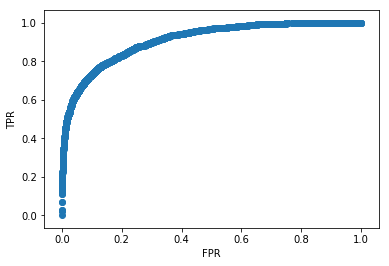

In [6]:
# Show the model statistics
mae = metrics.mean_absolute_error(y_val, y_pred_proba)
r2 = metrics.r2_score(y_val, y_pred_proba)
fpr, tpr, thresholds = metrics.roc_curve(y_val, y_pred_proba, pos_label=1, drop_intermediate=True)
print('mae: %.2f%%' % mae)
print('r2: %.2f%%' % r2)
print('FPR:',fpr)
print('TPR:',tpr)
print('thresholds:',thresholds)
plt.xlabel('FPR')
plt.ylabel('TPR')
plt.scatter(fpr,tpr)
plt.show()

[ 0.02467344  0.00145138  0.02612482  0.01015965  0.02467344  0.01306241
  0.01886792  0.03628447  0.04208998  0.01596517  0.00145138  0.
  0.06095791  0.          0.02467344  0.01161103  0.          0.00870827
  0.00145138  0.00145138  0.00725689  0.00435414  0.00435414  0.03047895
  0.01741655  0.00145138  0.00580552  0.00435414  0.          0.00290276
  0.          0.          0.          0.          0.01886792  0.
  0.00145138  0.02902758  0.01015965  0.01886792  0.00580552  0.00290276
  0.          0.00435414  0.01451379  0.          0.0203193   0.00435414
  0.00435414  0.00290276  0.          0.00145138  0.09433962  0.00725689
  0.04208998  0.0203193   0.          0.          0.          0.          0.
  0.00870827  0.01306241  0.00580552  0.00145138  0.00725689  0.          0.
  0.          0.          0.          0.          0.          0.
  0.03338171  0.          0.01015965  0.00580552  0.00725689  0.00290276
  0.          0.          0.00725689  0.00870827  0.          0.005

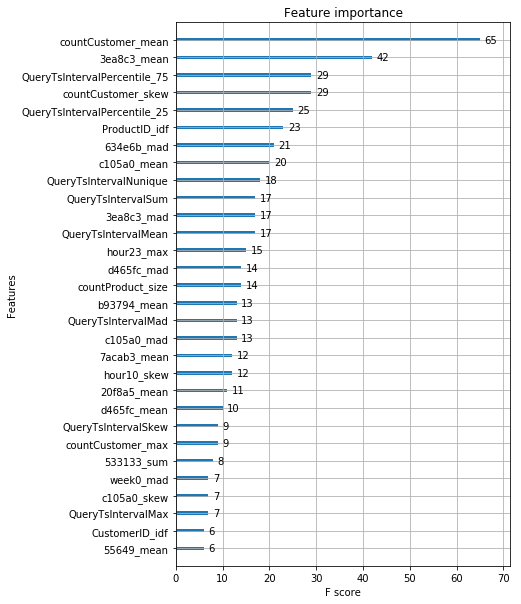

In [7]:
# Import the plot_importance function to visualize the feature importance
from xgboost import plot_importance
print(model_xgb.feature_importances_)
rcParams['figure.figsize'] = 6,10
plot_importance(model_xgb, max_num_features=30)
plt.show()

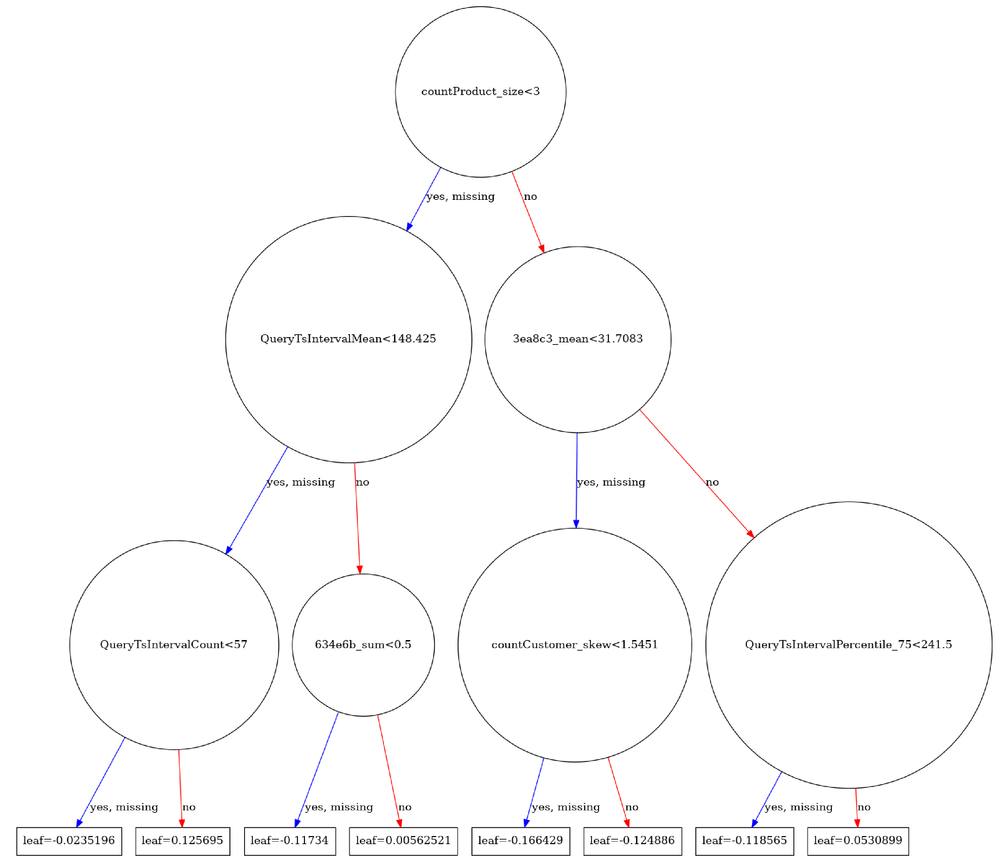

In [8]:
# Plot tree
from xgboost import plot_tree
rcParams['figure.figsize'] = 50,80
plot_tree(model_xgb, num_trees=1)
plt.show()

In [88]:
# Create submission
testing_set = pd.read_csv('testing-set.csv', encoding='utf-8', 
                          names=['FileID','Label'])
dft = pd.merge(df, testing_set, on=['FileID'], how='inner')
dft = dft.fillna(0)
dft2 = dft.drop(['FileID','Label'],1)
# Create submission
y_predt = model_xgb.predict_proba(dft2)[:,1]
y_predt = pd.DataFrame(y_predt, columns=['Label'])
submission = pd.concat([pd.DataFrame(dft['FileID']), y_predt], axis=1)
submission.to_csv('trend_submission_cgb_8800_rsm08.csv', index=False, header=False)
#submission['Label'].value_counts()

In [89]:
submission

,FileID,Label
0,00008c73ee43c15b16c26b26398c1577,2.307069e-03
1,0002ded3a0b54f2ffdab0ca77a5ce2b6,9.548975e-01
2,00050a9df8e13f6ab5a3d3b3e2fc6a86,2.300757e-04
3,000b1aa62b95e448784b8b341de46c64,3.357249e-03
4,000d9f96b5eddf04a3b7a37cb95d0a00,4.209349e-02
5,00111635044e630cb47c519a6ab7e906,1.108537e-02
6,00132b31a466e3e2a71ef5235e7d1305,7.942195e-03
7,0014f376f7468a7e0c2a53634c59ac41,3.070518e-11
8,0019e9f595600ccdad3b18fd533b8db2,6.493414e-03
9,001e99215de891f05b5477909bc7f881,5.067960e-11


In [12]:
x_train, x_test, y_train, y_test = train_test_split(X, y, random_state=7, test_size = 0.33)

In [14]:
y_pred = model_xgb.predict(x_test)
y_pred_proba = model_xgb.predict_proba(x_test)[:,1]
import numpy as np
from sklearn import metrics
print(metrics.roc_auc_score(y_test,y_pred_proba))
print(metrics.accuracy_score(y_test,y_pred))

0.936843060279
0.940511222665


In [16]:
y_pred_proba.shape

(17331,)

In [41]:
submission.to_csv('trend_submission.csv', index=False, header=False)